In [1]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.1 MB/s eta 0:00:00


In [2]:
from google.colab import files
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy as np
from datetime import datetime, timedelta
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_percentage_error
import statsmodels.api as sm
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from ipywidgets import interact, widgets
from IPython.display import display
import pmdarima as pm

In [3]:
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))


Saving dados_estoque_v2.csv to dados_estoque_v2.csv
User uploaded file "dados_estoque_v2.csv" with length 1521425 bytes


In [4]:
file_name = list(uploaded.keys())[0]
df = pd.read_csv(file_name, encoding='ISO-8859-1',delimiter=';')

In [5]:
print(df.columns)
print(df.shape)

Index(['Grupo Material', 'Código Almoxarifado', 'Almoxarifado',
       'Código Material', 'Material', 'Unidade', 'Custo Médio', 'Est',
       '01/03/2020', '01/04/2020', '01/05/2020', '01/06/2020', '01/07/2020',
       '01/08/2020', '01/09/2020', '01/10/2020', '01/11/2020', '01/12/2020',
       '01/01/2021', '01/02/2021', '01/03/2021', '01/04/2021', '01/05/2021',
       '01/06/2021', '01/07/2021', '01/08/2021', '01/09/2021', '01/10/2021',
       '01/11/2021', '01/12/2021', '01/01/2022', '01/02/2022', '01/03/2022',
       '01/04/2022', '01/05/2022', '01/06/2022', '01/07/2022', '01/08/2022',
       '01/09/2022', '01/10/2022', '01/11/2022', '01/12/2022', '01/01/2023',
       '01/02/2023', '01/03/2023', '01/04/2023', '01/05/2023', '01/06/2023',
       '01/07/2023', '01/08/2023'],
      dtype='object')
(7752, 50)


In [6]:
# Função para calcular a Demanda Média Diária (DMD) nos meses de redução de estoque
def calcular_dmd_reducao(row):
    colunas_datas = df.columns[8:-3]  # Supondo que as colunas de datas começam a partir da 9ª coluna

    diferenca_estoque = []

    for i in range(1, len(colunas_datas)):
        mes_anterior = colunas_datas[i - 1]
        mes_atual = colunas_datas[i]
        diferenca = row[mes_atual] - row[mes_anterior]
        if diferenca < 0:
            diferenca_estoque.append(-diferenca)  # Converter para valor positivo para representar consumo

    if len(diferenca_estoque) > 0:
        total_consumido = sum(diferenca_estoque)
        dmd = total_consumido / len(diferenca_estoque) / 30  # Dividir pelo número de dias nos meses
    else:
        dmd = 0

    return dmd

# Aplicar a função para calcular a DMD nos meses de redução de estoque em cada linha do DataFrame
df['DMD_Reducao_Estoque'] = df.apply(calcular_dmd_reducao, axis=1)

# Função para calcular o desvio padrão nos meses de redução de estoque
def calcular_desvio_padrao_reducao(row):
    colunas_datas = df.columns[8:-3]  # Supondo que as colunas de datas começam a partir da 9ª coluna

    desvios = []

    for i in range(1, len(colunas_datas)):
        mes_anterior = colunas_datas[i - 1]
        mes_atual = colunas_datas[i]
        diferenca = row[mes_atual] - row[mes_anterior]
        if diferenca < 0:
            desvios.append(-diferenca)  # Converter para valor positivo para representar consumo

    if len(desvios) > 0:
        desvio_padrao = np.std(desvios)
    else:
        desvio_padrao = 0

    return desvio_padrao

# Aplicar a função para calcular o desvio padrão nos meses de redução de estoque em cada linha do DataFrame
df['Desvio_Padrao'] = df.apply(calcular_desvio_padrao_reducao, axis=1)

# Função para calcular o ROP
def calcular_rop(row, lt=30, sf=1.96):
    dmd = row['DMD_Reducao_Estoque']
    sigma = row['Desvio_Padrao']

    rop = (dmd * lt) + (sf * sigma)

    return rop

# Aplicar a função para calcular o ROP em cada linha do DataFrame
df['ROP'] = df.apply(calcular_rop, axis=1)



In [7]:
# Inicialize uma lista de materiais a serem excluídos
materiais_a_excluir = []

# Itere pelos materiais no DataFrame
for index, row in df.iterrows():
    # Verifique se o estoque é zero em todos os meses
    if all(row[-13:-3] == 0):  # Substitua 2 pelo índice apropriado das colunas de estoque
        materiais_a_excluir.append(index)

# Exclua os materiais da lista 'materiais_a_excluir' do DataFrame
df = df.drop(materiais_a_excluir)

# Agora, 'df' conterá apenas os materiais que não têm estoque zero em todos os meses.


In [8]:
    material = 'GLICOSE 5% 250ML'
    material_df = df[df['Material'] == material]

In [9]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_entries = y_true != 0
    return np.mean(np.abs((y_true[non_zero_entries] - y_pred[non_zero_entries]) / y_true[non_zero_entries])) * 100


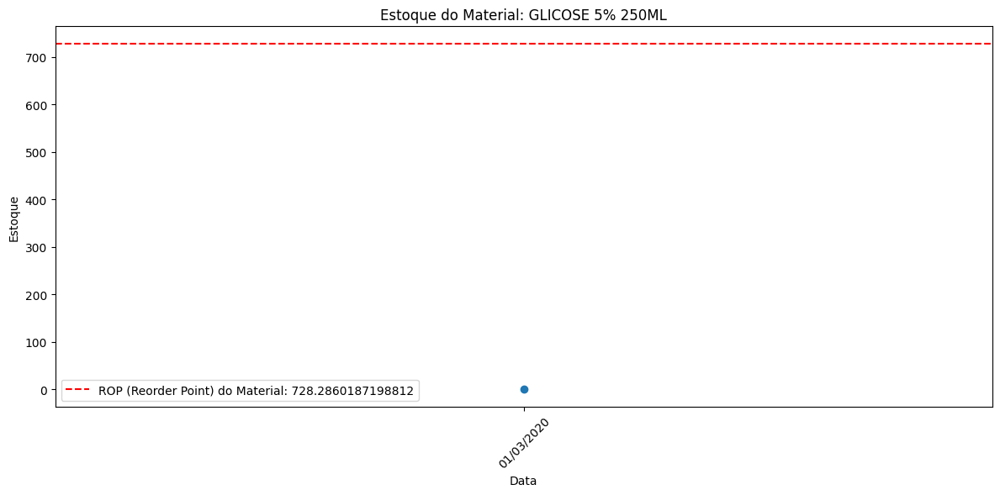

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Suponha que 'material_df' é o DataFrame que você está usando

def update(frame):
    plt.clf()  # Limpa a figura para que a nova linha possa ser desenhada
    plt.title(f'Estoque do Material: {material}')
    plt.xlabel('Data')
    plt.ylabel('Estoque')

    # Plotar a variação do estoque ao longo do tempo
    plt.plot(dates[:frame+1], stock.values[0][:frame+1], marker='o', linestyle='-')

    # Plotar o ROP do material como uma linha horizontal
    plt.axhline(y=ROP_material, color='red', linestyle='--', label=f'ROP (Reorder Point) do Material: {ROP_material}')

    # Rotacionar os rótulos do eixo x para melhor legibilidade
    plt.xticks(rotation=45)

    # Adicionar uma legenda
    plt.legend()

    # Ajustar o layout
    plt.tight_layout()

# Obter as datas e estoques
dates = material_df.columns[8:-3]
stock = material_df.iloc[:, 8:-3]
ROP_material = material_df.iloc[0]['ROP']

# Configurar a figura
fig, ax = plt.subplots(figsize=(12, 6))

# Iniciar a animação
animation = FuncAnimation(fig, update, frames=len(dates), repeat=False)

# Exibir a animação
HTML(animation.to_jshtml())


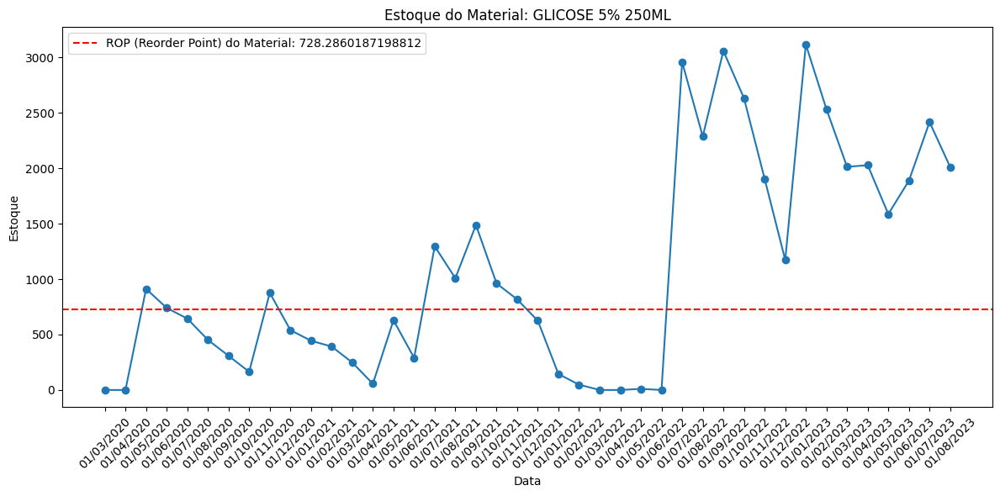

In [10]:
def grafico_material():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    ROP_material = material_df.iloc[0]['ROP']
    plt.figure(figsize=(12, 6))
    plt.title(f'Estoque do Material: {material}')
    plt.xlabel('Data')
    plt.ylabel('Estoque')

    # Plotar a variação do estoque ao longo do tempo
    plt.plot(dates, stock.values[0], marker='o', linestyle='-')

    # Plotar o ROP do material como uma linha horizontal
    plt.axhline(y=ROP_material, color='red', linestyle='--', label=f'ROP (Reorder Point) do Material: {ROP_material}')

    # Rotacionar os rótulos do eixo x para melhor legibilidade
    plt.xticks(rotation=45)

    # Adicionar uma legenda
    plt.legend()

    # Mostrar o gráfico
    plt.tight_layout()
    plt.show()

grafico_material()

O ROP (728.2860187198812) não foi atingido nas previsões.


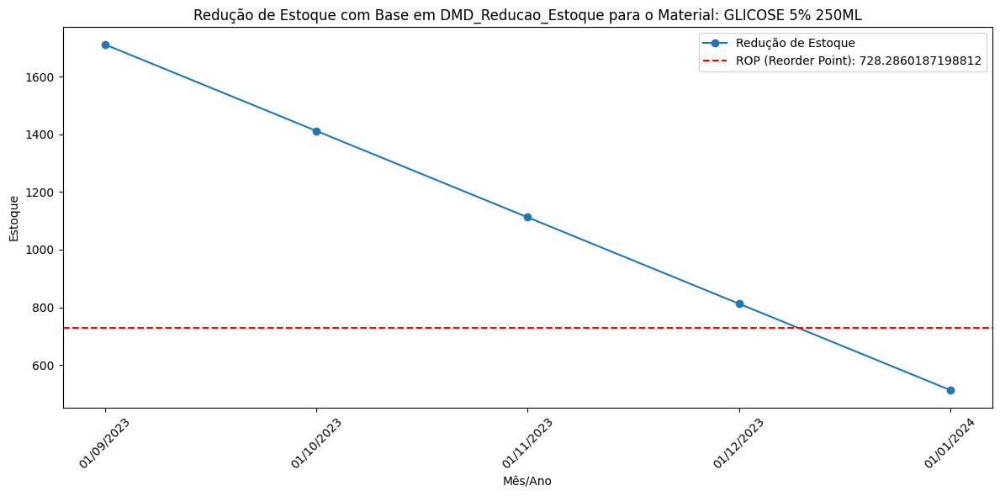

In [11]:
def consumo_sem_compra(meses):
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    ROP_material = material_df.iloc[0]['ROP']
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']  # Use o valor correto do DataFrame
    rop = material_df.iloc[0]['ROP']

    # Obter o estoque atual do material (use o valor correto do DataFrame)
    estoque_atual = stock.values[0][-1]  # Use o valor correto do DataFrame

    # Calcular a redução de estoque ao longo de 12 meses
    reducao_mensal = DMD_Reducao_Estoque * 30  # Suponha 30 dias por mês

    # Simular a redução de estoque ao longo de 12 meses
    estoque_simulado = [estoque_atual]
    data_ativacao_rop = None
    for i in range(1, meses):
        estoque_simulado.append(max(0, estoque_simulado[-1] - reducao_mensal))

    # Gerar datas para os próximos 12 meses (use o valor correto)
    last_date = pd.to_datetime(dates[-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, meses)]
    consumo_x_rop=0
    # Encontrar a primeira data em que o estoque simulado é menor ou igual ao ROP
    for i in range(len(future_dates)):
        if estoque_simulado[i] <= rop:
            consumo_x_rop = future_dates[i-1]
            break

    # Verificar se a data de ativação do ROP foi encontrada
    if consumo_x_rop:
        print(f"A data em que o estoque atinge o ROP ({rop}) é: {consumo_x_rop}")
    else:
        print(f"O ROP ({rop}) não foi atingido nas previsões.")


    # Plotar o gráfico com a redução de estoque
    plt.figure(figsize=(12, 6))
    plt.title(f'Redução de Estoque com Base em DMD_Reducao_Estoque para o Material: {material}')
    plt.xlabel('Mês/Ano')
    plt.ylabel('Estoque')

    # Plotar a linha de redução de estoque simulada
    plt.plot(future_dates, estoque_simulado[1:], marker='o', linestyle='-', label='Redução de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')

    # Rotacionar os rótulos do eixo x para melhor legibilidade
    plt.xticks(rotation=45)

    # Adicionar uma legenda
    plt.legend()
    # Mostrar o gráfico
    plt.tight_layout()
    plt.show()

consumo_sem_compra(6)

In [ ]:
---- Não Executar ----
# Filtrar o DataFrame para o material específico
material_df = df[df['Material'] == material]

# Transformar os dados em matrizes numpy para calcular a tendência linear
x = np.arange(len(dates)).reshape(-1, 1)
y = stock.values[0]  # Assumindo que estamos analisando o primeiro item de estoque

# Calcular a tendência linear
slope, intercept = np.polyfit(x.flatten(), y, 1)
trendline = intercept + slope * x

# Estender a tendência linear por mais 1 ano (12 meses adicionais)
x_extended = np.arange(len(dates), len(dates) + 12).reshape(-1, 1)  # Corrigido o ponto de partida
trendline_extended = intercept + slope * x_extended

# Gerar datas futuras
last_date = pd.to_datetime(dates[-1], format='%d/%m/%Y')
future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, 13)]

# Obter o valor do ROP para o material
rop = material_df.iloc[0]['ROP']

# Criar um gráfico para exibir os valores de estoque, a tendência linear, o ROP e os rótulos dos meses/ano futuros
plt.figure(figsize=(12, 6))
plt.title(f'Estoque do Material: {material} com Tendência Linear e ROP')
plt.xlabel('Mês/Ano')
plt.ylabel('Estoque')

# Plotar os valores de estoque
plt.plot(dates, y, marker='o', linestyle='-', label='Valores de Estoque')

# Plotar a tendência linear
plt.plot(dates, trendline, linestyle='--', label='Tendência Linear')

# Plotar a tendência linear estendida
plt.plot(future_dates, trendline_extended, linestyle='--', label='Tendência Linear Estendida')

# Plotar a linha do ROP
plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45)

# Adicionar uma legenda
plt.legend()

# Mostrar o gráfico
plt.tight_layout()
plt.show()



In [ ]:
---- Não Executar ----
# Filtrar o DataFrame para o material específico
material_df = df[df['Material'] == material]

# Selecionar as colunas de data e estoque, excluindo as três últimas colunas
dates = material_df.columns[8:-3]  # Excluindo as três últimas colunas
stock = material_df.iloc[:, 8:-3]  # Excluindo as três últimas colunas

# Transformar os dados em uma série temporal
stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))

# Calcular a tendência linear
slope, intercept = np.polyfit(x.flatten(), y, 1)
trendline = intercept + slope * x

# Estender a tendência linear por mais 1 ano (12 meses adicionais)
x_extended = np.arange(len(dates), len(dates) + 12).reshape(-1, 1)
trendline_extended = intercept + slope * x_extended

# Gerar datas futuras
last_date = pd.to_datetime(dates[-1], format='%d/%m/%Y')
future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, 13)]

stock_series = stock_series.resample('M').sum()
monthly_mean = stock_series.groupby(stock_series.index.month).mean()
porcentagem = monthly_mean/stock_series.mean()
month_of_dates = stock_series.index.month

# Calcular a tendência linear para todos os meses
trendline_times_porcentagem = []

# Iterar pelos valores da tendência linear e da porcentagem de cada mês
for i in range(len(trendline)):
    trendline_times_porcentagem.append(trendline[i] * porcentagem[month_of_dates[i]])

# Converter a lista em um array NumPy
trendline_times_porcentagem = np.array(trendline_times_porcentagem)
trendline_times_porcentagem[trendline_times_porcentagem < 0] = 0

# Obter o valor do ROP para o material
rop = material_df.iloc[0]['ROP']

# Criar um gráfico para exibir os valores de estoque, tendência, sazonalidade e ROP
plt.figure(figsize=(12, 8))
plt.suptitle(f'Análise do Material: {material}')

# Gráfico 1: Estoque, Tendência Linear e Sazonalidade
plt.subplot(2, 1, 1)
plt.title('Estoque, Tendência Linear e Sazonalidade')
plt.xlabel('Mês/Ano')
plt.ylabel('Estoque')
plt.plot(dates, stock.values[0], marker='o', linestyle='-', label='Valores de Estoque')
plt.plot(dates, trendline, linestyle='--', label='Tendência Linear')
plt.plot(future_dates, trendline_extended, linestyle='--', label='Tendência Linear Estendida')
plt.plot(dates, trendline_times_porcentagem, color='green', marker='o', linestyle='-', label='sazonalidade + tendência')
plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
plt.plot(future_dates, estoque_simulado[1:], marker='o', linestyle='-', label='Redução de Estoque')
plt.xticks(rotation=45)
plt.legend()

# Ajustar o layout
plt.tight_layout()

# Mostrar o gráfico
plt.show()

In [12]:
def regressao_linear():
    # Selecionar as colunas de data e estoque, excluindo as três últimas colunas
    dates = material_df.columns[8:-3]  # Excluindo as três últimas colunas
    stock = material_df.iloc[:, 8:-3]  # Excluindo as três últimas colunas

    # Transformar os dados em uma série temporal
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))

    # Dividir os dados em conjunto de treino (80%) e conjunto de teste (20%)
    train_size = int(len(stock_series) * 0.8)
    train, test = stock_series[:train_size], stock_series[train_size:]

    # Transformar os dados em matrizes numpy para calcular a tendência linear
    x = np.arange(len(train)).reshape(-1, 1)
    y = train  # Assumindo que estamos analisando o primeiro item de estoque

    last_date = pd.to_datetime(dates[-len(test)-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, len(test)+1)]

    # Calcular a tendência linear
    slope, intercept = np.polyfit(x.flatten(), y, 1)
    trendline = intercept + slope * x

    x_extended = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_extended = intercept + slope * x_extended

    # Calcular a tendência linear para os dados de teste
    x_test = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_test = intercept + slope * x_test
    stock_series = stock_series.resample('M').sum()
    monthly_mean = stock_series.groupby(stock_series.index.month).mean()
    porcentagem = monthly_mean/stock_series.mean()
    month_of_dates = stock_series.index.month

    # Calcular a sazonalidade para os dados de teste
    test_month_of_dates = test.index.month
    trendline_times_porcentagem_test = []


    for i in range(len(x_test)):
        trendline_times_porcentagem_test.append(trendline_test[i] * porcentagem[test_month_of_dates[i]])

    trendline_times_porcentagem_test = np.array(trendline_times_porcentagem_test)
    trendline_times_porcentagem_test[trendline_times_porcentagem_test < 0] = 0

    # Calcular o MAPE
    mape_test = mean_absolute_percentage_error(test.values, trendline_times_porcentagem_test)
    print(f'Erro MAPE para o conjunto de teste: {mape_test:.2f}%')


    stock_train = train.resample('M').sum()
    monthly_mean = stock_train.groupby(stock_train.index.month).mean()
    porcentagem = monthly_mean/stock_train.mean()
    month_of_dates = stock_train.index.month

    trendline_times_porcentagem = []

    for i in range(len(trendline)):
        trendline_times_porcentagem.append(trendline[i] * porcentagem[month_of_dates[i]])


    rop = material_df.iloc[0]['ROP']

    # Criar um gráfico para exibir os valores de estoque, tendência, sazonalidade e ROP
    #plt.figure(figsize=(12, 8))
    #plt.suptitle(f'Análise do Material: {material}')

    # Gráfico 1: Estoque, Tendência Linear e Sazonalidade
    #plt.subplot(2, 1, 1)
    #plt.title('Estoque, Tendência Linear e Sazonalidade')
    #plt.xlabel('Mês/Ano')
    #plt.ylabel('Estoque')
    #plt.plot(dates, stock.values[0], marker='o', linestyle='-', label='Valores de Estoque')
    #plt.plot(dates[:-len(test)], trendline, linestyle='--', label='Tendência Linear')
    #plt.plot(future_dates, trendline_extended, linestyle='--', label='Tendência Linear Estendida')
    #plt.plot(dates[:-len(test)], trendline_times_porcentagem, color='green', marker='o', linestyle='-', label='sazonalidade + tendência')
    #plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    #plt.plot(future_dates, trendline_times_porcentagem_test, color='red', linestyle='-', label='Sazonalidade + Tendência Estendida')
    #plt.xticks(rotation=45)
    #plt.legend()

    # Ajustar o layout
    #plt.tight_layout()

    # Mostrar o gráfico
    #plt.show()
    return mape_test
print('erro mape', regressao_linear())

Erro MAPE para o conjunto de teste: 41.73%
erro mape 41.73106216508241


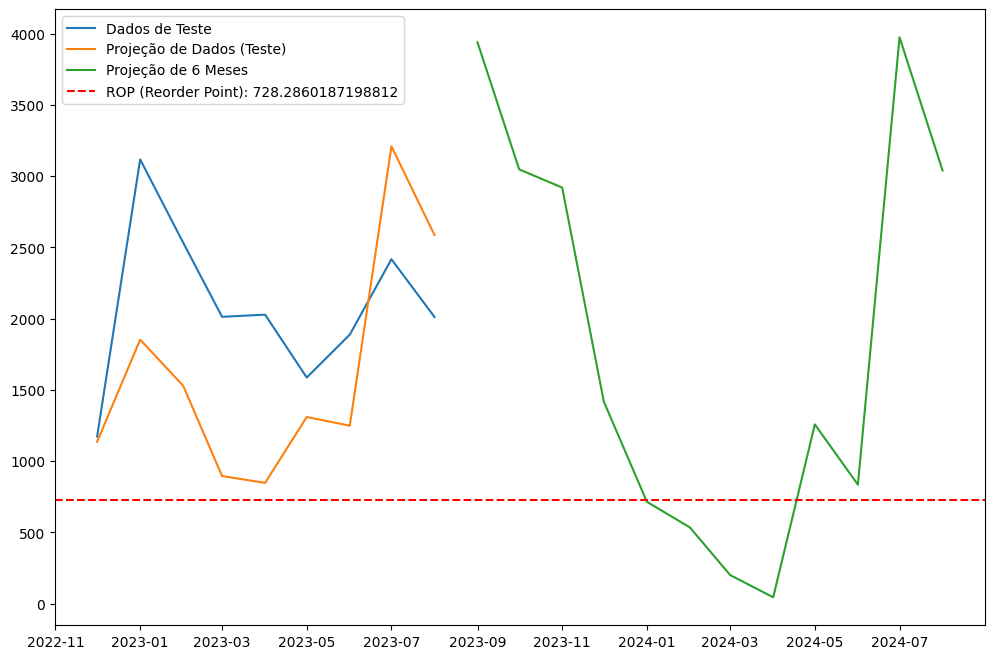

[(Timestamp('2023-09-01 00:00:00'), array([3938.30760087])),
 (Timestamp('2023-10-01 00:00:00'), array([3047.62546992])),
 (Timestamp('2023-11-01 00:00:00'), array([2919.45809589])),
 (Timestamp('2023-12-01 00:00:00'), array([1417.54738054])),
 (Timestamp('2024-01-01 00:00:00'), array([715.46597404])),
 (Timestamp('2024-02-01 00:00:00'), array([535.38270166])),
 (Timestamp('2024-03-01 00:00:00'), array([201.17410608])),
 (Timestamp('2024-04-01 00:00:00'), array([45.42641105])),
 (Timestamp('2024-05-01 00:00:00'), array([1258.14934891])),
 (Timestamp('2024-06-01 00:00:00'), array([835.52148896])),
 (Timestamp('2024-07-01 00:00:00'), array([3973.99978099])),
 (Timestamp('2024-08-01 00:00:00'), array([3039.51361081]))]

In [14]:
def previsao_regressao_linear(meses):
    # Selecionar as colunas de data e estoque, excluindo as três últimas colunas
    dates = material_df.columns[8:-3]  # Excluindo as três últimas colunas
    stock = material_df.iloc[:, 8:-3]  # Excluindo as três últimas colunas

    # Transformar os dados em uma série temporal
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))

    # Dividir os dados em conjunto de treino (80%) e conjunto de teste (20%)
    train_size = int(len(stock_series) * 0.8)
    train, test = stock_series[:train_size], stock_series[train_size:]

    # Transformar os dados em matrizes numpy para calcular a tendência linear
    x = np.arange(len(train)).reshape(-1, 1)
    y = train  # Assumindo que estamos analisando o primeiro item de estoque

    last_date = pd.to_datetime(dates[-len(test)-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, len(test)+1)]

    # Calcular a tendência linear
    slope, intercept = np.polyfit(x.flatten(), y, 1)
    trendline = intercept + slope * x

    x_extended = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_extended = intercept + slope * x_extended

    # Calcular a tendência linear para os dados de teste
    x_test = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_test = intercept + slope * x_test
    stock_series = stock_series.resample('M').sum()
    monthly_mean = stock_series.groupby(stock_series.index.month).mean()
    porcentagem = monthly_mean/stock_series.mean()
    month_of_dates = stock_series.index.month

    # Calcular a sazonalidade para os dados de teste
    test_month_of_dates = test.index.month
    trendline_times_porcentagem_test = []

    for i in range(len(x_test)):
        trendline_times_porcentagem_test.append(trendline_test[i] * porcentagem[test_month_of_dates[i]])

    trendline_times_porcentagem_test = np.array(trendline_times_porcentagem_test)
    trendline_times_porcentagem_test[trendline_times_porcentagem_test < 0] = 0

    stock_train = train.resample('M').sum()
    monthly_mean = stock_train.groupby(stock_train.index.month).mean()
    porcentagem = monthly_mean/stock_train.mean()
    month_of_dates = stock_train.index.month

    trendline_times_porcentagem = []

    for i in range(len(trendline)):
        trendline_times_porcentagem.append(trendline[i] * porcentagem[month_of_dates[i]])


    rop = material_df.iloc[0]['ROP']
    # Calcular o último ponto conhecido da tendência linear estendida e aplicar a sazonalidade a partir desse ponto
    last_known_trend_extended = trendline_extended[-1]  # Último ponto conhecido da tendência linear estendida
    months_to_extend = meses
    future_extension = []

    # Criar uma lista de datas a serem projetadas
    projected_dates = [test.index[-1] + pd.DateOffset(months=i) for i in range(1, months_to_extend + 1)]

    for date in projected_dates:
        # Projeta o próximo ponto baseado na tendência linear estendida
        projected_point = last_known_trend_extended * 1

        # Aplica a sazonalidade ao ponto projetado
        projected_point *= porcentagem[date.month]

        future_extension.append((date, max(projected_point, 0)))

    # Visualização/*
    plt.figure(figsize=(12, 8))
    plt.plot(test.index, test.values, label='Dados de Teste')
    plt.plot(test.index, trendline_times_porcentagem_test, label='Projeção de Dados (Teste)')
    plt.plot([date for date, val in future_extension], [val for date, val in future_extension], label='Projeção de 6 Meses')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.legend()
    plt.show()
    return future_extension

previsao_regressao_linear(12)

In [ ]:
---- Não Executar ----
# Supondo que o DataFrame seja 'df' e as colunas de estoque sejam identificadas
# Coloque as colunas de estoque em uma lista (suponhamos que sejam as colunas de índice 8 em diante)
colunas_estoque = df.columns[8:-3]

# Dicionários para armazenar os incrementos e decrementos
maior_acrescimo = {'mes': None, 'valor': 0}
maior_decrescimo = {'mes': None, 'valor': 0}

# Iterando pelas colunas de estoque
for coluna in colunas_estoque:
    # Calculando a diferença entre meses consecutivos para cada coluna
    diferenca = df[coluna].diff()
    # Verificando o maior acréscimo e o maior decréscimo para esta coluna
    max_acrescimo = diferenca.max()
    if max_acrescimo > maior_acrescimo['valor']:
        maior_acrescimo = {'mes': coluna, 'valor': max_acrescimo}

    max_decrescimo = diferenca.min()
    if max_decrescimo < maior_decrescimo['valor']:
        maior_decrescimo = {'mes': coluna, 'valor': max_decrescimo}

# Resultados
print("Mês com maior acréscimo de estoque:", maior_acrescimo['mes'])
print("Valor do acréscimo:", maior_acrescimo['valor'])
print("Mês com maior decréscimo de estoque:", maior_decrescimo['mes'])
print("Valor do decréscimo:", maior_decrescimo['valor'])


Mês com maior acréscimo de estoque: 01/12/2020
Valor do acréscimo: 5027875.0
Mês com maior decréscimo de estoque: 01/12/2020
Valor do decréscimo: -5027875.0


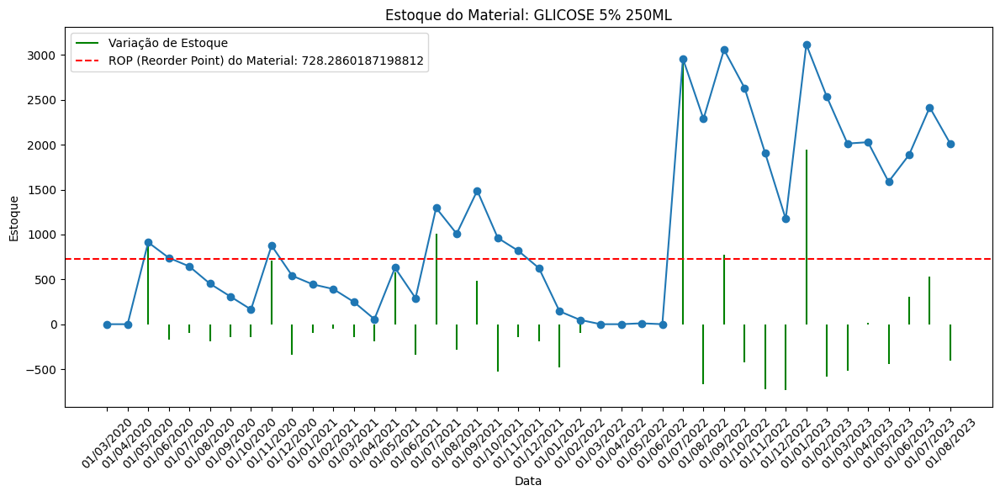

Maior variação de estoque: 2959.0 no mês de 01/07/2022
Menor variação de estoque: -733.0 no mês de 01/12/2022


In [ ]:
def variação_material():
    # Criar uma figura e eixos para o gráfico
    plt.figure(figsize=(12, 6))
    plt.title(f'Estoque do Material: {material}')
    plt.xlabel('Data')
    plt.ylabel('Estoque')

    # Selecionar as colunas de data e estoque
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    ROP_material = material_df.iloc[0]['ROP']

    # Calcular a variação do estoque ao longo do tempo
    variation = stock.diff(axis=1).iloc[0]  # Calculando a variação do estoque

    # Plotar a variação do estoque ao longo do tempo com linhas verticais
    plt.vlines(x=dates, ymin=0, ymax=variation.values, color='green', label='Variação de Estoque')
    plt.plot(dates, stock.values[0], marker='o', linestyle='-')
    # Plotar o ROP do material como uma linha horizontal
    plt.axhline(y=ROP_material, color='red', linestyle='--', label=f'ROP (Reorder Point) do Material: {ROP_material}')

    # Rotacionar os rótulos do eixo x para melhor legibilidade
    plt.xticks(rotation=45)

    # Adicionar uma legenda
    plt.legend()

    # Mostrar o gráfico
    plt.tight_layout()
    plt.show()

    mes_maior_variacao = variation.idxmax()
    mes_menor_variacao = variation.idxmin()

    print(f"Maior variação de estoque: {variation.max()} no mês de {mes_maior_variacao}")
    print(f"Menor variação de estoque: {variation.min()} no mês de {mes_menor_variacao}")
variação_material()

In [ ]:
---- Não Executar ----
# Filtrar o DataFrame para o material específico
material_df = df[df['Material'] == material]

# Selecionar as colunas de data e estoque
dates = material_df.columns[8:]
stock = material_df.iloc[:, 8:]
dates = dates[:-3]
stock = stock.iloc[:, :-3]

# Calcular a variação do estoque ao longo do tempo
variation = stock.diff(axis=1).iloc[0]  # Calculando a variação do estoque

# Criar um DataFrame com a variação
variation_df = pd.DataFrame({'Data': dates, 'Variacao': variation})

# Extrair o mês das datas
variation_df['Data'] = pd.to_datetime(variation_df['Data'], format='%d/%m/%Y')
variation_df['Mes'] = variation_df['Data'].dt.strftime('%B')  # Extrair o nome do mês

# Calcular a média da variação por mês
media_variacao_mensal = variation_df.groupby('Mes')['Variacao'].mean()

# Encontrar o mês com a maior e a menor média de variação
mes_maior_media_variacao = media_variacao_mensal.idxmax()
mes_menor_media_variacao = media_variacao_mensal.idxmin()

print(f"Mês com maior variação média: {mes_maior_media_variacao}")
print(f"Mês com menor variação média: {mes_menor_media_variacao}")

print(media_variacao_mensal)

Mês com maior variação média: July
Mês com menor variação média: December
Mes
April         -44.250000
August       -389.250000
December     -420.333333
February     -244.000000
January       455.666667
July         1099.500000
June          -55.000000
March        -237.333333
May           263.500000
November      -52.666667
October      -366.000000
September     369.333333
Name: Variacao, dtype: float64


In [ ]:
---- Não Executar ----
# Lista para armazenar as médias mensais de todos os materiais
medias_por_mes = []

# Iterar por cada material
for material in df['Material'].unique():
    material_df = df[df['Material'] == material]

    # Selecionar as colunas de data e estoque
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]

    # Calcular a variação do estoque ao longo do tempo
    variation = stock.diff(axis=1).iloc[0]  # Calculando a variação do estoque

    # Criar um DataFrame com a variação
    variation_df = pd.DataFrame({'Data': dates, 'Variacao': variation})

    # Extrair o mês das datas
    variation_df['Data'] = pd.to_datetime(variation_df['Data'], format='%d/%m/%Y')
    variation_df['Mes'] = variation_df['Data'].dt.strftime('%B')  # Extrair o nome do mês

    # Calcular a média da variação por mês para o material atual
    media_variacao_mensal = variation_df.groupby('Mes')['Variacao'].mean()
    medias_por_mes.append(media_variacao_mensal)

# Criar um DataFrame com as médias mensais de todos os materiais
medias_por_mes_df = pd.DataFrame(medias_por_mes)

# Encontrar o mês com a maior e a menor média de variação entre todos os materiais
media_variacao_total = medias_por_mes_df.mean()
mes_maior_variacao_total = media_variacao_total.idxmax()
mes_menor_variacao_total = media_variacao_total.idxmin()

print(f"Mês com maior variação média entre todos os materiais: {mes_maior_variacao_total}")
print(f"Mês com menor variação média entre todos os materiais: {mes_menor_variacao_total}")
print(media_variacao_total)

Mês com maior variação média entre todos os materiais: November
Mês com menor variação média entre todos os materiais: February
Mes
April        -57.120202
August       -15.626320
December      44.085413
February    -828.785349
January      158.715771
July         209.315979
June          21.896473
March        -19.632118
May           38.458733
November     811.777991
October     -252.799584
September    -41.677703
dtype: float64


In [ ]:
---- Não Executar ----

# Supondo que você tenha um DataFrame com colunas 'Date' e 'Stock'
# e já tenha seus dados de estoque (stock_series) e datas (dates)

# Criar um DataFrame com as datas e o estoque
data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series})

# Definir o número de períodos para a média móvel
window_size = 3  # Ajuste conforme necessário

# Calcular a média móvel
data['Moving Average'] = data['Stock'].rolling(window=window_size).mean()

# Plotar os dados reais e a média móvel estendida
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Stock'], label='Estoque Atual', marker='o', linestyle='-')
plt.plot(data['Date'], data['Moving Average'], label=f'Média Móvel ({window_size} períodos)', linestyle='--', color='red')

plt.title('Previsão usando Média Móvel (12 Meses Futuros)')
plt.xlabel('Data')
plt.ylabel('Estoque')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [15]:
def media_movel():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series})
    # Definir o número de períodos para a média móvel
    window_size = 3  # Ajuste conforme necessário

    # Dividir os dados em conjunto de treino e teste (80% treino, 20% teste)
    train, test = train_test_split(data, test_size=0.2, shuffle=False)

    # Calcular a média móvel apenas para o conjunto de treino
    train['Moving Average'] = train['Stock'].rolling(window=window_size).mean()

    # Prever a média móvel para o conjunto de teste
    future_avg = []

    last_window = train['Stock'].tail(window_size)
    for stock in test['Stock']:
        future_avg.append(last_window.mean())
        last_window = last_window.iloc[1:].append(pd.Series(stock))
    '''
    plt.figure(figsize=(12, 6))
    plt.plot(train['Date'], train['Stock'], label='Estoque Atual - Treino', marker='o', linestyle='-')
    plt.plot(train['Date'], train['Moving Average'], label=f'Média Móvel ({window_size} períodos) - Treino', linestyle='--', color='red')
    plt.plot(test['Date'], test['Stock'], label='Estoque Atual - Teste', marker='o', linestyle='-')
    plt.plot(test['Date'], future_avg, label=f'Média Móvel ({window_size} períodos) - Teste', linestyle='--', color='green')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.title('Previsão usando Média Móvel - Conjunto de Treino e Teste')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show() '''
    mape = mean_absolute_percentage_error(test['Stock'], future_avg)

    print(f"Erro MAPE nos dados de teste: {mape:.2f}%")

    # Estender a média móvel para os próximos três meses
    future_avg = []

    last_window = test['Stock'].tail(window_size)
    for i in range(6):  # Prever os próximos 3 meses
        future_avg.append(last_window.mean())
        last_window = last_window.iloc[1:].append(pd.Series(future_avg[-1]))

    # Criar datas para os próximos três meses
    last_date = test['Date'].max()
    future_dates = pd.date_range(start=last_date + pd.DateOffset(months=1), periods=6, freq='MS')

    # Criar um DataFrame para os próximos três meses com as datas e previsões
    future_data = pd.DataFrame({'Date': future_dates, 'Moving Average': future_avg})

    # Juntar os dados anteriores e a previsão para os próximos três meses
    extended_test = pd.concat([test, future_data])

    return mape

media_movel()

Erro MAPE nos dados de teste: 30.82%


<ipython-input-15-3cd96bcd65f8>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  last_window = last_window.iloc[1:].append(pd.Series(stock))
<ipython-input-15-3cd96bcd65f8>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  last_window = last_window.iloc[1:].append(pd.Series(stock))
<ipython-input-15-3cd96bcd65f8>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  last_window = last_window.iloc[1:].append(pd.Series(stock))
<ipython-input-15-3cd96bcd65f8>:24: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  last_window = last_window.iloc[1:].append(pd.Series(stock))
<ipython-input-15-3cd96bcd65f8>:24: FutureWarning: The series.append met

30.824289382273246

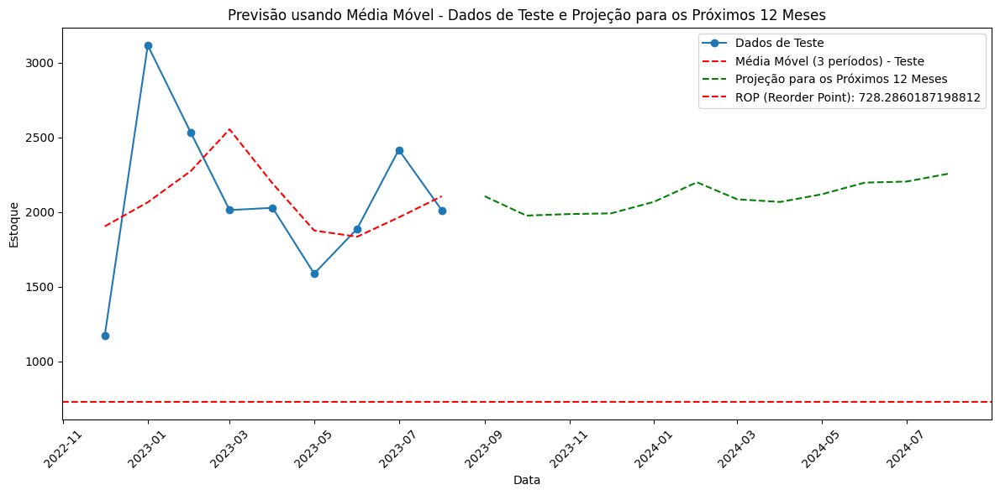

,Date,Moving Average
0,2023-09-01,2105.666667
1,2023-10-01,1976.000000
2,2023-11-01,1986.400000
3,2023-12-01,1990.833333
4,2024-01-01,2068.285714
5,2024-02-01,2199.375000
6,2024-03-01,2085.333333
7,2024-04-01,2067.400000
8,2024-05-01,2118.727273
9,2024-06-01,2197.083333


In [16]:
def previsao_media_movel(meses):
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series})

    # Definir o número de períodos para a média móvel
    window_size = 3  # Ajuste conforme necessário

    # Dividir os dados em conjunto de treino e teste (80% treino, 20% teste)
    train, test = train_test_split(data, test_size=0.2, shuffle=False)

    # Calcular a média móvel para o conjunto de treino e teste
    data['Moving Average'] = data['Stock'].rolling(window=window_size).mean()

    # Calcular a média móvel futura
    initial_avg = test['Stock'].iloc[-window_size:].mean()
    future_avg = [initial_avg]

    for i in range(1, meses):
        last_window = data['Stock'].tail(window_size + i)
        future_avg.append(last_window.mean())

    # Criar um DataFrame para os próximos 'meses' meses com as datas e previsões
    future_dates = pd.date_range(start=data['Date'].max() + pd.DateOffset(months=1), periods=meses, freq='MS')
    future_data = pd.DataFrame({'Date': future_dates, 'Moving Average': future_avg})

    # Exibir o gráfico apenas para os próximos 'meses' meses
    plt.figure(figsize=(12, 6))
    plt.plot(test['Date'], test['Stock'], label='Dados de Teste', marker='o', linestyle='-')
    plt.plot(test['Date'], data['Moving Average'].tail(len(test)), label=f'Média Móvel ({window_size} períodos) - Teste', linestyle='--', color='red')
    plt.plot(future_data['Date'], future_data['Moving Average'], label=f'Projeção para os Próximos {meses} Meses', linestyle='--', color='green')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.title(f'Previsão usando Média Móvel - Dados de Teste e Projeção para os Próximos {meses} Meses')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    return future_data

previsao_media_movel(12)


In [17]:
def arima():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    # Divida os dados em treino (80%) e teste (20%)
    split_index = int(0.8 * len(stock_series))
    train_data = stock_series.iloc[:split_index]
    test_data = stock_series.iloc[split_index:]

    # Use auto_arima para identificar automaticamente os parâmetros
    auto_model = auto_arima(train_data, seasonal=False, trace=True)

    # Ajuste o modelo aos dados de treino
    auto_model.fit(train_data)

    # Faça previsões para o mesmo período dos dados de teste
    forecast, conf_int = auto_model.predict(n_periods=len(test_data), return_conf_int=True)

    # Ajuste as previsões para garantir que não sejam valores negativos
    forecast = np.clip(forecast, a_min=0, a_max=None)

    # Calcule o MAPE nos dados de teste
    mape = mean_absolute_percentage_error(test_data, forecast)
    print(f"Erro MAPE nos dados de teste: {mape:.2f}%")

    # Gere datas futuras para os próximos 9 meses
    last_date = stock_series.index.max()
    future_dates = [last_date + pd.DateOffset(months=i) for i in range(1, 10)]

    # Crie um DataFrame com as previsões para os próximos 9 meses
    forecast_data = pd.DataFrame({'Date': future_dates, 'Forecast': forecast})

    # Plote os dados reais e as previsões
    '''
    plt.figure(figsize=(12, 8))
    plt.title('Previsão de Estoque para os Próximos 9 Meses')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.plot(stock_series.index, stock_series, marker='o', linestyle='-', label='Valores de Estoque')
    plt.plot(test_data.index, forecast, linestyle='--', label='Previsão de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()
    '''
    return mape
arima()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=526.683, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=561.718, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=526.052, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=546.316, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=526.830, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=527.410, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=527.956, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=524.915, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=543.747, Time=0.04 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=526.527, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=526.733, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=534.164, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=527.434, Time=0.29 sec

Best model:  ARIMA(1,0,0)(0,0,0)[0] intercept
Total fit time: 2.268 seconds
Erro MAPE nos dados de teste: 49.80

49.79609417721194

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=657.473, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=654.661, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=653.367, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=655.674, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=655.523, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=655.114, Time=0.51 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=655.084, Time=0.51 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=654.254, Time=0.24 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=657.060, Time=0.61 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=654.919, Time=0.13 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=652.324, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


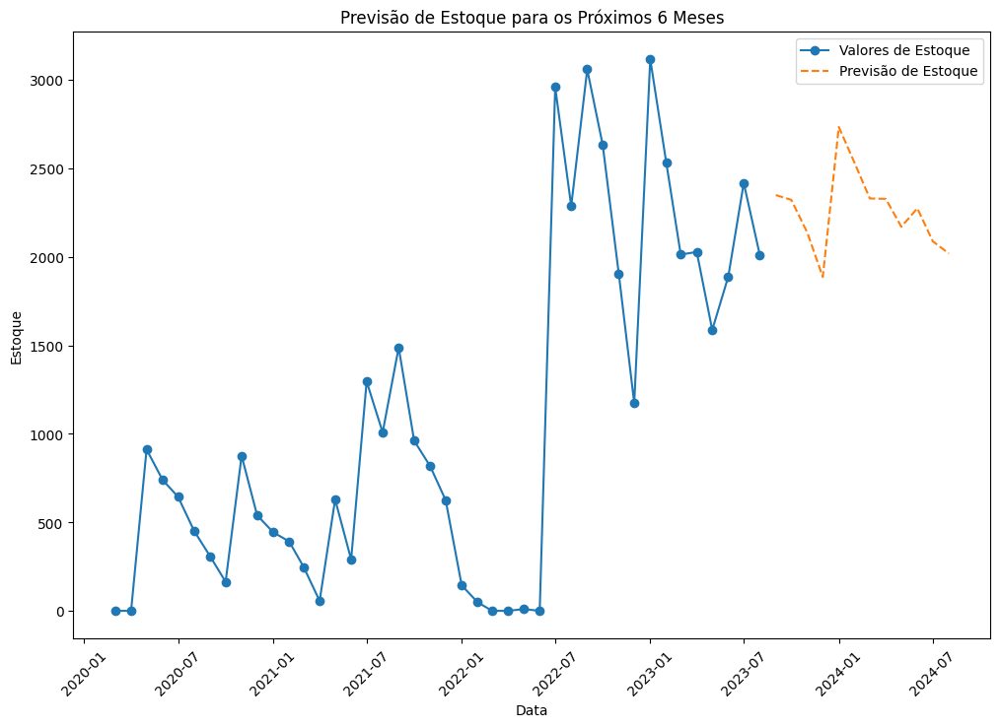

2023-09-01    2348.976071
2023-10-01    2322.213771
2023-11-01    2137.058923
2023-12-01    1886.137114
2024-01-01    2734.006626
2024-02-01    2527.457311
2024-03-01    2330.103589
2024-04-01    2327.710539
2024-05-01    2169.971024
2024-06-01    2274.478351
2024-07-01    2087.593935
2024-08-01    2019.132372
Freq: MS, Name: Forecast, dtype: float64

In [18]:
def previsao_sarima(meses):
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    # Use auto_arima para identificar automaticamente a ordem do modelo SARIMA
    model = auto_arima(stock_series, seasonal=True, m=12, suppress_warnings=True, trace=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Ajuste o modelo SARIMA aos dados de treino
    model = sm.tsa.SARIMAX(stock_series, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=0)

    # Faça previsões para os próximos 6 meses
    forecast_steps = meses
    forecast = model_fit.get_forecast(steps=forecast_steps)

    # Gere datas futuras para os próximos 6 meses
    last_date = stock_series.index.max()
    future_dates = [last_date + pd.DateOffset(months=i) for i in range(1, forecast_steps + 1)]

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': future_dates, 'Forecast': np.maximum(forecast.predicted_mean, 0)})

    # Plote os dados reais e as previsões
    plt.figure(figsize=(12, 8))
    plt.title('Previsão de Estoque para os Próximos 6 Meses')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.plot(stock_series.index, stock_series, marker='o', linestyle='-', label='Valores de Estoque')
    plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()
    return forecast_data['Forecast']
previsao_sarima(12)

In [19]:
def sarima():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    # Dividir os dados em treino e teste
    train_size = int(len(stock_series) * 0.8)
    train_data, test_data = stock_series[:train_size], stock_series[train_size:]

    # Encontre os melhores parâmetros usando auto_arima nos dados de treino
    model = pm.auto_arima(train_data, seasonal=True, m=12, suppress_warnings=True, trace=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Ajuste o modelo SARIMA aos dados de treino
    model = sm.tsa.SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=0)

    # Faça previsões nos dados de teste
    forecast = model_fit.get_forecast(steps=len(test_data))

    # Ajuste os valores negativos para zero
    forecast.predicted_mean = np.maximum(forecast.predicted_mean, 0)

    # Calcule o MAPE
    mape = mean_absolute_percentage_error(test_data, forecast.predicted_mean)
    print(f"Erro MAPE nos dados de teste: {mape:.2f}%")
    '''
    # Plote os resultados
    plt.figure(figsize=(12, 8))
    plt.plot(train_data.index, train_data, label='Treino')
    plt.plot(test_data.index, test_data, label='Teste')
    plt.plot(test_data.index, forecast.predicted_mean, label='Previsão')
    plt.legend()
    #plt.show()
    '''
    return mape

# Exemplo de uso
mape = sarima()
print(f"Erro MAPE para o material: {mape:.2f}%")

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.70 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=1.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.09 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=3.74 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=1.27 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=339.116, Time=0.19 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=329.116, Time=0.49 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.643, Time=0.52 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=328.735, Time=0.44 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


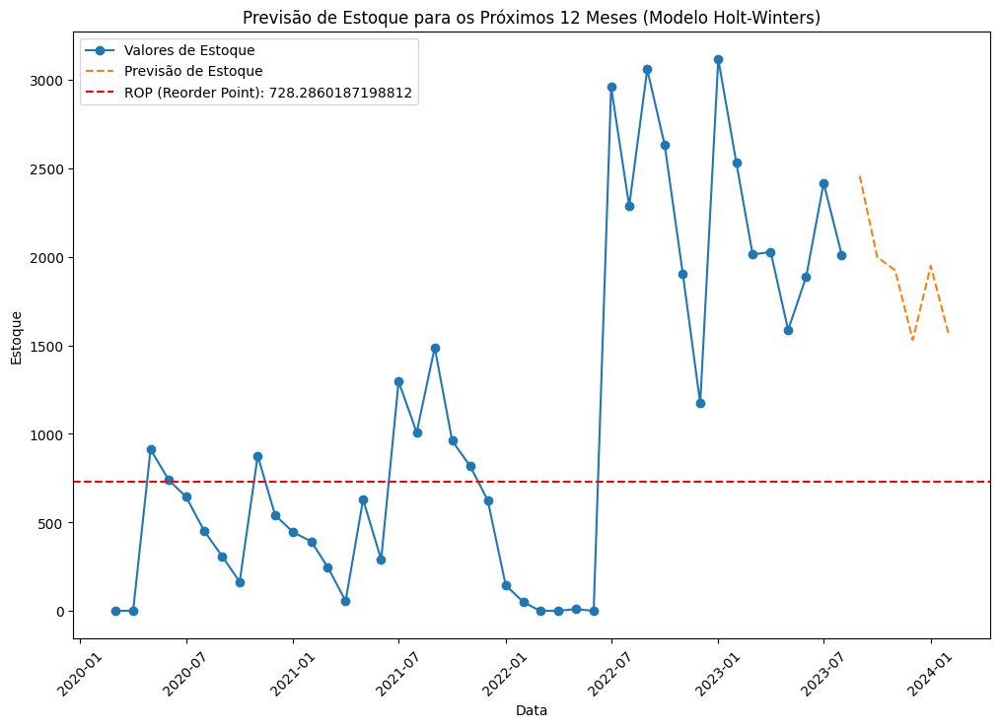

,Date,Forecast
42,2023-09-01,2457.691313
43,2023-10-01,1998.635417
44,2023-11-01,1923.220231
45,2023-12-01,1530.356507
46,2024-01-01,1949.345067
47,2024-02-01,1557.606718


In [20]:
def previsao_holt_winters(meses):
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series.values})
    model = ExponentialSmoothing(data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=meses)

    # Aplicando um limite inferior de zero
    forecast[forecast < 0] = 0

    # Gere datas futuras para os próximos 12 meses
    last_date = data['Date'].max()
    future_dates = [last_date + pd.DateOffset(months=i) for i in range(1, meses+1)]

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': future_dates, 'Forecast': forecast})

    # Plote os dados reais e as previsões
    plt.figure(figsize=(12, 8))
    plt.title('Previsão de Estoque para os Próximos 12 Meses (Modelo Holt-Winters)')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.plot(data['Date'], data['Stock'], marker='o', linestyle='-', label='Valores de Estoque')
    plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()
    return forecast_data
previsao_holt_winters(6)

In [21]:
def holt_winters():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series.values})

    split_index = int(0.80 * len(data))

    # Divida os dados
    train_data = data.iloc[:split_index]
    test_data = data.iloc[split_index:]

    # Aplique o modelo Holt-Winters aos dados de treinamento
    model = ExponentialSmoothing(train_data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()

    # Faça previsões para os dados de teste
    forecast = model_fit.forecast(steps=len(test_data))

    forecast[forecast < 0] = 0

    # Gere datas para os dados de teste
    test_dates = test_data['Date']

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': test_dates, 'Forecast': forecast})

    # Plote os dados reais e as previsões
    '''
    plt.figure(figsize=(12, 8))
    plt.title('Previsão de Estoque para os Últimos 20% dos Dados (Modelo Holt-Winters)')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.plot(data['Date'], data['Stock'], marker='o', linestyle='-', label='Valores de Estoque ')
    plt.plot(test_dates, forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.legend()
    plt.xticks(rotation=45)
    #plt.show()
    '''
    mape = mean_absolute_percentage_error(test_data['Stock'], forecast_data['Forecast'])
    return mape
holt_winters()

29.097364382667777

In [22]:
def detectar_atingimento_rop(previsao, rop, reducao_mensal):
    data_atingimento_rop = None

    # Itere pelas previsões e datas correspondentes
    for date, forecast in zip(previsao['Date'], previsao['Forecast']):
        if forecast <= rop:
            data_atingimento_rop = date
            break  # Saia do loop quando atingir o ROP

    if data_atingimento_rop:
        print(f"A data em que a previsão atinge o ROP ({rop}) é: {data_atingimento_rop}")

        # Encontre o índice correspondente à data de atingimento do ROP
        idx = previsao.index[previsao['Date'] == data_atingimento_rop][0]

        # Calcule a quantidade a ser comprada com base na diferença entre o ROP e a previsão
        quantidade_a_comprar = max(rop - previsao['Forecast'][idx], 0) + 3 * reducao_mensal

        print(f"Quantidade recomendada para compra na data do ROP: {quantidade_a_comprar:.2f} unidades")
    else:
        print(f"A previsão não atinge o ROP ({rop})")


def identificar_aumento_previsao(previsao):
    aumentos = []  # Lista para armazenar informações sobre os aumentos na previsão

    # Iterar pela previsão para identificar aumentos
    for i in range(1, len(previsao)):
        if previsao['Forecast'].iloc[i] > previsao['Forecast'].iloc[i - 1]:
            aumento = {
                'Data': previsao['Date'].iloc[i],
                'Aumento': previsao['Forecast'].iloc[i] - previsao['Forecast'].iloc[i - 1]
            }
            aumentos.append(aumento)

    # Imprimir informações sobre os aumentos
    if aumentos:
        print("compras a serem realizadas com base na previsão:")
        for aumento in aumentos:
            print(f"Data: {aumento['Data']}, quantidade: {aumento['Aumento']:.2f}")
    else:
        print("Não há comprar a serem realizadas com base na previsão.")


      Grupo Material  Código Almoxarifado  \
1480               9                    2   

                               Almoxarifado  Código Material  \
1480  UNIDADE DE ABASTECIMENTO FARMACEUTICO           201545   

              Material Unidade Custo Médio Est  01/03/2020  01/04/2020  ...  \
1480  GLICOSE 5% 250ML      UN      4,4965   S           0           0  ...   

      01/02/2023  01/03/2023  01/04/2023  01/05/2023  01/06/2023  01/07/2023  \
1480        2533        2013        2028        1587        1888        2417   

      01/08/2023  DMD_Reducao_Estoque  Desvio_Padrao         ROP  
1480        2012             9.994872     218.591768  728.286019  

[1 rows x 53 columns]
Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
RegressaoLinear: 0.4173106216508241
Sarima: 0.7991033777221124
HoltWinters: 0.2909736438266778


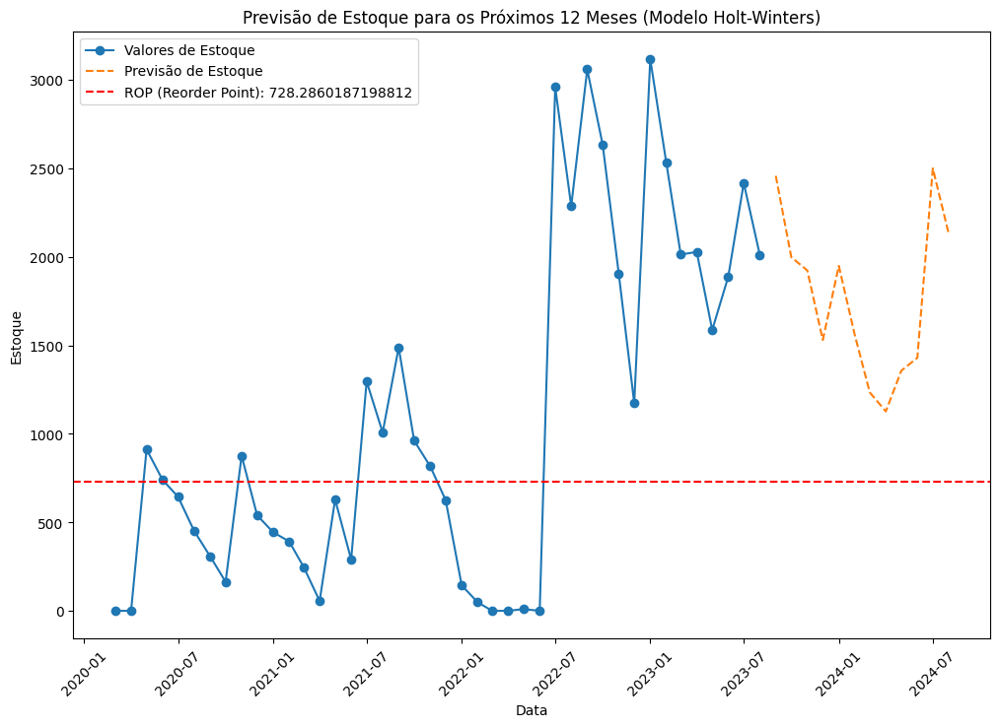

metodo escolhido:  HoltWinters
Previsão:
         Date     Forecast
42 2023-09-01  2457.691313
43 2023-10-01  1998.635417
44 2023-11-01  1923.220231
45 2023-12-01  1530.356507
46 2024-01-01  1949.345067
47 2024-02-01  1557.606718
48 2024-03-01  1234.147769
49 2024-04-01  1126.691096
50 2024-05-01  1356.814525
51 2024-06-01  1429.693822
52 2024-07-01  2500.122132
53 2024-08-01  2127.617615
A previsão não atinge o ROP (728.2860187198812)
compras a serem realizadas com base na previsão:
Data: 2024-01-01 00:00:00, quantidade: 418.99
Data: 2024-05-01 00:00:00, quantidade: 230.12
Data: 2024-06-01 00:00:00, quantidade: 72.88
Data: 2024-07-01 00:00:00, quantidade: 1070.43


In [ ]:
material_df = df[df['Material'] == material]
meses = 12
DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']  # Use o valor correto do DataFrame
rop = material_df.iloc[0]['ROP']
reducao_mensal = DMD_Reducao_Estoque * 30  # Suponha 30 dias por mês

print(material_df)

# Calcula os erros para cada método
erros = {
    'RegressaoLinear': regressao_linear(),
    'Sarima': sarima(),
    'HoltWinters': holt_winters()
}

# Encontra o método com o menor erro
melhor_metodo = min(erros, key=erros.get)

# Imprime os erros
for metodo, erro in erros.items():
    print(f'{metodo}: {erro/100}')
if melhor_metodo == 'RegressaoLinear':
    previsao = previsao_regressao_linear(meses)
    metodo = 'RegressaoLinear'
    previsao_data = [entry[0] for entry in previsao]
    previsao_values = [entry[1] for entry in previsao]
    previsao = pd.DataFrame({
        'Date': previsao_data,
        'Forecast': previsao_values
    })
elif melhor_metodo == 'Sarima':
    previsao = previsao_sarima(meses)
    metodo = 'Sarima'
    previsao = pd.DataFrame({
    'Date': previsao.index,
    'Forecast': previsao.values
    })
elif melhor_metodo == 'HoltWinters':
    previsao = previsao_holt_winters(meses)
    metodo = 'HoltWinters'

# Imprima a previsão
print('metodo escolhido: ',metodo)
print('Previsão:')
print(previsao)
detectar_atingimento_rop(previsao, rop, reducao_mensal)
identificar_aumento_previsao(previsao)

Dropdown(description='Material:', options=('EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14.  PVC SILICONIZADO.', '…

   Grupo Material  Código Almoxarifado          Almoxarifado  Código Material  \
4              36                    1  ALMOXARIFADO CENTRAL               51   

                                            Material Unidade Custo Médio Est  \
4  EBS00257 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 04. PV...      PC        0,53   S   

   01/03/2020  01/04/2020  ...  01/02/2023  01/03/2023  01/04/2023  \
4         470         470  ...         207         207         207   

   01/05/2023  01/06/2023  01/07/2023  01/08/2023  DMD_Reducao_Estoque  \
4         201         181         181         181             1.796667   

   Desvio_Padrao         ROP  
4      88.414127  227.191689  

[1 rows x 53 columns]
Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.85 sec
 ARIMA(0,0,1)(0,1,1)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
RegressaoLinear: 0.4173106216508241
Sarima: 0.7991033777221124
HoltWinters: 0.2909736438266778


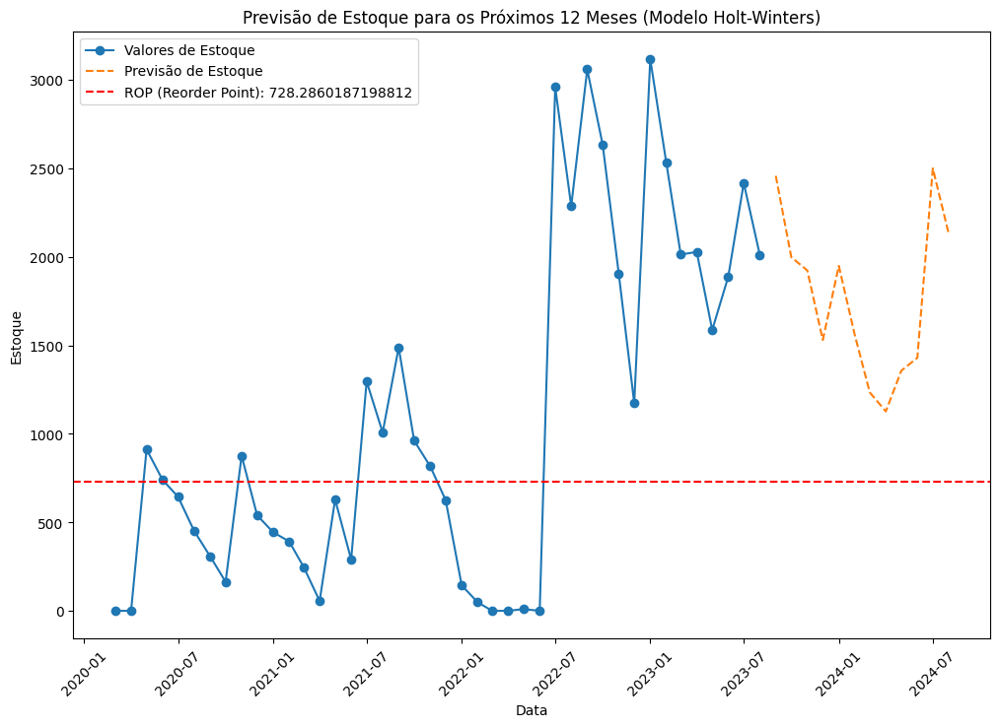

metodo escolhido:  HoltWinters
Previsão:
         Date     Forecast
42 2023-09-01  2457.691313
43 2023-10-01  1998.635417
44 2023-11-01  1923.220231
45 2023-12-01  1530.356507
46 2024-01-01  1949.345067
47 2024-02-01  1557.606718
48 2024-03-01  1234.147769
49 2024-04-01  1126.691096
50 2024-05-01  1356.814525
51 2024-06-01  1429.693822
52 2024-07-01  2500.122132
53 2024-08-01  2127.617615
A previsão não atinge o ROP (227.19168889858022)
compras a serem realizadas com base na previsão:
Data: 2024-01-01 00:00:00, quantidade: 418.99
Data: 2024-05-01 00:00:00, quantidade: 230.12
Data: 2024-06-01 00:00:00, quantidade: 72.88
Data: 2024-07-01 00:00:00, quantidade: 1070.43
    Grupo Material  Código Almoxarifado          Almoxarifado  \
50              36                    1  ALMOXARIFADO CENTRAL   

    Código Material                                           Material  \
50              914  EBS00273 - SONDA URETRAL Nº 14, TIPO NELATON, ...   

   Unidade Custo Médio Est  01/03/2020  01/04/

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


RegressaoLinear: 0.4173106216508241
Sarima: 0.7991033777221124
HoltWinters: 0.2909736438266778


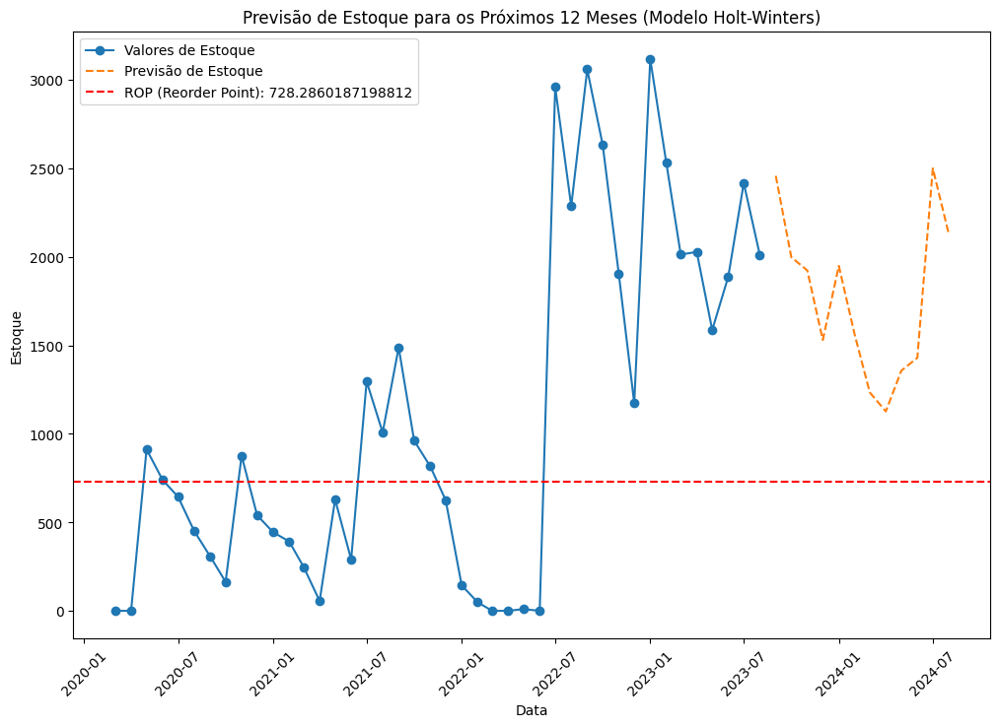

metodo escolhido:  HoltWinters
Previsão:
         Date     Forecast
42 2023-09-01  2457.691313
43 2023-10-01  1998.635417
44 2023-11-01  1923.220231
45 2023-12-01  1530.356507
46 2024-01-01  1949.345067
47 2024-02-01  1557.606718
48 2024-03-01  1234.147769
49 2024-04-01  1126.691096
50 2024-05-01  1356.814525
51 2024-06-01  1429.693822
52 2024-07-01  2500.122132
53 2024-08-01  2127.617615
A previsão não atinge o ROP (106.0328736333183)
compras a serem realizadas com base na previsão:
Data: 2024-01-01 00:00:00, quantidade: 418.99
Data: 2024-05-01 00:00:00, quantidade: 230.12
Data: 2024-06-01 00:00:00, quantidade: 72.88
Data: 2024-07-01 00:00:00, quantidade: 1070.43
     Grupo Material  Código Almoxarifado          Almoxarifado  \
113              36                    1  ALMOXARIFADO CENTRAL   

     Código Material                                           Material  \
113             2160  EBS00076 - SERINGA DESCARTÁVEL 05 ML, COM BICO...   

    Unidade Custo Médio Est  01/03/2020  01

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
RegressaoLinear: 0.4173106216508241
Sarima: 0.7991033777221124
HoltWinters: 0.2909736438266778


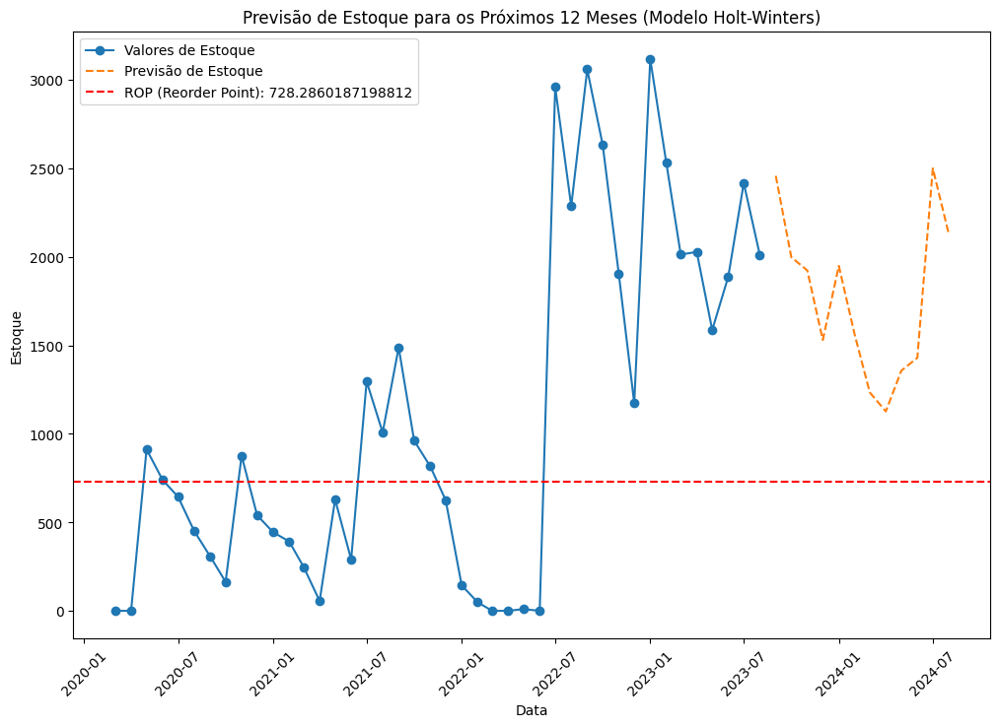

metodo escolhido:  HoltWinters
Previsão:
         Date     Forecast
42 2023-09-01  2457.691313
43 2023-10-01  1998.635417
44 2023-11-01  1923.220231
45 2023-12-01  1530.356507
46 2024-01-01  1949.345067
47 2024-02-01  1557.606718
48 2024-03-01  1234.147769
49 2024-04-01  1126.691096
50 2024-05-01  1356.814525
51 2024-06-01  1429.693822
52 2024-07-01  2500.122132
53 2024-08-01  2127.617615
A data em que a previsão atinge o ROP (25014.822763142103) é: 2023-09-01 00:00:00
Quantidade recomendada para compra na data do ROP: 63009.65 unidades
compras a serem realizadas com base na previsão:
Data: 2024-01-01 00:00:00, quantidade: 418.99
Data: 2024-05-01 00:00:00, quantidade: 230.12
Data: 2024-06-01 00:00:00, quantidade: 72.88
Data: 2024-07-01 00:00:00, quantidade: 1070.43


In [ ]:
import pandas as pd
import ipywidgets as widgets
from IPython.display import display

# Assume que você tem uma DataFrame 'df' com uma coluna 'Material'
materiais_disponiveis = df['Material'].unique()

# Cria uma caixa de seleção para escolher o material
dropdown_material = widgets.Dropdown(
    options=materiais_disponiveis,
    value=materiais_disponiveis[0],
    description='Material:'
)

# Função para atualizar a previsão com base no material selecionado
def atualizar_previsao(change):
    material_selecionado = change.new
    material_df = df[df['Material'] == material_selecionado]
    meses = 12
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']  # Use o valor correto do DataFrame
    rop = material_df.iloc[0]['ROP']
    reducao_mensal = DMD_Reducao_Estoque * 30  # Suponha 30 dias por mês

    print(material_df)

    # Calcula os erros para cada método
    erros = {
        'RegressaoLinear': regressao_linear(),
        'Sarima': sarima(),
        'HoltWinters': holt_winters()
    }

    # Encontra o método com o menor erro
    melhor_metodo = min(erros, key=erros.get)

    # Imprime os erros
    for metodo, erro in erros.items():
        print(f'{metodo}: {erro/100}')
    if melhor_metodo == 'RegressaoLinear':
        previsao = previsao_regressao_linear(meses)
        metodo = 'RegressaoLinear'
        previsao_data = [entry[0] for entry in previsao]
        previsao_values = [entry[1] for entry in previsao]
        previsao = pd.DataFrame({
            'Date': previsao_data,
            'Forecast': previsao_values
        })
    elif melhor_metodo == 'Sarima':
        previsao = previsao_sarima(meses)
        metodo = 'Sarima'
        previsao = pd.DataFrame({
        'Date': previsao.index,
        'Forecast': previsao.values
        })
    elif melhor_metodo == 'HoltWinters':
        previsao = previsao_holt_winters(meses)
        metodo = 'HoltWinters'

    # Imprima a previsão
    print('metodo escolhido: ',metodo)
    print('Previsão:')
    print(previsao)
    detectar_atingimento_rop(previsao, rop, reducao_mensal)
    identificar_aumento_previsao(previsao)

# Conecta a função de atualização à mudança na caixa de seleção
dropdown_material.observe(atualizar_previsao, names='value')

# Exibe a caixa de seleção
display(dropdown_material)


In [ ]:
porcentagens_escolha = []

# Criar listas para armazenar os MAPEs de cada método
mapes_regressao_linear = []
mapes_sarima = []
mapes_holt_winters = []
mapes_3_iguais = []

# Iterar sobre os materiais
for material in df['Material'].unique():
    material_df = df[df['Material'] == material]
    meses = 12
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']
    rop = material_df.iloc[0]['ROP']
    reducao_mensal = DMD_Reducao_Estoque * 30

    # Calcula os erros para cada método
    erros = {
        'RegressaoLinear': None,
        'Sarima': None,
        'HoltWinters': None
    }

    # Tente calcular os erros para cada método
    for metodo in erros:
        try:
            if metodo == 'RegressaoLinear':
                erros[metodo] = regressao_linear()
            elif metodo == 'Sarima':
                erros[metodo] = sarima()
            elif metodo == 'HoltWinters':
                erros[metodo] = holt_winters()
        except Exception as e:
            print(f"Erro ao calcular o método {metodo} para o material {material}: {e}")

    # Remova métodos com valor None
    erros = {k: v for k, v in erros.items() if v is not None}

    # Verifique se existem métodos disponíveis
    if not erros:
        print(f"Nenhum método disponível para o material {material}")
        continue

    # Encontra o método com o menor erro
    try:
        melhor_metodo = min(erros, key=erros.get)
    except ValueError as e:
        print(f"Erro ao encontrar o melhor método para o material {material}: {e}")
        continue  # Pula para o próximo material em caso de erro

    # Armazena o método escolhido na lista
    porcentagens_escolha.append(melhor_metodo)

    # Armazena o MAPE do método escolhido na lista correspondente
    if melhor_metodo == 'RegressaoLinear':
        if erros[melhor_metodo] is not None:
            mapes_regressao_linear.append(erros[melhor_metodo])
    elif melhor_metodo == 'Sarima':
        mapes_sarima.append(erros[melhor_metodo])
    elif melhor_metodo == 'HoltWinters':
        if erros[melhor_metodo] is not None:
            mapes_holt_winters.append(erros[melhor_metodo])

    # Verifica se os três métodos têm o mesmo MAPE
    if len(set(erros.values())) == 1:
        mapes_3_iguais.append(list(erros.values())[0])

# Imprime os valores individuais dos MAPEs
print(f"MAPEs para RegressaoLinear: {mapes_regressao_linear}")
print(f"MAPEs para Sarima: {mapes_sarima}")
print(f"MAPEs para HoltWinters: {mapes_holt_winters}")

# Calcula as porcentagens de escolha para cada método
porcentagem_regressao_linear = porcentagens_escolha.count('RegressaoLinear') / len(porcentagens_escolha) * 100
porcentagem_sarima = porcentagens_escolha.count('Sarima') / len(porcentagens_escolha) * 100
porcentagem_holt_winters = porcentagens_escolha.count('HoltWinters') / len(porcentagens_escolha) * 100

# Calcula as médias dos MAPEs para cada modelo
media_mape_regressao_linear = np.mean(mapes_regressao_linear) if mapes_regressao_linear else 0
media_mape_sarima = np.mean(mapes_sarima) if mapes_sarima else 0
media_mape_holt_winters = np.mean(mapes_holt_winters) if mapes_holt_winters else 0
media_mape_3_iguais = np.mean(mapes_3_iguais) if mapes_3_iguais else 0

# Imprime as porcentagens de escolha
print(f"Porcentagem de escolha para RegressaoLinear: {porcentagem_regressao_linear:.2f}%")
print(f"Porcentagem de escolha para Sarima: {porcentagem_sarima:.2f}%")
print(f"Porcentagem de escolha para HoltWinters: {porcentagem_holt_winters:.2f}%")
porcentagem_3_iguais = len(mapes_3_iguais) / len(df['Material'].unique()) * 100
print(f"Porcentagem para os três métodos iguais: {porcentagem_3_iguais:.2f}%")

# Imprime as médias dos MAPEs
print(f"Média do MAPE para RegressaoLinear: {media_mape_regressao_linear:.2f}")
print(f"Média do MAPE para Sarima: {media_mape_sarima:.2f}")
print(f"Média do MAPE para HoltWinters: {media_mape_holt_winters:.2f}")
print(f"Média do MAPE para os três métodos iguais: {media_mape_3_iguais:.2f}")


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=334.575, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=337.538, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=337.238, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=335.332, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=335.278, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=336.572, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=336.573, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=336.517, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.428 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 27.96%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=539.175, Time=1.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=564.398, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=533.733, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=545.719, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=615.998, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=531.781, Time=0.23 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=533.643, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=535.543, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.551, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=533.540, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=548.902, Time=0.53 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=534.920, Time=0.11 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.994 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 13.70%
Erro MAPE para o conjunto de teste: 2079.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=3.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.245, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.957, Time=0.24 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=248.957, Time=0.57 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=248.959, Time=0.45 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=250.957, Time=0.64 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=247.890, Time=0.29 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=24

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2107.40%
Erro MAPE para o conjunto de teste: 17.03%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=422.856, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=378.948, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.011, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.785, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=377.176, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.949, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=380.948, Time=0.62 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=379.001, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=379.014, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=396.902, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.575, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=377.937, Time=0.06 sec

Best model:  ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.976, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=209.810, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.936, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=211.809, Time=0.25 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=213.808, Time=0.42 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=207.816, Time=0.08 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=209.815, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=211.817, Time=0.33 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=209.802, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 19.09%
Erro MAPE para o conjunto de teste: 58.77%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=381.935, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.588, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=380.542, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=380.329, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=383.912, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=383.912, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.593, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=378.925, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=380.580, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=378.769, Time=0.10 sec
 ARIMA(1,1,1)(1,0,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.91%
Erro MAPE para o conjunto de teste: 139.24%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=183.070, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=161.145, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=186.347, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=164.191, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=179.164, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=160.623, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=163.796, Time=0.08 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 192.33%
Erro MAPE para o conjunto de teste: 138.30%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=490.209, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=494.095, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=494.097, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=488.519, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=492.109, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=492.105, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=494.106, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=492.219, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=492.203, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.658 seconds
Erro MAPE nos dados de teste: 77.65%
Erro MAPE para o conjunto de teste: 93.86%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.802, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=486.056, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=466.003, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=472.253, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=589.212, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=464.010, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.984, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.938, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=464.901, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.036, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=470.499, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=466.823, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=470.341, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.804 seconds
Erro MAPE nos dados de teste: 62.81%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=564.425, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=587.876, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.138, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=630.783, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=556.902, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=558.123, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=560.118, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=558.267, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=558.235, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=567.026, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.449, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.649 seconds
Erro MAPE nos dados de teste: 205.24%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.752, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.594, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=90.585, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=88.679, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=88.680, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.684, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=88.677, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.871 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=165.455, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.455, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.455, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.455, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.455, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.455, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.455, Time=0.03 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-pa


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.455, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.455, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.455, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=157.455, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.535 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 24.34%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.289, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=259.909, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=259.880, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.446, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=258.031, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=258.024, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=258.269, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=258.265, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.380 seconds
Erro MAPE nos dados de teste: 10.98%
Erro MAPE para o conjunto de teste: 7.20%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=109.511, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=112.407, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=112.407, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=110.408, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=110.408, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=112.408, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=111.499, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=111.499, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=113.431, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=110.030, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.954 seconds
Erro MAPE nos dados de teste: 9.23%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.813, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=154.689, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=153.953, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.794, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.162, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=152.843, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=154.690, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.309, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.118, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.399 seconds
Erro MAPE nos dados de teste: 56.89%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 182.21%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=386.514, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.440, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.943, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.750, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.896, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.029, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.957, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=382.977, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=379.653, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=379.885, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.856, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.227, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=382.891, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total f

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.334, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.689, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=367.712, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=463.087, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.893, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=356.692, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=358.694, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=356.605, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=356.661, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.697, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=354.237, Time=0.21 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=357.204, Time=0.56 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=357.778, Time=0.49 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=361.169, Time=0.56 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 1342.68%
Erro MAPE para o conjunto de teste: 29.11%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=381.443, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.630, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=368.534, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=498.709, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.555, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=362.504, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=364.542, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.484, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.489, Time=0.39 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=367.248, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=365.063, Time=0.05 sec

Best model:  ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=368.012, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=374.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.398, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=363.635, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=485.737, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.216, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.646, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=362.808, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=361.178, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=361.182, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.272, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=363.178, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.889, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.017 seconds
Erro MAPE nos dados de teste: 0.76%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 60.36%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.126, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=386.338, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=386.196, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=382.498, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=384.982, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=384.992, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=384.429, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=384.259, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=386.142, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.942 seconds
Erro MAPE nos dados de teste: 5.89%
Erro MAPE para o conjunto de teste: 124.39%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=541.203, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=479.576, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=582.934, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.802, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=478.382, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.001, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.444, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=480.634, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=476.719, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=478.717, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=478.694, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=130.637, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=120.706, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=124.534, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=124.533, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=121.323, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=122.553, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=122.555, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=122.689, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=122.687, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=124.669, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.689 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 94.77%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=137.414, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=141.338, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=141.335, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=139.342, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=139.342, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.342, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=139.408, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=139.406, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=141.283, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.318, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.052 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 96.8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=112.491, Time=0.38 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=100.595, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=104.491, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=104.491, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=102.491, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=102.491, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=104.491, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=102.595, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=102.595, Time=0.13 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=104.595, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=101.686, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.802 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 45.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=176.792, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.618, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.428, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=176.758, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=178.638, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=178.639, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.814, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.648, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=179.597, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.024 seconds
Erro MAPE nos dados de teste: 31.97%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 42.16%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.075, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=109.385, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=109.134, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.093, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=107.847, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=107.842, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=107.749, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.636, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.913 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 40.88%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.004, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.709, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=67.680, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.885, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.891, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.868, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=65.844, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.768 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing st

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=257.947, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=259.913, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=259.557, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=255.989, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=259.636, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=259.640, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=261.635, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=258.503, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=258.272, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.494 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=304.090, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=307.928, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=307.918, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=304.354, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=305.994, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=305.994, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=307.994, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=306.017, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=306.005, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.833 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 82.02%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.051 seconds
Erro MAPE nos dados de teste: 58.33%
Erro MAPE para o conjunto de teste: 41.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.387, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.105, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=314.742, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.274, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.288, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.104, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=305.103, Time=0.82 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=303.204, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=303.218, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=316.668, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=304.461, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=303.192, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.417 seconds
Erro MAPE nos dados de teste: 6.78%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 51.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=192.702, Time=0.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=181.516, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=185.448, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=185.411, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=183.512, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=183.512, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=185.512, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=183.454, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=183.417, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=185.095, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=182.265, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.681 seconds
Erro MAPE nos dados de teste: 345.83%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=530.674, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=518.200, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=522.215, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=522.202, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=517.016, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.200, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=520.200, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=522.200, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=520.199, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=520.201, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=522.036, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.546 seconds
Erro MAPE nos dados de teste: 10.69%
Erro MAPE para o conjunto de teste: 98.45%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=293.034, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=255.580, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=298.145, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=260.208, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=256.604, Time=0.71 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=284.997, Time=0.24 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=253.124, Time=0.43 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.805, Time=0.14 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 20.38%
Erro MAPE para o conjunto de teste: 29.08%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=187.866, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.406, Time=0.48 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=179.406, Time=0.70 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=181.405, Time=0.52 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=179.231, Time=0.28 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=179.277,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 11.41%
Erro MAPE para o conjunto de teste: 213.24%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.898, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.978, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.072, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.509, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.377, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=362.236, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.438, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.470, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.950 seconds
Erro MAPE nos dados de teste: 590.67%
Erro MAPE para o conjunto de teste: 34.35%
Per

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=313.774, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=294.648, Time=0.46 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=315.864, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=293.558, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=294.860, Time=0.20 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=295.305, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=295.306, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=301.817, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=292.237, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=293.461, Time=0.18 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=293.507, Time=0.35 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=353.271, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=313.531, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=402.942, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=312.249, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=313.510, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=315.510, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=314.121, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=314.141, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=328.945, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=314.720, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=313.914, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.895 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=239.573, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.712, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.695, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.410, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.748, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.736, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=241.550, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=241.549, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.858 seconds
Erro MAPE nos dados de teste: 21.34%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.307, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.294, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.294, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.339, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.295, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.295, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.307, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.306, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.863 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 20.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.108, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=183.799, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=183.688, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.969, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.099, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.099, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=187.099, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=181.800, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=183.799, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=185.799, Time=0.08 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=183.698, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=183.650, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=181.698, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=183.688, Time=0.08 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 20.91%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=265.490, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=269.419, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=269.421, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=265.558, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=267.433, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=267.434, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=267.479, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=267.480, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=269.479, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.729 seconds
Erro MAPE nos dados de teste: 104.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 19.38%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=265.067, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=280.857, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=257.702, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.770, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=326.922, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=255.901, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=257.647, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=257.635, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=257.700, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=265.284, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=258.618, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.527, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=268.483, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.469, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=263.119, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=266.523, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=266.523, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.487, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.472, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=268.233, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.501 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=271.588, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=275.546, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=275.536, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=270.604, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=273.575, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=273.576, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=273.560, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=273.550, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.073 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=252.944, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=256.795, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=250.945, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=254.840, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=254.896, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=254.896, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.866 seconds
Erro MAPE nos dados de teste: 18.43%
Erro MAPE para o conjunto de teste: 102.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.708, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.070, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=545.832, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=541.008, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=544.691, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=544.691, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=546.691, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.090, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=543.841, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.749 seconds
Erro MAPE nos dados de teste: 113.03%
Erro MAPE para o conjunto de teste: 54.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.322, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=396.245, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=396.241, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=391.253, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=394.316, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=394.316, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=396.316, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=394.255, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=394.251, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.688 seconds
Erro MAPE nos dados de teste: 1.62%
Erro MAPE para o conjunto de teste: 53.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=218.750, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=185.427, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=233.954, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=189.943, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=183.995, Time=0.35 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.97 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=185.590, Time=0.88 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=185.652, Time=0.89 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=192.778, Time=0.41 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=187.568, Time=0.81 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=187.602, Time=0.22 sec

Best model:  ARIMA(1,0,0)(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 24.75%
Erro MAPE para o conjunto de teste: 3.82%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.957 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 1.54%
Erro ao 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=29.955, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=18.730, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=23.181, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=33.377, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16.763, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=17.874, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=17.991, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=22.441, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=19.873, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=16.422, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=18.422, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=17.763, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=424.068, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=418.974, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=423.814, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=422.662, Time=0.05 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=420.974, Time=0.20 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=414.320, Time=0.90 sec
 ARIMA(0,0,1)(1,1,2)[12] intercept   : AIC=inf, Time=2.26 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=415.839, Time=1.68 sec
 ARIMA(1,0,1)(0,1,2)[12] intercept   : AIC=412.927, Time=1.87 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=412.114, Time=0.49 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=416.861, Time=0.07 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=416.402, Time=0.28 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=409.578, Time=0.56 sec
 ARIMA(1,0,1)(2,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=387.885, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.209, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=436.873, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.830, Time=0.05 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=387.892, Time=1.45 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=383.611, Time=0.30 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=377.545, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=379.490, Time=0.40 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,0,1)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Erro MAPE para o conjunto de teste: 1340.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=599.528, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=560.068, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=579.734, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.723, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=558.171, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=560.048, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=562.037, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=560.169, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.147, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=580.675, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=561.620, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.769, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.773 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 418.33%
Erro MAPE para o conjunto de teste: 66.45%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=273.655, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=277.643, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=277.638, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=275.655, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=275.655, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=277.655, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=275.646, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=275.638, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=277.399, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=274.508, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.971 seconds
Erro MAPE nos dados de teste: 144.71%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 48.59%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=789.434, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=789.847, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=781.691, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=784.566, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=820.605, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=779.725, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=781.639, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=783.580, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=781.212, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=781.539, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=782.702, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=783.314, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=784.612, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 22.28%
Erro ao calcular o método Sarima para o material EBS02107 - SERINGA DE VIDRO 20 ML, COM BICO EM METAL LUER CENTRAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 256.25%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=730.828, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=713.049, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=717.502, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=784.853, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=711.138, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=712.406, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=714.075, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=712.341, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 70.29%
Erro MAPE para o conjunto de teste: 1253.57%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=809.388, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=784.927, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=790.513, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=852.882, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=783.794, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=784.851, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=786.840, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=779.185, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=780.264, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=780.264, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=782.210, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=781.023, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=471.577, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=474.220, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=469.808, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=473.577, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=473.576, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=472.221, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.316 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 59.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.248, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=189.207, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=189.209, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.248, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.248, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.248, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=187.207, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=187.209, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=184.681, Time=0.05 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=186.466, Time=0.29 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=186.466, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=188.466, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=186.567, Time=0.11 sec
 ARIMA(0,1,1)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=446.427, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.467, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.537, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=445.226, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=434.798, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=436.642, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.497, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=433.201, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=434.970, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 61.31%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=377.633, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=381.338, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=381.201, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=376.519, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=379.628, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=379.627, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=381.627, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=379.345, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=379.214, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.632 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 308.24

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=307.501, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=310.063, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=309.493, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=315.346, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=309.495, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=309.478, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=308.090, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=307.575, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.738 seconds
Erro MAPE nos dados de teste: 1409.28%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=401.223, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=398.857, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=406.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=397.597, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=398.807, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=396.888, Time=0.14 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=398.380, Time=1.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=393.910, Time=0.37 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=395.894, Time=1.23 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AIC=396.534, Time=1.26 sec
 ARIMA(3,1,0)(1,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(4,1,0)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(4,1,0)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(3,1,1)(0,0,0)[12] intercept   : AIC=396.058, Time=0.39 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=420.374, Time=0.39 sec
 ARIMA(4,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(3,1,0)(0,0,0)[12]             : AIC=393.320, Time=0.16 sec
 ARIMA(3,1,0)(1,0,0)[12]             : AIC=395.189, Time=0.35 sec
 ARIMA(3,1,0)(0,0,1)[12]             : AIC=inf, Time=0.53 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,1,0)(1,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,1,0)(1,0,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=400.504, Time=0.07 sec
 ARIMA(4,1,0)(0,0,0)[12]             : AIC=395.248, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[12]             : AIC=395.281, Time=0.27 sec
 ARIMA(2,1,1)(0,0,0)[12]             : AIC=396.297, Time=0.29 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(4,1,1)(0,0,0)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(4,1,1)(0,0,0)[12]             : AIC=inf, Time=nan sec

Best model:  ARIMA(3,1,0)(0,0,0)[12]          
Total fit time: 13.100 seconds
Erro MAPE nos dados de teste: 79.85%
Erro MAPE para o conjunto de teste: 6.86%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=240.795, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=233.344, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=239.280, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=231.345, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=233.344, Time=0.24 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=232.229, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


Erro MAPE nos dados de teste: 36.81%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=208.913, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=196.913, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=200.913, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=200.913, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=14677620.072, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=198.913, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=200.913, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=198.913, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=198.913, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=200.913, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=196.805, Time=0.05 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=198.784, Time=0.29 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=198.784, Time=0.26 sec
 ARIMA(0,1,0)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=559.499, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=595.706, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.680, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=568.980, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.089, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=558.580, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=558.997, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=558.552, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=598.464, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=560.242, Time=0.29 sec
 ARIMA(1,0,1)(1,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=192.323, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=213.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=185.333, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=199.638, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=214.238, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=183.353, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=185.331, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=185.087, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=185.150, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=197.748, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=186.575, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=182.272, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=184.263, Time=0.06 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 108.87%
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=1.53 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=432.658, Time=0.05 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=432.945, Time=0.27 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=428.617, Time=0.25 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=426.621, Time=0.10 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=428.615, Time=0.27 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=427.762, Time=0.18 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=427.664, Time=0.18 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=431.245, Time=0.07 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 4.190 seconds
Erro MAPE nos dados de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.801, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=458.680, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=556.538, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=456.723, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=458.677, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=458.388, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=458.524, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.383, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.403, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.200 seconds
Erro MAPE nos dados de teste: 5.58%
Erro MAPE para o conjunto de teste: 37.36%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=76.679, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=80.634, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=80.614, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=78.663, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=78.663, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=80.663, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=78.647, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=78.625, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=80.361, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=77.653, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.804 seconds
Erro MAPE nos dados de teste: 3.33%
Erro MAPE para o conjunto de teste: 34.54%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=222.937, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=226.914, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=226.913, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.516, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=224.928, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=224.926, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=224.918, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=224.917, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=225.506, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.577 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 73.04%
Erro MAPE para o conjunto de teste: 272.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=249.671, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.135, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.999, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.990, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.346, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.120, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.120, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=242.120, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.030, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.023, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.955, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.396 seconds
Erro MAPE nos dados de teste: 145.38%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 38.63%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=98.515, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=100.300, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=100.799, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=100.199, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=100.199, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=102.199, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=98.610, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=99.164, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=99.421, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=99.504, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.515 seconds
Erro MAPE nos dados de teste: 14.37%
Erro MAPE para o conjunto de teste: 364.08%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=140.544, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=142.866, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.828, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=141.104, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=141.104, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=143.104, Time=0.23 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=142.125, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=141.775, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=142.764, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=136.305, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=137.951, Time=0.26 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=137.951, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=139.951, Time=0.26 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=332.600, Time=0.04 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=328.213, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=330.145, Time=0.19 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=326.288, Time=0.05 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=328.213, Time=0.20 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=330.213, Time=0.26 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=328.155, Time=0.11 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=328.141, Time=0.17 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=328.221, Time=0.09 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=329.763, Time=0.21 sec
 ARIMA(1,2,0)(0,0,0)[12] intercept   : AIC=328.192, Time=0.07 sec

Best model:  ARIMA(1,2,0)(0,0,0)[12]          
Total fit time: 2.591 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.852, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.983, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=530.129, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.567, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.985, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.417, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.438, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.147, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.450, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.812, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.561 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 134.43%
Erro MAPE para o conjunto de teste: 92.03%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=422.344, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.877, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.975, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=529.776, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.558, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.977, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.408, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.429, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.161, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.441, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.800, Time=0.03 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=184.466, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=188.374, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=188.381, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=186.466, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=186.466, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=188.466, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=186.380, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=186.385, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=188.229, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=185.765, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.627 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 92.60%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=625.709, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=574.058, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=649.776, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=572.883, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=573.970, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=575.917, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=574.906, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=574.800, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=599.569, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=576.575, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=571.609, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=502.058, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=455.936, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=580.150, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=454.049, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=455.884, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=457.775, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=455.821, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=455.830, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=477.789, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=457.913, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=455.025, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.339 seconds
Erro MAPE nos dados de teste: 309.58%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=309.260, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=359.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=307.521, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=405.693, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=305.950, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=307.396, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=308.901, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=307.930, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=307.940, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=338.972, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=308.160, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=305.584, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=307.550, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=307.547, Time=0.09 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=473.778, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=478.416, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=467.460, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=474.364, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=500.820, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=468.066, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=467.688, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=468.362, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=467.465, Time=0.13 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=469.668, Time=0.43 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=479.021, Time=0.06 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=469.535, Time=0.18 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=469.402, Time=0.15 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=473.556, Time=0.10 sec
 ARIMA(2,0,1)(1,1,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=193.497, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=195.999, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=194.006, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=195.482, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=195.482, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.482, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=194.101, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=192.114, Time=0.05 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=194.006, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 52.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=237.811, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.707, Time=0.56 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=205.657, Time=1.03 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.34 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,0)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=205.243, Time=0.54 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=205.812, Time=1.00 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=204.875, Time=0.47 sec

Best model:  ARIMA(0,1,0)(1,1,1)[12]          
Total fit time: 10.512 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 6.08%
Erro MAPE para o conjunto de teste: 152.17%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=629.980, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=651.234, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=622.501, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=631.694, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=670.417, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=620.787, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=622.456, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=624.440, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=622.478, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=622.695, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=632.909, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=624.664, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=621.456, Time=0.02 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=729.243, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=693.488, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=715.559, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=766.159, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=691.554, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=693.439, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=695.303, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=693.200, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=693.480, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=714.591, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=694.893, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=693.068, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.401 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 23.88%
Erro MAPE para o conjunto de teste: 303.10%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=706.550, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=694.120, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=698.028, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=698.282, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=692.239, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=696.066, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=696.066, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=698.066, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=696.100, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=696.350, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.366 seconds
Erro MAPE nos dados de teste: 80.15%
Erro MAPE para o conjunto de teste: 88.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=660.792, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=650.334, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=654.286, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=654.291, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=648.456, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=652.291, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=652.291, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=654.290, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=652.319, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.322, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=654.092, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.983 seconds
Erro MAPE nos dados de teste: 15.00%
Erro MAPE para o conjunto de teste: 72.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=559.653, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=548.222, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.012, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.171, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=546.257, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=550.026, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=550.019, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=550.187, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=550.186, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=552.351, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.398 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 28.74%
Erro MAPE para o conjunto de teste: 10.35%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=313.889, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=313.076, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=312.223, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=323.291, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=310.250, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=312.235, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=312.042, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=310.761, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=311.078, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=311.222, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=315.394, Time=0.04 sec

Best model:  ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 11.06%
Erro MAPE para o conjunto de teste: 5.20%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=315.693, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=310.800, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=309.123, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=310.443, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.011, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=307.725, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=309.104, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=311.104, Time=0.17 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=309.447, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=309.560, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=309.022, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=311.324, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=309.270, Time=0.03 sec

Best model:  ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=514.761, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.999, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.752, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=532.040, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=487.118, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=489.028, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=490.833, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=488.785, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=488.850, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=497.340, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=486.828, Time=0.20 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=488.668, Time=0.43 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 19.01%
Erro MAPE para o conjunto de teste: 152.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.17 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=601.606, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=575.238, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=585.778, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=624.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=573.143, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=575.194, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.019, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=575.246, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=575.302, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=583.832, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=576.308, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=573.334, Time=0.03 sec

Best model:  ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=437.040, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.012, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=441.014, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=435.814, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=439.033, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=439.033, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=441.033, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.020, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=439.018, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=439.996, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.600 seconds
Erro MAPE nos dados de teste: 1.15%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=139.833, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=165.193, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=133.623, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=149.317, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=166.331, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=131.648, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=133.620, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=132.449, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=132.718, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=147.432, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=133.974, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=130.527, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=132.509, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=132.508, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 212.02%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.223, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=294.701, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.407, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.254, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=292.701, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=294.701, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=294.406, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=294.453, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=312.000, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=292.894, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=322.154, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=279.582, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=367.834, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=278.014, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=279.572, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=279.511, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=279.605, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=299.069, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=278.823, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.909 seconds
Erro MAPE nos dados de teste: 16.54%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.890, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=265.678, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=265.611, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.229, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=263.868, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=263.869, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=263.695, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=263.626, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=265.358, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.811 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=260.673, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=264.616, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=264.615, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=259.428, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=262.641, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=262.642, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=262.645, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=262.643, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.067 seconds
Erro MAPE nos dados de teste: 29.66%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=281.648, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.628, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.623, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.183, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=283.644, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=283.645, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.632, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=283.626, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.759 seconds
Erro MAPE nos dados de teste: 78.62%
Erro MAPE para o conjunto de teste: 195.59%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=167.728, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.728, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.728, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.728, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.728, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.728, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.058, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.307 seconds
Erro MAPE nos dados de teste: 335.58%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=193.367, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.856, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.503, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.517, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.556, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.522, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.529, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.856, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.856, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=190.388, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.633 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=67.551, Time=1.11 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=61.553, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=64.966, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=64.966, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=62.966, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=62.966, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=64.966, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=63.553, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=63.553, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=65.553, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=63.158, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.653 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 63.04%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.007, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=245.322, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=245.273, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=243.976, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=243.976, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=243.388, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=243.338, Time=0.16 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=245.334, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=244.007, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.715 seconds
Erro MAPE nos dados de teste: 173.74%
Erro MAPE para o conjunto de teste: 227.06%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=349.740, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=353.672, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=353.701, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=347.876, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=351.676, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=351.702, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=351.738, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.738, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=353.738, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.105 seconds
Erro MAPE nos dados de teste: 562.61%
Erro MAPE para o conjunto de teste: 136.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=449.503, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.038, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=491.259, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.507, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.439, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.446, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=427.893, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=410.499, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=407.238, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.458 seconds
Erro MAPE nos dados de teste: 8.69%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 510.51%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.787, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=479.690, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.408, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=503.357, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.956, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=444.474, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=445.873, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.705, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.709, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.785, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=446.705, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.433, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.433, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=760.956, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=763.175, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=762.800, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=758.983, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=761.085, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=760.288, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=762.277, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=762.971, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=763.067, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=763.466, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.429 seconds
Erro MAPE nos dados de teste: 356.40%
Erro MAPE para o conjunto de teste: 54.34%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=474.705, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=468.102, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=468.057, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=538.267, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=466.069, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=468.200, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=470.054, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=466.692, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=466.228, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=466.102, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=468.179, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=509.887, Time=0.13 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.211 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 97.71%
Erro MAPE para o conjunto de teste: 75.68%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=341.059, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=342.096, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=341.824, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=339.161, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=342.977, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=342.982, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=344.961, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=340.119, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=339.878, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=341.875, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.068 seconds
Erro MAPE nos dados de teste: 70.69%
Erro MAPE para o conjunto de teste: 629.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=560.604, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.173, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.313, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.281, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=562.263, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=562.215, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.573, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.541, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=564.661, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.964 seconds
Erro MAPE nos dados de teste: 296.39%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 78.61%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=216.195, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=213.131, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=218.113, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=215.130, Time=0.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=217.129, Time=1.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=211.132, Time=0.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.131, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=215.133, Time=0.34 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 42.58%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.007, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.792, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=234.774, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=239.280, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=234.755, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=235.050, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=235.893, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=235.856, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=234.130, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=234.596, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(2,0,0)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=302.721, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=290.834, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=293.008, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.997, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=288.846, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=290.703, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=288.712, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=290.658, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=290.442, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=287.223, Time=0.12 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=289.127, Time=0.37 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=28

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.534, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=494.066, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=445.894, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=513.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.951, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.892, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=447.879, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.163, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.476, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=446.087, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=443.054, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=445.052, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=312.904, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=303.074, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=306.230, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=318.214, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=302.960, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=304.258, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=304.322, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=305.060, Time=0.15 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=301.683, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=302.032, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=301.910, Time=0.24 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.43 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=274.446, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=258.754, Time=0.67 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.175, Time=0.65 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=278.378, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=257.094, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=258.750, Time=0.24 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=260.747, Time=0.31 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.321, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=258.575, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=263.613, Time=0.15 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=256.372, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=258.211, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 83.86%
Erro MAPE para o conjunto de teste: 102.54%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.561, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.872, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=405.620, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.634, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=403.921, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=405.683, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=405.775, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=405.085, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.510, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=406.562, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=430.641, Time=0.04 sec

Best model:  ARIMA(0,0,1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=282.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=285.743, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=283.991, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=283.888, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=283.875, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=286.123, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=282.012, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=283.814, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=283.814, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=285.815, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=284.01

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 90.85%
Erro MAPE para o conjunto de teste: 278.92%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=535.505, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=530.751, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=530.275, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=529.650, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=569.135, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=527.728, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=529.728, Time=0.36 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=531.641, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=530.221, Time=0.16 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=528.925, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=528.313, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=531.371, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=547.208, Time=0.15 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 95.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=524.353, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=511.993, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=515.775, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=539.643, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=510.070, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=511.789, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=513.663, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=512.051, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=512.092, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.815, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=513.733, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=510.788, Time=0.05 sec

Best model:  ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.887, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=382.807, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=382.780, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.182, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=380.879, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=380.879, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=382.879, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=380.814, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=380.787, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.644 seconds
Erro MAPE nos dados de teste: 1.85%
Erro MAPE para o conjunto de teste: 32.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=256.251, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=247.881, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=248.353, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=249.303, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=272.953, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=249.789, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=249.789, Time=0.19 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=251.789, Time=0.16 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=247.887, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=248.184, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=249.884, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 2.733 seconds
Erro MAPE nos dados de teste: 57.68%
Erro MAPE para o conjunto de teste: 1757.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.156, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=453.028, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=457.763, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=534.216, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=451.259, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=452.989, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=454.275, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=452.506, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=452.629, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=456.575, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=454.683, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=455.670, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.021 seconds
Erro MAPE nos dados de teste: 984.46%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 314.15%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=394.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=377.651, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=378.391, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=414.926, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=376.883, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=377.574, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=378.380, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=377.891, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=378.458, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.034, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.179, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.52%
Erro MAPE para o conjunto de teste: 9905.87%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=559.944, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=570.656, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=552.612, Time=0.68 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=559.019, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.451, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=553.677, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=554.429, Time=1.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=552.423, Time=0.54 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=572.646, Time=0.04 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=554.073, Time=0.28 sec
 ARIMA(1,0,1)(0,0,1)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2438.22%
Erro MAPE para o conjunto de teste: 2824.13%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.395, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.813, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=521.504, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.369, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.449, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.063, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.023, Time=0.33 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=418.985, Time=0.86 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 12555.72%
Erro MAPE para o conjunto de teste: 62.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=323.556, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=297.471, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=333.031, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=302.958, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=301.653, Time=1.22 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=299.405, Time=0.46 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=299.461, Time=0.28 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 41.51%
Erro MAPE para o conjunto de teste: 192.24%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=462.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=446.716, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=451.626, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=521.067, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=448.759, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=447.427, Time=0.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.595, Time=0.53 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=460.140, Time=0.35 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 72.68%
Erro MAPE para o conjunto de teste: 396.76%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=456.256, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=460.095, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.807, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.040, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=458.234, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=458.229, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=460.228, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=458.109, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=457.808, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=459.876, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.744 seconds
Erro MAPE nos dados de teste: 6748.40%
Erro MAPE para o conjunto de teste: 2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=537.200, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=531.891, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.490, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=535.588, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=530.249, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=533.433, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=533.566, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=533.861, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=533.921, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.723 seconds
Erro MAPE nos dados de teste: 89.47%
Erro MAPE para o conjunto de teste: 36.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.882, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=449.430, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=455.632, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=507.795, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=447.789, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=449.442, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=451.452, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=449.765, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=449.747, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=455.180, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=451.747, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=451.886, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.099 seconds
Erro MAPE nos dados de teste: 11.11%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 61.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.756, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.126, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=545.960, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=540.961, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=544.629, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=544.678, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.128, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=543.868, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.759 seconds
Erro MAPE nos dados de teste: 58.76%
Erro MAPE para o conjunto de teste: 1090.42%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=397.914, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=397.921, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=387.532, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=404.214, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=390.552, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=388.236, Time=1.40 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=390.091, Time=0.32 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=389.531, Time=0.39 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=389.428, Time=0.34 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=388.253, Time=0.43 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=391.273, Time=0.71 sec
 ARIMA(1,0,0)(1,1,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 544.53%
Erro MAPE para o conjunto de teste: 269.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=586.554, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=606.655, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=581.972, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=590.251, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=649.982, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.596, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=581.360, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=583.140, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=582.469, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=582.594, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.197, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=584.363, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=583.286, Time=0.02 sec

Best model:  ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=180.583, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=173.141, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=177.033, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=176.888, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=175.141, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=175.141, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.141, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=175.033, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=174.888, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=176.610, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=174.247, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.497 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 156.89%
Erro MAPE para o conjunto de teste: 47.67%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.672, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=118.672, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.672, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.672, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=120.672, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=120.672, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=122.672, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.672, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.672, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.672, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=119.646, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.761 seconds
Erro MAPE nos dados de teste: 11.11%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=567.280, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=584.006, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=563.224, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=566.421, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=632.293, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=561.745, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=563.218, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=565.183, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=559.474, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=561.455, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=561.446, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=563.446, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=561.498, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=561.565, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.398, Time=0.04 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=330.747, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=320.995, Time=0.82 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=320.116, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=345.965, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=321.756, Time=0.33 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=321.734, Time=0.73 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=321.338, Time=1.46 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=319.595, Time=0.48 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=321.312, Time=0.56 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=323.270, Time=0.69 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=325.544, Time=0.23 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=321.862, Time=0.54 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=321.381, Time=0.54 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=323.584, Time=0.42 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 1211.31%
Erro MAPE para o conjunto de teste: 880.77%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.756, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.457, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=466.848, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.347, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.302, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.646, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.043 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=379.245, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=399.418, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=372.760, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=382.460, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=429.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=371.058, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=372.708, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=374.615, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=372.727, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=372.750, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=381.810, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=374.726, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=371.901, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.099 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.04%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=435.795, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=439.484, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=439.407, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=433.925, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=437.743, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=437.745, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=437.540, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=437.462, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.286 seconds
Erro MAPE nos dados de teste: 23.83%
Erro MAPE para o conjunto de teste: nan%
Performin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=189.317, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=177.742, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=181.693, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=181.688, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=176.758, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=179.730, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=179.728, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=179.708, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=179.705, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.114 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.71%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=428.158, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.980, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=419.255, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=472.704, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.679, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.328, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.334, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.441, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=418.021, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.546, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=419.174, Time=0.04 sec

Best model:  ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 88.12%
Erro MAPE para o conjunto de teste: 97.65%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=431.223, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=403.724, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=414.700, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.033, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=402.522, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=403.714, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=403.329, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.795, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=414.111, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=402.532, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=310.288, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=301.482, Time=0.33 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=313.752, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=300.585, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=301.452, Time=0.37 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=303.563, Time=0.48 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=302.563, Time=0.21 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=302.561, Time=0.24 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=301.739, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=299.249, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=300.276, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=300.143, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=635.798, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=638.852, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=639.061, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=634.511, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=636.965, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=636.945, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=638.945, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=637.529, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=637.402, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=639.300, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.482 seconds
Erro MAPE nos dados de teste: 88.74%
Erro MAPE para o conjunto de teste: 38.86%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=388.091, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.815, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.297, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=419.179, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.273, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.848, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=349.273, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.273, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=367.640, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=351.125, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=347.322, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.077 seconds
Erro MAPE nos dados de teste: 38.15%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=537.037, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=495.301, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=510.180, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.061, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=493.480, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=495.267, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=497.276, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=495.138, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=495.079, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=512.980, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=496.927, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=492.977, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=494.961, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=616.757, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=620.306, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=620.493, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=615.046, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=618.623, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=618.599, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=620.546, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=618.457, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=618.610, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=620.538, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.519 seconds
Erro MAPE nos dados de teste: 47.50%
Erro MAPE para o conjunto de teste: 112.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=372.301, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=395.771, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=365.225, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=376.716, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=410.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.687, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=365.134, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=367.103, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.582, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.599, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=377.112, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=367.635, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=363.771, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.032 seconds
Erro MAPE nos dados de teste: 10.24%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 29.33%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=499.121, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=471.836, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=481.486, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=549.454, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.931, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.813, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=473.816, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.911, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=471.949, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=483.169, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.377, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=486.500, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=488.139, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=487.767, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=485.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=488.500, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=488.500, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=490.500, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=486.254, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=485.824, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=487.761, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=489.762, Time=0.67 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=487.588, Time=0.45 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=471.458, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=452.138, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=456.204, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.599, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=450.143, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=452.131, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=451.080, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=450.299, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=454.446, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=452.167, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=451.829, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.166, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=394.991, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=395.091, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.577, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.669, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.675, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=395.669, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=393.625, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=393.720, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=395.292, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.913 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 68.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=483.317, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=474.434, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=478.038, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=478.384, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=476.994, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=476.327, Time=0.06 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=476.362, Time=0.05 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=478.317, Time=0.12 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=476.338, Time=0.04 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=476.501, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=478.296, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 1.414 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 78.13%
Erro MAPE para o conjunto de teste: 59.12%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.470, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.297, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.076, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.527, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.467, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.467, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=362.467, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.318, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.083, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=360.837, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.699 seconds
Erro MAPE nos dados de teste: 95.24%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 930.28%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=477.533, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.940, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=457.626, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=525.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.574, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.833, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=443.748, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.213, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=442.271, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=457.208, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.374, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 339.15%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=640.587, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=606.241, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=620.849, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=689.523, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=604.273, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=606.184, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=608.093, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=606.156, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=606.130, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=621.517, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=608.337, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=605.303, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=566.288, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=578.006, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=560.665, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=565.593, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=614.361, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=559.595, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=560.579, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=562.573, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=560.391, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.194, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=563.614, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=562.180, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=562.139, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.270 seconds
Erro MAPE nos dados de teste: 135.20%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=339.841, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=317.325, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=345.033, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=321.931, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=319.284, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=320.333, Time=1.44 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=331.870, Time=0.27 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=318.244, Time=0.32 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=318.570, Time=0.44 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=321.951, Time=0.40 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 55.96%
Erro MAPE para o conjunto de teste: 37.94%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=556.272, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=534.884, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=542.118, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.271, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=532.896, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=534.860, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=536.838, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=534.669, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=534.665, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=540.483, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=533.310, Time=0.08 sec

Best model:  ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=568.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=544.041, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=552.716, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=614.270, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=542.667, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=544.122, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=546.039, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=544.077, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=544.423, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=552.312, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=539.905, Time=0.26 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=542.984, Time=0.45 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 381.23%
Erro MAPE para o conjunto de teste: 44.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=467.733, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=460.194, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=468.807, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=510.305, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=458.493, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=460.196, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=462.194, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=460.493, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.493, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=470.277, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=462.487, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=459.161, Time=0.04 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=180.312, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=184.449, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=171.133, Time=0.27 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=173.133, Time=0.55 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=173.133, Time=0.61 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=175.133, Time=0.75 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 56.04%
Erro MAPE para o conjunto de teste: 330.44%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=692.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.361, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=674.955, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=723.029, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=651.276, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=650.947, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=652.926, Time=0.10 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=652.945, Time=0.18 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=654.906, Time=0.21 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=652.565, Time=0.08 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=652.945, Time=0.07 sec
 ARIMA(2,0,1)(0,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=483.128, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=485.563, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=484.864, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=481.141, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=485.127, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=485.127, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=483.559, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=482.868, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.624 seconds
Erro MAPE nos dados de teste: 3357.41%
Erro MAPE para o conjunto de teste: 53.98%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=605.605, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=579.641, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.592, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=578.841, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=580.424, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=580.581, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.091, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=582.510, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=581.678, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.101 seconds
Erro MAPE nos dados de teste: 62.03%
Erro MAPE para o conjunto de teste: 38.34%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=413.740, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=417.325, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=417.417, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=411.972, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=415.624, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=415.578, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=415.388, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=415.550, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=416.925, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.948 seconds
Erro MAPE nos dados de teste: 47.48%
Erro MAPE para o conjunto de teste: 247.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=580.626, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=585.455, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=578.178, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=577.571, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=601.074, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=575.484, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=577.836, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=578.932, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.785, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=576.361, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=576.509, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=578.264, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=583.974, Time=0.17 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.075 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 90.03%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=372.880, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.192, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=373.072, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=373.291, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=374.872, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=374.872, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=376.871, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=372.194, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=374.191, Time=0.23 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=376.191, Time=0.41 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=373.400, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=698.530, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=706.120, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=693.499, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=698.010, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=744.548, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=691.704, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=693.342, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=695.309, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=693.355, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=693.657, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=697.359, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=695.578, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=696.470, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.203 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 27.86%
Erro MAPE para o conjunto de teste: 23.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=372.725, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=360.720, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=372.234, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=359.969, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=360.252, Time=0.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=362.220, Time=0.43 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=360.264, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=360.816, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=363.728, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=362.176, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=358.271, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=331.019, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=332.705, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=332.751, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=334.570, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=332.329, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.856 seconds
Erro MAPE nos dados de teste: 242.20%
Erro MAPE para o conjunto de teste: 28.16%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=211.268, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=199.268, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=203.268, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=203.268, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=201.268, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=201.268, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.268, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=201.268, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=201.268, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=203.268, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=200.242, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.357 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 9141.27%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=442.530, Time=1.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.591, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.592, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.447, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.765, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.767, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.570, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.631, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=437.733, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.742, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=441.157, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=439.739, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=437.518, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.601 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 21376.74%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=602.044, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=592.377, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=594.746, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=639.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=590.728, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=591.062, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=591.800, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=592.802, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=596.145, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=593.496, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=593.145, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=566.252, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=569.259, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=569.383, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=565.310, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=567.960, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=567.935, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=569.927, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=567.594, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=567.738, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=569.646, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.306 seconds
Erro MAPE nos dados de teste: 101.17%
Erro MAPE para o conjunto de teste: 99.99%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=457.817, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.510, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=460.760, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.511, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=459.689, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=459.549, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.777, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=459.759, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=461.348, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.985 seconds
Erro MAPE nos dados de teste: 26.91%
Erro MAPE para o conjunto de teste: 132.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=615.064, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=618.920, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=607.742, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=612.036, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=672.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=605.889, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=607.593, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=609.535, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=607.352, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=607.638, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.531, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=609.440, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=610.878, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.241 seconds
Erro MAPE nos dados de teste: 84.07%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=385.745, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=376.728, Time=0.07 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=377.026, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=387.666, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=374.729, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=376.726, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=378.723, Time=0.14 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=376.234, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=375.409, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=375.072, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=376.898, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=373.868, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=375.868, Time=0.18 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=375.868, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=523.684, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.956, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.395, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.373, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=540.829, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=518.396, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=520.395, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=522.377, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=520.366, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=520.341, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.792, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=521.525, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=518.433, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.694 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.479, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.961, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=484.644, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.345, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.042, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=478.828, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=480.860, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=479.011, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.016, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=483.172, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=481.003, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.887 seconds
Erro MAPE nos dados de teste: 50.04%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.477, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.933, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=520.852, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=456.265, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.726, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=456.059, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=457.945, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=457.924, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=459.917, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=457.775, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=457.184, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=455.191, Time=0.12 sec
 ARIMA(1,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.654, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.874, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=368.264, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=322.728, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=321.753, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=339.649, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=321.297, Time=0.22 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=321.626, Time=0.25 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=326.102, Time=0.39 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=322.472, Time=0.46 sec
 ARIMA(1,0,0)(1,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 49.45%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: 96.94%
Erro ao calcular o método Sarima para o material METOCLOPRAMIDA 4 MG/ML SOL. ORAL GOTAS FR (AMBULATORIO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 21.35%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=407.175, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.736, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=377.764, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=426.145, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.018, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=362.637, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.914, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=321.353, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.305, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.303, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.358, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.341, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.341, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.319, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.317, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.925 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 263.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=407.688, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=409.664, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=399.873, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=400.416, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=410.153, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=399.992, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=401.637, Time=0.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=401.862, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=399.959, Time=0.10 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=402.744, Time=1.16 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=410.104, Time=0.11 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=399.554, Time=0.23 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=398.533, Time=0.05 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=401.062, Time=0.27 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 7103.14%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=524.065, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=520.810, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=522.201, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=524.380, Time=0.09 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=521.182, Time=1.58 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=521.195, Time=0.81 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=523.183, Time=1.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.323, Time=0.26 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=520.748, Time=0.48 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=520.750, Time=0.29 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 4519.45%
Erro MAPE para o conjunto de teste: 194.26%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=643.307, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=650.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=636.644, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=637.747, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=688.793, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=636.075, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=636.111, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=638.029, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=637.624, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=637.924, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=640.171, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=639.797, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=640.461, Time=0.03 sec

Best model:  AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=305.600, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=313.884, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.089, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=304.761, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=362.654, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=297.794, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=298.759, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.069, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=299.184, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.312, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=300.550, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=302.838, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.995 seconds
Erro MAPE nos dados de teste: 7.54%
Erro MAPE para o conjunto de tes

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.407, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=246.089, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=245.235, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=244.407, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=244.407, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.407, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=244.089, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=243.235, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=244.801, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=243.519, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.491 seconds
Erro MAPE nos dados de teste: 845.51%
Erro MAPE para o conjunto de teste: 845.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=568.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.676, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=593.039, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=519.003, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=520.661, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=522.648, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=520.960, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=520.922, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=543.317, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=522.575, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=518.104, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=520.112, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=520.101, Time=0.11 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.53%
Erro MAPE para o conjunto de teste: 38.97%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=362.881, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=378.306, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=356.511, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=376.317, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=355.712, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=356.457, Time=0.24 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=358.415, Time=0.41 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=356.813, Time=0.16 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=357.059, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=365.503, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=353.721, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=460.976, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=500.036, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.354, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=477.479, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=545.035, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.769, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.500, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.230, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.454, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=478.935, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.359, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.627 seconds
Erro MAPE nos dados de teste: 72.15%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=366.485, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=370.358, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=369.864, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=365.132, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=368.386, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=368.186, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=368.456, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=368.178, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.810 seconds
Erro MAPE nos dados de teste: 200.00%
Erro MAPE para o conjunto de teste: 41806.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=519.230, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=526.970, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.286, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=520.737, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=546.111, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=518.486, Time=0.38 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=518.821, Time=1.11 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=520.858, Time=1.24 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=520.069, Time=0.45 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=519.740, Time=0.46 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=520.286, Time=0.66 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=520.104, Time=0.46 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=521.008, Time=0.23 sec
 ARIMA(1,0,3)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=372.176, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=392.268, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.642, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=377.586, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=410.711, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.655, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.634, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.744, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.053, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=375.690, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=368.892, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=366.890, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.296 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=620.653, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.645, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=650.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.639, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=565.735, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=567.598, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=559.530, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=561.380, Time=0.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=561.482, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=563.365, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=561.125, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=558.972, Time=0.11 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=560.804, Time=0.31 sec
 ARIMA(2,0,1)(0,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 602.97%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=552.883, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=529.627, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=616.643, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=529.640, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=531.151, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=531.187, Time=0.34 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=529.195, Time=0.13 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=531.165, Time=0.09 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=531.105, Time=0.22 sec
 ARIMA(2,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 327.27%
Erro MAPE para o conjunto de teste: 30.31%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=668.278, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=696.280, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=663.023, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=740.856, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=662.051, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=663.377, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=664.957, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=660.298, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=661.365, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=661.584, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=663.365, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=662.600, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=434.812, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.774, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=428.118, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.650, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=426.384, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=428.041, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.964, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.998, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.722, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=429.991, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.339, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=427.334, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.470, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.646, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.955, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.767, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=444.879, Time=0.44 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.410, Time=1.03 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=420.424, Time=0.91 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=426.911, Time=0.35 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(1,0,0)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.87%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=460.638, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.218, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=464.105, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=463.545, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=462.594, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=462.587, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=464.587, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=462.251, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=462.154, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.517 seconds
Erro MAPE nos dados de teste: 82.38%
Erro MAPE para o conjunto de teste: 3701.23

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=445.202, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=416.209, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=427.096, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.759, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.718, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.208, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.209, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.619, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.625, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=429.215, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.466, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=415.147, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.013 seconds
Erro MAPE nos dados de teste: 802.75%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=243.878, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.512, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=237.389, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=240.815, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=256.643, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=236.750, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=237.428, Time=0.29 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=238.740, Time=0.21 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=238.743, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=241.071, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=240.694, Time=0.24 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=234.839, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=235.674, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=235.647, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=375.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=379.128, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=379.134, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=373.735, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=377.356, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=377.357, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=379.354, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=377.489, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=377.500, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.117 seconds
Erro MAPE nos dados de teste: 1126.02%
Erro MAPE para o conjunto de teste: 147.43%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=675.366, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=705.363, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=670.926, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=763.784, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=670.490, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=670.406, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=672.367, Time=0.25 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=672.380, Time=0.25 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=674.364, Time=0.49 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=702.535, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=669.125, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=667.304, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=669.157, Time=0.11 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=671.124, Time=0.15 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.259, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.729, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=514.902, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.897, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.338, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.818, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.669, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.277, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=420.811, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.812, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.953, Time=0.10 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=484.235, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.862, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=518.541, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.474, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.073, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=442.852, Time=0.45 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=444.855, Time=0.49 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=442.859, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=442.867, Time=0.27 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=444.857, Time=0.47 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=443.128, Time=0.09 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE para o conjunto de teste: 105.87%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.663, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=287.264, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=287.290, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=282.755, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.663, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.663, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=287.663, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=285.266, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=285.291, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=287.266, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.644 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 43.39%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=504.557, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=508.486, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=508.470, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=502.813, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=506.482, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=506.478, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=508.473, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=506.570, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=506.553, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.422 seconds
Erro MAPE nos dados de teste: 16.31%
Erro MAPE para o conjunto de teste: 27704.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=552.023, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=575.303, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.657, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=555.681, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=622.048, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.096, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.495, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.643, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.176, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.016, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=553.812, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=546.975, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=545.146, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.880 seconds
Erro MAPE nos dados de teste: 1928.84%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 155.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=587.862, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.184, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=583.041, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=595.854, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.142, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.157, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=582.602, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=584.627, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=584.051, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=584.181, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=598.491, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=585.579, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=582.646, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total f

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=477.070, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.320, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=472.429, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=472.963, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=530.977, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=470.422, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=472.429, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.296, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=470.767, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=471.783, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=471.906, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.641, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.160 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=422.808, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.812, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.199, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=423.102, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=424.072, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.475, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=424.535, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=424.534, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=426.535, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.837 seconds
Erro MAPE nos dados de teste: 45.78%
Erro MAPE para o conjunto de teste: 65.59%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=476.267, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=474.445, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=473.551, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=473.738, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=472.617, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=476.331, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=476.311, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=471.661, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=473.558, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=475.558, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=473.495, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=473.608, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=472.109, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=473.673, Time=0.23 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=542.564, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=553.840, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=539.721, Time=0.73 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=544.920, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=552.362, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=542.749, Time=0.08 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=539.904, Time=1.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=540.639, Time=0.17 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=541.830, Time=0.67 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=555.767, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=541.698, Time=0.41 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=542.058, Time=0.48 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=544.584, Time=0.27 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.17%
Erro MAPE para o conjunto de teste: 2103.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=230.418, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=227.424, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=232.410, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=229.444, Time=0.24 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=231.397, Time=1.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=225.473, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=227.491, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=456.384, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.219, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.723, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=495.187, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=437.402, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.951, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=439.394, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.394, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.942, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=441.394, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=438.732, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.391 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=321.070, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=350.939, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=316.544, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=333.433, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.201, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=314.556, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=316.543, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=316.150, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=316.324, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.486, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=318.460, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=314.526, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=316.438, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=316.436, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 31911.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=553.786, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.102, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=547.913, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=581.388, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.154, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=547.086, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.086, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.153, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.621, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=546.005, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.291, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=548.758, Time=0.04 sec

Best model:  ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=354.212, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=330.480, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.394, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=378.938, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.583, Time=0.12 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=332.479, Time=1.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=332.479, Time=0.57 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=330.655, Time=0.34 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=334.479, Time=0.81 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=350.485, Time=0.30 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=332.345, Time=0.52 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=332.410, Time=0.49 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=339.729, Time=0.44 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=332.562, Time=0.76 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=511.347, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=502.128, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=505.889, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=505.874, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=501.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=504.098, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=504.099, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=506.098, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=503.873, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=503.906, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=505.832, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.569 seconds
Erro MAPE nos dados de teste: 33.17%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.026, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=367.137, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=381.384, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=421.860, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=365.213, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=367.134, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=369.120, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.049, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=367.074, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=384.600, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=364.144, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=366.143, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=366.143, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=265.681, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=269.254, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.937, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=264.147, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=267.656, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=267.657, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=267.303, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=267.022, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.907 seconds
Erro MAPE nos dados de teste: 6.78%
Erro MAPE para o conjunto de teste: 48.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=438.472, Time=0.81 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=426.077, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=429.479, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=429.795, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=427.513, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=427.295, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=429.292, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=428.057, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=428.375, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=427.546, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.679 seconds
Erro MAPE nos dados de teste: 145.71%
Erro MAPE para o conjunto de teste: 10258.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=402.251, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=419.252, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=394.865, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.242, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.157, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=394.850, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=394.819, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=394.706, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=402.298, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=396.636, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=392.561, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=394.542, Time=0.20 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=394.542, Time=0.24 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.36 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=297.489, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=301.176, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=301.123, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=299.422, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=299.419, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=299.242, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=299.174, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=300.877, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=299.209, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.536 seconds
Erro MAPE nos dados de teste: 174.60%
Erro MAPE para o conjunto de teste: 132.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=606.346, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.067, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=610.096, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=604.749, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=608.329, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=608.322, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=610.287, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.075, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=608.104, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=610.127, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.413 seconds
Erro MAPE nos dados de teste: 90.18%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=467.034, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.900, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=470.873, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=465.131, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=469.012, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.012, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=471.012, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.929, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=468.883, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=470.860, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.776 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 9.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=273.319, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.135, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.219, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=228.272, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=258.456, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=220.870, Time=0.15 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=220.907, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=238.756, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(1,0,0)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 4341.98%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=345.297, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=331.526, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=354.096, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=330.533, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=331.512, Time=0.36 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=333.381, Time=0.23 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=332.043, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=332.045, Time=0.23 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=329.225, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=394.964, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=352.032, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=413.973, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=350.271, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=352.018, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=354.016, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=352.118, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=352.134, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=372.430, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=350.647, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=349.145, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=351.145, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=351.145, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=525.552, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=544.869, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=522.329, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=607.236, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=520.445, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=521.727, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=522.151, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=521.354, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=524.684, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.134, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.130 seconds
Erro MAPE nos dados de teste: 25.30%
Erro MAPE para o conjunto de teste: 270

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.862, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=493.161, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=472.081, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=507.637, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=470.890, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.985, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=473.769, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=472.091, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=468.734, Time=0.29 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=469.218, Time=0.75 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=468.843, Time=0.72 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=469.440, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=468.881, Time=0.22 sec
 ARIMA(1,0,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=367.075, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=317.428, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.543, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=315.692, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=317.439, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=316.932, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=317.029, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=341.474, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=314.699, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=316.696, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=316.696, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.380, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.686, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.730, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=302.515, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.760, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.985, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.515, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.515, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=328.356, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=302.058, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.055, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=394.008, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=397.743, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=397.785, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=395.754, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=395.783, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=396.014, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=396.001, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=395.055, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.064 seconds
Erro MAPE nos dados de teste: 589.01%
Erro MAPE para o conjunto de teste: 59.25%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=560.514, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.440, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.700, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.457, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=562.458, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=562.456, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=564.456, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.486, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.757, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=564.742, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.262 seconds
Erro MAPE nos dados de teste: 2.16%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material TUBO CAP. MIC. HEM S/HEPARINA FR C/500 TUBOS: All lag values up to 'maxlag

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CLORETO DE SODIO P.A: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material EBS06196 - CORANTE FUCSINA BÁSICA. ASPECTO FÍSICO PÓ. CARACTERÍSTICAS ADICIONAIS: CI 42510. APRESENTAÇÃO: FRASCO COM  G.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 598.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=507.584, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=511.030, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=510.588, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.836, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=509.569, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=509.569, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=511.569, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=509.027, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=508.596, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.396 seconds
Erro MAPE nos dados de teste: 341.70%
Erro MAPE para o conjunto de teste: 57.24%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=581.856, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=573.833, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=576.267, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=575.243, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=572.588, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=575.125, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=575.073, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=577.072, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=575.140, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=574.571, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=577.549, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.455 seconds
Erro MAPE nos dados de teste: 24.46%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 2350.21%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=322.627, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=346.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.018, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=362.958, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=321.196, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=321.346, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=323.286, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=322.512, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=322.754, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=331.059, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=321.297, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=382.205, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=336.848, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=404.942, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=335.375, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=336.762, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=338.756, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.118, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=337.161, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=358.981, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=335.332, Time=0.23 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=337.428, Time=0.50 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=337.306, Time=0.42 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 47.46%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=301.312, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=294.512, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=305.001, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=292.646, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=294.517, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=294.031, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=294.164, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.372, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=291.642, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=293.626, Time=0.07 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=392.555, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=364.673, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=374.506, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.505, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=362.822, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=364.648, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=366.617, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.972, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=364.082, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.916, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.022, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=364.018, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=364.018, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.596, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=378.968, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=381.559, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.701, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=377.162, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.957, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=380.960, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=377.889, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=377.931, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.375, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.817, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=380.496, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.022 seconds
Erro MAPE nos dados de teste: 142.72%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 372.12%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=233.674, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=237.673, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=237.673, Time=0.28 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=235.674, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=235.674, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=237.674, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=235.673, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=235.673, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=235.327, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.559 seconds
Erro MAPE nos dados de teste: 748.96%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 43.46%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=103.227, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=92.486, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=96.459, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=96.446, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=94.486, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=94.486, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=96.486, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=94.459, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=94.446, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=95.920, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=94.149, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.015 seconds
Erro MAPE nos dados de teste: 74.07%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.427, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=259.250, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=231.198, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=241.360, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=263.872, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=229.205, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=231.197, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=230.805, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=230.897, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=239.680, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=190.575, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=194.520, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=194.522, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=188.575, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=192.575, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=192.575, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=194.575, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=192.528, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=192.529, Time=0.05 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=194.525, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.274 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=350.155, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=342.532, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=352.840, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=344.975, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=341.581, Time=1.69 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=3.33 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=343.455, Time=1.04 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=340

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,0,1)(2,1,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=3.15 sec
 ARIMA(0,0,1)(2,1,0)[12]             : AIC=337.658, Time=2.03 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,0,1)(2,1,1)[12]             : AIC=339.872, Time=1.28 sec
 ARIMA(0,0,1)(1,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(2,1,0)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,0,1)(2,1,0)[12]             : AIC=339.065, Time=1.51 sec
 ARIMA(0,0,2)(2,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(2,1,0)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(1,0,2)(2,1,0)[12]             : AIC=341.211, Time=1.65 sec

Best model:  ARIMA(0,0,1)(2,1,0)[12]          
Total fit time: 32.443 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=207.893, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.846, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=211.844, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=206.908, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=209.881, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=209.882, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.860, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=209.857, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.162 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.502, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.465, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=362.454, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=358.273, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.465, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.455, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.502, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.502, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=362.032, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.608 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=354.007, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=351.192, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=346.224, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=355.182, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=344.248, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=346.227, Time=0.16 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=346.117, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=346.116, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=349.209, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=343.693, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=345.693, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=345.693, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=72.745, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=76.699, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=76.697, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.761, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=74.734, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=74.734, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=74.712, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=74.709, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.909 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=313.780, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.896, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=309.913, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=319.110, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=337.318, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=307.919, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=309.913, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=311.905, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=309.064, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=309.403, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=317.296, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=306.577, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.696, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=197.649, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=197.647, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=192.711, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=195.684, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=195.685, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=195.662, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=195.660, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.747 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing st

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=198.775, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=202.729, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.727, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=197.790, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=200.763, Time=0.15 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=200.764, Time=0.12 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=200.742, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=200.739, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.802 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=163.474, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=156.473, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=157.789, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.047, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=154.662, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=156.466, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=158.447, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=155.239, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=156.017, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=155.797, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=154.399, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=156.348, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=156.348, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 867.25%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.007, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=440.694, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.255, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=467.579, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.811, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=440.691, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=442.691, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=440.553, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=440.531, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.455, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=442.544, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.518, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 284.12%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=744.335, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=784.829, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=736.758, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=766.525, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=817.461, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=735.757, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=736.626, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=738.583, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=737.876, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=737.978, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=766.609, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=739.222, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=735.465, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=737.435, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=737.435, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=114.094, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=99.800, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=104.485, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=113.442, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=98.247, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=99.780, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=99.273, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=99.489, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=103.408, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=96.811, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=98.455, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=98.452, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=240.355, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=243.213, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=243.152, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=239.937, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=241.605, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=241.529, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=243.527, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=241.971, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=242.014, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=243.852, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.260 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 561.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=381.285, Time=2.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=407.110, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.270, Time=0.62 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=412.861, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=379.666, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=372.063, Time=0.62 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.04 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=375.334, Time=1.39 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 98.23%
Erro MAPE para o conjunto de teste: 1185.16%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.091, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.778, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.950, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=470.275, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=524.794, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=463.955, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.882, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.866, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=465.943, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.948, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.352, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=467.928, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=468.030, Time=0.03 sec

Best model:  ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=107.802, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.631, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=100.096, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=158.850, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=98.445, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=100.088, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=102.087, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=100.320, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=100.336, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.372, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.275, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=99.275, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=99.275, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=375.439, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=376.192, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.302, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.623, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.965, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.312, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.295, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=370.294, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.990, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.081, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=368.623, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=373.576, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.084 seconds
Erro MAPE nos dados de teste: 14.62%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.206, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.037, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.923, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.299, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.198, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.197, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=134.196, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.086, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.004, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.536 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=132.529, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=136.406, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=136.407, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=130.529, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=134.406, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=134.407, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=136.406, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=134.529, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=134.529, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=136.529, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.849 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 48.15%
Erro ao calcular o método Sarima para o material ESTETOSCOPIO PEDIATRICO: All lag values up to 'maxlag' produced singular 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=78.622, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=77.350, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=80.229, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=76.164, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=77.342, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=74.607, Time=0.08 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=76.052, Time=0.14 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=76.051, Time=0.10 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=76.607, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=76.608, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.24 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=211.448, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=213.940, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=213.952, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=210.605, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=213.430, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=213.430, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=211.951, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=211.965, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=213.891, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.732 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 181.94%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=612.102, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=606.920, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.057, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=610.474, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=605.658, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=608.754, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=608.784, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.351, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=608.657, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=6

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=648.945, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=620.580, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=637.477, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=682.967, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=618.220, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=620.542, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=621.930, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=613.844, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=615.259, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=615.543, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=615.656, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=615.540, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 200.59%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=657.694, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=654.084, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=652.523, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=654.252, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=652.359, Time=0.20 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=653.466, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=653.698, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=655.442, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=652.563, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=653.883, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=651.657, Time=0.07 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=652.491, Time=0.15 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=652.678, Time=0.14 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=654.376, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 26139.39%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=561.160, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=549.616, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=556.425, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=590.120, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=547.780, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=549.585, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=551.611, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=547.257, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=549.461, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=549.529, Time=0.11 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=549.206, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=549.429, Time=0.08

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 2184.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.343, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.645, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=430.726, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=480.340, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.658, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.644, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.450, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.449, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.449, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=422.443, Time=0.25 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=419.297, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=499.061, Time=1.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=507.741, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=492.599, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.327, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=537.475, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=490.604, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=492.597, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=494.613, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=492.065, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=492.202, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=495.378, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=494.302, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=492.911, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.199 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=669.339, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=656.881, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=659.496, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=704.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=655.702, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=656.346, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=658.101, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=657.229, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=657.386, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=657.436, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=659.327, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=659.980, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.911 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 51.33%
Erro MAPE para o conjunto de teste: 233.12%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=488.784, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=492.328, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=492.207, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=486.811, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=490.726, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=490.712, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=490.397, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=490.315, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.011 seconds
Erro MAPE nos dados de teste: 45.36%
Erro MAPE para o conjunto de teste: 294.41%
Per

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=301.727, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=297.541, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=303.309, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=299.539, Time=0.60 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=299.539, Time=0.48 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=296.114, Time=0.11 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=298.058, Time=0.56 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=298.058, Time=0.24 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=297.626, Time=0.20 sec
 ARIMA(1,1,1)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 85.77%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=384.021, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=387.628, Time=0.44 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=387.620, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=382.865, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.784, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.796, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=385.883, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=385.871, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.014 seconds
Erro MAPE nos dados de teste: 1.23%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=100.168, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=88.168, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=92.168, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=92.168, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.168, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=90.168, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.168, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=90.168, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=90.168, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=92.168, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.699 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 24.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=165.949, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=178.440, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=159.825, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=168.374, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=179.721, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=157.848, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=159.822, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=159.682, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=159.715, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=166.572, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=156.725, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=158.718, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=158.718, Time=0.13 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=380.980, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=386.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=374.295, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=375.149, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=450.707, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=372.309, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=374.293, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=376.285, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=374.117, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=374.040, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.562, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=376.175, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.765, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.214 seconds
Erro MAPE nos dados de teste: 288.84%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=577.890, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=628.891, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=576.010, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.515, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=574.382, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=576.077, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.991, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=576.343, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.367, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=605.956, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=578.016, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=573.416, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=575.421, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=357.882, Time=1.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=362.799, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=353.842, Time=0.48 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=354.490, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=365.034, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=355.649, Time=0.17 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=355.570, Time=1.14 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=355.498, Time=1.32 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=357.544, Time=1.17 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=362.559, Time=0.26 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=354.508, Time=0.37 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=354.744, Time=0.29 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=354.685, Time=0.40 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=353.600, Time=0.76 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 48.62%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=522.715, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=525.610, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=525.810, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=522.114, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=524.565, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=524.558, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=526.558, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=523.908, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=524.103, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=526.219, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.501 seconds
Erro MAPE nos dados de teste: 53.22%
Erro MAPE para o conjunto de teste: 67.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=253.931, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=257.580, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=257.527, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=255.734, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=255.736, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=257.731, Time=0.29 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=255.826, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=255.795, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=257.780, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=255.358, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.327 seconds
Erro MAPE nos dados de teste: 18.83%
Erro MAPE para o conjunto de teste: 569.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=546.281, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=549.330, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=549.231, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=544.422, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=547.988, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=547.986, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=549.987, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=547.822, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=548.033, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=549.701, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.348 seconds
Erro MAPE nos dados de teste: 224.92%
Erro MAPE para o conjunto de teste: 197.70%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=646.222, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=610.456, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=623.808, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=609.373, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=610.286, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=612.216, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=611.124, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=611.234, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=624.858, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=613.180, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=609.823, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.693 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=570.179, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=589.071, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=567.647, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=579.064, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.825, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=565.659, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=567.638, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=569.618, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=567.587, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=567.847, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=577.349, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=565.726, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.581 seconds
Erro MAPE nos dados de teste: 1202.88%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.985, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.585, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=298.398, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.351, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=297.554, Time=0.91 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=297.554, Time=0.55 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=299.554, Time=0.68 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=294.059, Time=0.21 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=296.041, Time=0.53 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=296.041, Time=0.39 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=298.04

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-p

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=235.295, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=229.625, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=230.894, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=234.202, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=227.626, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=229.625, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=229.035, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=229.079, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=228.928, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=225.873, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=227.868, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=22

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=290.164, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=276.914, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.999, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=271.262, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=273.096, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=275.021, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=273.247, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=273.249, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.651, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.255, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=274.943, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.482 seconds
Erro MAPE nos dados de teste: 11.25%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE para o conjunto de teste: 375.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=563.905, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=562.139, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=559.035, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=558.200, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=599.334, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=557.433, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=559.268, Time=0.16 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=560.148, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=559.218, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=559.339, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=557.743, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=561.295, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=580.215, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total f

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 89.94%
Erro MAPE para o conjunto de teste: 568.71%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=302.721, Time=1.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=290.796, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=294.786, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=294.786, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=289.275, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=292.795, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=292.795, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=294.796, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=292.787, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=292.787, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.111 seconds
Erro MAPE nos dados de teste: 290.07%
Erro MAPE para o conjunto de teste: na

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=229.292, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.732, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=223.872, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.025, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=247.440, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=221.877, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=223.871, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=222.867, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=223.182, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.180, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=223.631, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.536, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.536, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=222.536, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=284.734, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=304.588, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=361.787, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=283.024, Time=0.87 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=292.535, Time=0.25 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=284.371, Time=1.64 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=282.207, Time=0.94 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=290.911, Time=0.34 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=280.459, Time=3.51 sec
 ARIMA(1,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=2.30 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,2)(2,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: 

Erro MAPE nos dados de teste: 750.20%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 422.17%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=443.353, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=421.786, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=429.077, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=517.822, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.827, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=421.791, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=423.800, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=421.789, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.754, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 1517.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=668.515, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=678.732, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=662.918, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=666.986, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=698.949, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=661.025, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=662.851, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=664.837, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=662.096, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=662.591, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=667.826, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=664.274, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=663.216, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=96.752, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.701, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=100.700, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=94.752, Time=0.02 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=98.752, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=98.752, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=100.752, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=98.701, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=98.700, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.458 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 58.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=182.465, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.833, Time=0.78 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=165.799, Time=1.17 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=164.643, Time=0.69 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=165.060, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 217.27%
Erro MAPE para o conjunto de teste: 350.10%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=518.246, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=556.210, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=510.306, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=529.681, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=602.873, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=508.484, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=510.260, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=511.992, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=510.408, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=510.415, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=533.642, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=508.101, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 205.51%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=583.678, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=603.843, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=578.927, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=584.286, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.767, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.932, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=577.086, Time=0.47 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=578.117, Time=0.87 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=593.649, Time=0.60 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=580.682, Time=0.67 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=579.235, Time=1.37 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=581.684, Time=0.99 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=2.24 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 219.89%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=306.468, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=302.711, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.787, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=304.399, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=328.919, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=303.570, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=303.529, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=303.055, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=303.754, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=301.890, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=303.312, Time=0.27 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=303.282, Time=0.27 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=301.797, Time=0.13 sec
 ARIMA(2,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=467.303, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=471.106, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=471.069, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=465.390, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=469.303, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.303, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=471.303, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=469.108, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=469.073, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=470.933, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.516 seconds
Erro MAPE nos dados de teste: 37.27%
Erro MAPE para o conjunto de teste: 2772.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=453.712, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.427, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.849, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=482.106, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=439.959, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.410, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=443.403, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=439.221, Time=0.35 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=440.958, Time=0.61 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=440.943, Time=0.61 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=442.931, Time=0.72 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=441.203, Time=0.27 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=441.221, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.463, Time=0.30 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 56.18%
Erro MAPE para o conjunto de teste: 115.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=672.558, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=647.287, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=702.517, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=645.920, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=646.559, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=648.353, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=647.433, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=647.639, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=654.587, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=649.576, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=647.936, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.912 seconds
Erro MAPE nos dados de teste: 67.38%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=194.153, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=197.832, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=197.776, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.217, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=196.025, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=196.019, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=196.006, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=195.978, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=197.555, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.686 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 146.95%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=336.917, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=321.241, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=339.303, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.691, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=321.495, Time=1.57 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=332.454, Time=0.30 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,1)(1,1,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 1682.15%
Erro MAPE para o conjunto de teste: 48.57%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=600.662, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=603.767, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=603.691, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=598.805, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=602.509, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=602.406, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=603.995, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=601.946, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=601.899, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.680 seconds
Erro MAPE nos dados de teste: 37.82%
Erro MAPE para o conjunto de teste: 387.60

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=427.350, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.590, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.786, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=449.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.779, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.654, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=386.697, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=386.710, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=406.037, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=384.020, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=385.980, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=385.991, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=423.631, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=426.684, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=426.675, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=421.730, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=425.179, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=425.199, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=425.279, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=425.263, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=427.263, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.162 seconds
Erro MAPE nos dados de teste: 30.81%
Erro MAPE para o conjunto de teste: 1065.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=346.908, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=348.025, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=346.433, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=347.083, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=348.326, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.46 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=347.665, Time=0.49 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=344.669, Time=0.69 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=345.343, Time=0.34 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 1183.31%
Erro MAPE para o conjunto de teste: 47.67%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=287.153, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=275.153, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=279.153, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=279.153, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=277.153, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=277.153, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=279.153, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=277.153, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=277.153, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=279.153, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.127, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.923 seconds
Erro MAPE nos dados de teste: 11.11%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=346.405, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=297.000, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=388.479, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.926, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.832, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=298.843, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.727, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=298.261, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.202 seconds
Erro MAPE nos dados de teste: 3.04%
Erro MAPE para o conjunto de teste: 22.58%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=194.005, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=194.815, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=193.068, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=195.068, Time=0.40 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=197.068, Time=0.82 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=194.768, Time=0.19 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=194.034, Time=0.14 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 6.123 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.85%
Erro MAPE para o conjunto de teste: 50.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=171.255, Time=0.38 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=159.876, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=163.876, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=163.876, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=161.876, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=161.876, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.876, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=161.876, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=161.876, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=163.710, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=160.299, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.028 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 208.67%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.040, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=499.647, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=495.335, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=498.150, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=498.146, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=500.141, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=498.693, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.274 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 63.60%
Performing s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=410.156, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=413.976, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=413.950, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.110, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=412.012, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=411.991, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=413.976, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=412.126, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=412.124, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.451 seconds
Erro MAPE nos dados de teste: 16.46%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=72.745, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=76.699, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=76.697, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.761, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=74.734, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=74.734, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=74.712, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=74.709, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.753 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=239.499, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=228.709, Time=0.51 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=230.709, Time=1.00 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=230.672, Time=1.35 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=232.709, Time=0.52 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=229.165, Time=0.31 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=230

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=281.551, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=263.261, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=266.883, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=261.261, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=263.261, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=265.261, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=261.244, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=263.240, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=263.239, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=263.198, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=429.992, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=399.034, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=428.261, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=404.633, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=3.10 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=423.536, Time=0.10 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=399.932, Time=0.14 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=400.085, Time=0.34 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=406.059, Time=0.45 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=398.504, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 202.77%
Erro MAPE para o conjunto de teste: 101.54%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=285.120, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.773, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=279.748, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=281.757, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=342.563, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=277.755, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=279.748, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=281.748, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=279.738, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=279.730, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=279.763, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=280.810, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.241 seconds
Erro MAPE nos dados de teste: 86.35%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.133, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=156.578, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=156.474, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.133, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=154.902, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=154.900, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=156.899, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=154.674, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=154.537, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=156.777, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.359 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 596.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=591.001, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=601.347, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=585.163, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=585.286, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=584.419, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.575, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=586.680, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.453, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=586.501, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=589.726, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=588.451, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.703, Time=0.03 sec

Best model:  ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.143, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=346.711, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.653, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.815, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=346.700, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=346.801, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=346.805, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=355.885, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.933, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=344.201, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=346.127, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=34

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.555, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.474, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.573, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.548, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.547, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=384.547, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.517, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.860 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=563.802, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=562.673, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.155, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=566.783, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=560.210, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=562.239, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=564.159, Time=0.42 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=562.175, Time=0.28 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=562.215, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=560.700, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=564.164, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=561.139, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.753 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=206.304, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=175.690, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=189.826, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=272.294, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=173.762, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=175.690, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=177.690, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=175.094, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=175.247, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=188.697, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=173.950, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=157.295, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=160.973, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=160.987, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=159.137, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=159.137, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=161.137, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=159.145, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=159.152, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=160.686, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.899, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.686 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 55.28%
Erro MAPE para o conjunto de teste: 41.52%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=516.227, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.029, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=494.866, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=570.026, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=472.078, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=474.021, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.973, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=473.986, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=493.863, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.053, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=110.606, Time=0.62 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=116.203, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=110.924, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=112.739, Time=0.14 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=117.440, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=108.606, Time=0.45 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=106.628, Time=0.21 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=108.606, Time=0.53 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=104.648, Time=0.18 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=106.633, Time=0.42 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=106.633, Time=0.33 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=108.633, Time=0.42 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=102.673, Time=0.14 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=104.660, Time=0.28 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=104.660, Time=0.36 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE para o conjunto de teste: 7040.19%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=391.179, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=382.656, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=391.896, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=383.428, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=384.562, Time=0.59 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=384.424, Time=0.40 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=382.664, Time=0.27 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=386.400, Time=0.86 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=388.445, Time=0.28 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=383.196, Time=0.38 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=383.810, Time=0.34 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=383.334, Time=0.44 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=161.629, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=221.598, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.726, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=223.649, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=159.469, Time=0.63 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=157.663, Time=0.32 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=159.442, Time=0.69 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=156.017, Time=0.56 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=158.001, Time=1.17 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=157.999, Time=1.08 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=159.967, Time=1.68 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=170.312, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.141, Time=0.15 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=156.125, Time=0.31 sec
 ARIMA(1,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=209.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=213.394, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=213.385, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=208.280, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=211.394, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=211.385, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=213.356, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=211.449, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=211.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=213.453, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.467 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.14%
Erro MAPE para o conjunto de teste: 59.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.803, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=479.422, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=482.816, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.083, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.823, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=479.372, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=481.367, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=479.806, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.807, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=482.482, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=481.805, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=479.700, Time=0.02 sec

Best model:  ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=370.773, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=373.318, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=373.724, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=371.879, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=372.661, Time=0.12 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=372.638, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=371.365, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=371.802, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=371.990, Time=0.12 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.090 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 295.44%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=457.867, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.136, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=451.685, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=456.060, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=449.859, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.137, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=449.920, Time=0.13 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.708 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 174.43%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=338.985, Time=1.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.782, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.171, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.598, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=343.999, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.807, Time=0.18 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=332.595, Time=0.30 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=334.584, Time=0.57 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.280, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=332.122, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.367, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=333.631, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=334.873, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.165 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 25.39%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=331.098, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=319.098, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=323.098, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=323.098, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=321.098, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=321.098, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=323.098, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=321.098, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=321.098, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=323.098, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=320.072, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.912 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=353.843, Time=0.01 sec
Total fit time: 0.012 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=519.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=513.446, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=513.934, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=518.047, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=511.706, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=513.375, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=515.371, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=513.694, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=513.696, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=512

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=215.582, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=217.669, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=215.669, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=217.668, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=217.579, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=217.579, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=215.245, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=214.995, Time=0.18 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=216.995, Time=0.56 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=216.995, Time=0.36 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=228.915, Time=2.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=217.361, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=221.312, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=221.307, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=216.376, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=219.348, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=219.346, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=219.326, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=219.323, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.801 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=462.732, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=459.072, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=458.892, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.108, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=456.989, Time=0.10 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=457.487, Time=0.46 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=458.828, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=460.534, Time=0.41 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=454.993, Time=0.07 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=455.557, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=569.560, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=567.361, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=567.804, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=567.238, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=566.410, Time=0.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=570.165, Time=0.78 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=570.287, Time=0.10 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=567.803, Time=0.23 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=565.440, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 62.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=503.866, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=496.734, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=494.481, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=495.591, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=495.397, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=496.310, Time=0.20 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=496.313, Time=0.12 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=495.174, Time=0.08 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=498.310, Time=0.50 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=496.066, Time=0.14 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=496.640, Time=0.14 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=494.889, Time=0.10 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=498.143, Time=0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=316.528, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=355.281, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=311.862, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.824, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=310.775, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=311.662, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=313.595, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=310.153, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=310.864, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=310.938, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=312.863, Time=0.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=312.101, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=312.065, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=310.083, Time=0.08 sec
 ARIMA(1,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=391.230, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.438, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.463, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=411.127, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.079, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.506, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.367, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=347.196, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=346.683, Time=0.26 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=348.353, Time=0.39 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=348.395, Time=0.34 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=350.255, Time=1.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=361.448, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.584, Time=0.12 sec
 ARIMA(1,0,2)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 141.35%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.534, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.532, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.639, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=279.576, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=279.577, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.589, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.586, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.020 seconds
Erro MAPE nos dados de teste: 86.34%
Erro MAPE para o conjunto de teste: 31.51%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=306.576, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=290.370, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=304.971, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=299.376, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=292.051, Time=0.65 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=299.769, Time=0.27 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=285.328, Time=0.99 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=294.454, Time=0.32 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.96 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.79%
Erro MAPE para o conjunto de teste: 31.44%
Erro ao calcular o método Sarima para o material DANTROLENE 20 MG FRA/AMP: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=0.89 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
Erro MAPE para o conjunto de teste: 40.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=605.263, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=623.824, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=597.832, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.614, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=658.256, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=595.912, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=597.763, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=599.704, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=597.931, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=597.964, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=608.686, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=599.846, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=597.656, Time=0.03 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=690.379, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=716.506, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=683.725, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=701.198, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=754.166, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=684.309, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=684.768, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=684.723, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=682.723, Time=0.07 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=684.722, Time=0.15 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=686.719, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=718.010, Time=0.06 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=683.148, Time=0.08 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=683.767, Time=0.14 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=685.689, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 219.47%
Erro MAPE para o conjunto de teste: 70.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=673.426, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=686.038, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=669.895, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=673.017, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=728.133, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=668.603, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=669.853, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=671.852, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=667.765, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=669.070, Time=0.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=668.966, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=670.966, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=669.476, Time=0.05 sec
 ARIMA(2,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=289.423, Time=2.52 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=300.055, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=282.800, Time=0.70 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=309.389, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=284.108, Time=0.14 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=286.164, Time=1.40 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=293.576, Time=0.22 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=284.280, Time=0.53 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=284.223, Time=0.49 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=284.868, Time=0.43 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=284.43

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 899.90%
Erro MAPE para o conjunto de teste: 35.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.544, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=601.339, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=605.265, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.779, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=599.413, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=601.135, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=603.034, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=600.809, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=601.025, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=603.310, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=601.494, Time=0.03 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=478.682, Time=0.80 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=507.685, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=477.867, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=492.205, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=507.340, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=480.220, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=477.370, Time=0.32 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=479.129, Time=0.50 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=478.764, Time=0.43 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=506.881, Time=0.30 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=477.622, Time=0.63 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=476.094, Time=0.58 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=476.116, Time=0.35 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=478.015, Time=0.92 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=477.557, Time=0.51 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 68.96%
Erro MAPE para o conjunto de teste: 31.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=191.612, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=195.515, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=195.506, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=190.658, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=193.580, Time=0.15 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=193.580, Time=0.10 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=195.580, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=193.555, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=193.548, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.493 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 18744.58%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,1,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=354.283, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=346.302, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=362.772, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=344.278, Time=0.33 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=339.490, Time=0.38 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.815, Time=1.62 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=331.333, Time=1.71 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=332.576, Time=0.72 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=331.214, Time=0.79 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept 

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(2,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(2,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(2,0,0)(1,1,0)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(3,0,1)(1,1,0)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(2,0,2)(1,1,0)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(1,0,2)(1,1,0)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(3,0,0)(1,1,0)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(3,0,2)(1,1,0)[12]             : AIC=inf, Time=2.11 sec

Best model:  ARIMA(2,0,1)(1,1,0)[12]          
Total fit time: 34.354 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 1648.54%
Erro MAPE para o conjunto de teste: 15.40%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=430.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.068, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=417.162, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=475.194, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.104, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=409.076, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=410.799, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.220, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.500, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.246, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=406.636, Time=0.23 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=410.857, Time=0.52 sec
 ARIMA(2,0,1)(0,0,1)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

Erro MAPE nos dados de teste: 99.65%
Erro MAPE para o conjunto de teste: 44.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=399.714, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.636, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.189, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=394.441, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.638, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=391.059, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=392.369, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=394.107, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=392.847, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=392.807, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=394.899, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=394.780, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=393.453, Time=0.04 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 506.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=471.864, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.980, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=466.528, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=465.738, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=466.980, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=466.223, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=467.608, Time=0.37 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=467.608, Time=0.45 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=465.851, Time=0.13 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=469.608, Time=1.62 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.772, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=467.731, Time=0.62 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=466.393, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=190.255, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.538, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=169.417, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.733, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=153.293, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.478, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=155.029, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=155.113, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=171.935, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=156.864, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=152.145, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.729, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 79256.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=683.991, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=648.780, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=669.063, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=722.279, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=646.945, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=648.797, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=650.780, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=649.087, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=649.250, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=665.447, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=650.848, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=646.472, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.163, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.348, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.298, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=387.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=320.479, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=322.344, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=321.937, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=322.013, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=346.905, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=319.097, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=321.059, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=321.058, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 4642.57%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=409.074, Time=0.96 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=407.562, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=401.673, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=419.706, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=403.224, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=402.912, Time=0.11 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=401.052, Time=1.22 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=402.962, Time=1.43 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=403.671, Time=1.48 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=410.790, Time=0.25 sec
 ARIMA(2,0,0)(2,1,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917:

Erro MAPE nos dados de teste: 3032.20%
Erro MAPE para o conjunto de teste: 44.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=351.257, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=355.200, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=355.155, Time=0.36 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=353.254, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=353.254, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=355.255, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=353.200, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=353.155, Time=0.22 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=355.076, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=352.406, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.233 seconds
Erro MAPE nos dados de teste: 130.60%
Erro MAPE para o conjunto de teste: 99.54%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=406.070, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=424.507, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=401.424, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=425.884, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=403.635, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=402.644, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=403.407, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=397.223, Time=0.32 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=404.056, Time=0.19 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=422.944, Time=0.06 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=404.755, Time=0.14 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=403.028, Time=0.15 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 90.76%
Erro MAPE para o conjunto de teste: 40.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.475, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.386, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.386, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=423.491, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.431, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.429, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.428, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=426.440, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=426.438, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.915 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 260.41%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=391.272, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.857, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=400.363, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=382.502, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.41 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=374.219, Time=1.28 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=374.851

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 129.28%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=220.063, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=216.288, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=218.193, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=218.288, Time=0.53 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=218.288, Time=0.33 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=220.288, Time=0.62 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=218.269, Time=0.30 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=218.270, Time=0.32 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=216.301, Time=0.19 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=220.244, Time=0.62 sec
 ARIMA(1,1,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(1,1,0)(1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 66.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.448, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=254.445, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=254.442, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=252.448, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=252.448, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=254.448, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=252.445, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=252.442, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=254.101, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=251.355, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.838 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 16.69%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=446.315, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=444.315, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=448.217, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=448.092, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=446.494, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=446.741, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=448.493, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.611 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 3295.06%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=502.864, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=506.746, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=501.043, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=504.820, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=504.808, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=504.811, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=504.785, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.425 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 115.75%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=589.987, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=555.698, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=574.516, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=635.088, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=553.603, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=555.948, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=555.346, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=555.012, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=574.584, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=554.669, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=301.318, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=301.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=298.377, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=300.204, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=299.375, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=302.285, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=300.122, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=300.122, Time=0.32 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=300.426, Time=0.13 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=302.122, Time=0.37 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=298.775, Time=0.11 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=297.508, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=304.245, Time=0.05 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=299.367, Time=0.59 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=299.366, Time=0.41 sec
 ARIMA(2,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 50.45%
Erro MAPE para o conjunto de teste: 222.44%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=221.667, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=220.544, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=225.103, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=221.099, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=222.547, Time=0.42 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=222.543, Time=0.37 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=220.543, Time=0.35 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=222.543, Time=0.61 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=224.543, Time=0.54 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 162.13%
Erro MAPE para o conjunto de teste: 352.01%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=402.406, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=404.759, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=404.777, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=400.565, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=403.293, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=403.235, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=403.710, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=403.868, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=405.341, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.765 seconds
Erro MAPE nos dados de teste: 165.71%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=321.985, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.937, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.931, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.001, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.973, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.971, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.951, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.948, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.433 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 99.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=424.883, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=400.608, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=410.533, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.702, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.614, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=400.603, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=399.910, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.922, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=408.810, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=401.903, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=399.652, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.220 seconds
Erro MAPE nos dados de teste: 156.95%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 84.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.923, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.876, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.871, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.923, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.923, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.923, Time=0.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.876, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.871, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.521, Time=0.03 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=254.877, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=271.269, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=259.054, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=255.761, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=332.361, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=255.470, Time=0.53 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=258.225, Time=0.57 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=259.519, Time=1.06 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=259.567, Time=0.55 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=253.368, Time=0.28 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=254.606, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=253.578, Time=0.19 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=257.027, Time=0.32 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=256.642, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=253.368, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

Erro MAPE nos dados de teste: 672.27%
Erro MAPE para o conjunto de teste: 13.19%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=194.588, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=180.613, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=187.741, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=201.190, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=182.365, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=182.583, Time=0.78 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=196.264, Time=0.14 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=182.268, Time=0.33 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=182.360, Time=0.39 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=402.618, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=406.231, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=406.207, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=401.247, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=404.613, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=404.613, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=406.613, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=404.239, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=404.221, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=406.213, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.629 seconds
Erro MAPE nos dados de teste: 29.06%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=130.108, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.707, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=112.441, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=135.976, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.764, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.708, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.457, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.518, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=111.479, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=95.445, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=97.444, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=97.444, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 155.53%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=388.745, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=392.649, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=392.649, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=387.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=390.651, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=390.650, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=392.650, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=390.734, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=390.732, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=392.737, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.401 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 103672.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=708.214, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.380, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=730.770, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.233, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.430, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.373, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=652.260, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=652.522, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=691.296, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.742, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=648.640, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=650.458, Time=0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.227, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.741, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=206.184, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=204.851, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.850, Time=0.06 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=205.102, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=204.286, Time=0.07 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=207.102, Time=0.25 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=205.771, Time=0.09 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=207.635, Time=0.20 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=203.018, Time=0.04 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=204.504, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 36.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=181.686, Time=0.61 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=180.553, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=176.277, Time=0.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=174.091, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=201.858, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=173.953, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=174.091, Time=0.19 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=176.091, Time=0.27 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=175.866, Time=0.11 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=175.873, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=176.467, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=177.811, Time=0.25 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=185.672, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 39.87%
Erro MAPE para o conjunto de teste: 14.68%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.429, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.198, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.130, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=328.122, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.364, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.361, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.235, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.159, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.450 seconds
Erro MAPE nos dados de teste: 8.71%
Erro MAPE para o conjunto de teste: 725.34%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=546.895, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=487.885, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=587.756, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.295, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=487.807, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=489.795, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=484.158, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=485.734, Time=0.33 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=485.827, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=487.674, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=486.106, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=486.011, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=484.132, Time=0.12 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=381.109, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.078, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.110, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=383.085, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=383.085, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=385.085, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=383.100, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=383.103, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=383.857, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.295 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 26.57%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.919, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.543, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.134, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=501.504, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.318, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=415.783, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.306, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.306, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.081, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=414.267, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=416.142, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=416.183, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=763.890, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=751.328, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=755.290, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=755.548, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=749.938, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=753.322, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=753.322, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=755.322, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=753.296, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=753.551, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=755.516, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.852 seconds
Erro MAPE nos dados de teste: 14.57%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 38.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=232.868, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=232.581, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=230.453, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=244.858, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=229.480, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=230.452, Time=0.27 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=232.453, Time=0.30 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=231.472, Time=0.14 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=231.471, Time=0.14 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=230.959, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=233.476, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=235.929, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 275.20%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=602.592, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=619.768, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=596.345, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=604.153, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=658.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=594.683, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=596.406, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=598.338, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=594.546, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=596.467, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=596.475, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=598.467, Time=0.25 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=596.300, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=596.463, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=443.417, Time=0.64 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=444.456, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=441.564, Time=0.07 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=454.675, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=439.580, Time=0.04 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=439.511, Time=0.26 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=439.361, Time=0.67 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=441.903, Time=1.49 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=441.236, Time=0.80 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=438.418, Time=0.45 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=436.220, Time=0.87 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=436.970, Time=0.13 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=436.697, Time=1.48 sec
 ARIMA(1,0,1)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 2167.17%
Erro MAPE para o conjunto de teste: 158.10%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=367.806, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=371.803, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.803, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=366.192, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=369.804, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=369.804, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=371.804, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=369.805, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.804, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.592 seconds
Erro MAPE nos dados de teste: 39.70%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 2495.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=290.545, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=313.331, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=313.108, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=288.513, Time=0.50 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=286.514, Time=0.26 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=288.511, Time=0.44 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=284.687, Time=0.25 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=286.678, Time=0.56 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=286.679, Time=0.49 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=288.653, Time=0.53 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.211, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=602.946, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=610.126, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=655.462, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=601.522, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=603.227, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=604.810, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=602.362, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=602.615, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.353, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=604.764, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=602.890, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.517 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=441.626, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=419.139, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=428.647, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.466, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=417.188, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=419.133, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.061, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=419.079, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=427.771, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.325, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.364, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.494 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=628.575, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.067, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.131, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=663.609, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=581.857, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.177, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=583.489, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=583.455, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=606.234, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=580.987, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=582.981, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=582.968, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=370.224, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=342.410, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=350.912, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=399.251, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=340.418, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=342.409, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=344.360, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=339.879, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=341.554, Time=0.64 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=341.455, Time=0.42 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=340.642, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=335.942, Time=0.24 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,1)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 99.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=499.153, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=522.541, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=494.415, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.103, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=510.860, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=510.322, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=494.772, Time=0.35 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=495.467, Time=0.36 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=498.495, Time=0.27 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 29029.09%
Erro MAPE para o conjunto de teste: 5319.20%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=559.449, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=549.032, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.632, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.846, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=547.109, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=550.658, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=550.645, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=552.642, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=551.038, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=551.020, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.020 seconds
Erro MAPE nos dados de teste: 605.16%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=217.531, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.583, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=215.583, Time=0.52 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=215.583, Time=0.44 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=213.583, Time=0.34 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=213.116, Time=1.06 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=211.116, Time=0.24 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=218.901, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 50.71%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=403.393, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.831, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=403.928, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=428.167, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=459.179, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=401.397, Time=0.53 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=399.958, Time=0.12 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=401.483, Time=0.50 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=400.132, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=404.884, Time=0.24 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=403.012, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.671, Time=0.11 sec
 ARIMA(1,0,3)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=645.458, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=645.451, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=642.424, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=642.153, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=644.096, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=640.249, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=642.090, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=642.661, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=643.257, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=640.577, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=642.621, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=641.300, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.294 seconds
Erro MAPE nos dados de teste: 23.49%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=576.533, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=579.324, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=579.339, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=574.951, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=577.296, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=577.386, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=579.182, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=578.547, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=578.696, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.024 seconds
Erro MAPE nos dados de teste: 481.48%
Erro MAPE para o conjunto de teste: 189.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=573.884, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=522.163, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=618.420, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.896, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=522.471, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=522.495, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=523.964, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=524.394, Time=0.84 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=574.159, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=523.811, Time=0.23 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=523.862, Time=0.21 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=540.897, Time=0.39 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=523.921, Time=0.52 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 104.20%
Erro MAPE para o conjunto de teste: 33.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=197.358, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=178.608, Time=0.32 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=180.649, Time=0.63 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=180.608, Time=0.53 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=180.468, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 7.13%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.107, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=579.489, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=637.289, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=587.924, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=574.046, Time=0.78 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=617.279, Time=0.31 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=574.821, Time=0.86 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=597.950, Time=0.38 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=571.770, Time=0.41 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 161.13%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=395.843, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=395.836, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.437, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.911, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.916, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=394.232, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=394.226, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.882 seconds
Erro MAPE nos dados de teste: 59.53%
Erro MAPE para o conjunto de teste: 108.09%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=579.099, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=596.124, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=571.715, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=583.148, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=623.844, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=569.725, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=571.694, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=573.650, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=571.698, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=571.643, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=581.647, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=573.767, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=570.681, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.553 seconds
Erro MAPE nos dados de teste: 89.24%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=733.492, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=750.657, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=726.536, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=736.639, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=800.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=724.569, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=726.545, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=728.532, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=725.862, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=725.803, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=732.565, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=727.753, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=725.564, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.122 seconds
Erro MAPE nos dados de teste: 169.34%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=688.753, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=695.933, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=682.462, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=686.169, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=719.916, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=680.515, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=682.403, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=684.380, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=681.107, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=681.582, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=683.333, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=683.320, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=682.932, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.087 seconds
Erro MAPE nos dados de teste: 84.13%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=367.204, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=367.836, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=369.228, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=369.202, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=371.663, Time=0.03 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=368.233, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.747 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 118.88%
Erro MAPE para o conjunto de teste: 121.19%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.744, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.360, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=123.231, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=123.183, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.360, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.360, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.360, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=121.231, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=121.183, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.881, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=120.881, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.036 seconds
Erro MAPE nos dados de teste: 293.15%
Erro MAPE para o conjunto de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=387.227, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=339.142, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.036, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=337.545, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=339.388, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=339.412, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=362.505, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=336.427, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=338.386, Time=0.18 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=338.337, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.014 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.215, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.115 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 118.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=573.452, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=575.450, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=567.783, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=566.020, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=584.697, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=564.465, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=565.842, Time=0.30 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=567.918, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=566.241, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=566.204, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=566.335, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=568.059, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=568.711, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.019 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=310.477, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=308.240, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=303.526, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=311.849, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=302.299, Time=0.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=303.544, Time=0.35 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=305.523, Time=0.42 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=304.212, Time=0.21 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=304.202, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=306.865, Time=0.11 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=306.226, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=301.919, Time=0.06 sec
 ARIMA(0,0,1)(1,1,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 248.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.174, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=615.553, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=610.719, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=674.209, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=607.902, Time=0.22 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=610.132, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=611.858, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=610.134, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=610.358, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=613.578, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=611.860, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=645.567, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 96.97%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=340.299, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=319.491, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=324.867, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.428, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=317.501, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=319.490, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=321.477, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=319.255, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=319.188, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=323.225, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=320.934, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=316.336, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=426.061, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.662, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.803, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=424.293, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.962, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=427.411, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=427.535, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=427.299, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=429.193, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.151 seconds
Erro MAPE nos dados de teste: 7645.10%
Erro MAPE para o conjunto de teste: 66.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=292.256, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.633, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.555, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=290.651, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=294.230, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=294.230, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.674, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.607, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.965 seconds
Erro MAPE nos dados de teste: 53.18%
Erro MAPE para o conjunto de teste: 96.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=326.232, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=291.550, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=351.326, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.224, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=291.065, Time=0.51 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=292.863, Time=0.30 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=292.924, Time=0.49 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec

Best model:  ARIMA(1,0,0)(0,1,1)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 69.51%
Erro MAPE para o conjunto de teste: 36.56%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=391.127, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=391.119, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.243, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.116, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.080, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=389.119, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=391.119, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=390.835, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=621.803, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=618.406, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=617.521, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=617.212, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=677.924, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=615.255, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=617.240, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=619.155, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=616.909, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=616.514, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=615.531, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=618.345, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=661.724, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.459 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 90.17%
Erro MAPE para o conjunto de teste: 24165.87%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=522.497, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=538.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=516.957, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=522.731, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=564.732, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=516.089, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=516.840, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=518.849, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=517.767, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=517.413, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.958, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=519.331, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=516.539, Time=0.09 sec

Best model:  AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.343, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=260.327, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=260.326, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.967, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=258.339, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=258.338, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=258.332, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=258.332, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=260.333, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.682 seconds
Erro MAPE nos dados de teste: 555.92%
Erro MAPE para o conjunto de teste: 90.08%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.204, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=391.654, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.133, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=424.853, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=389.731, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=391.654, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=393.654, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=391.399, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=391.376, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.133, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=392.087, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.013 seconds
Erro MAPE nos dados de teste: 80.61%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=459.763, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=459.577, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.122, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.775, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=461.710, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=461.111, Time=0.42 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=461.111, Time=0.52 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=459.577, Time=0.17 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=463.111, Time=0.55 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=457.122, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=459.114, Time=0.22 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=459.112, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=457.698, Time=0.16 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=461.112, Time=0.35 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=105.751, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=97.077, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=98.222, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=108.695, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=95.096, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=97.073, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=96.677, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=96.634, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=96.265, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=98.628, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=94.317, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=96.317, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=96.317, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 698.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=608.687, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=574.015, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=589.384, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=659.296, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=571.404, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=573.274, Time=0.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=572.268, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=572.555, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=590.307, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=570.454, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=572.463, Time=0.16 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 3278.17%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.321, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=435.771, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=439.515, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=494.115, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=434.484, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=435.886, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=437.874, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=434.292, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=435.887, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=435.943, Time=0.33 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=437.796, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=436.290, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=262.338, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.449, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=296.525, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.597, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.423, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=215.502, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.513, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.937, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=214.855, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=213.226, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=215.195, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=21

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 5045.87%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=390.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.164, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.374, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.243, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=361.628, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=361.716, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=361.859, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.945, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=360.869, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.492 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=467.204, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=431.932, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.947, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.288, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=429.977, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=431.931, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=433.936, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=431.744, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=431.781, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=446.067, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=428.644, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=430.643, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=430.643, Time=0.24 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=599.928, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=596.903, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=593.240, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=591.033, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=595.981, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=589.046, Time=0.16 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=591.028, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=591.041, Time=0.26 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=598.746, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=591.228, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=589.900, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=592.034, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.600 seconds
Erro MAPE nos dados de teste: 63.33%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.797, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.573, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=303.601, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=299.535, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.768, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.767, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=303.767, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.620, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=301.647, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=303.562, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.707 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=158.479, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.864, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=156.725, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=156.479, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.872, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=155.864, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=154.947, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.424, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=154.786, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=152.162, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=154.147, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=154.147, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=533.195, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.493, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.820, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=531.231, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=528.892, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=530.835, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=530.372, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=527.775, Time=0.19 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=529.699, Time=0.34 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=529.698, Time=0.20 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=526.976, Time=0.50 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,2)(0,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=357.713, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=360.921, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.161, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.718, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=359.455, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=359.457, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=361.454, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.273, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.469, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=359.746, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.009 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=317.224, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.572, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=320.577, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.721, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=319.199, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=319.193, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=318.587, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=318.595, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=321.062, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.502 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 181.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.444, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=526.268, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=525.387, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.526, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=525.232, Time=0.22 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=525.750, Time=0.61 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=527.335, Time=0.68 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=526.928, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=526.878, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=525.427, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=528.771, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=552.811, Time=0.13 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.038 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.55%
Erro MAPE para o conjunto de teste: 5655.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=407.182, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=426.896, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=404.537, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.670, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=475.889, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=403.203, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=404.435, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=406.186, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=403.537, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.974, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=411.960, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=405.521, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=404.286, Time=0.03 sec

Best model:  ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=336.549, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=337.832, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=336.144, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=334.549, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=338.549, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=338.549, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=340.549, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=336.050, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=334.472, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=338.144, Time=0.53 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=332.546, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=334.287, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=334.277, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=336.269, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12]             : AIC=333.000, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12]             : AIC=332.999, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=334.050, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12]             : AIC=334.968, Time=0.15 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12]          
Total fit time: 3.560 seconds
Erro MAPE nos 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=189.763, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=193.716, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=193.713, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.763, Time=0.02 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=191.763, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=191.763, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=193.763, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=191.716, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=191.713, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.520 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 33.69%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=749.742, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=741.013, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=743.927, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=743.834, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=739.441, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=742.629, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=742.570, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=744.537, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=742.152, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=741.910, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=744.047, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.458 seconds
Erro MAPE nos dados de teste: 19.47%
Erro MAPE para o conjunto de teste: 28464.62%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=577.270, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=614.416, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=569.219, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=630.326, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=569.250, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=569.412, Time=0.56 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=561.358, Time=1.17 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=584.386, Time=0.70 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=563.398, Time=1.01 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=563.033, Time=1.10 sec
 ARIMA(0,0,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917:

Erro MAPE nos dados de teste: 45588.69%
Erro MAPE para o conjunto de teste: 240.94%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=289.094, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=285.629, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=286.068, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=284.243, Time=0.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=285.712, Time=0.15 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=285.013, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=285.089, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=284.070, Time=0.07 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=286.068, Time=0.21 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=288.068, Time=0.19 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=285.077, Time=0.12 sec
 ARIMA(1,1,2)(0,1,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=517.615, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=535.614, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=515.380, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.316, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=549.940, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=513.492, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=515.385, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=517.375, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=515.488, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=515.572, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.645, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=516.442, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=513.331, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=515.199, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=515.204, Time=0.15 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=392.210, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=387.938, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=392.367, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=385.944, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=387.938, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=389.939, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=383.754, Time=0.28 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=385.724, Time=0.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=385.720, Time=0.28 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=387.724, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=384.448, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=534.454, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=537.207, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=537.076, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=532.547, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=535.782, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=535.853, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=535.576, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=535.348, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.040 seconds
Erro MAPE nos dados de teste: 73.00%
Erro MAPE para o conjunto de teste: 42.47%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=358.427, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=351.440, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=351.032, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=351.476, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=353.023, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=352.840, Time=0.50 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=352.840, Time=0.34 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=354.840, Time=0.82 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=349.608, Time=0.14 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=351.305, Time=0.39 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=351.305, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=351.083, Time=0.18 sec
 ARIMA(1,1,1)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 97.97%
Erro MAPE para o conjunto de teste: 45.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.58 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=377.326, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=372.150, Time=0.57 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.464, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=377.231, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=371.176, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.417, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.355, Time=0.34 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=372.963, Time=0.36 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=373.040, Time=0.33 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=373.643, Time=0.24 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=375.145, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=369.393, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=371.894, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=399.046, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=369.521, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.977, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=443.943, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=368.363, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=369.644, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=370.340, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=370.350, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.466, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=370.378, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.525 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 1179.60%
Erro MAPE para o conjunto de teste: 3576.46%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=411.531, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=414.533, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=413.665, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.727, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=413.530, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=413.529, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=412.544, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=411.695, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.819 seconds
Erro MAPE nos dados de teste: 121.60%
Erro MAPE para o conjunto de teste: 59.19%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=246.220, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.939, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=229.894, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=288.046, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.720, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.086, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.887, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=226.054, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=226.254, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=230.894, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=226.085, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=227.154, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.903 seconds
Erro MAPE nos dados de teste: 9.79%
Erro MAPE para o conjunto de tes

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=571.392, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=565.493, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.007, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=563.889, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=584.216, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=562.093, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=564.134, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=566.048, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=564.276, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=564.565, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.664, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=566.136, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=572.881, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.379 seconds
Erro MAPE nos dados de teste: 90.66%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=487.492, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=490.957, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=490.943, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=485.546, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=489.235, Time=0.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=489.116, Time=0.33 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=489.021, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=489.044, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=491.000, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.883 seconds
Erro MAPE nos dados de teste: 21.36%
Erro MAPE para o conjunto de teste: 45.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=270.237, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=245.122, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=271.970, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=248.152, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=246.860, Time=0.68 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=263.475, Time=0.25 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=246.933, Time=0.41 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=246.965, Time=0.42 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=252.711, Time=0.41 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 74.54%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=306.181, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=309.870, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=309.746, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=305.508, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=308.160, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=308.159, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=310.156, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=307.885, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=307.761, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.148 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 41.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=575.380, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.151, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=573.560, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=633.600, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=579.367, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=618.555, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=575.426, Time=0.37 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=576.131, Time=0.27 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=585.519, Time=0.30 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 47.89%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 236.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.683, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=363.494, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=363.499, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=358.335, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.515, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.522, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=361.676, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=361.675, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.69 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.972 seconds
Erro MAPE nos dados de teste: 80.05%
Erro MAPE para o conjunto de teste: 311.36%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=257.880, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.326, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=253.418, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=252.795, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=252.326, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=252.326, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=254.326, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=251.418, Time=0.11 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=250.795, Time=0.14 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=251.748, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=251.875, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.874 seconds
Erro MAPE nos dados de teste: 754.36%
Erro MAPE para o conjunto de teste: 91.38%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=558.991, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=562.964, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=563.126, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=557.108, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=560.957, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=560.956, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=562.956, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=560.986, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=560.983, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.506 seconds
Erro MAPE nos dados de teste: 32.09%
Erro MAPE para o conjunto de teste: 967.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=514.593, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=503.979, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=506.811, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=550.770, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=502.383, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=503.527, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=505.508, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=503.937, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=504.020, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=505.185, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=505.976, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=506.552, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.910 seconds
Erro MAPE nos dados de teste: 251.57%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=375.842, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=376.193, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=374.190, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=375.363, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=373.347, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=373.988, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=375.855, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=375.434, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=375.031, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.433 seconds
Erro MAPE nos dados de teste: 38.49%
Erro MAPE para o conjunto de teste: 29.88%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=66.953, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.087, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.475, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=169.251, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=64.362, Time=0.70 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=66.928, Time=1.20 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=68.662, Time=3.12 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(2,0,3)(0,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,3)(0,0,1)[12] intercept   : AIC=inf, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 17.31%
Erro MAPE para o conjunto de teste: 502.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.334, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.316, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.318, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.747, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.321, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.321, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=425.321, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.332, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.332, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.545 seconds
Erro MAPE nos dados de teste: 224.00%
Erro MAPE para o conjunto de teste: 54.46%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.574, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=245.624, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=243.385, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=249.226, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=242.265, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=243.386, Time=0.27 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=243.416, Time=0.17 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=243.281, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=244.417, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=240.708, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=241.748, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12]             : AIC=241.748, Time=0.33 sec
 ARIMA(0,0,1)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 64.64%
Erro ao calcular o método Sarima para o material OCTREOTIDIO 20 MG DE LIBERAÇÃO PROLONGADA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 32.11%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=462.773, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.705, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=463.955, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=461.287, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=464.254, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=464.178, Time=0.37 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=463.089, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=462.117, Time=0.08

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.150, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.190, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=57.165, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.102 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 99.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.843, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=284.940, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.440, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.871, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.804, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.803, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=287.802, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=281.655, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=283.471, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.469, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=283.399, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=285.239, Time=0.17 sec
 ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 335.17%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.167, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=291.776, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=378.689, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=290.298, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=291.931, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=293.422, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=290.804, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=290.340, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=317.505, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=292.290, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=289.577, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=291.540, Time=0.08 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=264.847, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=254.651, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=258.562, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=258.523, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=256.598, Time=0.29 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=256.598, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=258.598, Time=0.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=256.610, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=256.569, Time=0.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=256.078, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.135 seconds
Erro MAPE nos dados de teste: 217.13%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.511, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.551, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.969 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 130.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=299.590, Time=0.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=294.512, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=294.626, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=293.530, Time=0.18 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=291.537, Time=0.07 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=293.530, Time=0.20 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=295.530, Time=0.25 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=293.283, Time=0.12 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=293.381, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=292.627, Time=0.06 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=294.985, Time=0.28 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,1,0)[12]          
Total fit time: 2.317 seconds
Erro MAPE nos dados de teste: 185.20%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=172.837, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=150.746, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=181.123, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=150.075, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=150.748, Time=0.13 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=151.652, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=151.720, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=160.076, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=150.292, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 3.135 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 1898.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=393.811, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=407.832, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=390.926, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=397.649, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=458.976, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=391.697, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=391.550, Time=0.52 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=391.408, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=409.784, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=392.058, Time=0.69 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=392.117, Time=0.72 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=397.319, Time=0.55 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 327.27%
Erro MAPE para o conjunto de teste: 53.43%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.282, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.280, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.280, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=186.823, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.280, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.280, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.282, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.282, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=192.278, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.635 seconds
Erro MAPE nos dados de teste: 2.70%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 88.09%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.153, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.602, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=272.398, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=196.662, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=233.132, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=198.318, Time=0.17 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=198.359, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=212.925, Time=0.16 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.443, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=199.852, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=276.739, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=197.976, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=199.829, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=199.935, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=199.940, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=220.350, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=197.836, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=199.796, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=199.79

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.548, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=199.326, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=260.894, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=198.553, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=199.344, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.296, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.348, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=222.103, Time=0.29 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=197.283, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=199.048, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=199.047, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=198.560, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.509, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=199.303, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=198.638, Time=0.10 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=221.140, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=200.284, Time=0.16 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=200.315, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=207.791, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 60.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.393, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.245, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=403.173, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=422.105, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=394.233, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.261, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=395.895, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=396.053, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=401.383, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=394.157, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=394.473, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=518.569, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=476.889, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=492.779, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=528.676, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=475.052, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=476.913, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=476.355, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=476.467, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=495.705, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=473.712, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=475.700, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=475.700, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=369.581, Time=1.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.515, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.085, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=362.123, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.352, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.266, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.271, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=362.272, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.386, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.410, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=361.955, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.090 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 71.16%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=293.770, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=297.727, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=297.728, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=291.809, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=295.764, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=295.764, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=295.756, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=295.755, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.191 seconds
Erro MAPE nos dados de teste: 5.20%
Erro MAPE para o conjunto de teste: 30.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=356.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=340.673, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=346.495, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=363.636, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=338.827, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=340.672, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=342.673, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=340.389, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=340.368, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.625, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=342.365, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=338.289, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=340.289, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=340.289, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=600.901, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=604.886, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=598.912, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=602.901, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=602.901, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=604.901, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=602.886, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=602.868, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.906 seconds
Erro MAPE nos dados de teste: 35.53%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=580.695, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.664, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=584.651, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.711, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=582.684, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=582.684, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=584.684, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.677, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=582.924, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=584.667, Time=0.13 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.269 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: 43.21%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=389.039, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.461, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.988, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=387.221, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=385.907, Time=0.89 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=385.907, Time=0.91 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=388.081, Time=0.32 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=385.509, Time=0.20 sec
 ARIMA(1,1,2)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=555.329, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=558.412, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=558.446, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=553.339, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=556.977, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=557.029, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=556.738, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=556.721, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=558.603, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.025 seconds
Erro MAPE nos dados de teste: 19833.65%
Erro MAPE para o conjunto de teste: 100.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=574.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=572.458, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=572.180, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=572.940, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=571.431, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=572.253, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=574.196, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=573.883, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=573.428, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=571.803, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=574.531, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=570.555, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=572.031, Time=0.04 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=571.537, Time=0.11 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 40.60%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.369, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=206.871, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=264.382, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=204.895, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=206.872, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=206.771, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=206.759, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=225.259, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=208.419, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=203.686, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 96.38%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.608, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=502.665, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=505.259, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.168, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=500.962, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=502.731, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=504.313, Time=1.05 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=500.164, Time=0.10 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=501.297, Time=0.25 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=501.542, Time=0.16 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=498.679, Time=0.10 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=499.343, Time=0.48 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.36%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.563, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=190.682, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=256.447, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=189.003, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=190.698, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=189.456, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=189.620, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=214.327, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=187.633, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=189.631, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=189.631, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 427.80%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=268.706, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=272.665, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=272.667, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=267.655, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=270.667, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=270.669, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=270.706, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=270.706, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=272.705, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.035 seconds
Erro MAPE nos dados de teste: 150.42%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=726.135, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=722.709, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=715.799, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=726.174, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=717.641, Time=0.26 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=717.793, Time=0.30 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=715.799, Time=0.15 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=717.798, Time=0.31 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=719.634, Time=0.40 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=728.091, Time=0.04 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=717.565, Time=0.12 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,1)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=209.423, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=227.820, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.462, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=219.766, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=228.965, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=207.423, Time=0.63 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=205.427, Time=0.33 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=207.424, Time=0.64 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=203.432, Time=0.27 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=205.429, Time=0.57 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=205.428, Time=0.56 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=207.430, Time=0.76 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=201.434, Time=0.26 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=203.431, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 42.03%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=274.929, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=278.928, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=278.928, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=276.929, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=276.929, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=278.929, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=276.928, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=276.928, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=278.923, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.274, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.416 seconds
Erro MAPE nos dados de teste: 83.38%
Erro MAPE para o conjunto de teste: 25.69%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.466, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.218, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.202, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.621, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=328.340, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=328.339, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.291, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=328.273, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.334 seconds
Erro MAPE nos dados de teste: 13.49%
Erro MAPE para o conjunto de teste: 45.37%
Erro ao calcular o método Sarima para o material LUVA DE PROCEDIMENTO - PP  NÃO ESTÉRIL,COM TALCO ,DE LÁTEX: All lag values up t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=143.177, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=146.975, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=146.934, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=145.177, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=145.177, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=147.177, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=144.975, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=144.935, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=146.428, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=144.505, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.624 seconds
Erro MAPE nos dados de teste: 106.35%
Erro MAPE para o conjunto de teste: 59.78%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=186.714, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=190.669, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=190.661, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=188.714, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=188.714, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=190.714, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=188.669, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=188.661, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=190.378, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=187.661, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.315 seconds
Erro MAPE nos dados de teste: 22.71%
Erro MAPE para o conjunto de teste: 37.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=247.460, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.445, Time=0.34 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=215.445, Time=0.93 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=215.445, Time=0.58 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=217.376, Time=0.77 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=214.287

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 0.92%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=137.108, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=140.787, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=140.776, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=137.173, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=138.980, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=138.985, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=138.961, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=138.948, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=140.948, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.747 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=421.361, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=402.998, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=421.521, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=401.014, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=402.996, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=401.538, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=402.793, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=399.917, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=401.909, Time=0.17 sec
 ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=351.653, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=334.803, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.126, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.428, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=332.838, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=334.804, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=336.803, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=334.446, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=334.542, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=338.333, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=331.633, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=333.633, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=333.633, Time=0.14 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=175.171, Time=1.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=197.761, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=169.143, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=179.307, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=202.231, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=167.168, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=169.141, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=171.124, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=167.436, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=167.577, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=177.847, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=165.808, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=167.808, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=167.808, Time=0.05 sec
 ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 134.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=399.950, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=374.568, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.007, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=485.255, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=376.893, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=370.833, Time=0.63 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=372.853, Time=0.92 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=371.495, Time=0.83 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=371.699, Time=0.54 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=379.314, Time=0.61 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 43.91%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=647.171, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=508.221, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=480.461, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.366, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=478.481, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=480.459, Time=0.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=480.215, Time=0.33 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=609.697, Time=0.44 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=616.730, Time=0.38 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=477.400, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=479.391, Time=0.26 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=479.391, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=12329.361, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=640.165, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=612.406, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=641.310, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=610.425, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=612.505, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=612.160, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=11810.151, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=10767.623, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=7772.974, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=609.346, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,0,0)(1,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,0,1)(0,0,0)[12]             : AIC=11808.722, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=10766.902, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12]             : AIC=7771.285, Time=0.20 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12]          
Total fit time: 4.277 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=530.690, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.602, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=460.843, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=535.336, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.747, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=458.862, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=460.841, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=460.597, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=514.385, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=531.313, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.782, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=459.772, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=459.772, Time=0.13 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1081.604, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=543.794, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=516.035, Time=0.69 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=544.940, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=514.055, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=516.033, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=515.789, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=1016.694, Time=0.53 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=979.247, Time=0.44 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=512.974, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=671.957, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=513.648, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=485.889, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=514.794, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=483.909, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=485.887, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=485.643, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=647.396, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=650.192, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=482.828, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=484.818, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=484.818, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.306, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=231.071, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=256.260, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=320.249, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.126, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=230.485, Time=0.11 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=276.185, Time=0.08 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=232.409, Time=0.17 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=232.416, Time=0.15 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=234.319, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: 151.40%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=607.867, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.652, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=607.606, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.062, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=609.852, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=609.854, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=611.841, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.664, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=605.606, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=607.606, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=609.589, Time=0.68 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=604.752, Time=0.21 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=606.739, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=339.060, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=325.118, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=330.191, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=365.239, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=323.212, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=325.084, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=324.325, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=324.390, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=329.692, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=326.325, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=324.528, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.366 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 232.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=513.501, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=517.430, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.425, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=512.149, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=515.498, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=515.498, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=517.498, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=515.448, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.428, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=517.448, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.958 seconds
Erro MAPE nos dados de teste: 118.89%
Erro MAPE para o conjunto de teste: nan%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 81.78%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.416, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=387.065, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=387.078, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=381.483, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.095, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.105, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=385.416, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=385.416, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.918 seconds
Erro MAPE nos dados de teste: 220.96%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=381.629, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=349.850, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=356.411, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.217, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=348.122, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=349.863, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=350.104, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=350.102, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=361.804, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=346.981, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=348.980, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=348.980, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=322.218, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.436, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=336.195, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=379.303, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=319.952, Time=0.62 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=317.869, Time=0.33 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=319.853, Time=0.68 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=316.021, Time=0.29 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=318.136, Time=0.61 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=318.151, Time=0.58 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=319.905, Time=0.77 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=316.191, Time=0.53 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=318.166, Time=0.70 sec
 ARIMA(0,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material MICAFUNGINA 100MG/FRA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 587.30%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=428.185, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=401.233, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=409.461, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=446.459, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=399.233, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=401.233, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=403.232, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=400.204, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=400.397, Time=0.17 sec
 ARIMA(0,0,1

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=398.896, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=400.806, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=400.806, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12]             : AIC=400.467, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=400.488, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=418.195, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12]             : AIC=402.408, Time=0.18 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12]          
Total fit time: 3.420 seconds
Erro MAPE nos dados de teste: 55.65%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  Fi

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=496.823, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=491.962, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=490.433, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=497.190, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=488.457, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=490.437, Time=0.46 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=492.412, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=490.023, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=489.962, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=489.969, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=491.869, Time=0.60 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=487.807, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=489.807, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=489.807, Time=0.16 sec
 ARIMA(0,0,1)(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,2,2)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=235.646, Time=0.03 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=236.625, Time=0.14 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=227.879, Time=0.32 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=225.879, Time=0.13 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=227.879, Time=0.30 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=227.652, Time=0.16 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(1,2,0)(0,1,0)[12]             : AIC=234.625, Time=0.06 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,2,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,2,1)(0,1,0)[12]          
Total fit time: 3.098 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 751.88%
Erro MAPE para o conjunto de teste: 648.40%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=460.162, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=432.671, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=432.848, Time=0.62 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=465.325, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=437.888, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=434.670, Time=0.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=434.632, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=434.838, Time=0.16 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=436.572, Time=0.50 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=446.722, Time=0.20 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=434.112, Time=0.20 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=434.151, Time=0.23 sec
 ARIMA(0,0,1)(1,1,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 3359.25%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.053 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 90.78%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=324.909, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=293.664, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=307.521, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.350, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=291.956, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=293.688, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=293.946, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=293.949, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=306.754, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=294.049, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=292.345, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.262 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=691.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=676.326, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=682.011, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=722.996, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=674.908, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=676.075, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=678.069, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=676.458, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=676.648, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=680.850, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=678.908, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=678.277, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.786 seconds
Erro MAPE nos dados de teste: 32.07%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=291.906, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.865, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.861, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=290.906, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=293.895, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=293.893, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.873, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.870, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.049 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=436.908, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.159, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=421.254, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=450.617, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.181, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=409.157, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=411.143, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.796, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.895, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=419.925, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=410.468, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=406.502, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=408.352, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=408.351, Time=0.11 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=349.233, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=329.435, Time=0.49 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=331.423, Time=1.52 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.91 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=329.999, Time=0.62 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=331.003, Time=0.62 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 52.50%
Erro MAPE para o conjunto de teste: 21.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=442.213, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=438.523, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=439.685, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=440.284, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=437.921, Time=0.13 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=439.945, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=439.854, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=438.100, Time=0.07 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=441.854, Time=0.44 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=439.942, Time=0.08 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=441.735, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=440.022, Time=0.09 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.556 seconds
Erro MA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=435.442, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=422.223, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=424.163, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=463.121, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.237, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=422.219, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=424.221, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=421.681, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.736, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=422.179, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=422.572, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.078 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=328.961, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=325.458, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=340.157, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.327, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=327.275, Time=1.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=327.543, Time=0.76 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=325.545, Time=1.08 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=328.992, Time=2.29 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=325.651, Time=0.27 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=327.404, Time=0.38 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=327.737, Time=0.36 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=325.340, Time=0.33 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=326.330, Time=0.14 sec
 ARIMA(0,0,1)(2,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 39996.51%
Erro MAPE para o conjunto de teste: 405.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=569.766, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=602.671, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.565, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=580.035, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=629.674, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.574, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=565.183, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=567.162, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=565.378, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=565.374, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=581.453, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=563.742, Time=0.02 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=449.769, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=497.893, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.975, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=528.457, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.667, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=444.889, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=445.664, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.664, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=467.274, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=444.913, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.502, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.309, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=444.292, Time=0.14 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=456.544, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=400.116, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=473.877, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=404.122, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=399.219, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=401.164, Time=0.25 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=401.171, Time=0.16 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=403.195, Time=0.28 sec
 ARIMA(1,0,0)(0,0,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 205.13%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=561.436, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.640, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.525, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.697, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=563.199, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=563.187, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=565.178, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.859, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.569, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.319 seconds
Erro MAPE nos dados de teste: 92.17%
Erro MAPE para o conjunto de teste: 37.38%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.719, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=382.526, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=382.159, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=376.910, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=380.719, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=380.719, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=382.719, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=380.545, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=380.276, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.468 seconds
Erro MAPE nos dados de teste: 0.24%
Erro MAPE para o conjunto de teste: 285.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=548.402, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=620.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=549.990, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.453, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=548.712, Time=0.54 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=546.502, Time=0.73 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=550.366, Time=0.67 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=550.336, Time=1.19 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=547.904, Time=0.29 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=547.322, Time=0.77 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=547.053, Time=0.47 sec
 ARIMA(1,0,3)(1,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 88.09%
Erro MAPE para o conjunto de teste: 98.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=343.195, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.136, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=342.255, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=342.029, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=343.514, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=343.468, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=342.834, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=342.196, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=344.196, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.068 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 287.00%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=559.154, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=562.488, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=562.397, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=557.571, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=560.498, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=560.479, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=562.495, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=561.120, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=561.078, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=562.985, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.705 seconds
Erro MAPE nos dados de teste: 197.31%
Erro MAPE para o conjunto de teste: 12703.14%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=545.810, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=584.611, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=538.217, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=609.548, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=536.392, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=538.248, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=540.214, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=538.577, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=538.344, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=560.825, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=540.170, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=535.283, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=537.287, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=537.275, Time=0.11 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 15011.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=597.027, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=609.771, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=590.031, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=595.931, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=639.630, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=588.100, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=589.989, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=591.968, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=589.525, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=589.697, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=595.488, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=591.660, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=590.312, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 5020.70%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=390.170, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=393.527, Time=0.50 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=393.621, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.330, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=392.148, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=392.147, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=394.147, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=391.558, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=391.643, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=393.459, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.031 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=432.231, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.409, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=430.301, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=434.196, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=428.144, Time=0.35 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=430.144, Time=0.71 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=426.180, Time=0.27 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.449, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=428.180, Time=0.83 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=428.125, Time=0.50 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=429.912, Time=0.77 sec
 ARIMA(0,1,0)(2,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 151.62%
Erro MAPE para o conjunto de teste: 4700.37%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=386.825, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.835, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.043, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.517, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.385, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=378.618, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.059, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=382.042, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=380.110, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.113, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.331, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.401, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=380.703, Time=0.03 sec

Best model:  AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=460.847, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=456.785, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=467.903, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=526.341, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.816, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=456.657, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.806, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.918, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.546, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.893, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.143 seconds
Erro MAPE nos dados de teste: 249.64%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=462.198, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=504.605, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=458.199, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.329, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=457.789, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.610, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=459.609, Time=0.33 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=459.609, Time=0.43 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=461.609, Time=0.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=456.228, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=455.746, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=456.667, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=184.533, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.260, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=184.087, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=197.643, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=182.326, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=184.143, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.260, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=197.972, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.703 seconds
Erro MAPE nos dados de teste: 99.93%
Erro MAPE para o conjunto de teste: 339.75%
Per

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=591.100, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.696, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=554.116, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=600.667, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.651, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.731, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.729, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=537.912, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=538.637, Time=0.37 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=538.772, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=540.756, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=536.787, Time=0.42 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=537.742, Time=0.66 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=537.736, Time=0.49 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=512.653, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=510.412, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.621, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=508.405, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=510.398, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=512.412, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=507.608, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=509.582, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=509.578, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=511.580, Time=0.39 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=508.599, Time=0.33 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=509.035, Time=0.67 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=506.603, Time=0.47 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 2241.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=471.157, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=429.883, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.687, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=492.441, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.829, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=429.764, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=431.749, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=426.917, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=426.944, Time=0.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.451, Time=0.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=428.451, Time=0.46 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=428.451, Time=0.51 sec
 ARIMA(2,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.74 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 76.70%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=478.049, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=491.076, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=470.510, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=476.955, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.060, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.049, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=470.300, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=472.235, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.053, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=471.090, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=476.901, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=473.040, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.512, Time=0.04 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=554.010, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=554.784, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=554.650, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=552.182, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=554.126, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=554.210, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=556.124, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=555.130, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=555.293, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=557.263, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.628 seconds
Erro MAPE nos dados de teste: 91.19%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=309.859, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.879, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=327.907, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=349.611, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=387.322, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=308.037, Time=0.46 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=306.822, Time=0.20 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=308.217, Time=0.58 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=305.377, Time=0.27 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=306.805, Time=0.38 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=306.657, Time=0.40 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=308.479, Time=0.71 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=326.453, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=316.937, Time=0.13 sec
 ARIMA(1,0,3)(0,0,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 79.54%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=472.958, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=438.456, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.588, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=517.841, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=437.159, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.285, Time=0.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=440.296, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.938, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=438.907, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.946, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=438.292, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.407, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=445.871, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.217, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.960, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.859, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=447.899, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=445.855, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.866, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.189, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=443.363, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=445.360, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=445.360, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.997, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=338.158, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=355.611, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=399.373, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=336.303, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=338.164, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.996, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=338.050, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=356.605, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=336.909, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.423 seconds
Erro MAPE nos dados de teste: 6.50%
Erro MAPE para o conjunto de teste: 2007

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=431.388, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.886, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=424.961, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=506.024, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=429.124, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=426.342, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=424.405, Time=0.36 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=428.334, Time=0.51 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.105, Time=0.33 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=426.188, Time=0.54 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=427.926, Time=0.96 sec
 ARIMA(1,0,0)(0,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 8454.81%
Erro MAPE para o conjunto de teste: 82.33%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=464.494, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=461.849, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=461.035, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.181, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.124, Time=0.20 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=461.037, Time=0.53 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=463.038, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.937, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=460.597, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=460.057, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=462.576, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=490.020, Time=0.05 sec

Best model:  ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 93.23%
Erro MAPE para o conjunto de teste: 132.10%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=438.793, Time=0.69 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=444.746, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=434.628, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=437.850, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=457.312, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=436.588, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=434.458, Time=0.67 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=437.564, Time=0.51 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=441.290, Time=0.27 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=436.577, Time=0.35 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=436.956, Time=0.32 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=441.892, Time=0.27 sec
 ARIMA(2,0,1)(2,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 36.55%
Erro MAPE para o conjunto de teste: 330.62%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=653.562, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.446, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=655.060, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.029, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=649.639, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.370, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.366, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=651.311, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=651.365, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=651.328, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.343, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=654.076, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.755 seconds
Erro MAPE nos dados de teste: 204.28%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=405.669, Time=0.61 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=405.881, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=400.477, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=403.989, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=430.154, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=400.172, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=400.211, Time=0.33 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=402.473, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=401.905, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=402.071, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=402.082, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=400.808, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 2.047 seconds
Erro MAPE nos dados de teste: 67590.50%
Erro MAPE para o conjunto de

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.213, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.211, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.278, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.250, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.250, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.228, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.225, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.594 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 4585.19%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.52 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=406.715, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=387.870, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=406.697, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=387.060, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=387.716, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=389.716, Time=0.18 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=387.058, Time=0.06 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=388.404, Time=0.19 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=388.285, Time=0.09 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=390.277, Time=0.22 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=387.380, Time=0.16 sec
 ARIMA(2,0,1)(0,1,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 5780.52%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=221.746, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.706, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.703, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=225.737, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.128, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.730, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.703, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=215.168, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.319, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=224.019, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=212.388, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=214.388, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=214.388, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=659.894, Time=1.32 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=690.834, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=654.023, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=668.077, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=724.140, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=652.279, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=654.202, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=655.722, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=654.013, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=653.722, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=666.448, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=654.102, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=651.645, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=653.640, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=653.641, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=277.425, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=266.571, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=267.904, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=281.943, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=264.598, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=266.566, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=262.932, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=264.831, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=264.797, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=263.148, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=264.299, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=264.738, Time=0.07 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=354.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=357.512, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=357.488, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=352.292, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=356.291, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=356.291, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=358.291, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=355.513, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.496, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=357.496, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.659 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=206.978, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=202.660, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=201.068, Time=0.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=201.786, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=201.935, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=199.829, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=201.065, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=203.067, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=201.825, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=201.814, Time=0.18 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=200.088, Time=0.06 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=203.762, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=198.343, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=427.456, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=431.382, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.343, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=427.363, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=429.420, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=429.421, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=431.420, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.414, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.371, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=430.441, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.695 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 124.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=532.226, Time=1.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.878, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=528.800, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=545.989, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=588.698, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=529.690, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=528.835, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=531.000, Time=0.93 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=562.858, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=529.986, Time=0.43 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=530.404, Time=0.38 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=547.282, Time=0.30 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=421.159, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.790, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.181, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.819, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.844, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.787, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=388.790, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=382.481, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=384.217, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=384.262, Time=0.28 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=386.258, Time=0.65 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=384.372, Time=0.40 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=383.173, Time=0.22 sec
 ARIMA(3,0,1)(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 8.00%
Erro MAPE para o conjunto de teste: 1188.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=328.099, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.374, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.902, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.832, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=391.013, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.333, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=320.875, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=322.825, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=320.884, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=320.934, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=344.404, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=318.150, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=357.046, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=360.891, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=360.865, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.963, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=359.002, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=359.011, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=358.922, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=358.888, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.205 seconds
Erro MAPE nos dados de teste: 75.63%
Erro MAPE para o conjunto de teste: 171.75%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.248, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=262.684, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.957, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=271.143, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=261.114, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=262.686, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=264.683, Time=0.47 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=262.685, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=262.724, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=263.916, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=259.170, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=260.779, Time=0.13 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=260.774, Time=0.17 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 9683.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=359.621, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=365.792, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=423.282, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=357.676, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=359.621, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=361.624, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=358.212, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=358.518, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.792, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=358.044, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=360.261, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=222.531, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=226.448, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=226.447, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=224.531, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=224.531, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=226.531, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=224.448, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=224.447, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=226.447, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=222.645, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.386 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 23.52%
Erro MAPE para o conjunto de teste: 40.39%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=297.826, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=288.736, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=296.886, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.280, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=290.738, Time=0.64 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=290.735, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=292.735, Time=1.45 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=294.886, Time=0.28 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=286.402, Time=0.49 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=291.730, Time=0.11 sec
 ARIMA(2,0,0)(2,1,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 97.49%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=228.417, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=228.569, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=230.090, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=228.473, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=228.480, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=226.426, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=228.422, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=228.413, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=228.390, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=375.033, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=379.007, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=378.980, Time=0.82 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=373.995, Time=0.07 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=377.030, Time=0.10 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=377.029, Time=0.14 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=379.029, Time=0.20 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=377.013, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=377.416, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=378.991, Time=0.74 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 4.941 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 103.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=408.699, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=410.276, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=408.750, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=406.716, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=410.394, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=410.339, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=412.239, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.400, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=408.464, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.733 seconds
Erro MAPE nos dados de teste: 104.39%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=657.394, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=633.798, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=642.795, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.384, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=631.802, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=633.801, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=635.789, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=633.083, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=633.608, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=641.165, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=630.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=632.525, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=632.525, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.562, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=357.600, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=358.485, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.513, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=358.551, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=358.550, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=355.643, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=356.531, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=357.342, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.213 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=324.054, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.198, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=321.853, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.841, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=318.605, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=320.373, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=320.596, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=320.600, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=320.215, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=322.349, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=319.334, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.278 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.59 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=234.894, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=235.012, Time=0.07 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=228.066, Time=0.67 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=224.259, Time=0.64 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 168.75%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=237.545, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=239.653, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=240.026, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=246.022, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=238.089, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=238.444, Time=0.18 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=239.960, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=238.501, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.746, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=239.233, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 3.268 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 315.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=356.897, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.052, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=353.166, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=359.307, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.486, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=353.414, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=353.317, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=353.303, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.105, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=351.995, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.860 seconds
Erro MAPE nos dados de teste: 895.38%
Erro MAPE para o conjunto de teste: 10

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=327.106, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=328.932, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=326.394, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=328.190, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.802, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=324.578, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=326.352, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=325.516, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=326.076, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=327.089, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=324.504, Time=0.17 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=324.353, Time=0.55 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=324.825, Time=0.84 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=325.092, Time=0.60 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 98.20%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=459.716, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=447.743, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.968, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=466.194, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.605, Time=0.07 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=445.497, Time=0.25 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=460.682, Time=0.09 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=444.758, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=446.811, Time=0.11 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 85.91%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.044, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.297, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=245.895, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=253.066, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.342, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.291, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=225.326, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=225.338, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=243.999, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=223.116, Time=0.11 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=224.981, Time=0.30 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=224.953, Time=0.26 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=496.957, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=473.502, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=483.101, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.917, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=471.614, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=473.496, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=475.501, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.031, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=473.186, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=481.471, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=475.283, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=470.345, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=501.152, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=521.518, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=505.537, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=507.729, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=545.387, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=504.905, Time=0.52 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=500.544, Time=0.67 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=503.526, Time=2.31 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=3.13 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=506.245, Time=0.69 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=506.485, Time=0.72 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=504.283, Time=0.41 sec
 ARIMA(1,0,3)(1,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 196.71%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=364.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=368.257, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=368.241, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=362.262, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=366.262, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=366.262, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=368.262, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=366.257, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=366.241, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.695 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 1371.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=373.993, Time=1.25 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=377.233, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=372.303, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=380.818, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=373.446, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=374.181, Time=0.57 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.172, Time=0.45 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.391, Time=0.64 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=376.166, Time=1.73 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=377.682, Time=0.65 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=370.741, Time=0.74 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=373.839, Time=0.10 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=372.515, Time=1.52 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,0,0)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 222.52%
Erro MAPE para o conjunto de teste: 286.83%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.987, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=537.012, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=542.786, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.925, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=535.626, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=537.065, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=539.047, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=537.512, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=537.460, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=542.505, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=535.193, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=286.822, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=278.396, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=281.649, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=281.312, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=277.687, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=280.357, Time=0.12 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=280.357, Time=0.15 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=282.357, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=279.657, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=279.313, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=281.126, Time=0.12 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.479 seconds
Erro MAPE nos dados de teste: 266.61%
Erro MAPE para o conjunto de teste: 91.32%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=503.278, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=499.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=500.600, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=499.573, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=506.849, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=497.603, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=499.573, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=501.569, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=499.181, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=499.393, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.696, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=501.315, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=500.857, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.169 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 116.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=410.324, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=411.909, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=412.128, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.952, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=410.317, Time=0.30 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=411.654, Time=1.12 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=412.404, Time=0.35 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=410.404, Time=0.23 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=412.014, Time=0.46 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=413.075, Time=0.58 sec
 ARIMA(0,0,0)(1,0,0)[12]             : AIC=416.878, Time=0.06 sec

Best model:  ARIMA(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.133, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=438.509, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.961, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=440.408, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=449.511, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=438.933, Time=0.17 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=438.980, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=440.985, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.396, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=439.974, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.978, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.525, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.949, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.244, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=445.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.416, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=443.688, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.069, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.563, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=444.239, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.364, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=445.158, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.676, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=447.516, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.526 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 98

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.150, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=464.006, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=465.690, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=477.418, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.222, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=464.116, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=463.991, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=464.076, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.037, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=465.972, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=463.663, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.542 seconds
Erro MAPE nos dados de teste: 90.82%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=473.744, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.975, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=475.816, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.864, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=475.000, Time=0.18 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=475.053, Time=0.16 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=477.047, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=473.206, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=475.030, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=476.512, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.964, Time=0.30 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=473.902, Time=0.61 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=473.916, Time=0.52 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=475.948, Time=0.31 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.868, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.421, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.651, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=414.250, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=398.365, Time=0.18 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=398.548, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=400.230, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.587, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=398.864, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=400.450, Time=0.14 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 51.82%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=504.458, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=505.382, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=496.992, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.892, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=510.927, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=495.046, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=496.993, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=498.982, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=496.847, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=496.721, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=496.112, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=498.181, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=494.836, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=496.649, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=496.648, Time=0.15 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=490.243, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.745, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.406, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=482.306, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.528, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=480.307, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=482.306, Time=0.27 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=484.307, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=482.307, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=482.307, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.395, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=484.305, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=482.899, Time=0.08 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.277 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=414.251, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=405.929, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=408.214, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=407.108, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=418.153, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=407.735, Time=0.16 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=407.735, Time=0.14 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=409.735, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.220, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=405.108, Time=0.17 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=407.108, Time=0.40 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=409.108, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=406.615, Time=0.23 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=406.437, Time=0.24 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=408.431, Time=0.35 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 115.53%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=490.999, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=487.073, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=484.202, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=497.104, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=482.254, Time=0.20 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=484.218, Time=0.14 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=486.193, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=483.230, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=483.542, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=485.743, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=485.082, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=483.768, Time=0.05 sec

Best model:  ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=538.321, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.703, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=536.844, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=537.796, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=572.690, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=535.563, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=536.847, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=538.838, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.675, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=535.093, Time=0.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=534.939, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=536.899, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=534.124, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=533.698, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=531.702, Time=0.13 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=390.851, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=385.492, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=389.078, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.170, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.718, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=387.486, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=387.485, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=389.485, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=387.223, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=387.275, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=388.686, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.562 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 69152.21%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=349.141, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=353.001, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=353.014, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=351.010, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=351.039, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=353.024, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=351.161, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=351.136, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=351.137, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.241 seconds
Erro MAPE nos dados de teste: 51995.43%
Erro MAPE para o conjunto de teste: 56.82%
Performing stepwise search to mi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.563, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=352.027, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=348.626, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=350.070, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=350.333, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=352.431, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.170 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 73.52%
Erro MAPE para o conjunto de teste: 275.73%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=276.891, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=277.127, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=276.951, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=275.625, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=277.598, Time=0.41 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=277.599, Time=0.35 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=275.702, Time=0.14 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=279.598, Time=0.39 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=276.899, Time=0.16 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=277.042, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=277.614, Time=0.15 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 4.370 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 307.49%
Erro MAPE para o conjunto de teste: 242.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=437.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.824, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=416.770, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=462.238, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.569, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=417.179, Time=0.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.080, Time=0.12 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=419.036, Time=0.85 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=432.578, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=417.530, Time=0.34 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=416.628, Time=0.37 sec
 ARIMA(0,0,1)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 818.24%
Erro MAPE para o conjunto de teste: 427.58%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=329.453, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=328.154, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=329.317, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=329.108, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.515, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=328.168, Time=0.43 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=330.154, Time=0.75 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=328.487, Time=0.29 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=328.501, Time=0.50 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=327.772, Time=0.22 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=329.722, Time=0.32 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=325.077, Time=0.12 sec
 ARIMA(1,0,0)(1,1,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=353.649, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.421, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.653, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=348.605, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.820, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=347.421, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=347.421, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=349.421, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.668, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=346.617, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=348.617, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.495 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 84.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.843, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=381.795, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=382.039, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=384.207, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=380.841, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=380.839, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=382.839, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.861, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.085, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.849, Time=0.12 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.389 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 65.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.422, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=278.275, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=278.214, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=277.678, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=276.534, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=276.491, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=277.078, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=277.016, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.024 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 1031.39%
P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=237.455, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=235.755, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=230.120, Time=0.27 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=2.07 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=232.113, Time=0.87 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 159.32%
Erro MAPE para o conjunto de teste: 98.83%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=366.948, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=363.314, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=363.343, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.191, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.569, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=363.219, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.366, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=363.418, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=361.965, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=363.580, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.810, Time=0.03 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=268.775, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=271.824, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=270.884, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=273.343, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=269.874, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=268.887, Time=0.13 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=270.755, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=270.764, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=271.938, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 3.608 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 226.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=349.727, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=353.349, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=353.242, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=351.069, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=351.681, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=351.680, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=353.679, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=351.426, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.334, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.721 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=325.554, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=329.461, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=329.456, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=327.958, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=327.553, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=327.553, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=329.553, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=327.462, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=327.457, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=329.234, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.572 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=298.516, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.378, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=302.362, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.684, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=300.467, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=300.464, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=300.441, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.431, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.088 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 65.21%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=269.195, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=272.459, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=272.449, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.861, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=270.908, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=270.822, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=270.622, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=270.696, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=272.462, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.790 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 78.34%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=303.268, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=306.753, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=306.612, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=305.640, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=305.152, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=305.147, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=304.826, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.666, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.069 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=392.368, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=393.516, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.735, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=394.036, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=394.331, Time=0.19 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=394.319, Time=0.16 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=391.517, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=393.516, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=395.515, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=393.498, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=393.505, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.737, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=395.450, Time=0.51 sec
 ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=307.884, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=311.692, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.680, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.523, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=309.790, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=309.791, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=311.791, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=309.802, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=309.792, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.257 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=408.789, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=411.338, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.421, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=411.315, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=410.688, Time=0.12 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=410.713, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=409.371, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.451, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=411.372, Time=0.10 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.055 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 48.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=367.725, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.666, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=366.676, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.092, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.915, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.644, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=366.427, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.631, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=364.907, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=366.701, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=366.437, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=368.405, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=242.901, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=231.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=235.104, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=235.173, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.505, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=233.830, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=233.822, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=233.121, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=233.195, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=235.097, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.878 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 66.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.983, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.033, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=417.221, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.058, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=417.970, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=417.967, Time=0.21 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=419.966, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.272, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.006, Time=0.47 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.982, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=417.212, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.243, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.465, Time=0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=398.496, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.825, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.190, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=401.318, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=400.365, Time=0.25 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=400.422, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.836, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=399.829, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=398.870, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.200, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=397.203, Time=0.09 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=323.591, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=327.491, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=327.488, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.699, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=325.537, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=325.537, Time=0.08 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=325.551, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=325.548, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.118 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=478.383, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.044, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=477.670, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=481.754, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=475.671, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=477.670, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=479.157, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=477.537, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=477.439, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=476.044, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=479.671, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=477.130, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.675 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.061, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=347.059, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.058, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=346.475, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=345.061, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=345.061, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=347.061, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=345.059, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.058, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.535 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=470.638, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.213, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=468.661, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=472.638, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=472.638, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=474.638, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.213, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=470.225, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=472.212, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=458.839, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=460.839, Time=0.19 sec
 ARIMA(2,1,0)(0,0,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.226, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=370.525, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.853, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=371.329, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=369.725, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=369.280, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=368.961, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.665, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.987, Time=0.14 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=368.543, Time=0.29 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=368.459, Time=0.29 sec
 ARIMA(1,0,1)(1,0,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.381, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=278.001, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=277.965, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=274.612, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=276.212, Time=0.18 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=276.214, Time=0.19 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=276.213, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=276.180, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 4.202 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 68.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=307.161, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=294.775, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=299.903, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=311.666, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=292.837, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=294.777, Time=0.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=296.757, Time=0.30 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=294.806, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=294.813, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=299.670, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=291.262, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=293.244, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=293.245, Time=0.17 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=213.991, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=217.943, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=217.938, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=213.007, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=215.979, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=215.977, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=215.957, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=215.954, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.935 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=293.990, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=280.928, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.966, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=292.730, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.000, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=280.909, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=282.850, Time=0.45 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=276.966, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=278.903, Time=0.24 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=278.881, Time=0.19 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=280.793, Time=0.28 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=275.558, Time=0.12 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=277.211, Time=0.29 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AIC=276.831, Time=0.35 sec
 ARIMA(3,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=177.194, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=174.976, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=174.009, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=175.875, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.751, Time=0.04 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=174.900, Time=0.09 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=172.953, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=174.042, Time=0.06 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.68

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: 94.34%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=461.955, Time=1.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.817, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=456.805, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=461.940, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=454.806, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=456.805, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=458.803, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=456.320, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=456.503, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.980, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=458.069, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.816, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=675.987, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=681.222, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=673.316, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=667.875, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=682.632, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=665.319, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=667.918, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=669.671, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=667.723, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=667.120, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=671.376, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=668.956, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=665.762, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.547 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=576.745, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=569.477, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=571.893, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=575.389, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=567.477, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=569.476, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=571.436, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=569.478, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=569.722, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=569.906, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=566.626, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=568.626, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=568.626, Time=0.05 sec
 ARIMA(1,1,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.587, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=381.402, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=392.027, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=405.519, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.414, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=381.400, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=381.323, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=381.363, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=390.307, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.023, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.409, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=410.849, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=414.441, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=414.524, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.358, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=412.844, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=412.844, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=414.844, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=412.441, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=412.524, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=414.412, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.401 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 117.82%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=443.954, Time=1.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.567, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.784, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.202, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=478.880, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.211, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=441.679, Time=0.62 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.691, Time=0.20 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=439.699, Time=0.20 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=441.673, Time=0.40 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=443.673, Time=0.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=456.934, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=440.460, Time=0.29 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=441.048, Time=0.26 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=437.695, Time=0.51 sec
 ARIMA(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 105.20%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=688.101, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=678.754, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=680.085, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=680.600, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=683.833, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=679.485, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=679.152, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=681.147, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=678.726, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=679.992, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=681.987, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=679.855, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=680.593, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=679.493, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=681.990, Time=0.13 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=854.458, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=850.591, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=854.523, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=848.598, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=850.592, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=852.591, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=839.677, Time=0.44 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=868.160, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=867.928, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=236.844, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=239.929, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=239.932, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=237.972, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=237.975, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=239.970, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=238.844, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=238.844, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=240.844, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=238.844, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.990 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material TNO FEBRINE ENERGY DRINK FIBRE HIPERCALÓRICA INFANTIL DE 1 A 12 ANOS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 153.04%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=472.945, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=466.127, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=469.714, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=474.221, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=468.927, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=468.126, Time=0.19 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=468.208, Time=0.14 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 97.25%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=109.657, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.581, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=102.127, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=102.070, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=100.545, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=100.535, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=100.151, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=100.099, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=101.996, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.872 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 149.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=145.634, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=148.306, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=147.778, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=147.411, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=147.411, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=149.411, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=146.521, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=146.003, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=147.944, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=147.256, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.748 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 274.46%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=253.524, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=257.444, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=257.444, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=252.965, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=255.498, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=255.495, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=257.478, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=255.475, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=255.479, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=257.415, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.609 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=535.274, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=521.399, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=525.690, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=541.699, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=520.530, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=521.308, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=523.310, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=522.330, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=522.487, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=524.707, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=524.165, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=520.584, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.722 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=361.886, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.500, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.211, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.886, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=363.605, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=363.607, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=365.605, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.505, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=361.500, Time=0.22 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=361.186, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=361.183, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.281, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=687.880, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=689.780, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=682.022, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=685.904, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=684.160, Time=0.18 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=681.488, Time=0.72 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=686.091, Time=0.29 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=691.093, Time=0.08 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=684.726, Time=0.61 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=690.486, Time=0.16 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=691.780, Time=0.14 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,1)(0,0,2)[12]             : AIC=684.734, Time=0.10 sec

Best model:  ARIMA(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 13639.95%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=610.974, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.234, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=592.003, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=616.767, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.220, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.232, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=586.224, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=579.215, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=581.215, Time=0.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=581.215, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=583.215, Time=0.18 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=580.062, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=304.529, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=304.399, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=302.249, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=305.362, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=302.564, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=304.246, Time=0.61 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=304.246, Time=0.48 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=302.654, Time=0.15 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=306.246, Time=0.33 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=306.302, Time=0.07 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=304.248, Time=0.23 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=304.178, Time=0.17 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE para o conjunto de teste: 164.27%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=446.256, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.101, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=440.079, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.514, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=465.160, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.877, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=440.143, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.981, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.932, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=438.887, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=442.495, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=440.651, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.142, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total f

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.924, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.233, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=409.070, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=416.011, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.627, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=409.069, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=411.067, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=409.570, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=409.581, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.766, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=411.463, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=410.646, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.475 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=370.792, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=371.521, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.848, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=372.573, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=372.230, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=372.266, Time=0.14 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=369.693, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=371.528, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=370.809, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=371.052, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.064, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=370.839, Time=0.21 sec
 ARIMA(0,0,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 187.15%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=525.330, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=520.352, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=519.011, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=518.841, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=547.535, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=516.916, Time=0.22 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=518.830, Time=0.32 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=520.829, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=518.866, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=518.730, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=517.011, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=520.701, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=533.331, Time=0.11 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total f

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 95.70%
Erro MAPE para o conjunto de teste: 517.82%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=517.493, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=482.019, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=493.329, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=552.497, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=481.187, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=481.995, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=484.019, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=481.771, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=481.993, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=494.185, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=483.650, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=481.172, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 1093.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=547.669, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=518.674, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.376, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=571.138, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=518.681, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=518.769, Time=0.25 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=549.608, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=518.940, Time=0.31 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=516.365, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=515.459, Time=0.14 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 126.89%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=453.425, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=456.902, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=451.449, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=455.424, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=455.424, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=457.424, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=454.905, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=453.747, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.179 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=480.742, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=464.238, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=487.950, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.739, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=464.232, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=466.224, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.398, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=458.722, Time=0.81 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=458.694, Time=0.25 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=460.684, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=459.122, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=459.186, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=459.104, Time=0.10 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=428.208, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=430.097, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.212, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=428.486, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=428.139, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=430.134, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.849, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.964 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 161.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=444.233, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.785, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.187, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.913, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.961, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.329, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.183, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.183, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=436.956, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.076, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.792, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=435.667, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.161 seconds
Erro MAPE nos dados de teste: 33.19%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.585, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.967, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=288.598, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=303.939, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=286.609, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=288.600, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=290.609, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=287.715, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=287.744, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.976, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=289.628, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=290.103, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.913 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 286.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=366.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=364.995, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=364.177, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.630, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.643, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=364.589, Time=0.21 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=366.013, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.470, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=365.613, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.468, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=364.888, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=366.832, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.468, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=319.315, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=306.958, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.261, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=320.461, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=304.963, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=306.957, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=308.948, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=305.339, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=306.183, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=309.320, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=306.486, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=303.629, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=305.629, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=479.384, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.940, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=480.476, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.097, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=472.963, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=474.938, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=476.938, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.955, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=474.224, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=479.050, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=475.889, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.571, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.470, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=388.058, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.793, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=387.023, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=388.025, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=382.727, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=383.997, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=383.965, Time=0.23 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=385.901, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=383.645, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=383.028, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=381.095, Time=0.12 sec
 ARIMA(1,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.673, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.584, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.021, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.828, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.634, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.646, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.648, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.183, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.340 seconds
Erro MAPE nos dados de teste: 680.00%
Erro MAPE para o conjunto de teste: 175.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=418.895, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.945, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=412.173, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.591, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=439.400, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.700, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=411.594, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=413.597, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=411.453, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=411.515, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=410.401, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=413.442, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=423.143, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.384 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.885, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=421.559, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.867, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.126, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.701, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=421.548, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=423.546, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.024, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.667, Time=0.27 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.615, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=422.610, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=416.526, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=341.720, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=328.762, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=333.433, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=367.920, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=326.764, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=328.762, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=330.762, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=328.587, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=328.632, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=331.603, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=330.502, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=328.596, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.993 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=343.649, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.229, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=338.035, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.750, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.118, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=338.348, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=339.928, Time=0.74 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=339.926, Time=0.66 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=338.015, Time=0.60 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=339.928, Time=0.77 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=341.928, Time=0.75 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=339.749, Time=0.51 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=339.851, Time=0.50 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=339.617, Time=0.97 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE para o conjunto de teste: 85.95%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=588.889, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=581.325, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=576.165, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.059, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=575.225, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=576.408, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=577.806, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.137, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=575.584, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.489, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=576.481, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=584.578, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=543.122, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=528.482, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=531.355, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=557.608, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=526.510, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=528.496, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=530.500, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=527.525, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=527.277, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=529.438, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=529.064, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=527.820, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.487 seconds
Erro MAPE nos dados de teste: 86.66%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=403.383, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=387.366, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.410, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=417.380, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=385.505, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=387.393, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=388.777, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.839, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=386.776, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=386.788, Time=0.21 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=388.374, Time=0.63 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=385.925, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=384.706, Time=0.22 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=386.405, Time=0.46 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=428.193, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=426.679, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=421.486, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=423.671, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.759, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.066, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=421.525, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.879, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.839, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.989, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=423.194, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=422.748, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=420.428, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.279 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 98.93%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=517.863, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=504.127, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=503.350, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.441, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=504.621, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=504.969, Time=0.28 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=517.860, Time=0.10 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=503.850, Time=0.38 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.980, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.263, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=385.391, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=396.932, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=383.116, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=384.352, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.898, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.777, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=384.711, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=386.755, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=383.647, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.545 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=466.058, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=469.761, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=464.099, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=467.927, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=467.907, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=467.960, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.841 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.148, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=401.535, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.371, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=417.676, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=399.540, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=401.534, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=403.525, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=398.473, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=400.453, Time=0.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=400.449, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=402.407, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=400.463, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=400.459, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=398.855, Time=0.11 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=342.961, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.437, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=339.564, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=343.062, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=358.303, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=337.597, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=339.564, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.615, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=338.412, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=341.253, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=339.142, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=337.466, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=339.235, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=339.233, Time=0.08 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 57.16%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.267, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.448, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.438, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=358.707, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.346, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=332.571, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.302, Time=0.09 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=333.622, Time=0.27 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=333.554, Time=0.18 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.058, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.608, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.536, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.030, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=461.924, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.282, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.897, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.641, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.302, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.428, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=443.369, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=443.099, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.854 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=406.074, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.773, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.604, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=398.748, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=422.080, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=397.243, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=398.619, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=400.267, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.207, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=399.186, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.585, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=401.234, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=408.081, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.425 seconds
Erro MAPE nos dados de teste: 89.07%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=360.219, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=354.996, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=354.616, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=382.214, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=353.351, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=354.324, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=355.743, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=354.847, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=354.738, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=353.990, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=356.703, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=366.243, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=264.253, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=266.587, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=266.504, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=265.792, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=265.786, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=264.706, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=264.591, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=266.412, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=266.117, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.774 seconds
Erro MAPE nos dados de teste: 126.05%
Erro MAPE para o conjunto de teste: 869.66%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=262.367, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=264.300, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=267.479, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=263.014, Time=0.19 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=1.49 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=inf, Time=2.89 sec
 ARIMA(2,1,2)(1,1,2)[12]             : AIC=inf, Time=1.53 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(2,1,2)(0,1,2)[12]             : AIC=262.390, Time=1.37 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=inf, Time=1.61 sec
 ARIMA(2,1,2)(2,1,2)[12]             : AIC=266.320, Time=1.93 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=263.362, Time=0.36 sec
 ARIMA(3,1,2)(1,1,1)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(2,1,3)(1,1,1)[12]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/bas

Erro MAPE nos dados de teste: 1443.23%
Erro MAPE para o conjunto de teste: 27.94%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.234, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=410.860, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=407.805, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.843, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.342, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=407.595, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=408.866, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.431, Time=0.11 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=406.713, Time=0.11 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=408.218, Time=0.39 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=408.295, Time=0.30 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=410.401, Time=0.23 sec
 ARIMA(1,0,2)(0,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 96.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=418.956, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=423.712, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=414.325, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=413.512, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=452.635, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=414.081, Time=0.11 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=413.585, Time=0.46 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=412.490, Time=0.50 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=413.575, Time=1.17 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=415.575, Time=0.90 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=414.823, Time=0.40 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=413.255, Time=1.05 sec
 ARIMA(0,0,2)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 81.30%
Erro MAPE para o conjunto de teste: 1432.26%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=478.930, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=461.359, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=466.073, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=503.912, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=459.449, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=461.358, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=463.358, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=460.608, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.913, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.094, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=461.742, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=461.039, Time=0.04 sec

Best model:  ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=380.063, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=376.277, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=366.800, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.120, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=364.914, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=366.798, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=368.812, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.822, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=366.819, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=374.302, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=368.759, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=363.950, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=365.940, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=365.940, Time=0.15 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=430.002, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=428.226, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=430.353, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.322, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=426.493, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=428.155, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=430.106, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=424.926, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=426.787, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.767, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=428.751, Time=0.29 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=426.731, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=426.839, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=426.587, Time=0.10 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=444.089, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.308, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=437.687, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=448.519, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.693, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=437.688, Time=0.42 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=439.688, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.665, Time=0.27 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=437.676, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=437.470, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=439.532, Time=0.52 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=437.359, Time=0.06 sec

Best model:  ARIMA(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=231.140, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=234.641, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=234.573, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=230.060, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=232.911, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=232.911, Time=0.16 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=234.911, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=232.805, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=232.731, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=234.725, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.744 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=223.419, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=214.925, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.978, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=216.481, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=215.459, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=216.825, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=216.783, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=215.045, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=214.580, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=216.502, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=218.416, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=216.460, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=216.461, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=218.440, Time=0.16 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=646.937, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=642.867, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=642.873, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=654.610, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=640.899, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=642.860, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=644.757, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=642.054, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=643.105, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=640.552, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=642.988, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=645.059, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=643.121, Time=0.16 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=644.099, Time=0.12 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=529.454, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.150, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=534.677, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=534.788, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=531.481, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=527.599, Time=0.31 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=525.677, Time=0.15 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=527.622, Time=0.45 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=523.564, Time=0.51 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=525.622, Time=0.68 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=525.598, Time=0.57 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=527.462, Time=1.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=521.732, Time=0.25 sec
 ARIMA(0,0,2)(1,0,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=360.895, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=364.808, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=364.805, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=359.943, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=362.848, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=362.849, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=364.849, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=362.860, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=362.857, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.767 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=342.691, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=316.122, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=322.993, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=340.863, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=315.444, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=315.957, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=317.917, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=316.557, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=316.148, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.113, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=313.900, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=314.553, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=314.427, Time=0.09 sec
 ARIMA(1,1,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.57%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=318.941, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=306.054, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=316.952, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=304.208, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=306.052, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=308.052, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=301.457, Time=0.07 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=303.409, Time=0.14 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=303.409, Time=0.13 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=305.409, Time=0.21 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=303.317, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 95.11%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.965, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=408.999, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=410.396, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=410.878, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.068, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=408.987, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=410.957, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.669, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.883, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=408.523, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=409.889, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=406.311, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=390.998, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.735, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.177, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.228, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=381.251, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=383.183, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=385.167, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=383.023, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=383.199, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=383.740, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=382.922, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=380.686, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=382.685, Time=0.11 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=423.517, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.577, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=423.089, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.630, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.008, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.485, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.463, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.303, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.274, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=421.685, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.665, Time=0.24 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=420.418, Time=0.44 sec
 ARIMA(2,0,1)(0,0,1)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.841, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.426, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=416.355, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=413.509, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.807, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.804, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.804, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.454, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=414.426, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.585 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=284.495, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.079, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=282.694, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.156, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=274.076, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=276.074, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=273.415, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=270.481, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=272.422, Time=0.10 sec
 ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.74%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=364.914, Time=1.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=355.606, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=359.351, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=359.396, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.248, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=357.478, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=357.481, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=359.482, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=357.515, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=357.545, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=358.830, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.628 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.165, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.992, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.981, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=352.657, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=355.086, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=355.087, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=357.088, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=355.090, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.080, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.166 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=251.781, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=255.564, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=255.541, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.846, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=253.729, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=253.725, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=253.633, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=253.620, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=255.620, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.972 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=374.709, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=372.450, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.365, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=375.429, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.749, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=371.406, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=371.556, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=371.456, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=370.663, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=374.880, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.7

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=414.448, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=398.687, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.967, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.735, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=396.688, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=398.687, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=397.945, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=398.110, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=400.986, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=397.153, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.857 seconds
Erro MAPE nos dados de teste: nan

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=424.128, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.365, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=446.031, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.729, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=364.168, Time=1.04 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=362.121, Time=0.48 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=363.935, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=364.024, Time=0.24 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: 181.65%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=300.657, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.749, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=296.469, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=312.995, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.609, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=294.620, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=296.429, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=298.373, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=296.470, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=296.508, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=313.972, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=294.329, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=296.309, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=352.566, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.545, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.545, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=350.566, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=354.547, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=354.547, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.547, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.566, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=354.566, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.934 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=320.704, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=324.639, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=324.648, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.704, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=322.704, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=322.704, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=324.704, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=322.646, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=322.653, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=324.604, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.872 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 108.48%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=275.027, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=268.054, Time=0.73 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=270.268, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=302.754, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=266.111, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=268.058, Time=0.64 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=270.065, Time=0.63 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=268.008, Time=0.47 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=268.013, Time=0.45 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=268.504, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=268.010, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=269.779, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 6.572 seconds
Erro MAPE nos dados de teste: 336.79%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=266.326, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=257.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=261.403, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=261.477, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=256.227, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=259.626, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=259.626, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=261.626, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=259.409, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=259.482, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=260.696, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.195 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 14.21%
Erro MAPE para o conjunto de teste: 83.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.672, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=147.197, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=163.612, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=210.144, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=145.386, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=147.230, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=146.850, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=147.128, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=161.673, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=149.336, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=145.717, Time=0.03 sec

Best model:  ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=122.511, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=92.171, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=120.557, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=92.186, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=95.093, Time=1.32 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=94.109, Time=0.21 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=94.132, Time=0.18 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=100.656, Time=0.18 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=96.167, Time=0.62 sec
 ARIMA(1,0,0)(1,1,0)[12]             : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=126.034, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=130.032, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=130.031, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=128.034, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=128.034, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=130.034, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=128.032, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=128.031, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=130.030, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=125.927, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=127.752, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=127.752, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=129.752, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=127.629, Time=0.05 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.455, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=373.241, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=384.647, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.346, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=371.819, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=373.316, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=374.551, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=373.475, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=373.496, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=386.177, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=373.075, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.602 seconds
Erro MAPE nos dados de teste: 77.58%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=252.501, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=300.603, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=246.194, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=335.836, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=244.693, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=246.091, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=246.612, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=246.641, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=277.092, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=248.430, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=243.962, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=245.925, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=245.923, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=201.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.297, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=205.305, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=200.219, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.301, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=203.309, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=203.684, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=203.684, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.971 seconds
Erro MAPE nos dados de teste: 9.26%
Erro MAPE para o conjunto de teste: 46.37%
Erro ao calcular o método Sarima para o material GUIA DE INTUBAÇÃO FLEXÍVEL INFANTIL C/LUMEN, TIPO BOUGIE: All lag values up to '

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.947, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=234.788, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=234.795, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.261, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.824, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.829, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.931, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=232.932, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=234.789, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.014 seconds
Erro MAPE nos dados de teste: 12.79%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.688, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=268.679, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.679, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=263.221, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=266.687, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=266.687, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.680, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.679, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.608 seconds
Erro MAPE nos dados de teste: 24.65%
Erro MAPE para o conjunto de teste: 18.85%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=360.076, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=364.013, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=364.004, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.248, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=362.063, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=362.060, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=362.029, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=362.025, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.176 seconds
Erro MAPE nos dados de teste: 3.70%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=547.282, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=497.353, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=513.335, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=557.874, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=495.435, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=497.352, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=499.342, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=493.337, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=495.214, Time=0.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=495.221, Time=0.29 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=497.245, Time=0.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=495.372, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=495.337, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=493.597, Time=0.08 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201.873, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.027 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 99.47%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=208.921, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=212.584, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=212.535, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=208.738, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=210.777, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=210.776, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=212.777, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=210.661, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=210.604, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=212.575, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.557 seconds
Erro MAPE nos dados de teste: 1.23%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 53.97%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.37 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=123.258, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=115.055, Time=0.36 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=118.994, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=161.282, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=113.571, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=115.060, Time=0.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=117.041, Time=1.30 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=115.461, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=115.517, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=118.339, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=116.554, Time=0.26 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=115.009, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=197.513, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=201.493, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=201.493, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=196.174, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=199.508, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=199.508, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=199.499, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=199.498, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.811 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=154.381, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=156.691, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.030, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.319, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.703, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.660, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.264, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.561, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.903 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.309, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=169.307, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=169.381, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=168.809, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=167.341, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=167.398, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=168.284, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=168.292, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=169.488, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.812 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 56.47%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=176.070, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.987, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.979, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=175.575, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=178.043, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=178.044, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.993, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.984, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.916 seconds
Erro MAPE nos dados de teste: 4.17%
Erro MAPE para o conjunto de teste: 145.99%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.064 seconds
Erro MAPE nos dados de teste: 166.67%
Erro MAPE para o conjunto de teste: 184.25%
Erro ao calcular o método Sarima para o material EBS02142 - MICRONEBULIZADOR PARA AR COMPRIMIDO, TAMANHO INFANTIL: All lag

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.262, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.213, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.211, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.278, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.250, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.250, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.228, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.225, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.282 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 128.34%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=359.192, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=363.160, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=363.191, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=361.160, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=361.132, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=363.074, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=360.497, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.924 seconds
Erro MAPE nos dados de teste: 232.78%
Erro MAPE para o conjunto de teste: 52.66%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=377.987, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=365.988, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=369.389, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=367.390, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=367.942, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=367.909, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=369.722, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=366.320, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.663 seconds
Erro MAPE nos dados de teste: 174.72%
Erro MAPE para o conjunto de teste: 57.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=227.805, Time=1.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.946, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=225.605, Time=1.09 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=227.641, Time=3.47 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=229.821, Time=3.54 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=223.883, Time=0.62 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=225.883, Time=1.03 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=225.890, Time=0.99 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(1,1,2)(2,1,1)[12]             : AIC=227.882, Time=1.76 sec
 ARIMA(0,1,2)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 27.43%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=272.491, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=276.247, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=276.229, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.190, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=274.376, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=274.378, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=274.393, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=274.379, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.444 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 5.27%
Perf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.004, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.805, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=67.765, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.956, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.950, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.919, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.868, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=65.844, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.998 seconds
Erro MAPE nos dados de teste: 6.06%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.746, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=258.161, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=269.161, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=291.332, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=256.180, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=258.158, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=257.764, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=257.861, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=268.488, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=254.944, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=256.943, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=256.943, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 9.48%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 21.99%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.01 sec
Total fit time: 0.013 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.575, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.573, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.639, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=279.611, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=279.612, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.589, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.586, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.080 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 146.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=216.492, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=220.299, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=220.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=215.588, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=218.299, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=218.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=220.043, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=218.489, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=218.489, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=220.045, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.921 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 21.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.133, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=150.675, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=146.219, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.917, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=145.072, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=146.242, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=146.931, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=146.920, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=149.345, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=144.505, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=146.132, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=146.122, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.569, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.165, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.062, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=201.315, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.477, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.475, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.302, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.226, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.265 seconds
Erro MAPE nos dados de teste: 66.67%
Erro MAPE para o conjunto de teste: 17.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=184.121, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=176.053, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=183.298, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=182.632, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=177.079, Time=0.12 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=171.957, Time=0.38 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=173.957, Time=0.43 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=172.959, Time=0.34 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=172.586, Time=0.47 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=172.815, Time=0.47 sec
 ARIMA(0,1,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.26%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=540.250, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=494.859, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=541.733, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=492.904, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=494.854, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=485.222, Time=0.19 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=487.207, Time=0.49 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=487.205, Time=0.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=490.463, Time=0.27 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=486.431, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=441.933, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=445.270, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=445.134, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=440.670, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=443.446, Time=0.41 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=443.274, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=445.206, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=443.738, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=443.757, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.127 seconds
Erro MAPE nos dados de teste: 389.52%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=330.303, Time=0.02 sec
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=330.303, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.888, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.885, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.930, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.930, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.781 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 68.84%
Erro ao calcular o método Sarima para o material EBS02329 - CURATIVO COM HIDROCOLOIDE (GELATINA, CARBOXIMETILCELULOSE SÓDICA E PEC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 167.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=663.510, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=689.721, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=658.086, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=675.174, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=739.084, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=656.112, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=657.461, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=656.453, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=656.918, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=671.180, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=658.617, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=657.278, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.176 seconds
Erro MAPE nos dados de teste: 41.09%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/loc

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 56.32%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=460.496, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=426.655, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.504, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.088, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=425.205, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=426.500, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=428.456, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.204, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.204, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=442.256, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.625, Time=0.06 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=702.255, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=705.145, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=697.474, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=697.704, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=750.124, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=695.533, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=697.275, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=699.062, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=696.079, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=696.539, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=696.689, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=698.046, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=702.127, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.293 seconds
Erro MAPE nos dados de teste: 477.79%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 1411.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=723.969, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=719.779, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=722.066, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=722.876, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=717.923, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=721.039, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=721.020, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=722.952, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=720.791, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=721.499, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=721.382, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.045 seconds
Erro MAPE nos dados de teste: 571.89%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=595.784, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.222, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=572.982, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=603.780, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=544.247, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.218, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.231, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=545.371, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=545.838, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=572.817, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.125, Time=0.60 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=542.677, Time=0.11 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=544.672, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=544.671, Time=0.24 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=204.818, Time=1.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=209.444, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=198.270, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.604, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=215.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=196.420, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=198.244, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=200.218, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=197.322, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=197.527, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=202.018, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=199.319, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=196.113, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=198.113, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=198.113, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=197.636, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.234, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.274, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.106 seconds
Erro MAPE nos dados de teste: 29.84%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=342.589, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=339.575, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.167, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.268, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=340.054, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=341.416, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.419, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.420, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.388, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=341.459, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=342.498, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.926 seconds
Erro MAPE nos dados de teste: 45.03%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 41.01%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=148.339, Time=0.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=140.991, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=140.781, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.273, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.781, Time=0.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=140.781, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=142.781, Time=0.11 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=140.612, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.669, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=140.273, Time=0.04 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=138.853, Time=0.05 sec

Best model:  ARIMA(1,1,0)(0,1,0)[12]          
Total fit time: 1.497 seconds
Erro MAPE nos dados de teste: 27.78%
Erro MAPE p

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=196.426, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=197.855, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.510, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=197.476, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=196.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=197.605, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=198.317, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.876 seconds
Erro MAPE nos dados de teste: 144.04%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 52.72%
Erro ao calcular o método Sarima para o material SONDA ENDOTRAQ.ARAMADA N.06,5 C/CUFF: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 46.06%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=193.202, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=189.756, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=190.705, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=197.952, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=188.164, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=189.740, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=190.093, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=190.119, Time=0.22 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 86.33%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=303.139, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.581, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=297.773, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=341.419, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.084, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=297.682, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=297.721, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=297.783, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.148, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=297.320, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.92

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=221.907, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=226.307, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=268.255, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=220.284, Time=0.99 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=226.306, Time=0.45 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=220.544, Time=1.77 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=224.019, Time=1.87 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=218.075, Time=0.70 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=224.504, Time=0.54 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=219.866, Time=3.54 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=220.077, Time=1.86 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,0,2)(2,1,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 167.16%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.058, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=236.957, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=240.026, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=261.399, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=235.016, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=236.958, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=235.022, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=235.006, Time=0.12 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=236.901, Time=0.32 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=236.904, Time=0.31 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=239.151, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=236.936, Time=0.25 sec
 ARIMA(1,0,2)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=297.792, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=246.513, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=324.200, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.348, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=284.260, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=248.410, Time=0.20 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=248.421, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=264.857, Time=0.20 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.54

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=214.494, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=218.350, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=218.343, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=213.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=216.425, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=216.426, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=218.426, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=216.433, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=216.427, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.713 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=152.018, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.811, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.801, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=152.245, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.821, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=153.813, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.989, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.984, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.908 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 15.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=115.373, Time=0.51 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=106.162, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=107.373, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=107.373, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=105.481, Time=0.30 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=107.481, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=107.481, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=105.481, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=109.481, Time=0.32 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=107.373, Time=0.22 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=109.373, Time=0.29 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=106.387, Time=0.17 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.866 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 41.39%
Erro MAPE para o conjunto de teste: 3.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=78.910, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=82.660, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=82.593, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=79.333, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=80.839, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=80.808, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=80.753, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=80.726, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.806 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.49%
Performing step

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=110.500, Time=0.03 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=110.628, Time=0.08 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=105.859, Time=0.14 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=103.860, Time=0.05 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=105.859, Time=0.11 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=107.859, Time=0.16 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=105.111, Time=0.10 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=103.715, Time=0.06 sec
 ARIMA(0,2,2)(1,1,0)[12]             : AIC=105.704, Time=0.21 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=105.704, Time=0.16 sec
 ARIMA(0,2,2)(1,1,1)[12]             : AIC=107.704, Time=0.23 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=105.178, Time=0.12 sec
 ARIMA(0,2,3)(0,1,0)[12]             : AIC=104.134, Time=0.32 sec
 ARIMA(1,2,3)(0,1,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,2,2)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 34.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.091, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.044, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.399, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=266.822, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.061, Time=0.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=257.622, Time=0.31 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.410, Time=0.07 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=259.622, Time=0.29 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=258.043, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=260.042, Time=0.32 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=268.812, Time=0.04 sec

Best model:  ARIMA(0,1,0)(1,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=114.511, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=126.001, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=105.777, Time=0.19 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=107.777, Time=0.43 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=107.777, Time=0.83 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=109.777, Time=1.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=96.942, Time=0.55 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 86.98%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=602.787, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=606.740, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.867, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=602.748, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=604.731, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=604.733, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=606.731, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=604.780, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=604.912, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=606.893, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.075 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=498.939, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=502.256, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=502.297, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=500.210, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=500.309, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=500.306, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=502.295, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=500.937, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=500.937, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=502.935, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.853 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 101.74%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=495.114, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=519.637, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.252, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=498.912, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=561.843, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.512, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=488.290, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=489.702, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=488.144, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=488.246, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=500.809, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=488.421, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=487.878, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.161 seconds
Erro MAPE nos dados de teste: 54.17%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=331.803, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.076, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=313.051, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.974, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=300.288, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=302.037, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.013, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=302.203, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=302.215, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=315.049, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=304.181, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=300.202, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.181, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=302.179, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 25.96%
Erro MAPE para o conjunto de teste: 57.39%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=393.542, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=397.527, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=397.526, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=392.197, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=395.541, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=395.541, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=397.541, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=395.528, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=395.527, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=397.414, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.510 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.209, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=394.033, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=400.006, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=415.323, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=392.077, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=394.034, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=396.032, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=393.749, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=393.817, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=398.410, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=390.876, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=392.876, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=392.876, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 85.27%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.466, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.377, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.375, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=327.893, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.466, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.466, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=333.466, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.378, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.376, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.783 seconds
Erro MAPE nos dados de teste: 21.51%
Erro MAPE para o conjunto de teste: 100.00%
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material AMBU ADULTO : All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 9.78%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.751, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=189.423, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=189.421, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.439, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.439, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.439, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=187.729, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=187.728, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=189.697, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=186.217, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.614 seconds
Erro MAPE nos dados de teste: 67.17%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material APARELHO FISIOTERAPIA MUSCULAR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=152.979, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=170.124, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=153.046, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=153.432, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=171.570, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=151.013, Time=0.35 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=149.035, Time=0.14 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=151.017, Time=0.39 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=147.220, Time=0.10 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=149.206, Time=0.25 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=149.204, Time=0.20 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=151.179, Time=0.74 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=145.615, Time=0.07 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=147.589, Time=0.14 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=147.584, Time=0.16 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=345.037, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=348.986, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=348.981, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=344.083, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=347.025, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=347.024, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=349.004, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=347.000, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=346.996, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.053 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 113.79%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=475.011, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=473.417, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=543.956, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=471.467, Time=0.17 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=473.512, Time=0.41 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=475.433, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=472.121, Time=0.62 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=472.331, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=474.050, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.075 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 93.92%
Erro MAPE para o conjunto de teste: 437.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.343, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.084, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=418.085, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=414.171, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.171, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.174, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.174, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.250, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=416.241, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.236 seconds
Erro MAPE nos dados de teste: 3077.78%
Erro MAPE para o conjunto de teste: 502.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.249, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.303, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=161.258, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=237.494, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.282, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=131.017, Time=1.07 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=165

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 55.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=275.691, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.146, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.121, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.437, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=277.479, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=277.484, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=277.177, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=277.145, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=279.138, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.978 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 1018.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=370.250, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.554, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=468.577, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=2.48 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=371.448, Time=1.21 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,1)(1,0,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: 29.55%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.460, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=280.146, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=280.144, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.738, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=278.217, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=278.227, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=280.216, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=278.370, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=278.356, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.854 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Perform

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.055, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=205.459, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=253.969, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=203.988, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=205.462, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=205.808, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=205.836, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=222.646, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=202.722, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=204.720, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=204.720, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=769.583, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=760.816, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=762.227, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=763.229, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=759.640, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=762.692, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=762.687, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=764.686, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.266, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=761.289, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=762.143, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.761 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 27.40%
Erro MAPE para o conjunto de teste: 12.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=96.131, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=66.666, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=121.850, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=64.964, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=66.628, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=66.653, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=66.731, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=79.291, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=65.579, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.098 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 11.69%
Erro ao calcular o método Sarima para o material CABO LARINGOSCOPIO INFANTIL: All lag values up to 'maxlag' produced singular mat

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CANISTER C/CAPACIDADE P/1100 G. P/FILT: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 9.50%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=138.383, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=142.209, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=142.215, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=136.670, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=140.213, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=140.218, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=140.380, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=140.380, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.946 seconds
Erro MAPE nos dados de teste: 63.49%
Erro MAPE para o conjunto de teste: 482.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=327.072, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=318.328, Time=0.57 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=322.235, Time=1.20 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=319.028, Time=0.45 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=319.472, Time=0.66 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=316.950

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 68.93%
Erro MAPE para o conjunto de teste: 1598.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=363.965, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=319.710, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.047, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.725, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=317.775, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=319.710, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=319.662, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=319.701, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=342.509, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=316.505, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=468.969, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=430.768, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.735, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.992, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=430.762, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=432.764, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=430.717, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=430.743, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=447.315, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=432.832, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=429.469, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.475 seconds
Erro MAPE nos dados de teste: 100.77%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=280.773, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=283.871, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.958, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=279.309, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=282.034, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=282.131, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=282.672, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=282.670, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.293, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.038 seconds
Erro MAPE nos dados de teste: 15.54%
Erro MAPE para o conjunto de teste: 80.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=285.117, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.299, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.960, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.923, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=275.336, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=278.061, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=278.066, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=278.229, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=278.202, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=280.066, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.557 seconds
Erro MAPE nos dados de teste: 8.42%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=148.999, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=184.030, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=151.690, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=164.277, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=202.702, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=146.805, Time=0.73 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=145.894, Time=1.62 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=149.591, Time=3.35 sec
 ARIMA(1,0,2)(2,0,0)[12] intercept   : AIC=154.953, Time=0.87 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(3,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(2,0,3)(2,0,0)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=153.625, Time=0.48 sec
 ARIMA(1,0,3)(2,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.15%
Erro ao calcular o método Sarima para o material EBS05468 - CATETER DUPLO J ADAPTAVEL 4 FRENCH: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 40.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=290.344, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=258.812, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=272.885, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=306.829, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=256.823, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=258.810, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=258.814, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=468.725, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=427.171, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.207, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=563.907, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=425.468, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=427.122, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=429.427, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.360, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.384, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.678, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=429.835, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=427.206, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.320 seconds
Erro MAPE nos dados de teste: 104.20%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=353.924, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=348.743, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=349.240, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=363.811, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=349.740, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=349.195, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=348.688, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=348.902, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=350.675, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=350.603, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=352.526, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=336.655, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=323.159, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=350.995, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=324.031, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=324.609, Time=1.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.67 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=332.396, Time=0.66 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=324.794, Time=0.65 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=324.960, Time=0.32 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=327.491, Time=0.32 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=326.914, Time=0.82 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2045.61%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=512.246, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=507.439, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=508.978, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=525.104, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=505.450, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=507.426, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=509.438, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=507.341, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=507.355, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=507.000, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=506.155, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=507.285, Time=0.05 sec

Best model:  ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=548.370, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=529.618, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=534.242, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.532, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=527.749, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=529.690, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=531.584, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=528.330, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=528.603, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=532.846, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=526.989, Time=0.46 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=530.076, Time=0.94 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 77.35%
Erro MAPE para o conjunto de teste: 58.90%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.243, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.241, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.308, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.280, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.280, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.258, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.255, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.303 seconds
Erro MAPE nos dados de teste: 1.51%
Erro MAPE para o conjunto de teste: 58.04%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.335, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.290, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.288, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.317, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.324, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.324, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.303, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.301, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.180 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.396, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.354, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.352, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.359, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.385, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.385, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.366, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.364, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.398 seconds
Erro MAPE nos dados de teste: 0.77%
Erro MAPE para o conjunto de teste: 67.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.952, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=290.927, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=290.923, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.729, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=288.947, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=288.947, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=288.932, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=288.929, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.154 seconds
Erro MAPE nos dados de teste: 1.74%
Erro MAPE para o conjunto de teste: 24.84%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=3.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=112.718, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=1964628.426, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=114.717, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=114.717, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=116.715, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=113.464, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 5.503 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.67%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.324 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 71.99%
Performing ste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=275.396, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.125, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.128, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=275.296, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=277.153, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=277.160, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=277.360, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=277.355, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.351 seconds
Erro MAPE nos dados de teste: 25.93%
Erro MAPE para o conjunto de teste: 1194.45%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=237.065, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=228.389, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=232.246, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=232.224, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=230.303, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=230.303, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=232.303, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=230.330, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=230.309, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=231.761, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=227.698, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=229.694, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=229.694, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=231.694, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=229.576, Time=0.08 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=400.424, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.260, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.633, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.504, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=435.692, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=390.836, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=392.644, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=394.631, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=392.828, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=392.829, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=398.862, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=394.654, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=391.282, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.172 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.593, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.289, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.264, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=245.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.501, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.502, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.409, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.387, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.854 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 1044.34%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=364.065, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.775, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.229, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.714, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.866, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.524, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.613, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=392.050, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=364.397, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=359.415, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=360.818, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=360.835, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.218, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=188.773, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=188.540, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.105, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.105, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.105, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=186.879, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=186.643, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=186.607, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=187.170, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.744 seconds
Erro MAPE nos dados de teste: 66.75%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CONJUNTO  INTRODUTOR PERCUTANEO 8.5F: All lag values up to 'maxlag' produ

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=120.849, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=115.654, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=117.654, Time=0.54 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=119.654, Time=0.82 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=117.582, Time=0.47 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=117.591, Time=0.53 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=118.798, Time=1.40 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE para o conjunto de teste: 27.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=87.696, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=562137.238, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=89.685, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=89.683, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=91.600, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=88.720, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 5.718 seconds
Erro MAPE nos dados de teste: 66.67%
Erro MAPE para o conjunto de teste: 215.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=638.545, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=643.717, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=632.678, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=633.469, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=655.576, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=630.928, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=632.441, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=634.422, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=632.591, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=632.756, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=634.557, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=634.773, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=632.088, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.435 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/loc

Erro MAPE para o conjunto de teste: 145.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=278.719, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=282.668, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=282.670, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=277.138, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=280.676, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=280.678, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=280.713, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=280.713, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.584 seconds
Erro MAPE nos dados de teste: 51.79%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=349.150, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=317.343, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=334.177, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.037, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=315.353, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=317.342, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=317.077, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=317.216, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.639, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=318.899, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=314.025, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=316.023, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=316.023, Time=0.09 sec
 ARIMA(1,1,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=164.380, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=154.690, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=158.507, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=158.485, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.620, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=156.680, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=156.679, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=156.521, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=156.502, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.913 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 53.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=253.356, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=220.205, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=230.446, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=317.634, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.250, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=220.208, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=219.786, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=219.734, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.819, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=220.438, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.772, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.354 seconds
Erro MAPE nos dados de teste: 14.59%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.932, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=251.953, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.084, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=252.116, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.833, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.835, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.155, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.310, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=252.144, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.793 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=190.227, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=187.921, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=191.739, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=191.828, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=190.379, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=189.918, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=189.918, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=189.741, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=189.828, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=189.377, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.901 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=172.877, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=163.991, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=165.458, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=165.210, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=165.817, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=165.817, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=167.817, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=163.476, Time=0.04 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=165.458, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=167.458, Time=0.17 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=165.407, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=165.173, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=163.210, Time=0.05 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=165.210, Time=0.15 sec
 ARIMA(0,1,1)(1,1,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 56.06%
Erro ao calcular o método Sarima para o material EBS00559 - ELETRODO DESCARTÁVEL INFANTIL EMB C/05UN: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 37.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.851, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.299, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=251.493, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=259.771, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.651, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=249.506, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=251.495, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=253.503, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.478, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=71.846, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=67.120, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.124, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.317, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=68.566, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=68.300, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.895, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.842, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=68.356, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=67.942, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.992 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 407.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=573.134, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=550.901, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=557.229, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=619.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=550.475, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=549.940, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=551.666, Time=0.39 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=551.821, Time=0.76 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=553.785, Time=0.60 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(1,0,0)(0,0,1)[12]             : AIC=552.979, Time=0.28 sec

Best model:  ARIMA(1,0,0)(0,0,1)[12] intercept
Total fit time: 6.226 seconds
Erro MAPE nos dados de teste: 131.45%
Erro MAPE para o conjunto de teste: 454.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.54 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=368.786, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=354.598, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=357.370, Time=0.58 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=370.764, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=354.355, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=354.319, Time=0.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=356.111, Time=0.50 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=367.071, Time=0.23 sec
 ARIMA(2,0,0)(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=605.688, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=587.190, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=593.358, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=643.379, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=585.191, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=587.189, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=589.118, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.716, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=586.565, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.800, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=586.089, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.635, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.223 seconds
Erro MAPE nos dados de teste: 82.05%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=526.125, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=529.646, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=529.612, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=524.127, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=528.122, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=528.122, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=530.122, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=527.632, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=527.614, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.613, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.613 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=182.188, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=186.103, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=186.100, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=181.204, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=184.143, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=184.143, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=184.155, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=184.152, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.201 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 171.06%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=386.296, Time=0.97 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=397.948, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=381.501, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=401.326, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=383.019, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=383.403, Time=0.57 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=383.215, Time=0.44 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=385.131, Time=0.98 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=383.253, Time=0.40 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=383.397, Time=0.40 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=386.264, Time=0.58 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=385.411, Time=0.78 sec
 ARIMA(1,0,0)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 107.50%
Erro MAPE para o conjunto de teste: 82.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=594.221, Time=1.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=612.479, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=586.397, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=645.890, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=585.127, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=586.550, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=588.369, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.869, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=587.002, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=595.603, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=589.000, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.163, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.719 seconds
Erro MAPE nos dados de teste: 15.67%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=302.251, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=306.233, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=306.228, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=304.250, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=304.250, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=306.250, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=304.258, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=304.228, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=305.897, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=303.769, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.208 seconds
Erro MAPE nos dados de teste: 645.09%
Erro MAPE para o conjunto de teste: 103.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=243.305, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=247.053, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=247.046, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=241.557, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=245.304, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=245.304, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=245.054, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=245.047, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=247.043, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.788 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=203.548, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=229.606, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=195.937, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=250.253, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=194.258, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=195.928, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=197.926, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=195.961, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=195.989, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=212.122, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=197.945, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=193.552, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 125.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=284.943, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=237.628, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=320.461, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=235.742, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=237.606, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=237.656, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=237.666, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=261.619, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=237.259, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=235.320, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=91.433, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=28.878, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=103.608, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.411, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=30.158, Time=0.32 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=29.624, Time=0.39 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=29.030, Time=0.25 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=33.32

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 49.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=543.161, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=578.293, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=535.949, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=668.778, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=534.301, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=535.958, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=537.946, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=536.231, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=536.302, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=557.134, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=538.048, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=536.749, Time=0.03 sec

Best model:  ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=245.786, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=249.280, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=249.324, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=247.573, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=247.463, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=247.526, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=247.675, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=247.643, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=249.538, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.375 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 123.02%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=284.538, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=276.271, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=276.535, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=287.002, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=274.503, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=276.257, Time=0.32 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=278.225, Time=0.78 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=274.090, Time=0.18 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=275.775, Time=0.30 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=275.743, Time=0.41 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=275.901, Time=0.27 sec
 ARIMA(2,1,1)(0,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 71.11%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=277.725, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=281.192, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=281.189, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=279.203, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=279.199, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=281.198, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=279.702, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=279.704, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=280.774, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=279.423, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.481 seconds
Erro MAPE nos dados de teste: 41.80%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=418.333, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=422.246, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=421.091, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=416.985, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=420.296, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=419.165, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=420.264, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=420.272, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=422.150, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.803 seconds
Erro MAPE nos dados de teste: 60.00%
Erro MAPE para o conjunto de teste: 27.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=320.146, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.127, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=312.460, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.653, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=310.648, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=312.458, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=314.459, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=312.542, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=312.555, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=334.464, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=313.425, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.888 seconds
Erro MAPE nos dados de teste: 3.77%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=244.964, Time=1.31 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.227, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.870, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.793, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.227, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.063, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.061, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=238.061, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.037, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.934, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.277 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 84.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.057, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.535, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=241.225, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.355, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.610, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=234.544, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=236.487, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.405, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.392, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.116, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=232.587, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=234.586, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=234.587, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=433.879, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=437.277, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=437.277, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=433.213, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=435.873, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=435.869, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=435.278, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=435.279, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=437.115, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.197 seconds
Erro MAPE nos dados de teste: 78.12%
Erro MAPE para o conjunto de teste: 123.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.237, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.276, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.004 seconds
Erro MAPE nos dados de teste: 46.97%
Erro MAPE para o conjunto de teste: 98.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=245.026, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=233.095, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=237.094, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=237.094, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=235.095, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=235.095, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=237.095, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=235.094, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=235.094, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=237.035, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=233.719, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.735 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 2406.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=283.115, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=291.302, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=277.335, Time=0.27 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=268.525, Time=0.75 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=273.426, Time=0.30 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=270.560, Time=1.19 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=264

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 903.02%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=338.125, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.209, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.187, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.437, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=330.091, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=333.125, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=333.122, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=335.118, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.404, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=330.201, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=332.167, Time=0.59 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=330.385, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=330.374, Time=0.27 sec
 ARIMA(0,1,1)(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=203.517, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=206.610, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=206.471, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=211.204, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=204.892, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=204.824, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=205.036, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=204.818, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=205.561, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.144 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 7.67%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=354.146, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=358.015, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=357.909, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=352.676, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=356.130, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=356.130, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=358.130, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=356.056, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.981, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.114 seconds
Erro MAPE nos dados de teste: 7.19%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=563.269, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=537.908, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=535.686, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.242, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=537.685, Time=0.38 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=535.686, Time=0.38 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=528.722, Time=0.78 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=512.508, Time=1.14 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=526.860, Time=0.75 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.48 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 206.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=359.142, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.210, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.468, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=428.444, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=341.265, Time=0.22 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=357.829, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=323.532, Time=0.45 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=323.493, Time=0.42 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 263.38%
Erro MAPE para o conjunto de teste: 77.03%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=434.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=436.967, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.673, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=432.609, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=436.570, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=436.570, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=438.569, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=434.983, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=434.687, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=436.655, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.968 seconds
Erro MAPE nos dados de teste: 43.70%
Erro MAPE para o conjunto de teste: 198

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=491.011, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=436.191, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=556.427, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=434.271, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=436.200, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=438.232, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=433.512, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=435.313, Time=0.37 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=435.331, Time=0.32 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=437.373, Time=0.45 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=435.485, Time=0.43 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=433.773, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.17%
Erro MAPE para o conjunto de teste: 99.10%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.813, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.805, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.805, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.255, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.811, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.811, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.806, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.806, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.807, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.653 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 42.59%
Erro MAPE para o conjunto de teste: 367.09%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=494.250, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.661, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=476.541, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=580.422, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=463.557, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.596, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.498, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=465.504, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.532, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=476.822, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=467.430, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=466.822, Time=0.03 sec

Best model:  ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 167.78%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.619, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.571, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.569, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.635, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.607, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.608, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.582, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.021 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
Perf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.434, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=426.132, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.846, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=422.503, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.433, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.433, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.433, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=424.132, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.846, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=425.785, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.006 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 3.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.925, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=173.074, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.233, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.922, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.08 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=171.086, Time=0.21 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.52 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=173.073

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.065, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=192.311, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=340.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=191.297, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=193.064, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=193.091, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.765, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=194.174, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.075 seconds
Erro MAPE nos dados de teste: 3.76%
Erro MAPE para o conjunto de teste: 20.03%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.227, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=267.125, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=207.594, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=359.271, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.364, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=209.575, Time=1.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=209.573, Time=0.67 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=211.522, Time=2.11 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=249.109, Time=0.53 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=209.510, Time=0.64 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=209.520, Time=0.38 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=229.338, Time=0.31 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=211.420, Time=0.51 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 28.21%
Erro MAPE para o conjunto de teste: 23.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=168.232, Time=0.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=157.223, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=161.223, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=161.223, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=159.223, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=159.223, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=161.223, Time=0.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=159.223, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=159.223, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=161.223, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=158.718, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.298 seconds
Erro MAPE nos dados de teste: 74.57%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-5.411, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.870 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 840.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=355.343, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=316.858, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=405.903, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.630, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=318.085, Time=0.72 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=316.681, Time=0.23 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=318.584, Time=0.59 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=318.614, Time=0.60 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=317.068, Time=1.23 sec
 ARIMA(1,0,0)(0,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 553.75%
Erro MAPE para o conjunto de teste: 1148.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=473.739, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=476.424, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.959, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=474.542, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=474.522, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=476.494, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=475.564, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.340 seconds
Erro MAPE nos dados de teste: 1230.79%
Erro MAPE para o conjunto de teste: 144.09%
Per

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=223.879, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=225.530, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.185, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=223.058, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=223.831, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=221.562, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=223.106, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=225.057, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=222.346, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=221.779, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.442, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=223.537, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=221.114, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=222.957, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=222.956, Time=0.06 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 354.39%
Erro MAPE para o conjunto de teste: 40.86%
Erro ao calcular o método Sarima para o material RITUXIMABE 500 MG. SOLUÇÃO INJETÁVEL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 296.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=553.898, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=579.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=550.666, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=628.161, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=548.744, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=550.593, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=552.511, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=549.914, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 80.18%
Erro MAPE para o conjunto de teste: 658.74%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=612.861, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=569.470, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.430, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=568.308, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=568.893, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=570.901, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=570.980, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=571.222, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.179, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=567.484, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=278.639, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=282.318, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=282.305, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=278.703, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=280.511, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=280.516, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=280.492, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=280.464, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.328 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 103.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=281.250, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=273.928, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=275.634, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.788, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.556, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=275.884, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=275.885, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=273.731, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.946, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=274.902, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.997 seconds
Erro MAPE nos dados de teste: 51.18%
Erro MAPE para o conjunto de teste: 60.19%
Erro ao calcular o método Sarima para o material EBS01923 - ALGODÃO HIDRÓFILO EM ROLETE NÃO ESTÉRIL, USO ODONTOLÓGICO.: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=177.078, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=155.527, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=188.488, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=158.683, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=156.536, Time=0.28 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=156.903, Time=0.35 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=159.855, Time=0.39 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.59 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 59.79%
Erro MAPE para o conjunto de teste: 74.62%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=220.173, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=190.659, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=201.790, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.174, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=188.705, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=190.659, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=192.659, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=190.351, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=190.425, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=201.571, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=190.588, Time=0.03 sec

Best model:  ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.587, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.491, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=347.580, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=283.465, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.467, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=285.366, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.381, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.855, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=287.464, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=282.428, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=284.274, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=28

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=101.550, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=105.537, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=105.528, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=99.953, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=103.543, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=103.543, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=105.543, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=103.545, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=103.536, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.706 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 147.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=235.452, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=223.543, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.541, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=227.541, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.766, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=225.542, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=225.542, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=227.517, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.923 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 174.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=235.452, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=223.543, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.541, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=227.541, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.766, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=225.542, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=225.542, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=225.541, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=227.517, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.195 seconds
Erro MAPE nos dados de teste: 11.11%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.052 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 271.85%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=289.315, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=239.093, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=314.444, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=237.290, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=239.068, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=238.612, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=238.684, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=264.026, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=236.375, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=238.367, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=238.366, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 73.74%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.384, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=289.029, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=303.112, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=334.709, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=287.764, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=289.060, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=289.563, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=289.598, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.761, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=286.460, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=288.222, Time=0.08 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=191.816, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=174.357, Time=0.30 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=176.357, Time=0.58 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=176.352, Time=0.59 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=178.352, Time=0.69 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=175.958, Time=0.43 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=176.065, Time=0.40 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 3.95%
Erro MAPE para o conjunto de teste: 56.11%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.53 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=174.739, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.856, Time=0.36 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=165.858, Time=0.81 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=165.856, Time=0.74 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=167.856, Time=0.80 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=180.739, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 216.45%
Erro MAPE para o conjunto de teste: 81.44%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=306.660, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.964, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.213, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=308.189, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.037, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=297.419, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=299.222, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.148, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=299.190, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=308.605, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=301.112, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=296.598, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.245, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=273.451, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.788, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=261.169, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=277.690, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.886, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.791, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.872, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.877, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=260.179, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=252.012, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.675, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 51.12%
Erro ao calcular o método Sarima para o material BROCA ODONTOLÓGICA ESFÉRICA  ALTA ROTAÇÃO DE HASTE LONGA NºFG8C: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 93.35%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=1.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=249.415, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=249.415, Time=0.11 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 93.35%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 46.92%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=221.403, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=225.390, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=225.390, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.937, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=223.400, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=223.400, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=223.394, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=223.393, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.434 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: nan%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=249.415, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=249.415, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=233.700, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=233.698, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 26.73%
Erro MAPE para o conjunto de teste: 76.08%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=221.403, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=225.390, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=225.390, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=223.400, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=223.400, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=223.394, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=223.393, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.062 seconds
Erro MAPE nos dados de teste: 5.56%
Erro MAPE para o conjunto de teste: 63.26%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=249.670, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.423, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=311.404, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=241.681, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=243.412, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=245.404, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=242.117, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.278, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=267.463, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=240.326, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=242.326, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=242.326, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 105.79%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 91.25%
Erro ao calcular o método Sarima para o material BROCA ODONTOLÓGICA CARBIDE HASTE LONGA CIRÚRGICA Nº 702: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 91.56%
Erro ao calcular o método Sarima para o material BROCA ODONTOLÓGICA CARBIDE HASTE LONGA CIRÚRGICA Nº 703: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 47.92%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=311.857, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=254.592, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=343.131, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 5.80%
Erro MAPE para o conjunto de teste: 245.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=152.936, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=132.639, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=162.381, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=132.598, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=134.419, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=134.478, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=142.452, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=131.692, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=137.511, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.511, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=139.511, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=139.511, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=141.507, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=139.319, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.822 seconds
Erro MAPE nos dados de teste: 170.63%
Erro MAPE para o conjunto de teste: 37.65%
Erro ao calcular o método Sarima para o material CERA ODONTOLÓGICA ORTODONTIA CAIXA 5 LÂMINA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 64.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=248.136, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=236.406, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=240.383, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=240.383, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=234.741, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=238.405, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=238.405, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=238.384, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=238.383, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=240.382, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.052 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 73.59%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.912, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.894, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.894, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.533, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.907, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.907, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.899, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.898, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.306 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 77.14%
Perform

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.12 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.13 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.554, Time=0.15 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.966 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 25.60%
Erro MAPE para o conjunto de teste: 61.98%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.071, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=206.979, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=208.835, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.012, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=207.051, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=207.104, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=145.670, Time=2.56 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=159.640, Time=0.94 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 44.44%
Erro MAPE para o conjunto de teste: 43.69%
Erro ao calcular o método Sarima para o material CIMENTO ODONTOLÓGICO ENDODÔNTICO HIDRÓXIDO DE CÁLCIO PASTA + PASTA CONJUNTO COMPLETO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CIMENTO ODONTOLÓGICO, TIPO: RESINOSO AUTOADESIVO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.846, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.885, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=269.028, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=287.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=261.705, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=269.099, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=292.821, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=259.921, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=261.712, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=261.594, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=261.593, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=269.179, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=263.592, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=258.758, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=260.758, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=260.758, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.002 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 83.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.989 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 83.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.099 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 83.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.71 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.005 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.658, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=153.658, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.658, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.658, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=153.658, Time=0.10 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.345, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.953, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.153, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=168.490, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.992, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.953, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=153.368, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.209, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.328, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=154.390, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.658, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=153.658, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 37.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=187.937, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=191.914, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=191.913, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=186.610, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=189.936, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=189.936, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=189.922, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=189.921, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.006 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 57.90%
Performi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.389, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.068, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.057, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.455, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.262, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=153.266, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.242, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.229, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.229, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.609 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 27.87%
Erro ao calcular o método Sarima para o material CONE DE PAPEL ABSORVENTE DE 1ª SÉRIE (15-40) ESTERILIZADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 28.86%
Erro ao calcular o método Sarima para o material CONE DE PAPEL ABSORVENTE DE 2ª SÉRIE (45-80) ESTERILIZADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 174.43%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=144.623, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=129.845, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=152.919, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.18%
Erro MAPE para o conjunto de teste: 95.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.35 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.11 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.13 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.729 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.25%
Erro MAPE para o conjunto de teste: 95.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.19 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.13 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.673 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.25%
Erro MAPE para o conjunto de teste: 112.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.24 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.13 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.781 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.90%
Erro MAPE para o conjunto de teste: 112.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.23 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.14 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.779 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.90%
Erro MAPE para o conjunto de teste: 129.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.23 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.12 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.11 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.17 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.911 seconds
Erro MAPE nos dados de teste: 20.94%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=200.794, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.875, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.857, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=194.924, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=196.876, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=192.492, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=194.363, Time=0.37 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=194.366, Time=0.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=193.107, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=143.210, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=198.922, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.290, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.981, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=146.956, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=139.178, Time=0.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=139.170, Time=0.34 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=139.057, Time=0.21 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=139.104, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=147.832, Time=0.22 sec
 ARIMA(2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 51.49%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.773, Time=0.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=136.998, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=140.998, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.998, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=138.998, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.998, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.594, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.969 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.44%
Erro MAPE para o conjunto de teste: 580.18%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=536.564, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=493.271, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=513.283, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=557.209, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=491.280, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=493.271, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=495.276, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=493.059, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=493.091, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.545, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=493.760, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=490.572, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 40.49%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=244.931, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=248.842, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=248.839, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=243.947, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=246.883, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=246.884, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=246.896, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=246.894, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.051 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=158.095, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.534, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=144.202, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=158.997, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=142.333, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=144.198, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=140.591, Time=0.05 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=142.559, Time=0.10 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=142.559, Time=0.16 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.553, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=141.110, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=140.292, Time=0.07 sec
 ARIMA(1,0,2)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=171.150, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=148.242, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=152.003, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=185.347, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=146.592, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=148.234, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=147.954, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=147.183, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=150.802, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=146.258, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=147.473, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=147.462, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=301.767, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.596, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.120, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.844, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.602, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=246.481, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=248.304, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=248.322, Time=0.28 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=247.743, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=247.809, Time=0.15 sec
 ARIMA(3,0,1)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=165.692, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 98.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=165.692, Time=0.05 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 98.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 98.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 98.93%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.021, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=161.478, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=150.972, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.257, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=149.033, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=150.971, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.974, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=150.970, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=159.524, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=148.184, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=150.184, Time=0.06 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.332, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=117.437, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=121.395, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=115.462, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=117.438, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=113.030, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=114.905, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=114.907, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=113.645, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 167.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=205.230, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.394, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=221.336, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=164.876, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.390, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=166.700, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.727, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=183.759, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=164.068, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.263, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=450.353, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=460.265, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=504.384, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=448.609, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=450.362, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=452.385, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=449.377, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=449.634, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=461.608, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=448.755, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.492 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=147.563, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=151.563, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=149.563, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=149.563, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=151.525, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=148.597, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.770 seconds
Erro MAPE nos dados de teste: 85.76%
Erro MAPE para o conjunto de teste: 38.36%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=4.46 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=154.154, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.123, Time=0.31 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=143.123, Time=0.53 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=143.123, Time=0.58 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=145.123, Time=0.66 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=160.154, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=142.950, Time=0.35 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 193.08%
Erro MAPE para o conjunto de teste: 42.21%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=205.629, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.168, Time=0.36 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=179.168, Time=0.63 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=179.168, Time=0.66 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=181.177, Time=1.55 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=179.147

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 192.53%
Erro MAPE para o conjunto de teste: 51.67%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.649, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=234.560, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=234.558, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.665, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.602, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.603, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.615, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=232.612, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.097 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 60.34%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.207, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.140, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.138, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.011, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.172, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.172, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.185, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.184, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.052 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 68.23%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.230, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.229, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.024, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.251, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.252, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.238, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.237, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.114 seconds
Erro MAPE nos dados de teste: 0.26%
Erro MAPE para o conjunto de teste: 57.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.605 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 57.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.174 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 65.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.207, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.177, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.176, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.011, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.199, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.200, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.185, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.184, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.127 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.170 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.014 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.993 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.068 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 46.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=237.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.565, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.555, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=236.895, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=239.618, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=239.618, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.569, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=239.562, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.298 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 57.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.392 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 63.01%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=327.157, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=331.116, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=331.115, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.412, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=329.154, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=329.154, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=331.154, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=329.120, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=329.119, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.715 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 59.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.571, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.478, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.476, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=324.841, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=328.568, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=328.568, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=330.568, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.483, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=328.481, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=330.362, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.649 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.894 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 3.39%
Erro ao calcular o método Sarima para o materia

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 12.10%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=296.230, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.159, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=285.247, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.096, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=283.248, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=285.247, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=287.247, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.245, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.159, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.480 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=247.949, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.068, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=244.803, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=243.093, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=346.357, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=241.440, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=243.101, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=245.091, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.996, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=242.479, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=242.842, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.791 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.27%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.751, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=223.686, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=230.073, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=241.604, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=221.691, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=223.685, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=225.676, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=222.560, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=223.128, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=228.194, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.367, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.367, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=222.367, Time=0.13 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=248.681, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=240.112, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.967, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.890, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.112, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=239.972, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=239.897, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=241.794, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=242.112, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=242.112, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=243.906, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.710 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 67.34%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=175.521, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=179.160, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=179.160, Time=0.24 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=177.169, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=177.169, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=179.169, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=177.519, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=177.519, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=179.500, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=177.398, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.761 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 27.78%
Erro MAPE para o conjunto de teste: 28.84%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=433.483, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.058, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=419.409, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=497.468, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.779, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.218, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.933, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.299, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.670, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=418.629, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=413.954, Time=0.27 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,1)(0,0,1)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 21.74%
Erro MAPE para o conjunto de teste: 99.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=285.256, Time=0.22 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=289.238, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=289.239, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=283.264, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=287.256, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=287.256, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=289.256, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=287.238, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=287.239, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=289.248, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.935 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 23.25

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=234.598, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=226.904, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=233.156, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=224.931, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=226.901, Time=0.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=226.049, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=225.992, Time=0.24 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=224.360, Time=0.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=226.296, Time=0.40 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=226.003, Time=0.30 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=227.99

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 8.12%
Erro MAPE para o conjunto de teste: 42.38%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=376.623, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.853, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=360.347, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=438.024, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.870, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=356.855, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=358.824, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=356.003, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=356.037, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=358.777, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=355.186, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=356.738, Time=0.03 sec

Best model:  ARIMA(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.839, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.982, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=219.809, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=255.263, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=207.105, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.984, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=208.811, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.869, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=220.445, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=206.265, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=208.258, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=208.258, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=165.521, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=159.218, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=150.187, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=171.131, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=148.285, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=150.186, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.245, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=150.246, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=157.270, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=152.225, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=150.374, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.838 seconds
Erro MAPE nos dados de teste: 84.31%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.429, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=209.415, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=209.415, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=204.088, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=207.424, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=207.424, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=207.420, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=207.420, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.999 seconds
Erro MAPE nos dados de teste: 4.04%
Erro MAPE para o conjunto de teste: 48.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=207.178, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=211.158, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=211.158, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=206.007, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=209.170, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=209.170, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=209.167, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=209.166, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.945 seconds
Erro MAPE nos dados de teste: 3.42%
Erro MAPE para o conjunto de teste: 62.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.619, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.571, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.569, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.635, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.607, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.608, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.582, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.975 seconds
Erro MAPE nos dados de teste: 5.56%
Erro MAPE para o conjunto de teste: 16.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=206.176, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=219.471, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=210.310, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.936, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=308.166, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=203.936, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=205.936, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=207.936, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=205.921, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=205.914, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=208.314, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.570 seconds
Erro MAPE nos dados de teste: 94.03%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.635, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.935, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.327, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=210.179, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=314.341, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=208.276, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=210.180, Time=0.41 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=212.179, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=209.684, Time=0.32 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=209.544, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.350, Time=0.14 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.397 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.05%
Erro MAPE para o conjunto de teste: 15.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.530, Time=1.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.037, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=210.129, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=311.710, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=208.204, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=210.128, Time=0.29 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=212.128, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=209.324, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=209.164, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.097, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 17.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=208.899, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=223.519, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=203.336, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=204.947, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=282.305, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=201.457, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=203.333, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=205.333, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=202.656, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=202.772, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=205.796, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=203.395, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=202.972, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=290.996, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=301.104, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=286.797, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=287.268, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=386.740, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.836, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=286.799, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=285.100, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.532, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=285.336, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=285.895, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.999 seconds
Erro MAPE nos dados de teste: 11.21%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=182.487, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=186.486, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=186.486, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=180.519, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=184.487, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=184.486, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=186.487, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=184.487, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=184.487, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=186.487, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.288 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 120.07%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=185.967, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.077, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.899, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=155.855, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=139.570, Time=2.02 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(1,0,0)(1,0,2)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 249.26%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=188.803, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=156.256, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.588, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=154.743, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=156.282, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=156.460, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=156.306, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=166.876, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=157.679, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=154.051, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=156.047, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=156.047, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.28%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.379, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.304, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.300, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.771, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.356, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.356, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.331, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.327, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.126 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 97.31%
Performi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=244.935, Time=1.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.745, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.724, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.723, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.085, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.744, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.744, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.725, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.724, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=237.723, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.214 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 50.59%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.845, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.845, Time=0.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.821, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.819, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.813, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.274, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.362 seconds
Erro MAPE nos dados de teste: 95.32%
Erro MAPE para o conjunto de teste: 54.79%
Performing ste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.083, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.963, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.350, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.350, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.350, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.083, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=91.083, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=93.083, Time=0.13 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=90.306, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=89.865, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.963, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=89.963, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=191.442, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.585, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=166.937, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=213.119, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=152.811, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.573, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=156.566, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=154.621, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=154.599, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.278, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=156.490, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=151.968, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.962, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=153.962, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=147.023, Time=1.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=175.720, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.767, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=156.318, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.984, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.791, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.765, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.637, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.661, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=154.478, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=136.719, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=125.740, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=111.623, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=118.666, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=131.996, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=109.841, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=111.623, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=113.623, Time=0.18 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=111.720, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=111.768, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=117.555, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=113.052, Time=0.17 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=108.664, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=110.662, Time=0.10 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=145.165, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=134.328, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=138.824, Time=0.21 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=150.541, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=132.852, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=134.327, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=134.844, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=134.847, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=138.444, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=136.049, Time=0.16 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=132.076, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=134.076, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=134.076, Time=0.09 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=179.973, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=215.876, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.052, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=189.765, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=237.765, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=171.239, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=173.039, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=175.033, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=173.124, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=173.138, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=193.096, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=171.989, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=170.160, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=172.159, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=172.158, Time=0.05 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=211.035, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=168.061, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.642, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=166.301, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=168.048, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=170.043, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=168.187, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=168.201, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=188.485, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.946, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=165.215, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=167.214, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=167.214, Time=0.13 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=223.179, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=188.828, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=199.641, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=234.938, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.075, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=189.094, Time=0.08 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=176.564, Time=0.96 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=178.546, Time=1.11 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=200.938, Time=0.57 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=177.932, Time=1.09 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 68.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=213.502, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=185.375, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=194.966, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=218.125, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=183.458, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=185.377, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=185.057, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=185.148, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=194.453, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=182.125, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=207.751, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=177.001, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=188.353, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=215.240, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=175.558, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=177.017, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=177.211, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=177.286, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=190.023, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=174.628, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=176.580, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=176.580, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=166.089, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.197, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.497, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=242.748, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=176.734, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=162.450, Time=0.86 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=162.450, Time=0.61 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=164.454, Time=1.10 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=162.101, Time=0.60 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=162.212, Time=0.56 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=171.121, Time=0.34 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=162.498, Time=0.65 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=301.767, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.596, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.120, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.844, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.602, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=246.481, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=248.304, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=248.322, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=247.743, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro ao calcular o método Sarima para o material EBS04432 - SERINGA AÇO INOXIDÁVEL AUTOCLAVÁVEL 1,8ML RETROCARGA CARPULLE ASPIRAÇÃO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=244.040, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.878, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.649, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.637, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.495, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.765, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.766, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.789, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.779, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=236.771, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.913 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.403, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.326, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.324, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.236, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.356, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.356, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.380, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.379, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=242.373, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.875 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 373.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=203.106, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.879, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=176.480, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.325, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=158.920, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=160.878, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=162.865, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=160.795, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=160.811, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=180.276, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=157.750, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=159.750, Time=0.13 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=243.614, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=247.584, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=247.581, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=243.045, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=245.605, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=245.604, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=245.593, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=245.591, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.591 seconds
Erro MAPE nos dados de teste: 77.37%
Erro MAPE para o conjunto de teste: 101.03%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=286.081, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=274.262, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=277.976, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=299.528, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=272.482, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=274.224, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=274.072, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=274.224, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.991, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.321, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=273.807, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.240 seconds
Erro MAPE nos dados de teste: 70.92%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.104 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=15.374, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=2.982, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=7.183, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=16.519, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1.021, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=2.983, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1.398, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2.239, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=5.358, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2.419, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=-0.312, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=1.688, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=1.688, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-7.660, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.833, Time=0.87 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.835, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=94.634, Time=0.08 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.796, Time=0.55 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.795, Time=0.12 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-14.795, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-15.250, Time=0.53 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 4.524 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=3.076, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-0.819, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=3.139, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-2.794, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-0.819, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1.181, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-5.226, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=-3.351, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=-3.349, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=-4.611, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=16.370, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=51.628, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=8.786, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=124.037, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=7.060, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=8.780, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10.780, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.940, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.956, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=29.454, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=8.095, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.866, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.962 seconds
Erro MAPE nos dados de teste: 23.89%
Erro MAPE para o conjunto de teste: 86.40%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.184 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 119.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.061 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.173, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.173, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.176, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.175, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.946 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4.024, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7.807, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7.799, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=5.972, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=5.977, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5.876, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5.863, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=7.863, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.967 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=54.787, Time=0.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=42.787, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=46.787, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=46.787, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=44.787, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=44.787, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=46.787, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=44.787, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=44.787, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=46.787, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=43.762, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.959 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=94.021, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=92.848, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=93.994, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=95.680, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=95.995, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=94.014, Time=0.12 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=59.809, Time=1.58 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.40 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=39.473, Time=3.45 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(2,0,2)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,0)(2,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,1,0)(2,0,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(2,0,1)[12]             : AIC=41.504, Time=2.83 sec
 ARIMA(1,1,1)(2,0,1)[12]             : AIC=42.918, Time=2.22 sec

Best model:  ARIMA(0,1,0)(2,0,1)[12]          
Total fit time: 28.247 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 688.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.547, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=152.008, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.165, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.737, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=150.067, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=152.011, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=151.788, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=151.827, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=170.787, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=149.359, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.291 seconds
Erro MAPE nos dados de teste: 50.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.772, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.364, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.269, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.590, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.558, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.491, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.406, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=57.372, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.095 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.72 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.655 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.609 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-6.131, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.308 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 97.41%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=153.309, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=89.237, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=176.464, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=87.325, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=89.230, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=85.925, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=87.667, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=87.647, Time=0.11 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=89.634, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=86.849, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=83.671, Time=0.12 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=85.125, Time=0.37 sec
 ARIMA(2,0,1)(0,0,1)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 70.77%
Erro ao calcular o método Sarima para o material EBS02466 - MEIO DE CULTURA. COMPOSIÇÃO: ÁGAR MYCOSEL. PÓ.  FRASCO DE 500 G.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 31.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.015, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.889, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=82.270, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.486, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.890, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.327, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  retu

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material AGAR SABOURAUD DEXTROSE FRS.C/500G: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material AGAR SALMONELA SHIGELLA(SS) FRS.C/500G: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 69.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.215, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.251 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 54.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=12.867, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=38.613, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.260, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=21.190, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=87.782, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.269, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.259, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=9.216, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=6.962, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=7.024, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=19.949, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.297, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.667 seconds
Erro MAPE nos dados de teste: 11.71%
Erro MAPE para o conjunto de teste: nan%
Performin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=439.939, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.932, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=438.248, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=426.936, Time=0.12 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=428.932, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=430.927, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=428.876, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=428.907, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.370, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=425.453, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=427.453, Time=0.30 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=427.453, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=551.988, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=554.464, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=554.245, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=549.988, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=552.508, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=552.322, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=554.434, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=553.644, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=553.659, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.063 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.073, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.030, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.021, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.025, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.060, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.058, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.042, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.036, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.024 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 244.36%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=79.571, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=83.564, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=83.564, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=81.565, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=81.565, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=81.570, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=81.570, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=83.570, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.891 seconds
Erro MAPE nos dados de teste: 91.11%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 349.39%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=133.894, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.737, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=113.486, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=178.148, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.742, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.737, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.520, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.562, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=114.129, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=98.363, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.576, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.304 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.13 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 45.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.863 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 34.96%
Erro ao calcular o método Sarima para o material EBS07651 - MEIO DE CULTURA. CALDO MALONATO. APRESENTAÇÃO: PÓ EM FRASCO COM 500 G.: All l

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.416 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 56.69%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.189 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.63%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.01 sec
Total fit time: 0.014 seconds
Erro MAPE nos dados de teste: 100.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.241 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=106.812, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=94.812, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=98.812, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=98.812, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=92.812, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=96.812, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=96.812, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=98.812, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.812, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=96.812, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=98.812, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.685 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=14.991, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=15.374, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=15.000, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=9.680, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=92.505, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=7.683, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=9.680, Time=0.33 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=11.647, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=9.647, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=9.638, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=13.036, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.977 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-package

Erro MAPE para o conjunto de teste: 62.95%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.387 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 42.22%
Erro ao calcular o método Sarima para o mat

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 45.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.214 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=64.433, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=37.320, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=48.579, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=93.587, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=35.477, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=37.296, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=37.014, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=37.155, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.647, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=39.196, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=36.355, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.192 seconds
Erro MAPE nos dados de teste: 9.22%
Erro MAPE para o conjunto de teste: 45.29%
Perf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.239 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.113 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 199.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.581, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.741, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.581, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.833, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.746, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=100.517, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=100.452, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.68 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.694 seconds
Erro MAPE nos dados de teste: 80.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CORANTE EOSINA AZUL DE METILENO SEGUNDO GIEMSA LIQUIDO: All lag values up to 'maxlag'

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 160.01%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.519 seconds
Erro MAPE nos dados de teste: 88.89%
Erro MAPE para o conjunto de teste: 45.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.221 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=51.103, Time=1.29 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=56.463, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=43.550, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=74.050, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=43.003, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=43.575, Time=0.18 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=45.509, Time=0.69 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=44.979, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=44.982, Time=0.11 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=49.688, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=46.785, Time=0.35 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=41.442, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=42.408, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=42.302, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=208.254, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=214.950, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=201.402, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=208.641, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=283.741, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=199.535, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=201.414, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=203.281, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.758, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.914, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.641, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=202.628, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=204.281, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.234 seconds
Erro MAPE nos dados de teste: 42.32%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=23.749, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=4.820, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=7.839, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.013, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2.869, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=4.821, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3.996, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=4.266, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=6.422, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1.524, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=3.524, Time=0.25 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=3.524, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=138.140, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.984, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=131.559, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.324, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=129.761, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=131.562, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=131.695, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=131.715, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=156.833, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=133.472, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=128.573, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=130.573, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=130.573, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=80.513, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=84.316, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=84.324, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=82.244, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=82.513, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=82.513, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=82.319, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=82.327, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=84.319, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.939 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 332.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=92.489, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=124.729, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=86.277, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=101.519, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=155.601, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=84.417, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=86.263, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=86.248, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=86.274, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=102.436, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=88.160, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.085, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=86.062, Time=0.08 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.917 seconds
Erro MAPE nos dados de teste: 88.89%
Erro MAPE para o conjunto de teste: 45.29%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.832 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=123.544, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=152.179, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=116.227, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=132.778, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=154.443, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=114.251, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=116.224, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=116.096, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=116.120, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=130.937, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=113.179, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=115.164, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=115.164, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=44.865, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=48.761, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=48.756, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=44.178, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=46.799, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=46.798, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.835, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=46.833, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.150 seconds
Erro MAPE nos dados de teste: 44.44%
Erro MAPE para o conjunto de teste: 88.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=86.790, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=134.776, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=85.115, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=86.816, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=86.884, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=86.930, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=103.057, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.087, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=86.087, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=86.087, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=85.693, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=62.412, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=67.403, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=111.902, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=60.576, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=62.403, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=61.953, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=61.560, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=66.835, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=63.111, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=61.547, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.185 seconds
Erro MAPE nos dados de teste: 11.83%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro ao calcular o método Sarima para o material CROMOTROPE 2R FRS.C/25G: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 34.08%
Erro ao calcular o método Sarima para o material DEXTROSE CRISTAL FRASCO DE 500G: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.223 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 90.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.208 seconds
Erro MAPE nos dados de teste: 33.33%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-4.508, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=23.749, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-12.203, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=4.348, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.013, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-14.180, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=-12.206, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=-12.334, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-12.310, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2.507, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=-11.352, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=-15.252, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=-13.266, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=-13.266, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=26.641, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18.729, Time=0.15 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.232, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=18.645, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=20.709, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=20.709, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.240, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=16.645, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=18.645, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=20.645, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=18.641, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=18.641, Time=0.22 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=20.641, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=379.978, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=371.089, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=373.185, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=372.658, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=373.139, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=373.073, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=373.072, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=375.072, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=371.230, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=370.726, Time=0.15 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=372.665, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=374.691, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=372.697, Time=0.17 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=372.669, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=113.902, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=72.581, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=127.640, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=70.942, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=72.605, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=72.802, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=72.821, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=92.526, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=69.740, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=71.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=81.050, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=118.557, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=73.422, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=141.398, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=71.698, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=73.431, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=73.604, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=73.614, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=96.057, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=71.772, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=70.556, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=72.555, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=72.555, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.276 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=23.749, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=4.820, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=7.839, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.013, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2.869, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=4.821, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3.996, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=4.266, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=6.422, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1.524, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=3.524, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=3.524, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=5

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.215, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.188 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=98.517, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=66.808, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=77.742, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=116.989, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=64.933, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=66.812, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=66.638, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=66.696, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=78.127, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=64.256, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=66.244, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=66.244, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4.024, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7.703, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7.666, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=5.896, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=5.901, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5.876, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5.849, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.321 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material HIDROXIDO DE POTASSIO FR.C/500G: All lag values up to 'maxlag' produced singular matrices. Consider

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=29.182, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=53.063, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=22.510, Time=0.66 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=116.461, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=20.887, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=22.513, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=24.511, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=22.834, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=22.839, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=35.668, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=24.870, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=21.246, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.182 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=600.001, Time=1.37 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=614.288, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=603.468, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=606.864, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=623.026, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=599.760, Time=0.36 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=597.836, Time=0.19 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=598.805, Time=0.59 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=603.647, Time=0.20 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=598.824, Time=0.36 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=602.642, Time=0.04 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=596.872, Time=0.17 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=11.868, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=29.955, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5.943, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=15.922, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=33.377, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3.978, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=5.943, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=5.417, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=5.568, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=14.280, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2.636, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=4.636

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 59.16%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=113.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=82.782, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.485, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.940, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=82.768, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=82.798, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=82.815, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=96.473, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=84.771, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.409, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=93.862, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=129.282, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=88.344, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=107.917, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=166.213, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=86.379, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=88.344, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=90.344, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=88.237, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=88.257, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=107.173, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=86.271, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=88.230, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=88.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=451.790, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.648, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=430.850, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=458.952, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.717, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.650, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=419.644, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=417.471, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.515, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=431.345, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=414.413, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=416.413, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=416.413, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.155 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=47.966, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=94.505, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=45.824, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=116.989, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=44.028, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=45.811, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=47.797, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=45.959, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=45.964, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=69.544, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=47.821, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=42.775, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=44.775, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=44.775, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.617 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 119.82%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=207.004, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=210.758, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=210.763, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=209.004, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=209.004, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=211.004, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=208.758, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=208.763, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=210.757, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=208.526, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.004 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 291.67%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=234.917, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=190.405, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=206.531, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.013, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=188.539, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=190.409, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=189.322, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=189.687, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=210.610, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=187.057, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=189.054, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=189.054, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-8.001, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.797, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.801, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-19.735, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.762, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.763, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.377 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.797, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.799, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-19.735, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.762, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.761, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.054 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=145.254, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=149.207, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=149.202, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=144.269, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=147.242, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=147.240, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=147.220, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=147.218, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.589 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 838.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=386.763, Time=2.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=377.299, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=381.323, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=381.760, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=379.300, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,1,1)[12]             : AIC=379.284, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=381.298, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=379.323, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=379.760, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=380.800, Time=0.63 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=378.619, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.934 seconds
Erro MAPE nos dados de teste: 1511.19%
Erro MAPE para o conjunto de teste: 101.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=394.366, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=397.928, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=397.910, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=392.559, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=396.141, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=396.143, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=398.144, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=396.182, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=396.168, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.158 seconds
Erro MAPE nos dados de teste: 2.79%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=87.473, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=91.426, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=91.424, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=86.488, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=89.461, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=89.462, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=89.439, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=89.437, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.941 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 101.63%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.452 seconds
Erro MAPE nos dados de teste: 51.11%
Erro MAPE para o conjunto de teste: 323.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.910, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.907, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.907, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.910, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.910, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=69.910, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.907, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.907, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.746 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.877 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=347.224, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=295.635, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=371.102, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=293.882, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=295.622, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=295.582, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=295.639, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.614, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=292.564, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=294.564, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=294.564, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=55.844, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=58.623, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=58.764, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.641, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=57.551, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=57.457, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.149, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=57.390, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=57.895, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.876 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=141.302, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=132.212, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=125.871, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=142.383, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=123.882, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=125.873, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=125.882, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=125.882, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=130.219, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=127.787, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=123.490, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=125.484, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=302.544, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=306.474, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=306.465, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=301.717, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=304.522, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=304.518, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=306.494, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=304.499, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.495, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.075 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=15.914, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.198, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=19.284, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17.667, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17.628, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.556, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17.673, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=18.891, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.941 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=176.621, Time=1.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.797, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=169.732, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=173.742, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=181.870, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=167.765, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=169.727, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=171.695, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=169.521, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=169.589, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=171.972, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=171.440, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=166.988, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=168.988, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=164.035, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=159.099, Time=0.12 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=159.244, Time=0.22 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=157.185, Time=0.07 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=159.098, Time=0.08 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=161.098, Time=0.19 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=158.256, Time=0.09 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=157.851, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=157.354, Time=0.09 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=159.775, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12] intercept   : AIC=158.943, Time=0.04 sec

Best model:  ARIMA(1,2,0)(0,0,0)[12]          
Total fit time: 2.562 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 41.11%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=295.613, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=314.752, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.098, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=297.325, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=409.551, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.100, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=288.098, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=290.027, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=287.670, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=287.644, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=296.393, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=289.634, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=290.327, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.679 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=427.696, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.819, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.189, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.772, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=469.809, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.382, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.194, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.179, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.064, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.101, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.301, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=421.920, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=417.529, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=419.516, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=419.516, Time=0.11 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.191, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.994, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=228.334, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=235.671, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=260.382, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=226.617, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=228.294, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=230.282, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=228.588, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=228.586, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=234.778, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=230.480, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=226.067, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=228.049, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 115.38%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=153.872, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=157.854, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=157.854, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=155.872, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=155.872, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=157.872, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=155.855, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=155.854, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=157.854, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=155.602, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.220 seconds
Erro MAPE nos dados de teste: 173.52%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=420.794, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=405.733, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=409.625, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=423.458, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=403.750, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=405.731, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=407.707, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=404.464, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=404.847, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.786, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=406.073, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=402.593, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=404.593, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=404.593, Time=0.10 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=447.720, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=455.478, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=479.234, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=445.721, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=447.720, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=449.721, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=446.962, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=447.009, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.801, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=444.901, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=446.853, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=446.853, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=446.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=410.844, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=425.494, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=454.420, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=409.206, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=410.810, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=412.803, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=410.921, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=410.977, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=426.180, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=409.765, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=407.947, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=201.939, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.705, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.923, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=207.485, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.860, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=203.717, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.760, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=203.040, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=203.683, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.737 seconds
Erro MAPE nos dados de teste: 49.38%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=288.031, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=281.652, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=283.960, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=291.075, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.067, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=280.615, Time=0.78 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=282.613, Time=1.09 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=282.614, Time=0.54 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=284.132, Time=0.44 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=284.370, Time=1.05 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 843.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=202.299, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.989, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=197.386, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=212.785, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=253.620, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=195.464, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=197.386, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=197.313, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=197.334, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=214.405, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=194.611, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=196.607, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=196.607, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=420.078, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.782, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=401.596, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=472.411, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=382.839, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=384.772, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.781, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.788, Time=0.43 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=401.075, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=383.213, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.831 seconds
Erro MAPE nos dados de teste: 15.87%
Erro MAPE para o conjunto de teste: 96.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=323.331, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=327.326, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=327.324, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.715, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=325.330, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=325.329, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=325.327, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=325.327, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=327.306, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.950 seconds
Erro MAPE nos dados de teste: 6.78%
Erro MAPE para o conjunto de teste: 74.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=161.754, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=165.565, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=165.566, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=160.217, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=163.576, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=163.578, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=163.746, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=163.745, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.185 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 86.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.812, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.784, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.781, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.809, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.808, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.793, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.792, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.977 seconds
Erro MAPE nos dados de teste: 24.72%
Erro MAPE para o conjunto de teste: 408.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=280.829, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=224.049, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.738, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=222.251, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=224.034, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=226.025, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.107, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.163, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.209, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.986, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.984, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=222.984, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=136.219, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=177.594, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=129.488, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=224.906, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=131.864, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=130.472, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=130.302, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=128.675, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=130.413, Time=0.30 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=130.627, Time=0.35 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=130.631, Time=0.57 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=132.205, Time=1.21 sec
 ARIMA(1,0,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 109.80%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=212.778, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=214.198, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=215.030, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=216.102, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=214.712, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=214.721, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=212.254, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=214.202, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=216.164, Time=0.56 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=212.654, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=211.852, Time=0.07 sec
 ARIMA(1,1,1)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=426.815, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.825, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=408.522, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=457.767, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=394.005, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.754, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.648, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=395.875, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=395.903, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.229, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=397.995, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=393.993, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=395.979, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=395.977, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.173, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=337.597, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=358.613, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=427.865, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=335.668, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=337.590, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.570, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=337.583, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=360.658, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=335.526, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=337.510, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=337.511, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=408.795, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=382.106, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=390.073, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=421.863, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=380.454, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=381.929, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=383.759, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=381.923, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=382.058, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.535, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=379.870, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=381.820, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=381.807, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.314, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=215.196, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=215.183, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=213.314, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=213.314, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=215.314, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.196, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=213.183, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=215.092, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=212.824, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.104 seconds
Erro MAPE nos dados de teste: 885.06%
Erro MAPE para o conjunto de teste: 79.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.412, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=261.520, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.020, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=279.371, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=259.551, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=261.541, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=259.441, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=261.360, Time=0.18 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=261.417, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=260.121, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=260.275, Time=0.06 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=316.286, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=277.153, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=296.358, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.026, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=275.877, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=277.139, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=277.598, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=277.637, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=295.255, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=274.945, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=275.845, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=275.819, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=151.225, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.148, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=143.894, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=159.143, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.230, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.152, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=141.143, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.217, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.221, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=142.346, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.437, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.599 seconds
Erro MAPE nos dados de teste: 83.88%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=104.522, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=152.237, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=101.469, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=123.816, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=179.436, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=99.637, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=101.443, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=103.430, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=101.022, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=101.145, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=127.330, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=98.351, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=100.351, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=100.351, Time=0.06 sec
 ARIMA(1,0,0)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=179.091, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.681, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=172.552, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=245.970, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=174.970, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=173.203, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=173.171, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=171.227, Time=0.17 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=173.174, Time=0.20 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=175.151, Time=0.77 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=173.215, Time=0.22 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=173.217, Time=0.15 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=224.979, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=219.874, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=223.102, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=223.278, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=220.199, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=221.842, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=221.839, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=221.106, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=221.285, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=222.647, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.892 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=298.073, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=265.704, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=278.957, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=305.985, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=263.773, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=265.698, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=267.685, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=265.522, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=265.562, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=278.367, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=262.564, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=264.564, Time=0.13 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=313.625, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.454, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=307.660, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.052, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=306.139, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=307.258, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=309.050, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=307.655, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=307.706, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=316.516, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=308.563, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.261 seconds
Erro MAPE nos dados de teste: 416.06%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=309.718, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=313.622, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=313.623, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=308.149, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=311.707, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=311.707, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=313.699, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=311.653, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=311.652, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.150 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 21.73%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=305.880, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=308.794, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=307.085, Time=0.06 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=307.878, Time=0.08 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=307.878, Time=0.09 sec
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=309.878, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=306.795, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=305.090, Time=0.06 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=307.084, Time=0.11 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=306.984, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=306.962, Time=0.05 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=308.951, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=309.549, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.673, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.552, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=312.229, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=343.619, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.080, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=302.520, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.504, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=303.001, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=303.016, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=311.536, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=305.077, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=300.837, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.667, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=302.667, Time=0.09 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=489.306, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=427.652, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.409, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=444.083, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.63 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=473.506, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=429.595, Time=0.27 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=429.591, Time=0.32 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=450.976, Time=0.35 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=431.585, Time=0.63 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 67.02%
Erro MAPE para o conjunto de teste: 53.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=314.408, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=312.800, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=309.034, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=312.923, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=307.058, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=309.038, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=308.905, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=308.897, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=310.826, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=305.270, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=297.490, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=317.286, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=290.197, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=301.287, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=327.710, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=288.217, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=290.197, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=289.708, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=289.800, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=299.840, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=291.590, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=287.617, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=289.605, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=289.605, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular o método Sarima para o material EVA COR AZUL CLARO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=126.205, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=165.583, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=118.419, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=192.017, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=116.590, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=118.401, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=120.394, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=118.516, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=118.524, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=142.912, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=116.273, Time=0.72 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=118.265, Time=1.35 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=118.247, Time=1.28 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  retu

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=109.649, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=153.611, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=105.304, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=126.672, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=182.952, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=103.438, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=105.283, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=107.267, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=104.883, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=104.943, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=129.467, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=102.221, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=104.221, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=104.221, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=155.195, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=107.145, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=128.527, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=185.610, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=105.254, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=107.124, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=109.099, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.819, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.974, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=129.952, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.044, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=106.043, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=106.043, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=155.195, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=107.145, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=128.527, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=185.610, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=105.254, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=107.124, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=109.099, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.819, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.974, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=129.952, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.044, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=106.043, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=106.043, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 7.79%
Erro ao calcular o método Sarima para o material EVA COR VERMELHA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=364.169, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.847, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.061, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=365.261, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=381.970, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=358.081, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.061, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=362.060, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=357.661, Time=0.22 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=359.615, Time=0.48 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=359.616, Time=0.43 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=361.614, Time=0.56 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=358.526, Time=0.32 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=358.736, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=358.520, Time=0.14 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=306.189, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.911, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.429, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=250.195, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=249.686, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=285.823, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=250.897, Time=0.21 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=250.904, Time=0.17 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=270.718, Time=0.21 sec
 ARIMA(2,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=252.391, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=283.605, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.588, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=260.734, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=290.695, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=246.645, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=248.582, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=250.565, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=246.181, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=248.065, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=248.053, Time=0.34 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=250.039, Time=0.91 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=248.178, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=248.177, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=246.336, Time=0.18 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 15734.94%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.915, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=379.789, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=384.809, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=415.715, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=377.804, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=379.788, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=381.777, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=378.965, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=379.101, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=382.809, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.155, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.099, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.023, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.741, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.698, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.135, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.898, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.890, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=364.786, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=364.735, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.063 seconds
Erro MAPE nos dados de teste: 1734.21%
Erro MAPE para o conjunto de teste: 44.30%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.210, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.733, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=251.262, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.467, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.790, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.718, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=231.789, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.679, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.692, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=252.089, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=227.721, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=229.706, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=229.705, Time=0.16 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=113.856, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=155.585, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=110.132, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=131.673, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.137, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=108.257, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=110.113, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=112.099, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=110.175, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=110.196, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.413, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=112.238, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=107.131, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=109.129, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=109.129, Time=0.08 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=252.199, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=265.765, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=251.635, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=254.488, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=278.863, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=250.034, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=251.615, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=251.119, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=251.344, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=253.684, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=250.434, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.724 seconds
Erro MAPE nos dados de teste: 23.83%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=164.218, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=168.170, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=168.167, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.234, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=166.206, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=166.206, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=166.184, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=166.181, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.193 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 237.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=450.219, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=454.102, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=454.094, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=448.514, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=452.153, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=452.153, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=454.153, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=452.193, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=452.172, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=454.133, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.990 seconds
Erro MAPE nos dados de teste: 134.43%
Erro MAPE para o conjunto de teste: 42.86%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.218, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.173, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=384.168, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.098, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.199, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.196, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.194, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=382.193, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.515 seconds
Erro MAPE nos dados de teste: 3.91%
Erro MAPE para o conjunto de teste: 50.82%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.502, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.273, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.253, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=248.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.411, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.408, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.390, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.372, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.167 seconds
Erro MAPE nos dados de teste: 7.84%
Erro MAPE para o conjunto de teste: 41.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=367.489, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=371.183, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.153, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=367.518, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=369.368, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=369.362, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=369.347, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.321, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.358 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 40.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=136.358, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=140.269, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=140.266, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=135.374, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=138.311, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=138.311, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=138.323, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=138.321, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.943 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 64.21%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=244.640, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=248.429, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=248.411, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.397, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=246.559, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=246.556, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=246.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=246.517, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.215 seconds
Erro MAPE nos dados de teste: 17.43%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=249.731, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.226, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=242.883, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=256.332, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.892, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=240.974, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=242.892, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=242.832, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.872, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.676, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=244.545, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=241.420, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.199 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=387.280, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=355.128, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=367.628, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=396.068, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=353.212, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=355.118, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=357.101, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=355.065, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=355.092, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=367.974, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=352.065, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=354.062, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=354.062, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=320.547, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=285.745, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=300.050, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.242, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.268, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=285.675, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=287.671, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=286.128, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=286.164, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.950, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=285.223, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.047, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=284.796, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=284.795, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.721, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=314.322, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=324.697, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.758, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=312.623, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=314.329, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=314.405, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=314.403, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=326.099, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=316.391, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=311.524, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=313.448, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=313.447, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 139.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=174.943, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=172.104, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=172.395, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=178.935, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=170.746, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=172.107, Time=0.25 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=174.095, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=172.453, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=172.511, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=171.267, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=170.310, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 238.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=393.093, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=384.945, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=393.344, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=384.584, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=385.673, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=386.394, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=387.545, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 214.90%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.10 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.546 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 61.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.010 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 118.32%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.124 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 61.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.102 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=158.066, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.607, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=131.803, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=197.289, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.705, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.592, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=111.566, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=109.390, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=109.424, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.546, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=107.236, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=109.216, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=109.216, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=120.002, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=157.596, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=112.042, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=130.406, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.949, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=110.224, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=112.037, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=114.036, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=112.132, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=112.142, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=134.004, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=114.154, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=109.383, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=111.380, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=111.380, Time=0.15 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=117.107, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.886, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.281, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=127.160, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=193.390, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.426, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.273, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=111.270, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=109.329, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=109.340, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=131.475, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=107.109, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=162.111, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=114.502, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.066, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=186.130, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=112.634, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=114.487, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=116.473, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=114.044, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=114.111, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=137.541, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=111.422, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=113.422, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=113.422, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.514, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.553, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.035 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 90.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=290.985, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.719, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.757, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=292.450, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.932, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.947, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=292.879, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=292.889, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=294.776, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.992 seconds
Erro MAPE nos dados de teste: 349.84%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=108.523, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=104.171, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=105.993, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=110.015, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=102.326, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=104.175, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=104.279, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=104.290, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=104.324, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.065, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=101.480, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=103.480, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=103.480, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=329.274, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=318.945, Time=0.78 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=329.358, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=318.334, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=316.976, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=317.879, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.272 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.283 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 174.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.272 seconds
Erro MAPE nos dados de teste: 111.11%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.63 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.122 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=82.605, Time=2.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.615, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.567, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=75.562, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.631, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.603, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.601, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=73.578, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.677 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 127.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.181, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.801 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 127.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.181, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.183, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.719 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.920, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=259.335, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=263.719, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=259.463, Time=0.37 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=261.463, Time=0.41 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=257.390, Time=0.08 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=257.506, Time=0.29 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=259.506, Time=0.31 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.974, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=218.888, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.107, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.993, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=216.924, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=218.890, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=220.875, Time=0.64 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.441, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.561, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.601, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=220.546, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=217.657, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.943 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=161.442, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=100.938, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=179.750, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=113.600, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=93.465, Time=0.99 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=95.390, Time=1.13 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=118.919, Time=0.51 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=95.506, Time=1.16 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=95.483, Time=1.32

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=306.323, Time=1.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=318.387, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=298.490, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=306.799, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=323.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.532, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=298.485, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=300.468, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.390, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=298.409, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.424, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=300.379, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=295.559, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 10.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=278.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=265.371, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=268.380, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=282.395, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=263.389, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=265.364, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=264.474, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=264.662, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=266.591, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=262.585, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=264.585, Time=0.06 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 43.72%
Erro MAPE para o conjunto de teste: 810.79%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=516.410, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=462.580, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=543.667, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=461.399, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=462.376, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=464.364, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.724, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=459.295, Time=0.21 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=459.232, Time=0.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=461.261, Time=0.34 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=459.681, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 66.04%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=437.288, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.273, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=441.274, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=435.614, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=439.277, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=439.277, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=441.277, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.284, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=439.285, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=441.285, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.150 seconds
Erro MAPE nos dados de teste: 0.67%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 184.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=75.960, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=117.312, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=71.012, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=92.583, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=139.334, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=69.029, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=71.011, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=70.933, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=70.944, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.002, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=70.067, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=68.302, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=70.296, Time=0.08 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=195.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=184.110, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=187.739, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=199.295, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=182.200, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=184.113, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=184.198, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.198, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=186.324, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=186.198, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=181.393, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=183.393, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=183.393, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=324.080, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.395, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.076, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=322.156, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=324.247, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=324.088, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=325.118, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.779, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.146 seconds
Erro MAPE nos dados de teste: 55.11%
Erro MAPE para o conjunto de teste: 41.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.679, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.667, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.431, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.823, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=332.361, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=332.261, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=332.856, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.590, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.280 seconds
Erro MAPE nos dados de teste: 36.32%
Erro MAPE para o conjunto de teste: 267.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=301.794, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=299.539, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=298.453, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=300.256, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.422, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=298.897, Time=0.35 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=298.470, Time=0.12 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=299.413, Time=0.28 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=299.620, Time=0.17 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=299.008, Time=0.22 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=61.089, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=95.099, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=55.080, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=74.033, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=126.482, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=53.186, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=55.058, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=57.032, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=55.059, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=55.076, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=74.194, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=53.769, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=52.268, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=54.263, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=54.263, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=87.883, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=75.525, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=79.812, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=89.028, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=73.530, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=75.524, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=73.906, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=74.747, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=77.869, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=74.939, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=72.196, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=74.196, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=74.196, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=347.854, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=357.179, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.131, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.071, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=347.829, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=349.819, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=348.027, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=348.032, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=357.055, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.891, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=345.063, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=347.037, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=347.037, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 98.65%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.597, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.189, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=113.323, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=122.742, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.244, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.190, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=107.620, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=108.462, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=111.580, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=108.642, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=105.911, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.335, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.152, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=72.072, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=70.589, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=72.116, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=72.302, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=72.308, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.417, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=74.302, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=71.504, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.077 seconds
Erro MAPE nos dados de teste: 0.08%
Erro MAPE para o conjunto de teste: nan%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=294.292, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=259.737, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=274.086, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.246, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=257.764, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=259.733, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=261.714, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=258.321, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=258.797, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=273.282, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=256.373, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=258.372, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=258.372, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=260.840, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.453, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=239.235, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=267.410, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.489, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.454, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.314, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.566, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=239.131, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=222.117, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=224.117, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=224.117, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 61.78%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.307, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=237.523, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=242.404, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=259.598, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=235.557, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=237.524, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=237.029, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=237.192, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.408, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=235.109, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=237.067, Time=0.06 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=84.528, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.330, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=98.690, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=100.404, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=100.743, Time=0.02 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=82.528, Time=0.27 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=80.528, Time=0.11 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=82.528, Time=0.32 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=80.255, Time=0.15 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=82.251, Time=0.41 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=82.251, Time=0.57 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=84.234, Time=0.86 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=79.206, Time=0.07 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=81.011, Time=0.20 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=81.022, Time=0.16 sec
 ARIMA(0,1,2)(1,0,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-package

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=135.599, Time=0.37 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=140.851, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=139.082, Time=0.05 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=132.160, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=130.202, Time=0.03 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=132.161, Time=0.10 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=134.156, Time=0.37 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=132.163, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=132.103, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=137.174, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=132.736, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.391 seconds
Erro MAPE nos dados de teste: 147.16%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=100.911, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=104.015, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=103.957, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=99.142, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=102.908, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=102.908, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=104.908, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=102.028, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=101.976, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=103.968, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.621 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.889, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.889, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.888, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.29 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.432, Time=0.42 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.434, Time=0.53 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=311.470, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=315.295, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=315.284, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=310.971, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=313.391, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=313.392, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=313.394, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=313.385, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.250 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 85.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=529.416, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=532.342, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=532.188, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=528.042, Time=0.15 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=530.387, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=530.294, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=532.279, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=531.367, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=531.351, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=533.359, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.968 seconds
Erro MAPE nos dados de teste: 14.81%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=425.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.827, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.740, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=425.573, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=427.376, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=427.380, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=429.381, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=427.087, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=426.996, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=428.940, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.250 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 31.05%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=368.311, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=371.933, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=370.275, Time=0.12 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=370.578, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=368.299, Time=0.05 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=370.238, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=370.273, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=372.229, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=370.316, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=208.580, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=212.491, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=212.488, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=207.596, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=210.532, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=210.533, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=210.545, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=210.543, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.887 seconds
Erro MAPE nos dados de teste: 7.98%
Erro MAPE para o conjunto de teste: 72.36%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.541, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=56.556, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=69.778, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=94.634, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=54.558, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=56.555, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=56.141, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=56.252, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=67.812, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=57.862, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=54.158, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=56.100, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=56.100, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=390.588, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=365.155, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=374.942, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=400.406, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.258, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=365.159, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.122, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.144, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.046, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.826, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=364.826, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=364.826, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.817, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=291.686, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=305.254, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.752, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=290.576, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=291.547, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=293.540, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=291.103, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=291.576, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=303.265, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=291.883, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=290.061, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=290.782, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=290.757, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=322.440, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.618, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.609, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.456, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.663, Time=0.38 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.658, Time=0.27 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.375, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.370, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=326.347, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.522 seconds
Erro MAPE nos dados de teste: 116.67%
Erro MAPE para o conjunto de teste: 57.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=230.370, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=222.264, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=226.093, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=226.118, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.138, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=224.165, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=224.167, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=224.201, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=224.221, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=225.610, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.565 seconds
Erro MAPE nos dados de teste: 2.40%
Erro MAPE para o conjunto de teste: 37.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.172, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.169, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.031 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=199.274, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=190.556, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=194.096, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=203.813, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=188.593, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=190.556, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=192.555, Time=0.20 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=190.555, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=190.564, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=192.638, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=192.593, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=187.583, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=189.583, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=189.583, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=186.742, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=158.669, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=168.404, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=191.364, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=156.697, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=158.669, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.296, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=158.387, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=167.703, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=155.364, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=157.364, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=157.364, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.638, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=217.795, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=294.532, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=216.348, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=217.430, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=219.256, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.334, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.336, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.562, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=215.969, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=217.767, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=217.669, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=106.759, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=94.759, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=98.759, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=98.759, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=96.759, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=96.759, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=98.759, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=96.759, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=96.759, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=98.759, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=95.733, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.898 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 46.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=181.652, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=185.652, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=185.652, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=183.652, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=183.652, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=185.652, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=183.652, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=183.652, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=185.652, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=181.902, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.676 seconds
Erro MAPE nos dados de teste: 18.03%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 23.37%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.793, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.778, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=418.766, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=413.578, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.791, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.791, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.790, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.781, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=416.769, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.760 seconds
Erro MAPE nos dados de teste: 0.24%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  Fi

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=434.708, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=437.933, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=433.171, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=435.969, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=435.983, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=437.958, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=436.687, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=436.678, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.506 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=427.746, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=431.629, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=427.296, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=429.677, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=429.678, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=431.678, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.702, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.704, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.110 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=413.293, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=417.077, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=411.615, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=415.292, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=415.292, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=417.292, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=415.077, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=415.091, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.884 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=469.873, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.935, Time=0.50 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=467.990, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=471.166, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=471.178, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=473.156, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=471.838, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=471.834, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.320 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 34.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=212.311, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=207.135, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=211.059, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=217.242, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=205.388, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=207.112, Time=0.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=206.832, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=206.995, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=209.062, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=208.712, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=204.962, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=206.659, Time=0.10 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=257.152, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=261.145, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=261.145, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=259.152, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=259.152, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=261.152, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=259.145, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=259.145, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=261.122, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=258.298, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.577 seconds
Erro MAPE nos dados de teste: 41.57%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=280.758, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=284.274, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=284.219, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.468, Time=0.14 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=282.503, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=282.452, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=282.460, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=282.438, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=284.423, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.198 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=160.834, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=164.219, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=164.122, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=162.222, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=162.565, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=162.570, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=162.417, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=162.318, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=164.709, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.779 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 13.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.417, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.560, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=323.304, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=249.718, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=240.039, Time=0.48 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=241.914, Time=0.90 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=241.943, Time=0.67 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=252.739, Time=0.49 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.24 sec

Best model:  ARIMA(1,0,0)(2,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 39.77%
Erro MAPE para o conjunto de teste: 90.64%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=207.178, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=211.089, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=211.084, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=206.007, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=209.142, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=209.143, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=209.133, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=209.129, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.075 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=84.528, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=102.463, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=78.481, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=88.544, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=105.885, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=76.487, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=78.480, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=80.455, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=77.925, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=78.076, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=86.756, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=75.144, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=77.144, Time=0.16 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.66 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=233.400, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=230.886, Time=0.85 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=262.866, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=229.072, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=230.904, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(0,1,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=228.240, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=230.220, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=230.219, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,1,0)[12]             : AIC=230.010, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12]             : AIC=230.082, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.06 sec
 ARIMA(2,0,1)(0,1,0)[12]             : AIC=inf, Time=0.17 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12]          
Total fit time: 7.085 seconds
Erro MAPE nos dados de teste: 56.25%
Erro MAPE para o conjunto de teste: 99.82%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=105.521, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=103.901, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=103.292, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=103.722, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.520, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=103.898, Time=0.07 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.331, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.933, Time=0.07 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2.26%
Erro MAPE para o conjunto de teste: 54.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.926, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.284, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=556.651, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=631.069, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.083, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.902, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.019, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.217, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=549.043, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=555.621, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.237, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.067 seconds
Erro MAPE nos dados de teste: 2.00%
Erro MAPE para o conjunto de teste: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.419, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.086, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=473.339, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=423.318, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=419.332, Time=0.64 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=420.981, Time=0.73 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=421.081, Time=0.73 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=426.740, Time=0.68 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=421.656, Time=0.34 sec

Best model:  ARIMA(1,0,0)(2,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 376.33%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=318.314, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=318.511, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=317.906, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=317.451, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=320.243, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=320.249, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=316.516, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=318.512, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=320.512, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=318.348, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=219.281, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=222.806, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=222.875, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=221.281, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=221.281, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=223.281, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=220.806, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=220.876, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=222.600, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=221.117, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.865 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=398.113, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=402.025, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=402.020, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=397.353, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=400.096, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=400.103, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=400.045, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=400.033, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=401.174, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.022 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Erro a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.094 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 68.67%
Performi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.060, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=566.161, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=564.099, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.186, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=562.664, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=564.001, Time=0.29 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=566.304, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=564.871, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=564.399, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=564.514, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=566.483, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=565.974, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.433 seconds
Erro MAPE nos dados de teste: 99.86%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=601.756, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=605.607, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=605.712, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=599.992, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=603.743, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=603.741, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=605.701, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=603.609, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=603.715, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=605.705, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.848 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/loc

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.619, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.530, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.527, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.635, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.572, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.573, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.582, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.029 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 99.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=310.525, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=314.345, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=314.297, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=308.525, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=312.516, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=312.515, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=312.361, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=312.317, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.234 seconds
Erro MAPE nos dados de teste: 204.83%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material FACÃO TIPO TERÇADO COM LÂMINA EM AÇO Nº12: All lag values up to 'maxlag' produce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=247.009, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=249.292, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=245.355, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.987, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=247.294, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=247.278, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=249.208, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.224 seconds
Erro MAPE nos dados de teste: 6.28%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.301, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=262.680, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.388, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.996, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.904, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=262.629, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=262.457, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=262.574, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=274.394, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=260.776, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=262.507, Time=0.06 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=100.704, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=104.391, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=104.358, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=100.743, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=102.579, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=102.571, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=104.532, Time=0.73 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=102.560, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=102.533, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.618 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.028, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=110.707, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=110.675, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.093, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=108.900, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=108.894, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=108.880, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=108.853, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.393 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=113.409, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=117.093, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=117.064, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=113.456, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=115.283, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=115.278, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=115.264, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=115.237, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.016 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.05%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=368.148, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=374.040, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=360.892, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=386.870, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=361.951, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=362.745, Time=1.01 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=362.736, Time=0.50 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=364.682, Time=1.11 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=366.947, Time=0.34 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=362.823, Time=0.37 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=362.455, Time=0.18 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=363.997, Time=0.42 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=364.380, Time=0.38 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.05%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=218.142, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=221.964, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=221.940, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=217.756, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=220.071, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=220.061, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=222.030, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=220.053, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=220.041, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.334 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=220.630, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=224.506, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=224.490, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=220.012, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=222.581, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=222.574, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=224.545, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=222.566, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=222.559, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.211 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 83.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=306.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=254.294, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=333.620, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.752, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=252.245, Time=0.45 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=293.735, Time=0.49 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=254.185, Time=0.61 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=254.191, Time=0.53 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=272.517, Time=0.56 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=254.658, Time=1.21 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.23 sec

Best model:  ARIMA(1,0,0)(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 49.84%
Erro MAPE para o conjunto de teste: 28.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.569, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.480, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.477, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.585, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.522, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.522, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.535, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.532, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.161 seconds
Erro MAPE nos dados de teste: 20.20%
Erro MAPE para o conjunto de teste: 40.50%
Perfo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.251, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=226.077, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=248.259, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.439, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.188, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.055, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=228.028, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=226.117, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=226.139, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=250.235, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=228.118, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=224.575, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.865 seconds
Erro MAPE nos dados de teste: 23.74%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=592.396, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=595.999, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=593.817, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=591.864, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=594.384, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=594.384, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=596.384, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=594.003, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=591.820, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=593.967, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=510.037, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=487.081, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=498.816, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=514.828, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=487.445, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=489.009, Time=0.37 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=488.984, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=487.961, Time=0.16 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=490.979, Time=0.42 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=488.514, Time=0.16 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=493.767, Time=0.39 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=490.015, Time=0.38 sec
 ARIMA(1,0,0)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=150.488, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=114.178, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=130.672, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=158.997, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=112.229, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=114.176, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=116.160, Time=0.87 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=114.022, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=114.056, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=130.016, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=110.944, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=112.943, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=112.943, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=82.873, Time=1.42 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=89.470, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=78.006, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=83.695, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=92.845, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=76.022, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=78.007, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=77.596, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=77.826, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=82.069, Time=0.06 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=79.016, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=74.721, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=76.721, Time=0.09 sec
 ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material TÁBUA DE POLIPROPILENO 50CM X 50 CM X 2 CM VERMELHA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 68.83%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.037, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.787, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=372.305, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=406.993, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.858, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.793, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.879, Time=0.10 sec
 ARIMA(1,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=420.914, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=395.714, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=440.750, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=405.542, Time=0.10 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=397.657, Time=0.40 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=413.370, Time=0.19 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=397.619, Time=0.49 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=397.618, Time=0.82 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=400.652, Time=0.52 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=396.728, Time=1.37 sec
 ARIMA(1,1,0)(1,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.435, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.381, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.370, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.016, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.386, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.375, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.320, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.429, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.429, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=157.389, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.943 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 1079.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=440.685, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.121, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=464.624, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=413.474, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=415.025, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=415.473, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=415.473, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=425.106, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=417.469, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=413.852, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.971, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=352.787, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=351.905, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.328, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.617, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=351.976, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=353.865, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=353.597, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=353.500, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=353.336, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=357.706, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=413.244, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=383.727, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.309, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=465.894, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=381.925, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=383.754, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=385.781, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=383.296, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=383.504, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.918, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=383.581, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=384.211, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.525 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=596.896, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=548.799, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=637.949, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.959, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=548.654, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=550.449, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.617, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=548.317, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=548.146, Time=0.46 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=550.097, Time=0.74 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=548.405, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.470, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.437, Time=0.20 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=442.566, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=446.427, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=446.059, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=443.117, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=444.563, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=444.563, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=446.563, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=444.430, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=444.064, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=443.775, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.803 seconds
Erro MAPE nos dados de teste: 93.60%
Erro MAPE para o conjunto de teste: 74

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.345, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=507.616, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=507.239, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.157, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=505.678, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=505.353, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=508.216, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=508.125, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.502 seconds
Erro MAPE nos dados de teste: 98.45%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=252.563, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=255.580, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=253.610, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=253.619, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=254.553, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=254.555, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=256.473, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=253.102, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.178 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=140.319, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.901, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=138.193, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=140.639, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=135.941, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=137.902, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=137.566, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=137.683, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=136.290, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=134.830, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=136.830, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=136.830, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=393.693, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=363.545, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=373.969, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.766, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=363.548, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=365.548, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.401, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=363.462, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.457, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=361.369, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=363.347, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=363.348, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 54.07%
Erro MAPE para o conjunto de teste: 10.02%
Erro ao calcular o método Sarima para o material DISPENSADOR C/MANGUEIRA E PEDAL COMPLETO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=324.546, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.597, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=325.931, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=330.139, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=362.168, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=322.531, Time=0.44 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=320.547, Time=0.18 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=322.532, Time=0.45 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=318.729, Time=0.13 sec
 ARIMA(1,0,2)(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=144.928, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=128.756, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=132.802, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=151.994, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=127.598, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=128.228, Time=0.16 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=128.203, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=131.609, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=130.202, Time=0.49 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=126.689, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=128.535, Time=0.23 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 169.21%
Erro MAPE para o conjunto de teste: 50.42%
Erro ao calcular o método Sarima para o material ESCOVA DE LIMPEZA 3MM USO ENDOSCOPIOS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 337.25%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=273.038, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.755, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=265.601, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.574, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=313.499, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=263.652, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=265.598, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=265.363, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=165.885, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.247, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=162.933, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=204.115, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=160.934, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=162.933, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=162.024, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=162.327, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=173.503, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=160.603, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=162.586, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=162.586, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=365.851, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=352.860, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.812, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.807, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=351.876, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=354.848, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=354.846, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.822, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.826, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=354.823, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=356.833, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.202 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 449.25%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.188, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.117, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=381.956, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=455.749, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.167, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.108, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.912, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.955, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.918, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=364.776, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=161.305, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=149.889, Time=0.49 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=151.013, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=167.084, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=151.635, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=159.319, Time=0.14 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=150.978, Time=0.27 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=150.904, Time=0.28 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=151.013, Time=0.17 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 48.33%
Erro MAPE para o conjunto de teste: 11919.71%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=636.039, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=639.950, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=640.193, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=636.888, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=638.035, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=638.036, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=640.035, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=637.954, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=638.198, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=640.185, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.599 seconds
Erro MAPE nos dados de teste: 1242.86%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=455.143, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=439.744, Time=0.13 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=439.542, Time=0.18 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=437.588, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=439.540, Time=0.13 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=438.074, Time=0.10 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=437.900, Time=0.12 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=437.867, Time=0.12 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=439.896, Time=0.19 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.031 seconds
Erro MAPE nos dados de teste: 162.60%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=356.557, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=340.841, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=346.164, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=358.011, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=338.849, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=340.841, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=338.347, Time=0.23 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=340.321, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=340.323, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=337.847, Time=0.27 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=339.763, Time=0.38 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=60.553, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=50.666, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=inf, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=48.666, Time=0.07 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=50.666, Time=0.07 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=52.666, Time=0.08 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=49.410, Time=0.22 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=46.679, Time=0.08 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=48.679, Time=0.16 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=48.679, Time=0.15 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=50.679, Time=0.20 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=48.499, Time=0.10 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=46.164, Time=0.16 sec
 ARIMA(1,2,2)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=193.268, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=196.799, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=194.732, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=192.087, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=195.260, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=195.259, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=194.810, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=192.794, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=193.994, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.669 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=300.040, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=314.866, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=295.222, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=297.518, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=318.056, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=293.285, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=295.224, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=293.413, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=292.346, Time=0.07 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=294.225, Time=0.26 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=294.231, Time=0.15 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=295.979, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=294.278, Time=0.11 sec
 ARIMA(1,0,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=146.567, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=246.257, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=216.920, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=227.052, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=246.491, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=144.583, Time=0.68 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=142.632, Time=0.36 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=144.595, Time=0.73 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=155.349, Time=0.35 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=141.787, Time=0.45 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=143.803, Time=1.10 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=143.857, Time=1.64 sec
 ARIMA(3,0,2)(1,0,1)[12] intercept   : AIC=145.844, Time=2.16 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.134, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=99.745, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=99.885, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=105.787, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.458, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.461, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=101.457, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=97.969, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=99.747, Time=0.08 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=101.734, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=99.969, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=99.969, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=236.314, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=239.795, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=239.713, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.280, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=238.102, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=238.102, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=240.102, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=237.999, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=237.916, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.611 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=207.867, Time=2.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=236.195, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=200.242, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=216.793, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=238.459, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=198.266, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=200.240, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.112, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.136, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=214.953, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=197.194, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=199.180, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=199.179, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=315.250, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=294.628, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=302.320, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=319.745, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=292.779, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=294.632, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=294.737, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=294.746, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=301.636, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=296.702, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=291.670, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=293.670, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=293.670, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=172.657, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=208.516, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=167.448, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=191.282, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=315.933, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.452, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=167.448, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=169.449, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=167.249, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=167.281, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=191.385, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.403 seconds
Erro MAPE nos dados de teste: 14.76%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 11.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=225.975, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.805, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=215.252, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.043, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=206.815, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.805, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=207.699, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.169, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=213.352, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=203.234, Time=0.28 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=204.874, Time=1.18 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=205.617, Time=1.25 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 33.36%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=138.848, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=126.848, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=130.848, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=130.848, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=128.848, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=128.848, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=130.848, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=128.848, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=128.848, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=130.848, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=125.996, Time=0.04 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=127.858, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=127.858, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=129.858, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=127.674, Time=0.05 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=116.809, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=104.809, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=108.809, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=108.809, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=106.809, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=106.809, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=108.809, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=106.809, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=106.809, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=108.809, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=104.702, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=106.545, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=106.545, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=108.545, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=106.572, Time=0.04 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.891, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=136.242, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.765, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=147.506, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=138.174, Time=0.82 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=138.110, Time=0.51 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=140.105, Time=0.66 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=160.124, Time=0.28 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=137.634, Time=0.53 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=137.886, Time=0.51 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=144.137, Time=0.38 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.14%
Erro MAPE para o conjunto de teste: 16.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.751, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.370, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=163.985, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=288.753, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.385, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.368, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.377, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=142.289, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=142.325, Time=0.47 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=161.990, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=144.249, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=140.177, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=142.249, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=146.249, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=138.178, Time=0.06 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=185.854, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=149.618, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=164.202, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.445, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=147.672, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=149.613, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=151.594, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=149.511, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=149.536, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=165.674, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=146.935, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=154.705, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=158.103, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=158.131, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.065, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=156.598, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=156.594, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=156.203, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=156.236, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=158.173, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.897 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=247.621, Time=0.01 sec
Total fit time: 0.014 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 67.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=543.305, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=506.925, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=577.935, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=507.314, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=506.908, Time=0.65 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=529.193, Time=1.32 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=508.117, Time=1.78 sec
 ARIMA(1,0,1)(2,0,0)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 48.44%
Erro MAPE para o conjunto de teste: 36.31%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.723, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.687, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=384.684, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.294, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.698, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.699, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=384.699, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.716, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=382.715, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=384.699, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.980 seconds
Erro MAPE nos dados de teste: 3.97%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.481, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=260.383, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=260.420, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=259.178, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=259.321, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=259.310, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=261.300, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=258.461, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.516, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=260.461, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.564 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 83.55%
Erro ao calcular o método Sarima para o material LINHA DE AMOSTRAGEM DE GAS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201.873, Time=0.01 sec
Total fit time: 0.013 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 14.91%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=110.175, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=113.927, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=113.903, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=111.286, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=112.004, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=111.999, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 158.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.040, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.357, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=228.995, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=265.214, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.382, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.356, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=214.214, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=214.260, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=228.907, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=216.207, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=213.580, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.274, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=209.216, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=209.216, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=203.496, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=207.218, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=207.218, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=207.273, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=207.272, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=209.272, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.709 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 59.72%
Erro MAPE para o conjunto de teste: 32.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=148.404, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=164.934, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.630, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=153.948, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=211.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.647, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=145.629, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=147.629, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=145.177, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=145.337, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=152.092, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=147.311, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=145.276, Time=0.03 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.019, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=215.018, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=215.018, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=213.019, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=213.019, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=215.019, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.018, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=213.018, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=214.905, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=212.416, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.871 seconds
Erro MAPE nos dados de teste: 358.99%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material BOTA EM PVC CANO MÉDIO PRETA N.34: All lag values up to 'maxlag' produce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=106.923, Time=0.36 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=94.923, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=98.923, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=98.923, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=89178.095, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=96.923, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=98.923, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=96.923, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=96.923, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=98.923, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=95.707, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.136 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 7.78%
Erro MAPE para o conjunto de teste: 18.90%
Erro ao calcular o método Sarima para o material BOTA EM PVC CANO MÉDIO PRETA N.39: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 43.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=183.315, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=202.639, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=176.178, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=183.213, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=264.327, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=174.372, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=176.156, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=178.152, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=175.939, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=170.850, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=165.123, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=168.603, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=168.619, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.123, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=166.977, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=166.975, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=168.975, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=166.738, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=166.756, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=168.654, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.762 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=171.360, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=163.761, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=167.716, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=167.719, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=161.761, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=165.761, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=165.761, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=167.761, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=165.721, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=165.723, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=167.691, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.738 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 18.90%
Erro ao calcular o método Sarima para o material LUVA DE PROTEÇAO FIBRA ARAMIDA ATE 150ºC: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 14.17%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=163.194, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=154.248, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=153.938, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=161.982, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=151.963, Time=0.14 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=153.938, Time=0.28 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=155.938, Time=0.33 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=152.951, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=152.885, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=152.279, Time=0.05 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=154.877, Time=0.27 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=150.460, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=152.457, Time=0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=352.553, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.464, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.464, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=350.558, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=354.552, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=354.552, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.552, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.466, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=354.465, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.093 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=202.009, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.663, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=205.696, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=200.009, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=204.009, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=204.009, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=206.009, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=203.663, Time=0.03 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=203.696, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=205.612, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.488 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 31.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=241.606, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=248.440, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=238.748, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.600, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=236.753, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=238.747, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.926, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=236.889, Time=0.38 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=236.879, Time=0.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=238.923, Time=0.39 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=236.509, Time=0.43 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=236.020, Time=0.71 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=592.964, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=544.225, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=561.816, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=615.518, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=548.914, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=594.756, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=538.678, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=538.543, Time=0.04 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=474.906, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=456.474, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=459.842, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=478.073, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=454.535, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=456.476, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=458.473, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=455.704, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=455.967, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=458.169, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=453.332, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=500.281, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.014, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=552.852, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.329, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.057, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=459.131, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.307, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.309, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=479.493, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=459.284, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.872, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.522 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 4.31%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=240.452, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.806, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.452, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=242.384, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=242.384, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=244.384, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.930, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.044 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=551.413, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=628.859, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=567.660, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=630.713, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=541.553, Time=0.69 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=538.241, Time=0.32 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=536.337, Time=0.21 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=523.646, Time=0.65 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=543.107, Time=1.15 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=2.77 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,0,0)(1,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(3,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(2,0,0)(1,0,0)[12]             : AIC=521.786, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12]             : AIC=519.918, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(2,0,0)(1,0,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.06 sec
 ARIMA(3,0,0)(0,0,0)[12]             : AIC=518.217, Time=0.28 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,0,0)(1,0,0)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,0,0)(1,0,0)[12]             : AIC=inf, Time=nan sec
 ARIMA(3,0,0)(0,0,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(3,0,0)(1,0,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(4,0,0)(0,0,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(3,0,1)(0,0,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12]             : AIC=519.120, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[12]             : AIC=1757.650, Time=0.68 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=517.504, Time=0.27 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(3,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(4,0,0)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,0,1)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(4,0,1)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(4,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec

Best model:  ARIMA(3,0,0)(0,0,0)[12] intercept
Total fit time: 26.132 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_sc

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 119.56%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=381.873, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=388.153, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=349.293, Time=0.60 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=355.058, Time=0.94 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=353.975, Time=1.94 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=341.693, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: 63.63%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=142.627, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.627, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.627, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.627, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.627, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.627, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=134.627, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.627, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.627, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=134.627, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.922 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=142.627, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.627, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.627, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.627, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.627, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.627, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=134.627, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.627, Time=0.05 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.627, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=134.627, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.015 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 47.67%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=173.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.876, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=160.017, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=260.157, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=158.095, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=160.045, Time=0.41 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=161.838, Time=1.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=159.184, Time=0.44 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=159.037, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=158.913, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.42

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 91.79%
Erro MAPE para o conjunto de teste: 18.90%
Erro ao calcular o método Sarima para o material SAPATO OCUPACIONAL BRANCO N. 44: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=322.245, Time=0.05 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=326.233, Time=0.22 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=326.235, Time=0.26 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=324.244, Time=0.66 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=324.244, Time=0.06 sec
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=326.244, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=324.234, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=324.236, Time=0.04 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=325.254, Time=0.11 sec
 ARIMA(0,2,0)(0,0,0)[12] intercept   : AIC=321.652, Time=0.02 sec
 ARIMA(0,2,0)(1,0,0)[12] intercept   : AIC=323.562, Time=0.09 sec
 ARIMA(0,2,0)(0,0,1)[12] intercept   : AIC=323.563, Time=0.20 sec
 ARIMA(0,2,0)(1,0,1)[12] intercept   : AIC=325.563, Time=0.16 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=560.242, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=563.911, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=552.737, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=553.467, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=571.075, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=551.382, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=552.613, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=554.534, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=553.078, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=553.151, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=553.281, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=554.940, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=551.255, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=574.281, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.004, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=564.360, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=610.395, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=556.013, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=557.919, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=559.858, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=557.710, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=557.560, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=563.257, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=559.784, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.885, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.853 seconds
Erro MAPE nos dados de teste: 163.22%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=547.605, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=516.389, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=528.333, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=568.093, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=515.098, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=516.336, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=516.579, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=516.885, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=528.848, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=515.382, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.005 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 503.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.714, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.713, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=187.713, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.784, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.714, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.714, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=187.714, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.714, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=185.713, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.979 seconds
Erro MAPE nos dados de teste: 155.56%
Erro MAPE para o conjunto de teste: 99.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.359, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=231.358, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=231.357, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=225.456, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.358, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.358, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.358, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=229.358, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=229.357, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.233 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 44.08%
Erro ao calcular o método Sarima para o material BALAO VOLUMETRICO EM VIDRO DE 0500ML: All lag values up to 'maxlag' produced

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 28.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=236.012, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=227.031, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=245.943, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=225.630, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=226.888, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=225.582, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=226.212, Time=0.43 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=228.147, Time=0.76 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=227.582, Time=0.30 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=227.582, Time=0.32 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=225.718, Time=0.13 sec
 ARIMA(3,0,1)(0,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=72.745, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=76.662, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=76.660, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.761, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=74.700, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=74.700, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=74.712, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=74.709, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.142 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material BERÇO C

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=208.030, Time=0.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=199.936, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=203.475, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=203.666, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=201.936, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=201.936, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.936, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=201.475, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=201.666, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=202.433, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=200.745, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.416 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 73.33%
Erro MAPE para o conjunto de teste: 69.72%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.824, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=44.925, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=48.887, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=42.954, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=44.925, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=40.521, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=42.434, Time=0.28 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=42.436, Time=0.21 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=41.137, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CUBA EM VIDRO BERÇO P/30 LAMINAS. CAPACIDADE PARA BERÇO DE 30 LÂMINAS.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.308 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 257.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=203.704, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=204.271, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=196.228, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=198.768, Time=0.21 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=209.549, Time=0.08 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=194.321, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=196.227, Time=0.20 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=198.228, Time=0.20 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=196.230, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=196.242, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=197.534, Time=0.16 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=193.818, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=195.818, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=195.818, Time=0.12 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=142.525, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=194.498, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=153.404, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=176.558, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=195.348, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=140.530, Time=0.75 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=138.541, Time=0.73 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=140.531, Time=1.58 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=137.311, Time=0.57 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=139.290, Time=1.23 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=139.288, Time=1.17 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=141.271, Time=0.98 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=146.217, Time=0.23 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=138.961, Time=0.35 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=100.861, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.078, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.268, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.278, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.298, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.430, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=98.530, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.754 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 99.94%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=136.918, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=140.269, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=138.269, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=140.269, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.903, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=138.882, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.122, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.659, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.530 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 429.88%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=658.353, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=708.110, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=652.219, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=742.875, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=651.152, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.728, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.712, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=653.795, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=653.689, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=649.819, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=651.783, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=65

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=400.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=402.558, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=401.609, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=410.938, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=401.547, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=401.363, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=401.081, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=400.080, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=401.646, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=403.606, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=61.122, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=48.747, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=52.924, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=62.267, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=46.769, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=48.747, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=47.145, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=47.986, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=51.105, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=45.435, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=47.435, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=47.435, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=520.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=462.713, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=551.161, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.387, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=462.256, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=463.430, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=464.141, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=462.537, Time=0.11 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=111.121, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=79.683, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=92.165, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=116.989, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.777, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=79.685, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=79.470, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=79.531, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=92.477, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=76.458, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=78.457, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=78.457, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=307.570, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=311.567, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=311.567, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=305.897, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=309.570, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=309.570, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=309.568, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=309.568, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.088 seconds
Erro MAPE nos dados de teste: 6.94%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=338.079, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=338.254, Time=0.10 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=330.547, Time=0.15 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=329.895, Time=0.07 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=330.589, Time=0.08 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=332.542, Time=0.20 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=331.613, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=331.068, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=337.584, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=333.030, Time=0.21 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.604 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=344.265, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=347.012, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.864, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=342.998, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=345.034, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=345.035, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=346.150, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.957, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.155 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=259.437, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.347, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.199, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.183, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=249.069, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.257, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.248, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.304, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.300, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=252.282, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.402 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=345.846, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.793, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.190, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=348.410, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.842, Time=0.10 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=343.776, Time=0.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=343.278, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=343.084, Time=0.24 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.376, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=345.084, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=341.720, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=343.720, Time=0.16 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=343.720, Time=0.11 sec
 ARIMA(1,1,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=554.169, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=549.639, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.480, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.931, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=549.087, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=551.570, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=551.567, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=553.566, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=550.583, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=551.357, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=550.897, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.584 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 160.95%
Erro ao calcular o método Sarima para o material EBS07275 - FILME TERMOPLÁSTICO DE ALTA ADERÊNCIA, TRANSLÚCIDO, HIDR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.558, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=37.306, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=37.261, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=35.456, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=35.446, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=37.411, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=35.440, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=35.421, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.075 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 95.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=468.434, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=467.974, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=466.415, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=468.696, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=468.691, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=470.691, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=466.475, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=466.019, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=467.973, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=469.976, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=467.988, Time=0.18 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=467.981, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=469.983, Time=0.29 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=440.603, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=444.588, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=444.587, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=439.382, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=442.600, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=442.600, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=444.600, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=442.590, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=442.592, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.857 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 114.71%
Erro ao calcular o método Sarima para o material PONTEIRA PARA PIPETA 0001-1000UL:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 31.44%
Erro ao calcular o método Sarima para o material PROVETA GRADUADA EM VIDRO DE 100ML.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.068 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=118.493, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=122.446, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=122.442, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=117.508, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=120.481, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=120.480, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=120.460, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.457, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.681 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 126.49%
Perform

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=262.911, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=262.988, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=268.544, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=261.527, Time=0.25 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=263.544, Time=0.40 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=263.516, Time=0.39 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=262.981, Time=0.31 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=264.998, Time=0.35 sec
 ARIMA(0,0,0)(1,1,0)[12]             : AIC=270.300, Time=0.08 sec

Best model:  ARIMA(0,0,0)(1,1,0)[12] intercept
Total fit time: 6.047 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 46.40%
Erro MAPE para o conjunto de teste: 81.76%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=522.890, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=526.655, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=526.614, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=521.216, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=524.717, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=524.721, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=526.720, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=524.849, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=524.829, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.906 seconds
Erro MAPE nos dados de teste: 4.00%
Erro MAPE para o conjunto de teste: nan%
Perf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=532.187, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=534.855, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=534.612, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=530.293, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=534.152, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=534.144, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=532.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=532.749, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=534.523, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.077 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=554.966, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=585.062, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.505, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.614, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=603.218, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.783, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=547.472, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.543, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.767, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=548.771, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=566.257, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=550.588, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.000, Time=0.10 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=547.157, Time=0.29 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=547.202, Time=0.17 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.78 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=363.601, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=345.172, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=353.845, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=362.754, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=343.196, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=345.166, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=347.142, Time=0.16 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=345.131, Time=0.20 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=345.145, Time=0.33 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=352.256, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=347.140, Time=0.30 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=341.792, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=343.787, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.28%
Erro MAPE para o conjunto de teste: 137.28%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=532.832, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=555.386, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=525.560, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=540.192, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.247, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.407, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=525.593, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=527.409, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=525.691, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=525.391, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=539.160, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=527.019, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.749, Time=0.04 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 16.59%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=460.691, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=446.572, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=452.403, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=467.262, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=444.766, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=446.579, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=448.577, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=445.292, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.470, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=452.174, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=447.288, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=444.276, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=1.65 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=429.704, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=414.368, Time=0.21 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=411.267, Time=0.20 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=409.268, Time=0.16 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=411.267, Time=0.24 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=413.267, Time=0.39 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=407.145, Time=0.16 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=409.145, Time=0.31 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=409.145, Time=0.29 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=411.145, Time=0.47 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=412.368, Time=0.06 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=408.842, Time=0.34 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 77.74%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=427.854, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.404, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=423.892, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=437.647, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=488.283, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=421.955, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=423.890, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=425.874, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=423.129, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=423.319, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.703, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=423.244, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=526.861, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=515.896, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=519.884, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=519.862, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=515.485, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=517.896, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=517.896, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=519.896, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=517.866, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=517.862, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=519.023, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.964 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 0.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=30.310, Time=0.96 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=36.610, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=25.762, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=25.337, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=69.774, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=23.350, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=25.337, Time=0.27 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=27.337, Time=0.28 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=22.925, Time=0.13 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=24.923, Time=0.38 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=24.923, Time=0.33 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=26.922, Time=0.53 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=23.762, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=24.468, Time=0.19 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=24.428, Time=0.32 sec
 ARIMA(0,0,2)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 0.57%
Erro MAPE para o conjunto de teste: 31.21%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=343.447, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=346.753, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=346.390, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=345.220, Time=0.34 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=345.170, Time=0.24 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=347.158, Time=0.39 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=344.863, Time=0.13 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=344.443, Time=0.20 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=345.776, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=344.866, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 4.431 seconds
Erro MAPE nos dados de teste: 77.09%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=141.267, Time=0.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.621, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=133.288, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=133.294, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.621, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.621, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.621, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=131.288, Time=0.18 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=131.294, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=133.268, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=130.861, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.551 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 23.69%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=450.425, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.998, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=442.795, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=607.502, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.519, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=442.576, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=444.579, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=443.219, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.133, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=462.001, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=445.101, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.589, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=413.270, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.981, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=472.946, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=411.272, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=413.270, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=415.270, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=413.269, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=413.270, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=431.911, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=413.152, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=410.706, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=412.661, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=412.661, Time=0.11 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=484.812, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=488.783, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=488.781, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=483.840, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=486.808, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=486.808, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=488.808, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=486.787, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=486.790, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=488.704, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.012 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 91.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.553, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.409, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.057, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=102.267, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.884, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.822, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.876, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.423, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.060 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 59.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=226.570, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=229.923, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=229.863, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=226.238, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=228.057, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=227.989, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=229.981, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=228.475, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=228.492, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=230.322, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.318 seconds
Erro MAPE nos dados de teste: 30.56%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=310.736, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.941, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.551, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=303.500, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.780, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.655, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.648, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=303.648, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.813, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=301.752, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=303.428, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.732 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 53.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=623.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=602.175, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=611.435, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=626.435, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=600.206, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=602.191, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=604.138, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=601.961, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=602.057, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.539, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=602.663, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=599.354, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=601.344, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=601.346, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=147.852, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=147.772, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=150.402, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=149.699, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=145.824, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=147.768, Time=0.14 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=143.196, Time=0.07 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=145.138, Time=0.19 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=145.119, Time=0.17 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=140.597, Time=0.11 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=142.423, Time=0.30 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   : AIC=142.343, Time=0.25 sec
 ARIMA(3,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


Erro MAPE nos dados de teste: 38.84%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=253.911, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 222.53%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=498.212, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=504.554, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=490.462, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=493.528, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=564.643, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=488.637, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=490.366, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=492.301, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=490.015, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=490.073, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=492.452, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=491.954, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=494.256, Time=0.03 sec

Best model:  ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 78.29%
Erro MAPE para o conjunto de teste: 31.90%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.634, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=208.018, Time=0.37 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=210.018, Time=0.55 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=210.018, Time=0.64 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=209.946, Time=0.89 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=209.947,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 57.45%
Erro MAPE para o conjunto de teste: 50.35%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=386.055, Time=0.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=375.276, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=378.897, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=379.043, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=377.031, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=377.210, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=377.145, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=377.135, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=379.335, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=374.808, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=376.719, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=376.727, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=130.687, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=141.926, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=127.125, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=125.209, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=238.709, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=123.216, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=125.211, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=127.148, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=125.065, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=125.769, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=125.136, Time=0.13 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=127.768, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.543 seconds
Erro MAPE nos dados de teste: 94.84%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE para o conjunto de teste: 24.36%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=132.533, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=126.388, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=127.692, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=159.865, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=124.388, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=126.388, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=128.388, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=123.050, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=125.050, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=125.050, Time=0.16 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=127.050, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=117.044, Time=0.06 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=119.042, Time=0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 77.48%
Erro MAPE para o conjunto de teste: 539.99%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=307.785, Time=2.47 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=321.217, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=304.531, Time=0.71 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=322.153, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=305.263, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=317.685, Time=0.27 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=303.171, Time=0.32 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=304.034, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=324.095, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=328.086, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=328.086, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=322.489, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=326.094, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=326.094, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=326.090, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=326.089, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=328.092, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.952 seconds
Erro MAPE nos dados de teste: 0.39%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 22.54%
Erro ao calcular o método Sarima para o material SENSOR P/OXIMETRIA INFANTIL PARA APARELHO DIXTAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material SENSOR P/OXIMETRIA ADULTO...............: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 18.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.780, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=133.677, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.667, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.592, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=131.714, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=131.703, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.758, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.757, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.067 seconds
Erro MAPE nos dados de teste: 5.41%
Erro MAPE para o conjunto de teste: 71.27%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.633, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.563, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.557, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=194.878, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=196.540, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=196.442, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=196.503, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=216.216, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=196.906, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.210 seconds
Erro MAPE nos dados de teste: 18.97%
Erro MAPE para o conjunto de teste: 73.57%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=208.976, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=164.654, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=332.843, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=162.815, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=164.624, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=164.694, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=164.710, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=185.802, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.762, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.11 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.828 seconds
Erro MAPE nos dados de teste: 50.62%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE para o conjunto de teste: 90.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.276, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.271, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=187.271, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.660, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.276, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.276, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.271, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=185.271, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.631 seconds
Erro MAPE nos dados de teste: 48.99%
Erro MAPE para o conjunto de teste: 13.53%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.902, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.113, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=94.816, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=93.797, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.565, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.501, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.389, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.340, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.111, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.935 seconds
Erro MAPE nos dados de teste: 13.89%
Erro MAPE para o conjunto de teste: 37.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=189.185, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=198.820, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=184.892, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=189.825, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=315.061, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=182.923, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=184.895, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=186.898, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=184.393, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.623, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=188.024, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=184.909, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=191.095, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.453 seconds
Erro MAPE nos dados de teste: 15.17%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.435, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.435, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.435, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=152.401, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.435, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.435, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.435, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.435, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.435, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.669 seconds
Erro MAPE nos dados de teste: 15.61%
Erro MAPE para o conjunto de teste: 59.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=260.595, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=264.586, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=264.586, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=258.998, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=262.588, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=262.588, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=264.588, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=262.594, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=262.594, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.863 seconds
Erro MAPE nos dados de teste: 9.23%
Erro MAPE para o conjunto de teste: 56.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=291.046, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.029, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.030, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=289.061, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=293.044, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=293.044, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.031, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.032, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.757 seconds
Erro MAPE nos dados de teste: 72.55%
Erro MAPE para o conjunto de teste: 95.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.592, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.577, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.575, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=327.621, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.578, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.576, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.591, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.591, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=333.284, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.844 seconds
Erro MAPE nos dados de teste: 52.32%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=282.642, Time=0.02 sec
Total fit time: 0.019 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 38.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=97.142, Time=0.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=88.839, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=89.142, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=475735.885, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=89.142, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=90.839, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=90.839, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=92.839, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=89.171, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.569 seconds
Erro MAPE nos dados de teste: 3.70%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=392.667, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=382.434, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.837, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=385.781, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=382.291, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=384.281, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=384.285, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=383.959, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=383.904, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=385.898, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.871 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 4805.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=684.213, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=709.063, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=675.636, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=693.921, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=727.482, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=673.888, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=675.679, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=677.608, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=675.898, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=675.998, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=693.334, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=673.402, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=681.463, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=707.573, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=673.058, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=693.495, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=729.403, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=671.410, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=673.015, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=674.998, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=673.335, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=673.465, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=687.962, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=675.466, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=671.797, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.499 seconds
Erro MAPE nos dados de teste: 79.16%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=538.528, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=542.300, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=542.160, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=536.829, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=540.372, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=540.347, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=540.440, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=540.354, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.065 seconds
Erro MAPE nos dados de teste: 264.73%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CATETER P/DIALISE PERITONIAL ADULTO.....: All lag values up to 'maxlag' produced

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=38.735, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.216, Time=0.68 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.427 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 107.50%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.254, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.168, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.473, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.425, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.377, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.334, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.087 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-5.351, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.469 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 18.13%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=96.978, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.290 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=101.321, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=104.917, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=104.833, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=102.267, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=103.104, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=103.087, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=105.056, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=103.011, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=102.910, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=104.435, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.667 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 2482.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.253, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.078, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=434.790, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.348, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=433.366, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=434.729, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=435.365, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=435.365, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.881, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=433.284, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=435.192, Time=0.10 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 340.87%
Erro MAPE para o conjunto de teste: 268.54%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.632, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.489, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.248, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.596, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.487, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=286.487, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.580, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.582, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.933, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=286.592, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.367, Time=0.02 sec

Best model:  ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=352.510, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=295.391, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=284.002, Time=0.07 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=284.555, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=282.013, Time=0.03 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=283.997, Time=0.14 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=285.908, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=282.051, Time=0.04 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=281.727, Time=0.05 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=283.723, Time=0.24 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=283.722, Time=0.16 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=282.556, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=283.714, Time=0.08 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=283.708, Time=0.06 sec
 ARIMA(0,2,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 1594.30%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=178.267, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=206.740, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.787, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=187.338, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.004, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=168.811, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=170.785, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=170.657, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=170.681, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=185.498, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=167.739, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=332.488, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=304.397, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=314.581, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=339.402, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=302.443, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=304.398, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.042, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.133, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=313.466, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=301.375, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=303.374, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=303.374, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.499, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.425, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.405, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.264, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.493, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.493, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=274.494, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.438, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.422, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.666 seconds
Erro MAPE nos dados de teste: 131.59%
Erro MAPE para o conjunto de teste: 30.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=435.821, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=375.590, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.969, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.487, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=374.081, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=375.651, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.586, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=370.177, Time=0.27 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=370.253, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=369.901, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=368.024, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=369.709, Time=0.47 sec
 ARIMA(2,0,1)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=233.280, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=228.913, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=223.904, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=222.583, Time=0.04 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=223.939, Time=0.11 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=225.893, Time=0.15 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=224.583, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=224.583, Time=0.11 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=227.783, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=226.583, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.632 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 71.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.202, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.646, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=383.687, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=291.624, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=285.297, Time=0.45 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=280.261, Time=1.40 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 96.48%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.604, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.076, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=251.481, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.314, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.573, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.574, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=253.527, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.081, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=249.481, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=251.481, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=251.012, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 57.09%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=313.521, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=316.385, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=316.058, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=315.521, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=315.521, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=317.521, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=314.360, Time=0.12 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=314.058, Time=0.17 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=315.895, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=314.824, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.764 seconds
Erro MAPE nos dados de teste: 125.87%
Erro MAPE para o conjunto de teste: 113.10%
Performing stepwise search to mi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=293.431, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=273.363, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=282.447, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=306.399, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=271.517, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=271.608, Time=0.20 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=271.938, Time=0.28 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=280.535, Time=0.15 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=273.437, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=281.818, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 3.923 seconds
Erro MAPE nos dados de teste: 119.77%
Erro MAPE para o conjunto de teste: 53

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=748.347, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=769.535, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=741.474, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=758.175, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=796.085, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=739.702, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=741.470, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=743.469, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=741.471, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=741.613, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=756.438, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=743.317, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=741.479, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.252 seconds
Erro MAPE nos dados de teste: 65.54%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=434.869, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=431.097, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=422.297, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=420.352, Time=0.09 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=422.295, Time=0.11 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=422.180, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=422.134, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=429.097, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.947 seconds
Erro MAPE nos dados de teste: 260.92%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=483.212, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=485.429, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=482.305, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=483.422, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=485.221, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=485.205, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=486.142, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.385 seconds
Erro MAPE nos dados de teste: 90.69%
Erro MAPE para o conjunto de teste: 28.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=420.714, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.048, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=404.396, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.106, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.049, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.048, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.047, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=394.559, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=394.682, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=402.457, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=392.736, Time=0.49 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=395.450, Time=0.59 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  retu

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.558, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=37.306, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=37.287, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=35.456, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=35.461, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=35.440, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=35.421, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=37.297, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.977 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-5.351, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.482 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 66.30%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=439.279, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=427.948, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=431.895, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.888, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=427.470, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=429.918, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=429.917, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=431.917, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.914, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.905, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=431.471, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.758 seconds
Erro MAPE nos dados de teste: 48.56%
Erro MAPE para o conjunto de teste: 76.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=374.681, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=368.828, Time=0.08 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=364.542, Time=0.16 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=362.708, Time=0.11 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=364.538, Time=0.27 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=366.534, Time=0.81 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=364.690, Time=0.14 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=364.691, Time=0.16 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=367.958, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=365.075, Time=0.47 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 3.345 seconds
Erro MAPE nos dados de teste: 9.67%
Erro MAPE para o conjunto de teste: 131.69%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.573, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.378, Time=0.57 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=423.379, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.965, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=421.458, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=421.445, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=423.440, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=421.457, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=421.472, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.464, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.224 seconds
Erro MAPE nos dados de teste: 134.33%
Erro MAPE para o conjunto de teste: 343.53%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=511.673, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=551.393, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=503.934, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.200, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=502.298, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=504.023, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=505.912, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=504.240, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=504.260, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=527.930, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=506.000, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.623 seconds
Erro MAPE nos dados de teste: 252.45%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=407.607, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=411.555, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=411.549, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=406.618, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=409.590, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=409.591, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=411.591, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.575, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=409.568, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.813 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.605 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.103 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 18.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.480, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=169.340, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=169.256, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=166.193, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=167.504, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=167.471, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=169.470, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=168.379, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=168.363, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.203 seconds
Erro MAPE nos dados de teste: 4.17%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=219.531, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=221.391, Time=0.04 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=218.155, Time=0.15 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=212.586, Time=0.16 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=210.625, Time=0.07 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=212.586, Time=0.14 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=214.586, Time=0.21 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=212.591, Time=0.08 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=212.572, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=216.158, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=214.436, Time=0.19 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=212.357, Time=0.08 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.956 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=320.120, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.751, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.813, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=319.033, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=322.115, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=322.114, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.754, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.816, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.448, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.539 seconds
Erro MAPE nos dados de teste: 32.30%
Erro MAPE para o conjunto de teste: 5.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=160.274, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=163.283, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=163.349, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.123, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=161.395, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=161.416, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=162.227, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=162.245, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=163.637, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.900 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=242.473, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=235.839, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.497, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.191, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.839, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=237.679, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=237.679, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.861, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.471, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=235.198, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=235.419, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=235.369, Time=0.15 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.99%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.181, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=229.826, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=230.199, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.232, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.101, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.100, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.100, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=227.882, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=228.262, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=229.623, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.703 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 72.27%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=470.166, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=469.032, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=467.749, Time=0.80 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=469.309, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=509.775, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=466.175, Time=0.15 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=467.725, Time=0.59 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=469.771, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=464.076, Time=0.21 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=465.235, Time=0.88 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=465.309, Time=0.51 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=467.161, Time=0.81 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=465.637, Time=0.57 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=466.082, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.558, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=37.386, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=37.378, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=35.516, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=35.520, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=35.440, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=35.429, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=37.428, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.962 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 5.79%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=76.760, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=64.760, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=68.760, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=68.760, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=66.760, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=66.760, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=68.760, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=66.760, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=66.760, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=68.760, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=64.857, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.890 seconds
Erro MAPE nos dados de teste: 27.78%
Erro MAPE para o conjunto de teste: 86.21%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=577.229, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.614, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=583.284, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=544.682, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.549, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.084, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=535.057, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=535.027, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=536.989, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=535.061, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=535.063, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=534.224, Time=0.12 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=166.170, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=162.635, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=167.952, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=164.635, Time=0.30 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=164.635, Time=0.17 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=166.635, Time=0.49 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=160.748, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=162.748, Time=0.42 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=162.748, Time=0.33 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=164.748, Time=0.60 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=162.61

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=64.574, Time=2.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.150, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.190, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=57.165, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.535 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 10.76%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.199 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.846, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.885, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.957 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.069 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=51.256, Time=1.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=61.755, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=54.467, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=57.929, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=98.198, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=49.473, Time=1.19 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=47.558, Time=1.12 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=49.333, Time=2.16 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=56.240, Time=0.26 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=56.473, Time=0.66 sec
 ARIMA(3,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(2,0,3)(0,1,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=54.470, Time=0.08 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=58.154, Time=0.22 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(3,0,3)(0,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 15.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=376.277, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=419.584, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.905, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=447.521, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=367.023, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.902, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=370.893, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.504, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.609, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.172, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=368.012, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=103.990, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=146.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.683, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=121.175, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=248.847, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.687, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.683, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=100.663, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.204, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.261, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=121.714, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=97.918, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.404 seconds
Erro MAPE nos dados de teste: 14.11%
Erro MAPE para o conjunto de teste: 7

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.336, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=95.336, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.339, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.339, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.347, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.347, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.422 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=213.906, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.238 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 1042.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=586.153, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=548.256, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.540, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=609.214, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.443, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=548.206, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=550.170, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.286, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=548.278, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=564.380, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=550.239, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.198, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=548.196, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=548.199, Time=0.20 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=532.689, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=536.705, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=536.958, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=531.515, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=534.689, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=534.689, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=536.689, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=534.690, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=534.692, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=536.579, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.646 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 35.07%
Erro MAPE para o conjunto de teste: 66.49%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=379.339, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.327, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.327, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.821, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=381.337, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=381.338, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.332, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=381.331, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.287 seconds
Erro MAPE nos dados de teste: 19.49%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=487.657, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=490.262, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=487.699, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=489.613, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=489.594, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=491.593, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=488.285, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=488.555, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.992 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=348.036, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=351.245, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=351.133, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=350.823, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=349.927, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=349.929, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=351.930, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=349.451, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=349.347, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.728 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 83.78%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=290.347, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=279.697, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=283.366, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.391, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=278.576, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=281.414, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=281.429, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=281.611, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=281.629, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.188, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.022 seconds
Erro MAPE nos dados de teste: 10.99%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 59.47%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.220, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.214, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.214, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.216, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.216, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.216, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.217, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.217, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=158.804, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=154.953, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=156.867, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=156.867, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=158.867, Time=0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=15.914, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.325, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=19.155, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17.667, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17.659, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=19.632, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.681, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17.603, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.352 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 53.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.679, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.513, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=472.474, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=467.074, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.677, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.665, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=470.532, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=470.498, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=471.221, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.203 seconds
Erro MAPE nos dados de teste: 0.60%
Erro MAPE para o conjunto de teste: 54.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.574, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=477.937, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=477.496, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.052, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=476.468, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=476.433, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=478.423, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.508, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.430, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.779 seconds
Erro MAPE nos dados de teste: 14.39%
Erro MAPE para o conjunto de teste: 337.54%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=453.135, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=456.169, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=456.054, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=451.191, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=455.078, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=455.080, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=454.226, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=454.108, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.668 seconds
Erro MAPE nos dados de teste: 97.07%
Erro MAPE para o conjunto de teste: 45.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=311.381, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=281.808, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=322.027, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=283.219, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=305.070, Time=0.27 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=280.958, Time=0.52 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=282.146, Time=0.15 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 65.98%
Erro MAPE para o conjunto de teste: 22.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=229.545, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=219.122, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=273.778, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=217.986, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=219.271, Time=0.32 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=219.419, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=222.444, Time=0.28 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=221.270, Time=0.50 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=225.972, Time=0.10 sec

Best model:  ARIMA(1,0,0)(0,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 96.56%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=403.503, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=403.525, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=404.485, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=402.244, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=404.864, Time=0.36 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=404.899, Time=0.31 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=402.177, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=403.522, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=405.521, Time=0.25 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=402.706, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=403.112, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=403.136, Time=0.13 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 116.38%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.811, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=161.300, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=173.974, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=215.926, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=159.462, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=161.303, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=161.169, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=161.224, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=172.896, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=159.550, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=248.305, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=283.325, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.288, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=262.984, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.905, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=246.301, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=248.289, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=250.289, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=244.047, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=245.910, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=245.913, Time=0.16 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=247.914, Time=0.25 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=244.967, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=244.538, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=245.493, Time=0.08 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=156.354, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=159.739, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=159.727, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.359, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=157.778, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=157.785, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=159.777, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=158.149, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=158.087, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.397 seconds
Erro MAPE nos dados de teste: 41.77%
Erro MAPE para o conjunto de teste: 19.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.678, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.388, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.290, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.358, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.590, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.570, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.504, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.431, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.245 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.445, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=354.356, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=354.353, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=349.461, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=352.398, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=352.399, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=354.399, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=352.411, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=352.408, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.145 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 46.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.328, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.887, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.482, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=446.313, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=488.516, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.945, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.378, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=443.603, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.730, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.416, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=445.445, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=447.651, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.668 seconds
Erro MAPE nos dados de teste: 12.18%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=141.927, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=145.838, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=145.835, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.943, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=143.879, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=143.880, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=143.892, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=143.890, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.068 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 43.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=249.601, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=201.908, Time=0.38 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=203.908, Time=1.79 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=203.908, Time=0.56 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=203.908, Time=0.62 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 18.24%
Erro MAPE para o conjunto de teste: 7422.43%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=392.637, Time=0.02 sec
Total fit time: 0.022 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 506.65%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=349.760, Time=0.01 sec
Total fit time: 0.013 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 86.46%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=170.918, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=174.433, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=174.392, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=172.723, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=172.723, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=174.723, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=172.588, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=172.556, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=174.104, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=171.444, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.911 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 14.55%
Erro MAPE para o conjunto de teste: 4.26%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=61.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=64.987, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=64.788, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=63.462, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=63.377, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=63.547, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=63.387, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.143 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 82.97%
Performing step

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=353.923, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.991, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=349.850, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=349.511, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=364.572, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=348.781, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=348.677, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=347.916, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=347.589, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=349.014, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.322 seconds
Erro MAPE nos dados de teste: 110.51%
Erro MAPE para o conjunto de teste: 18.50%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=155.437, Time=1.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.239, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=169.418, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=169.027, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=164.323, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=153.529, Time=1.26 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=153.544, Time=0.69 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(2,1,3)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,3)(0,0,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 3.47%
Erro MAPE para o conjunto de teste: 70.11%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=289.077, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=322.330, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=283.589, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=299.903, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.897, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.091, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=283.661, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.014, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.030, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=303.307, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=285.477, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=282.178, Time=0.05 sec

Best model:  ARIMA(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.766, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=280.061, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.833, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=279.001, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=278.693, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=278.757, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.352, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.201, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.61 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.396 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 36.77%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=316.626, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=320.604, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=320.574, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=318.590, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=318.589, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=318.613, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=318.613, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=318.004, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.266 seconds
Erro MAPE nos dados de teste: 76.91%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material AGULHA DE FISTULA DE 30CM/16GAU DESCAR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 23.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.015, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.889, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=118.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.486, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.890, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=9.255, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.327, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.350, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=26.557, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=6.787, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.781, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.360 seconds
Erro

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=109.093, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=112.081, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.629, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=116.933, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=110.115, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.663, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=111.052, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=111.063, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=111.998, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.737 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 27.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.404 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PAPEL TERMICO P/EQUIP.IONS SELET.EML-100: All lag values up to 'maxlag' produced s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=75.220, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=63.220, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=67.220, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=67.220, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=65.220, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=65.220, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=67.220, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=65.220, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=65.220, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=67.220, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=64.195, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.019 seconds
Erro MAPE nos dados de teste: 2.92%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-5.351, Time=2.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.76 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.63 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 5.029 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 115.19%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=168.158, Time=0.02 sec
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=9.474, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18.729, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=22.724, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=18.923, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.03 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=7.530, Time=0.48 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=5.858, Time=0.15 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=7.588, Time=0.43 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=9.587, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=5.102, Time=0.22 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=6.936, Time=0.34 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=6.906, Time=0.34 sec
 ARIMA(2,1,1)(1,0,1)[12] intercept   : AIC=8.852, Time=0.64 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,1,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=466.068, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.032, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=470.031, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=465.084, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=468.061, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=468.062, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=470.061, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.056, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=468.038, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=470.045, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.995 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=196.169, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=200.116, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=200.114, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=195.332, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=198.153, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=198.154, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=198.130, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=198.127, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=200.111, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.426 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=218.949, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=222.895, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=222.895, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=218.017, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=220.936, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=220.936, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=220.911, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=220.910, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.519 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=405.329, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=411.495, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=398.107, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=401.276, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.389, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=396.117, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=398.105, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=400.097, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=397.490, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=397.529, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=399.612, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=399.490, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=396.342, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.294 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=190.483, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=185.993, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=188.682, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=188.320, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=184.173, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=187.073, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=186.913, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=188.895, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=187.420, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=187.193, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=189.071, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.342 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.371, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.300, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.291, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.592, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.354, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.350, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.321, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.317, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.113 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.431, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=111.382, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.380, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=106.447, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=109.419, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.419, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=109.396, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=109.394, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.130 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=186.228, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=174.815, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=178.262, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=178.236, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=176.815, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=176.815, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=178.815, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=176.262, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=176.237, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=178.231, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=174.131, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=175.863, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=175.863, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=177.863, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=176.099, Time=0.14 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=528.645, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=530.855, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.457, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=527.214, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=530.621, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=530.619, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=532.618, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=528.884, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=528.560, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.857, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.398 seconds
Erro MAPE nos dados de teste: 0.54%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.16 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.152 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 49.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=207.340, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=232.420, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=204.494, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.602, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=309.166, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=202.766, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=204.520, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=202.819, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=201.428, Time=0.07 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=203.374, Time=0.28 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=203.391, Time=0.17 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=204.892, Time=0.59 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.429, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=201.393, Time=0.11 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=194.480, Time=0.55 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=182.697, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=186.511, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=186.511, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=184.515, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=184.515, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=186.515, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=184.692, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=184.692, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=186.684, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=183.542, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.456 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 149.53%
Erro MAPE para o conjunto de teste: 66.62%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=461.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=438.415, Time=0.72 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.686, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.795, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=439.071, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=439.256, Time=1.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.590, Time=1.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.626, Time=0.32 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=454.722, Time=0.17 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=439.300, Time=0.38 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=439.674, Time=0.34 sec
 ARIMA(0,0,1)(1,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 74.81%
Erro MAPE para o conjunto de teste: 59.24%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=482.083, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=486.079, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=486.080, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=480.477, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=484.082, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=484.082, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=486.082, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=484.080, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=484.080, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=486.082, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.891 seconds
Erro MAPE nos dados de teste: 2.70%
Erro MAPE para o conjunto de teste: 5.07%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=265.725, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=269.708, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=269.706, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=267.716, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=267.716, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=269.716, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=267.719, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=267.718, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=267.152, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.574 seconds
Erro MAPE nos dados de teste: 22.05%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=149.636, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=152.967, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=152.911, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.212, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=151.482, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=151.487, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=153.384, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=151.337, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=151.284, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=153.276, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.910 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.11%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=190.146, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=193.798, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=193.822, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=193.408, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=192.125, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=192.124, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=191.799, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=191.822, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=193.792, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.075 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=3.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=195.454, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=197.454, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=197.454, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=199.420, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=196.941, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 6.185 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.01 sec
Total fit time: 0.014 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.01 sec
Total fit time: 0.012 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inf

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA P/MICRO-TITULACAO C/96 POCOS U....: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201.873, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 31.63%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.09 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.14 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.275 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 59.06%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=195.173, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=196.728, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=194.859, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=196.857, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=198.852, Time=2.23 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=196.751, Time=0.34 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=198.343, Time=0.84 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=194.599, Time=0.37 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=194.230, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=198.547, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=219.337, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=191.978, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.904, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=306.435, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.035, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=191.980, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=193.941, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=191.926, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=191.934, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=203.240, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=193.920, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=192.759, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.502 seconds
Erro MAPE nos dados de teste: 47.85%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=223.511, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=189.807, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=204.253, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=308.056, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=187.898, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=189.809, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=191.766, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=189.892, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=189.893, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=205.759, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=191.755, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=190.673, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.447 seconds
Erro MAPE nos dados de teste: 55.40%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=370.374, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.083, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.055, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=362.054, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.896, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.075, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.075, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.064, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.063, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=360.681, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.803 seconds
Erro MAPE nos dados de teste: 15.49%
Erro MAPE para o conjunto de teste: 44.16%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.845, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.769, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=379.801, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=415.297, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=367.463, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.827, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.753, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.288, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=381.853, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=367.584, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.672 seconds
Erro MAPE nos dados de teste: 82.50%
Erro MAPE para o conjunto de teste: 100

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.791, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=423.567, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=438.470, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.525, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=421.602, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=423.567, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=425.568, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=423.254, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=423.314, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.784, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=422.313, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=420.833, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=422.822, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=422.822, Time=0.19 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.213, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.211, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.278, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.250, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.250, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.228, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.225, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.152 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 27.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.493, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.081, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.034, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=362.596, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.152, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.106, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=365.455, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=365.451, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.504 seconds
Erro MAPE nos dados de teste: 15.40%
Erro MAPE para o conjunto de teste: 76.12%
Erro ao calcular o método Sarima para o material FIO CAT-GUT SIMPLES N.3-0 C/AG.1/2 C.CIL: All lag values up to 'maxlag' produce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.001 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 10.32%
Erro ao calcular o método Sarima para o material EXTENSÃO PARA OXIGÊNIO DE 2 METROS 9/16" X 18: All lag values up to 'maxlag' 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.996, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=251.806, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=251.958, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.846, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.003, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.107, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.525, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.681, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=251.497, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.049 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 9.89%
Erro ao calcular o método Sarima para o material CONECTOR CONICO TIPO-T P/VENT.MACANICA..: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 70.66%
Erro ao calcular o método Sarima para o material LAMINA LARINGOSCOPIO, CURVA Nº 3........: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.514, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.553, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.308 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=472.159, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=453.085, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=456.730, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=478.509, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=451.145, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=453.085, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=455.089, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=450.167, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=452.160, Time=0.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=452.161, Time=0.27 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=454.161, Time=0.38 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=451.847, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=450.909, Time=0.11 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 13.51%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.02 sec
Total fit time: 0.021 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 52.57%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.181, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.789 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=453.864, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=474.415, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=448.463, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=460.832, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=517.093, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=446.656, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=448.472, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=450.483, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=448.607, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=448.624, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=460.028, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=450.189, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=447.963, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.622 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.615, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.567, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=75.565, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.631, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.603, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.604, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=73.578, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.399 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.983, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=81.896, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=94.830, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=134.159, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.087, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=81.901, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=83.888, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=81.832, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=81.879, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=96.164, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=79.746, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=81.746, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=81.746, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=196.521, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=155.517, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.086, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=153.610, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=155.498, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=155.573, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=155.577, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=176.107, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=157.505, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=153.440, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=155.408, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=155.406, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=15.914, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.363, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=19.102, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17.791, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17.758, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.556, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17.434, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.362 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=616.755, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=655.986, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=608.552, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=629.297, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=681.808, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=607.150, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=608.456, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=610.351, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=609.014, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=609.315, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=631.984, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=606.656, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=608.427, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=608.428, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=212.366, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.224, Time=0.65 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=199.225, Time=1.15 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=199.225, Time=0.99 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=199.208, Time=0.38 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=199.210, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=196

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 9.10%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.954, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=263.516, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=262.867, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=262.483, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=263.706, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=263.714, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=261.611, Time=0.11 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=263.518, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=262.710, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=262.162, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=260.963, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=262.865, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.01 sec
Total fit time: 0.014 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=58.758, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=62.674, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=62.607, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=60.758, Time=0.44 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=60.758, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=62.758, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=60.674, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=60.607, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=60.758, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.309 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=411.624, Time=0.01 sec
Total fit time: 0.013 second

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=463.546, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.130, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.382, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=491.549, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.230, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.125, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=419.108, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.870, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.928, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.000, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=414.912, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=416.911, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 102.86%
Erro MAPE para o conjunto de teste: 59.18%
Erro ao calcular o método Sarima para o material LAMINA LARINGOSCOPIO  RETA Nº 1.........: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 57.95%
Erro ao calcular o método Sarima para o material LAMINA LARINGOSCOPIO  RETA Nº 0.........: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 80.21%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=280.485, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=300.377, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=273.909, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=285.303, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.441, Time=0.02 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


Erro MAPE para o conjunto de teste: 40.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=60.664, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=64.664, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=62.664, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=62.664, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=64.664, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=62.664, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=62.664, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=64.664, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=61.923, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.607 seconds
Erro MAPE nos dados de teste: 40.74%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=38.460, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.950, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=42.020, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=39.245, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=40.166, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=40.165, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=40.185, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=40.278, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=41.345, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.837 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=38.460, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.950, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=42.020, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=39.245, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=40.166, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=40.165, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=40.185, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=40.278, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=41.345, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.100 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.680, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=59.410, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.176, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.176, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.711, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=57.456, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=59.302, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.002 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.851, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=472.844, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=467.335, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.952, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.951, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=472.951, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=470.905, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=470.882, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=472.892, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.784 seconds
Erro MAPE nos dados de teste: 14.95%
Erro MAPE para o conjunto de teste: 3.42%
Erro ao calcular o método Sarima p

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 47.17%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=142.656, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=146.654, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=146.654, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=144.655, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=144.655, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=146.655, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=144.656, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=144.656, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=146.199, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=144.099, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.973 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: na

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=171.337, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=175.288, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=175.286, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=170.353, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=173.324, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=173.325, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=173.302, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=173.300, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.233 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material GEL CONDUTOR P/ ULTRASSONOGRAFIA GALÃO 5GK, PH NEUTRO.: All lag values up to 'maxla

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=247.621, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 4.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4.024, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7.891, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7.869, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=5.972, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=5.968, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5.951, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5.938, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=255.085, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=258.612, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=257.785, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=257.084, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=257.084, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=259.084, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=256.612, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=255.861, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=257.811, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=254.937, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=256.843, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=256.843, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=258.843, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=256.854, Time=0.09 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 68.19%
Erro MAPE para o conjunto de teste: 14.51%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=425.509, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.647, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.682, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=642.682, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.763, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=418.651, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=420.628, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=417.355, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.867, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.547, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=634.221, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=652.145, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=626.325, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.476, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=625.034, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=626.023, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=628.093, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=626.672, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=626.851, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=635.168, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=628.875, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=625.380, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.869 seconds
Erro MAPE nos dados de teste: 131.13%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.141, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.374, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.366, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.558, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=354.403, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=354.388, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.380, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=355.140, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.141, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=356.791, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.013 seconds
Erro MAPE nos dados de teste: 29.47%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.215, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.916 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=304.629, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=308.046, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=308.012, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=305.933, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=306.316, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=306.303, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=306.280, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=306.261, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.388 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material DIVISOR DE CHUMBO 30 X 40CM X 1,5MM.....: All lag values up to 'maxlag' produced si

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=123.515, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=127.466, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=127.464, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=122.531, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=125.503, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=125.503, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=125.481, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=125.478, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.014 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CHASSI P/RADIOGRAFIA 30 X 40CM..........: All lag values up to 'maxlag' produced si

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.975, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=265.809, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=265.800, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=260.596, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=263.970, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=263.970, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=265.970, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=263.813, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=263.802, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.745 seconds
Erro MAPE nos dados de teste: 24.13%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.01 sec
Total fit time: 0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.338, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=110.335, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=110.335, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=104.425, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=108.336, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=108.336, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=110.336, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=108.338, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=108.338, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.669 seconds
Erro MAPE nos dados de teste: 44.44%
Erro MAPE para o conjunto de teste: 30.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.431, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=111.382, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.380, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=106.447, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=109.419, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.419, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=109.396, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=109.394, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.110 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=147.363, Time=1.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=181.878, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=140.588, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.101, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.342, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=138.618, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=140.585, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.800, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.913, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.269, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.509, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=139.486, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=139.485, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=57.732, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=60.004, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=60.018, Time=0.24 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=58.110, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=58.110, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=60.110, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=59.465, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=59.451, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=61.445, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=58.371, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.926 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 82.22%
Erro MAPE para o conjunto de teste: 22.04%
Erro ao calcular o método Sarima para o material SENSOR CARDIACO DE SPO2 NEONATAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=495.692, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.584, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=491.358, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=494.904, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=521.619, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=489.421, Time=0.13 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=491.355, Time=0.31 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=493.323, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=487.891, Time=0.15 sec
 ARIMA(2,1,0)(1,0,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=339.116, Time=0.02 sec
Total fit time: 0.018 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.02 sec
Total fit time: 0.018 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=-6.131, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.161, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.37 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.122, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.146, Time=0.71 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.467 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=349.551, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.372, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=345.065, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=349.076, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.606, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=348.076, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=346.998, Time=0.57 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=347.117, Time=0.19 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=345.117, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=350.465, Time=0.17 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=343.786, Time=0.34 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=343.962, Time=0.10 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=344.543, Time=0.78 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=345.621, Time=0.59 sec
 ARIMA(2,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=127.724, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=127.287, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=128.987, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.908, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=125.407, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=127.292, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=123.967, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=125.926, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=125.927, Time=0.20 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=125.929, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=125.938, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=125.555, Time=0.13 sec
 ARIMA(3,1,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 35.55%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=339.685, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.521, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.521, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.694, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=341.521, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.521, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.521, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.685, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=341.685, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=343.499, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.049 seconds
Erro MAPE nos dados de teste: 16.81%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro ao calcular o método Sarima para o material FOSFATO DE SODIO MONOHIDROGENIO.(BIBÁSICO P.A - ACS) CAS 10028-24-7 - FRS 500GR: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 59.48%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=145.886, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=141.847, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=139.212, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=156.751, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=138.137, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=139.230, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=141.211, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=139.784, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=139.088, Time=0.04 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.028, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=110.707, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=110.675, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.093, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=108.900, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=108.894, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=108.880, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=108.853, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.063 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 39.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=369.565, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=336.598, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=351.473, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=436.878, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=334.718, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=336.592, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=338.589, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=336.573, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=336.603, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.263, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=335.821, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.106 seconds
Erro MAPE nos dados de teste: 2.71%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=420.974, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=424.434, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=424.083, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=420.998, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=422.694, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=422.686, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=424.683, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=422.736, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=422.414, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.656, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.917 seconds
Erro MAPE nos dados de teste: 23.70%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=157.763, Time=1.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=233.708, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.746, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=236.808, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=156.018, Time=0.81 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=154.030, Time=0.79 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=152

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=389.924, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=393.880, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=393.878, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.196, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=391.915, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=391.916, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=391.891, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=391.889, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=393.897, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.385 seconds
Erro MAPE nos dados de teste: 11.52%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=625.596, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=594.001, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.217, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=632.151, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=592.001, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=594.001, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=595.992, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=593.050, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=593.501, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=605.910, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=594.837, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=590.886, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=592.837, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=592.836, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 62.46%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.068, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=422.790, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=422.809, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=417.916, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=420.895, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=420.899, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=422.900, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=420.919, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=420.945, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=422.815, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.347 seconds
Erro MAPE nos dados de teste: 11.69%
Erro MAPE para o conjunto de teste: nan

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=185.969, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=173.985, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=177.972, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=177.972, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=176.464, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=175.984, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=175.984, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=177.984, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=175.974, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=175.974, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=177.971, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.292 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=58.284, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.398, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=58.641, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=60.148, Time=0.07 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=57.054, Time=0.50 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=59.054, Time=0.62 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=57.054, Time=0.58 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=55.132, Time=0.45 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.441, Time=0.08 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=57.132, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=55.132, Time=0.17 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=57.043, Time=0.38 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=58.312, Time=1.06 sec
 ARIMA(0,1,0)(2,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.087, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=344.569, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.462, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=344.338, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=347.752, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=347.751, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=349.748, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=342.672, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=344.582, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=346.535, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=344.660, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=344.664, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.520, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=346.588, Time=0.23 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 55.56%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=232.893, Time=0.01 sec
Total fit time: 0.012 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.558, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=33.163, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.508, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.520, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=31.508, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=31.487, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=31.482, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=31.171, Time=0.12 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=28.548, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=30.548, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=30.548, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 76.07%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=346.357, Time=1.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=361.842, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=342.463, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.344, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.232, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=340.464, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=342.463, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=344.463, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=341.905, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=342.073, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.608, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=341.453, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=345.083, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.615, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.567, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=75.565, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.631, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.603, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.604, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=73.578, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.228 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=255.984, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=245.040, Time=0.37 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=247.038, Time=1.07 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=247.039, Time=1.05 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=246.766, Time=0.61 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=246.753, Time=0.74 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=247

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material AVENTAL CIRÚRGICO, ESTÉRIL, IMPERMEÁVEL . GRAMATURA 50 G/M². CONFECCIONADO EM NÃO-TECIDO SMS, 100% POLIPROPILENO, GRAU MÉDICO, ANTIESTÁTICO. MEDIDAS DE 175 CM DE LARGURA, 120 CM DE COMPRIMENTO (P/M/G). MANGAS LONGAS DE 70 CM DE COMPRIMENT: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.335, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.119, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=78.202, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=74.400, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=76.283, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=76.288, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.188, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=76.257, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=76.484, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.587 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=172.681, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=175.917, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=175.826, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.874, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=174.439, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=174.436, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=174.312, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=174.274, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=176.260, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.983 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.476, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.473, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.518, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.518, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.122 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=164.418, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=168.258, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=168.256, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.674, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=166.299, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=166.300, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=166.365, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=166.360, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.185 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=121.639, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=125.043, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=124.851, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=122.924, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=123.419, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=123.369, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=125.307, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=123.329, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=123.230, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=124.832, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.736 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.133, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=156.415, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=156.494, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.917, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=154.851, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=154.865, Time=0.33 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=154.858, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=154.900, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.682, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.040 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=341.913, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=317.066, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=323.588, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=350.024, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=315.083, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=317.067, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=319.067, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=315.369, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=315.522, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.538, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=314.377, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=316.358, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=316.358, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material GEL P/ELETROCARDIOGRAMA FRS. C/100G.....: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 271.44%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=184.233, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=166.471, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=184.769, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=167.862, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 620.48%
Erro MAPE para o conjunto de teste: 36.72%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=177.798, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=176.140, Time=0.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=177.969, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=190.585, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=174.879, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=176.109, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=176.712, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=176.750, Time=0.16 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=176.199, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=178.696, Time=0.25 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=176.845, Time=0.04 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=521.803, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=529.836, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=515.537, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=518.101, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.001, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=513.579, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=515.429, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=517.413, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=514.537, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=514.715, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=516.728, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=516.572, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=517.535, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.007 seconds
Erro MAPE nos dados de teste: 113.71%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.795, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=268.948, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=238.741, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=259.835, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.930, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=234.804, Time=1.40 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=232.807, Time=0.68 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=234.805, Time=1.51 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=230.819, Time=0.56 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=232.811, Time=1.19 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=232.810, Time=0.77 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=234.792, Time=0.78 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=235.866, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=238.778, Time=0.36 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=232.820, Time=0.35 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=302.394, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=293.810, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=297.537, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=297.528, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=293.766, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=295.698, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=295.704, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=295.679, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=295.666, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=297.665, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.164 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 53.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=138.303, Time=1.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=144.758, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=148.592, Time=0.31 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=1.99 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=133.658, Time=2.08 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=152.573, Time=0.23 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=138.319, Time=2.25 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=inf, Time=2.47 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=inf, Time=nan sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,2)(1,1,0)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,1)(1,1,0)[12]             : AIC=134.399, Time=0.67 sec
 ARIMA(3,1,2)(1,1,0)[12]             : AIC=inf, Time=1.47 sec
 ARIMA(2,1,3)(1,1,0)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=132.422, Time=0.61 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=148.757, Time=0.05 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=134.422, Time=1.93 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=134.422, Time=1.20 sec
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=149.926, Time=0.43 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=inf, Time=2.21 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=130.424, Time=0.59 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=146.757, Time=0.03 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=132.424, Time=0.70 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=132.424, Time=0.48 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.87%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=144.663, Time=0.38 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=164.400, Time=0.04 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=159.759, Time=0.05 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=146.947, Time=0.10 sec
 ARIMA(2,2,2)(0,0,1)[12]             : AIC=142.663, Time=0.24 sec
 ARIMA(2,2,2)(0,0,0)[12]             : AIC=140.673, Time=0.08 sec
 ARIMA(2,2,2)(1,0,0)[12]             : AIC=142.663, Time=0.20 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=144.213, Time=0.11 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=145.387, Time=0.06 sec
 ARIMA(3,2,2)(0,0,0)[12]             : AIC=136.699, Time=0.21 sec
 ARIMA(3,2,2)(1,0,0)[12]             : AIC=138.595, Time=0.35 sec
 ARIMA(3,2,2)(0,0,1)[12]             : AIC=138.582, Time=0.33 sec
 ARIMA(3,2,2)(1,0,1)[12]             : AIC=140.509, Time=0.58 sec
 ARIMA(3,2,1)(0,0,0)[12]             : AIC=135.052, Time=0.08 sec
 ARIMA(3,2,1)(1,0,0)[12]             : AIC=136.977, Time=0.28 sec
 ARIMA(3,2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=210.435, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=214.386, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=214.384, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=209.451, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=212.423, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=212.423, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=212.400, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=212.398, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.019 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 91.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=320.074, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.323, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.277, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.466, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.564, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.524, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.788, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.795, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.787, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.967 seconds
Erro MAPE nos dados de teste: 49.56%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=211.417, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=214.942, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=214.883, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=213.929, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=213.160, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=213.055, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=213.120, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=213.136, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=213.558, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.963 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=272.872, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=276.294, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=276.304, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.013, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=274.352, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=274.355, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=276.247, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=274.725, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=274.732, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=276.695, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.271 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=347.528, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=350.967, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=350.967, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.643, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=349.035, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=349.035, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=351.035, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=349.403, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=349.409, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=351.389, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.210 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=383.002, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=386.068, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=386.397, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=384.406, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=384.318, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=386.315, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=384.756, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=384.695, Time=0.17 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=384.521, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.066 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 812.79%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.754, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.553, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.581, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=239.674, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.735, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.724, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.581, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.624, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=237.916, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.850 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 40.14%
Perf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=91.138, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=125.206, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=83.389, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.655, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=81.703, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=83.340, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=85.314, Time=0.74 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=83.622, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=83.631, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=103.587, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=85.684, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=83.469, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.220 seconds
Erro MAPE nos dados de teste: 7.63%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=73.271, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=74.527, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=68.633, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=68.219, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=66.224, Time=0.10 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=68.219, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=70.219, Time=0.19 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=66.317, Time=0.11 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=65.816, Time=0.05 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=67.805, Time=0.11 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=67.805, Time=0.17 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=69.805, Time=0.18 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,3)(0,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,3)(0,1,0)[12]             : AIC=69.281, Time=0.54 sec
 ARIMA(0,1,2)(0,1,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=168.158, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=183.183, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=138.552, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.989, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=136.608, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=138.544, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=138.499, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=138.499, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=159.618, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=136.032, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=137.405, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=137.371, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.018 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.846, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.885, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=465.132, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=430.745, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=440.610, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.445, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.925, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=430.740, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=432.738, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=430.902, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=430.906, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.751, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=432.924, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=431.040, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.848 seconds
Erro MAPE nos dados de teste: 16.26%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=446.105, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=456.962, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.992, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=449.530, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=462.808, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.993, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=444.992, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=446.991, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=443.147, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.079, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=447.534, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=443.577, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.936, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.873, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=34.620, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=31.032, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=26.620, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=33.032, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=28.620, Time=0.29 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=28.620, Time=0.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=30.620, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=32881.895, Time=0.15 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=28.620, Time=0.31 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=28.620, Time=0.13 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=26.620, Time=0.18 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=33.032, Time=0.03 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(2,1,0)[12]             : AIC=28.620, Time=0.24 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=28.620, Time=0.27 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=30.620, Time=0.36 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=28.620, Time=0.16 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=30.620, Time=0.22 sec
 ARIMA(0,1,1)(1,1,0)[12] intercept   : AIC=27.468, Time=0.19 sec

Best model:  ARIMA(0,1,1)(1,1,0)[12]          
Total fit time: 4.177 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 2.31%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=447.682, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=448.802, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=449.249, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=447.504, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=447.710, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=448.015, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=449.485, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=448.184, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=448.609, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=448.988, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.482 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=405.132, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=402.238, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=403.283, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=400.267, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=402.238, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=404.238, Time=0.38 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=398.869, Time=0.21 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=400.829, Time=0.44 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=400.828, Time=0.33 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=402.828, Time=0.58 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=399.418, Time=0.24 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(3,1,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=139.600, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=143.457, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=143.458, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.269, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=141.463, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=141.466, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=141.595, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=141.594, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.127 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 56.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.930, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=330.514, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=447.543, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=328.920, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=330.406, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=329.492, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=329.712, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=354.411, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=331.453, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=330.663, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.657 seconds
Erro MAPE nos dados de teste: 1.08%
Erro MAPE para o conjunto de teste: nan%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=634.201, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=587.112, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=669.670, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=585.249, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=587.039, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=589.045, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=587.190, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=587.373, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=610.047, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=589.366, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=584.546, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=586.548, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=586.548, Time=0.17 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=312.189, Time=1.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.868, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=305.738, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=315.821, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.666, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=303.759, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=305.738, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.151, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.203, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=314.797, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=305.598, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=305.263, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.706 seconds
Erro MAPE nos dados de teste: 2863.89%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=103.869, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=107.691, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=107.677, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=103.722, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=105.761, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=105.760, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=105.751, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=105.732, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.881 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.462, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.396, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.392, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.692, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.444, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.445, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.417, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.413, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.071 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 71.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.290, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.096, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.150, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.302, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.117, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=364.971, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=364.965, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=365.994, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.281 seconds
Erro MAPE nos dados de teste: 41.96%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=287.151, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=271.226, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=294.481, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=270.976, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=271.305, Time=0.34 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=273.159, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=272.007, Time=0.38 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=272.350, Time=0.42 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=276.717, Time=0.37 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=270.132, Time=0.09 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=270.831, Time=0.31 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=359.234, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=362.843, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=352.979, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=358.058, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=364.423, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=350.993, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=352.976, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=354.945, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=352.416, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=352.649, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=356.147, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=353.522, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=350.113, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=352.113, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=352.113, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=281.954, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.905, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.900, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.970, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=283.941, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=283.940, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.919, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=283.917, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.387 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 202.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.143, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=270.934, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=270.210, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=270.223, Time=0.26 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=272.221, Time=0.62 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=273.650, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=273.811, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=274.676, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 3.782 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 133.77%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=366.704, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.080, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=368.960, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=367.986, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=368.579, Time=0.32 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=368.500, Time=0.14 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.128, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.064, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=366.347, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.599, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=544.727, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=540.146, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=542.147, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=548.741, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=538.226, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=540.202, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=542.143, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=539.041, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=540.072, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=540.343, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=540.930, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=536.994, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=538.984, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=538.989, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=436.082, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=432.009, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=436.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=430.019, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=432.009, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=434.009, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.710, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=429.665, Time=0.22 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=429.654, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=431.578, Time=0.56 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=428.245, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.725, Time=0.13 sec
 ARIMA(1,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.640, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=326.716, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=322.366, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.714, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=320.400, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=322.366, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=322.394, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=322.394, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.716, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=324.107, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=319.505, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=321.505, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material TNE TROPHIC FIBER NORMO NORMO COM FIBRAS SEM LACTOSE E SACAROSE SA 1000 ML: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 121.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=251.278, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.569, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=245.727, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=258.995, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.082, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=245.817, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=247.708, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=247.713, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=245.777, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=333.981, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.284, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=329.789, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=329.535, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=340.831, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=327.941, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=327.941, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=329.941, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.037, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=327.679, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=327.321, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.744 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=325.330, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=327.243, Time=0.08 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=315.075, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=313.077, Time=0.08 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=315.075, Time=0.11 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=314.885, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=314.281, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=325.277, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=314.624, Time=0.14 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.078 seconds
Erro MAPE nos dados 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.894, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.246, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=281.036, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.284, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.246, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.246, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=221.639, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=223.613, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=223.613, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=225.614, Time=0.29 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=220.699, Time=0.10 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=222.670, Time=0.34 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.03%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=1.78 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=310.612, Time=0.05 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=302.494, Time=0.20 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=300.142, Time=0.18 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=299.092, Time=0.12 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=300.080, Time=0.27 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=300.935, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=300.954, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=302.605, Time=0.03 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=302.704, Time=0.12 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=300.348, Time=0.05 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 3.578 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=95.523, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=98.976, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=93.797, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=97.468, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=97.447, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.995, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.544 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=267.724, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=262.777, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=266.502, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.564, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=262.378, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=264.670, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=264.671, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=264.581, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.653, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=265.817, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.711 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 225.44%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.174, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=359.906, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=354.871, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=358.034, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=357.731, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=358.072, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=358.079, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.376 seconds
Erro MAPE nos dados de teste: 165.75%
Erro MAPE para o conjunto de teste: 100.00%
Performi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=371.652, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.879, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=375.676, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=369.870, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=373.652, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=373.652, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=375.652, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=372.880, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=372.841, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.769 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=257.539, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.594, Time=0.95 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=248.587, Time=2.02 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=248.615, Time=1.01 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=250.574, Time=1.30 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=247.662, Time=0.64 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=247.694, Time=0.69 sec
 ARIMA(1,1,1)(1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=87.094, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=126.972, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=87.959, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=103.614, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=128.017, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=85.100, Time=1.43 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=83.116, Time=0.74 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=85.102, Time=1.71 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=81.243, Time=0.51 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=83.233, Time=0.66 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=83.232, Time=0.61 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=85.203, Time=0.80 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=83.807, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.389, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.173, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.131, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.455, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.338, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=153.333, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.242, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.214, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.000 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 69.93%
Performing 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=263.940, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=266.238, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.318, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.946, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=265.623, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=265.604, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=267.592, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=264.260, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.337, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=266.065, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.002 seconds
Erro MAPE nos dados de teste: 101.69%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=33.558, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=37.446, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=37.417, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=35.516, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=35.511, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=37.479, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=35.494, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=35.476, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.090 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=77.919, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=81.748, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=81.732, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=79.878, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=79.877, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=79.801, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=79.789, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.126 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=139.785, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=143.198, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=143.278, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=141.602, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=141.603, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=141.598, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=141.246, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=141.351, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=142.201, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.889 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=74.183, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.678, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.393, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.333, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.358, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.590, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.587, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.423, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.356, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=68.926, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.983 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=156.162, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=160.141, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=160.141, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=158.141, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=158.141, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=160.141, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=158.162, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=158.162, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=160.161, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=156.361, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.039 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 479.16%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.123, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.731, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=513.569, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.062, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=396.299, Time=0.32 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=393.383, Time=0.93 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=395.269, Time=1.04 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=420.690, Time=0.67 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=395.083, Time=1.08 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=394.994, Time=1.02 sec
 ARIMA(0,0,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 783.08%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=328.786, Time=2.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=325.774, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=322.303, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=323.564, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=330.471, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=320.283, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=322.269, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=324.278, Time=0.14 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=322.187, Time=0.24 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=322.271, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=321.710, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=324.251, Time=0.38 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=319.686, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=321.684, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=388.239, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=388.292, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=386.245, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=390.151, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=390.177, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=387.361, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.269 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=424.611, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=403.885, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=414.213, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=427.418, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=401.898, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=403.884, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=405.862, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=403.877, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.885, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=412.451, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=405.250, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=400.951, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=440.231, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=451.760, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.438, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.122, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=469.891, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.440, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.438, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.437, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=435.775, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=436.546, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=440.257, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=436.694, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=436.674, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.691 seconds
Erro MAPE nos dados de teste: 117.87%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=623.547, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=623.644, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=624.861, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=625.876, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=625.360, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=625.290, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=627.280, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=622.325, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=623.596, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=625.596, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=624.331, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=625.057, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=622.764, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=335725579.590, Time=0.34 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=319.407, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=321.927, Time=0.11 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=319.071, Time=0.23 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=317.071, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=319.071, Time=0.10 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=318.592, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=335725560.241, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=319.927, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=335725573.590, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.636 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=180.949, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.204, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=185.149, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.624, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.205, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=162.640, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=162.949, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=160.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=162.403, Time=0.05 sec
 ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=436.557, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=414.392, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=420.080, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.553, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=413.636, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=414.322, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=415.589, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=415.602, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=419.035, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=415.885, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=412.889, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=414.100, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=414.082, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=404.879, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=365.825, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=377.457, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=413.634, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.851, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=365.825, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=367.828, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.238, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=365.211, Time=0.44 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=365.211, Time=0.43 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=367.213, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=364.850, Time=0.34 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=363.612, Time=0.17 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=299.525, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.363, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.282, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=302.021, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=298.183, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.355, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.354, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.290, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.080, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=300.299, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.114 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=426.499, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=451.493, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=426.477, Time=0.61 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=442.910, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=454.946, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=428.484, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=426.318, Time=0.62 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=427.652, Time=1.09 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=389.463, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.394, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=378.208, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=382.430, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=404.045, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=376.213, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.208, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=380.202, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=376.420, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=376.873, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.561, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=374.805, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=218.642, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.706, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.724, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=224.920, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.128, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.730, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.723, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=217.715, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=214.874, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.214, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=223.106, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=212.388, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=214.387, Time=0.12 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.107, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=431.648, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=460.139, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=429.652, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=431.647, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=433.649, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=425.687, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=427.681, Time=0.47 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=427.680, Time=0.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=425.646, Time=0.32 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=427.563, Time=0.62 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,0,0)(1,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 79.25%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=605.735, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.492, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=608.154, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=613.886, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=641.213, Time=0.03 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=603.850, Time=0.19 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=611.071, Time=0.21 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.40%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.184, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=349.105, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=349.310, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.365, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=347.169, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=347.166, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.118, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=347.232, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.218, Time=0.50 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.431 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 36.03%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=275.564, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=279.563, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=279.563, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=277.563, Time=0.25 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=277.563, Time=0.24 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=279.563, Time=0.31 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=277.564, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=277.564, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=279.516, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.828, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.884 seconds
Erro MAPE nos dados de teste: 28.94%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=260.931, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=264.059, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=263.033, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=258.931, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=262.931, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=262.931, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=264.931, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=262.060, Time=0.05 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=261.056, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.907 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 31.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=403.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.258, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.951, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=441.345, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.754, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.358, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=387.987, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=386.567, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=386.552, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=389.904, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=388.569, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=387.240, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.639 seconds
Erro MAPE nos dados de teste: 10.71%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 21.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=246.360, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=224.366, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=232.016, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=294.203, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.561, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.113, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.745, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.941, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=231.061, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=225.517, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.60

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=99.379, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=88.168, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.424, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.395, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=90.168, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=90.168, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=92.168, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.424, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.395, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.424 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=124.924, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=126.819, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=126.184, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=122.924, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=126.924, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=126.924, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=128.924, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=124.819, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=124.184, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.524 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.03 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.09 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.302 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=18.089, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6.089, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=10.089, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=10.089, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=8.089, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=8.089, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=10.089, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=8.089, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=8.089, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=10.089, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.075 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=119.352, Time=1.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=123.795, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=114.181, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=113.665, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=143.160, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=111.740, Time=0.12 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=113.665, Time=0.27 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=115.665, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=112.503, Time=0.19 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=112.300, Time=0.07 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=114.502, Time=0.23 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=124.813, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 30.03%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=343.535, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=342.972, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=333.740, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.814, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=418.788, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.817, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=332.813, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=334.812, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=331.710, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=333.196, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.740, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=386.606, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=265.958, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=269.958, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=269.958, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=263.958, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=267.958, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=267.958, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=269.958, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=267.958, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=267.958, Time=0.05 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=269.460, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.539 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=391.414, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.367, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.429, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=393.402, Time=0.21 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=393.401, Time=0.17 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=395.401, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.381, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=393.448, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 4.489 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=111.237, Time=1.15 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=149.564, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=149.684, Time=0.04 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=109.324, Time=0.59 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=142.605, Time=0.20 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=111.155, Time=1.62 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=108.189, Time=0.47 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=140.817, Time=0.20 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=110.004, Time=2.99 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=109.509, Time=1.41 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,0,2)(2,1,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.40%
Erro MAPE para o conjunto de teste: 55.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=114.070, Time=1.20 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=126.362, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=108.408, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=130.397, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=118.704, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=111.961, Time=1.35 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=115.978, Time=0.11 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=109.011, Time=0.29 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=108.855, Time=0.24 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=107.416, Time=0.18 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=117.772, Time=0.11 sec
 ARIMA(0,0,1)(2,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.93%
Erro MAPE para o conjunto de teste: 40.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=104.706, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=127.245, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=99.276, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=105.604, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=179.198, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=97.335, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=99.270, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=101.264, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=99.010, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=99.035, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=104.603, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=98.856, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.396, Time=0.02 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=250.329, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.952, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=229.566, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=268.775, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=214.045, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=216.015, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=215.769, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.795, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.587, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=214.001, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=215.989, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=215.998, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.00%
Erro MAPE para o conjunto de teste: 14.02%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=40.720, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=34.032, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=104.385, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=32.032, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=34.032, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=36.032, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=30.059, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=32.056, Time=0.35 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=32.056, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=34.051, Time=0.65 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=28.660, Time=0.12 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 38.78%
Erro MAPE para o conjunto de teste: 17.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=1097260.147, Time=0.51 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=105.797, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=100.632, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=98.255, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=105.012, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=96.259, Time=0.08 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=98.255, Time=0.23 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=100.255, Time=0.29 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=98.258, Time=0.18 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=1097252.551, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=98.645, Time=0.05 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=1097254.165, Time=0.13 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=94.920, Time=0.10 sec
 ARIMA(0,0,1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.747, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=96.530, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=96.506, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=92.812, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=94.695, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=94.690, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=94.599, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=94.586, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.109 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 31.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=105.633, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=109.604, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=109.602, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=104.425, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=107.625, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=107.625, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=107.612, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.611, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.466 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=302.465, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=261.737, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=328.798, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=273.819, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=263.508, Time=0.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=263.522, Time=0.38 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=265.493, Time=0.93 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=289.663, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=263.328, Time=0.26 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=263.413, Time=0.25 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=272.485, Time=0.20 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.542, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=90.542, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=94.542, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.542, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=92.542, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=92.542, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=94.542, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=92.542, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.542, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.542, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=90.435, Time=0.04 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=92.278, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=92.278, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=94.278, Time=0.14 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=24.706, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=12.706, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=16.706, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=16.706, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=14.813, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=14.706, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=16.706, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=14.706, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=14.706, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=16.706, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=12.599, Time=0.04 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=14.578, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=14.578, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=16.578, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=14.334, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=137.996, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=126.448, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=130.448, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=130.448, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=124.448, Time=0.02 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=128.448, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=128.448, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=130.448, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=128.448, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=128.448, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=130.448, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.978 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.853, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=170.852, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=164.853, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=168.852, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=168.853, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=168.853, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=170.846, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.353 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=135.467, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=139.444, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=139.444, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=133.467, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=137.445, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=137.444, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=139.444, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=137.464, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=137.465, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=139.457, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.737 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 76.80%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=133.737, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=137.715, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=137.712, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=132.324, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=135.735, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=135.735, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=137.735, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=135.718, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=135.716, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=136.914, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.558 seconds
Erro MAPE nos dados de teste: 12.70%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 87.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=182.537, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=150.985, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=162.631, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.800, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=148.994, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=150.984, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=150.832, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.843, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=162.135, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=152.826, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=148.931, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=150.825, Time=0.17 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=126.444, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.492, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=187.270, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=75.582, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=77.538, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=77.545, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=102.026, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=79.458, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=75.021, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=77.008, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=76.979, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=113.956, Time=1.95 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=135.569, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=108.940, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=137.932, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=119.494, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=124.571, Time=0.12 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=109.971, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=110.166, Time=0.24 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=112.127, Time=0.40 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 10.90%
Erro MAPE para o conjunto de teste: 17.77%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=51.623, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=51.872, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=43.930, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=45.008, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=138.526, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=41.946, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=43.928, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=45.881, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=43.648, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=43.707, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=43.059, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=45.501, Time=0.73 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=44.464, Time=0.10 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=433.907, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=406.026, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.712, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=456.204, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=405.479, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=406.004, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=407.972, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=406.363, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=406.612, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=412.745, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=405.248, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=406.348, Time=0.09 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.132 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 306.67%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.579, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=477.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=434.418, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=515.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=432.470, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=434.414, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=436.456, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=433.735, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=433.792, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.756, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=435.537, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=432.081, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=433.973, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=431.532, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.549, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=416.890, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=434.954, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=405.555, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=407.549, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=409.551, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=406.994, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=407.127, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.214, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=404.213, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=406.213, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=406.213, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 25.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=146.836, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=161.381, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.054, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=144.477, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.264, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.184, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.050, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.050, Time=0.69 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=141.297, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=141.479, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=145.378, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=143.237, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=141.927, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.630 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 26.79%
Erro MAPE para o conjunto de teste: 25.09%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=146.836, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=161.381, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.054, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=144.477, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.264, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.184, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.050, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.050, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=141.297, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=141.479, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=145.378, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=143.237, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=141.927, Time=0.03 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=143.929, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=144.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.839, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.724, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.579, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.727, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=135.725, Time=0.37 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=137.725, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=135.245, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=129.972, Time=0.19 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=131.927, Time=0.51 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=131.925, Time=0.49 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=133.923, Time=0.64 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 89.61%
Erro MAPE para o conjunto de teste: 12.24%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=186.067, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.751, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=267.525, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=168.893, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=170.750, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=172.750, Time=0.77 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=169.540, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=169.639, Time=0.40 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=169.363, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=170.255, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular o método Sarima para o material MINI PLACA Z PONTE 14MM: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 9.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=94.331, Time=0.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=82.331, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=86.331, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=86.331, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=5233.255, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=84.331, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=86.331, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=84.331, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=84.331, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=86.331, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=82.377, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.637 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 18.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.852, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.234, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=331.620, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=428.161, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=329.620, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=331.651, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=333.620, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=331.458, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=331.376, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.237, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=392.626, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.327 seconds
Erro MAPE nos dados de teste: 93.40%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=149.540, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=153.540, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=153.540, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=147.545, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=151.540, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=151.540, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=153.540, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=151.540, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=151.540, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=153.540, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.614 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 12.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.950, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.177, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=232.753, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.437, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=326.164, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=230.020, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=231.433, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=233.423, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=231.190, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=229.682, Time=0.07 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=231.653, Time=0.22 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=231.654, Time=0.16 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=233.653, Time=0.30 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 89.79%
Erro MAPE para o conjunto de teste: 16.72%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=216.916, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=229.148, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.858, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=212.087, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=295.385, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.996, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=211.857, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=213.857, Time=0.77 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=210.905, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=211.078, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=212.447, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=212.841, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=211.804, Time=0.06 sec

Best model:  ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.887, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.879, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.879, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.931, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.882, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.882, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.881, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.883, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.883, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=157.816, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.523 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 16.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=231.934, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.288, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=225.506, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.795, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.406, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.288, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.287, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.237, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.408, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=225.387, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=224.325, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=225.259, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=143.929, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=144.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.839, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.724, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.579, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.727, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=135.725, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=137.725, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=135.245, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=129.972, Time=0.17 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=131.927, Time=0.46 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=131.925, Time=0.46 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=133.923, Time=0.65 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 89.61%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.937, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.704, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.055, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=421.329, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=390.712, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=392.703, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=394.707, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=392.233, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=392.271, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=397.485, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=389.465, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=391.464, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=391.464, Time=0.20 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro ao calcular o método Sarima para o material KIT LARINGOSCÓPIO  INFANTIL DE FIBRA ÓTICA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=300.814, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=297.359, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.854, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=295.365, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=297.358, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=299.346, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=293.408, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=295.379, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=295.372, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=288.021, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=289.898, Time=0.36 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=289.876, Time=0.31 sec
 ARIMA(3,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.158, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=424.648, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=426.265, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=454.317, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=422.715, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=424.636, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=426.658, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=424.089, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=424.228, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=424.266, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=425.591, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.235, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.355 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=480.622, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=497.237, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.593, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=537.116, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=476.651, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=478.582, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=475.334, Time=0.26 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=476.584, Time=0.22 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=476.466, Time=0.58 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=478.534, Time=0.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=476.897, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=476.348, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=476.161, Time=0.37 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 40.85%
Erro MAPE para o conjunto de teste: 58.54%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=480.589, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=431.530, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=514.985, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=430.100, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=431.435, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=433.413, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=432.076, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=432.086, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=456.519, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=429.284, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=635.099, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=638.084, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=633.114, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=636.075, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=636.063, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=638.039, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=636.907, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=636.915, Time=0.28 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.106 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 88.04%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=349.873, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=351.252, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=345.927, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.804, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.424, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=340.994, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=342.785, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=342.978, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=342.983, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.508, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=344.994, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=341.638, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.556 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 162.24%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=428.533, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.449, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=432.331, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.710, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=430.488, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=430.480, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.514, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=430.474, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.058 seconds
Erro MAPE nos dados de teste: 82.06%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=190.318, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=174.427, Time=0.47 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=205.359, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=172.617, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=174.388, Time=0.54 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=176.187, Time=0.86 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=174.444, Time=0.24 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=174.480, Time=0.24 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=170.864, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=172.765, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=172.74

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=366.720, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=355.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=358.959, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.021, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=356.994, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=356.992, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=358.969, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=356.972, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=357.401, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=358.916, Time=0.39 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.011 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=390.991, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=394.873, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=394.851, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.579, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=392.962, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=392.956, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=392.908, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=392.898, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=394.866, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.203 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=78.633, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=81.989, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=81.800, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=80.734, Time=0.06 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=80.435, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=80.394, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.429, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=80.357, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=82.208, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 3.219 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwis

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=68.111, Time=1.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=62.906, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=64.968, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=64.302, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=64.909, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=64.719, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=64.700, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=63.385, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=62.779, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=64.330, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=66.295, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=64.592, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=64.436, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=84.565, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=79.350, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=76.670, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=79.084, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=78.670, Time=0.15 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=78.670, Time=0.19 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=80.670, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=75.454, Time=0.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=77.454, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=77.454, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=79.454, Time=0.18 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=76.638, Time=0.16 sec
 ARIMA(1,1,1)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-p

Erro MAPE para o conjunto de teste: 59.61%
Erro ao calcular o método Sarima para o material LAMINA LARINGOSCOPIO CURVA Nº 00: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=647.074, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=682.996, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=640.297, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=658.267, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=695.809, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=640.239, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=640.166, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=642.146, Time=0.17 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=641.771, Time=0.17 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=643.656, Time=0.33 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=680.373, Time=0.06 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=641.612, Time=0.09 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=642.075, Time=0.11 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=642.651, Time=0.48 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=639.455, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=562.915, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=549.256, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=542.546, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=565.642, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=540.651, Time=0.24 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=542.586, Time=0.64 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=544.391, Time=0.64 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=540.863, Time=0.41 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=547.269, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=541.764, Time=0.11 sec

Best model:  ARIMA(0,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 648.60%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=631.856, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=670.563, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=635.624, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=657.595, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=685.165, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=629.094, Time=0.57 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=628.074, Time=0.09 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=629.868, Time=0.24 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=627.078, Time=0.10 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=628.808, Time=0.28 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=628.768, Time=0.14 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=630.743, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=642.523, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 93.14%
Erro MAPE para o conjunto de teste: 68.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.741, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=282.311, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=365.752, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=289.332, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=328.885, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=284.226, Time=0.31 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=284.238, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 70.66%
Erro MAPE para o conjunto de teste: 68.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=327.197, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=278.083, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.592, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.027, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=322.442, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=279.971, Time=0.28 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=279.983, Time=0.39 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 7.18%
Erro MAPE para o conjunto de teste: 9.42%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=218.918, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=228.276, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=214.893, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=213.273, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.562, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=211.288, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=213.276, Time=0.29 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=215.278, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=213.034, Time=0.18 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=213.007, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=212.915, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=215.007, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.923, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.21 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=39.930, Time=0.21 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.21 sec
 ARIMA(0,1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=166.393, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.172, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=154.265, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=170.723, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.182, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=145.170, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=145.173, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=145.175, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=152.599, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=147.124, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=142.027, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=144.027, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=144.027, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=152.243, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=172.432, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=144.909, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=154.485, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=208.221, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.006, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=144.906, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=146.903, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=144.583, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=144.689, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=155.320, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=143.666, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.331 seconds
Erro MAPE nos dados de teste: 33.46%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=271.065, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=267.189, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=255.710, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.128, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=253.710, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=255.710, Time=0.16 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=255.706, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=255.706, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=265.195, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=252.715, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=254.705, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=25

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.354, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=287.515, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=287.430, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.114, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=287.189, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=287.162, Time=0.08 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=285.579, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=285.517, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=287.514, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.049 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=169.044, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=177.254, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.378, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=161.898, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.317, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=159.898, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=161.898, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=161.894, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=161.894, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=171.384, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=158.903, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=160.894, Time=0.08 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=247.132, Time=1.58 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=237.315, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.120, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.111, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.049, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=239.239, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=239.241, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.212, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=239.202, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.201, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.885 seconds
Erro MAPE nos dados de teste: 7.63%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.519, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=375.647, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=379.589, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=373.653, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=375.647, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=377.648, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=371.218, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=373.187, Time=0.18 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=373.179, Time=0.21 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=375.117, Time=0.62 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=371.835, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=364.270, Time=0.21 sec
 ARIMA(1,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 53.64%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=145.512, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=136.015, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=139.514, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=139.473, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=136.415, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=137.789, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=137.790, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=137.813, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=137.784, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=139.778, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.574 seconds
Erro MAPE nos dados de teste: 18.52%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 74.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.513, Time=1.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=139.478, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=128.526, Time=1.36 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=147.369, Time=0.19 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=inf, Time=1.82 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=132.568, Time=0.86 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=126.568, Time=0.35 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=145.369, Time=0.08 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=128.568, Time=0.63 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=128.568, Time=0.45 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE para o conjunto de teste: 218.75%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.658, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.416, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.419, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.012, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.419, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.422, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.658, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.658, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=238.645, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.201 seconds
Erro MAPE nos dados de teste: 73.48%
Erro MAPE para o conjunto de teste: 53.62%
Erro ao calcular o método Sarima para

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 31.44%
Erro ao calcular o método Sarima para o material TUBO ENDOTRAQUEAL Nº 10,0 COM CUFF: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 13.83%
Erro ao calcular o método Sarima para o material EBS00195 - DRENO DE TÓRAX DE Nº 14. COMPRIMENTO DE 50 CM, EM SILICONE.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=351.909, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=326.603, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=336.979, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.583, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=324.641, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=326.603, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=328.602, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=326.088, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=326.241, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=335.590, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=323.391, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=325.391, Time=0.11 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 173.60%
Erro ao calcular o método Sarima para o material EBS06034 - CURATIVO COM ALGINATO DE CÁLCIO + ALGINATO DE SÓDIO. TAMANHO: FITA DE 2 A 3 CM (L) X 44 A 45 CM (C).: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CURATIVO ESPUMA DE POLIURETANO CALCÂNEO, 25CM X 25CM: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 239.93%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=429.044, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.913, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=432.899, Time=0.26 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=359.256, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.929, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=350.879, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=350.878, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=345.896, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=348.886, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=348.887, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=350.887, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=348.923, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=348.922, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=350.928, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.462 seconds
Erro MAPE nos dados de teste: 132.88%
Erro MAPE para o conjunto de teste: 169.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=132.797, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=136.776, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=136.776, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=131.139, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=134.785, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=134.785, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=134.793, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=134.793, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=136.797, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.826 seconds
Erro MAPE nos dados de teste: 50.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 52.38%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.889, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.747, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.739, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.452, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.805, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.807, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.806, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.793, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.188 seconds
Erro MAPE nos dados de teste: 6.87%
Erro MAPE para o conjunto de teste: 176.59%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=175.149, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.127, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.126, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.874, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=177.145, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=177.145, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.132, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.131, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.223 seconds
Erro MAPE nos dados de teste: 101.99%
Erro MAPE para o conjunto de teste: 29.44%
Erro ao calcular o método Sarima para o material EBS00064 - PICC 3 FR, MONO LÚMEN: CATETER CENTRAL: All lag values up to 'maxla

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=87.714, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=108.654, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=80.943, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=91.810, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=131.231, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.262, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=80.973, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=82.933, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=81.753, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=81.892, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=92.234, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=80.866, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.248 seconds
Erro MAPE nos dados de teste: 74.53

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.395, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.221, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.195, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.964, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.319, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.312, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=190.289, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.312, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.301, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=190.104, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.726 seconds
Erro MAPE nos dados de teste: 7.41%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 52.50%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.861, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.766, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.763, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.868, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.815, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.815, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.818, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.814, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.665 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 71.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.848, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.780, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.778, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.727, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.809, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.809, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.822, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.821, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.587 seconds
Erro MAPE nos dados de teste: 7.25%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.836, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.838, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-19.735, Time=0.07 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.796, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.795, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-14.795, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.282 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 77.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=43.032, Time=0.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=31.032, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=35.032, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=35.032, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=33.032, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=33.032, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=35.032, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=33.032, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=33.032, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=35.032, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=32.831, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.118 seconds
Erro MAPE nos dados de teste: 50.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro ao calcular o método Sarima para o material EBS01171 - KIT P/ VENTILAÇÃO NÃO INVASIVA FACIAL, GRANDE, TIPO ORONASAL, COM FIXADOR CEFÁLICO E VÁLVULA UNIDIRECIONAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 15.15%
Erro ao calcular o método Sarima para o material EBS01173 - KIT PARA VENTILAÇÃO NÃO INVASIVA FACIAL, TIPO ORONASAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.496, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=527.612, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=531.559, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=525.627, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=527.613, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=529.611, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=523.256, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=525.107, Time=0.47 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=525.109, Time=0.41 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=527.106, Time=0.49 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=523.814, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 57.50%
Erro ao calcular o método Sarima para o material CONJUNTO REANIMADOR MANUAL, NEONATAL, AUTOCLAVÁVEL.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 30.50%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.150, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=332.919, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=332.911, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=328.073, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.023, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.023, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=333.023, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=330.977, Time=0.11 sec
 ARIMA(0,1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 195.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=124.924, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=128.667, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=128.449, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=122.924, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=126.893, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=126.893, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=128.893, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=126.694, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=126.477, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.153 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 66.34

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=89.628, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=65.163, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=69.952, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=93.587, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=63.207, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=65.163, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=63.579, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=62.750, Time=0.05 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=64.665, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=64.667, Time=0.14 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=68.599, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=64.549, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 8.54%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=134.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=138.126, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=138.118, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=134.023, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=136.190, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=136.189, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=136.184, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=136.174, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.285 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 84.88%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.136, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.075, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=235.791, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=261.517, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.097, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.075, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.429, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.606, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=234.560, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=222.406, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=224.397, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=224.397, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=246.152, Time=1.53 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=236.772, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=240.534, Time=0.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=240.503, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=238.710, Time=0.25 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=238.710, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=240.710, Time=0.23 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=238.592, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=238.563, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=240.560, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=238.552, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.393 seconds
Erro MAPE nos dados de teste: 45.79%
Erro MAPE para o conjunto de teste: 29.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.408, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.659, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.569, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.287, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.287, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.287, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.790, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.702, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=121.635, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=121.212, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.948 seconds
Erro MAPE nos dados de teste: 40.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 643.54%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=480.818, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=484.235, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=484.160, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=478.888, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=482.811, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=482.811, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=484.811, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=482.241, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=482.179, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=484.135, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.322 seconds
Erro MAPE nos dados de teste: 144.42%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=201.175, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=205.129, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.127, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.191, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=203.164, Time=0.12 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=203.164, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=203.142, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=203.140, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.076 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 61.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.848, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.502, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.474, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.727, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.813, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.813, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.554, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.530, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.049 seconds
Erro MAPE nos dados de teste: 21.91%
Erro MAPE para o conjunto de teste: 59.88%
Erro ao calcular o método Sarima para o material CÂNULA DE TRAQUEOSTOMIA PVC Nº 5,0 SEM BALÃO.: All lag values up to 'maxlag' pr

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=187.444, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=206.740, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=187.854, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=190.398, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.004, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=185.474, Time=1.70 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=183.483, Time=0.57 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=185.476, Time=0.82 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=185.348, Time=0.38 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=184.893, Time=0.47 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=179.200, Time=0.48 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=181.159, Time=0.94 sec
 ARIMA(2,0,3)(0,0,1)[12] intercept   : AIC=181.156, Time=0.87 sec
 ARIMA(2,0,3)(1,0,1)[12] intercept   : AIC=183.173, Time=1.13 sec
 ARIMA(1,0,3)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/c

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 197.63%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=364.750, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=321.362, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.969, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.798, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=321.384, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=321.588, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=321.615, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=342.253, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=318.606, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=530.851, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=521.381, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.792, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=532.854, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=519.395, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=521.384, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=523.380, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=521.287, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=521.286, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.869, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=518.357, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=520.357, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=520.357, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.658, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=566.697, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=572.942, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=564.703, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=566.682, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=568.696, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=561.653, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=563.619, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=563.620, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=565.618, Time=0.18 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=562.233, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,0,1)(0,0,0)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=171.150, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=148.242, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=152.003, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=185.347, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=146.592, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=148.234, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=147.954, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=147.183, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=150.802, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=146.258, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=147.473, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=147.462, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=175.801, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=168.092, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=170.631, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=170.591, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=166.092, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=168.637, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=168.599, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=170.586, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=170.067, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=170.063, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.925 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 157.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=57.633, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=33.488, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=71.087, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=35.363, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=50.659, Time=0.09 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=35.254, Time=0.56 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=35.308, Time=0.36 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=40.669, Time=0.15 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=34.751, Time=0.98 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 33.03%
Erro MAPE para o conjunto de teste: 276.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.038, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.006, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=78.006, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=72.571, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=76.017, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=76.017, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.028, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=76.028, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.172 seconds
Erro MAPE nos dados de teste: 111.11%
Erro MAPE para o conjunto de teste: nan%
Performing st

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.909, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.32 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=39.930, Time=0.15 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=41.907, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-p

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 75.16%
Erro ao calcular o método Sarima para o material EBS03058 - EBS03058 - MICROPIPETA MONOCANAL. VOLUME VARIÁVEL DE 5 A 50 UL. COM EJETOR DE PONTEIRA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.797, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.799, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-19.735, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.762, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.761, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.331 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 4000.89%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=696.733, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=683.532, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=687.543, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=687.800, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=681.548, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=685.532, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=685.532, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=687.532, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=685.543, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=685.800, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=687.800, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.088 seconds
Erro MAPE nos dados de teste: 66.67%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/loc

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 337.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=147.606, Time=2.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=149.324, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=145.173, Time=0.48 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=156.290, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=151.285, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=149.173, Time=0.48 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=143.384, Time=0.11 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=145.384, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=147.384, Time=0.37 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=206.183, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=234.004, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=200.195, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=214.881, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.782, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=198.236, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=200.191, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=202.160, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.047, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.080, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=213.467, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=202.170, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=198.402, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.805 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=108.098, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=111.901, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.880, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.727, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=110.008, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=110.005, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=111.991, Time=0.61 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=110.007, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=109.995, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=111.728, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.327 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=119.582, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=144.836, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=112.663, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=125.536, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=186.514, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=110.701, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=112.657, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=114.635, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=112.153, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=112.278, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=125.844, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=112.326, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=110.103, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=146.765, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=108.312, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=157.649, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=110.695, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=109.209, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=109.193, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=107.265, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=109.194, Time=0.25 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=111.182, Time=0.91 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=108.946, Time=0.22 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=109.030, Time=0.21 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: 33.88%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=167.396, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.396, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.396, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.396, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.396, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.396, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.396, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.396, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.396, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.396, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=156.244, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.592 seconds
Erro MAPE nos dados de teste: 0.49%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=187.628, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=191.534, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=191.525, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=186.652, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=189.597, Time=0.11 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=189.597, Time=0.16 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=191.597, Time=0.17 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=189.573, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=189.565, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.35 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 3.006 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 211.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=283.544, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.506, Time=0.56 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.480, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.495, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.562, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.498, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.194, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.256, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.078, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=248.452, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=250.438, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=250.439, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=278.850, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=262.581, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=268.304, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=292.358, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.910, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=262.600, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=262.339, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=262.398, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=268.695, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=264.331, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=261.073, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.549 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.178, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=242.134, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=247.476, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.437, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=240.136, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=242.134, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=244.134, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=233.657, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=235.657, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=235.657, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=237.657, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=234.957, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.351, Time=0.08 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=175.583, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.921, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=156.173, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.140, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.948, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.918, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=141.848, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.784, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.811, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=154.388, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=141.894, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.978, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.379 seconds
Erro MAPE nos dados de teste: 11.80%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=4.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=570.949, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=574.922, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=568.949, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=572.910, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=572.910, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=574.910, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=572.958, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=572.942, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 5.093 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 131.79%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.713, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.600, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.597, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=269.266, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.601, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.598, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=274.594, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.712, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.712, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=274.712, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.000 seconds
Erro MAPE nos dados de teste: 30.96%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=254.452, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=291.610, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=247.512, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=333.186, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.640, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=248.768, Time=0.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=248.808, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=247.000, Time=0.19 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=248.786, Time=0.28 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=248.650, Time=0.23 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=248.708, Time=0.30 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.690, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.233, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=314.301, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.594, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=297.339, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=299.222, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=301.217, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.237, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=299.255, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=314.984, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=296.529, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=298.522, Time=0.22 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=108.337, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=99.056, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=100.812, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=100.386, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=101.056, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=101.056, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=103.056, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=98.812, Time=0.09 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=100.812, Time=0.12 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=102.812, Time=0.08 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=100.467, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=100.353, Time=0.13 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=98.388, Time=0.07 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=100.386, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=150.131, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=122.754, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=132.020, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=203.321, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=120.840, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=122.736, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=124.714, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=122.584, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=122.618, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=130.836, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=120.266, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=122.260, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=122.260, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 525.28%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=93.060, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=81.060, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=85.060, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=83.060, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=83.060, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=83.060, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=83.060, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=85.060, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=80.971, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=82.818, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=82.818, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=688.580, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=654.621, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=673.941, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=713.899, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=652.853, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=654.637, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=656.620, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=654.953, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=655.122, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=669.574, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=656.731, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=652.033, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=654.031, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=654.031, Time=0.12 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 93.36%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=376.831, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=372.955, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.479, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=376.894, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.479, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=361.479, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=361.473, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=370.961, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=358.532, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=192.883, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=221.253, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=186.965, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.230, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.050, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=185.002, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=186.959, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=189.002, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=186.829, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=186.858, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=200.600, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=185.091, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.446 seconds
Erro MAPE nos dados de teste: 13.69%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 133.66%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=317.769, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.810, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=298.351, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=382.196, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.873, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.808, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.578, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.634, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=297.329, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=286.839, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.159, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.104 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=643.311, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=596.976, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=618.954, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.044, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=595.138, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=597.016, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=598.906, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=596.921, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=596.854, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=619.457, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=598.998, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=593.925, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=595.911, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=707.629, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=761.805, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=707.429, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=745.889, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=787.320, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=705.916, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=707.568, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=709.247, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=708.030, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=708.265, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=745.656, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=707.931, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=704.515, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=706.447, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=706.446, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 91.40%
Erro MAPE para o conjunto de teste: 1630.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=685.256, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.867, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=689.137, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=683.384, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=687.191, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=687.191, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=689.190, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=686.873, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=687.142, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=689.125, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.535 seconds
Erro MAPE nos dados de teste: 395.48%
Erro MAPE para o conjunto de teste: 8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=580.234, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=587.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=576.649, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=578.674, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=588.411, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=574.674, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=576.650, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=578.647, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=573.919, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=575.859, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=575.863, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=577.858, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=575.604, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=575.676, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=575.181, Time=0.06 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE para o conjunto de teste: 52.46%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.498, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=259.112, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=274.393, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.440, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=257.163, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=259.103, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=258.991, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=259.019, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=273.010, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=257.233, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.84

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro ao calcular o método Sarima para o material CAMISOLA ADULTO 100% ALGODÃO - TAM. G - ABERTURA FRONTAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CAMISOLA ADULTO 100% ALGODÃO - TAM. GG - ABERTURA NAS COSTAS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CAMISOLA ADULTO 100% ALGODÃO - TAM. GG - ABERTURA FRONTAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CAMISOLA ADULTO 100% ALGODÃO - TAM. G - ABERTURA NAS COSTAS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 25.05%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=259.655, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=222.656, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=237.221, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.732, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=220.838, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=222.657, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=224.655, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=222.661, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=222.689, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.444, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.694, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.667, Time=0.09 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.225, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=220.104, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=226.949, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=238.459, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.115, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=220.102, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=220.005, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=220.031, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=225.203, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=221.230, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=217.048, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=219.048, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=219.048, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=10.313, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=29.955, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=5.972, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=15.835, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=33.377, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=3.978, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=5.971, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=5.417, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=5.568, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=14.162, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=2.636, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=4.636, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=4.636, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 56.40%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=92.512, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=46.964, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=65.787, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=151.816, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=45.062, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=46.958, Time=0.55 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=46.990, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=46.998, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=66.822, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=44.733, Time=0.11 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=15.374, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=3.016, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=7.257, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=16.519, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1.021, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=3.016, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=5.006, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1.398, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=2.238, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=5.323, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=2.495, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=-0.312, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=1.688, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=1.688, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 26.21%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=123.353, Time=1.10 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=152.179, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=116.227, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=132.778, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.816, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=114.251, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=116.224, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=116.096, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=116.120, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=130.937, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=117.366, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=114.271, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=205.729, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.395, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=186.920, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=250.492, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=171.463, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=173.376, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=175.332, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=173.269, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=173.303, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=185.785, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=172.828, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=170.795, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=172.788, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=172.788, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 26.21%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=86.495, Time=1.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.244, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=79.292, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=95.843, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=182.881, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.316, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=79.289, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=79.162, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=79.186, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.003, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=80.332, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=77.336, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.349 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=86.495, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.244, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=79.292, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=95.843, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=182.881, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.316, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=79.289, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=79.162, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=79.186, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.003, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=80.332, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=77.336, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.000 seconds
Erro MAPE nos dados de teste: 10.95%
Erro MAPE para o conjunto de teste: 26.21

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.241 seconds
Erro MAPE nos dados de teste: 10.95%
Erro MAPE para o conjunto de teste: nan%
P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=52.432, Time=0.42 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=40.432, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=44.432, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=44.432, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=42.432, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=42.432, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=44.432, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=42.432, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=42.432, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=44.432, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=40.325, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=42.168, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=42.168, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=44.168, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=42.060, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=93.060, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=81.060, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=85.060, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=85.060, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=83.060, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=83.060, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=85.060, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=83.060, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=83.060, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=85.060, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=80.971, Time=0.04 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=82.818, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=82.818, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=84.818, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=82.712, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.119, Time=1.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=139.340, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.340, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=120.665, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=205.181, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.383, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.337, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=108.311, Time=0.59 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=106.170, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=106.209, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=119.147, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.219, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.640, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.761 seconds
Erro MAPE nos dados de teste: 13.30%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=113.221, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.005, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.053, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=122.604, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.642, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.077, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.050, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.922, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.947, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.764, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.120, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.097, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.197 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.119, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=139.340, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.340, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=120.665, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=205.181, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.383, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.337, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=108.311, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=106.170, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=106.209, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=119.147, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.219, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.640, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.779 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.411 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=80.158, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=68.158, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=72.158, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=72.158, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=70.158, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=70.158, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=72.158, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=70.158, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=70.158, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=72.158, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=68.050, Time=0.05 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=69.894, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=69.894, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=71.894, Time=0.11 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.170 seconds
Erro MAPE nos dados de teste: 5.69%
Erro MAPE para o conjunto de teste: 26.21%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.581 seconds
Erro MAPE nos dados de teste: 10.95%
Erro MAPE para o conjunto de teste: 141.75

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=113.221, Time=1.07 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.053, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=122.604, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.642, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.077, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.050, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.922, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.947, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.764, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.120, Time=0.84 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.097, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.205 seconds
Erro MAPE nos dados de teste: 78.09%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=237.576, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.322, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=225.866, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.961, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=217.322, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=219.322, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=221.322, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.358, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.695, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=223.876, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=219.162, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.047 seconds
Erro MAPE nos dados de teste: 42.07%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.579 seconds
Erro MAPE nos dados de teste: 10.95%
Erro MAPE para o conjunto de teste: nan%
P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=161.439, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=161.005, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=161.541, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=159.022, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=161.005, Time=0.18 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=163.005, Time=0.20 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=157.917, Time=0.17 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=159.802, Time=0.33 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=159.802, Time=0.24 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=161.802, Time=0.34 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=159.315, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=155.945, Time=0.27 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(2,0,1)(0,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=116.481, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=116.046, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=116.583, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=114.063, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=116.046, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=118.046, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=112.959, Time=0.07 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=114.844, Time=0.20 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=114.844, Time=0.16 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=116.844, Time=0.27 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=114.357, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=116.481, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=116.046, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=116.583, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=114.063, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=116.046, Time=0.25 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=118.046, Time=0.31 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=112.959, Time=0.14 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=114.844, Time=0.33 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=114.844, Time=0.29 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=116.844, Time=0.48 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=114.357, Time=0.28 sec
 ARIMA(2,0,1)(0,1,0)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=554.288, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=523.288, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=537.716, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=598.938, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=521.347, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=523.268, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=523.097, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=523.141, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=536.733, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=520.767, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=235.074, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=253.856, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.243, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=241.878, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=291.888, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.336, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.233, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.336, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.336, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.076, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=230.236, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=228.507, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.463 seconds
Erro MAPE nos dados de teste: 64.31%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular o método Sarima para o material CONJUNTO PARA ANESTESIA  - BARAKA 3 LTS (ADULTO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 29.39%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.561, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.461, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.445, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=420.692, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.533, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.533, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=425.532, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.502, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.491, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=214.457, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=233.329, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=207.810, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=218.349, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=270.729, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=205.864, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=207.820, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=207.326, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=207.470, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=217.279, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=207.155, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.357 seconds
Erro MAPE nos dados de teste: 30.09%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=217.375, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=260.241, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=210.854, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=232.850, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=278.512, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.300, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=210.819, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=212.810, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=210.605, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=210.772, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=236.425, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=208.038, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=209.876, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=209.875, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.238, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=127.190, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=136.891, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=165.619, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=125.252, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=127.203, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=126.778, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=126.893, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=135.497, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=128.535, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=125.140, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=127.137, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=127.138, Time=0.15 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.450, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=105.003, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=109.640, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=131.231, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=103.093, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=105.024, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=104.751, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=104.863, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=108.090, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.498, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=103.360, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.324 seconds
Erro MAPE nos dados de teste: 63.57%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=569.395, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=552.522, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=553.699, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=571.466, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=550.530, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=552.524, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=554.521, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=551.468, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=551.665, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=551.724, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=552.550, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=549.212, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=551.212, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=551.212, Time=0.04 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=326.933, Time=1.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=319.906, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=321.758, Time=0.59 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=320.211, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=331.321, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=321.184, Time=0.38 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=321.154, Time=0.11 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=323.157, Time=0.29 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=320.278, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=318.343, Time=0.19 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=320.237, Time=0.36 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=322.216, Time=0.34 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=319.331, Time=0.33 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=319.418, Time=0.24 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=321.298, Time=0.44 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=331.692, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.967, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.353, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=331.378, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=333.660, Time=0.22 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=333.652, Time=0.19 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=330.976, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=332.965, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=332.285, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.333, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.366, Time=0.06 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=217.152, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=205.729, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=209.682, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=209.678, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=204.744, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=207.717, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=207.716, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=207.695, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=207.693, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.566 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=313.849, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=315.492, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=308.557, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=307.390, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.047, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.418, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=307.395, Time=0.16 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=306.320, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=305.972, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=306.563, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=307.901, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=304.885, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=306.885, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=306.885, Time=0.07 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=429.530, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=426.395, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=424.166, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=429.681, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=422.183, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=424.168, Time=0.27 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=426.149, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=424.122, Time=0.32 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=424.112, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=424.402, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=426.089, Time=0.47 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=421.342, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=423.342, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=423.342, Time=0.20 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=264.453, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.184, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=249.044, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.090, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=234.183, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=233.855, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=233.981, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=247.446, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=235.410, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=230.804, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=232.803, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=291.253, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.702, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=286.606, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=303.911, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=327.559, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.620, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=286.604, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=288.585, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=286.022, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=286.238, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=302.749, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=288.115, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.211, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=285.209, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=285.209, Time=0.13 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.858, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=265.739, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=319.569, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=241.993, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=243.850, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=245.841, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=242.459, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.613, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=267.891, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=240.723, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.068, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=424.433, Time=0.47 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=424.303, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.251, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=422.888, Time=0.38 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=422.889, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=424.891, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=422.691, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=422.590, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=424.525, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.474 seconds
Erro MAPE nos dados de teste: 75.69%
Erro MAPE para o conjunto de teste: 135.30%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=218.314, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=222.253, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=222.272, Time=0.28 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=220.311, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=220.311, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=222.311, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=220.254, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=220.274, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=222.021, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=218.943, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.939 seconds
Erro MAPE nos dados de teste: 66.34%
Erro MAPE para o conjunto de teste: 77.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=383.778, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.499, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.832, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=392.210, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=429.113, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.059, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.846, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=380.082, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.453, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.349, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.314, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.602, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=380.578, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=380.578, Time=0.08 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=383.667, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.090, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.615, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=395.221, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.818, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=381.661, Time=0.63 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=381.332, Time=0.22 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=381.637, Time=0.83 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=379.380, Time=0.23 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=379.768, Time=0.60 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=379.789, Time=0.46 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=381.792, Time=0.46 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=386.686, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.773, Time=0.21 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=381.294, Time=0.31 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.15%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=219.448, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=229.696, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=216.359, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=213.477, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=234.315, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=211.570, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=213.502, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=212.277, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=212.659, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=214.367, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=213.629, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=213.221, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.876 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=174.987, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=201.689, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=167.363, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=179.545, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.955, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=166.391, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=167.161, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=169.161, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=168.330, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=168.343, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=181.594, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=169.980, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=165.761, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=167.360, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=167.364, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 95.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=247.828, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=251.303, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.859, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=246.639, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=249.814, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=249.821, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=249.326, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.882, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.436 seconds
Erro MAPE nos dados de teste: 66.49%
Erro MAPE para o conjunto de teste: 517.79%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.630, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.565, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.544, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=287.793, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.622, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.622, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=293.622, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.566, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.544, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.028 seconds
Erro MAPE nos dados de teste: 105.92%
Erro MAPE para o conjunto de teste: 60.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=461.020, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.961, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=464.959, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.800, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=462.988, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=462.987, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=464.987, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=463.002, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=463.001, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=465.006, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.808 seconds
Erro MAPE nos dados de teste: 0.71%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.049 seconds
Erro MAPE nos dados de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=233.700, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=233.69

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=155.046, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=151.128, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=155.110, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=149.176, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=151.128, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=146.744, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=148.615, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=148.618, Time=0.10 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=147.359, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.404, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=218.618, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=224.674, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=239.702, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=216.812, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=218.623, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.678, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.692, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=223.877, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=220.670, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=215.840, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=217.840, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=217.840, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=247.862, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.099, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=221.873, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=262.582, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=206.578, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.090, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=208.407, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.395, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=224.778, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=205.580, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=207.362, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=207.361, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=212.360, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=189.429, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=193.337, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=214.320, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=187.476, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=189.430, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=182.139, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=183.980, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=183.984, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=183.820, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=183.930, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.743, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 54.69%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=239.379, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.389, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=233.990, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=233.927, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.498, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.370, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.371, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.019, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=231.961, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.846 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.79%
P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.067 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 79.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=273.894, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.980, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.303, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.183, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=275.894, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=275.894, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=277.894, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.980, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.303, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.706 seconds
Erro MAPE nos dados de teste: 14.81%
Erro MAPE para o conjunto de teste: 78.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.471 seconds
Erro MAPE nos dados de teste: 14.81%
Erro MAPE para o conjunto de teste: 78.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.788 seconds
Erro MAPE nos dados de teste: 14.81%
Erro MAPE para o conjunto de teste: 47.68%
Erro ao calcular o método Sarima para o material LIMA USO ODONTOLÓGICO,  AÇO INOXIDÁVEL, , MODELO: EXTIRPA POLPA, COMPRIMENTO: 2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.828 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 0.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=121.387, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=110.629, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=126.778, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=111.640, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=114.272, Time=1.44 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=121.211, Time=0.09 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=111.913, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=111.683, Time=0.28 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=111.719, Time=0.29 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=113.492, Time=0.81 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=318.350, Time=1.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=311.950, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=313.898, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=313.049, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=318.013, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=312.455, Time=0.33 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=312.352, Time=0.16 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=313.344, Time=0.04 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.535, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=314.442, Time=0.09 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 3.482 seconds
Erro MAPE nos dados de teste: 180.22%
Erro MAPE para o conjunto de teste: 371.64%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=404.721, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=367.780, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.507, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=365.871, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.418, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=367.483, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.659, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=365.372, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=367.363, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=367.259, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.237, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.276, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.894 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=574.405, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=578.374, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=578.358, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.420, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=576.394, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=576.392, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=578.391, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=576.387, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=576.633, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=578.376, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.055 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material APLICADOR ODONTOLÓGICO, TIPO PISTOLA, APLICAÇÃO: DISPENSADOR PARA PONTAS, P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=214.152, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.590, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=206.767, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=223.479, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.480, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=204.953, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=206.754, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=208.748, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=206.839, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=206.853, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=226.810, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=203.875, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=205.873, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material MANDRIL ODONTOLÓGICO, AÇO INOXIDÁVEL, MODELO: ADAPTADOR DE PONTAS DE ALTA ROTAÇÃO, PEÇA RETA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.463, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=438.416, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=438.412, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=433.483, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=436.452, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=436.450, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=438.450, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=436.430, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=436.427, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=438.437, Time=0.11 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.947 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=215.632, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.031, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=192.211, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=233.635, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=171.064, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=173.030, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=175.021, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=172.944, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=172.959, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=192.866, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=169.923, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=171.923, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=171.923, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 142.78%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.003, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=289.830, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=289.822, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.524, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=287.922, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=287.925, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=287.925, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=287.915, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.926 seconds
Erro MAPE nos dados de teste: 62.22%
Erro MAPE para o conjunto de teste: 175.43%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=163.883, Time=1.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=182.918, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=160.148, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=193.737, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=161.210, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=177.815, Time=0.12 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=161.923, Time=0.33 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=162.003, Time=0.31 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=168.049, Time=0.21 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 38.84%
Erro MAPE para o conjunto de teste: 42.52%
Erro ao calcular o método Sarima para o material BROCA ALTA ROTAÇÃO, CARBIDE, CILÍNDRICA, TRANSMETAL, HASTE 25MM CORTE GROSSO, 12MM.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.256, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.719, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.594, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=381.070, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.107, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=332.673, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=334.667, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=329.024, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.044, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=305.600, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=338.919, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=298.505, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=299.022, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.961, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=300.080, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=308.282, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=297.558, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=298.640, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=298.624, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=196.889, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=162.029, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=177.060, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.777, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=160.722, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=161.918, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=162.486, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=162.529, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=176.465, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=159.956, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=160.425, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=160.113, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=338.672, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=342.654, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=342.653, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.038, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=340.659, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=340.659, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=342.659, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=340.667, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=340.667, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=342.668, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.804 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 80.13%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.137, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=226.474, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=230.746, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=241.133, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.530, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.474, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.958, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=225.763, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.018, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=226.062, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=223.352, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=225.351, Time=0.05 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.058 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.053 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.062 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(


Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.053 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.055 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 408.19%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1018.676, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1032.508, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1020.732, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1025.294, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1035.266, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1016.725, Time=0.46 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=1014.798, Time=0.26 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=1016.707, Time=0.37 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=1012.825, Time=0.13 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=1014.732, Time=0.33 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=1014.752, Time=0.27 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=1016.695, Time=0.37 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=1010.924, Time=0.05 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=955.612, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=969.162, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=957.178, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=961.694, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=971.090, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=953.688, Time=0.25 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=951.721, Time=0.07 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=953.669, Time=0.17 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=949.780, Time=0.13 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=951.732, Time=0.21 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=951.748, Time=0.11 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=953.684, Time=0.36 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=947.835, Time=0.04 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=949.787, Time=0.09 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=949.802, Time=0.17 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=817.598, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=805.779, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=809.650, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=809.897, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=805.962, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=807.658, Time=0.03 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=807.650, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=809.650, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=807.786, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=808.027, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=809.998, Time=0.06 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.308 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=799.934, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=801.991, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=798.524, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=792.077, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=802.031, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=790.097, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=792.086, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=793.938, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=792.075, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=792.658, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=796.551, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=794.424, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=788.991, Time=0.02 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=790.991, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 53.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=317.721, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=336.199, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=310.473, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=320.345, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=353.572, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=308.950, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=310.480, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=312.472, Time=0.64 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=310.099, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=310.163, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.187, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=312.098, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=308.611, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=369.143, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=383.168, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.775, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=374.432, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=386.450, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.930, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.778, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=370.778, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.637, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.774, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.276, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=370.490, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=365.909, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=367.909, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=367.909, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.043, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=135.642, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=149.376, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=172.910, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=133.699, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=135.643, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=135.392, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=135.453, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=148.414, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=132.379, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=554.562, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.826, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=585.581, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=488.097, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=489.491, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=489.797, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=529.077, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=486.539, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=487.925, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=487.806, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.41 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.824, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=261.951, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.969, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=279.724, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=260.907, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=261.945, Time=0.33 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=263.949, Time=0.28 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=260.421, Time=0.18 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=262.054, Time=0.44 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=262.052, Time=0.42 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=264.054, Time=0.44 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=260.320, Time=0.23 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=262.113, Time=0.70 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 74.08%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=425.538, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=413.180, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=417.448, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=426.684, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=411.185, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=413.180, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=411.562, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=412.403, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.515, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=412.606, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=409.852, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=411.852, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=411.852, Time=0.14 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered


Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 38.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=346.826, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=350.823, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=350.823, Time=0.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=348.823, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=348.823, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=350.824, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=348.823, Time=0.11 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=348.823, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=347.798, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.918 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 120.75%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=470.170, Time=0.74 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=475.139, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=464.669, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=467.476, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=484.240, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=464.254, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=465.182, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=466.657, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=464.345, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=465.163, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=465.843, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=465.342, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=463.814, Time=0.03 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/loc

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 38.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=291.480, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=295.477, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=295.477, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=293.480, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=293.480, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=295.480, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=293.477, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=293.477, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=295.430, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=292.715, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.643 seconds
Erro MAPE nos dados de teste: 76.16%
Erro MAPE para o conjunto de teste: 260.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.515, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.462, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.457, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.875, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.495, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.492, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.486, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.483, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=425.505, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.007 seconds
Erro MAPE nos dados de teste: 121.46%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=197.365, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=180.119, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=182.213, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=199.553, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=178.125, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=180.118, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=179.495, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=179.663, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=180.245, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=176.817, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=178.817, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=178.817, Time=0.04 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.341, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=355.044, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=376.444, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=409.219, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=353.102, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=355.042, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=357.033, Time=0.68 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=352.785, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=354.704, Time=0.45 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=354.700, Time=0.38 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=356.686, Time=0.89 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=353.455, Time=0.32 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=353.533, Time=0.22 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=372.402, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=394.196, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=371.182, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=378.000, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=396.654, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=369.186, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=371.182, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=373.183, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.193, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=370.179, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=370.178, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=372.180, Time=0.25 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=368.333, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=160.992, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.107, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=145.114, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=163.256, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.112, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.106, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=141.239, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=141.509, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=143.168, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=138.767, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=140.767, Time=0.05 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=297.063, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=293.187, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=281.775, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=297.126, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=279.775, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=281.775, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=291.193, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.588 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=200.794, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.918, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=185.506, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.857, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=183.507, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=185.506, Time=0.10 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=194.924, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.211 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 548.56%
Performin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=395.970, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=349.699, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=371.603, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=442.285, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.773, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=349.636, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=349.631, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.650, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.236, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=347.393, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=349.369, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=349.357, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.699, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=361.653, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.651, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.715, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=359.688, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=359.688, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.666, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.664, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.205 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 68.86%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=362.893, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=374.557, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.516, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=364.230, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.702, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=358.633, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.519, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=360.391, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=360.474, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.105, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=357.605, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=359.605, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=359.605, Time=0.18 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.191, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=289.145, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=289.143, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=284.206, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=287.179, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=287.180, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=287.158, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=287.155, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.163 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=307.017, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.118, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.080, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.147, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.119, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.715, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=300.627, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=300.630, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=299.330, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.13 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.29 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 82.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=362.391, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=357.168, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=366.208, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=355.168, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=357.168, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=359.168, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=353.455, Time=0.24 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=355.448, Time=0.46 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=355.449, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=357.451, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=355.194, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.191, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=289.145, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=289.143, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=284.206, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=287.179, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=287.180, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=287.158, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=287.155, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.033 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.02

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.23 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.045 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.699, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=361.653, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.651, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.715, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=359.688, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=359.688, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.666, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.664, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.323 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 67.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=404.873, Time=1.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.404, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=397.797, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=400.950, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=409.826, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.024, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.945, Time=0.49 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=398.029, Time=0.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=330.691, Time=1.43 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,0,0)(2,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,0,0)(2,0,1)[12]             : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(2,0,1)[12] intercept
Total fit time: 16.946 seconds
Erro ao calcular o método Sarima para o material REAGENTE PARA DIAGNÓSTICO CLÍNICO, QUANTITATIVO DE PSA LIVRE: LU decomposition error.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.34 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.22 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.32 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.24 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.43 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.35 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.939, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=334.892, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=334.890, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.954, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=332.927, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=332.928, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=332.905, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.903, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.008 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Perform

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=307.017, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.118, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.080, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.147, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.119, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.715, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=300.627, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=300.630, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=299.330, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=375.627, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=379.589, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=373.656, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=375.627, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=377.626, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=371.223, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=373.136, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=373.138, Time=0.29 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=375.136, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=371.839, Time=0.28 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=338.712, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=328.698, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=343.334, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=327.008, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=328.710, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=326.841, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=328.101, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=328.147, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=328.833, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.099 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 81.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=436.731, Time=1.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.973, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=429.037, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.849, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=468.733, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=427.628, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=429.040, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=431.030, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=429.339, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=429.377, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=434.736, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=431.430, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=428.735, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.199 seconds
Erro MAPE nos dados de teste: 68.00%
Erro MAPE para o conjunto d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=593.234, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=653.433, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=592.009, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.762, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=590.699, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=591.934, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=593.970, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=585.628, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=587.411, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=587.431, Time=0.16 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=589.411, Time=0.37 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=587.728, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=587.448, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=585.706, Time=0.10 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=336.947, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=340.423, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=340.230, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=336.096, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=338.932, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=338.930, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=340.907, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=338.449, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=338.268, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.324 seconds
Erro MAPE nos dados de teste: 19.96%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=607.114, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=566.026, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=583.619, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=618.431, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=564.118, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=566.024, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=568.035, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=566.021, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=566.187, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=584.975, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=568.012, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=562.842, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=564.827, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=564.827, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=436.470, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=484.410, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=436.538, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.732, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=434.431, Time=0.55 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=432.722, Time=0.49 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=434.439, Time=0.86 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=431.781, Time=0.28 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=433.504, Time=0.65 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=433.481, Time=0.46 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=435.456, Time=0.79 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=449.217, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.287, Time=0.14 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=433.332, Time=0.32 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 59.18%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=902.997, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=882.798, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=892.728, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=911.855, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=880.810, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=882.781, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=884.751, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=882.767, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=882.942, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=890.733, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=884.884, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=880.172, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=882.049, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=882.049, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.484, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.448, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.445, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.366, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.475, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.474, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.459, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.457, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.242 seconds
Erro MAPE nos dados de teste: 2.32%
Erro MAPE para o conjunto de teste: 130.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=54.108, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.302, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.304, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=56.108, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=56.108, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=58.108, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.569 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 211.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.321, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.409, Time=0.55 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=454.046, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.964, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.361, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.354, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=445.348, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.359, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.359, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=457.732, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.038, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=443.901, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=443.906, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.722, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.744, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=476.659, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.842, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=399.300, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=399.429, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.464, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=416.773, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=401.419, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=398.046, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.937 seconds
Erro MAPE nos dados de teste: 24.53%
Erro MAPE para o conjunto de teste: 588

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=490.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=459.110, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=471.162, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.368, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=457.204, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=459.036, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=459.167, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=459.169, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=472.080, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=461.177, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.726, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=458.690, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=458.678, Time=0.20 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.514, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.553, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.007 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.563 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.501 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 85.08%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.270, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=39.335, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=112.507, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=37.560, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=39.305, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=39.448, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=39.461, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=61.499, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=37.225, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=39.185, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=39.184, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=93.763, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=53.636, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=105.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=52.234, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=53.637, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=54.075, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=54.098, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=72.360, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=50.990, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=52.986, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=52.986, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=91.652, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=45.167, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=108.015, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=43.574, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=45.166, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=47.167, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=45.483, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=45.493, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=69.159, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=42.298, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=44.297, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=44.297, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.331 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.298 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 54.86%
Erro ao calcular o método Sarima para o material LÂMINA LARINGOSCÓPIO, MATERIAL: AÇO INOXIDÁVEL, TIPO LÂMPADA: DE LED, TIPO: RETA, TAMANH

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 181.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=35.210, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=39.208, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=39.208, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=37.209, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=37.209, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=39.209, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=37.209, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=37.209, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.75 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.528 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 55.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.905 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=782.140, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=798.049, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=775.541, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=782.928, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=811.356, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=773.569, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=775.553, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=777.514, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=774.318, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=774.033, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=781.028, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=775.867, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=773.141, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=775.081, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=775.081, Time=0.08 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: 206.71%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=162.368, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=121.145, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.000, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=119.598, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=121.164, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=123.145, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=121.457, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=121.476, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=140.505, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=118.840, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=120.833, Time=0.06 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=261.960, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=241.187, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=247.249, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=274.181, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=239.584, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=241.192, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=243.185, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=240.395, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=240.556, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=246.153, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=239.809, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.134 seconds
Erro MAPE nos dados de teste: 33.98%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=143.804, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=131.429, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.607, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=144.949, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=129.451, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=131.429, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=129.828, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=130.669, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.788, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=130.849, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=128.118, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=130.118, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=130.118, Time=0.10 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=419.734, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=407.345, Time=0.49 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=423.609, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=406.096, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=407.690, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=409.174, Time=0.52 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=407.730, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=408.136, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=412.476, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=410.053, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=404.840, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=406.263, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=663.276, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=626.015, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=668.628, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=624.304, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=626.023, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=628.015, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=614.503, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=616.037, Time=0.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=616.014, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=618.011, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=615.062, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=610.575, Time=0.22 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=612.559, Time=0.35 sec
 ARIMA(2,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=18.089, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6.089, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=10.089, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=10.089, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=8.089, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=8.089, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=10.089, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=8.089, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=8.089, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=10.089, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.599 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 219.98%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.507, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=267.950, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=267.969, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=262.647, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=265.956, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=265.974, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.504, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.504, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.719 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.901, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.852, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.850, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.917, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.888, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.889, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.866, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.864, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.138 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=754.359, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=750.547, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=746.708, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=745.926, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=752.315, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=744.036, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=745.960, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=747.836, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=745.911, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=746.718, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=744.783, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=748.550, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=744.164, Time=0.02 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.329 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE para o conjunto de teste: 85.18%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=384.764, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=388.689, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=388.687, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=383.658, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=386.723, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=386.724, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=388.724, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=386.735, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=386.733, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=388.742, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.947 seconds
Erro MAPE nos dados de teste: 29.73%
Erro MAPE para o conjunto de teste: 687.59%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=376.397, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.817, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=374.170, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=374.480, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=378.380, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=374.817, Time=0.19 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=372.170, Time=0.30 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=372.817, Time=0.40 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=547.220, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=619.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=556.643, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=647.200, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=3.09 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=544.914, Time=0.75 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=542.947, Time=0.23 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=541

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=368.850, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.850, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=360.850, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=360.850, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=354.850, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=358.850, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=358.850, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=360.850, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=358.850, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=358.850, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=360.850, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.954 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 68.04%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=156.139, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=158.635, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=160.139, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=158.139, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=158.139, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.918, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.577, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.972 seconds
Erro MAPE nos dados de teste: 156.60%
Erro MAPE para o conjunto de teste: nan%
Performing s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=380.784, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=337.039, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=355.830, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.139, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=335.085, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=337.038, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=339.021, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=335.659, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=335.863, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=356.355, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=333.664, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=335.662, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=335.662, Time=0.14 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 25.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.965, Time=0.15 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=179.412, Time=0.58 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=3.49 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=181.412, Time=1.01 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=2.34 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=178.198, Time=1.40 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=3.28 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(1,1,1)[12] intercept   : AIC=inf, Time=1.15 sec

Best model:  ARIMA(0,1,1)(1,1,1)[12]          
Total fit time: 44.582 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 141.55%
Erro MAPE para o conjunto de teste: 53.91%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.722, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=118.722, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.722, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.722, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=120.722, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=120.722, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=122.722, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.722, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.722, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.722, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=119.801, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.045 seconds
Erro MAPE nos dados de teste: 185.21%
Erro MAPE para o conjunto de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



Erro ao calcular o método Sarima para o material MÁSCARA GASOTERAPIA, APLICAÇÃO: MÚLTIPLA FUNÇÃO, MODELO: FACIAL OVAL, MATERIAL: CÚPULA EM PLÁSTICO RÍGIDO, TIPO BORDA: COXIM INFLÁVEL EM SILICONE, TAMANHO: INFANTIL M, TIPO CONECTOR: CONECTOR PADRÃO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 80.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=226.799, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.620, Time=0.38 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(1,1,2)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 292.29%
Erro MAPE para o conjunto de teste: 283.73%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=183.418, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=175.903, Time=0.35 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=177.903, Time=0.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=177.903, Time=0.56 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=179.903, Time=0.66 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=177.623, Time=0.46 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 623.29%
Erro MAPE para o conjunto de teste: 179.06%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=513.139, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=502.544, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=496.411, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=522.975, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=496.202, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=496.420, Time=0.43 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=498.390, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=498.052, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=498.097, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=501.543, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=499.869, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=500.879, Time=0.04 sec

Best model:  ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.14%
Erro MAPE para o conjunto de teste: 56.30%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=279.273, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.773, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.589, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=277.894, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=281.269, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=281.269, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.784, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.604, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.161 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 83.77%
Perfor

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.316, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.192, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.194, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.291, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.229, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.232, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.284, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.282, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.307 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=50.568, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=53.586, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.761, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=48.616, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=50.568, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=49.743, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=50.013, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=52.170, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=47.272, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=49.272, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=49.272, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.346, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=95.346, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.349, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.349, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.349, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.347, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.347, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.887 seconds
Erro MAPE nos dados de teste: 111.11%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=285.094, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=305.745, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=281.230, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=286.631, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=331.501, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=279.807, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=281.300, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=283.177, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=280.980, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=281.195, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=287.938, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=282.941, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=279.875, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.070 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=526.466, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=556.752, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=523.605, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=535.725, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=561.063, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=521.638, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=523.595, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=525.590, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=521.472, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=523.388, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=523.454, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=525.385, Time=0.38 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=522.171, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=522.151, Time=0.09 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=569.644, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=538.200, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=550.806, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=575.506, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=536.230, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=538.188, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=540.192, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=537.682, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=537.791, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=550.175, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=534.905, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=251.666, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=221.965, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.191, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=256.707, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=220.024, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=221.967, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=221.778, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=221.847, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=230.100, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=218.686, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=449.392, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.673, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=457.186, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.678, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=441.673, Time=0.25 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=443.677, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=441.609, Time=0.20 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=441.597, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=447.396, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=443.657, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=440.130, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.591 seconds
Erro MAPE nos dados de teste: 94.68%
Erro MAPE para o conjunto de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=328.054, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=354.400, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.231, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=335.873, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=364.043, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=320.417, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=322.241, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=321.850, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=322.052, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=338.716, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=323.146, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=319.324, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=321.323, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=321.323, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=190.583, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=159.182, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=172.916, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=196.451, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=157.239, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=159.183, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.932, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=158.994, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=171.954, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=155.920, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=157.919, Time=0.05 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.10 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.824 seconds
Erro MAPE nos dados de teste: 88.89%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=241.353, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=224.172, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=232.755, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=244.236, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=222.598, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=224.119, Time=0.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=224.332, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=224.389, Time=0.23 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=231.849, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=220.743, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=222.435, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=222.395, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=323.188, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=314.835, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=318.972, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=325.875, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=313.003, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=314.839, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=314.413, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=314.615, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=317.492, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=315.928, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=312.195, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=314.195, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=314.195, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=352.759, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=380.339, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=346.897, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=359.968, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=385.518, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.965, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=346.898, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=345.699, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=345.810, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.252, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=343.549, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=345.548, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=345.548, Time=0.22 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=266.490, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=253.991, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=279.720, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=258.231, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=259.987, Time=0.19 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=253.928, Time=0.44 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.475, Time=0.14 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.78 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 28.24%
Erro MAPE para o conjunto de teste: 2314.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=578.866, Time=0.97 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=574.549, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=573.043, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=579.402, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=571.358, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=573.164, Time=0.28 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=574.972, Time=0.36 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=572.400, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=572.350, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=570.799, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=572.517, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=573.785, Time=0.82 sec
 ARIMA(2,0,0)(0,1,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=236.631, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=239.527, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.352, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=235.984, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.944, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=235.515, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=237.185, Time=0.38 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=237.892, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=236.524, Time=0.07 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.413 seconds
Erro MAPE nos dados de teste: 23.24%
Erro MAPE para o conjunto de teste: 59.84%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=478.295, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=482.263, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=482.249, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=477.311, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=480.283, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=480.284, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=482.283, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=480.261, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=480.262, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=482.270, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.578 seconds
Erro MAPE nos dados de teste: 2.13%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=194.456, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=182.030, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=185.091, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=196.404, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=180.079, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=182.032, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=181.210, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=181.367, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=183.309, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=178.900, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=180.900, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=180.900, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 98.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=304.998, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=276.896, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=286.939, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=309.620, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=274.953, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=276.897, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=276.552, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=276.643, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=285.929, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=273.620, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.280, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=148.876, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=156.562, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=186.642, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=147.074, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=148.888, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=148.804, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=148.726, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=158.347, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=150.457, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=145.996, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=147.996, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=147.996, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=137.436, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=134.975, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=130.808, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.417, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=128.818, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=130.807, Time=0.13 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=130.782, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=130.779, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=132.982, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=127.845, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.597, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.219, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=113.466, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=122.742, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.244, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.219, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=107.620, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=108.462, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=111.580, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=108.643, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=105.911, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=107.911, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.234, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=286.348, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=282.497, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=295.845, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=280.539, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=282.494, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=281.145, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=280.791, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.363, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=282.761, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=280.093, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=282.092, Time=0.09 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 1129.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=347.114, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.252, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=335.877, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.593, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.311, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=335.251, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=337.253, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=334.972, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=334.823, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=333.933, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=333.562, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=199.350, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=214.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=192.312, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=200.857, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=227.379, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.332, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=192.312, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=194.312, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=191.853, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=191.982, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=199.511, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=189.885, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=191.874, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=191.874, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.137, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=90.642, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=95.850, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=119.020, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=88.719, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=90.644, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=90.178, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=90.300, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.684, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=90.252, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=87.414, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=89.414, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 115.47%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.405 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 37.17%
Perform

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.356 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 37.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.475 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 69.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.431 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 69.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=175.792, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.170, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.138, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=174.347, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=177.637, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=177.638, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.349, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.321, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.154 seconds
Erro MAPE nos dados de teste: 11.51%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.923, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.14 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=39.930, Time=0.14 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=41.923, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 91.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.966, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.944, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.943, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.394, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.950, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.950, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=178.950, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.960, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.960, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.824 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 34.60%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=338.495, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.820, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=318.843, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.721, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=300.846, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=302.819, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.800, Time=1.07 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=301.604, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=301.999, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=317.416, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=299.448, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=322.344, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=326.284, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=326.283, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.160, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=324.309, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=324.309, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.322, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.321, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.333 seconds
Erro MAPE nos dados de teste: 5.96%
Erro MAPE para o conjunto de teste: 37.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.647, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.564, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.561, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.643, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=279.601, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=279.602, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.614, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.611, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.357 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 41.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=321.549, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.534, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.532, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.228, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.545, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.546, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=325.546, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.537, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.535, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.126 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 43.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.240, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.216, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.214, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=317.961, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.231, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.231, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=323.231, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.226, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.224, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.544 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 31.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=202.377, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=190.377, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=194.377, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=194.377, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=192.377, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=192.377, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=194.377, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=192.377, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=192.377, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=194.377, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=191.439, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.837 seconds
Erro MAPE nos dados de teste: 59.36%
Erro MAPE para o conjunto de teste: 28.86%
Erro ao calcular o método Sarima para o material TRANSCEPTOR CONVERSOR CABO FIBRA ÓTICA, TAXA TRANSMISSÃO: 10,1000 M

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 53.75%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.300, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.147, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.138, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=268.860, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.201, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.202, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.255, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.247, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.938 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 3.86%
Erro MAPE para o conjunto de teste: 874649.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=641.333, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=688.105, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=637.570, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=653.857, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=708.929, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=636.595, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=637.544, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=639.543, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=634.030, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=635.098, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=635.014, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=637.009, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=635.903, Time=0.07 sec
 ARIMA(2,0,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 7791.96%
Erro MAPE para o conjunto de teste: 48.42%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.479, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.476, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.518, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.518, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.243 seconds
Erro MAPE nos dados de teste: 8.89%
Erro MAPE para o conjunto de teste: 36.39%
Performing

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.476, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.473, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.518, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.518, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.862 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.587 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.348 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.471 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.407 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.69 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.023 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 364.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.780, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.720, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.719, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.592, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.745, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.745, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.758, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.757, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.320 seconds
Erro MAPE nos dados de teste: 210.00%
Erro MAPE para o conjunto de teste: 5424.63%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=451.662, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=448.621, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.536, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=462.696, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.771, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=447.585, Time=0.30 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=449.456, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=447.555, Time=0.24 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=447.450, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=446.901, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=449.259, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=451.610, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.612 seconds
Erro MAPE nos dados de teste: 794.14%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=404.158, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=383.010, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=390.039, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=413.603, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=381.156, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=383.012, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=381.078, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=382.665, Time=0.37 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=382.679, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=384.457, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=379.715, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=381.452, Time=0.29 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=381.463, Time=0.28 sec
 ARIMA(3,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 120.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.09 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.166 seconds
Erro MAPE nos dados de teste: 44.44%
Erro MAPE para o conjunto de teste: 84.73%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=314.838, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=310.668, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=302.736, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=313.912, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.737, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=302.736, Time=0.12 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=304.734, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=302.734, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=302.733, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=308.693, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=299.268, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=301.240, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=301.240, Time=0.12 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=186.742, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=158.669, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=168.404, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=191.364, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=156.697, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=158.669, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.296, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=158.387, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=167.703, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=155.364, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=157.364, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=157.364, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=553.259, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=525.490, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=537.909, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.973, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.511, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=525.525, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=527.453, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=525.447, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=525.468, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=537.117, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=527.441, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.588, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.147 seconds
Erro MAPE nos dados de teste: 416.19%
Erro MAPE para o conjunto de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=527.381, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=500.183, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=512.676, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=539.168, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.224, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=500.144, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=502.157, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=500.025, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=500.094, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=511.215, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=502.218, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=498.136, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=500.122, Time=0.23 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=500.122, Time=0.19 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=320.358, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=307.554, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=312.893, Time=0.55 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=323.263, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=307.263, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=307.405, Time=0.42 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=308.082, Time=0.16 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=308.686, Time=0.30 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.363, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=306.478, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=307.123, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=30

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 491.13%
Erro MAPE para o conjunto de teste: 46.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=223.844, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=209.855, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=217.131, Time=0.41 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=225.635, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=208.001, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=209.843, Time=0.18 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=209.946, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=209.964, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=215.554, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=207.015, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=129.968, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=133.255, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.186, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.627, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=131.942, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=131.942, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=131.294, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=131.232, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.630 seconds
Erro MAPE nos dados de teste: 16.19%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=229.398, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=188.708, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.024, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=240.937, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=186.775, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=188.710, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=188.281, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=188.403, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=207.015, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=185.507, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=187.495, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=187.495, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=18.089, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=6.089, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=10.089, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=10.089, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=8.089, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=8.089, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=10.089, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=8.089, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=8.089, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=10.089, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.230 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 1831.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=407.606, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=411.247, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=411.186, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=405.654, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=409.375, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=409.375, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=411.378, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.440, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=409.368, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.226 seconds
Erro MAPE nos dados de teste: 564.36%
Erro MAPE para o conjunto de teste: 291.95%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=633.633, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=652.353, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=629.275, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=643.396, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.768, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=627.380, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=629.319, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=631.231, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=628.119, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=629.221, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=641.200, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=628.061, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=628.128, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.255 seconds
Erro MAPE nos dados de teste: 133.80%
Erro MAPE para o conjunto 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=658.006, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=682.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.353, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=665.840, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=695.657, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.384, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=650.988, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=652.670, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=651.606, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=651.939, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=663.840, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.851, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=649.703, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=649.433, Time=0.17 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=651.016, Time=0.55 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=270.112, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=269.254, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=281.252, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=272.052, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=271.294, Time=0.64 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=273.235, Time=0.77 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=267.292, Time=0.18 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=269.333, Time=0.50 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=259.811, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.190, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.494, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.748, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.204, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=225.502, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=225.552, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.411, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=222.589, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=224.587, Time=0.11 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=191.262, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=177.954, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=181.589, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=192.393, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=175.993, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=177.955, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=175.159, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=177.075, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=177.077, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=175.618, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 57.28%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.505, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.355, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.353, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.484, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.391, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.395, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.454, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.447, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=258.432, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.340 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 9.80%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.601, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=273.209, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=277.409, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.746, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=271.248, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=273.209, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=271.624, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=272.465, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.584, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=272.646, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=269.914, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=400.973, Time=2.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=409.186, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=402.220, Time=0.77 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=415.689, Time=0.08 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=407.666, Time=1.78 sec
 ARIMA(2,0,2)(1,1,2)[12] intercept   : AIC=inf, Time=1.84 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,2)(0,1,2)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(2,0,2)(2,1,2)[12] intercept   : AIC=inf, Time=3.71 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(2,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(3,0,2)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917:

Erro MAPE nos dados de teste: 8477.91%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=16.370, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=51.628, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=8.786, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=69.631, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=7.060, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=8.780, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10.780, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.940, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.956, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=29.454, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=7.241, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=5.919, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=177.042, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=181.029, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=181.028, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=175.575, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=179.038, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=179.038, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=179.032, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=179.032, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.551 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 56.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=570.430, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=574.401, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=574.388, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=569.424, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=572.419, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=572.419, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=574.419, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=572.398, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=572.669, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=574.402, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.661 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=586.084, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=604.123, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=580.100, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=589.828, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=607.545, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=578.167, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=580.104, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=582.099, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=579.652, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=579.738, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=588.458, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=576.804, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=578.818, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=578.818, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.565 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=439.433, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.530, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.203, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=439.021, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=441.369, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=441.372, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=443.372, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=439.559, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.235, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=441.220, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.690 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=330.300, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=334.060, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=334.008, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.125, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=332.276, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=332.274, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=334.264, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=332.106, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.069, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.237 seconds
Erro MAPE nos dados de teste: 31.28%
Erro MAPE para o conjunto de teste: 36.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=590.642, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=596.098, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=587.644, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=594.439, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=587.512, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=586.781, Time=0.23 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=588.773, Time=0.48 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=588.774, Time=0.39 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=591.244, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=598.096, Time=0.08 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=588.580, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=588.624, Time=0.26 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=587.814, Time=0.05 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean

Erro MAPE para o conjunto de teste: 75.30%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.907, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.860, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.858, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=269.900, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.896, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.896, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.874, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.871, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.232 seconds
Erro MAPE nos dados de teste: 13.55%
Erro MAPE para o conjunto de teste: 53.78%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=472.573, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=476.432, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=476.407, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.778, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=474.518, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=474.515, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=476.514, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=474.466, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=474.457, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=476.443, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.228 seconds
Erro MAPE nos dados de teste: 0.10%
Erro MAPE para o conjunto de teste: 54.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=303.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=307.584, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=307.582, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=302.602, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=305.617, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=305.618, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=305.596, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=305.593, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.421 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 63.36%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.539, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=290.531, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=290.531, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.035, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=288.539, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=288.539, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=290.539, Time=0.04 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=288.531, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=288.531, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.918 seconds
Erro MAPE nos dados de teste: 1.73%
Erro MAPE para o conjunto de teste: 76.27%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=195.824, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=199.816, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=199.815, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.301, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=197.823, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=197.823, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=199.823, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=197.817, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=197.816, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.002 seconds
Erro MAPE nos dados de teste: 7.84%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=103.002, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=91.461, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=95.972, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=106.713, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=89.479, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=91.461, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=90.935, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=91.153, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=94.333, Time=0.25 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=88.209, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=90.209, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=90.209, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 545.01%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=143.136, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=147.120, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=147.119, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=141.819, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=145.135, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=145.135, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=147.135, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=145.121, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=145.120, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.384 seconds
Erro MAPE nos dados de teste: 300.00%
Erro MAPE para o conjunto de teste: 100.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 33.81%
Erro ao calcular o método Sarima para o material FIO DE SUTURA, MATERIAL: CATGUT SIMPLES C, AGULHA, TIPO FIO: 0, COMPRIMENTO: MÍNIMO 70 CM, TIPO AGULHA: 1/2 CÍRCULO CILÍNDRICA, COMPRIMENTO AGULHA: 2,5 CM, ESTERILIDADE: ESTÉRIL.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 139.50%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.201, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.198, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.304, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.241, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.242, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.102, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=257.835, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=257.813, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.988, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=255.990, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=255.994, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=255.982, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=255.962, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.390 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 300.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.912, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.872, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.871, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.533, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.887, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.887, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.899, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.898, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.231 seconds
Erro MAPE nos dados de teste: 133.33%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=103.880, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=146.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.683, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=121.175, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=165.378, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.687, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.683, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.204, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.261, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=121.714, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=95.949, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=97.938, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=97.938, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 13.52%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=333.573, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=346.129, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=330.105, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=336.571, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=349.654, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=328.109, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=330.106, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=332.106, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=329.553, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=329.812, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=334.830, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=331.948, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=327.049, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.699, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=361.617, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.614, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.715, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=359.654, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=359.655, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=361.655, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.666, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.664, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.881 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 836.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=119.631, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=118.885, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=117.847, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=117.860, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=116.456, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=117.815, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=118.311, Time=0.05 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=118.178, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=116.998, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=119.661, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=115.298, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=117.174, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=117.174, Time=0.06 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=204.700, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=208.651, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=208.649, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=203.716, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=206.687, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=206.688, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=206.665, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=206.663, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.456 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=107.802, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.631, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=100.096, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=158.850, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=98.445, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=100.088, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=102.087, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=100.320, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=100.336, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.372, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.275, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=99.275, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=99.275, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=87.883, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=75.507, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=79.685, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=89.028, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=73.530, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=75.508, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=73.906, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=74.747, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=77.866, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=74.927, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=72.196, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=74.196, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=74.196, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=513.476, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=517.416, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.398, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=512.416, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=515.436, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=515.435, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=517.434, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=515.447, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.448, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=517.451, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.914 seconds
Erro MAPE nos dados de teste: 1.61%
Erro MAPE para o conjunto de teste: 563.75%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=383.146, Time=1.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=374.500, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=375.645, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.613, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=373.849, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=375.105, Time=0.17 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=375.178, Time=0.28 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=376.948, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=374.200, Time=0.04 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=374.162, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=376.128, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 3.114 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 93.02%
Erro ao calcular o método Sarima para o material GUIA DE INTUBAÇÃO TRAQUEAL TIPO BOUGIE VENTILADO, PARA INTUBAÇÃO T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=451.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=455.069, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=455.067, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=449.975, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=453.098, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=453.096, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=455.096, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=453.118, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=453.116, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=455.122, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.834 seconds
Erro MAPE nos dados de teste: 41.29%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=149.533, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=128.010, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=137.580, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=153.417, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=126.047, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=128.011, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=128.045, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=128.046, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=136.360, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=129.736, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=124.830, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=126.830, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=126.830, Time=0.11 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=281.288, Time=1.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=299.624, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=277.574, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=282.655, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=302.059, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=275.593, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=277.574, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=274.067, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=276.013, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=276.014, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=275.485, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.547, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=275.150, Time=0.12 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=307.236, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.966, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=300.696, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.219, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=338.121, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=298.758, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=300.697, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=300.005, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=300.198, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=312.072, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=297.562, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=131.506, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=127.611, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=131.569, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=125.636, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=127.611, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=123.204, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=125.115, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=125.117, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=123.819, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=430.868, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=434.825, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=434.825, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=429.142, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=432.835, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=432.835, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=434.835, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=432.867, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=432.868, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.426 seconds
Erro MAPE nos dados de teste: 25.53%
Erro MAPE para o conjunto de teste: 180.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=431.911, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.230, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=429.980, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=430.156, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=427.986, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=429.989, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=431.981, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=429.719, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=429.677, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.235, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=426.112, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=428.111, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=428.111, Time=0.23 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=50.593, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=71.761, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=48.616, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=50.594, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=49.743, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=50.013, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=52.176, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=47.272, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=49.272, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=49.272, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 64.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.092, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=501.054, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=501.038, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=495.852, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=499.062, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=499.060, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=501.060, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=499.073, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=499.075, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=501.076, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.714 seconds
Erro MAPE nos dados de teste: 0.61%
Erro MAPE para o conjunto de teste: nan%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=188.192, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=192.107, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=192.104, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=187.208, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=190.147, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=190.148, Time=0.13 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.159, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=190.157, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.739 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.130, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=273.450, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=272.861, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.808, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=274.001, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=274.004, Time=0.08 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=271.490, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=273.451, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=272.826, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=272.879, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=270.910, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=272.860, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 125.61%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.952, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=322.059, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=321.935, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.032, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.942, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.942, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=323.942, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=320.068, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=319.945, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=321.944, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.738 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 126.35

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=212.070, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=184.162, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=193.104, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.210, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=182.761, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=184.144, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=184.758, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.758, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=194.337, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=186.757, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=182.903, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.088 seconds
Erro MAPE nos dados de teste: 15.59%
Erro MAPE para o conjunto de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=429.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.215, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.801, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=428.204, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=431.572, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=431.571, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=433.571, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.251, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.858, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.148 seconds
Erro MAPE nos dados de teste: 13.08%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=238.603, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=259.234, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=240.486, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=246.310, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=260.961, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=236.656, Time=0.60 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=234.717, Time=0.24 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=236.655, Time=0.65 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=233.209, Time=0.27 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=235.180, Time=0.52 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=235.181, Time=0.19 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=237.183, Time=0.32 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=232.787, Time=0.08 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=234.708, Time=0.22 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=234.709, Time=0.25 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=591.197, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=553.458, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=565.126, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=601.097, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=551.547, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=553.473, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=555.450, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=553.375, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=553.411, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=569.864, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=550.288, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=366.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=370.383, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=370.381, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=365.376, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=368.414, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=368.415, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=370.415, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=368.428, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=368.426, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=368.692, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.059 seconds
Erro MAPE nos dados de teste: 10.77%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.057 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 75.91%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=428.526, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.828, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.527, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=423.508, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.457, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=421.690, Time=0.29 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=421.693, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=423.695, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=421.709, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=421.699, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.698, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.606 seconds
Erro MAPE nos dados de teste: 18.09%
Erro MAPE para o conjunto de teste: 63.10%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.696, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.488, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.463, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=424.022, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.590, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.583, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.582, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=426.630, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=426.611, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=428.275, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.407 seconds
Erro MAPE nos dados de teste: 7.85%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=456.709, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.615, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=450.741, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=464.132, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=491.228, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=448.827, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=450.742, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=452.745, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=450.816, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=450.817, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=465.544, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=452.153, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=447.678, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=449.678, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=449.678, Time=0.09 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=501.354, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=451.070, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=515.511, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=452.032, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=451.629, Time=0.69 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=452.466, Time=0.49 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=450.793, Time=0.14 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=452.484, Time=0.62 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=452.523, Time=0.73 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=453.406, Time=1.12 sec
 ARIMA(1,0,0)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.298, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=204.495, Time=0.41 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=206.495, Time=0.64 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=206.495, Time=1.11 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=208.495, Time=0.85 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=204.885, Time=0.48 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=205.401, Time=0.48 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=201.532, Time=1.38 sec
 ARIMA(1,1,1)(0,1,1)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary star

Erro MAPE nos dados de teste: 39.68%
Erro MAPE para o conjunto de teste: 128.09%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=274.227, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=262.656, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=266.568, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.568, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.522, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=264.608, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=264.609, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=264.627, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.626, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=266.625, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.755 seconds
Erro MAPE nos dados de teste: 31.01%
Erro MAPE para o conjunto de teste: 60.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.574, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.871, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=353.503, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.013, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.531, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=353.503, Time=0.48 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=355.506, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=352.990, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=352.894, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.898, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=350.233, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=352.233, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=352.233, Time=0.10 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CAMISOLA ADULTO 100% ALGODÃO - TAM. M - ABERTURA FRONTAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.057 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 178.19%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.807, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=442.446, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=450.137, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=482.342, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.651, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=442.425, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.397, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=442.426, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=450.143, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=444.408, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=440.329, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.865, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=216.722, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=266.514, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.190, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=216.381, Time=0.11 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=218.010, Time=0.28 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=217.802, Time=0.37 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=219.307, Time=0.47 sec
 ARIMA(1,0,0)(0,0,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 97.61%
Erro MAPE para o conjunto de teste: 83.55%
Erro ao calcular o método Sarima para o material CABO EXTENSOR, COMPRIMENTO 3M, APLICAÇÃO: PLACA DE BISTURI AUTO -ADESIVA DESCARTÁVEL,  TIPO USO COMPATÍVEL COM BITURÍ ELÉTRICO DE MARCA WEM SS500, MATERIAL SILICONIZADA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 43.77%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.534, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=212.211, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=223.531, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=249.919, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=210.309, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=212.212, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.134 seconds
Erro MAPE nos dados de teste: 8.33%
Erro MAPE para o conjunto de teste: 31.44%
Erro ao calcular o método Sarima para o material GUIA DE INTUBAÇÃO TRAQUEAL TIPO BOUGIE VENTILADO, PARA INTUBAÇÃO TRAQUEAL DIFÍCI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 88.10%
Erro ao calcular o método Sarima para o material RESINA ACRÍLICA USO ODONTOLÓGICO, AUTOPOLIMERIZÁVEL, LÍQUIDO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=224.097, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=212.097, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.097, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=216.097, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=210.097, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=214.097, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=214.097, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=216.097, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=214.097, Time=0.03 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=214.097, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=216.097, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.893 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=224.097, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=212.097, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.097, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=216.097, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=210.097, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=214.097, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=214.097, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=216.097, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=214.097, Time=0.03 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=214.097, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=216.097, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.893 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: 48.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.901, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.812, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.809, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.917, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.853, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.854, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.866, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.864, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.142 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 26.21%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=10.843, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1.157, Time=0.13 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2.843, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2.843, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=0.843, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=0.843, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=2.843, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=0.843, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=0.843, Time=0.22 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=2.843, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=-0.183, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.121 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE para o conjunto de teste: 44.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=141.927, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=145.838, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=145.835, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.943, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=143.879, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=143.880, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=143.892, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=143.890, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.178 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58.257, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=57.822, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=50.850, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=58.358, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=48.892, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=52.850, Time=1.01 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=55.839, Time=0.06 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 4.898 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 22.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=379.887, Time=1.14 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=383.239, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.050, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.773, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=393.273, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=371.055, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.994, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.994, Time=0.17 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=372.576, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=372.439, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=373.832, Time=0.23 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=374.626, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=371.196, Time=0.11 sec

Best model:  ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PEÇA EQUIPAMENTO DIAGNÓSTICO CLÍNICO, TIPO MEMBRANA PARA ELETRODO DE POTÁSSIO APLICAÇÃO PARA EQUIPAMENTO DE HEMOGASIMETRIA.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=73.890, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=62.349, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=77.600, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=60.366, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=62.349, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=61.823, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=62.041, Time=0.22 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=65.221, Time=0.40 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=59.096, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=61.096, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=61.096, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58.257, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=57.822, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=50.850, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=58.358, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=48.892, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=52.850, Time=1.02 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=55.839, Time=0.06 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 4.925 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PEÇA / COMPONENTE EQUIPAMENTO HOSPITALAR, TIPO 2 MÓDULO DE ENTRADA DA AMOSTRA, APLICAÇÃO 1 P/ANALISADOR GASES SANGUÍNEOS RADIOMETER: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=80.519, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=52.392, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=61.982, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=85.141, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=50.474, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=52.393, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=214.576, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=205.136, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=207.514, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=207.369, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=207.136, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=207.136, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=209.136, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=205.514, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=205.369, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=207.245, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=206.485, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.683 seconds
Erro MAPE nos dados de teste: 15.70%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 45.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.245 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 45.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.628 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=46.337, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=8.195, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=21.200, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=56.251, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.269, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=8.193, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10.185, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.090, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.118, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=24.967, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=6.601, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=5.004, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=7.002, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=7.002, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=329.515, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.394, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.195, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.556, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=331.179, Time=0.29 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=331.195, Time=0.25 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=330.573, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.369, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.352, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.999 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=711.712, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=702.769, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=703.513, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=703.114, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=702.556, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=704.639, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=704.628, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=706.627, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=701.553, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=703.514, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=705.513, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=702.891, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=703.143, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=701.149, Time=0.03 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=703.123, Time=0.05 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.132, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=150.216, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=149.132, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=152.339, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=152.307, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=154.307, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=148.995, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=150.189, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=152.188, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=149.705, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=146.886, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(1,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=241.572, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.819, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.980, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=241.948, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=243.322, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=243.335, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.833, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=242.819, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=241.833, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.836, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.000, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=241.979, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=654.786, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=607.203, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=630.261, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=668.991, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=605.444, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=607.222, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=609.196, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=607.239, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=607.448, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=631.494, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=604.011, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=605.949, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=281.353, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.322, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.304, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.025, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=283.338, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=283.338, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=285.338, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.338, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=283.322, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.029 seconds
Erro MAPE nos dados de teste: 177.42%
Erro MAPE para o conjunto de teste: 47.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.946, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=90.946, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=94.946, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.946, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=92.946, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=92.946, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=94.946, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=92.946, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.946, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.946, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=91.920, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.089 seconds
Erro MAPE nos dados de teste: 11.11%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 252.70%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=515.192, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=520.181, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=512.452, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=515.851, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=526.857, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=510.865, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=512.671, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=514.393, Time=0.27 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=511.932, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=512.463, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=513.880, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=514.232, Time=0.20 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=510.248, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=512.009, Tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 385.27%
Erro MAPE para o conjunto de teste: 80.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=215.903, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.817, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=219.815, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=214.918, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=217.857, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=217.858, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=217.869, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=217.867, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.263 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 105.21%
Pe

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=271.643, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.364, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=277.333, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.642, Time=0.04 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=269.685, Time=0.99 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=268.232, Time=0.55 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(3,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(3,1,3)(0,0,0)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 71.78%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.123, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.282, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=248.447, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=246.117, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=246.793, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=246.813, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=246.813, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=246.892, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=248.732, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.999 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 43.88%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.899, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=479.836, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=479.836, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.730, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=477.865, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=477.864, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=479.863, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.877, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.875, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=479.880, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.781 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=711.825, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=717.026, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=702.948, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=709.033, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=722.431, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=701.283, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=702.946, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=704.944, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=703.317, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=703.484, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=707.380, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=705.464, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=700.621, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=702.557, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=702.556, Time=0.05 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.61 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=568.791, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=544.389, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=559.894, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=580.277, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=542.827, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=544.339, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=546.191, Time=0.25 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=542.869, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=543.863, Time=0.31 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=557.894, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=545.140, Time=0.36 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=541.130, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 51298.84%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=509.770, Time=0.63 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=514.339, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=501.645, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=508.954, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=521.442, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=501.802, Time=0.02 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=503.611, Time=0.36 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=503.545, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=502.242, Time=0.15 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=505.232, Time=0.50 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=503.473, Time=0.34 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=504.086, Time=0.34 sec
 ARIMA(0,0,1)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=138.239, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=142.216, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.216, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=140.217, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=140.217, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=142.217, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=140.238, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=140.238, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=142.141, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=139.252, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.048 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.20%
Erro MAPE para o conjunto de teste: 114.66%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=498.140, Time=0.71 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=508.247, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=494.134, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=496.344, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=515.444, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=496.614, Time=0.02 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=496.129, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=496.045, Time=0.19 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=494.587, Time=0.17 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=497.750, Time=0.44 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=505.486, Time=0.09 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=492.394, Time=0.20 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=493.239, Time=0.10 sec
 ARIMA(2,0,0)(2,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Erro MAPE nos dados de teste: 64.85%
Erro MAPE para o conjunto de teste: 1163.92%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=249.272, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=249.533, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=250.976, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=251.132, Time=0.25 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=251.131, Time=0.12 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=253.131, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=247.558, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=249.533, Time=0.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=251.533, Time=0.35 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=245.808, Time=0.15 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=247.638, Time=0.55 sec
 ARIMA(2,0,0)(0,1,1)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '



 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.063 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 55.98%
Erro ao calcular o método Sarima para o material CÂNULA DE TRAQUEOSTOMIA Nº 4,0 SEM BALÃO. PVC,: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 49.24%
Erro ao calcular o método Sarima para o material CATETER NASAL N.04 P/OXIGENIOTERAPIA ESTERIL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 62.68%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.968, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=182.883, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=182.880, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.984, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=180.923, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=180.923, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=180.935, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=180.932, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=251.058, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.657, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=233.392, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=256.926, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=217.714, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=219.659, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=219.407, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=219.469, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=232.430, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=216.395, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=218.395, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=218.395, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=494.210, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=498.039, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=498.024, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.089, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=496.176, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=496.175, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=498.175, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=496.102, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=496.073, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=496.058, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.203 seconds
Erro MAPE nos dados de teste: 1.86%
Erro MAPE para o conjunto de teste: 83.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.117 seconds
Erro MAPE nos dados de teste: 36.65%
Erro MAPE para o conjunto de teste: 83.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.180 seconds
Erro MAPE nos dados de teste: 36.65%
Erro MAPE para o conjunto de teste: 88.47%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.111 seconds
Erro MAPE nos dados de teste: 40.88%
Erro MAPE para o conjunto de teste: 35.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.015, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=381.926, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=381.923, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.031, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=379.968, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=379.969, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=381.968, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=379.981, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=379.978, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=381.987, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.763 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=434.972, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=459.694, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=429.461, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.639, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=464.496, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=427.498, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=429.461, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=431.459, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.767, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=428.196, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=440.295, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=426.127, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.590, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=474.576, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=445.617, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=457.691, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=481.288, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.658, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.617, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=447.615, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.686, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.917, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=456.439, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.470, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.470, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=444.470, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=425.478, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=442.796, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=422.924, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=426.634, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.648, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.959, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=422.924, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=424.923, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.472, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.385, Time=0.22 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.387, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=422.385, Time=0.35 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=419.928, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.069, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=582.910, Time=1.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=610.773, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=575.766, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=591.369, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=622.471, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=573.758, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=575.778, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.741, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=575.269, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=575.505, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=590.653, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=577.479, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=572.679, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=574.677, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=574.677, Time=0.13 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=508.165, Time=0.53 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=513.696, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=505.183, Time=0.07 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=507.605, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=522.433, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=503.221, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=505.216, Time=0.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=507.182, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=503.331, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=504.182, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=505.713, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=505.673, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=502.596, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=504.578, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=504.581, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=421.046, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=387.514, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.810, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.018, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=385.562, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=387.513, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=389.518, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=387.483, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=387.501, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=401.744, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=389.556, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=384.381, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=386.380, Time=0.29 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=386.380, Time=0.11 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=418.902, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=425.917, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=413.274, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=412.998, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.814, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=411.548, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=413.003, Time=0.29 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=414.988, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=411.842, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=412.445, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=411.374, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=413.273, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=415.273, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=412.660, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=413.083, Time=0.18 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 46.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=120.859, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=124.842, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=124.842, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=119.203, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=122.847, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=122.847, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=124.847, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=122.855, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=122.855, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.392 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 38.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.784, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.723, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.721, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.596, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.749, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.749, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.762, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.761, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.230 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=23.749, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=4.832, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=8.029, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=26.013, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=2.869, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=4.833, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=3.996, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=4.266, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=6.328, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=1.524, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=3.524, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=3.524, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=5

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 111.98%
Erro ao calcular o método Sarima para o material ELETRODO BISTURI ELÉTRICO, APLICAÇÃO: P, CANETA, TIPO USO: MONOPOLAR, TIPO: PONTA AGULHA, MATERIAL PONTEIRA: AÇO INOXIDÁVEL, DIMENSÃO PONTA: DIÂMETRO CERCA DE 0,5 MM, HASTE: HASTE RETA, COMPRIMENTO HASTE: CERCA DE 7,5 CM, ESTERILIDADE: ESTERILIZÁVEL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 34.96%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro ao calcular o método Sarima para o material MÁSCARA GASOTERAPIA, APLICAÇÃO: MÚLTIPLA FUNÇÃO, MODELO: FACIAL OVAL, MATERIAL: CÚPULA EM PLÁSTICO RÍGIDO, TIPO BORDA: COXIM INFLÁVEL EM PLÁSTICO, TAMANHO: NEONATAL Nº 0, TIPO CONECTOR: CONECTOR PADRÃO.(COM GARRA): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 47.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=135.439, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=139.439, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=137.439, Time=0.03 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 102.22%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=248.087, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=277.745, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=240.406, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=255.959, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.519, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=238.448, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=240.404, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=240.257, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=240.288, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=256.405, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=237.149, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=189.851, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=193.839, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=193.839, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=188.121, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=191.842, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=191.842, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=193.842, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=191.849, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=191.848, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.416 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.888, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.885, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.930, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.930, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.255 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 36.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.061, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.972, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.969, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=248.077, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.014, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.014, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=251.027, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=251.024, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.176 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 486.13%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.123, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.866, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=179.516, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=201.873, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=168.944, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=170.861, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=170.623, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=170.699, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=177.672, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=172.124, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=168.817, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=170.634, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=170.633, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.052 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=532.388, Time=2.47 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=532.988, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=522.482, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=525.022, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=538.945, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=523.992, Time=0.03 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=524.388, Time=0.30 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=524.312, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=523.360, Time=0.14 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=526.258, Time=0.45 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=520.661, Time=0.14 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=521.023, Time=0.10 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=522.648, Time=0.46 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=522.657, Time=0.20 sec
 ARIMA(2,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 137.74%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=191.134, Time=0.82 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=198.564, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=184.451, Time=0.15 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=187.838, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=202.415, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=182.469, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=184.451, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=186.451, Time=0.28 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=183.060, Time=0.16 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=183.415, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=186.581, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=181.215, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 155.15%
Erro MAPE para o conjunto de teste: 40.58%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.448, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.376, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.374, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.342, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.408, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.408, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.421, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.419, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.302 seconds
Erro MAPE nos dados de teste: 0.00%
Erro MAPE para o conjunto de teste: 34.96%
Erro 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 65.43%
Erro ao calcular o método Sarima para o material EBS02715 - REAGENTE PARA DIAGNÓSTICO CLÍNICO. CONJUNTO COMPLETO PARA DETECÇÃO QUALITATIVA DE SANGUE OCULTO EM FEZES. KIT PARA TESTE RÁPIDO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=635.663, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=653.839, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=634.947, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=656.103, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=632.977, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=634.950, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=636.944, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=634.150, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=634.602, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=631.628, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=633.628, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=633.628, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of em

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=413.240, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.341, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=413.303, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.371, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=409.342, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=411.341, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=404.938, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=406.850, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=406.853, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=408.850, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=405.553, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=228.993, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=229.638, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=229.867, Time=0.28 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=230.993, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=230.993, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=232.993, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=227.638, Time=0.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=229.638, Time=0.16 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=231.638, Time=0.25 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=228.964, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=229.405, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=227.867, Time=0.07 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=229.190, Time=0.39 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=227.274, Time=0.09 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=307.743, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=292.300, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=312.558, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.975, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=292.588, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=293.066, Time=0.31 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=297.249, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=298.592, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=290.718, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=291.323, Time=0.36 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(1,1,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 165.62%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,1,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=346.057, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=350.113, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=332.739, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=327.323, Time=1.74 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.21 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=1.

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,0,1)(2,1,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,0,1)(2,1,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(3,0,3)(2,1,0)[12] intercept   : AIC=342.637, Time=3.10 sec
 ARIMA(2,0,2)(2,1,0)[12]             : AIC=inf, Time=1.90 sec

Best model:  ARIMA(2,0,2)(2,1,0)[12] intercept
Total fit time: 51.622 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 61.10%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=314.936, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=312.254, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=323.517, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=311.055, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=312.183, Time=0.48 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=314.217, Time=0.36 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=312.888, Time=0.20 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=312.954, Time=0.36 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.170, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=311.476, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,1,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.55 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=317.745, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=315.467, Time=0.51 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=320.557, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=314.058, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=315.441, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=317.444, Time=0.39 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=309.175, Time=0.22 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=309.624, Time=0.61 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=309.402, Time=0.35 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=311.384, Time=0.48 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=305.915, Time=0.30 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=307.156, Time=0.52 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   : AIC=307.130, Time=0.65 sec
 ARIMA(3,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 1942.90%
Erro MAPE para o conjunto de teste: 1364.35%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=330.836, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=328.697, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=327.825, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=334.048, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=326.567, Time=0.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=327.887, Time=0.47 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=329.822, Time=0.44 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=328.020, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=327.807, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=327.128, Time=0.08 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=327.329, Time=0.07 sec

Best model:  ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=257.055, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=260.726, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=260.750, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=258.446, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=258.817, Time=0.15 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=258.816, Time=0.27 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=260.816, Time=0.49 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=259.026, Time=0.17 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=259.034, Time=0.26 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=260.961, Time=0.72 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 3.898 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 42.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=183.079, Time=1.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=171.198, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=175.175, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=175.175, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=173.198, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=173.198, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=175.198, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=173.175, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=173.175, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=175.092, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=172.558, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.666 seconds
Erro MAPE nos dados de teste: 106.69%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58.257, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=57.822, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=50.850, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=58.358, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=48.892, Time=0.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=52.850, Time=0.98 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=55.839, Time=0.06 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 4.780 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material ESTANTE TUBO ENSAIO, POLIPROPILENO, 60 TUBOS DE 16 X 150 MM, SUPORTE TUBO DE ENSAIO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 32.26%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=146.306, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=149.512, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=149.591, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=148.314, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=147.722, Time=0.10 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=147.722, Time=0.16 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=149.722, Time=0.24 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=147.8

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=81.450, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=85.263, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=85.239, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=81.037, Time=0.05 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=83.374, Time=0.13 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=83.374, Time=0.16 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=85.374, Time=0.25 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=83.361, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=83.345, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.86 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 3.376 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material ESTANTE TUBO ENSAIO, POLIPROPILENO, 40 TUBOS DE 16 X 150 MM, SUPORTE PARA TUBO DE ENS

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PIPETA GRADUADA DE 01ML ESCALA 1/100 ML PIPETA MANUAL, 1 ML, 1/100 ML, VIDRO, USO LABORATORIAL, GRADUADA.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PIPETA GRADUADA DE 02ML ESCALA 1/100ML PIPETA MANUAL, 2 ML, 1/100 ML, VIDRO, USO LABORATORIAL, GRADUADA.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 113.60%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=187.027, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=189.027, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=189.027, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=191.027, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=188.495, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.638 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 199.07%
Erro MAPE para o conjunto de teste: 10554.75%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=218.214, Time=1.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=227.475, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=232.315, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=2.24 sec
 ARIMA(2,0,2)(1,1,2)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=223.210, Time=0.58 sec
 ARIMA(2,0,2)(0,1,2)[12] intercept   : AIC=inf, Time=3.07 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(2,0,2)(2,1,2)[12] intercept   : AIC=inf, Time=2.53 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=215.663,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWa

Erro MAPE nos dados de teste: 499.68%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material IMUNOGLOBULINA HETERELOGA CONTRAVIRUS RÁBICO - VACINA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 855.46%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=96.652, Time=0.25 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=84.652, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=88.652, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=88.652, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=86.652, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=88.652, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=86.652, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=86.652, Time=0.04 sec
 ARIMA(1,1,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=193.403, Time=0.72 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=196.756, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=193.831, Time=0.21 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=188.693, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=202.344, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=186.987, Time=0.14 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=188.693, Time=0.24 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=190.693, Time=0.24 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=188.186, Time=0.19 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=187.287, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=191.911, Time=0.07 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=188.082, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=189.412, Time=0.08 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-package

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=158.138, Time=0.54 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=146.222, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=150.145, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=150.145, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=148.222, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=148.222, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=150.222, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=148.145, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=148.145, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=150.144, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=148.222, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.218 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 57.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=279.512, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=267.512, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=255.664, Time=0.30 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=257.664, Time=0.82 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=257.473, Time=1.96 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=259.468, Time=1.90 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=273.512, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (1º): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (2º): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (3º): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (4º): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO SAÍDA A ESQUERDA COD 13, MATERIAL PVC, CLORETO DE POLIVINILA, COMPRIMENTO 30 CM , ALTURA 15 CM, FOTOLUMINESCENTE, CARACTERÍSTICAS ADICIONAIS E TEXTO CONFORME MODELO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (5º): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SENTIDO DE ROTA DE SAÍDA COD 28, MATERIAL PVC, CLORETO DE POLIVINILA, COMPRIMENTO 30 CM , ALTURA 15 CM, FOTOLUMINESCENTE, CARACTERÍSTICAS ADICIONAIS E TEXTO CONFORME MODELO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO DE PAVIMENTO COD 19 (TÉRREO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO SAÍDA A DIREITA COD 12, MATERIAL PVC, CLORETO DE POLIVINILA, COMPRIMENTO 30 CM , ALTURA 15 CM, FOTOLUMINESCENTE, CARACTERÍSTICAS ADICIONAIS E TEXTO CONFORME MODELO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO PARA HIDRANTE COD 26, MATERIAL PVC, COMPRIMENTO 20 CM, LARGURA 30 CM, CARACTERÍSTICAS ADICIONAIS: COR AMARELA, DIZERES VERMELHO, APLICAÇÃO SINALIZAÇÃO DE HIDRANTE: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO PARA EXTINTORES COD 23, MATERIAL PVC RÍGIDO, COMPRIMENTO 20 CM, ALTURA 20 CM, ACABAMENTO SUPERFICIAL, FOTOLUMINESCENTE, APLICAÇÃO SINALIZAÇÃO DE EXTINTOR, CARACTERÍSTICAS ADICIONAIS: 1 EXTINTOR DE INCÊNDIO TIPO PÓ, NORMA ABNT: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PLACA DE SINALIZAÇÃO SAÍDA DE EMERGÊNCIA COD 17A, MATERIAL PVC, CLORETO DE POLIVINILA, COMPRIMENTO 30 CM , ALTURA 15 CM, FOTOLUMINESCENTE, CARACTERÍSTICAS ADICIONAIS E TEXTO CONFORME MODELO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 335.60%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 231.32%
Erro MAPE para o conjunto de teste: 34.96%
Erro ao calcular o método Sarima para o material ELETRODO BISTURI ELÉTRICO, APLICAÇÃO: P, CANETA, TIPO USO: MONOPOLAR, TIPO: PONTA FACA, MATERIAL PONTEIRA: AÇO INOXIDÁVEL, HASTE: HASTE ANGULADA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 37.55%
Erro ao calcular o método Sarima para o material AGULHA GENGIVAL, 0,30X15 EXTRA CURTA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CURATIVO/BANDAGEM PÓS-PUNÇÃO, ADESIVA, ABSORVENTE, HIPO-ALÉRGICA, CX 500 ADESIVOS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 134.87%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=92.112, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=96.112, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=96.112, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=94.112, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=96.112, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=94.112, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=94.112, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PROTETOR RADIOLÓGICO P/ GÔNODAS PLUMBÍFERO TIPO SAIOTE: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material REAGENTE PARA DIAGNÓSTICO CLÍNICO 7, CARACTERÍSTICAS ADICIONAIS: PARA EQUIPAMENTO HEMATOLOGIA - HEMOGRAMA, COMPONENTES ADICIONAIS: CONTROLE DE QUALIDADE, ADICIONAL: PARA RETICULÓCITOS: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 60.61%
Erro ao calcular o método Sarima para o material POLPA DE MANGA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 702.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.481, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=201.608, Time=0.40 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=203.608, Time=0.66 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=203.608, Time=0.54 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(2,1,0)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 1624.76%
Erro MAPE para o conjunto de teste: 441.50%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=301.258, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=283.334, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=310.462, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=283.470, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=285.412, Time=1.54 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=295.946, Time=0.20 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=284.887, Time=0.55 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=284.955, Time=0.52 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 92.20%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material BALÃO LABORATÓRIO, VIDRO BOROSSILICATO, ERLENMEYER, VIDRO, GRADUADO, 250 ML, BOCA ESTREITA, COM ROLHA DE PLÁSTICO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 109.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=406.022, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=409.572, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=409.451, Time=0.49 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=407.962, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=407.962, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=409.967, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=407.572, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=407.451, Time=0.22 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=405.698, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=407.697, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=407.698, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=409.695, Time=0.15 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.052 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 41.48%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=83.061, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=71.061, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=75.061, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=75.061, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=73.061, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=73.061, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=75.061, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=73.061, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=73.061, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=75.061, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=72.374, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.013 seconds
Erro MAPE nos dados de teste: 88.89%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 74.82%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=281.150, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=283.137, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=283.137, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=282.749, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.446 seconds
Erro MAPE nos dados de teste: 153.83%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 28.91%
Erro ao calcular o método Sarima para o material GESSO - USO ODONTOLÓGICO, TIPO: PEDRA TIPO III SINTÉTICO, CARACTERÍSTICAS ADICIONAIS: RESINADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material PASTA MOLDAGEM, MATERIAL BÁSICO: POLIÉTER, TIPO: BASE + CATALISADOR, APRESENTAÇÃO: CONJUNTO COMPLETO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 70.41%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=233.306, Time=1.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=230.641, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=233.026, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=228.807, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=226.807, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=228.807, Time=0.15 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=230.807, Time=0.21 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=228.683, Time=0.19 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=228.026, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=231.026, Time=0.06 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=230.544, Time=0.19 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=inf, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.077 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro ao calcular o método Sarima para o material LIMA ENDODÔNTICA ROTATÓRIA,  R- PHASE ( .15 - 04 - 30 MM ): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 24.87%
Erro ao calcular o método Sarima para o material LIMA ENDODÔNTICA ROTATÓRIA,  R- PHASE ( . 20 - 08 - 30 MM ): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 148.03%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=262.921, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=266.917, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=266.917, Time=0.29 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=264.921, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=264.921, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=266.921, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=264.917, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=264.917, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=264.223, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 4.184 seconds
Erro MAPE nos dados de teste: 350.77%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=148.040, Time=0.65 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=156.320, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=141.746, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=148.237, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=160.720, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=139.760, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=141.746, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=140.930, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=141.260, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=146.848, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=138.415, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=140.414, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=140.414, Time=0.07 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=221.372, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=209.432, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=213.432, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=213.432, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=211.432, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=211.432, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.432, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=211.432, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=211.432, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=213.405, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=210.615, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.624 seconds
Erro MAPE nos dados de teste: 80.69%
Erro MAPE para o conjunto de teste: 65.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=216.206, Time=0.39 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=204.206, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=208.206, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=208.206, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=206.206, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=206.206, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=208.206, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=206.206, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=206.206, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=208.206, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=206.206, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.014 seconds
Erro MAPE nos dados de teste: 63.33%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.048 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=167.954, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=162.333, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=161.786, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=169.376, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=159.956, Time=0.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=161.786, Time=0.34 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=163.786, Time=0.41 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=160.555, Time=0.25 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=160.626, Time=0.28 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=160.349, Time=0.12 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=162.465, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=160.021, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 33.81%
Erro ao calcular o método Sarima para o material TRANSDUTOR USO MÉDICO, MODELO 4C OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 33.81%
Erro ao calcular o método Sarima para o material TRANSDUTOR USO MÉDICO, MODELO 3S OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 33.81%
Erro ao calcular o método Sarima para o material TRANSDUTOR USO MÉDICO, MODELO E8CS OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a d

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.075 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 33.81%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro ao calcular o método Sarima para o material PANELA ALUMÍNIO, CAPACIDADE: 3,5 L: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=19.494, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=14.216, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=16.302, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=20.731, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=12.231, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=14.216, Time=0.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=16.216, Time=0.26 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=13.050, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=13.698, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=14.426, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=10.941, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=12.941, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=12.941, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=58.257, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=57.822, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=50.850, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=58.358, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=48.892, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=52.850, Time=1.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=55.839, Time=0.12 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 5.367 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material SOLUÇÃO CALIBRAÇÃO DE THB, S2190: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE para o conjunto de teste: 70.83%
Erro ao calcular o método Sarima para o material EBS02082 - COLAR CERVICAL, TAMANHO P. CONFECCIONADO EM POLIETILENO DE ALTA DENSIDADE, REVESTIDO COM EVA, FECHAMENTO EM VELCRO NA COR AZUL (PADRÃO UNIVERSAL): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 168.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=82.021, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=86.021, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=84.021, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=84.021, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=86.021, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=84.021, Time=0.03 sec
 ARIMA(0,1,1)(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 493.33%
Erro MAPE para o conjunto de teste: 38.81%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.676, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.676, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=134.676, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=134.676, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.676, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.676, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.676, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=132.676, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=132.676, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=134.676, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=131.651, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.043 seconds
Erro MAPE nos dados de teste: 22.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 38.81%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.676, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.676, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=134.676, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=134.676, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.676, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.676, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.676, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=132.676, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=132.676, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=134.676, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=131.651, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.250 seconds
Erro MAPE nos dados de teste: 22.22%
Erro MAPE para o conjunto de teste: 104.87%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular o método Sarima para o material ARROZ INTEGRAL POLIDO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 166.57%
Erro ao calcular o método Sarima para o material MANTEIGA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 54.37%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=433.915, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.299, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.942, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=443.679, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.444, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=432.074, Time=0.65 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=429.968, Time=0.25 sec
 ARIMA(2,0,2)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=325.752, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=329.655, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=329.655, Time=0.25 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=327.752, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=327.752, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=329.753, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=327.655, Time=0.12 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=327.655, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=329.655, Time=0.42 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=326.892, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.150 seconds
Erro MAPE nos dados de teste: 33.23%
Erro MAPE para o conjunto de teste: 44.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=263.595, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=246.370, Time=0.52 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=264.580, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=244.371, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=246.369, Time=0.59 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=239.017, Time=0.15 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=241.012, Time=0.54 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=241.012, Time=0.57 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=240.722, Time=0.19 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 384.25%
Erro MAPE para o conjunto de teste: 146.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=154.974, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=147.680, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=149.952, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=155.563, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=145.705, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=147.679, Time=0.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=147.673, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=147.685, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=148.025, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=149.398, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=144.727, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: 58.85%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.331, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.653, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=228.635, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=228.633, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=223.772, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=226.639, Time=0.15 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=226.636, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=226.650, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=226.650, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=228.631, Time=0.17 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.169 seconds
Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: nan%
Per

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=13.961, Time=1.00 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=19.494, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=14.216, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=16.091, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=20.731, Time=0.04 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=11.961, Time=0.69 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=10.006, Time=0.47 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=11.962, Time=0.75 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=7.938, Time=0.48 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=9.921, Time=1.16 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=9.921, Time=1.39 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=11.921, Time=1.54 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=5.963, Time=0.34 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=7.951, Time=0.54 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=7.951, Time=0.49 sec
 ARIMA(0,0,2)(1,1,1)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-package

Erro MAPE para o conjunto de teste: 44.07%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=243.538, Time=1.19 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.203, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=236.672, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=243.047, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=252.492, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=234.697, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=236.671, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=238.677, Time=0.26 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=236.601, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=236.639, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=241.318, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=238.491, Time=0.28 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=233.715, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=235.715, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=225.820, Time=2.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=217.940, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=219.690, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=220.334, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=219.940, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=219.940, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=221.940, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=217.690, Time=0.05 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=219.690, Time=0.19 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=221.690, Time=0.14 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=219.599, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=219.658, Time=0.19 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=218.334, Time=0.13 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=220.938, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=342.605, Time=0.42 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=330.607, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=334.605, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=334.605, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=332.605, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=332.605, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=334.606, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=332.605, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=332.605, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=334.605, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=331.579, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.323 seconds
Erro MAPE nos dados de teste: 295.36%
Erro MAPE para o conjunto de teste: 47.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=273.737, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=245.627, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=258.961, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=275.973, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=243.643, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=245.625, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=245.495, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=245.517, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.115, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=247.468, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=242.663, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=244.658, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=244.658, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.985, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=91.731, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=95.013, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.985, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=93.731, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=93.731, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=95.731, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=93.013, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.985, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.985, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=93.106, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.093 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 13.89%
Erro MAPE para o conjunto de teste: 47.35%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=145.553, Time=0.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=133.912, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=137.559, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=137.553, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=135.912, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=135.912, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=137.912, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=135.559, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=135.553, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=137.553, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=135.169, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.252 seconds
Erro MAPE nos dados de teste: 12.89%
Erro MAPE para o conjunto de teste: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=146.908, Time=0.43 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=135.243, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=138.913, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=138.908, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=137.243, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=137.243, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=139.243, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=136.913, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=136.908, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=138.908, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=136.491, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.160 seconds
Erro MAPE nos dados de teste: 12.82%
Erro MAPE para o conjunto de teste: 47.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.711, Time=0.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.457, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.739, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.711, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.457, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.457, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.457, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.739, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.711, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.711, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=120.832, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.816 seconds
Erro MAPE nos dados de teste: 13.89%
Erro MAPE para o conjunto de teste: 47.39%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.231, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=244.295, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=257.553, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=274.466, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=242.312, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=244.293, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=244.152, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=244.175, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=255.707, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=246.125, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=241.333, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=243.329, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=38.569, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=26.569, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=30.569, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=30.569, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=28.569, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=28.569, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=30.569, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=28.569, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=28.569, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=30.569, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=27.543, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.157 seconds
Erro MAPE nos dados de teste: 122.22%
Erro MAPE para o conjunto de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=240.205, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=240.703, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=239.528, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=240.336, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=237.567, Time=0.17 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=239.528, Time=0.28 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=241.528, Time=0.33 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=239.562, Time=0.13 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=239.561, Time=0.20 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=238.725, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=241.524, Time=0.41 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=236.743, Time=0.05 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=238.743, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12]             : AIC=238.743, Time=0.20 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered

Erro MAPE nos dados de teste: nan%
Erro MAPE para o conjunto de teste: 45.16%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=108.198, Time=0.58 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=111.045, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=101.795, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=106.392, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=113.101, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=99.824, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=101.794, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=101.817, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=101.820, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=104.620, Time=0.05 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=103.267, Time=0.31 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=98.850, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.425, Time=2.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=124.380, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.064, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=114.982, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=126.482, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.080, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.062, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.045, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.144, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=113.118, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.045, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=103.248, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=105.248, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=105.248, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 63.49%
Erro MAPE para o conjunto de teste: 45.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.985, Time=0.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=91.731, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=95.013, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.985, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=93.731, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=93.731, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=95.731, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=93.013, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.985, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.985, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=93.106, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.153 seconds
Erro MAPE nos dados de teste: 30.16%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 39.07%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=171.157, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=159.555, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=163.164, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=163.157, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=161.555, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=161.555, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.555, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=161.164, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=161.157, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=163.157, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=160.827, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.339 seconds
Erro MAPE nos dados de teste: 55.56%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE para o conjunto de teste: 71.15%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=324.482, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.219, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=316.921, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=317.225, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.307, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=314.932, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=316.920, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=316.529, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=316.574, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=315.239, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=313.893, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=315.892, Time=0.12 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 63.33%
Erro MAPE para o conjunto de teste: 47.37%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.665, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.225, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=242.703, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=259.903, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.242, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.223, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.114, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.133, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.858, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=231.086, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=226.257, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular o método Sarima para o material CIRCUITO RESPIRATÓRIO INFANTIL 1,2M AUTOCLAVÁVEL Y90: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 60.89%
Erro ao calcular o método Sarima para o material CIRCUITO RESPIRATÓRIO 1,2M AUTOCLAVÁVEL, MODELO Y90: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 80.28%
Erro ao calcular o método Sarima para o material EBS07142 - MÁSCARA TERMOPLÁSTICA LONGA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 58.94%
Erro ao calcular o método Sarima para o material ENVELOPE, MATERIAL:  120 G,M2,  KRAFT, MODELO: SACO PADRÃO, TAMANHO (C X L): 410 X 310 MM, COR: NATURAL,: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 60.89%
Erro ao calcular o método Sarima para o material ENVELOPE, MATERIAL: 80G,M2  KRAFT, MODELO: SACO COMUM, TAMANHO (C X L): 360 X 260 MM, COR: NATURAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 57.93%
E

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 70.83%
Erro ao calcular o método Sarima para o material RESPIRADOR SEMI-FACIALPFF2 C/VALVULA E CARVÃO ATIVADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 70.83%
Erro ao calcular o método Sarima para o material EBS02083 - COLAR CERVICAL, TAMANHO M. CONFECCIONADO EM POLIETILENO DE ALTA DENSIDADE, REVESTIDO COM EVA, FECHAMENTO EM VELCRO NA COR LARANJA (PADRÃO UNIVERSAL): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 70.83%
Erro ao calcular o método Sarima para o material EBS02084 - COLAR CERVICAL, TAMANHO G. CONFECCIONADO EM POLIETILENO DE ALTA DENSIDADE, REVESTIDO COM EVA, FECHAMENTO EM VELCRO NA COR VERDE (PADRÃO UNIVERSAL): All lag values up to 'maxlag' produced singular

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: nan%
Erro ao calcular o método Sarima para o material CAIXA TÉRMICA HOSPITALAR COM TERMÔMETRO CAPACIDADE 05 LITROS.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: 

Erro MAPE para o conjunto de teste: 55.90%
Erro ao calcular o método Sarima para o material EBS06043 - COMPRESSA CAMPO OPERATÓRIO (TIPO I), ESTÉRIL,  25CM X 25CM, EMBAL 05 UNIDADES: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 70.83%
Erro ao calcular o método Sarima para o material EBS07209 - UMIDIFICADOR PARA AR COMPRIMIDO MEDICINAL, COMPOSTO POR: FRASCO COM CAPACIDADE DE 250 ML, EM PLÁSTICO, COM INDICAÇÃO DE NÍVEIS MÁXIMO E MÍNIMO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 76.08%
Erro ao calcular o método Sarima para o material KIT DESCARTÁVEL PARA INFUSÃO DE INFLIXIMAB: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 83

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 99.76%
Erro ao calcular o método Sarima para o material FIO DE SUTURA, MATERIAL: POLIGLACTINA, TIPO FIO: 3-0, COR: VIOLETA TRANÇADA, COMPRIMENTO: 70 CM, CARACTERÍSTICAS ADICIONAIS: COM AGULHA PARA USO GASTROINTESTINAL, TIPO AGULHA: 1/2 CÍRCULO CILÍNDRICA, COMPRIMENTO AGULHA: 2,0CM, ESTERILIDADE: ESTÉRIL.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 165.50%
Erro ao calcular o método Sarima para o material ÁCIDO ACETIL SALICÍLICO 100 MG (AMBULATÓRIO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro MAPE para o conjunto de teste: 84.23%
Erro ao calcular o método Sarima para o material ÁCIDO FÓLICO 5 MG (AMBULATÓRIO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.052 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.056 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.047 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.048 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.041 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.048 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Max

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.056 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.045 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.057 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.047 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/p

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.051 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.048 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.l

Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/l

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Erro MAPE para o conjunto de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
MAPEs para RegressaoLinear: [100.0, 2079.6155223972337, 139.23613899690915, nan, 94.76643244544695, 96.8489812495769, nan, 51.24764343274403, 213.23996450618722, 34.354295308681884, nan, nan, 102.40008409563322, 75.4075808677833, nan, 66.44722348618906, 22.275236407546238, nan, nan, 308.24376150422836, 6.859618828385155, nan, nan, 34.538846226031986, nan, nan, nan, 100.0, 100.0, nan, nan, 63.043183106970226, 227.06238401839704, 54.34229419849787, nan, nan, 95.89337030206123, 2824.1307490454956, 396.76428404083606, 48.10502253117504, 329.7123557933158, nan, nan, 100.0, 97.64824331187351, 142.68187121315023, 100.0, nan, 50.77290780615352, 358.93428525921576, 53.98033121385322, 38.3

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(

In [ ]:
# Criar lista para armazenar os MAPEs da regressão linear
mapes_regressao_linear = []

# Iterar sobre os materiais
for material in df['Material'].unique():
    material_df = df[df['Material'] == material]
    meses = 12
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']
    rop = material_df.iloc[0]['ROP']
    reducao_mensal = DMD_Reducao_Estoque * 30

    # Calcular os erros para a regressão linear
    try:
        erro_regressao_linear = regressao_linear()  # Substitua regressao_linear() pela função real
        if erro_regressao_linear is not None:
            mapes_regressao_linear.append(erro_regressao_linear)
    except Exception as e:
        print(f"Erro ao calcular a regressão linear para o material {material}: {e}")

# Imprimir os valores individuais dos MAPEs
print(f"MAPEs para RegressaoLinear: {mapes_regressao_linear}")

# Calcular a média dos MAPEs para a regressão linear
media_mape_regressao_linear = np.mean(mapes_regressao_linear) if mapes_regressao_linear else 0

# Imprimir a média do MAPE para a regressão linear
print(f"Média do MAPE para RegressaoLinear: {media_mape_regressao_linear:.2f}")


In [24]:
import numpy as np

# Criar lista para armazenar os MAPEs do SARIMA
mapes_sarima = []

# Iterar sobre os materiais
for material in df['Material'].unique():
    material_df = df[df['Material'] == material]
    meses = 12
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']
    rop = material_df.iloc[0]['ROP']
    reducao_mensal = DMD_Reducao_Estoque * 30

    # Calcular os erros para SARIMA
    try:
        erro_sarima = sarima()  # Substitua sarima() pela função real
        if erro_sarima is not None:
            mapes_sarima.append(erro_sarima)
    except Exception as e:
        print(f"Erro ao calcular SARIMA para o material {material}: {e}")

# Imprimir os valores individuais dos MAPEs para SARIMA
print(f"MAPEs para SARIMA: {mapes_sarima}")

# Calcular a média dos MAPEs para SARIMA
media_mape_sarima = np.mean(mapes_sarima) if mapes_sarima else 0

# Imprimir a média do MAPE para SARIMA
print(f"Média do MAPE para SARIMA: {media_mape_sarima:.2f}")


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=4.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=334.575, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=337.538, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=337.238, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=335.332, Time=0.33 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=335.278, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=336.572, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=336.573, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=336.517, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 6.818 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=539.175, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=564.398, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=533.733, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=545.719, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=615.998, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=531.781, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=533.643, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=535.543, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.551, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=533.540, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=548.902, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=534.920, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.786 seconds
Erro MAPE nos dados de teste: 13.70%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.245, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.957, Time=0.58 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=248.957, Time=1.18 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=248.959, Time=1.02 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=250.957, Time=0.62 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=247.890, Time=0.30 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=247.545, Time=0.31 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2107.40%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=422.856, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=378.948, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.011, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.785, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=377.176, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.949, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=380.948, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=379.001, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=379.014, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=396.902, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.575, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=377.937, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.976, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=209.810, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.936, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=211.809, Time=0.22 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=213.808, Time=0.44 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=207.816, Time=0.08 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=209.815, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=211.817, Time=0.31 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=209.802, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 19.09%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=381.935, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.588, Time=0.38 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=380.542, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=380.329, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=383.912, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=383.912, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.593, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=378.925, Time=0.21 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=380.580, Time=0.36 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=378.769, Time=0.34 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=380.580, Time=0.39 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=183.070, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=161.145, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=186.347, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=164.191, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=179.164, Time=0.31 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=160.623, Time=0.47 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=163.796, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.94 sec
 ARIMA(2,0,0)(1,1,1)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 192.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=490.209, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=494.095, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=494.097, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=488.519, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=492.109, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=492.105, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=494.106, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=492.219, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=492.203, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.597 seconds
Erro MAPE nos dados de teste: 77.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.802, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=486.056, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=466.003, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=472.253, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=589.212, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=464.010, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.984, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.938, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=464.901, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.036, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=470.499, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=466.823, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=470.341, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.744 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 62.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=564.425, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=587.876, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.138, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=630.783, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=556.902, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=558.123, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=560.118, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=558.267, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=558.235, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=567.026, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.449, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.996 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=86.752, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=90.594, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=90.585, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=88.679, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=88.680, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=88.684, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=88.677, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.119 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.289, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=259.909, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=259.880, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.446, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=258.031, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=258.024, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=258.269, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=258.265, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.048 seconds
Erro MAPE nos dados de teste: 10.98%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=109.511, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=112.407, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=112.407, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=110.408, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=110.408, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=112.408, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=111.499, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=111.499, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=113.431, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=110.030, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.667 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 9.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.813, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=154.689, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=153.953, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.794, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.162, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=152.843, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=154.690, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.309, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.118, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.416 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 56.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=386.514, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.440, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.943, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.750, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.896, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.029, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.957, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=382.977, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=379.653, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=379.885, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.856, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.227, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=382.891, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.334, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.689, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=367.712, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=463.087, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.893, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=356.692, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=358.694, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=356.605, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=356.661, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.697, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=354.237, Time=0.20 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=357.204, Time=0.58 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=357.778, Time=0.44 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=361.169, Time=1.12 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 1342.68%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=381.443, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.630, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=368.534, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=498.709, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.555, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=362.504, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=364.542, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.484, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.489, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=367.248, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=365.063, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.13

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=368.012, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=374.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.398, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=363.635, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=485.737, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.216, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.646, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=362.808, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=361.178, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=361.182, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.272, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=363.178, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.889, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.152 seconds
Erro MAPE nos dados de teste: 0.76%
Performing stepwise search t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.126, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=386.338, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=386.196, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=382.498, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=384.982, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=384.992, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=384.429, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=384.259, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=386.142, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.898 seconds
Erro MAPE nos dados de teste: 5.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=541.203, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=479.576, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=582.934, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.802, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=478.382, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.001, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.444, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=480.634, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=476.719, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=478.717, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=478.694, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=130.637, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=120.706, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=124.534, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=124.533, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=121.323, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=122.553, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=122.555, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=122.689, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=122.687, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=124.669, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.896 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=137.414, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=141.338, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=141.335, Time=0.52 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=139.342, Time=0.50 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=139.342, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.342, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=139.408, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=139.406, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=141.283, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.318, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.865 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=112.491, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=100.595, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=104.491, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=104.491, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=102.491, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=102.491, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=104.491, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=102.595, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=102.595, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=104.595, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=101.686, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.737 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=176.792, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.618, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.428, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=176.758, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=178.638, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=178.639, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.814, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.648, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=179.597, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.592 seconds
Erro MAPE nos dados de teste: 31.97%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.075, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=109.385, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=109.134, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.093, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=107.847, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=107.842, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=107.749, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.636, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.718 seconds
Erro MAPE nos dados de teste: 40.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.004, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.709, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=67.680, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.885, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.891, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.868, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=65.844, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.795 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=304.090, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=307.928, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=307.918, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=304.354, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=305.994, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=305.994, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=307.994, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=306.017, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=306.005, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.779 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.320 seconds
Erro MAPE nos dados de teste: 58.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.387, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.105, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=314.742, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.274, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.288, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.104, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=305.103, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=303.204, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=303.218, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=316.668, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=304.461, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=303.192, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.146 seconds
Erro MAPE nos dados de teste: 6.78%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=192.702, Time=0.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=181.516, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=185.448, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=185.411, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=183.512, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=183.512, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=185.512, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=183.454, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=183.417, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=185.095, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=182.265, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.486 seconds
Erro MAPE nos dados de teste: 345.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=530.674, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=518.200, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=522.215, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=522.202, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=517.016, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.200, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=520.200, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=522.200, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=520.199, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=520.201, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=522.036, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.715 seconds
Erro MAPE nos dados de teste: 10.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=293.034, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=255.580, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=298.145, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=260.208, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=256.604, Time=0.73 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=284.997, Time=0.21 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=253.124, Time=0.42 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.805, Time=0.15 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.91 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 20.38%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=4.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=187.866, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.406, Time=0.56 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=179.406, Time=0.79 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=181.405, Time=0.76 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=179.231, Time=0.27 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=179.277, Time=0.30 sec
 ARIMA(1,1,1)(1,1,1)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 11.41%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.898, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.978, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.072, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.509, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.377, Time=0.30 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=362.236, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.438, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.470, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.785 seconds
Erro MAPE nos dados de teste: 590.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=313.774, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=294.648, Time=0.33 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=315.864, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=293.558, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=294.860, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=295.305, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=295.306, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=301.817, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=292.237, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=293.461, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=293.507, Time=0.15 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=353.271, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=313.531, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=402.942, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=312.249, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=313.510, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=315.510, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=314.121, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=314.141, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=328.945, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=314.720, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=313.914, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.132 seconds
Erro MAPE nos dados de teste: 1.71%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=239.573, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.712, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.695, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.410, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.748, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.736, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=241.550, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=241.549, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.796 seconds
Erro MAPE nos dados de teste: 21.34%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.108, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=183.799, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=183.688, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.969, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.099, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.099, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=187.099, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=181.800, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=183.799, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=185.799, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=183.698, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=183.650, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=181.698, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=183.688, Time=0.19 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=265.490, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=269.419, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=269.421, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=265.558, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=267.433, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=267.434, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=267.479, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=267.480, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=269.479, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.001 seconds
Erro MAPE nos dados de teste: 104.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=265.067, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=280.857, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=257.702, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.770, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=326.922, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=255.901, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=257.647, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=257.635, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=257.700, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=265.284, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=258.618, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.018 seconds
Erro MAPE nos dados de teste: 5.76%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.527, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=268.483, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.469, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=263.119, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=266.523, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=266.523, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.487, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.472, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=268.233, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.740 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=252.944, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=256.795, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=250.945, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=254.840, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=254.896, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=254.896, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.854 seconds
Erro MAPE nos dados de teste: 18.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.708, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.070, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=545.832, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=541.008, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=544.691, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=544.691, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=546.691, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.090, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=543.841, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.764 seconds
Erro MAPE nos dados de teste: 113.03%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.322, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=396.245, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=396.241, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=391.253, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=394.316, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=394.316, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=396.316, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=394.255, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=394.251, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.640 seconds
Erro MAPE nos dados de teste: 1.62%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=218.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=185.427, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=233.954, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=189.943, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=183.995, Time=0.60 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=185.590, Time=0.40 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=185.652, Time=0.38 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=192.778, Time=0.30 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=187.568, Time=0.76 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=187.602, Time=0.22 sec

Best model:  ARIMA(1,0,0)(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 24.75%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.023 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material CÂNULA TRAQUEOS. METALICA N. 02 JG: All lag values u

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=29.955, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=18.730, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=23.181, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=33.377, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=16.763, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=17.874, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=17.991, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=22.441, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=19.873, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=16.422, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=18.422, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=17.763, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material EBS00490 - ATADURA DE CREPE MEDINDO 06 CM DE LARGURA X 1,8 M (+/-5 CM) EM REPOUSO - COR NATURAL, COM 13 FIOS, CONSTITUÍDO DE FIOS 100% ALGODÃO CRU DE ALTA TORÇÃO, BORDAS DEVIDAMENTE ACABADAS COM LINHA DE DELINEAMENTO VISÍVEL, ELASTICIDADE DE 75% DO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=424.068, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=418.974, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=423.814, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=422.662, Time=0.10 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=420.974, Time=0.47 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 5337.94%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=599.528, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=560.068, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=579.734, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.723, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=558.171, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=560.048, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=562.037, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=560.169, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.147, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=580.675, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=561.620, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.769, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=273.655, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=277.643, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=277.638, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=275.655, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=275.655, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=277.655, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=275.646, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=275.638, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=277.399, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=274.508, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.817 seconds
Erro MAPE nos dados de teste: 144.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=789.434, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=789.847, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=781.691, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=784.566, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=820.605, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=779.725, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=781.639, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=783.580, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=781.212, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=781.539, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=782.702, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=783.314, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=784.612, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 0.910 seconds
Erro MAPE nos dados de teste: 37.07%
Erro ao calcular SARIMA par

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=730.828, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=713.049, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=717.502, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=784.853, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=711.138, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=712.406, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=714.075, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=712.341, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=712.602, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=716.508, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=714.734, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=714.521, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.156 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 70.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=809.388, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=784.927, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=790.513, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=852.882, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=783.794, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=784.851, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=786.840, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=779.185, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=780.264, Time=0.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=780.264, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=782.210, Time=0.15 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=781.023, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=780.865, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=471.577, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=474.220, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=469.808, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=473.577, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=473.576, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=472.221, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.214 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.248, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=189.207, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=189.209, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.248, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.248, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.248, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=187.207, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=187.209, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=184.681, Time=0.04 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=186.466, Time=0.28 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=186.466, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=188.466, Time=0.40 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=446.427, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.467, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.537, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=445.226, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=434.798, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=436.642, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.497, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=433.201, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=434.970, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=377.633, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=381.338, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=381.201, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=376.519, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=379.628, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=379.627, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=381.627, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=379.345, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=379.214, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.602 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=307.501, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=310.063, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=309.493, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=315.346, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=309.495, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=309.478, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=308.090, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=307.575, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.059 seconds
Erro MAPE nos dados de teste: 1409.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=401.223, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=398.857, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=406.942, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=397.597, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=398.807, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=396.888, Time=0.14 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=398.380, Time=0.48 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=393.910, Time=0.26 sec
 ARIMA(3,1,0)(1,0,0)[12] intercept   : AIC=395.894, Time=1.06 sec
 ARIMA(3,1,0)(0,0,1)[12] intercept   : AIC=396.534, Time=1.24 sec
 ARIMA(3,1,0)(1,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(4,1,0)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(4,1,0)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(3,1,1)(0,0,0)[12] intercept   : AIC=396.058, Time=1.21 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=420.374, Time=0.99 sec
 ARIMA(4,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(3,1,0)(0,0,0)[12]             : AIC=393.320, Time=0.38 sec
 ARIMA(3,1,0)(1,0,0)[12]             : AIC=395.189, Time=0.86 sec
 ARIMA(3,1,0)(0,0,1)[12]             : AIC=inf, Time=1.29 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(3,1,0)(1,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(3,1,0)(1,0,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(2,1,0)(0,0,0)[12]             : AIC=400.504, Time=0.06 sec
 ARIMA(4,1,0)(0,0,0)[12]             : AIC=395.248, Time=0.26 sec
 ARIMA(3,1,1)(0,0,0)[12]             : AIC=395.281, Time=0.29 sec
 ARIMA(2,1,1)(0,0,0)[12]             : AIC=396.297, Time=0.27 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(4,1,1)(0,0,0)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(4,1,1)(0,0,0)[12]             : AIC=inf, Time=nan sec

Best model:  ARIMA(3,1,0)(0,0,0)[12]          
Total fit time: 16.693 seconds
Erro MAPE nos dados de teste: 79.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=240.795, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=233.344, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=239.280, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=231.345, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=233.344, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=232.229, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=234.224, Time=0.26 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=559.499, Time=1.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=595.706, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.680, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=568.980, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.089, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=558.580, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=558.997, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=558.552, Time=0.95 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=598.464, Time=0.08 sec
 ARIMA(2,0,0)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=432.658, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=432.945, Time=0.10 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=428.617, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=426.621, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=428.615, Time=0.11 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=427.762, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=427.664, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=431.245, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.959 seconds
Erro MAPE nos dados de teste: 95.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.801, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=458.680, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=556.538, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=456.723, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=458.677, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=458.388, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=458.524, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.383, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.403, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.544 seconds
Erro MAPE nos dados de teste: 5.58%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=76.679, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=80.634, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=80.614, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=78.663, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=78.663, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=80.663, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=78.647, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=78.625, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=80.361, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=77.653, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.268 seconds
Erro MAPE nos dados de teste: 3.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=222.937, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=226.914, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=226.913, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.516, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=224.928, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=224.926, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=224.918, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=224.917, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=225.506, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.050 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 73.04%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=249.671, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.135, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.999, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.990, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.346, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.120, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=242.120, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.030, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.023, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.955, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.430 seconds
Erro MAPE nos dados de teste: 145.38%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=98.515, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=100.300, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=100.799, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=100.199, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=100.199, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=102.199, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=98.610, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=99.164, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=99.421, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=99.504, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.543 seconds
Erro MAPE nos dados de teste: 14.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=140.544, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=142.866, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.828, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=141.104, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=141.104, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=143.104, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=142.125, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=141.775, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=142.764, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=136.305, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=137.951, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=137.951, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=139.951, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=137.936, Time=0.05 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.852, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.983, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=530.129, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.567, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.985, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.417, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.438, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.147, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.450, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.812, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.552 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 134.43%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=422.344, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.877, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.975, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=529.776, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.558, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.977, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.408, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=418.429, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.161, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.441, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.800, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.822

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=625.709, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=574.058, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=649.776, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=572.883, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=573.970, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=575.917, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=574.906, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=574.800, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=599.569, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=576.575, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=571.609, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=573.402, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=573.418, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=502.058, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=455.936, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=580.150, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=454.049, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=455.884, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=457.775, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=455.821, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=455.830, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=477.789, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=457.913, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=455.025, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.392 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 309.58%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=309.260, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=359.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=307.521, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=405.693, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=305.950, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=307.396, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=308.901, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=307.930, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=307.940, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=338.972, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=308.160, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=305.584, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=307.550, Time=0.12 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=473.778, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=478.416, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=467.460, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=474.364, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=500.820, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=468.066, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=467.688, Time=0.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=468.362, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=467.465, Time=0.12 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=469.668, Time=0.37 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=479.021, Time=0.05 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=469.535, Time=0.17 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=469.402, Time=0.15 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=473.556, Time=0.11 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=471.129, Time=0.27 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 49089.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=3.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=193.497, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=195.999, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=194.006, Time=0.29 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=195.482, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=195.482, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.482, Time=0.27 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=194.101, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=192.114, Time=0.09 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=194.006, Time=0.23 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=237.811, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.707, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=205.657, Time=0.78 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.33 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,0)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=205.243, Time=0.52 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=205.812, Time=1.01 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=204.875, Time=0.47 sec

Best model:  ARIMA(0,1,0)(1,1,1)[12]          
Total fit time: 7.345 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 6.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=629.980, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=651.234, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=622.501, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=631.694, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=670.417, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=620.787, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=622.456, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=624.440, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=622.478, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=622.695, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=632.909, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=624.664, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=621.456, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=729.243, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=693.488, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=715.559, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=766.159, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=691.554, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=693.439, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=695.303, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=693.200, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=693.480, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=714.591, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=694.893, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=693.068, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.925 seconds
Erro MAPE nos dados de teste: 23.88%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=706.550, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=694.120, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=698.028, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=698.282, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=692.239, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=696.066, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=696.066, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=698.066, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=696.100, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=696.350, Time=0.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.459 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 80.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=660.792, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=650.334, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=654.286, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=654.291, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=648.456, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=652.291, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=652.291, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=654.290, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=652.319, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=652.322, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=654.092, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.288 seconds
Erro MAPE nos dados de teste: 15.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=559.653, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=548.222, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.012, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.171, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=546.257, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=550.026, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=550.019, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=550.187, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=550.186, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=552.351, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.605 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 28.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=313.889, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=313.076, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=312.223, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=323.291, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=310.250, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=312.235, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=312.042, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=310.761, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=311.078, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=311.222, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=315.394, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.203 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 11.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=315.693, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=310.800, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=309.123, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=310.443, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.011, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=307.725, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=309.104, Time=0.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=311.104, Time=0.15 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=309.447, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=309.560, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=309.022, Time=0.07 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=311.324, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=309.270, Time=0.03 sec

Best model:  ARIMA(1,1,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=514.761, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.999, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.752, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=532.040, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=487.118, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=489.028, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=490.833, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=488.785, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=488.850, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=497.340, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=486.828, Time=0.19 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=488.668, Time=0.95 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 19.01%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=601.606, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=575.238, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=585.778, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=624.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=573.143, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=575.194, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.019, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=575.246, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=575.302, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=583.832, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=576.308, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=573.334, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=437.040, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.012, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=441.014, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=435.814, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=439.033, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=439.033, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=441.033, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.020, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=439.018, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=439.996, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.749 seconds
Erro MAPE nos dados de teste: 1.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.223, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=294.701, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.407, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.254, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=292.701, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=294.701, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=294.406, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=294.453, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=312.000, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=292.894, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.216 seconds
Erro MAPE nos dados de teste: 25.73%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=322.154, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=279.582, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=367.834, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=278.014, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=279.572, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=279.511, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=279.605, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=299.069, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=278.823, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.940 seconds
Erro MAPE nos dados de teste: 16.54%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=260.673, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=264.616, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=264.615, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=259.428, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=262.641, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=262.642, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=262.645, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=262.643, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.973 seconds
Erro MAPE nos dados de teste: 29.66%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=281.648, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.628, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.623, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.183, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=283.644, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=283.645, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.632, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=283.626, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.775 seconds
Erro MAPE nos dados de teste: 78.62%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=167.728, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.728, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.728, Time=0.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.728, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.728, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.728, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.058, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.068 seconds
Erro MAPE nos dados de teste: 335.58%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=193.367, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.856, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.503, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.517, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.556, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.522, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.529, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.856, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.856, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=190.388, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.593 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=67.551, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=61.553, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=64.966, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=64.966, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=62.966, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=62.966, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=64.966, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=63.553, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=63.553, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=65.553, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=63.158, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.624 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.007, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=245.322, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=245.273, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=243.976, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=243.976, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=243.388, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=243.338, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=245.334, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=244.007, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.870 seconds
Erro MAPE nos dados de teste: 173.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=349.740, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=353.672, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=353.701, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=347.876, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=351.676, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=351.702, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=351.738, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.738, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=353.738, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.375 seconds
Erro MAPE nos dados de teste: 562.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=449.503, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.038, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=491.259, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.507, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.439, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.446, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=427.893, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=410.499, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=407.238, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.799 seconds
Erro MAPE nos dados de teste: 8.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.787, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=479.690, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.408, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=503.357, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.956, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=444.474, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=445.873, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.705, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.709, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.785, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=446.705, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.433, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.433, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=444.433, Time=0.10 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=760.956, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=763.175, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=762.800, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=758.983, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=761.085, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=760.288, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=762.277, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=762.971, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=763.067, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=763.466, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.501 seconds
Erro MAPE nos dados de teste: 356.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=474.705, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=468.102, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=468.057, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=538.267, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=466.069, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=468.200, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=470.054, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=466.692, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=466.228, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=466.102, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=468.179, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=509.887, Time=0.08 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.964 seconds
Erro MAPE nos dados de teste: 97.71%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=341.059, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=342.096, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=341.824, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=339.161, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=342.977, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=342.982, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=344.961, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=340.119, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=339.878, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=341.875, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.879 seconds
Erro MAPE nos dados de teste: 70.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=560.604, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.173, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.313, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.281, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=562.263, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=562.215, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.573, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.541, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=564.661, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.546 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 296.39%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=216.195, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=213.131, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=218.113, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=215.130, Time=0.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=217.129, Time=1.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=211.132, Time=0.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.131, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=215.133, Time=0.34 sec
 ARIMA(0,1,1)(1,1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 42.58%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.007, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.792, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=234.774, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=239.280, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=234.755, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=235.050, Time=0.12 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=235.893, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=235.856, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=234.130, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=234.596, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=235.819, Time=0.07 sec
 ARIMA(2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=312.904, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=303.074, Time=0.20 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=306.230, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=318.214, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=302.960, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=304.258, Time=0.28 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=304.322, Time=0.44 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=305.060, Time=0.30 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=301.683, Time=0.13 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=302.032, Time=0.33 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=301.910, Time=0.54 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 508.18%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=274.446, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=258.754, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.175, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=278.378, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=257.094, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=258.750, Time=0.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=260.747, Time=0.30 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.321, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=258.575, Time=0.16 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=263.613, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=256.372, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=258.211, Time=0.14 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 83.86%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.561, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=407.872, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=405.620, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.634, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=403.921, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=405.683, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=405.775, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=405.085, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.510, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=406.562, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=430.641, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.398 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=282.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=285.743, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=283.991, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=283.888, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=283.875, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=286.123, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=282.012, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=283.814, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=283.814, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=285.815, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=284.010, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=535.505, Time=1.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=530.751, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=530.275, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=529.650, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=569.135, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=527.728, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=529.728, Time=0.43 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=531.641, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=530.221, Time=0.20 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=528.925, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=528.313, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=531.371, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=547.208, Time=0.15 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.217 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=524.353, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=511.993, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=515.775, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=539.643, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=510.070, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=511.789, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=513.663, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=512.051, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=512.092, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.815, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=513.733, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=510.788, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.887, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=382.807, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=382.780, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.182, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=380.879, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=380.879, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=382.879, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=380.814, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=380.787, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.509 seconds
Erro MAPE nos dados de teste: 1.85%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=256.251, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=247.881, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=248.353, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=249.303, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=272.953, Time=0.04 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=249.789, Time=0.20 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=249.789, Time=0.15 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=251.789, Time=0.17 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=247.887, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=248.184, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=249.884, Time=0.19 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 2.664 seconds
Erro MAPE nos dados de teste: 57.68%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.156, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=453.028, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=457.763, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=534.216, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=451.259, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=452.989, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=454.275, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=452.506, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=452.629, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=456.575, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=454.683, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=455.670, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.929 seconds
Erro MAPE nos dados de teste: 984.46%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=394.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=377.651, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=378.391, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=414.926, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=376.883, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=377.574, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=378.380, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=377.891, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=378.458, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.034, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.179, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.804 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=559.944, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=570.656, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=552.612, Time=0.59 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=559.019, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.451, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=553.677, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=554.429, Time=1.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=552.423, Time=0.28 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=572.646, Time=0.04 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=554.073, Time=0.28 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=554.250, Time=0.16 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=556.200, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 2438.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.395, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.813, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=521.504, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.369, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.449, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.063, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.023, Time=0.32 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=418.985, Time=0.83 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=419.445, Time=0.70 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 12555.72%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=323.556, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=297.471, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=333.031, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=302.958, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=301.653, Time=1.18 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=299.405, Time=0.46 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=299.461, Time=0.27 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=300.186, Time=0.36 sec
 ARIMA(2,0,1)(1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 41.51%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=462.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=446.716, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=451.626, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=521.067, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=448.759, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=447.427, Time=0.70 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.595, Time=0.47 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=460.140, Time=0.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=447.299, Time=0.48 sec
 ARIMA(2,0,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 72.68%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=456.256, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=460.095, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.807, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.040, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=458.234, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=458.229, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=460.228, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=458.109, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=457.808, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=459.876, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.761 seconds
Erro MAPE nos dados de teste: 6748.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=537.200, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=531.891, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.490, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=535.588, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=530.249, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=533.433, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=533.566, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=533.861, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=533.921, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.719 seconds
Erro MAPE nos dados de teste: 89.47%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.882, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=449.430, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=455.632, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=507.795, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=447.789, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=449.442, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=451.452, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=449.765, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=449.747, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=455.180, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=451.747, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=451.886, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.009 seconds
Erro MAPE nos dados de teste: 11.11%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=542.756, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=546.126, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=545.960, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=540.961, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=544.629, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=544.678, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=544.128, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=543.868, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.762 seconds
Erro MAPE nos dados de teste: 58.76%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=397.914, Time=0.69 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=397.921, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=387.532, Time=0.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=404.214, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=390.552, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=388.236, Time=1.48 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=390.091, Time=0.32 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=389.531, Time=0.39 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=389.428, Time=0.33 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=388.253, Time=0.44 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=391.273, Time=0.72 sec
 ARIMA(1,0,0)(1,1,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 544.53%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=586.554, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=606.655, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=581.972, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=590.251, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=649.982, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.596, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=581.360, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=583.140, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=582.469, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=582.594, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.197, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=584.363, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=583.286, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=180.583, Time=0.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=173.141, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=177.033, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=176.888, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=175.141, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=175.141, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.141, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=175.033, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=174.888, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=176.610, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=174.247, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.381 seconds
Erro MAPE nos dados de teste: 156.89%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.672, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=118.672, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.672, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.672, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=120.672, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=120.672, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=122.672, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.672, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.672, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.672, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=119.646, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.744 seconds
Erro MAPE nos dados de teste: 11.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=567.280, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=584.006, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=563.224, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=566.421, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=632.293, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=561.745, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=563.218, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=565.183, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=559.474, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=561.455, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=561.446, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=563.446, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=561.498, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=561.565, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.398, Time=0.04 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 223.30%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=330.747, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=320.995, Time=0.45 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=320.116, Time=0.94 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=345.965, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=321.756, Time=0.33 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=321.734, Time=0.73 sec
 ARIMA(0,0,1)(0,1,2)[12] intercept   : AIC=321.338, Time=1.45 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=319.595, Time=0.91 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=321.312, Time=0.99 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=323.270, Time=0.65 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=325.544, Time=0.24 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=321.862, Time=0.55 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=321.381, Time=0.54 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 1211.31%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.756, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=470.457, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=466.848, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.347, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.302, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=468.646, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.040 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=435.795, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=439.484, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=439.407, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=433.925, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=437.743, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=437.745, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=437.540, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=437.462, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.030 seconds
Erro MAPE nos dados de teste: 23.83%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=428.158, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.980, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=419.255, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=472.704, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.679, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.328, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.334, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.441, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=418.021, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.546, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=419.174, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.109 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 88.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=431.223, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=403.724, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=414.700, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.033, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=402.522, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=403.714, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=403.329, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.795, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=414.111, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=402.532, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.602 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=310.288, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=301.482, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=313.752, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=300.585, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=301.452, Time=0.38 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=303.563, Time=0.52 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=302.563, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=302.561, Time=0.22 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=301.739, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=299.249, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=300.276, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=300.143, Time=0.17 sec
 ARIMA(1,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=635.798, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=638.852, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=639.061, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=634.511, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=636.965, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=636.945, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=638.945, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=637.529, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=637.402, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=639.300, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.362 seconds
Erro MAPE nos dados de teste: 88.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=388.091, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.815, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.297, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=419.179, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.273, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.848, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=349.273, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.273, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=367.640, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=351.125, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=347.322, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.207 seconds
Erro MAPE nos dados de teste: 38.15%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=537.037, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=495.301, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=510.180, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.061, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=493.480, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=495.267, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=497.276, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=495.138, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=495.079, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=512.980, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=496.927, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=492.977, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=494.961, Time=0.47 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=494.971, Time=0.12 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=616.757, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=620.306, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=620.493, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=615.046, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=618.623, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=618.599, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=620.546, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=618.457, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=618.610, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=620.538, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.934 seconds
Erro MAPE nos dados de teste: 47.50%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=372.301, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=395.771, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=365.225, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=376.716, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=410.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.687, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=365.134, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=367.103, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.582, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.599, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=377.112, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=367.635, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=363.771, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.119 seconds
Erro MAPE nos dados de teste: 10.24%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=499.121, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=471.836, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=481.486, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=549.454, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.931, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.813, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=473.816, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.911, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=471.949, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=483.169, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.377, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.077 seconds
Erro MAPE nos dados de teste: 5.53%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=486.500, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=488.139, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=487.767, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=485.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=488.500, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=488.500, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=490.500, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=486.254, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=485.824, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=487.761, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=489.762, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=487.588, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.166, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=394.991, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=395.091, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.577, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.669, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.675, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=395.669, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=393.625, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=393.720, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=395.292, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.787 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=483.317, Time=0.76 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=474.434, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=478.038, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=478.384, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=476.994, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=476.327, Time=0.18 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=476.362, Time=0.11 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=478.317, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=476.338, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=476.501, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=478.296, Time=0.15 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 2.185 seconds
Erro MAPE nos dados de teste: 78.13%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.470, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.297, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.076, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.527, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.467, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.467, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=362.467, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.318, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.083, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=360.837, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.593 seconds
Erro MAPE nos dados de teste: 95.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=477.533, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.940, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=457.626, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=525.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.574, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.833, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=443.748, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.213, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=442.271, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=457.208, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.374, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.635 seconds
Erro MAPE nos dados de teste: 1131.17%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=640.587, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=606.241, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=620.849, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=689.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=604.273, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=606.184, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=608.093, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=606.156, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=606.130, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=621.517, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=608.337, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=605.303, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.601 seconds
Erro MAPE nos dados de teste: 39.10%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=566.288, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=578.006, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=560.665, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=565.593, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=614.361, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=559.595, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=560.579, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=562.573, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=560.391, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=560.194, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=563.614, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=562.180, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=562.139, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.428 seconds
Erro MAPE nos dados de teste: 135.20%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=339.841, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=317.325, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=345.033, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=321.931, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=319.284, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=320.333, Time=2.19 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=331.870, Time=0.59 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=318.244, Time=0.67 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=318.570, Time=0.95 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=321.951, Time=0.88 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 55.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=556.272, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=534.884, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=542.118, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.271, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=532.896, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=534.860, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=536.838, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=534.669, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=534.665, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=540.483, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=533.310, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.973 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=568.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=544.041, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=552.716, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=614.270, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=542.667, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=544.122, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=546.039, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=544.077, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=544.423, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=552.312, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=539.905, Time=0.25 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=542.984, Time=0.45 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 381.23%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=467.733, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=460.194, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=468.807, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=510.305, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=458.493, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=460.196, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=462.194, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=460.493, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.493, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=470.277, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=462.487, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=459.161, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=180.312, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=184.449, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=171.133, Time=0.59 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=173.133, Time=1.27 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=173.133, Time=0.94 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=175.133, Time=1.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 56.04%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=692.092, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.361, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=674.955, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=723.029, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=651.276, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=650.947, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=652.926, Time=0.09 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=652.945, Time=0.17 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=654.906, Time=0.20 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=652.565, Time=0.08 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=652.945, Time=0.07 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=654.968, Time=0.25 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=483.128, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=485.563, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=484.864, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=481.141, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=485.127, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=485.127, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=483.559, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=482.868, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.558 seconds
Erro MAPE nos dados de teste: 3357.41%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=605.605, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=579.641, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.592, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=578.841, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=580.424, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=580.581, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.091, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=582.510, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=581.678, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.834 seconds
Erro MAPE nos dados de teste: 62.03%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=413.740, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=417.325, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=417.417, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=411.972, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=415.624, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=415.578, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=415.388, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=415.550, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=416.925, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.012 seconds
Erro MAPE nos dados de teste: 47.48%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=580.626, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=585.455, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=578.178, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=577.571, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=601.074, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=575.484, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=577.836, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=578.932, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.785, Time=0.04 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=576.361, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=576.509, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=578.264, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=583.974, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.747 seconds
Erro MAPE nos dados de teste: 90.03%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=372.880, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.192, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=373.072, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=373.291, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=374.872, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=374.872, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=376.871, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=372.194, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=374.191, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=376.191, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=373.400, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=371.167, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=373.084, Time=0.19 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 85.89%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=698.530, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=706.120, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=693.499, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=698.010, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=744.548, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=691.704, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=693.342, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=695.309, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=693.355, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=693.657, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=697.359, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=695.578, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=696.470, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 27.86%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=372.725, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=360.720, Time=0.77 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=372.234, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=359.969, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=360.252, Time=0.48 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=362.220, Time=1.07 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=360.264, Time=0.34 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=360.816, Time=0.29 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=363.728, Time=0.26 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=362.176, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=358.271, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=359.808, Time=0.19 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=331.019, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=332.705, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=332.751, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=334.570, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=332.329, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.855 seconds
Erro MAPE nos dados de teste: 242.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=211.268, Time=0.25 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=199.268, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=203.268, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=203.268, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=201.268, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=201.268, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.268, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=201.268, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=201.268, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=203.268, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=200.242, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.850 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=442.530, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.591, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.592, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.447, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.765, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.767, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.570, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.631, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=437.733, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.742, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=441.157, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=439.739, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=437.518, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.293 seconds
Erro MAPE nos dados de teste: 43.15%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=602.044, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=592.377, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=594.746, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=639.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=590.728, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=591.062, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=591.800, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=592.802, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=596.145, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=593.496, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=593.145, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.780 seconds
Erro MAPE nos dados de teste: 878.32%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=566.252, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=569.259, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=569.383, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=565.310, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=567.960, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=567.935, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=569.927, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=567.594, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=567.738, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=569.646, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.336 seconds
Erro MAPE nos dados de teste: 101.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=457.817, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.510, Time=0.56 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=460.760, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.511, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=459.689, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=459.549, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.777, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=459.759, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=461.348, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.316 seconds
Erro MAPE nos dados de teste: 26.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=615.064, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=618.920, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=607.742, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=612.036, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=672.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=605.889, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=607.593, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=609.535, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=607.352, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=607.638, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.531, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=609.440, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=610.878, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.766 seconds
Erro MAPE nos dados de teste: 84.07%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=385.745, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=376.728, Time=0.07 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=377.026, Time=0.23 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=387.666, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=374.729, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=376.726, Time=0.07 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=378.723, Time=0.13 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=376.234, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=375.409, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=375.072, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=376.898, Time=0.23 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=373.868, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=375.868, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=375.868, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.479, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.961, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=484.644, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.345, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.042, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=478.828, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=480.860, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=479.011, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.016, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=483.172, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=481.003, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.781 seconds
Erro MAPE nos dados de teste: 50.04%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.477, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.933, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=520.852, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=456.265, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.726, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=456.059, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=457.945, Time=0.31 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=457.924, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=459.917, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=457.775, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=457.184, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=455.191, Time=0.11 sec
 ARIMA(1,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 56.09%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.654, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.874, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=368.264, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=322.728, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=321.753, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=339.649, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=321.297, Time=0.23 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=321.626, Time=0.19 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=326.102, Time=0.17 sec
 ARIMA(2,0,1)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=407.175, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.736, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=377.764, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=426.145, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.018, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=362.637, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.914, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.923, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=381.967, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=364.035, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=359.955, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=361.940, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=361.937, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=321.353, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.305, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.303, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.358, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.341, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.341, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.319, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.317, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.904 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=407.688, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=409.664, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=399.873, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=400.416, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=410.153, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=399.992, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=401.637, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=401.862, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=399.959, Time=0.10 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=402.744, Time=2.22 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=410.104, Time=0.20 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=399.554, Time=0.53 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=398.533, Time=0.15 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=401.062, Time=0.60 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 89.85%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=524.065, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=520.810, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=522.201, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=524.380, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=521.182, Time=0.66 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=521.195, Time=0.36 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=523.183, Time=0.89 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=520.323, Time=0.20 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=520.748, Time=0.48 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=520.750, Time=0.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 4519.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=643.307, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=650.092, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=636.644, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=637.747, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=688.793, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=636.075, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=636.111, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=638.029, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=637.624, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=637.924, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=640.171, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=639.797, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=640.461, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=305.600, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=313.884, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.089, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=304.761, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=362.654, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=297.794, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=298.759, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.069, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=299.184, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.312, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=300.550, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=302.838, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.091 seconds
Erro MAPE nos dados de teste: 7.54%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.407, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=246.089, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=245.235, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=244.407, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=244.407, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.407, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=244.089, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=243.235, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=244.801, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=243.519, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.672 seconds
Erro MAPE nos dados de teste: 845.51%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=568.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.676, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=593.039, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=519.003, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=520.661, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=522.648, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=520.960, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=520.922, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=543.317, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=522.575, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=518.104, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=520.112, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=520.101, Time=0.11 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.53%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=362.881, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=378.306, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=356.511, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=376.317, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=355.712, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=356.457, Time=0.25 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=358.415, Time=0.41 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=356.813, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=357.059, Time=0.16 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=365.503, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=353.721, Time=0.11 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=354.551, Time=0.25 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=460.976, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=500.036, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.354, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=477.479, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=545.035, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.769, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.500, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.230, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.454, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=478.935, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.359, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.462 seconds
Erro MAPE nos dados de teste: 72.15%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=366.485, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=370.358, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=369.864, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=365.132, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=368.386, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=368.186, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=368.456, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=368.178, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.682 seconds
Erro MAPE nos dados de teste: 200.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=519.230, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=526.970, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=520.286, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=520.737, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=546.111, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=518.486, Time=0.37 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=518.821, Time=1.09 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=520.858, Time=1.27 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=520.069, Time=0.43 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=519.740, Time=0.48 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=520.286, Time=0.62 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=520.104, Time=0.48 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=521.008, Time=0.19 sec
 ARIMA(1,0,3)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=620.653, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.645, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=650.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.639, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=565.735, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=567.598, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=559.530, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=561.380, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=561.482, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=563.365, Time=0.13 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=561.125, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=558.972, Time=0.12 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=560.804, Time=0.29 sec
 ARIMA(2,0,1)(0,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=552.883, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=529.627, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=616.643, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=529.640, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=531.151, Time=0.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=531.187, Time=0.28 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=529.195, Time=0.14 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=531.165, Time=0.09 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=531.105, Time=0.20 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=533.100, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 327.27%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=668.278, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=696.280, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=663.023, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=740.856, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=662.051, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=663.377, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=664.957, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=660.298, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=661.365, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=661.584, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=663.365, Time=0.14 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=662.600, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=660.845, Time=0.07 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=434.812, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.774, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=428.118, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.650, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=426.384, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=428.041, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.964, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.998, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.722, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=429.991, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.339, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=427.334, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=427.333, Time=0.10 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.470, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.646, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.955, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.767, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=444.879, Time=0.42 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.410, Time=0.79 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=420.424, Time=0.79 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=426.911, Time=0.60 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,0,0)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.87%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=460.638, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.218, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=464.105, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=463.545, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=462.594, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=462.587, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=464.587, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=462.251, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=462.154, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.517 seconds
Erro MAPE nos dados de teste: 82.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=445.202, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=416.209, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=427.096, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.759, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.718, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.208, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.209, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.619, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.625, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=429.215, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.466, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=415.147, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.993 seconds
Erro MAPE nos dados de teste: 802.75%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=243.878, Time=0.97 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.512, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=237.389, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=240.815, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=256.643, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=236.750, Time=0.19 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=237.428, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=238.740, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=238.743, Time=0.18 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=241.071, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=240.694, Time=0.24 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=234.839, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=235.674, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=235.647, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=375.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=379.128, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=379.134, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=373.735, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=377.356, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=377.357, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=379.354, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=377.489, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=377.500, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.490 seconds
Erro MAPE nos dados de teste: 1126.02%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=675.366, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=705.363, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=670.926, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=763.784, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=670.490, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=670.406, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=672.367, Time=0.24 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=672.380, Time=0.25 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=674.364, Time=0.56 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=702.535, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=669.125, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=667.304, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=669.157, Time=0.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=671.124, Time=0.39 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 37.23%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.259, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.729, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=514.902, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.897, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.338, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.818, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.669, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.277, Time=0.24 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=420.811, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.812, Time=0.17 sec
 ARIMA(1,0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=484.235, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.862, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=518.541, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.474, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.073, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=442.852, Time=0.42 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=444.855, Time=0.48 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=442.859, Time=0.19 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=442.867, Time=0.26 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=444.857, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=443.128, Time=0.09 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.663, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=287.264, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=287.290, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=282.755, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.663, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.663, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=287.663, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=285.266, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=285.291, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=287.266, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.448 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=504.557, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=508.486, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=508.470, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=502.813, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=506.482, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=506.478, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=508.473, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=506.570, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=506.553, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.055 seconds
Erro MAPE nos dados de teste: 16.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=552.023, Time=1.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=575.303, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.657, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=555.681, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=622.048, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.096, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.495, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.643, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.176, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.016, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=553.812, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=546.975, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=545.146, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.753 seconds
Erro MAPE nos dados de teste: 1928.84%
Performing stepwise searc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=587.862, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.184, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=583.041, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=595.854, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.142, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.157, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=582.602, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=584.627, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=584.051, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=584.181, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=598.491, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=585.579, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=582.646, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.180 seconds
Erro MAPE nos dados de teste: 40.13%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=477.070, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.320, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=472.429, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=472.963, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=530.977, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=470.422, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=472.429, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.296, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=470.767, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=471.783, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=471.906, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.641, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.155 seconds
Erro MAPE nos dados de teste: 89.91%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=422.808, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.812, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.199, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=423.102, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=424.072, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.475, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=424.535, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=424.534, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=426.535, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.895 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 45.78%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=476.267, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=474.445, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=473.551, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=473.738, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=472.617, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=476.331, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=476.311, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=471.661, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=473.558, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=475.558, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=473.495, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=473.608, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=472.109, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=542.564, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=553.840, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=539.721, Time=0.71 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=544.920, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=552.362, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=542.749, Time=0.09 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=539.904, Time=1.47 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=540.639, Time=0.37 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=541.830, Time=0.63 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=555.767, Time=0.04 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=541.698, Time=0.39 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=542.058, Time=0.47 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=544.584, Time=0.26 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept   : AIC=542.446, Time=0.50 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.17%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=230.418, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=227.424, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=232.410, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=229.444, Time=0.26 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=231.397, Time=1.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=225.473, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=227.491, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,1)(1,1,0)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=456.384, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.219, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.723, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=495.187, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=437.402, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.951, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=439.394, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.394, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.942, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=441.394, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=438.732, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.269 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=553.786, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.102, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=547.913, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=581.388, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.154, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=547.086, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.086, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.153, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.621, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=546.005, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.291, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=548.758, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.854 seconds
Erro MAPE nos dados de teste: 83.81%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=354.212, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=330.480, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.394, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=378.938, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.583, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=332.479, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=332.479, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=330.655, Time=0.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=334.479, Time=0.35 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=350.485, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=332.345, Time=0.22 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=332.410, Time=0.24 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=339.729, Time=0.17 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=332.562, Time=0.35 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=511.347, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=502.128, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=505.889, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=505.874, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=501.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=504.098, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=504.099, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=506.098, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=503.873, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=503.906, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=505.832, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.576 seconds
Erro MAPE nos dados de teste: 33.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=265.681, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=269.254, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.937, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=264.147, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=267.656, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=267.657, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=267.303, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=267.022, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.876 seconds
Erro MAPE nos dados de teste: 6.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=438.472, Time=1.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=426.077, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=429.479, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=429.795, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=427.513, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=427.295, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=429.292, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=428.057, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=428.375, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=427.546, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.682 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 145.71%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=402.251, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=419.252, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=394.865, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.242, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.157, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=394.850, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=394.819, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=394.706, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=402.298, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=396.636, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=392.561, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=394.542, Time=0.09 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=297.489, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=301.176, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=301.123, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=299.422, Time=0.26 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=299.419, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=299.242, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=299.174, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=300.877, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=299.209, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.660 seconds
Erro MAPE nos dados de teste: 174.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=606.346, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.067, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=610.096, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=604.749, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=608.329, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=608.322, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=610.287, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.075, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=608.104, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=610.127, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.438 seconds
Erro MAPE nos dados de teste: 90.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=273.319, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.135, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.219, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=228.272, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.20 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=258.456, Time=0.21 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=220.870, Time=0.33 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=220.907, Time=0.30 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=238.756, Time=0.37 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,0,0)(1,0,0)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=345.297, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=331.526, Time=0.07 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=354.096, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=330.533, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=331.512, Time=0.34 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=333.381, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=332.043, Time=0.20 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=332.045, Time=0.27 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=329.225, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=330.819, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=330.835, Time=0.07 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=525.552, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=544.869, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=522.329, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=607.236, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=520.445, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=521.727, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=522.151, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=521.354, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=524.684, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.134, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.081 seconds
Erro MAPE nos dados de teste: 25.30%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.862, Time=1.02 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=493.161, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=472.081, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=507.637, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=470.890, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=471.985, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=473.769, Time=0.87 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=472.091, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=468.734, Time=0.24 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=469.218, Time=0.80 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=468.843, Time=0.69 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=469.440, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=468.881, Time=0.22 sec
 ARIMA(1,0,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=367.075, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=317.428, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=390.543, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=315.692, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=317.439, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=316.932, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=317.029, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=341.474, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=314.699, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=316.696, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=316.696, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=348.380, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.686, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.730, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=302.515, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.760, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.985, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.515, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.515, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=328.356, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=302.058, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.055, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=394.008, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=397.743, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=397.785, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=395.754, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=395.783, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=396.014, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=396.001, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=395.055, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.071 seconds
Erro MAPE nos dados de teste: 589.01%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=560.514, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.440, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.700, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.457, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=562.458, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=562.456, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=564.456, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.486, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.757, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=564.742, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.230 seconds
Erro MAPE nos dados de teste: 2.16%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=507.584, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=511.030, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=510.588, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.836, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=509.569, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=509.569, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=511.569, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=509.027, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=508.596, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.386 seconds
Erro MAPE nos dados de teste: 341.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=581.856, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=573.833, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=576.267, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=575.243, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=572.588, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=575.125, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=575.073, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=577.072, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=575.140, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=574.571, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=577.549, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.419 seconds
Erro MAPE nos dados de teste: 24.46%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=322.627, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=346.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.018, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=362.958, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=321.196, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=321.346, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=323.286, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=322.512, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=322.754, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=331.059, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=321.297, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.168 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=382.205, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=336.848, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=404.942, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=335.375, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=336.762, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=338.756, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.118, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=337.161, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=358.981, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=335.332, Time=0.51 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=337.428, Time=1.14 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=337.306, Time=0.44 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=341.315, Time=0.60 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=301.312, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=294.512, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=305.001, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=292.646, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=294.517, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=294.031, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=294.164, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.372, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=291.642, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=293.626, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=392.555, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=364.673, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=374.506, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.505, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=362.822, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=364.648, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=366.617, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.972, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=364.082, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.916, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.022, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=364.018, Time=0.08 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.596, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=378.968, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=381.559, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.701, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=377.162, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=378.957, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=380.960, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=377.889, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=377.931, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.375, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=379.817, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=380.496, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.129 seconds
Erro MAPE nos dados de teste: 142.72%
 ARIMA(0,0,0)(0,0,0)[0]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=233.674, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=237.673, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=237.673, Time=0.25 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=235.674, Time=0.19 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=235.674, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=237.674, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=235.673, Time=0.11 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=235.673, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=235.327, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.546 seconds
Erro MAPE nos dados de teste: 748.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=103.227, Time=0.75 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=92.486, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=96.459, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=96.446, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=94.486, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=94.486, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=96.486, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=94.459, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=94.446, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=95.920, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=94.149, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.876 seconds
Erro MAPE nos dados de teste: 74.07%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.007, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=440.694, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.255, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=467.579, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.811, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=440.691, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=442.691, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=440.553, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=440.531, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.455, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=442.544, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.518, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.999 seconds
Erro MAPE nos dados de teste: 52.20%
 ARIMA(0,0,0)(0,0,0)[0]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.022 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.022 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=744.335, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=784.829, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=736.758, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=766.525, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=817.461, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=735.757, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=736.626, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=738.583, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=737.876, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=737.978, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=766.609, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=739.222, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=735.465, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=737.435, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=737.435, Time=0.06 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=114.094, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=99.800, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=104.485, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=113.442, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=98.247, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=99.780, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=99.273, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=99.489, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=103.408, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=96.811, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=98.455, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=98.452, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=381.285, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=407.110, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.270, Time=0.60 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=412.861, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=379.666, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=3.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=372.063, Time=1.34 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=4.39 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=375.334, Time=1.48 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 98.23%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=472.091, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.778, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.950, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=470.275, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=524.794, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=463.955, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.882, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.866, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=465.943, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.948, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.352, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=467.928, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=468.030, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=375.439, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=376.192, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.302, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.623, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.965, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=366.312, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.295, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=370.294, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.990, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.081, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=368.623, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=373.576, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.100 seconds
Erro MAPE nos dados de teste: 14.62%
Erro ao calcular SARIMA para o 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.206, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.037, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.923, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.299, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.198, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.197, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=134.196, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.086, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.004, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.635 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material ESTETOSCOPIO PEDIATRICO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different l

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=78.622, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=77.350, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=80.229, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=76.164, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=77.342, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=74.607, Time=0.06 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=76.052, Time=0.12 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=76.051, Time=0.12 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=76.607, Time=0.24 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=76.608, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept   : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 37.54%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.071 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=612.102, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=606.920, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.057, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=610.474, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=605.658, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=608.754, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=608.784, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.351, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=608.657, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=610.587, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.835 seconds
Erro MAPE nos dados de teste: 54.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=648.945, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=620.580, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=637.477, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=682.967, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=618.220, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=620.542, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=621.930, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=613.844, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=615.259, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=615.543, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=615.656, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=615.540, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=618.734, Time=0.04 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 147.95%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=657.694, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=654.084, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=652.523, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=654.252, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=652.359, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=653.466, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=653.698, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=655.442, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=652.563, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=653.883, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=651.657, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=652.491, Time=0.17 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=652.678, Time=0.15 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=654.376, Time=0.24

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=561.160, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=549.616, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=556.425, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=590.120, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=547.780, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=549.585, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=551.611, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=547.257, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=549.461, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=549.529, Time=0.08 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=549.206, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=549.429, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.343, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.645, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=430.726, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=480.340, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.658, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.644, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=418.450, Time=0.24 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.449, Time=0.72 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.449, Time=0.50 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=422.443, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=419.297, Time=0.38 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=419.781, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.779, Time=0.08 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=499.061, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=507.741, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=492.599, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.327, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=537.475, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=490.604, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=492.597, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=494.613, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=492.065, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=492.202, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=495.378, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=494.302, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=492.911, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.830 seconds
Erro MAPE nos dados de teste: 238.92%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=669.339, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=656.881, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=659.496, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=704.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=655.702, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=656.346, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=658.101, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=657.229, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=657.386, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=657.436, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=659.327, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=659.980, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.282 seconds
Erro MAPE nos dados de teste: 51.33%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=488.784, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=492.328, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=492.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=486.811, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=490.726, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=490.712, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=490.397, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=490.315, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.659 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 45.36%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=301.727, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=297.541, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=303.309, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=299.539, Time=0.59 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=299.539, Time=0.45 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=296.114, Time=0.25 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=298.058, Time=1.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=298.058, Time=0.45 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(0,1,1)(1,1,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 455.61%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=384.021, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=387.628, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=387.620, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=382.865, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.784, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.796, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=385.883, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=385.871, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.128 seconds
Erro MAPE nos dados de teste: 1.23%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=165.949, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=178.440, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=159.825, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=168.374, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=179.721, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=157.848, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=159.822, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=159.682, Time=0.09 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=159.715, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=166.572, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=156.725, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=158.718, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=158.718, Time=0.13 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=380.980, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=386.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=374.295, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=375.149, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=450.707, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=372.309, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=374.293, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=376.285, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=374.117, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=374.040, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.562, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=376.175, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.765, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.210 seconds
Erro MAPE nos dados de teste: 288.84%
 ARIMA(0,0,0)(0,0,0)[0]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=577.890, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=628.891, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=576.010, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.515, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=574.382, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=576.077, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=577.991, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=576.343, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.367, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=605.956, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=578.016, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=573.416, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=575.421, Time=0.18 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=575.421, Time=0.16 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=357.882, Time=2.71 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=362.799, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=353.842, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=354.490, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=365.034, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=355.649, Time=0.11 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=355.570, Time=0.53 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=355.498, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=357.544, Time=0.79 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=362.559, Time=0.26 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=354.508, Time=0.33 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=354.744, Time=0.31 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=354.685, Time=0.37 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=353.600, Time=0.71 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 48.62%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=522.715, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=525.610, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=525.810, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=522.114, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=524.565, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=524.558, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=526.558, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=523.908, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=524.103, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=526.219, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.798 seconds
Erro MAPE nos dados de teste: 53.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=253.931, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=257.580, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=257.527, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=255.734, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=255.736, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=257.731, Time=0.28 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=255.826, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=255.795, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=257.780, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=255.358, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.286 seconds
Erro MAPE nos dados de teste: 18.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=546.281, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=549.330, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=549.231, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=544.422, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=547.988, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=547.986, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=549.987, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=547.822, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=548.033, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=549.701, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.385 seconds
Erro MAPE nos dados de teste: 224.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=646.222, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=610.456, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=623.808, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.613, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=609.373, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=610.286, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=612.216, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=611.124, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=611.234, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=624.858, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=613.180, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=609.823, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.501 seconds
Erro MAPE nos dados de teste: 77.31%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=570.179, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=589.071, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=567.647, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=579.064, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.825, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=565.659, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=567.638, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=569.618, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=567.587, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=567.847, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=577.349, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=565.726, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.921 seconds
Erro MAPE nos dados de teste: 1202.88%
Erro ao calcular SARIMA para 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.985, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.585, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=298.398, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.351, Time=0.08 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=297.554, Time=0.97 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=297.554, Time=0.65 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=299.554, Time=0.33 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=294.059, Time=0.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=296.041, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=296.041, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=298.04

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=235.295, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=229.625, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=230.894, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=234.202, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=227.626, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=229.625, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=229.035, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=229.079, Time=0.18 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=228.928, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=225.873, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=227.868, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=227.868, Time=0.15 sec
 ARIMA(1,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=290.164, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=276.914, Time=0.49 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.999, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=271.262, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=273.096, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=275.021, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=273.247, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=273.249, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.651, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.255, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=274.943, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.425 seconds
Erro MAPE nos dados de teste: 11.25%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=563.905, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=562.139, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=559.035, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=558.200, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=599.334, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=557.433, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=559.268, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=560.148, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=559.218, Time=0.34 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=559.339, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=557.743, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=561.295, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=580.215, Time=0.11 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.003 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 89.94%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=302.721, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=290.796, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=294.786, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=294.786, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=289.275, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=292.795, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=292.795, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=294.796, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=292.787, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=292.787, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.756 seconds
Erro MAPE nos dados de teste: 290.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=284.734, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=304.588, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=361.787, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=283.024, Time=0.83 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=292.535, Time=0.28 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=284.371, Time=1.57 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=282.207, Time=0.72 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=290.911, Time=0.17 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=280.459, Time=2.80 sec
 ARIMA(1,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=3.12 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,2)(2,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: 

Erro MAPE nos dados de teste: 750.20%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=443.353, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=421.786, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=429.077, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=517.822, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.827, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=421.791, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=423.800, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=421.789, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.754, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=429.402, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=423.754, Time=0.12 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=668.515, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=678.732, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=662.918, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=666.986, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=698.949, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=661.025, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=662.851, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=664.837, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=662.096, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=662.591, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=667.826, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=664.274, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=663.216, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.425 seconds
Erro MAPE nos dados de teste: 462.42%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=182.465, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.833, Time=0.34 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=165.799, Time=0.53 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=164.643, Time=1.19 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.73 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 217.27%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=518.246, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=556.210, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=510.306, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=529.681, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=602.873, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=508.484, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=510.260, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=511.992, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=510.408, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=510.415, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=533.642, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=508.101, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=510.090, Time=0.12 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=583.678, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=603.843, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=578.927, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=584.286, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.767, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.932, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=577.086, Time=0.44 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=578.117, Time=1.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=593.649, Time=0.35 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=580.682, Time=0.25 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=579.235, Time=0.57 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=581.684, Time=0.44 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.34 sec

Best model:  ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 219.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=467.303, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=471.106, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=471.069, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=465.390, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=469.303, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.303, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=471.303, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=469.108, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=469.073, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=470.933, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.362 seconds
Erro MAPE nos dados de teste: 37.27%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=453.712, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=441.427, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.849, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=482.106, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=439.959, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=441.410, Time=0.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=443.403, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=439.221, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=440.958, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=440.943, Time=0.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=442.931, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=441.203, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=441.221, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.463, Time=0.13 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 56.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=672.558, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=647.287, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=702.517, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=645.920, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=646.559, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=648.353, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=647.433, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=647.639, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=654.587, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=649.576, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=647.936, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.765 seconds
Erro MAPE nos dados de teste: 67.38%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=194.153, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=197.832, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=197.776, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.217, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=196.025, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=196.019, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=196.006, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=195.978, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=197.555, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.649 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=336.917, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=321.241, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=339.303, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.691, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=321.495, Time=1.80 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=332.454, Time=0.60 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,1)(1,1,0)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 1682.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=600.662, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=603.767, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=603.691, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=598.805, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=602.509, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=602.406, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=603.995, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=601.946, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=601.899, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.376 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 37.82%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=427.350, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.590, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=402.786, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=449.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.779, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.654, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=386.697, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=386.710, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=406.037, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=384.020, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=385.980, Time=0.08 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=423.631, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=426.684, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=426.675, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=421.730, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=425.179, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=425.199, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=425.279, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=425.263, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=427.263, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.174 seconds
Erro MAPE nos dados de teste: 30.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=346.908, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=348.025, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=346.433, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=347.083, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=348.326, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.76 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=347.665, Time=0.45 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=344.669, Time=0.57 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=345.343, Time=0.26 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 1183.31%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=287.153, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=275.153, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=279.153, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=279.153, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=277.153, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=277.153, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=279.153, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=277.153, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=277.153, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=279.153, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.127, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.878 seconds
Erro MAPE nos dados de teste: 11.11%
Erro ao calcular SARIMA para o material EBS01129 - MÁSCARA TIPO VENTURI ADULT

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=346.405, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=297.000, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=388.479, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.926, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.832, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=298.843, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.727, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=298.261, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.293 seconds
Erro MAPE nos dados de teste: 3.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=194.005, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=194.815, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=193.068, Time=0.16 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=195.068, Time=0.42 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=197.068, Time=0.73 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=194.768, Time=0.22 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=194.034, Time=0.15 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 6.051 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.85%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=171.255, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=159.876, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=163.876, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=163.876, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=161.876, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=161.876, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.876, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=161.876, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=161.876, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=163.710, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=160.299, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.980 seconds
Erro MAPE nos dados de teste: 208.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=410.156, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=413.976, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=413.950, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.110, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=412.012, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=411.991, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=413.976, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=412.126, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=412.124, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.405 seconds
Erro MAPE nos dados de teste: 16.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=239.499, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=228.709, Time=0.24 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=230.709, Time=0.47 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=230.672, Time=0.65 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=232.709, Time=0.54 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=229.165, Time=0.33 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=230

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=429.992, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=399.034, Time=0.57 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=428.261, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=404.633, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=423.536, Time=0.07 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=399.932, Time=0.12 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=400.085, Time=0.33 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=406.059, Time=0.45 sec
 ARIMA(2,0,1)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 202.77%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=285.120, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.773, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=279.748, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=281.757, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=342.563, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=277.755, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=279.748, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=281.748, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=279.738, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=279.730, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=279.763, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=280.810, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.133, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=156.578, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=156.474, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.133, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=154.902, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=154.900, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=156.899, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=154.674, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=154.537, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=156.777, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.375 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=591.001, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=601.347, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=585.163, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=585.286, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=584.419, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.575, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=586.680, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.453, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=586.501, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=589.726, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=588.451, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.703, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.304 seconds
Erro MAPE nos dados de teste: 164.15%
Performing stepwise searc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.143, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=346.711, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=373.653, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.815, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=346.700, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=346.801, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=346.805, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=355.885, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.933, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=344.201, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=346.127, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=346.126, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.555, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.474, Time=0.40 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.573, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.548, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.547, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=384.547, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.517, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.088 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=563.802, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=562.673, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.155, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=566.783, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=560.210, Time=0.29 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=562.239, Time=0.33 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=564.159, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=562.175, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=562.215, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=560.700, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=564.164, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=561.139, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.572 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=157.295, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=160.973, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=160.987, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=159.137, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=159.137, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=161.137, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=159.145, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=159.152, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=160.686, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.899, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.569 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 55.28%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=516.227, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.029, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=494.866, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=570.026, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=472.078, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=474.021, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.973, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=473.986, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=493.863, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.053, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=474.043, Time=0.14 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=110.606, Time=0.64 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=116.203, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=110.924, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=112.739, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=117.440, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=108.606, Time=0.48 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=106.628, Time=0.22 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=108.606, Time=0.49 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=104.648, Time=0.18 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=106.633, Time=0.41 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=106.633, Time=0.33 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=108.633, Time=0.42 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=102.673, Time=0.14 sec
 ARIMA(0,0,2)(1,1,0)[12] intercept   : AIC=104.660, Time=0.27 sec
 ARIMA(0,0,2)(0,1,1)[12] intercept   : AIC=104.660, Time=0.37 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=391.179, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=382.656, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=391.896, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=383.428, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=384.562, Time=0.58 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=384.424, Time=0.39 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=382.664, Time=0.26 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=386.400, Time=0.82 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=388.445, Time=0.29 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=383.196, Time=0.39 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=383.810, Time=0.35 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=383.334, Time=0.42 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=383.494, Time=0.74 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=209.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=213.394, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=213.385, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=208.280, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=211.394, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=211.385, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=213.356, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=211.449, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=211.450, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=213.453, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.489 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.803, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=479.422, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=482.816, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.083, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=477.823, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=479.372, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=481.367, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=479.806, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=479.807, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=482.482, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=481.805, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=479.700, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=457.867, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=461.136, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=451.685, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=456.060, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=449.859, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=459.137, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=449.920, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.779 seconds
Erro MAPE nos dados de teste: 174.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=331.098, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=319.098, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=323.098, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=323.098, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=321.098, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=321.098, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=323.098, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=321.098, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=321.098, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=323.098, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=320.072, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.903 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=353.843, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=519.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=513.446, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=513.934, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=518.047, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=511.706, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=513.375, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=515.371, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=513.694, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=513.696, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=512.662, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=512.744, Time=0.27 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=215.582, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=217.669, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=215.669, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=217.668, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=217.579, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=217.579, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=215.245, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=214.995, Time=0.19 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=216.995, Time=0.54 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=216.995, Time=0.33 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(2,1,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.081 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=462.732, Time=1.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=459.072, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=458.892, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=457.108, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=456.989, Time=0.21 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=457.487, Time=1.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=458.828, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=460.534, Time=0.41 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=454.993, Time=0.07 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=455.557, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 5912.87%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=569.560, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=567.361, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=567.804, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=567.238, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=566.410, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=570.165, Time=0.78 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=570.287, Time=0.12 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=567.803, Time=0.21 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=503.866, Time=0.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=496.734, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=494.481, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=495.591, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=495.397, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=496.310, Time=0.20 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=496.313, Time=0.12 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=495.174, Time=0.07 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=498.310, Time=0.44 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=496.066, Time=0.13 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=496.640, Time=0.13 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=494.889, Time=0.08 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=498.143, Time=0.20 sec
 ARIMA(1,1,0)(1,1,0)[12] intercept   : AIC=496.140, Time=0.11 sec

Best model:  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=316.528, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=355.281, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=311.862, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.824, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=310.775, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=311.662, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=313.595, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=310.153, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=310.864, Time=0.20 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=310.938, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=312.863, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=312.101, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=312.065, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=310.083, Time=0.09 sec
 ARIMA(1,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=391.230, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.438, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.463, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=411.127, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.079, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.506, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.367, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=347.196, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=346.683, Time=0.09 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=348.353, Time=0.20 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=348.395, Time=0.27 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=350.255, Time=0.46 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=361.448, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.584, Time=0.13 sec
 ARIMA(1,0,2)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.623, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.534, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.532, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.639, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=279.576, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=279.577, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.589, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.586, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.441 seconds
Erro MAPE nos dados de teste: 86.34%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=306.576, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=290.370, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=304.971, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=299.376, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=292.051, Time=0.67 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=299.769, Time=0.23 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=285.328, Time=0.44 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=294.454, Time=0.16 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.79%
Erro ao calcular SARIMA para o material DANTROLENE 20 MG FRA/AMP: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=0.86 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=339.116, Time=0.16 sec
 ARIMA(2,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=605.263, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=623.824, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=597.832, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.614, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=658.256, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=595.912, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=597.763, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=599.704, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=597.931, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=597.964, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=608.686, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=599.846, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=597.656, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=690.379, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=716.506, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=683.725, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=701.198, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=754.166, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=684.309, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=684.768, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=684.723, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=682.723, Time=0.06 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=684.722, Time=0.16 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=686.719, Time=0.21 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=718.010, Time=0.04 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=683.148, Time=0.08 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=683.767, Time=0.12 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=685.689, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 219.47%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=673.426, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=686.038, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=669.895, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=673.017, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=728.133, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=668.603, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=669.853, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=671.852, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=667.765, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=669.070, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=668.966, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=670.966, Time=0.12 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=669.476, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=669.729, Time=0.08

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=289.423, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=300.055, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=282.800, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=309.389, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=284.108, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=286.164, Time=1.46 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=293.576, Time=0.53 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=284.280, Time=1.01 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=284.223, Time=0.92 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=284.868, Time=0.92 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=284.432, Time=1.48 sec
 ARIMA(1,0,0)(1,1,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 899.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.544, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=601.339, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=605.265, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=646.779, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=599.413, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=601.135, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=603.034, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=600.809, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=601.025, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=603.310, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=601.494, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.856

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=478.682, Time=0.81 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=507.685, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=477.867, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=492.205, Time=0.12 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=507.340, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=480.220, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=477.370, Time=0.32 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=479.129, Time=0.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=478.764, Time=0.20 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=506.881, Time=0.14 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=477.622, Time=0.32 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=476.094, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=476.116, Time=0.11 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=478.015, Time=0.41 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=477.557, Time=0.24 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 68.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=191.612, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=195.515, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=195.506, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=190.658, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=193.580, Time=0.13 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=193.580, Time=0.09 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=195.580, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=193.555, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=193.548, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.471 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,1,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=354.283, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=346.302, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=362.772, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=344.278, Time=0.14 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=339.490, Time=0.14 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.815, Time=0.73 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=331.333, Time=1.22 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=332.576, Time=0.71 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=331.214, Time=1.32 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept 

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(2,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(2,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(2,0,0)(1,1,0)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(3,0,1)(1,1,0)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(2,0,2)(1,1,0)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(1,0,2)(1,1,0)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(3,0,0)(1,1,0)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(3,0,2)(1,1,0)[12]             : AIC=inf, Time=1.11 sec

Best model:  ARIMA(2,0,1)(1,1,0)[12]          
Total fit time: 33.018 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 1648.54%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=430.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.068, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=417.162, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=475.194, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.104, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=409.076, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=410.799, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.220, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.500, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.246, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=406.636, Time=0.22 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=410.857, Time=0.52 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=409.641, Time=0.44 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

Erro MAPE nos dados de teste: 99.65%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=399.714, Time=1.37 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.636, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.189, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=394.441, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.638, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=391.059, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=392.369, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=394.107, Time=0.80 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=392.847, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=392.807, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=394.899, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=394.780, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=393.453, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=471.864, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.980, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=466.528, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=465.738, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=466.980, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=466.223, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=467.608, Time=0.35 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=467.608, Time=0.47 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=465.851, Time=0.13 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=469.608, Time=0.89 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=469.772, Time=0.09 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=467.731, Time=0.29 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=466.393, Time=0.14 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=190.255, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=154.538, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=169.417, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.733, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=153.293, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=154.478, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=155.029, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=155.113, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=171.935, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=156.864, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=152.145, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=153.729, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=153.724, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=683.991, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=648.780, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=669.063, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=722.279, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=646.945, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=648.797, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=650.780, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=649.087, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=649.250, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=665.447, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=650.848, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=646.472, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=648.453, Time=0.15 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 199.85%
Erro ao calcular SARIMA para o material EBS01130 - MÁSCARA FACIAL TIPO VENTURI, TAMANHO PEDIÁTRICO. C/ TRAQUÉIA 18CM.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.163, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.348, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.298, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=387.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=320.479, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=322.344, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=321.937, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=322.013, Time=0.07 sec
 ARIMA(0,0,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=409.074, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=407.562, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=401.673, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=419.706, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=403.224, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=402.912, Time=0.11 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=401.052, Time=1.20 sec
 ARIMA(1,0,0)(2,1,2)[12] intercept   : AIC=402.962, Time=1.39 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=403.671, Time=1.38 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=410.790, Time=0.26 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=406.154, Time=0.48 sec
 ARIMA(1,0,1)(2,1,1)[12] intercept   : AIC=406.866, Time=0.78 sec
 ARIMA(0,0,1)(2,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 3032.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=351.257, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=355.200, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=355.155, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=353.254, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=353.254, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=355.255, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=353.200, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=353.155, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=355.076, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=352.406, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.467 seconds
Erro MAPE nos dados de teste: 130.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=406.070, Time=0.52 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=424.507, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=401.424, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=425.884, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=403.635, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=402.644, Time=0.34 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=403.407, Time=0.37 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=397.223, Time=0.68 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=404.056, Time=0.41 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=422.944, Time=0.14 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=404.755, Time=0.31 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=403.028, Time=0.31 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(1,0,0)(0,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 90.76%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.475, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.386, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.386, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=423.491, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.431, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.429, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.428, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=426.440, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=426.438, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.154 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=391.272, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.857, Time=0.28 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=400.363, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=382.502, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=374.219, Time=0.58 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=374.851

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 129.28%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.448, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=254.445, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=254.442, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=252.448, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=252.448, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=254.448, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=252.445, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=252.442, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=254.101, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=251.355, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.027 seconds
Erro MAPE nos dados de teste: 16.69%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=502.864, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=506.746, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=501.043, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=504.820, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=504.808, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=504.811, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=504.785, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.751 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=589.987, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=555.698, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=574.516, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=635.088, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=553.603, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=555.948, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=555.346, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=555.012, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=574.584, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=554.669, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.312 seconds
Erro MAPE nos dados de teste: 61.68%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=301.318, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=301.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=298.377, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=300.204, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=299.375, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=302.285, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=300.122, Time=0.36 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=300.122, Time=0.33 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=300.426, Time=0.13 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=302.122, Time=0.37 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=298.775, Time=0.09 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=297.508, Time=0.27 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=304.245, Time=0.06 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=299.367, Time=0.56 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=299.366, Time=0.43 sec
 ARIMA(2,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 50.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=221.667, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=220.544, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=225.103, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=221.099, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=222.547, Time=0.43 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=222.543, Time=0.36 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=220.543, Time=0.40 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=222.543, Time=0.62 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=224.543, Time=0.53 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,0,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 162.13%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=402.406, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=404.759, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=404.777, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=400.565, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=403.293, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=403.235, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=403.710, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=403.868, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=405.341, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.015 seconds
Erro MAPE nos dados de teste: 165.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=424.883, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=400.608, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=410.533, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.702, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.614, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=400.603, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=399.910, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.922, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=408.810, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=401.903, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=399.652, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.999 seconds
Erro MAPE nos dados de teste: 156.95%
 ARIMA(0,0,0)(0,0,0)[0]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.923, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.876, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.871, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.923, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.923, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.923, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.876, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.871, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.521, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.470 seconds
Erro MAPE nos dados de teste: 172.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=254.877, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=271.269, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=259.054, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=255.761, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=332.361, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=255.470, Time=0.52 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=258.225, Time=0.58 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=259.519, Time=1.05 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=259.567, Time=0.52 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=253.368, Time=0.27 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=254.606, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=253.578, Time=0.18 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=257.027, Time=0.30 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=256.642, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=253.368, Time=0.05 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optim

Erro MAPE nos dados de teste: 672.27%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=194.588, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=180.613, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=187.741, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=201.190, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=182.365, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=182.583, Time=0.77 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=196.264, Time=0.31 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=182.268, Time=0.65 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=182.360, Time=0.81 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=187.747, Time=0.52 sec
 ARIMA(2,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=402.618, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=406.231, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=406.207, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=401.247, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=404.613, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=404.613, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=406.613, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=404.239, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=404.221, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=406.213, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.544 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 29.06%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=388.745, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=392.649, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=392.649, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=387.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=390.651, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=390.650, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=392.650, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=390.734, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=390.732, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=392.737, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.389 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=708.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.380, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=730.770, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.233, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.430, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.373, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=652.260, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=652.522, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=691.296, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.742, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=648.640, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=650.458, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.227, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.741, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=206.184, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=204.851, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.850, Time=0.06 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=205.102, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=204.286, Time=0.07 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=207.102, Time=0.23 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=205.771, Time=0.10 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=207.635, Time=0.39 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=203.018, Time=0.10 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=204.504, Time=0.30 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.080 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=181.686, Time=1.32 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=180.553, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=176.277, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=174.091, Time=0.37 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=201.858, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=173.953, Time=0.14 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=174.091, Time=0.29 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=176.091, Time=0.26 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=175.866, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=175.873, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=176.467, Time=0.08 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=177.811, Time=0.27 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=185.672, Time=0.10 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 3.602 seconds
Erro MAPE nos dados de teste: 39.87%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.429, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.198, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.130, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=328.122, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.364, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.361, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.235, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.159, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.016 seconds
Erro MAPE nos dados de teste: 8.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=546.895, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=487.885, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=587.756, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.295, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=487.807, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=489.795, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=484.158, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=485.734, Time=0.32 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=485.827, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=487.674, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=486.106, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=486.011, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=484.132, Time=0.11 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.919, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.543, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.134, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=501.504, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=414.318, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=415.783, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.306, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.306, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.081, Time=0.25 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=414.267, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=416.142, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=416.183, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=763.890, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=751.328, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=755.290, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=755.548, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=749.938, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=753.322, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=753.322, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=755.322, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=753.296, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=753.551, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=755.516, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.857 seconds
Erro MAPE nos dados de teste: 14.57%

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=232.868, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=232.581, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=230.453, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=244.858, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=229.480, Time=0.08 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=230.452, Time=0.26 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=232.453, Time=0.31 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=231.472, Time=0.14 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=231.471, Time=0.14 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=230.959, Time=0.10 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=233.476, Time=0.14 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=235.929, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 2.912 seconds
Erro MAPE nos dados de t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=602.592, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=619.768, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=596.345, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=604.153, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=658.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=594.683, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=596.406, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=598.338, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=594.546, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=596.467, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=596.475, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=598.467, Time=0.11 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=596.300, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=596.463, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=595.054, Time=0.04 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=443.417, Time=0.60 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=444.456, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=441.564, Time=0.07 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=454.675, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=439.580, Time=0.04 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=439.511, Time=0.24 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=439.361, Time=0.68 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=441.903, Time=1.45 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=441.236, Time=0.89 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=438.418, Time=0.92 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=436.220, Time=0.81 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=436.970, Time=0.10 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=436.697, Time=1.35 sec
 ARIMA(1,0,1)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 2167.17%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=367.806, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=371.803, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.803, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=366.192, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=369.804, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=369.804, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=371.804, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=369.805, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.804, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.677 seconds
Erro MAPE nos dados de teste: 39.70%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=290.545, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=313.331, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=313.108, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=288.513, Time=0.48 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=286.514, Time=0.25 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=288.511, Time=0.43 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=284.687, Time=0.20 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=286.678, Time=0.57 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=286.679, Time=0.46 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=288.653, Time=0.52 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,3)(0,1,0)[12] intercept   : AIC=286.52

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.211, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=602.946, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=610.126, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=655.462, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=601.522, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=603.227, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=604.810, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=602.362, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=602.615, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.353, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=604.764, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=602.890, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.444 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=441.626, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=419.139, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=428.647, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.466, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=417.188, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=419.133, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.061, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=419.079, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=427.771, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=420.325, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=418.364, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.413 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=628.575, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.067, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.131, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=663.609, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=581.857, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.177, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=583.489, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=583.455, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=606.234, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=580.987, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=582.981, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=582.968, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=370.224, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=342.410, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=350.912, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=399.251, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=340.418, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=342.409, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=344.360, Time=0.88 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=339.879, Time=0.25 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=341.554, Time=0.51 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=341.455, Time=0.36 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=340.642, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=335.942, Time=0.25 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,1)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=499.153, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=522.541, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=494.415, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.103, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=510.860, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=510.322, Time=0.22 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=494.772, Time=0.35 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=495.467, Time=0.34 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=498.495, Time=0.25 sec
 ARIMA(2,0,1)(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 29029.09%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=559.449, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=549.032, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.632, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.846, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=547.109, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=550.658, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=550.645, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=552.642, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=551.038, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=551.020, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.820 seconds
Erro MAPE nos dados de teste: 605.16%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=217.531, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.583, Time=0.24 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=215.583, Time=0.52 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=215.583, Time=0.42 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=213.583, Time=0.35 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=213.116, Time=1.05 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=211.116, Time=0.24 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=218.901, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 50.71%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=403.393, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.831, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=403.928, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=428.167, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=459.179, Time=0.03 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=401.397, Time=0.46 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=399.958, Time=0.12 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=401.483, Time=0.48 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=400.132, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=404.884, Time=0.20 sec
 ARIMA(3,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,3)(0,0,0)[12] intercept   : AIC=403.012, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.671, Time=0.10 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=645.458, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=645.451, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=642.424, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=642.153, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=644.096, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=640.249, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=642.090, Time=0.32 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=642.661, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=643.257, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=640.577, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=642.621, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=641.300, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 1.998 seconds
Erro MAPE nos dados de teste: 23.49%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=576.533, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=579.324, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=579.339, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=574.951, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=577.296, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=577.386, Time=0.27 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=579.182, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=578.547, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=578.696, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.107 seconds
Erro MAPE nos dados de teste: 481.48%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=573.884, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=522.163, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=618.420, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.896, Time=0.13 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=522.471, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=522.495, Time=0.26 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=523.964, Time=0.25 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=524.394, Time=0.80 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=574.159, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=523.811, Time=0.21 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=523.862, Time=0.21 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=540.897, Time=0.50 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=523.921, Time=0.45 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 104.20%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=197.358, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=178.608, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=180.649, Time=0.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=180.608, Time=0.50 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=180.468, Time=0.48 sec
 ARIMA(1,1,1)(1,1,1)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 7.13%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=392.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=395.843, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=395.836, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.437, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.911, Time=0.34 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.916, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=394.232, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=394.226, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.328 seconds
Erro MAPE nos dados de teste: 59.53%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=579.099, Time=1.13 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=596.124, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=571.715, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=583.148, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=623.844, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=569.725, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=571.694, Time=0.04 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=573.650, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=571.698, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=571.643, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=581.647, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=573.767, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=570.681, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.903 seconds
Erro MAPE nos dados de teste: 89.24%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=733.492, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=750.657, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=726.536, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=736.639, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=800.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=724.569, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=726.545, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=728.532, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=725.862, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=725.803, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=732.565, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=727.753, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=725.564, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.069 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 169.34%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=688.753, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=695.933, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=682.462, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=686.169, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=719.916, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=680.515, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=682.403, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=684.380, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=681.107, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=681.582, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=683.333, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=683.320, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=682.932, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=367.204, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=367.836, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=369.228, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=369.202, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=371.663, Time=0.03 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=368.233, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.625 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 118.88%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.744, Time=0.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.360, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=123.231, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=123.183, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.360, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.360, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.360, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=121.231, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=121.183, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.881, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=120.881, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.071 seconds
Erro MAPE nos dados de teste: 293.15%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=387.227, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=339.142, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.036, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=337.545, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=339.388, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=339.412, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=362.505, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=336.427, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=338.386, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=338.337, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=573.452, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=575.450, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=567.783, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=566.020, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=584.697, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=564.465, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=565.842, Time=0.58 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=567.918, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=566.241, Time=0.23 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=566.204, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=566.335, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=568.059, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=568.711, Time=0.10 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.030 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=616.174, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=615.553, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=610.719, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=674.209, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=607.902, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=610.132, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=611.858, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=610.134, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=610.358, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=613.578, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=611.860, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=645.567, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 96.97%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=426.061, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.662, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.803, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=424.293, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.962, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=427.411, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=427.535, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=427.299, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=429.193, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.978 seconds
Erro MAPE nos dados de teste: 7645.10%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=292.256, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.633, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.555, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=290.651, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=294.230, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=294.230, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.674, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.607, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.965 seconds
Erro MAPE nos dados de teste: 53.18%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=326.232, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=291.550, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=351.326, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.224, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=291.065, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=292.863, Time=0.54 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=292.924, Time=1.05 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.66 sec

Best model:  ARIMA(1,0,0)(0,1,1)[12] inte

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 69.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=391.127, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=391.119, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.243, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=393.116, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=393.080, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=389.119, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=391.119, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=390.835, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=389.053, Time=0.09 sec
 ARIMA(0,1,1)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=621.803, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=618.406, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=617.521, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=617.212, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=677.924, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=615.255, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=617.240, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=619.155, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=616.909, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=616.514, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=615.531, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=618.345, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=661.724, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.396 seconds
Erro MAPE nos dados de teste: 90.17%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=522.497, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=538.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=516.957, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=522.731, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=564.732, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=516.089, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=516.840, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=518.849, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=517.767, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=517.413, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.958, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=519.331, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=516.539, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.775 seconds
Erro MAPE nos dados de teste: 345.69%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.343, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=260.327, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=260.326, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.967, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=258.339, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=258.338, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=258.332, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=258.332, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=260.333, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.758 seconds
Erro MAPE nos dados de teste: 555.92%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.204, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=391.654, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.133, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=424.853, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=389.731, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=391.654, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=393.654, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=391.399, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=391.376, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.133, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=392.087, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.302 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=459.763, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=459.577, Time=0.63 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=459.122, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.775, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=461.710, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=461.111, Time=0.41 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=461.111, Time=0.50 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=459.577, Time=0.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=463.111, Time=0.53 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=457.122, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=459.114, Time=0.21 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=459.112, Time=0.35 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=457.698, Time=0.16 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=461.112, Time=0.37 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=608.687, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=574.015, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=589.384, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=659.296, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=571.404, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=573.274, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=572.268, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=572.555, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=590.307, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=570.454, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=572.463, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=572.463, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.321, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=435.771, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=439.515, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=494.115, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=434.484, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=435.886, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=437.874, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=434.292, Time=0.17 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=435.887, Time=0.13 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=435.943, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=437.796, Time=0.19 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=436.290, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=436.022, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=262.338, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.449, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=296.525, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.597, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.423, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=215.502, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.513, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.937, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=214.855, Time=0.61 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=213.226, Time=0.22 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=215.195, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=215.193, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=390.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=362.164, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.374, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.243, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=361.628, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=361.716, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=361.859, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.945, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=360.869, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.351 seconds
Erro MAPE nos dados de teste: 1736.38%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=467.204, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=431.932, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.947, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.288, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=429.977, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=431.931, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=433.936, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=431.744, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=431.781, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=446.067, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=428.644, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=430.643, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=430.643, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=599.928, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=596.903, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=593.240, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=591.033, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=595.981, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=589.046, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=591.028, Time=0.41 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=591.041, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=598.746, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=591.228, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=589.900, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=592.034, Time=0.05 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.797, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.573, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=303.601, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=299.535, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.768, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.767, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=303.767, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.620, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=301.647, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=303.562, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.615 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=533.195, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=535.493, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.820, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=531.231, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=528.892, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=530.835, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=530.372, Time=0.21 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=527.775, Time=0.30 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=529.699, Time=0.73 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=529.698, Time=0.35 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=526.976, Time=0.25 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,2)(0,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=531.444, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=526.268, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=525.387, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.526, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=525.232, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=525.750, Time=0.26 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=527.335, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=526.928, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=526.878, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=525.427, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=528.771, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=552.811, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.318 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=407.182, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=426.896, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=404.537, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.670, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=475.889, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=403.203, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=404.435, Time=0.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=406.186, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=403.537, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=403.974, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=411.960, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=405.521, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=404.286, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=749.742, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=741.013, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=743.927, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=743.834, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=739.441, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=742.629, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=742.570, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=744.537, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=742.152, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=741.910, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=744.047, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.840 seconds
Erro MAPE nos dados de teste: 19.47%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=577.270, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=614.416, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=569.219, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=630.326, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=569.250, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=569.412, Time=0.21 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=561.358, Time=0.92 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=584.386, Time=0.69 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=563.398, Time=0.95 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=563.033, Time=0.98 sec
 ARIMA(0,0,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 45588.69%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=289.094, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=285.629, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=286.068, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=284.243, Time=0.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=285.712, Time=0.17 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=285.013, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=285.089, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=284.070, Time=0.10 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=286.068, Time=0.15 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=288.068, Time=0.20 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=285.077, Time=0.08 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=286.971, Time=0.16 sec
 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=517.615, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=535.614, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=515.380, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.316, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=549.940, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=513.492, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=515.385, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=517.375, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=515.488, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=515.572, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=522.645, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=516.442, Time=0.49 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=513.331, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=515.199, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=534.454, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=537.207, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=537.076, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=532.547, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=535.782, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=535.853, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=535.576, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=535.348, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.193 seconds
Erro MAPE nos dados de teste: 73.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=358.427, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=351.440, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=351.032, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=351.476, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=353.023, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=352.840, Time=0.52 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=352.840, Time=0.33 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=354.840, Time=0.82 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=349.608, Time=0.14 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=351.305, Time=0.38 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=351.305, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=351.083, Time=0.17 sec
 ARIMA(1,1,1)(1,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 97.97%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=377.326, Time=0.14 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=372.150, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.464, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=377.231, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=371.176, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.417, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.355, Time=0.18 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=372.963, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=373.040, Time=0.16 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=373.643, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=375.145, Time=0.12 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=369.393, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=370.109, Time=0.20 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 44.07%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=371.894, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=399.046, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=369.521, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.977, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=443.943, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=368.363, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=369.644, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=370.340, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=370.350, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.466, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=370.378, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.443 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=411.531, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=414.533, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=413.665, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=409.727, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=413.530, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=413.529, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=412.544, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=411.695, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.814 seconds
Erro MAPE nos dados de teste: 121.60%
Erro ao calcular SARIMA para o material AZITROMICINA 500MG INJETAVEL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a differen

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=246.220, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.939, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=229.894, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=288.046, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.720, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.086, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.887, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=226.054, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=226.254, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=230.894, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=226.085, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=227.154, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.880 seconds
Erro MAPE nos dados de teste: 9.79%
Erro ao calcular SARIMA para o m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=571.392, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=565.493, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.007, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=563.889, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=584.216, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=562.093, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=564.134, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=566.048, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=564.276, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=564.565, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.664, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=566.136, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=572.881, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.320 seconds
Erro MAPE nos dados de teste: 90.66%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=487.492, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=490.957, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=490.943, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=485.546, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=489.235, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=489.116, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=489.021, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=489.044, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=491.000, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.040 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.36%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=270.237, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=245.122, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=271.970, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=248.152, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.00 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=246.860, Time=1.42 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=263.475, Time=0.19 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=246.933, Time=0.38 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=246.965, Time=0.43 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=252.711, Time=0.36 sec
 ARIMA(2,0,1)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=575.380, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.151, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=573.560, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=633.600, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=579.367, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.27 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=618.555, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=575.426, Time=0.83 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=576.131, Time=0.50 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=585.519, Time=0.33 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


Erro MAPE nos dados de teste: 47.89%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.683, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=363.494, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=363.499, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=358.335, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.515, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.522, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=361.676, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=361.675, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.189 seconds
Erro MAPE nos dados de teste: 80.05%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=257.880, Time=0.53 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=250.326, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=253.418, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=252.795, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=252.326, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=252.326, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=254.326, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=251.418, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=250.795, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=251.748, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=251.875, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.333 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 754.36%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=558.991, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=562.964, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=563.126, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=557.108, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=560.957, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=560.956, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=562.956, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=560.986, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=560.983, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.723 seconds
Erro MAPE nos dados de teste: 32.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=514.593, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=503.979, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=506.811, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=550.770, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=502.383, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=503.527, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=505.508, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=503.937, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=504.020, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=505.185, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=505.976, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=506.552, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.845 seconds
Erro MAPE nos dados de teste: 251.57%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=375.842, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=376.193, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=374.190, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=375.363, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=373.347, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=373.988, Time=0.47 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=375.855, Time=0.79 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=375.434, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=375.031, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.593 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 38.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=66.953, Time=2.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.087, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.475, Time=0.65 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=169.251, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=64.362, Time=0.64 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=66.928, Time=1.15 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=68.662, Time=1.40 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,0,3)(0,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,1)(0,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 17.31%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.334, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.316, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.318, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.747, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.321, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.321, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=425.321, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.332, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.332, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.453 seconds
Erro MAPE nos dados de teste: 224.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.574, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=245.624, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=243.385, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=249.226, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=242.265, Time=0.11 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=243.386, Time=0.27 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=243.416, Time=0.14 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=243.281, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=244.417, Time=0.09 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=240.708, Time=0.06 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=241.748, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12]             : AIC=241.748, Time=0.15 sec
 ARIMA(0,0,1)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.71%
Erro ao calcular SARIMA para o material OCTREOTIDIO 20 MG DE LIBERAÇÃO PROLONGADA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=462.773, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.705, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=463.955, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=461.287, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=464.254, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=464.178, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=463.089, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=462.117, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.843, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=284.940, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.440, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.871, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.804, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.803, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=287.802, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=281.655, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=283.471, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.469, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=283.399, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=285.239, Time=0.13 sec
 ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 4.68%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.167, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=291.776, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=378.689, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=290.298, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=291.931, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=293.422, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=290.804, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=290.340, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=317.505, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=292.290, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=289.577, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=291.540, Time=0.20 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=264.847, Time=2.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=254.651, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=258.562, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=258.523, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=256.598, Time=0.25 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=256.598, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=258.598, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=256.610, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=256.569, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=256.078, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.884 seconds
Erro MAPE nos dados de teste: 217.13%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=299.590, Time=0.68 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=294.512, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=294.626, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=293.530, Time=0.18 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=291.537, Time=0.08 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=293.530, Time=0.20 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=295.530, Time=0.22 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=293.283, Time=0.12 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=293.381, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=292.627, Time=0.06 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=294.985, Time=0.43 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,1)(0,1,0)[12]          
Total fit time: 2.414 seconds
Erro MAPE nos dados de teste: 185.20%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=393.811, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=407.832, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=390.926, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=397.649, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=458.976, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=391.697, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=391.550, Time=0.47 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=391.408, Time=0.18 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=409.784, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=392.058, Time=0.32 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=392.117, Time=0.35 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=397.319, Time=0.22 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.282, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.280, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.280, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=186.823, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.280, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.280, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.282, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.282, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=192.278, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.772 seconds
Erro MAPE nos dados de teste: 2.70%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.153, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.602, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=272.398, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=196.662, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.28 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=233.132, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=198.318, Time=0.16 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=198.359, Time=0.15 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=212.925, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=198.323, Time=0.52 sec
 ARIMA(1,0,0)(1,0,0)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.443, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=199.852, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=276.739, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=197.976, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=199.829, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=199.935, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=199.940, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=220.350, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=197.836, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=199.796, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=199.794, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 7.39%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=198.560, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.509, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=199.303, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=198.638, Time=0.10 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=221.140, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=200.284, Time=0.13 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=200.315, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=207.791, Time=0.16 sec
 ARIMA(2,0,1)(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.393, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.245, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=403.173, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=422.105, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=394.233, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.261, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=395.895, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=396.053, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=401.383, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=394.157, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=394.473, Time=0.19 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=518.569, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=476.889, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=492.779, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=528.676, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=475.052, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=476.913, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=476.355, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=476.467, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=495.705, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=473.712, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=475.700, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=475.700, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=293.770, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=297.727, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=297.728, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=291.809, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=295.764, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=295.764, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=295.756, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=295.755, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.191 seconds
Erro MAPE nos dados de teste: 5.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=356.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=340.673, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=346.495, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=363.636, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=338.827, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=340.672, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=342.673, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=340.389, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=340.368, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.625, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=342.365, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=338.289, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=340.289, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=340.289, Time=0.08 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=600.901, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=604.886, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=598.912, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=602.901, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=602.901, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=604.901, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=602.886, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=602.868, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.911 seconds
Erro MAPE nos dados de teste: 35.53%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=389.039, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.461, Time=0.46 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.988, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=387.221, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=385.907, Time=0.89 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=385.907, Time=0.85 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=388.081, Time=0.15 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=385.509, Time=0.17 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 20.97%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=555.329, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=558.412, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=558.446, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=553.339, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=556.977, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=557.029, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=556.738, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=556.721, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=558.603, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.978 seconds
Erro MAPE nos dados de teste: 19833.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=574.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=572.458, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=572.180, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=572.940, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=571.431, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=572.253, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=574.196, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=573.883, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=573.428, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=571.803, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=574.531, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=570.555, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=572.031, Time=0.04 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=571.537, Time=0.13 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 40.60%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.053 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.608, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=502.665, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=505.259, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.168, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=500.962, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=502.731, Time=0.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=504.313, Time=0.62 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=500.164, Time=0.19 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=501.297, Time=0.52 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=501.542, Time=0.43 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.36%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=268.706, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=272.665, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=272.667, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=267.655, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=270.667, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=270.669, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=270.706, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=270.706, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=272.705, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.786 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 150.42%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=274.929, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=278.928, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=278.928, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=276.929, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=276.929, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=278.929, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=276.928, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=276.928, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=278.923, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.274, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.745 seconds
Erro MAPE nos dados de teste: 83.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.466, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.218, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.202, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.621, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=328.340, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=328.339, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.291, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=328.273, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.180 seconds
Erro MAPE nos dados de teste: 13.49%
Erro ao calcular SARIMA para o material LUVA DE PROCEDIMENTO - PP  NÃO ESTÉRIL,COM TALCO ,DE LÁTEX: All lag values up to 'maxlag' produced singular matrices. Consider usin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=143.177, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=146.975, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=146.934, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=145.177, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=145.177, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=147.177, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=144.975, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=144.935, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=146.428, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=144.505, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.487 seconds
Erro MAPE nos dados de teste: 106.35%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=186.714, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=190.669, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=190.661, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=188.714, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=188.714, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=190.714, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=188.669, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=188.661, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=190.378, Time=0.19 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=187.661, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.337 seconds
Erro MAPE nos dados de teste: 22.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=247.460, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.445, Time=0.30 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=215.445, Time=0.57 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=215.445, Time=0.44 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=217.376, Time=0.74 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=214.287

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 0.92%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=399.950, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=374.568, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.007, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=485.255, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=376.893, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=370.833, Time=0.61 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=372.853, Time=1.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=371.495, Time=1.82 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=371.699, Time=1.07 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=379.314, Time=0.75 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 43.91%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=607.867, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=610.652, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=607.606, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=606.062, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=609.852, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=609.854, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=611.841, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=608.664, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=605.606, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=607.606, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=609.589, Time=0.65 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=604.752, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=606.739, Time=0.49 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=513.501, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=517.430, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.425, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=512.149, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=515.498, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=515.498, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=517.498, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=515.448, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.428, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=517.448, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.027 seconds
Erro MAPE nos dados de teste: 118.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=383.416, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=387.065, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=387.078, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=381.483, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=385.095, Time=0.31 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=385.105, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=385.416, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=385.416, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.504 seconds
Erro MAPE nos dados de teste: 220.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=428.185, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=401.233, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=409.461, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=446.459, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=399.233, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=401.233, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=403.232, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=400.204, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=400.397, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.471, Time=0.07 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(0,0,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=398.896, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=400.806, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=400.806, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12]             : AIC=400.467, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12]             : AIC=400.488, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=418.195, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12]             : AIC=402.408, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12]          
Total fit time: 3.050 seconds
Erro MAPE nos dados de teste: 55.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=235.646, Time=0.04 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=236.625, Time=0.14 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=227.879, Time=0.30 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=225.879, Time=0.11 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=227.879, Time=0.30 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=227.652, Time=0.16 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(1,2,0)(0,1,0)[12]             : AIC=234.625, Time=0.06 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,2,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,2,1)(0,1,0)[12]          
Total fit time: 2.940 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 751.88%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=460.162, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=432.671, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=432.848, Time=0.62 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=465.325, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=437.888, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=434.670, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=434.632, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=434.838, Time=0.16 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=436.572, Time=0.47 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=446.722, Time=0.46 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=434.112, Time=0.35 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=434.151, Time=0.45 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.68 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 3359.25%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.069 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=324.909, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=293.664, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=307.521, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.350, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=291.956, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=293.688, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=293.946, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=293.949, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=306.754, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=294.049, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=292.345, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.007 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=691.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=676.326, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=682.011, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=722.996, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=674.908, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=676.075, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=678.069, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=676.458, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=676.648, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=680.850, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=678.908, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=678.277, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.660 seconds
Erro MAPE nos dados de teste: 32.07%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=291.906, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.865, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.861, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=290.906, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=293.895, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=293.893, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.873, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.870, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.010 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=349.233, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=329.435, Time=0.47 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=331.423, Time=0.73 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=2.40 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=329.999, Time=1.18 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=331.003, Time=1.01 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 52.50%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=442.213, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=438.523, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=439.685, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=440.284, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=437.921, Time=0.14 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=439.945, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=439.854, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=438.100, Time=0.07 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=441.854, Time=0.42 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=439.942, Time=0.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=441.735, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=440.022, Time=0.09 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.474 seconds
Erro MAPE nos dados de teste: 59.69%
Performing st

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=435.442, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=422.223, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=424.163, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=463.121, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.237, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=422.219, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=424.221, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=421.681, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=421.736, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=422.179, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=422.572, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.928 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=328.961, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=325.458, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=340.157, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.327, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=327.275, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=327.543, Time=0.36 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=325.545, Time=0.49 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=328.992, Time=2.10 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=325.651, Time=0.51 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=327.404, Time=0.69 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=327.737, Time=0.71 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=325.340, Time=0.67 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=326.330, Time=0.36 sec
 ARIMA(0,0,1)(2,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 39996.51%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=569.766, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=602.671, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=565.565, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=580.035, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=629.674, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=563.574, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=565.183, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=567.162, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=565.378, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=565.374, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=581.453, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=563.742, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=449.769, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=497.893, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.975, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=528.457, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.667, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=444.889, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=445.664, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.664, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=467.274, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=444.913, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.502, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=444.309, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=444.292, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=561.436, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=564.640, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=564.525, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=559.697, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=563.199, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=563.187, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=565.178, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=562.859, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=562.569, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.401 seconds
Erro MAPE nos dados de teste: 92.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.719, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=382.526, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=382.159, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=376.910, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=380.719, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=380.719, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=382.719, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=380.545, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=380.276, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.288 seconds
Erro MAPE nos dados de teste: 0.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=548.402, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=620.092, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=549.990, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.453, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=548.712, Time=1.00 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=546.502, Time=1.37 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=550.366, Time=0.65 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=550.336, Time=1.07 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=547.904, Time=0.14 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=547.322, Time=0.33 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=547.053, Time=0.24 sec
 ARIMA(1,0,3)(1,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 88.09%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=343.195, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.136, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=342.255, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=342.029, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=343.514, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=343.468, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=342.834, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=342.196, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=344.196, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.046 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=559.154, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=562.488, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=562.397, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=557.571, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=560.498, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=560.479, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=562.495, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=561.120, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=561.078, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=562.985, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.146 seconds
Erro MAPE nos dados de teste: 197.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=545.810, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=584.611, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=538.217, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=609.548, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=536.392, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=538.248, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=540.214, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=538.577, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=538.344, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=560.825, Time=0.23 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=540.170, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=535.283, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=537.287, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=537.275, Time=0.29 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.32%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=597.027, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=609.771, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=590.031, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=595.931, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=639.630, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=588.100, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=589.989, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=591.968, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=589.525, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=589.697, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=595.488, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=591.660, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=590.312, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=390.170, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=393.527, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=393.621, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=390.330, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=392.148, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=392.147, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=394.147, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=391.558, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=391.643, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=393.459, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.816 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=432.231, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.409, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=430.301, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=434.196, Time=0.06 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=428.144, Time=0.35 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=430.144, Time=0.69 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=426.180, Time=0.23 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.449, Time=0.10 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=428.180, Time=0.80 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=428.125, Time=0.48 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=429.912, Time=0.75 sec
 ARIMA(0,1,0)(2,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 151.62%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=386.825, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.835, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.043, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=383.517, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=430.385, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=378.618, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.059, Time=0.42 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=382.042, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=380.110, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.113, Time=0.36 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.331, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.401, Time=0.58 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=380.703, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit tim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=460.847, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=456.785, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=467.903, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=526.341, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.816, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=456.657, Time=0.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.806, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.918, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=468.546, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=457.893, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.108 seconds
Erro MAPE nos dados de teste: 249.64%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=462.198, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=504.605, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=458.199, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.329, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=457.789, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.610, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=459.609, Time=0.31 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=459.609, Time=0.43 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=461.609, Time=0.45 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=456.228, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=455.746, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=456.667, Time=0.32 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=458.202, Time=0.31 sec
 ARIMA(3,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=184.533, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.260, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=184.087, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=197.643, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=182.326, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=184.143, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.260, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=197.972, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.588 seconds
Erro MAPE nos dados de teste: 99.93%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=591.100, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.696, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=554.116, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=600.667, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.651, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.731, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.729, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=537.912, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=538.637, Time=0.33 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=538.772, Time=0.17 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=540.756, Time=0.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=536.787, Time=0.16 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=537.742, Time=0.28 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.09 sec
Total fit time: 0.092 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=471.157, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=429.883, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.687, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=492.441, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.829, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=429.764, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=431.749, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=426.917, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=426.944, Time=0.30 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.451, Time=0.25 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=428.451, Time=0.40 sec
 ARIMA(2,0,0)(0,0,2)[12] intercept   : AIC=428.451, Time=0.48 sec
 ARIMA(2,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=428.451, Time=0.33 sec
 ARIMA(2,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=478.049, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=491.076, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=470.510, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=476.955, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.060, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=469.049, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=470.300, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=472.235, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.053, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=471.090, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=476.901, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=473.040, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.512, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.897 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=554.010, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=554.784, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=554.650, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=552.182, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=554.126, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=554.210, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=556.124, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=555.130, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=555.293, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=557.263, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.035 seconds
Erro MAPE nos dados de teste: 91.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=472.958, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=438.456, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.588, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=517.841, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=437.159, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.285, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=440.296, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.938, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=438.907, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.946, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=438.292, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.736 seconds
Erro MAPE nos dados de teste: 37.25%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.407, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=445.871, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.217, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.960, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=445.859, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=447.899, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=445.855, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.866, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.189, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=443.363, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=445.360, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=445.360, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.997, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=338.158, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=355.611, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=399.373, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=336.303, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=338.164, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.996, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=338.050, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=356.605, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=336.909, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.353 seconds
Erro MAPE nos dados de teste: 6.50%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=431.388, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.886, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=424.961, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=506.024, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=429.124, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=426.342, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=424.405, Time=0.36 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=428.334, Time=0.76 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.105, Time=0.62 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=426.188, Time=0.82 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=427.926, Time=0.88 sec
 ARIMA(1,0,0)(0,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 8454.81%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=464.494, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=461.849, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=461.035, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.181, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.124, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=461.037, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=463.038, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.937, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=460.597, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=460.057, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=462.576, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=490.020, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=438.793, Time=0.65 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=444.746, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=434.628, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=437.850, Time=0.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=457.312, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=436.588, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=434.458, Time=0.62 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=437.564, Time=0.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=441.290, Time=0.19 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=436.577, Time=0.35 sec
 ARIMA(1,0,1)(2,1,0)[12] intercept   : AIC=436.956, Time=0.32 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=441.892, Time=0.23 sec
 ARIMA(2,0,1)(2,1,0)[12] intercept   : AIC=438.687, Time=0.47 sec
 ARIMA(1,0,0)(2,1,0)[12]             : AIC=435.898, Time=0.23 sec

Best model:  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 36.55%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=653.562, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.446, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=655.060, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.029, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=649.639, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.370, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.366, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=651.311, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=651.365, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=651.328, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.343, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=654.076, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=405.669, Time=0.59 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=405.881, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=400.477, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=403.989, Time=0.11 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=430.154, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=400.172, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=400.211, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=402.473, Time=0.18 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=401.905, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=402.071, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=402.082, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=400.808, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 2.011 seconds
Erro MAPE nos dados de teste: 67590.50%
 ARIMA(0,0,0)(0,0,0)[0]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.84 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=406.715, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=387.870, Time=0.34 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=406.697, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=387.060, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=387.716, Time=0.20 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=389.716, Time=0.34 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=387.058, Time=0.10 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=388.404, Time=0.34 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=388.285, Time=0.23 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=390.277, Time=0.40 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=387.380, Time=0.20 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=387.800, Time=0.12 sec
 ARIMA(3,0,1)(0,1,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 5780.52%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=659.894, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=690.834, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=654.023, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=668.077, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=724.140, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=652.279, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=654.202, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=655.722, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=654.013, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=653.722, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=666.448, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=654.102, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=651.645, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=653.640, Time=0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=427.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=431.382, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.343, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=427.363, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=429.420, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=429.421, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=431.420, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.414, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.371, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=430.441, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.868 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=532.226, Time=1.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.878, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=528.800, Time=0.67 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=545.989, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=588.698, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=529.690, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=528.835, Time=0.25 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=531.000, Time=0.92 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=562.858, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=529.986, Time=0.35 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=530.404, Time=0.37 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=547.282, Time=0.28 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=421.159, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.790, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=393.181, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.819, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.844, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.787, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=388.790, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=382.481, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=384.217, Time=0.36 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=384.262, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=386.258, Time=0.29 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=384.372, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=383.173, Time=0.10 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=328.099, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.374, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=320.902, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.832, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=391.013, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.333, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=320.875, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=322.825, Time=0.76 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=320.884, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=320.934, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=344.404, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=318.150, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=319.889, Time=0.18 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=319.889, Time=0.19 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 46.43%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=357.046, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=360.891, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=360.865, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.963, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=359.002, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=359.011, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=358.922, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=358.888, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.796 seconds
Erro MAPE nos dados de teste: 75.63%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.248, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=262.684, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.957, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=271.143, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=261.114, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=262.686, Time=0.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=264.683, Time=0.44 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=262.685, Time=0.16 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=262.724, Time=0.32 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=263.916, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=259.170, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=260.779, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=260.774, Time=0.15 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=359.621, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=365.792, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=423.282, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=357.676, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=359.621, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=361.624, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=358.212, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=358.518, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.792, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=358.044, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=360.261, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.217 seconds
Erro MAPE nos dados de teste: 1378.88%
Performing stepwise search to

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=222.531, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=226.448, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=226.447, Time=0.22 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=224.531, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=224.531, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=226.531, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=224.448, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=224.447, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=226.447, Time=0.25 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=222.645, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.377 seconds
Erro MAPE nos dados de teste: 23.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.27 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=297.826, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=288.736, Time=0.68 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=296.886, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.280, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=290.738, Time=0.76 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=290.735, Time=0.56 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=292.735, Time=1.39 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=294.886, Time=0.26 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=286.402, Time=0.46 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=291.730, Time=0.10 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=288.304, Time=1.20 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,1,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 97.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=228.417, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=228.569, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=230.090, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=228.473, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=228.480, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=226.426, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=228.422, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=228.413, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=228.390, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=226.569, Time=0.04 sec
 ARIMA(2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=375.033, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=379.007, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=378.980, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=373.995, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=377.030, Time=0.05 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=377.029, Time=0.07 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=379.029, Time=0.12 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=377.013, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=377.416, Time=0.03 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=378.991, Time=0.33 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.718 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=408.699, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=410.276, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=408.750, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=406.716, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=410.394, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=410.339, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=412.239, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.400, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=408.464, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.794 seconds
Erro MAPE nos dados de teste: 104.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=3.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=657.394, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=633.798, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=642.795, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.384, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=631.802, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=633.801, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=635.789, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=633.083, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=633.608, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=641.165, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=630.526, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=632.525, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=632.525, Time=0.04 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=237.545, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=239.653, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=240.026, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=246.022, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=238.089, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=238.444, Time=0.08 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=239.960, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=238.501, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.746, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=239.233, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.544 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=356.897, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.052, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=353.166, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=359.307, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.486, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=353.414, Time=0.18 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=353.317, Time=0.07 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=353.303, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.105, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=351.995, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.549 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=327.106, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=328.932, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=326.394, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=328.190, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.802, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=324.578, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=326.352, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=325.516, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=326.076, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=327.089, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=324.504, Time=0.18 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=324.353, Time=0.55 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=324.825, Time=0.78 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=325.092, Time=0.55 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 98.20%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=459.716, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=447.743, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.968, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=466.194, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.605, Time=0.07 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=445.497, Time=0.20 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=460.682, Time=0.09 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=444.758, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=446.811, Time=0.11 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,1)(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 85.91%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=496.957, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=473.502, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=483.101, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.917, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=471.614, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=473.496, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=475.501, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.031, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=473.186, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=481.471, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=475.283, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=470.345, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=472.274, Time=0.08 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=501.152, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=521.518, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=505.537, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=507.729, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=545.387, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=504.905, Time=0.55 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=500.544, Time=0.62 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=503.526, Time=1.24 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=506.245, Time=0.42 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=506.485, Time=1.25 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=504.283, Time=0.83 sec
 ARIMA(1,0,3)(1,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 196.71%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=364.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=368.257, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=368.241, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=362.262, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=366.262, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=366.262, Time=0.03 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=368.262, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=366.257, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=366.241, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.558 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=373.993, Time=1.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=377.233, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=372.303, Time=0.25 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=380.818, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=373.446, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=374.181, Time=0.59 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.172, Time=0.37 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.391, Time=0.32 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=376.166, Time=0.84 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=377.682, Time=0.28 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=370.741, Time=0.35 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=373.839, Time=0.04 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=372.515, Time=0.78 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 222.52%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.987, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=537.012, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=542.786, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.925, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=535.626, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=537.065, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=539.047, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=537.512, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=537.460, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=542.505, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=535.193, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=537.129, Time=0.18 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=286.822, Time=1.64 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=278.396, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=281.649, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=281.312, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=277.687, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=280.357, Time=0.11 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=280.357, Time=0.15 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=282.357, Time=0.10 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=279.657, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=279.313, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=281.126, Time=0.13 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 3.037 seconds
Erro MAPE nos dados de teste: 266.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=503.278, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=499.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=500.600, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=499.573, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=506.849, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=497.603, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=499.573, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=501.569, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=499.181, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=499.393, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.696, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=501.315, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=500.857, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.162 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=410.324, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=411.909, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=412.128, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.952, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=410.317, Time=0.13 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=411.654, Time=0.44 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=412.404, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=410.404, Time=0.12 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=412.014, Time=0.19 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=413.075, Time=0.32 sec
 ARIMA(0,0,0)(1,0,0)[12]             : AIC=416.878, Time=0.06 sec

Best model:  ARIMA(0,0,0)(1,0,0)[12] intercept
Total fit time: 3.332

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.133, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=438.509, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.961, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=440.408, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=449.511, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=438.933, Time=0.17 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=438.980, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=440.985, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.396, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=439.974, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.978, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.525, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=439.949, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.244, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=438.964, Time=0.35 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=445.634, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=444.416, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=443.688, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.069, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.563, Time=0.17 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=444.239, Time=0.43 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=445.364, Time=0.22 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=445.158, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=443.676, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=447.516, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.044 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.150, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=464.006, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=465.690, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=477.418, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.222, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=464.116, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=463.991, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=464.076, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.037, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=465.972, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=463.663, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.432 seconds
Erro MAPE nos dados de teste: 90.82%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=473.744, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.975, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=475.816, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.864, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=475.000, Time=0.18 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=475.053, Time=0.14 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=477.047, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=473.206, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=475.030, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=476.512, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=471.964, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=473.902, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=473.916, Time=0.26 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=475.948, Time=0.14 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.868, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.421, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.651, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=414.250, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=398.365, Time=0.15 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=398.548, Time=0.09 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=400.230, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.587, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=398.864, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=400.450, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.999 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=504.458, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=505.382, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=496.992, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=497.892, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=510.927, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=495.046, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=496.993, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=498.982, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=496.847, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=496.721, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=496.112, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=498.181, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=494.836, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=496.649, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=496.648, Time=0.15 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=490.243, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.745, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.406, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=482.306, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.528, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=480.307, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=482.306, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=484.307, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=482.307, Time=0.13 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=482.307, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.395, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=484.305, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=482.899, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.227 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=414.251, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=405.929, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=408.214, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=407.108, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=418.153, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=407.735, Time=0.14 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=407.735, Time=0.12 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=409.735, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=406.220, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=405.108, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=407.108, Time=0.21 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=409.108, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=406.615, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=406.437, Time=0.14

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=490.999, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=487.073, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=484.202, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=497.104, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=482.254, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=484.218, Time=0.14 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=486.193, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=483.230, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=483.542, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=485.743, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=485.082, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=483.768, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.339 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=538.321, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=560.703, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=536.844, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=537.796, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=572.690, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=535.563, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=536.847, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=538.838, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.675, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=535.093, Time=0.08 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=534.939, Time=0.07 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=536.899, Time=0.15 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=534.124, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=533.698, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=531.702, Time=0.26 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=390.851, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=385.492, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=389.078, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.170, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.718, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=387.486, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=387.485, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=389.485, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=387.223, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=387.275, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=388.686, Time=0.14 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.312 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=349.141, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=353.001, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=353.014, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=351.010, Time=0.16 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=351.039, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=353.024, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=351.161, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=351.136, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=351.137, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.170 seconds
Erro MAPE nos dados de teste: 51995.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.563, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=352.027, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=348.626, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=350.070, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=350.333, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=352.431, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.130 seconds
Erro MAPE nos dados de teste: 73.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=276.891, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=277.127, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=276.951, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=275.625, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=277.598, Time=0.41 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=277.599, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=275.702, Time=0.14 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=279.598, Time=0.40 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=276.899, Time=0.15 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=277.042, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=277.614, Time=0.15 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 3.443 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 307.49%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=437.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.824, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=416.770, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=462.238, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=420.569, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=417.179, Time=1.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=416.080, Time=0.27 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=419.036, Time=1.78 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=432.578, Time=0.39 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=417.530, Time=0.72 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=416.628, Time=0.39 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=416.237, Time=0.29 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 818.24%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=329.453, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=328.154, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=329.317, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=329.108, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=326.515, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=328.168, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=330.154, Time=0.36 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=328.487, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=328.501, Time=0.23 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=327.772, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=329.722, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=325.077, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=326.799, Time=0.14 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=353.649, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.421, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.653, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=348.605, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.820, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=347.421, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=347.421, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=349.421, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.668, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=346.617, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=348.617, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.536 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.843, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=381.795, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=382.039, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=384.207, Time=0.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=380.841, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=380.839, Time=0.03 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=382.839, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.861, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.085, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.849, Time=0.13 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.385 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.422, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=278.275, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=278.214, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=277.678, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=276.534, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=276.491, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=277.078, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=277.016, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.470 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.74 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=237.455, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=235.755, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=230.120, Time=0.65 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=232.113, Time=0.41 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 159.32%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=366.948, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=363.314, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=363.343, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.191, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.569, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=363.219, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.366, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=363.418, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=361.965, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=363.580, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=362.810, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.381

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=268.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=271.824, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=270.884, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=273.343, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=269.874, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=268.887, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=270.755, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=270.764, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=271.938, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.804 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=349.727, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=353.349, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=353.242, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=351.069, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=351.681, Time=0.08 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=351.680, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=353.679, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=351.426, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.334, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.744 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=325.554, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=329.461, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=329.456, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=327.958, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=327.553, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=327.553, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=329.553, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=327.462, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=327.457, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=329.234, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.557 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=298.516, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.378, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=302.362, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.684, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=300.467, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=300.464, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=300.441, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.431, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.682 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=269.195, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=272.459, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=272.449, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.861, Time=0.06 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=270.908, Time=0.16 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=270.822, Time=0.16 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=270.622, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=270.696, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=272.462, Time=0.18 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 3.575 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=303.268, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=306.753, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=306.612, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=305.640, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=305.152, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=305.147, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=304.826, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.666, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.538 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=307.884, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=311.692, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=311.680, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.523, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=309.790, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=309.791, Time=0.11 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=311.791, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=309.802, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=309.792, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.863 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=408.789, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=411.338, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.421, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=411.315, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=410.688, Time=0.15 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=410.713, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=409.371, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.451, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=411.372, Time=0.12 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.053 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=367.725, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.666, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=366.676, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.092, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.915, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.644, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=366.427, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.631, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=364.907, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=366.701, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=366.437, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=368.405, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=242.901, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=231.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=235.104, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=235.173, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.505, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=233.830, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=233.822, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=233.121, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=233.195, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=235.097, Time=0.15 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.386 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.983, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.033, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=417.221, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.058, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=417.970, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=417.967, Time=0.17 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=419.966, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.272, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.006, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.982, Time=0.68 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=417.212, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.243, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=415.465, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=398.496, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.825, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.190, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=401.318, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=400.365, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=400.422, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.836, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=399.829, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=398.870, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.200, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=397.203, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=399.181, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=323.591, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=327.491, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=327.488, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.699, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=325.537, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=325.537, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=325.551, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=325.548, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.008 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=478.383, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.044, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=477.670, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=481.754, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=475.671, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=477.670, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=479.157, Time=0.44 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=477.537, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=477.439, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=476.044, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=479.671, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=477.130, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.595 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.061, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=347.059, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.058, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=346.475, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=345.061, Time=0.05 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=345.061, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=347.061, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=345.059, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.058, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.820 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.226, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=370.525, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.853, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=371.329, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=369.725, Time=0.28 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=369.280, Time=0.15 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=368.961, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.665, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.987, Time=0.24 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=368.543, Time=0.59 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=368.459, Time=0.63 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=356.598, Time=0.12 sec
 ARIMA(2,0,1)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=307.161, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=294.775, Time=0.32 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=299.903, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=311.666, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=292.837, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=294.777, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=296.757, Time=0.29 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=294.806, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=294.813, Time=0.20 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=299.670, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=291.262, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=293.244, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=461.955, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=469.817, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=456.805, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=461.940, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=490.492, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=454.806, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=456.805, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=458.803, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=456.320, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=456.503, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=459.980, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=458.069, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.816, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.903 seconds
Erro MAPE nos dados de teste: 97.09%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=443.954, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=458.567, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.784, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.202, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=478.880, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.211, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=441.679, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.691, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=439.699, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=441.673, Time=0.41 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=443.673, Time=0.45 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=456.934, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=440.460, Time=0.26 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=441.048, Time=0.27 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=437.695, Time=0.50 sec
 ARIMA(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 105.20%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.38 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=472.945, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=466.127, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=469.714, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=474.221, Time=0.09 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=468.927, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=468.126, Time=0.46 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=468.208, Time=0.26 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=469.252, Time=1.60 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=472.993, Time=0.06 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=467.234, Time=0.16 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=468.525, Time=0.18 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=469.633, Time=0.14 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 97.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=109.657, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.581, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=102.127, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=102.070, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=100.545, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=100.535, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=100.151, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=100.099, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=101.996, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.385 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=145.634, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=148.306, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=147.778, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=147.411, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=147.411, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=149.411, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=146.521, Time=0.11 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=146.003, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=147.944, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=147.256, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.573 seconds
Erro MAPE nos dados de teste: 274.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=535.274, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=521.399, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=525.690, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=541.699, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=520.530, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=521.308, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=523.310, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=522.330, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=522.487, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=524.707, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=524.165, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=520.584, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.619 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=361.886, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=361.500, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.211, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.886, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=363.605, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=363.607, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=365.605, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=359.505, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=361.500, Time=0.14 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=361.186, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=361.183, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.281, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=361.210, Time=0.19 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.97%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=687.880, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=689.780, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=682.022, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=685.904, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=684.160, Time=0.18 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=681.488, Time=0.64 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=686.091, Time=0.29 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=691.093, Time=0.12 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=684.726, Time=0.55 sec
 ARIMA(0,1,2)(0,0,2)[12] intercept   : AIC=690.486, Time=0.19 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=691.780, Time=0.13 sec
 ARIMA(1,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 13639.95%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=610.974, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=584.234, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=592.003, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=616.767, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=582.220, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=584.232, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=586.224, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=579.215, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=581.215, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=581.215, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=583.215, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=580.062, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=580.522, Time=0.34 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 579.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=304.529, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=304.399, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=302.249, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=305.362, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=302.564, Time=0.05 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=304.246, Time=0.25 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=304.246, Time=0.28 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=302.654, Time=0.12 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=306.246, Time=0.32 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=306.302, Time=0.06 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=304.248, Time=0.22 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=304.178, Time=0.15 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=446.256, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.101, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=440.079, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.514, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=465.160, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=438.877, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=440.143, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=441.981, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=438.932, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=438.887, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=442.495, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=440.651, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=441.142, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.421 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.924, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=409.233, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=409.070, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=416.011, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.627, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=409.069, Time=0.19 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=411.067, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=409.570, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=409.581, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.766, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=411.463, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=410.646, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.325 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=370.792, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=371.521, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=370.848, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=372.573, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=372.230, Time=0.10 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=372.266, Time=0.13 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=369.693, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=371.528, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=370.809, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=371.052, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=369.064, Time=0.21 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=370.839, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=525.330, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=520.352, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=519.011, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=518.841, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=547.535, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=516.916, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=518.830, Time=0.17 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=520.829, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=518.866, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=518.730, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=517.011, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=520.701, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=533.331, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.868 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=517.493, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=482.019, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=493.329, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=552.497, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=481.187, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=481.995, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=484.019, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=481.771, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=481.993, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=494.185, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=483.650, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=481.172, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=482.828, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=482.824, Time=0.12 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=547.669, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=518.674, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=524.376, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=571.138, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=518.681, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=518.769, Time=0.26 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=549.608, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=518.940, Time=0.33 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=516.365, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=515.459, Time=0.15 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=516.350, Time=0.17 sec
 ARIMA(1,0,1)(1,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 126.89%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=453.425, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=456.902, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=451.449, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=455.424, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=455.424, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=457.424, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=454.905, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=453.747, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.644 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=480.742, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=464.238, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=487.950, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.739, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=464.232, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=466.224, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.398, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=458.722, Time=0.33 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=458.694, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=460.684, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=459.122, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=459.186, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=459.104, Time=0.11 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=428.208, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=430.097, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.212, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=428.486, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=428.139, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=430.134, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.849, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.808 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=444.233, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.785, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.187, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.913, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.961, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.329, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.183, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.183, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=436.956, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.076, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.792, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=435.667, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.151 seconds
Erro MAPE nos dados de teste: 33.19%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.585, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.967, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=288.598, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=303.939, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=286.609, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=288.600, Time=0.11 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=290.609, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=287.715, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=287.744, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.976, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=289.628, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=290.103, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.868 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=366.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=364.995, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=364.177, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.630, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.643, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=364.589, Time=0.16 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=366.013, Time=0.69 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.470, Time=0.16 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=365.613, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=363.468, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=364.888, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=366.832, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.468, Time=0.25 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=479.384, Time=1.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=492.604, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=474.940, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=480.476, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.097, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=472.963, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=474.938, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=476.938, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=473.955, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=474.224, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=479.050, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=475.889, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=472.571, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=474.569, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=474.569, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 58.32%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.470, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=388.058, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.793, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=387.023, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=388.025, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=382.727, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=383.997, Time=0.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=383.965, Time=0.23 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=385.901, Time=0.51 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=383.645, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=383.028, Time=0.15 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=359.673, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.584, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=361.021, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=357.828, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=361.634, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=361.646, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.648, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=359.183, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.942 seconds
Erro MAPE nos dados de teste: 680.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=418.895, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.945, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=412.173, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=411.591, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=439.400, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.700, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=411.594, Time=0.18 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=413.597, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=411.453, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=411.515, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=410.401, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=413.442, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=423.143, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.172 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.28 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.885, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=421.559, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=432.867, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.126, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.701, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=421.548, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=423.546, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.024, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=420.667, Time=0.65 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=420.615, Time=0.51 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=422.610, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=416.526, Time=0.13 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=418.487, Time=0.34 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=341.720, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=328.762, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=333.433, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=367.920, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=326.764, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=328.762, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=330.762, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=328.587, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=328.632, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=331.603, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=330.502, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=328.596, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=343.649, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.229, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=338.035, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.750, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.118, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=338.348, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=339.928, Time=0.45 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=339.926, Time=0.30 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=338.015, Time=0.15 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=339.928, Time=0.34 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=341.928, Time=0.32 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=339.749, Time=0.23 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=339.851, Time=0.18 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=339.617, Time=0.45 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=588.889, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=581.325, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=576.165, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=604.059, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=575.225, Time=0.23 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=576.408, Time=0.68 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=577.806, Time=1.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=576.137, Time=0.23 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=575.584, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=580.489, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=576.481, Time=0.45 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=584.578, Time=0.09 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.542 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=543.122, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=528.482, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=531.355, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=557.608, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=526.510, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=528.496, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=530.500, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=527.525, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=527.277, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=529.438, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=529.064, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=527.820, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.383 seconds
Erro MAPE nos dados de teste: 86.66%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=403.383, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=387.366, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.410, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=417.380, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=385.505, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=387.393, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=388.777, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.839, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=386.776, Time=0.29 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=386.788, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=388.374, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=385.925, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=384.706, Time=0.21 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=386.405, Time=0.45 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=517.863, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=504.127, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=503.350, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=535.441, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=504.621, Time=0.11 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=504.969, Time=0.51 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=517.860, Time=0.25 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=503.850, Time=0.74 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=503.795, Time=0.25 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=389.980, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.263, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=385.391, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=396.932, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=383.116, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=384.352, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.898, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.777, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=384.711, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=386.755, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=383.647, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.344 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=342.961, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.437, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=339.564, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=343.062, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=358.303, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=337.597, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=339.564, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.615, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=338.412, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=341.253, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=339.142, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=337.466, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=339.235, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=339.233, Time=0.08 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.267, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.448, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.438, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=358.707, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.346, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=332.571, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=332.302, Time=0.08 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=333.622, Time=0.22 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=333.554, Time=0.18 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.058, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=332.410, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.608, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.536, Time=0.46 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=445.030, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=461.924, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.282, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.897, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.641, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.302, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=443.428, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=443.369, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=443.099, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.591 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=406.074, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=402.773, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.604, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=398.748, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=422.080, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=397.243, Time=0.11 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=398.619, Time=0.18 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=400.267, Time=0.42 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.207, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=399.186, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.585, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=401.234, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=408.081, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.902 seconds
Erro MAPE nos dados de teste: 89.07%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=264.253, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=266.587, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=266.504, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=265.792, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=265.786, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=264.706, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=264.591, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=266.412, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=266.117, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.626 seconds
Erro MAPE nos dados de teste: 126.05%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=262.367, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=264.300, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=267.479, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=263.014, Time=0.21 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=inf, Time=1.72 sec
 ARIMA(2,1,2)(1,1,2)[12]             : AIC=inf, Time=2.04 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(2,1,2)(0,1,2)[12]             : AIC=262.390, Time=2.87 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=inf, Time=2.11 sec
 ARIMA(2,1,2)(2,1,2)[12]             : AIC=266.320, Time=1.85 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=263.362, Time=0.35 sec
 ARIMA(3,1,2)(1,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(2,1,3)(1,1,1)[12]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/bas

Erro MAPE nos dados de teste: 1443.23%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=416.234, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=410.860, Time=0.50 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=407.805, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=444.843, Time=0.01 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=407.342, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=407.595, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=408.866, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.431, Time=0.10 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=406.713, Time=0.11 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=408.218, Time=0.32 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=408.295, Time=0.30 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=410.401, Time=0.26 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=408.620, Time=0.15 se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=418.956, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=423.712, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=414.325, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=413.512, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=452.635, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=414.081, Time=0.08 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=413.585, Time=0.45 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=412.490, Time=0.21 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=413.575, Time=0.52 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=415.575, Time=0.42 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=414.823, Time=0.16 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=413.255, Time=0.44 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=413.597, Time=0.32 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=415.815, Time=0.31 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 81.30%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=478.930, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=461.359, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=466.073, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=503.912, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=459.449, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=461.358, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=463.358, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=460.608, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=460.913, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=464.094, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=461.742, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=461.039, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=430.002, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=428.226, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=430.353, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.322, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=426.493, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=428.155, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=430.106, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=424.926, Time=0.25 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=426.787, Time=0.56 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=426.767, Time=0.48 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=428.751, Time=0.57 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=426.731, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=426.839, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=426.587, Time=0.07 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=231.140, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=234.641, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=234.573, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=230.060, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=232.911, Time=0.17 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=232.911, Time=0.13 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=234.911, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=232.805, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=232.731, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=234.725, Time=0.18 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.638 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=223.419, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=214.925, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=216.978, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=216.481, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=215.459, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=216.825, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=216.783, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=215.045, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=214.580, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=216.502, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=218.416, Time=0.30 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=216.460, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=216.461, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=218.440, Time=0.15 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=342.691, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=316.122, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=322.993, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=340.863, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=315.444, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=315.957, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=317.917, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=316.557, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=316.148, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.113, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=313.900, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=314.553, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=314.427, Time=0.09 sec
 ARIMA(1,1,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.57%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=318.941, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=306.054, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=316.952, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=304.208, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=306.052, Time=0.28 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=308.052, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=301.457, Time=0.13 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=303.409, Time=0.29 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=303.409, Time=0.22 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=305.409, Time=0.32 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=303.317, Time=0.33 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 95.11%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.965, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=408.999, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=410.396, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=410.878, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=407.068, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=408.987, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=410.957, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=408.669, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=408.883, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=408.523, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=409.889, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=406.311, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=408.295, Time=0.10 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=390.998, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=385.735, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.177, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.228, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=381.251, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=383.183, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=385.167, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=383.023, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=383.199, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=383.740, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=382.922, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=380.686, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=382.685, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=382.685, Time=0.14 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=423.517, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.577, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=423.089, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=425.630, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=419.008, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.485, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.463, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=419.303, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.274, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=421.685, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=418.665, Time=0.49 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=420.418, Time=0.99 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=420.389, Time=0.89 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.841, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.426, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=416.355, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=413.509, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.807, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.804, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.804, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.454, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=414.426, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.524 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=284.495, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.079, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=282.694, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.156, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=274.076, Time=0.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=276.074, Time=0.18 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=273.415, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=270.481, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=272.422, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=272.422, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=364.914, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=355.606, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=359.351, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=359.396, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.248, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=357.478, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=357.481, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=359.482, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=357.515, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=357.545, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=358.830, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.752 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=251.781, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=255.564, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=255.541, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.846, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=253.729, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=253.725, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=253.633, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=253.620, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=255.620, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.847 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=374.709, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=372.450, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.365, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=375.429, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.749, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=371.406, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=371.556, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=371.456, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=370.663, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=374.880, Time=0.06 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.578 seconds
Erro MAPE nos dados de teste: 93.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=300.657, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.749, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=296.469, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=312.995, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.609, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=294.620, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=296.429, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=298.373, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=296.470, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=296.508, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=313.972, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=294.329, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=296.309, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=296.304, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.32 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=275.027, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=268.054, Time=0.74 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=270.268, Time=0.64 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=302.754, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=266.111, Time=0.13 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=268.058, Time=0.58 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=270.065, Time=0.66 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=268.008, Time=0.36 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=268.013, Time=0.17 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=268.504, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=268.010, Time=0.36 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=269.779, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 6.348 seconds
Erro MAPE nos dados de teste: 336.79%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=266.326, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=257.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=261.403, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=261.477, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=256.227, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=259.626, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=259.626, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=261.626, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=259.409, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=259.482, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=260.696, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.145 seconds
Erro MAPE nos dados de teste: 14.21%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.672, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=147.197, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=163.612, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=210.144, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=145.386, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=147.230, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=146.850, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=147.128, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=161.673, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=149.336, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=145.717, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.896 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=122.511, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=92.171, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=120.557, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=92.186, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=95.093, Time=1.28 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=94.109, Time=0.20 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=94.132, Time=0.17 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=100.656, Time=0.21 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=96.167, Time=0.43 sec
 ARIMA(1,0,0)(1,1,0)[12]             : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=126.034, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=130.032, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=130.031, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=128.034, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=128.034, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=130.034, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=128.032, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=128.031, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=130.030, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=125.927, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=127.752, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=127.752, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=129.752, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=127.629, Time=0.05 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.455, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=373.241, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=384.647, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.346, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=371.819, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=373.316, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=374.551, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=373.475, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=373.496, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=386.177, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=373.075, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.599 seconds
Erro MAPE nos dados de teste: 77.58%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=252.501, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=300.603, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=246.194, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=335.836, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=244.693, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=246.091, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=246.612, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=246.641, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=277.092, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=248.430, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=243.962, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=245.925, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=245.923, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=201.687, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=205.297, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=205.305, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=200.219, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.301, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=203.309, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=203.684, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=203.684, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.899 seconds
Erro MAPE nos dados de teste: 9.26%
Erro ao calcular SARIMA para o material GUIA DE INTUBAÇÃO FLEXÍVEL INFANTIL C/LUMEN, TIPO BOUGIE: All lag values up to 'maxlag' produced singular matrices. Consider using a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.947, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=234.788, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=234.795, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.261, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.824, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.829, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.931, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=232.932, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=234.789, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.142 seconds
Erro MAPE nos dados de teste: 12.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.688, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=268.679, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=268.679, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=263.221, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=266.687, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=266.687, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.680, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.679, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.043 seconds
Erro MAPE nos dados de teste: 24.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=360.076, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=364.013, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=364.004, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=359.248, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=362.063, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=362.060, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=362.029, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=362.025, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.594 seconds
Erro MAPE nos dados de teste: 3.70%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201.873, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=208.921, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=212.584, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=212.535, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=208.738, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=210.777, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=210.776, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=212.777, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=210.661, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=210.604, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=212.575, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.523 seconds
Erro MAPE nos dados de teste: 1.23%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=123.258, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=115.055, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=118.994, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=161.282, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=113.571, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=115.060, Time=0.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=117.041, Time=0.63 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=115.461, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=115.517, Time=0.11 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=118.339, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=116.554, Time=0.15 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=115.009, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 2.754 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 33.19%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=197.513, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=201.493, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=201.493, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=196.174, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=199.508, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=199.508, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=199.499, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=199.498, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.719 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=176.070, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.987, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.979, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=175.575, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=178.043, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=178.044, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.993, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.984, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.812 seconds
Erro MAPE nos dados de teste: 4.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.63 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-13.119, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.844 seconds
Erro MAPE nos dados de teste: 166.67%
Erro ao calcular SARIMA para o material EBS02142 - MICRONEBULIZADOR PARA AR COMPRIMIDO, TAMANHO INFANTIL: All lag values up to 'maxlag' produced singular matrices. Co

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.262, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.213, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.211, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.278, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.250, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.250, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.228, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.225, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.010 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=359.192, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=363.160, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=363.191, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=361.160, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=361.132, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=363.074, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=360.497, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.260 seconds
Erro MAPE nos dados de teste: 232.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=377.987, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=365.988, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=369.389, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=367.390, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=367.942, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=367.909, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=369.722, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=366.320, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.527 seconds
Erro MAPE nos dados de teste: 174.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=227.805, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.946, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=225.605, Time=1.11 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=227.641, Time=4.10 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=229.821, Time=2.51 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=223.883, Time=0.61 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=225.883, Time=1.02 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=225.890, Time=0.97 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,2)(2,1,1)[12]             : AIC=227.882, Time=1.66 sec
 ARIMA(0,1,2)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 27.43%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=272.491, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=276.247, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=276.229, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.190, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=274.376, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=274.378, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=274.393, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=274.379, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.787 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=64.004, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=67.805, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=67.765, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=65.956, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=65.950, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=67.919, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=65.868, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=65.844, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.980 seconds
Erro MAPE nos dados de teste: 6.06%
Erro ao calcular SARIMA para o material PINÇA CLAMP KOCHER CURVA DE 22CM: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different l

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=216.492, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=220.299, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=220.207, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=215.588, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=218.299, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=218.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=220.043, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=218.489, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=218.489, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=220.045, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.654 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.133, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=150.675, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=146.219, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.917, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=145.072, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=146.242, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=146.931, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=146.920, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=149.345, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=144.505, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=146.132, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=146.122, Time=0.06 sec
 ARIMA(0,1,1)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.569, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.062, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=201.315, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.477, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.475, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.302, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.226, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.903 seconds
Erro MAPE nos dados de teste: 66.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=184.121, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=176.053, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=183.298, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=182.632, Time=0.07 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=177.079, Time=0.11 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=171.957, Time=0.33 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=173.957, Time=0.38 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=172.959, Time=0.33 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=172.586, Time=0.49 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=172.815, Time=0.47 sec
 ARIMA(0,1,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 21.26%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=441.933, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=445.270, Time=0.53 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=445.134, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=440.670, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=443.446, Time=0.34 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=443.274, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=445.206, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=443.738, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=443.757, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.775 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 389.52%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=330.303, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=330.303, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material EBS02329 - CURATIVO COM HIDROCOLOIDE (GELATINA, CARBOXIMETILCELULOSE SÓDICA E PECTINA).20 CM X 20 CM EXTRA FINO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=663.510, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=689.721, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=658.086, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=675.174, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=739.084, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=656.112, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=657.461, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=656.453, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=656.918, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=671.180, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=658.617, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=657.278, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=460.496, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=426.655, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.504, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=489.088, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=425.205, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=426.500, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=428.456, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.204, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.204, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=442.256, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=425.625, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.314 seconds
Erro MAPE nos dados de teste: 44.31%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=702.255, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=705.145, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=697.474, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=697.704, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=750.124, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=695.533, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=697.275, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=699.062, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=696.079, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=696.539, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=696.689, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=698.046, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=702.127, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.201 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 477.79%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=723.969, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=719.779, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=722.066, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=722.876, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=717.923, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=721.039, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=721.020, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=722.952, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=720.791, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=721.499, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=721.382, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.980 seconds
Erro MAPE nos dados de teste: 571.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=595.784, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.222, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=572.982, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=603.780, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=544.247, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.218, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=548.231, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=545.371, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=545.838, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=572.817, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.125, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=542.677, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=544.672, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=544.671, Time=0.16 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=204.818, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=209.444, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=198.270, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.604, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=215.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=196.420, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=198.244, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=200.218, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=197.322, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=197.527, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=202.018, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=199.319, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=196.113, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=198.113, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=198.113, Time=0.13 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=197.636, Time=1.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.234, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.274, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.816 seconds
Erro MAPE nos dados de teste: 29.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=342.589, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=339.575, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.167, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.268, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=340.054, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=341.416, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.419, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.420, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.388, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=341.459, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=342.498, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.772 seconds
Erro MAPE nos dados de teste: 45.03%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=148.339, Time=0.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=140.991, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=140.781, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.273, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.781, Time=0.05 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=140.781, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=142.781, Time=0.17 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=140.612, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.669, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=140.273, Time=0.04 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=138.853, Time=0.05 sec

Best model:  ARIMA(1,1,0)(0,1,0)[12]          
Total fit time: 1.490 seconds
Erro MAPE nos dados de teste: 27.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=196.426, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=197.855, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.510, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=197.476, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=196.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=197.605, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=198.317, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.856 seconds
Erro MAPE nos dados de teste: 144.04%
Erro ao calcular SARIMA para o material SONDA ENDOTRAQ.ARAMADA N.06,5 C/CUFF: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a diff

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.20 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=193.202, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=189.756, Time=0.17 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=190.705, Time=0.21 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=197.952, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=188.164, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=189.740, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=190.093, Time=0.12 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=190.119, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=189.508, Time=0.06 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=192.039, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=188.187, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 3.097 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=303.139, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.581, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=297.773, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=341.419, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.084, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=297.682, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=297.721, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=297.783, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.148, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=297.320, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.889 seconds
Erro MAPE nos dados de teste: 56.66%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=221.907, Time=2.26 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=226.307, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=268.255, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=220.284, Time=0.98 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=226.306, Time=0.44 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=220.544, Time=1.76 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=224.019, Time=1.80 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=218.075, Time=0.69 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=224.504, Time=0.29 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=219.866, Time=1.59 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=220.077, Time=0.89 sec
 ARIMA(1,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=1.92 sec
 ARIMA(1,0,2)(2,1,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 167.16%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=297.792, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=246.513, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=324.200, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.348, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=284.260, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=248.410, Time=0.19 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=248.421, Time=0.18 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=264.857, Time=0.19 sec
 ARIMA(2,0,1)(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 45.80%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.076 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=152.018, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.811, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.801, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=152.245, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.821, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=153.813, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.989, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.984, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.817 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=115.373, Time=0.66 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=106.162, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=107.373, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=107.373, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=105.481, Time=0.09 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=107.481, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=107.481, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=105.481, Time=0.07 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=109.481, Time=0.19 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=107.373, Time=0.10 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=109.373, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=106.387, Time=0.08 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.944 seconds
Erro MAPE nos dados de teste: 41.39%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=78.910, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=82.660, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=82.593, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=79.333, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=80.839, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=80.808, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=80.753, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=80.726, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.004 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=110.500, Time=0.03 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=110.628, Time=0.08 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=105.859, Time=0.14 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=103.860, Time=0.05 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=105.859, Time=0.11 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=107.859, Time=0.17 sec
 ARIMA(1,2,1)(0,1,0)[12]             : AIC=105.111, Time=0.12 sec
 ARIMA(0,2,2)(0,1,0)[12]             : AIC=103.715, Time=0.06 sec
 ARIMA(0,2,2)(1,1,0)[12]             : AIC=105.704, Time=0.18 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=105.704, Time=0.15 sec
 ARIMA(0,2,2)(1,1,1)[12]             : AIC=107.704, Time=0.22 sec
 ARIMA(1,2,2)(0,1,0)[12]             : AIC=105.178, Time=0.13 sec
 ARIMA(0,2,3)(0,1,0)[12]             : AIC=104.134, Time=0.34 sec
 ARIMA(1,2,3)(0,1,0)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,2,2)(0,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=256.091, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.044, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.399, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=266.822, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.061, Time=0.09 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=257.622, Time=0.30 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.410, Time=0.08 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=259.622, Time=0.28 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=258.043, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=260.042, Time=0.29 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=268.812, Time=0.04 sec

Best model:  ARIMA(0,1,0)(1,0,0)[12] intercept
Total fit time: 2.820 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.35 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=114.511, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=126.001, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=105.777, Time=0.45 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=107.777, Time=0.82 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=107.777, Time=0.46 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=109.777, Time=0.47 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=96.942, Time=0.28 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 86.98%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=602.787, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=606.740, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=606.867, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=602.748, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=604.731, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=604.733, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=606.731, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=604.780, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=604.912, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=606.893, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.744 seconds
Erro MAPE nos dados de teste: nan%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=495.114, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=519.637, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.252, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=498.912, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=561.843, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=486.512, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=488.290, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=489.702, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=488.144, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=488.246, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=500.809, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=488.421, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=487.878, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.757 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=331.803, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.076, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=313.051, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.974, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=300.288, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=302.037, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.013, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=302.203, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=302.215, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=315.049, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=304.181, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=300.202, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.181, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=302.179, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 25.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=393.542, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=397.527, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=397.526, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=392.197, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=395.541, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=395.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=397.541, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=395.528, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=395.527, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=397.414, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.511 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.466, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.377, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.375, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=327.893, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.466, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.466, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=333.466, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.378, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.376, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.669 seconds
Erro MAPE nos dados de teste: 21.51%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.751, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=189.423, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=189.421, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.439, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.439, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.439, Time=0.27 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=187.729, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=187.728, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=189.697, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=186.217, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.879 seconds
Erro MAPE nos dados de teste: 67.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=345.037, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=348.986, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=348.981, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=344.083, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=347.025, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=347.024, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=349.004, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=347.000, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=346.996, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.963 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=488.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=475.011, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=473.417, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=543.956, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=471.467, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=473.512, Time=0.18 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=475.433, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=472.121, Time=0.23 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=472.331, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=474.050, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.128 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 93.92%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.343, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.084, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=418.085, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=414.171, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.171, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.174, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.174, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.250, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=416.241, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.993 seconds
Erro MAPE nos dados de teste: 3077.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.249, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.303, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=161.258, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=237.494, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.282, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=131.017, Time=1.06 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.44 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=165

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=275.691, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.146, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.121, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.437, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=277.479, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=277.484, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=277.177, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=277.145, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=279.138, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.620 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=370.250, Time=1.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.554, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=468.577, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=371.448, Time=1.27 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 29.55%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=769.583, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=760.816, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=762.227, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=763.229, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=759.640, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=762.692, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=762.687, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=764.686, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=760.266, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=761.289, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=762.143, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.848 seconds
Erro MAPE nos dados de teste: 27.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=96.131, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=66.666, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=121.850, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=64.964, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=66.628, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=66.653, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=66.731, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=79.291, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=65.579, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.010 seconds
Erro MAPE nos dados de teste: 34.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.613 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material CABO LARINGOSCOPIO INFANTIL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different l

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=138.383, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=142.209, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=142.215, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=136.670, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=140.213, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=140.218, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=140.380, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=140.380, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.889 seconds
Erro MAPE nos dados de teste: 63.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=327.072, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=318.328, Time=0.56 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=322.235, Time=1.17 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=319.028, Time=0.44 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=319.472, Time=0.65 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=316.950

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 68.93%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=363.965, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=319.710, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=340.047, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.725, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=317.775, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=319.710, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=319.662, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=319.701, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=342.509, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=316.505, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=318.505, Time=0.08 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=468.969, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=430.768, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=509.735, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.992, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=430.762, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=432.764, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=430.717, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=430.743, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=447.315, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=432.832, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=429.469, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.451 seconds
Erro MAPE nos dados de teste: 100.77%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=280.773, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=283.871, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.958, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=279.309, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=282.034, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=282.131, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=282.672, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=282.670, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.293, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.229 seconds
Erro MAPE nos dados de teste: 15.54%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=285.117, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.299, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.960, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.923, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=275.336, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=278.061, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=278.066, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=278.229, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=278.202, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=280.066, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.106 seconds
Erro MAPE nos dados de teste: 8.42%
Erro ao calcular SARIMA para o material EBS05468 - CATETER DUPLO J ADAPTAVEL 4 FRENCH: All lag values up to 'maxlag' produced singular matrices. Consider using a lo

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=290.344, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=258.812, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=272.885, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=306.829, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=256.823, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=258.810, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=258.814, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=258.815, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=272.150, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=256.649, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=258.649, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=258.649, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 6.41%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=468.725, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=427.171, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.207, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=563.907, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=425.468, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=427.122, Time=0.39 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=429.427, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=427.360, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=427.384, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.678, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=429.835, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=427.206, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=353.924, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=348.743, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=349.240, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=363.811, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=349.740, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=349.195, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=348.688, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=348.902, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=350.675, Time=0.31 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=350.603, Time=0.14 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=352.526, Time=0.35 sec
 ARIMA(0,1,1)(0,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.47%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=336.655, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=323.159, Time=0.45 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=350.995, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=324.031, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=324.609, Time=0.99 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=332.396, Time=0.30 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=324.794, Time=0.30 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=324.960, Time=0.33 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=327.491, Time=0.31 sec
 ARIMA(2,0,1)(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=512.246, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=507.439, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=508.978, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=525.104, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=505.450, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=507.426, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=509.438, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=507.341, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=507.355, Time=0.33 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=507.000, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=506.155, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=507.285, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.031 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.40 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=548.370, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=529.618, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=534.242, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=574.532, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=527.749, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=529.690, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=531.584, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=528.330, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=528.603, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=532.846, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=526.989, Time=0.26 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=530.076, Time=0.49 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 77.35%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.292, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.243, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.241, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.308, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.280, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.280, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.258, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.255, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.021 seconds
Erro MAPE nos dados de teste: 1.51%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.335, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.290, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.288, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.317, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.324, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.324, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.303, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.301, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.027 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.396, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.354, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.352, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.359, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.385, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.385, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.366, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.364, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.168 seconds
Erro MAPE nos dados de teste: 0.77%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.952, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=290.927, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=290.923, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.729, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=288.947, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=288.947, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=288.932, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=288.929, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.49 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.394 seconds
Erro MAPE nos dados de teste: 1.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=112.718, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=1964628.426, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=114.717, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=114.717, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=116.715, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=113.464, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 4.032 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.67%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.096 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=275.396, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=279.125, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.128, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=275.296, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=277.153, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=277.160, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=277.360, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=277.355, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.184 seconds
Erro MAPE nos dados de teste: 25.93%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=237.065, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=228.389, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=232.246, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=232.224, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=230.303, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=230.303, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=232.303, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=230.330, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=230.309, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=231.761, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=227.698, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=229.694, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=229.694, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=231.694, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=229.576, Time=0.12 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=400.424, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=412.260, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=392.633, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=399.504, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=435.692, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=390.836, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=392.644, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=394.631, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=392.828, Time=0.29 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=392.829, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=398.862, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=394.654, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=391.282, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.139 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.593, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.289, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.264, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=245.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.501, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.502, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.409, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.387, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.300 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=364.065, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=415.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.775, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=432.229, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=360.714, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.866, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=362.524, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=362.613, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=392.050, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=364.397, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=359.415, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=360.818, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=360.835, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=185.218, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=188.773, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=188.540, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=187.105, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=187.105, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=189.105, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=186.879, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=186.643, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=186.607, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=187.170, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.729 seconds
Erro MAPE nos dados de teste: 66.75%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=120.849, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=115.654, Time=0.14 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=117.654, Time=0.42 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=119.654, Time=0.77 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=117.582, Time=0.39 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=117.591, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=118.798, Time=1.23 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: div

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=87.696, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=562137.238, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=89.685, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=89.683, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=91.600, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=88.720, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 4.558 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.67%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=638.545, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=643.717, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=632.678, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=633.469, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=655.576, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=630.928, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=632.441, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=634.422, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=632.591, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=632.756, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=634.557, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=634.773, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=632.088, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=278.719, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=282.668, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=282.670, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=277.138, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=280.676, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=280.678, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=280.713, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=280.713, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.161 seconds
Erro MAPE nos dados de teste: 51.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=164.380, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=154.690, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=158.507, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=158.485, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=153.620, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=156.680, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=156.679, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=156.521, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=156.502, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.627 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=253.356, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=220.205, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=230.446, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=317.634, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.250, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=220.208, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=219.786, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=219.734, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.819, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=220.438, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.772, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.069 seconds
Erro MAPE nos dados de teste: 14.59%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=190.227, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=187.921, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=191.739, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=191.828, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=190.379, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=189.918, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=189.918, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=189.741, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=189.828, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=189.377, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.856 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material EBS00559 - ELETRODO DESCARTÁVEL INFANTIL EMB C/05UN: All lag values up to 'maxlag' produced singular matrices. Consider us

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.851, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.299, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=251.493, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=259.771, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.651, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=249.506, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=251.495, Time=0.30 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=253.503, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.478, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.613, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.240, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=252.467, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.350 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=573.134, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=550.901, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=557.229, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=619.979, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=550.475, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=549.940, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=551.666, Time=0.33 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=551.821, Time=0.59 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=553.785, Time=0.63 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=552.979, Time=0.28 sec

Best model:  ARIMA(1,0,0)(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 131.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.89 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=368.786, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=354.598, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=357.370, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=370.764, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=354.355, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=354.319, Time=0.29 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=356.111, Time=0.47 sec
 ARIMA(1,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=367.071, Time=0.18 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=355.427, Time=0.34 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,0)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=605.688, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=587.190, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=593.358, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=643.379, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=585.191, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=587.189, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=589.118, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.716, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=586.565, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.800, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=586.089, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.635, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.750 seconds
Erro MAPE nos dados de teste: 82.05%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=526.125, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=529.646, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=529.612, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=524.127, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=528.122, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=528.122, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=530.122, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=527.632, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=527.614, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.613, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.856 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=386.296, Time=1.87 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=397.948, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=381.501, Time=0.52 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=401.326, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=383.019, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=383.403, Time=1.17 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=383.215, Time=0.68 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=385.131, Time=0.89 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=383.253, Time=0.32 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=383.397, Time=0.35 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=386.264, Time=0.53 sec
 ARIMA(2,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 107.50%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=594.221, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=612.479, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=586.397, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=645.890, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=585.127, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=586.550, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=588.369, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=586.869, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=587.002, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=595.603, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=589.000, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=587.163, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=302.251, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=306.233, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=306.228, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=304.250, Time=0.28 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=304.250, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=306.250, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=304.258, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=304.228, Time=0.13 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=305.897, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=303.769, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.203 seconds
Erro MAPE nos dados de teste: 645.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=243.305, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=247.053, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=247.046, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=241.557, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=245.304, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=245.304, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=245.054, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=245.047, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=247.043, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.316 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=284.943, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=237.628, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=320.461, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=235.742, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=237.606, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=237.656, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=237.666, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=261.619, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=237.259, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=235.320, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=237.296, Time=0.07 sec
 ARIMA(1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=543.161, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=578.293, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=535.949, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=668.778, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=534.301, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=535.958, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=537.946, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=536.231, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=536.302, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=557.134, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=538.048, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=536.749, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.730 seconds
Erro MAPE nos dados de teste: 2.08%
Performing stepwise search to mi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=245.786, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=249.280, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=249.324, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=247.573, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=247.463, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=247.526, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=247.675, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=247.643, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=249.538, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.121 seconds
Erro MAPE nos dados de teste: 123.02%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=284.538, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=276.271, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=276.535, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=287.002, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=274.503, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=276.257, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=278.225, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=274.090, Time=0.08 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=275.775, Time=0.17 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=275.743, Time=0.15 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=275.901, Time=0.29 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=275.883, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=274.794, Time=0.18 sec
 ARIMA(3,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=277.725, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=281.192, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=281.189, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=279.203, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=279.199, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=281.198, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=279.702, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=279.704, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=280.774, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=279.423, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.265 seconds
Erro MAPE nos dados de teste: 41.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=418.333, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=422.246, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=421.091, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=416.985, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=420.296, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=419.165, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=420.264, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=420.272, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=422.150, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.278 seconds
Erro MAPE nos dados de teste: 60.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=320.146, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.127, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=312.460, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.653, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=310.648, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=312.458, Time=0.29 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=314.459, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=312.542, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=312.555, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=334.464, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=313.425, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.560 seconds
Erro MAPE nos dados de teste: 3.77%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.057, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.535, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=241.225, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.355, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.610, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=234.544, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=236.487, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.405, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.392, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.116, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=232.587, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=234.586, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=234.587, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=433.879, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=437.277, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=437.277, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=433.213, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=435.873, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=435.869, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=435.278, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=435.279, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=437.115, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.590 seconds
Erro MAPE nos dados de teste: 78.12%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.237, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.276, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.892 seconds
Erro MAPE nos dados de teste: 46.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=245.026, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=233.095, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=237.094, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=237.094, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=235.095, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=235.095, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=237.095, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=235.094, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=235.094, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=237.035, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=233.719, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.829 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=283.115, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=291.302, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=277.335, Time=0.17 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=268.525, Time=0.35 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=273.426, Time=0.12 sec
 ARIMA(0,0,1)(2,1,0)[12] intercept   : AIC=270.560, Time=0.59 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,1)(2,1,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=264

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 903.02%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=338.125, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.209, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.187, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.437, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=330.091, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=333.125, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=333.122, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=335.118, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.404, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=330.201, Time=0.13 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=332.167, Time=0.28 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=330.385, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=330.374, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=328.588, Time=0.09

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 140.60%
Erro ao calcular SARIMA para o material BOLSA TERMICA EM BORRACHA DE 1000ML. - ÁGUA QUENTE: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=354.146, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=358.015, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=357.909, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=352.676, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=356.130, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=356.130, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=358.130, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=356.056, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.981, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=563.269, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=537.908, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=535.686, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.242, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=537.685, Time=0.52 sec
 ARIMA(0,0,1)(0,0,2)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=535.686, Time=0.78 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=528.722, Time=1.50 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=512.508, Time=0.90 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=526.860, Time=0.37 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=359.142, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=322.210, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.468, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=428.444, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=341.265, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=357.829, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=323.532, Time=0.39 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=323.493, Time=0.38 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=341.046, Time=0.20 sec
 ARIMA(2,0,1)(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 263.38%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=434.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=436.967, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=436.673, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=432.609, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=436.570, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=436.570, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=438.569, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=434.983, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=434.687, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=436.655, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.632 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 43.70%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=491.011, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=436.191, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=556.427, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=434.271, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=436.200, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=438.232, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=433.512, Time=0.31 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=435.313, Time=1.00 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=435.331, Time=0.72 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=437.373, Time=0.61 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=435.485, Time=0.35 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.17%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.813, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.805, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.805, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.255, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.811, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.811, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.806, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.806, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.807, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.978 seconds
Erro MAPE nos dados de teste: 42.59%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=494.250, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=465.661, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=476.541, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=580.422, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=463.557, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=465.596, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=467.498, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=465.504, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=465.532, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=476.822, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=467.430, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=466.822, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.137 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 167.78%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.619, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.571, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.569, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.635, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.607, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.608, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.582, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.877 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.434, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=426.132, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.846, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=422.503, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.433, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.433, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.433, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=424.132, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.846, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=425.785, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.828 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.925, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=173.074, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.233, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.922, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.94 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=171.086, Time=0.13 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.54 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.42 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=173.073

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 22.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.065, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=192.311, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=340.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=191.297, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=193.064, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=193.091, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.765, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=194.174, Time=0.60 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.169 seconds
Erro

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.227, Time=1.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=267.125, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=207.594, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=359.271, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.364, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=209.575, Time=1.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=209.573, Time=0.59 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=211.522, Time=0.92 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=249.109, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=209.510, Time=0.33 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=209.520, Time=0.37 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=229.338, Time=0.28 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=211.420, Time=0.48 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 28.21%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=168.232, Time=0.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=157.223, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=161.223, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=161.223, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=159.223, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=159.223, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=161.223, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=159.223, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=159.223, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=161.223, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=158.718, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.244 seconds
Erro MAPE nos dados de teste: 74.57%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=355.343, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=316.858, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=405.903, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.630, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=318.085, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=316.681, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=318.584, Time=0.25 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=318.614, Time=0.24 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=317.068, Time=0.50 sec
 ARIMA(1,0,0)(0,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=473.739, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=476.424, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.959, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=474.542, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=474.522, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=476.494, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=475.564, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.936 seconds
Erro MAPE nos dados de teste: 1230.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=223.879, Time=1.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=225.530, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.185, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=223.058, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=223.831, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=221.562, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=223.106, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=225.057, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=222.346, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=221.779, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.442, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=223.537, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=221.114, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=222.957, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=222.956, Time=0.06 sec
 ARIMA(0,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=553.898, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=579.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=550.666, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=628.161, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=548.744, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=550.593, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=552.511, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=549.914, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=548.587, Time=0.22 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=550.607, Time=0.41 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=550.585, Time=0.45 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=552.507, Time=0.37 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=553.629, Time=0.27 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=612.861, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=569.470, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=652.430, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=568.308, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=568.893, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=570.901, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=570.980, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=571.222, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=592.179, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=567.484, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=569.159, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=568.988, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=281.250, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=273.928, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=275.634, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.788, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.556, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=275.884, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=275.885, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=273.731, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.946, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=274.902, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.384 seconds
Erro MAPE nos dados de teste: 51.18%
Erro ao calcular SARIMA para o material EBS01923 - ALGODÃO HIDRÓFILO EM ROLETE NÃO ESTÉRIL, USO ODONTOLÓGICO.: All lag v

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.46 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=177.078, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=155.527, Time=0.46 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=188.488, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=158.683, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=156.536, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=156.903, Time=0.28 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=159.855, Time=0.19 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 59.79%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=220.173, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=190.659, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=201.790, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.174, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=188.705, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=190.659, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=192.659, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=190.351, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=190.425, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=201.571, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=190.588, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.805 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.587, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.491, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=347.580, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=283.465, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.467, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=285.366, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.381, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=304.855, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=287.464, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=282.428, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=284.274, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=284.274, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=101.550, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=105.537, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=105.528, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=99.953, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=103.543, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=103.543, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=105.543, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=103.545, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=103.536, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.995 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=235.452, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=223.543, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.541, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=227.541, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.766, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=225.542, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=225.542, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=225.541, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=227.517, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.724 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=235.452, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=223.543, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=227.541, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=227.541, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.766, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=225.542, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=225.542, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=225.541, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=227.517, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.716 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 11.11%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=289.315, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=239.093, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=314.444, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=237.290, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=239.068, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=238.612, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=238.684, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=264.026, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 25.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.384, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=289.029, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=303.112, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=334.709, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=287.764, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=289.060, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=289.563, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=289.598, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.761, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=286.460, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=288.222, Time=0.07 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=191.816, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=174.357, Time=0.48 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=176.357, Time=1.21 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=176.352, Time=1.13 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=178.352, Time=1.07 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=175.958, Time=0.39 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=176.065, Time=0.35 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 3.95%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=174.739, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.856, Time=0.28 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=165.858, Time=0.65 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=165.856, Time=0.66 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=167.856, Time=0.65 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=180.739, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 216.45%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=306.660, Time=1.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.964, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.213, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=308.189, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.037, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=297.419, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=299.222, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.148, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=299.190, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=308.605, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=301.112, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=296.598, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=298.597, Time=0.15 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=249.415, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=249.415, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=249.415, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=249.415, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=257.094, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.079, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.654, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=263.763, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.946, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.735, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.656, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.428, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.489, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.444, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=247.415, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=249.415, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=249.415, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=221.403, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=225.390, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=225.390, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.937, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=223.400, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=223.400, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=223.394, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=223.393, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.984 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=233.700, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=233.698, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=221.403, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=225.390, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=225.390, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=219.937, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=223.400, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=223.400, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=223.394, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=223.393, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.059 seconds
Erro MAPE nos dados de teste: 5.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=249.670, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.423, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=311.404, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=241.681, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=243.412, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=245.404, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=242.117, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.278, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=267.463, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=240.326, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=242.326, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=242.326, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=233.700, Time=0.21 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=233.698, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.60%
Erro ao calcular SARIMA para o material BROCA ODONTOLÓGICA CARBIDE HASTE LONGA CIRÚRGICA Nº 701: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material BROCA ODONTOLÓGICA CARBIDE HASTE LONGA CIRÚRGICA Nº 702: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material BROCA ODONTOLÓGICA CARBIDE HASTE LONGA CIRÚRGICA Nº 703: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=311.857, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=254.592, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=152.936, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=132.639, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=162.381, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=132.598, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=134.419, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=134.478, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=142.452, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=131.692, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=133.051, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=137.511, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.511, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=139.511, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=139.511, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=141.507, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=139.319, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.258 seconds
Erro MAPE nos dados de teste: 170.63%
Erro ao calcular SARIMA para o material CERA ODONTOLÓGICA ORTODONTIA CAIXA 5 LÂMINAS CERCA DE 220G NATURAL: All lag values up to 'maxlag' produced singular matrices. Consider usi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=248.136, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=236.406, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=240.383, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=240.383, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=234.741, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=238.405, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=238.405, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=238.384, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=238.383, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=240.382, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.721 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.912, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.894, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.894, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.533, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.907, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.907, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.899, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.898, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.146 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.34 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.12 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.10 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.34 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.554, Time=0.14 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.545 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 25.60%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.071, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=206.979, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=208.835, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.012, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=207.051, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=207.104, Time=0.08 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=145.670, Time=1.15 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=159.640, Time=0.96 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=153.283, Time=1.49 sec
 ARIMA(1,0,1)(2,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 44.44%
Erro ao calcular SARIMA para o material CIMENTO ODONTOLÓGICO ENDODÔNTICO HIDRÓXIDO DE CÁLCIO PASTA + PASTA CONJUNTO COMPLETO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.846, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.885, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 sec
 ARIMA(1,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=269.028, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=287.214, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=261.705, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=269.099, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=292.821, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=259.921, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=261.712, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=261.594, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=261.593, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=269.179, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=263.592, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=258.758, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=260.758, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=260.758, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.72 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.571 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.75 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.917 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.129 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.969 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=187.937, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=191.914, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=191.913, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=186.610, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=189.936, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=189.936, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=189.922, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=189.921, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.973 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.389, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=155.068, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=155.057, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.455, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=153.262, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=153.266, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=153.242, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=153.229, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=155.229, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.630 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material CONE DE PAPEL ABSORVENTE DE 1ª SÉRIE (15-40) ESTERILIZADO: All lag values up to 'maxlag' produced singular matrices. Consider us

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=144.623, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=129.845, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=152.919, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=131.208, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.71 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=140.639, Time=0.11 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=131.843, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=131.844, Time=0.22 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=133.952, Time=0.21 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=133.839, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.18%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.18 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.29 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.17 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.757 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.25%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=135.135, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.17 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=127.042, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.13 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.706 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.20 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.15 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.714 seconds
Erro MAPE nos dados de teste: 34.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.19 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.11 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.09 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.13 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 1.686 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.90%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=123.135, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=127.135, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=127.135, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=123.042, Time=0.24 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=127.135, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=127.135, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=129.135, Time=0.24 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=127.135, Time=0.17 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=128.151, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=124.553, Time=0.29 sec

Best model:  ARIMA(0,1,0)(1,1,0)[12]          
Total fit time: 2.780 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 20.94%
Erro ao calcular SARIMA para o material CONE DE PAPEL ABSORVENTE Nº 60 ESTERILIZADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.773, Time=1.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=136.998, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=140.998, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.998, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=138.998, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.998, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.594, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=536.564, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=493.271, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=513.283, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=557.209, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=491.280, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=493.271, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=495.276, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=493.059, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=493.091, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=513.545, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=493.760, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=490.572, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=492.566, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=492.566, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=165.692, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.49 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=165.692, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=165.692, Time=0.13 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.11 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.080, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=163.161, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=161.210, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=163.161, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=158.778, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=160.649, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=160.652, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=159.393, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,1)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=179.378, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.986, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.186, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=180.523, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.025, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.986, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=165.401, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.243, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=169.361, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.423, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=163.692, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=165.692, Time=0.05 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=167.021, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=161.478, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=150.972, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=167.257, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=149.033, Time=0.10 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=150.971, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.974, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=150.970, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=159.524, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=148.184, Time=0.08 sec
 ARIMA(0,0,1)(1,0,0)[12]             : AIC=150.184, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12]             : AIC=15

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=205.230, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=166.394, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=221.336, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=164.876, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=166.390, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=166.700, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=166.727, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=183.759, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=164.068, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=166.058, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=166.058, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=482.263, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=450.353, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=460.265, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=504.384, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=448.609, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=450.362, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=452.385, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=449.377, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=449.634, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=461.608, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=448.755, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.368 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]           

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=147.563, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=151.563, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=149.563, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=149.563, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=151.525, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=148.597, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.717 seconds
Erro MAPE nos dados de teste: 85.76%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=154.154, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=141.123, Time=0.53 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=143.123, Time=1.16 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=143.123, Time=1.20 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=145.123, Time=0.67 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=160.154, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=142.950, Time=0.34 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 193.08%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=205.629, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=177.168, Time=0.31 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=179.168, Time=0.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=179.168, Time=0.62 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=181.177, Time=0.72 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=179.147, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 192.53%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.649, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=234.560, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=234.558, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.665, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.602, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.603, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.615, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=232.612, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.208 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.207, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.140, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.138, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.011, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.172, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.172, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.185, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.184, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.574 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.230, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.229, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.024, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.251, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.252, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.238, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.237, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.033 seconds
Erro MAPE nos dados de teste: 0.26%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.575 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.608 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.207, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.177, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.176, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.011, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.199, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.200, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.185, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.184, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.086 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.074 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.994 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.984 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=283.011, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=286.984, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=286.982, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=281.838, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=285.007, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=285.007, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=284.988, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=284.987, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.021 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=237.623, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.565, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.555, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=236.895, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=239.618, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=239.618, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.569, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=239.562, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.963 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.530 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=327.157, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=331.116, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=331.115, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=325.412, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=329.154, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=329.154, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=331.154, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=329.120, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=329.119, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.749 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=326.571, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=330.478, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=330.476, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=324.841, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=328.568, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=328.568, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=330.568, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=328.483, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=328.481, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=330.362, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.392 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material MANDRIL ODONTOLÓGICO, AÇO INOXIDÁVEL, CÔNICO PARA LIXA, PEÇA RETA.: All lag values up to 'maxlag' produced singular matrices

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=296.230, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.159, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=285.247, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=370.096, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=283.248, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=285.247, Time=0.20 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=287.247, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.245, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.159, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.638 seconds
Erro MAPE nos dados de teste: 93.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=247.949, Time=0.88 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.068, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=244.803, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=243.093, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=346.357, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=241.440, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=243.101, Time=0.23 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=245.091, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.996, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=242.479, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=242.842, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.531 seconds
Erro MAPE nos dados de teste: 94.27%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=175.521, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=179.160, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=179.160, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=177.169, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=177.169, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=179.169, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=177.519, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=177.519, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=179.500, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=177.398, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.759 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 27.78%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=433.483, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.058, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=419.409, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=497.468, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.779, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.218, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=418.933, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.299, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.670, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=418.629, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=413.954, Time=0.63 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.17 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 21.74%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=285.256, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=289.238, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=289.239, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=283.264, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=287.256, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=287.256, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=289.256, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=287.238, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=287.239, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=289.248, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.617 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=234.598, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=226.904, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=233.156, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=224.931, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=226.901, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=226.049, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=225.992, Time=0.22 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=224.360, Time=0.12 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=226.296, Time=0.37 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=226.003, Time=0.30 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=227.993, Time=0.37 sec
 ARIMA(0,0,1)(0,1,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 8.12%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=376.623, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=356.853, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=360.347, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=438.024, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=354.870, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=356.855, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=358.824, Time=0.37 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=356.003, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=356.037, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=358.777, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=355.186, Time=0.58 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=356.738, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=240.839, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.982, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=219.809, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=255.263, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=207.105, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.984, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=208.811, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.869, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=220.445, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=206.265, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=208.258, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=208.258, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=165.521, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=159.218, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=150.187, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=171.131, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=148.285, Time=0.09 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=150.186, Time=0.09 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.245, Time=0.06 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=150.246, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=157.270, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=152.225, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=150.374, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 1.964 seconds
Erro MAPE nos dados de teste: 84.31%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.429, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=209.415, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=209.415, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=204.088, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=207.424, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=207.424, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=207.420, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=207.420, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.951 seconds
Erro MAPE nos dados de teste: 4.04%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=207.178, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=211.158, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=211.158, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=206.007, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=209.170, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=209.170, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=209.167, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=209.166, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.909 seconds
Erro MAPE nos dados de teste: 3.42%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.619, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.571, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.569, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.635, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.607, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.608, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.582, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.972 seconds
Erro MAPE nos dados de teste: 5.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=206.176, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=219.471, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=210.310, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.936, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=308.166, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=203.936, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=205.936, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=207.936, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=205.921, Time=0.11 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=205.914, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=208.314, Time=0.21 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.625 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.03%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.635, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.935, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.327, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=210.179, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=314.341, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=208.276, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=210.180, Time=0.46 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=212.179, Time=0.42 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=209.684, Time=0.35 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=209.544, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.350, Time=0.15 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.163 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.05%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=215.530, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=224.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.037, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=210.129, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=311.710, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=208.204, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=210.128, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=212.128, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=209.324, Time=0.25 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=209.164, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.097, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.412 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=208.899, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=223.519, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=203.336, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=204.947, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=282.305, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=201.457, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=203.333, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=205.333, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=202.656, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=202.772, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=205.796, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=203.395, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=202.972, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.175 seconds
Erro MAPE nos dados de teste: 10.85%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=290.996, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=301.104, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=286.797, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=287.268, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=386.740, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.836, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=286.799, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=285.100, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=285.532, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=285.336, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=285.895, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.891 seconds
Erro MAPE nos dados de teste: 11.21%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=182.487, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=186.486, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=186.486, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=180.519, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=184.487, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=184.486, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=186.487, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=184.487, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=184.487, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=186.487, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.224 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.049 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=185.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.077, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=200.899, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=155.855, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=139.570, Time=2.03 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=146.756, Time=0.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 249.26%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=231.379, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=235.304, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.300, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=230.771, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=233.356, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=233.356, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=233.331, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.327, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.029 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=244.935, Time=1.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.745, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.724, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.723, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.085, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.744, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.744, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.725, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.724, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=237.723, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.350 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.845, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.845, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.821, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.819, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.813, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.274, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.620 seconds
Erro MAPE nos dados de teste: 95.32%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.083, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.963, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.350, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.350, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.350, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.083, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=91.083, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=93.083, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=90.306, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=89.865, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.963, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=89.963, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] int

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=147.023, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=175.720, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.767, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=156.318, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.984, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.791, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.765, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.637, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.661, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=154.478, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=136.719, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=138.705, Time=0.07 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=145.165, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=134.328, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=138.824, Time=0.15 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=150.541, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=132.852, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=134.327, Time=0.14 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=134.844, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=134.847, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=138.444, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=136.049, Time=0.14 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=132.076, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=134.076, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=134.076, Time=0.07 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=179.973, Time=1.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=215.876, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.052, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=189.765, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=237.765, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=171.239, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=173.039, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=175.033, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=173.124, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=173.138, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=193.096, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=171.989, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=170.160, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=172.159, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=172.158, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=213.502, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=185.375, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=194.966, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=218.125, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=183.458, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=185.377, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=185.057, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=185.148, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=194.453, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=182.125, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=184.125, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=184.125, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=207.751, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=177.001, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=188.353, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=215.240, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=175.558, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=177.017, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=177.211, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=177.286, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=190.023, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=174.628, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=176.580, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=176.580, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=166.089, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=226.197, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.497, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=242.748, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=176.734, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=162.450, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=162.450, Time=0.33 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=164.454, Time=0.53 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=162.101, Time=0.23 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=162.212, Time=0.26 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=171.121, Time=0.18 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=162.498, Time=0.62 sec
 ARIMA(1,0,0)(1,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.403, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.326, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.324, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.236, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.356, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.356, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.380, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.379, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=242.373, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.535 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=203.106, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.879, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=176.480, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.325, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=158.920, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=160.878, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=162.865, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=160.795, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=160.811, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=180.276, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=157.750, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=159.750, Time=0.06 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=243.614, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=247.584, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=247.581, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=243.045, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=245.605, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=245.604, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=245.593, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=245.591, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.312 seconds
Erro MAPE nos dados de teste: 77.37%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=286.081, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=274.262, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=277.976, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=299.528, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=272.482, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=274.224, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=274.072, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=274.224, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.991, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.321, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=273.807, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.193 seconds
Erro MAPE nos dados de teste: 70.92%
 ARIMA(0,0,0)(0,0,0)[0]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=-7.660, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.833, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.835, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=94.634, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.796, Time=0.26 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.795, Time=0.05 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=-14.795, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=-15.250, Time=0.21 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 2.213 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=16.370, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=51.628, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=8.786, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=124.037, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=7.060, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=8.780, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=10.780, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.940, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.956, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=29.454, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=8.095, Time=0.60 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.866, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.117 seconds
Erro MAPE nos dados de teste: 23.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.847 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.277 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.173, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.173, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.176, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.175, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.731 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.547, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=152.008, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=171.165, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.737, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=150.067, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=152.011, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=151.788, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=151.827, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=170.787, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=149.359, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=151.359, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=151.359, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.321 seconds
Erro MAPE nos dados de teste: 50.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.58 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.340 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=153.309, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=89.237, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=176.464, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=87.325, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=89.230, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=85.925, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=87.667, Time=0.17 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=87.647, Time=0.12 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=89.634, Time=0.27 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=86.849, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=83.671, Time=0.12 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=85.125, Time=0.34 sec
 ARIMA(2,0,1)(0,0,1)[12] interce

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.015, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.889, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=82.270, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.486, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.890, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.327, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.350, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=26.613, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=6.204, Time=0.30 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=11.752, Time=0.60 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 17.55%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.200, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.240, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=31.215, Time=0.71 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.407 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=12.867, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=38.613, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.260, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=21.190, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=87.782, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=5.269, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.259, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=9.216, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=6.962, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=7.024, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=19.949, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.297, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.588 seconds
Erro MAPE nos dados de teste: 11.71%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.073, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.030, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.021, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.025, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.060, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.058, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.042, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.036, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.954 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=79.571, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=83.564, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=83.564, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=81.565, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=81.565, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=81.570, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=81.570, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=83.570, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.771 seconds
Erro MAPE nos dados de teste: 91.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=133.894, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.737, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=113.486, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=178.148, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.742, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.737, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.520, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.562, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=114.129, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=98.363, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.576, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.235 seconds
Erro MAPE nos dados de teste: 51.50%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.962 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.373 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material EBS07651 - MEIO DE CULTURA. CALDO MALONATO. APRESENTAÇÃO: P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.862 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.122 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.264 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material CLORETO DE OURO 3H2O PA.FRS.C/01G.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a diff

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.128 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=64.433, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=37.320, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=48.579, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=93.587, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=35.477, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=37.296, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=37.014, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=37.155, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.647, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=39.196, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=36.355, Time=0.10 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.965 seconds
Erro MAPE nos dados de teste: 9.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.297 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.581, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.741, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.581, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.833, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.746, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=100.517, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=100.452, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.001 seconds
Erro MAPE nos dados de teste: 80.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.167 seconds
Erro MAPE nos dados de teste: 88.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.170 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=208.254, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=214.950, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=201.402, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=208.641, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=283.741, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=199.535, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=201.414, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=203.281, Time=0.62 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.758, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.914, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.641, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=202.628, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=204.281, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.346 seconds
Erro MAPE nos dados de teste: 42.32%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=92.489, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=124.729, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=86.277, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=101.519, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=155.601, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=84.417, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=86.263, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=86.248, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=86.274, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=102.436, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=88.160, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.085, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=86.062, Time=0.18 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=86.061, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12]

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.09 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.337 seconds
Erro MAPE nos dados de teste: 88.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.182 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=44.865, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=48.761, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=48.756, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=44.178, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=46.799, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=46.798, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=46.835, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=46.833, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.136 seconds
Erro MAPE nos dados de teste: 44.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.860, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=86.790, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=134.776, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=85.115, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=86.816, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=86.884, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=86.930, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=103.057, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.087, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=86.087, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=86.087, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=85.693, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=62.412, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=67.403, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=111.902, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=60.576, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=62.403, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=61.953, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=61.560, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=66.835, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=63.111, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=61.547, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.828 seconds
Erro MAPE nos dados de teste: 11.83%
Erro ao calcular SARIMA para o material DEXTR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.381 seconds
Erro MAPE nos dados de teste: 33.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=26.641, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=18.729, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.232, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=18.645, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=20.709, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=20.709, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.240, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=16.645, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=18.645, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=20.645, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=18.641, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=18.641, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=20.641, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12]    

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.166 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=113.604, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=82.782, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.485, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.940, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=82.768, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=82.798, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=82.815, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=96.473, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=84.771, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=84.409, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.301 seconds
Erro MAPE nos dados de teste: 13.74%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.215 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=207.004, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=210.758, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=210.763, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=209.004, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=209.004, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=211.004, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=208.758, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=208.763, Time=0.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=210.757, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=208.526, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.491 seconds
Erro MAPE nos dados de teste: 291.67%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=386.763, Time=2.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=377.299, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=381.323, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=381.760, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=379.300, Time=0.03 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=379.284, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=381.298, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=379.323, Time=0.03 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,1)(0,1,0)[12]             : AIC=379.760, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=380.800, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=378.619, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.221 seconds
Erro MAPE nos dados de teste: 1511.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=394.366, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=397.928, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=397.910, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=392.559, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=396.141, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=396.143, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=398.144, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=396.182, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=396.168, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.985 seconds
Erro MAPE nos dados de teste: 2.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.329 seconds
Erro MAPE nos dados de teste: 51.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.910, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.907, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.907, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.910, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.910, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=69.910, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.907, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.907, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.768 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.219 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=15.914, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.198, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=19.284, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.08 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17.667, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17.628, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.556, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17.673, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=18.891, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.294 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=295.613, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=314.752, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=288.098, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=297.325, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=409.551, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.100, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=288.098, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=290.027, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=287.670, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=287.644, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=296.393, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=289.634, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=290.327, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.038 seconds
Erro MAPE nos dados de teste: 16.33%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=427.696, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.819, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.189, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.772, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=469.809, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=418.382, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=420.194, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=422.179, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=420.064, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=420.101, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.301, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=421.920, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=417.529, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=419.516, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=419.516, Time=0.10 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.061 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=153.872, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=157.854, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=157.854, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=155.872, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=155.872, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=157.872, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=155.855, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=155.854, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=157.854, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=155.602, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.684 seconds
Erro MAPE nos dados de 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.833, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=447.720, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=455.478, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=479.234, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=445.721, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=447.720, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=449.721, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=446.962, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=447.009, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.801, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=444.901, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=446.853, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=446.853, Time=0.27 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=201.939, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.705, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.923, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=207.485, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=203.860, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=203.717, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.760, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=203.040, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=203.683, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.972 seconds
Erro MAPE nos dados de teste: 49.38%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=202.299, Time=1.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=235.989, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=197.386, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=212.785, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=253.620, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=195.464, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=197.386, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=197.313, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=197.334, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=214.405, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=194.611, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=196.607, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=196.607, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=420.078, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.782, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=401.596, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=472.411, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=382.839, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=384.772, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=384.781, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.788, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=401.075, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=383.213, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.675 seconds
Erro MAPE nos dados de teste: 15.87%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=323.331, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=327.326, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=327.324, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.715, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=325.330, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=325.329, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=325.327, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=325.327, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=327.306, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.818 seconds
Erro MAPE nos dados de teste: 6.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=161.754, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=165.565, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=165.566, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=160.217, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=163.576, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=163.578, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=163.746, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=163.745, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.929 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.812, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.784, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.781, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.581, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.809, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.808, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.793, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.792, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.965 seconds
Erro MAPE nos dados de teste: 24.72%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=280.829, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=224.049, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.738, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=222.251, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=224.034, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=226.025, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.107, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.163, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.209, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.986, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.984, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=222.984, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=136.219, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=177.594, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=129.488, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=224.906, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=131.864, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=130.472, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=130.302, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=128.675, Time=0.18 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=130.413, Time=0.27 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=130.627, Time=0.16 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=130.631, Time=0.31 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=132.205, Time=0.51 sec
 ARIMA(1,0,0)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=212.778, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=214.198, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=215.030, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=216.102, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=214.712, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=214.721, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=212.254, Time=0.04 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=214.202, Time=0.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=216.164, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=212.654, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=211.852, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=213.804, Time=0.20 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=426.815, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.825, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=408.522, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=457.767, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=394.005, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.754, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.648, Time=0.69 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=395.875, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=395.903, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=409.229, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=397.995, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=393.993, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=395.979, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=395.977, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 437.34%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.173, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=337.597, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=358.613, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=427.865, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=335.668, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=337.590, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=337.570, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=337.583, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=360.658, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=335.526, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=337.510, Time=0.13 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=408.795, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=382.106, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=390.073, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=421.863, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=380.454, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=381.929, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=383.759, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=381.923, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=382.058, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=391.535, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=379.870, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=381.820, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=381.807, Time=0.08 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.314, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=215.196, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=215.183, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=213.314, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=213.314, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=215.314, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.196, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=213.183, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=215.092, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=212.824, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.007 seconds
Erro MAPE nos dados de teste: 885.06%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.412, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=261.520, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.020, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=279.371, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=259.551, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=261.541, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=259.441, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=261.360, Time=0.35 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=261.417, Time=0.33 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=260.121, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=260.275, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 84.92%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=316.286, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=277.153, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=296.358, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=336.026, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=275.877, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=277.139, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=277.598, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=277.637, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=295.255, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=274.945, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=275.845, Time=0.17 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=151.225, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.148, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=143.894, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=159.143, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.230, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.152, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=141.143, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.217, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.221, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=142.346, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.437, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.823 seconds
Erro MAPE nos dados de teste: 83.88%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=313.625, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.454, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=307.660, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=374.052, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=306.139, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=307.258, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=309.050, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=307.655, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=307.706, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=316.516, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=308.563, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.406 seconds
Erro MAPE nos dados de teste: 416.06%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=305.880, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=308.794, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=307.085, Time=0.06 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=307.878, Time=0.06 sec
 ARIMA(0,2,0)(0,0,1)[12]             : AIC=307.878, Time=0.06 sec
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=309.878, Time=0.08 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=306.795, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=305.090, Time=0.03 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=307.084, Time=0.10 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=306.984, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=306.962, Time=0.05 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=308.951, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec

Best model:  ARIMA(0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=309.549, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=326.673, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=302.552, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=312.229, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=343.619, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.080, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=302.520, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=304.504, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=303.001, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=303.016, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=311.536, Time=0.20 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=305.077, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=300.837, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=302.667, Time=0.22 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=302.667, Time=0.17 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=489.306, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=427.652, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.409, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=444.083, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=473.506, Time=0.18 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=429.595, Time=0.24 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=429.591, Time=0.26 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=450.976, Time=0.31 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=431.585, Time=0.59 sec
 ARIMA(1,0,0)(1,0,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 67.02%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=314.408, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=312.800, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=309.034, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=312.923, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=307.058, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=309.038, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=308.905, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=308.897, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=310.826, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=305.270, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=307.249, Time=0.10 sec
 ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=297.490, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=317.286, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=290.197, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=301.287, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=327.710, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=288.217, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=290.197, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=289.708, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=289.800, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=299.840, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=291.590, Time=0.36 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=287.617, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=289.605, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=289.605, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 38.71%
Erro ao calcular SARIMA para o material EVA COR AMARELA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EVA COR AZUL CLARO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EVA COR VERDE ESCURO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EVA COR VERMELHA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=397.915, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.023, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.741, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.698, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.135, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.898, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.890, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=364.786, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=364.735, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.021 seconds
Erro MAPE nos dados de teste: 1734.21%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.210, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.733, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=251.262, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.467, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.790, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.718, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=231.789, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.679, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.692, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=252.089, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=227.721, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=229.706, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=229.705, Time=0.15 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=252.199, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=265.765, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=251.635, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=254.488, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=278.863, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=250.034, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=251.615, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=251.119, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=251.344, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=253.684, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=250.434, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.179 seconds
Erro MAPE nos dados de teste: 23.83%
Erro ao calcular SARIMA para o mate

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=450.219, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=454.102, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=454.094, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=448.514, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=452.153, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=452.153, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=454.153, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=452.193, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=452.172, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=454.133, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.839 seconds
Erro MAPE nos dados de teste: 134.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.218, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.173, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=384.168, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.098, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.199, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.196, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.194, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=382.193, Time=0.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.908 seconds
Erro MAPE nos dados de teste: 3.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.502, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.273, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.253, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=248.303, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.411, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.408, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.390, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.372, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.663 seconds
Erro MAPE nos dados de teste: 7.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=367.489, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=371.183, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=371.153, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=367.518, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=369.368, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=369.362, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=369.347, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=369.321, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.431 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=136.358, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=140.269, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=140.266, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=135.374, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=138.311, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=138.311, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=138.323, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=138.321, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.946 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=244.640, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=248.429, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=248.411, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.397, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=246.559, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=246.556, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=246.534, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=246.517, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.001 seconds
Erro MAPE nos dados de teste: 17.43%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=249.731, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=274.226, Time=0.14 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=242.883, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=256.332, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.892, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=240.974, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=242.892, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=242.832, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=242.872, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.676, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=244.545, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=241.420, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.243 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to min

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=320.547, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=285.745, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=300.050, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.242, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=284.268, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=285.675, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=287.671, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=286.128, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=286.164, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.950, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=285.223, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.047, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=284.796, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=284.795, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.721, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=314.322, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=324.697, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.758, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=312.623, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=314.329, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=314.405, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=314.403, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=326.099, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=316.391, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=311.524, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=313.448, Time=0.11 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=174.943, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=172.104, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=172.395, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=178.935, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=170.746, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=172.107, Time=0.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=174.095, Time=0.62 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=172.453, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=172.511, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=171.267, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=170.310, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=171.921, Time=0.16 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=393.093, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=384.945, Time=0.36 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=393.344, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=384.584, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=385.673, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=386.394, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=387.545, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=383.849, Time=0.71 sec
 ARIMA(2,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 214.90%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.73 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.355 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.122 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.032 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=87.546, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=91.529, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=91.528, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=86.168, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=89.542, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=89.541, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=91.532, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=89.534, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=89.533, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.056 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=158.066, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.607, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=131.803, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=197.289, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.705, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.592, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=111.566, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=109.390, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=109.424, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.546, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=107.236, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=109.216, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=109.216, Time=0.09 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=120.002, Time=0.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=157.596, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=112.042, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=130.406, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.949, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=110.224, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=112.037, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=114.036, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=112.132, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=112.142, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=134.004, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=114.154, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=109.383, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=111.380, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=111.380, Time=0.12 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=117.107, Time=1.50 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.886, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.281, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=127.160, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=193.390, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.426, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.273, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=111.270, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=109.329, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=109.340, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=131.475, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=107.109, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=109.082, Time=0.23 sec
 A

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.514, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.553, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.991 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=290.985, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.719, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.757, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=292.450, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.932, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.947, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=292.879, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=292.889, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=294.776, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.927 seconds
Erro MAPE nos dados de teste: 349.84%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=329.274, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=318.945, Time=0.36 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=329.358, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=318.334, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=316.976, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=317.879, Time=0.24 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(1,0,0)(1,1,1)[12]             : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.64 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.727 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.556 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.233 seconds
Erro MAPE nos dados de teste: 111.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.928, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.923, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.965, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.963, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.202 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=82.605, Time=1.02 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.615, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.567, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=75.562, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.631, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.603, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.601, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=73.578, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.391 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.181, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.183, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.183, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.757 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=61.181, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.187, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.187, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=61.187, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=59.183, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=59.183, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.502 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.920, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=259.335, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.171, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=263.719, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=259.463, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=261.463, Time=0.42 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=257.390, Time=0.08 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=257.506, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=259.506, Time=0.33 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.974, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=218.888, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.107, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.993, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=216.924, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=218.890, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=220.875, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.441, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.561, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.601, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=220.546, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=217.657, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.900 seconds
Erro MAPE nos dados de teste: 17.92%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=306.323, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=318.387, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=298.490, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=306.799, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=323.815, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=296.532, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=298.485, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=300.468, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.390, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=298.409, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=305.424, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=300.379, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=295.559, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=297.559, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=297.559, Time=0.07 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=278.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=265.371, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=268.380, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=282.395, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=263.389, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=265.364, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=264.474, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=264.662, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=266.591, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=262.585, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=264.585, Time=0.12 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=516.410, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=462.580, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=543.667, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=461.399, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=462.376, Time=0.49 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=464.364, Time=0.74 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.724, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=459.295, Time=0.22 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=459.232, Time=0.28 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=461.261, Time=0.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=459.681, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=459.625, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.929, Time=0.11 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=437.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=441.273, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=441.274, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=435.614, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=439.277, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=439.277, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=441.277, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=439.284, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=439.285, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=441.285, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.592 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.67%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=75.960, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=117.312, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=71.012, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=92.583, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=139.334, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=69.029, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=71.011, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=70.933, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=70.944, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.002, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=70.067, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=68.302, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=70.296, Time=0.10 sec
 ARIMA(1,0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=324.080, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.395, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.076, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=322.156, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=324.247, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=324.088, Time=0.18 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=325.118, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.779, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.920 seconds
Erro MAPE nos dados de teste: 55.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=331.679, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.667, Time=0.37 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.431, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.823, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=332.361, Time=0.28 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=332.261, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=332.856, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.590, Time=0.21 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.320 seconds
Erro MAPE nos dados de teste: 36.32%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=301.794, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=299.539, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=298.453, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=300.256, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.422, Time=0.05 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=298.897, Time=0.14 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=298.470, Time=0.11 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=299.413, Time=0.26 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=299.620, Time=0.16 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=299.008, Time=0.24 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=372.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=347.854, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=357.179, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.131, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.071, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=347.829, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=349.819, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=348.027, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=348.032, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=357.055, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=347.891, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=345.063, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=347.037, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=347.037, Time=0.14 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.597, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=109.189, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=113.323, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=122.742, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=107.244, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=109.190, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=107.620, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=108.462, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=111.580, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=108.642, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=105.911, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=107.911, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=107.911, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.335, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=74.152, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=72.072, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=70.589, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=72.116, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=72.302, Time=0.07 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=72.308, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=72.417, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=74.302, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=71.504, Time=0.03 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 1.998 seconds
Er

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.307, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=237.523, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=242.404, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=259.598, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=235.557, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=237.524, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=237.029, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=237.192, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.408, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=235.109, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=237.067, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=237.067, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=135.599, Time=0.29 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=140.851, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=139.082, Time=0.05 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=132.160, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=130.202, Time=0.03 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=132.161, Time=0.08 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=134.156, Time=0.31 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=132.163, Time=0.04 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=132.103, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=137.174, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=132.736, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.238 seconds
Erro MAPE nos dados de teste: 147.16%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=100.911, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=104.015, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=103.957, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=99.142, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=102.908, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=102.908, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=104.908, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=102.028, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=101.976, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=103.968, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.400 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=274.381, Time=0.02 sec
Total fit time: 0.018 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=529.416, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=532.342, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=532.188, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=528.042, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=530.387, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=530.294, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=532.279, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=531.367, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=531.351, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=533.359, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.801 seconds
Erro MAPE nos dados de teste: 14.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=368.311, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=371.933, Time=0.38 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=370.275, Time=0.12 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=370.578, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=368.299, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=370.238, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=370.273, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=372.229, Time=0.25 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=370.316, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=208.580, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=212.491, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=212.488, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=207.596, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=210.532, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=210.533, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=210.545, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=210.543, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.002 seconds
Erro MAPE nos dados de teste: 7.98%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.541, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=56.556, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=69.778, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=94.634, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=54.558, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=56.555, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=56.141, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=56.252, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=67.812, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=57.862, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=54.158, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=56.100, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=56.100, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]       

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=322.440, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.618, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.609, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.456, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.663, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.658, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.375, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.370, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=326.347, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.123 seconds
Erro MAPE nos dados de teste: 116.67%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=230.370, Time=0.44 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=222.264, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=226.093, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=226.118, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=221.138, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=224.165, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=224.167, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=224.201, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=224.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=225.610, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.481 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 2.40%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.172, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.169, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.786 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.638, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=217.795, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=294.532, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=216.348, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=217.430, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=219.256, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.334, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.336, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.562, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=215.969, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=217.767, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=217.669, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=106.759, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=94.759, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=98.759, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=98.759, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=96.759, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=96.759, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=98.759, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=96.759, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=96.759, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=98.759, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=95.733, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.853 seconds
Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=181.652, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=185.652, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=185.652, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=183.652, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=183.652, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=185.652, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=183.652, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=183.652, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=185.652, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=181.902, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.614 seconds
Erro MAPE nos dados de teste: 18.03%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=414.793, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=418.778, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=418.766, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=413.578, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=416.791, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=416.791, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=418.790, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=416.781, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=416.769, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.730 seconds
Erro MAPE nos dados de teste: 0.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=212.311, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=207.135, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=211.059, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=217.242, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=205.388, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=207.112, Time=0.22 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=206.832, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=206.995, Time=0.21 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=209.062, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=208.712, Time=0.22 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=204.962, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=206.659, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=206.635, Time=0.17 sec
 ARIMA(1,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=257.152, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=261.145, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=261.145, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=259.152, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=259.152, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=261.152, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=259.145, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=259.145, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=261.122, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=258.298, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.375 seconds
Erro MAPE nos dados de teste: 41.57%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=160.834, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=164.219, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=164.122, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=162.222, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=162.565, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=162.570, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=162.417, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=162.318, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=164.709, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.782 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=285.417, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=243.560, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=323.304, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=249.718, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=240.039, Time=0.48 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=241.914, Time=0.83 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=241.943, Time=0.60 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=252.739, Time=0.46 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.26 sec

Best model:  ARIMA(1,0,0)(2,0,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 39.77%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=207.178, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=211.089, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=211.084, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=206.007, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=209.142, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=209.143, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=209.133, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=209.129, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.071 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=233.400, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=230.886, Time=0.78 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=262.866, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=229.072, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=230.904, Time=1.01 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.13 sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,1)(0,1,0)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=228.240, Time=0.08 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=230.220, Time=0.30 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=230.219, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,1,0)[12]             : AIC=230.010, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12]             : AIC=230.082, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=inf, Time=0.05 sec
 ARIMA(2,0,1)(0,1,0)[12]             : AIC=inf, Time=0.15 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12]          
Total fit time: 7.746 seconds
Erro MAPE nos dados de teste: 56.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=105.521, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=103.901, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=103.292, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=103.722, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.520, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=103.898, Time=0.08 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=101.331, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=101.933, Time=0.06 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,0,2)(1,0,1)[12] intercept (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.926, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.284, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=556.651, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=631.069, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=545.083, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.902, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.019, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.217, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=549.043, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=555.621, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.237, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.347 seconds
Erro MAPE nos dados de teste: 2.00%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.419, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=420.086, Time=0.53 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=473.339, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=423.318, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=419.332, Time=0.69 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=420.981, Time=0.70 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=421.081, Time=0.72 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=426.740, Time=0.67 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=421.656, Time=0.32 sec

Best model:  ARIMA(1,0,0)(2,0,0)[

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 376.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=318.314, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=318.511, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=317.906, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=317.451, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=320.243, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=320.249, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=316.516, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=318.512, Time=0.16 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=320.512, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=318.348, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=315.955, Time=0.07 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.09 sec
Total fit time: 0.093 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.060, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=566.161, Time=0.32 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=564.099, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.186, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=562.664, Time=0.18 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=564.001, Time=0.51 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=566.304, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=564.871, Time=0.09 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=564.399, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=564.514, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=566.483, Time=0.32 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=565.974, Time=0.11 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 4.823 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.86%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=601.756, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=605.607, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=605.712, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=599.992, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=603.743, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=603.741, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=605.701, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=603.609, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=603.715, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=605.705, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.835 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=310.525, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=314.345, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=314.297, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=308.525, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=312.516, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=312.515, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=312.361, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=312.317, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.069 seconds
Erro MAPE nos dados de teste: 204.83%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=247.009, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=249.292, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=245.355, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.987, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=247.294, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=247.278, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=249.208, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.129 seconds
Erro MAPE nos dados de teste: 6.28%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=295.301, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=262.680, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.388, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.996, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.904, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=262.629, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=262.457, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=262.574, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=274.394, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=260.776, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=262.507, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=26

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 109.05%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=368.148, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=374.040, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=360.892, Time=0.56 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=386.870, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=361.951, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=362.745, Time=2.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=362.736, Time=1.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=364.682, Time=2.39 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=366.947, Time=0.68 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=362.823, Time=0.72 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=362.455, Time=0.39 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=363.997, Time=0.91 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 36.05%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=220.630, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=224.506, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=224.490, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=220.012, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=222.581, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=222.574, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=224.545, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=222.566, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=222.559, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.727 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=306.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=254.294, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=333.620, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=260.752, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=252.245, Time=0.44 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=293.735, Time=0.45 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=254.185, Time=1.14 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=254.191, Time=1.16 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=272.517, Time=1.11 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=254.658, Time=2.31 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=inf, Time=0.26 sec

Best model:  ARIMA(1,0,0)(2,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 49.84%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.569, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.480, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.477, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.585, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.522, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.522, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.535, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.532, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.960 seconds
Erro MAPE nos dados de teste: 20.20%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.251, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=226.077, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=248.259, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=286.439, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.188, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.055, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=228.028, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=226.117, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=226.139, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=250.235, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=228.118, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=224.575, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.888 seconds
Erro MAPE nos dados de teste: 23.74%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=384.037, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.787, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=372.305, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=406.993, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.858, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.793, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.879, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=366.226, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=370.588, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=366.864, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.502 seconds
Erro MAPE nos dados de teste: 9.05%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=440.685, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=415.121, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=464.624, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=413.474, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=415.025, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=415.473, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=415.473, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=425.106, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=417.469, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=413.852, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.271 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 869.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.971, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=352.787, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=351.905, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.328, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.617, Time=0.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=351.976, Time=0.52 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=353.865, Time=0.74 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=353.597, Time=0.33 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=353.500, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=353.336, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=357.706, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 4.776

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=413.244, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=383.727, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.309, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=465.894, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=381.925, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=383.754, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=385.781, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=383.296, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=383.504, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.918, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=383.581, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=384.211, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.013 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=596.896, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=548.799, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=637.949, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.959, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=548.654, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=550.449, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=546.617, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=548.317, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=548.146, Time=0.21 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=550.097, Time=0.34 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=548.405, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=548.470, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=546.437, Time=0.08 sec
 ARIMA(1,0,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=442.566, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=446.427, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=446.059, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=443.117, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=444.563, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=444.563, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=446.563, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=444.430, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=444.064, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=443.775, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.634 seconds
Erro MAPE nos dados de teste: 93.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=506.345, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=507.616, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=507.239, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=505.157, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=505.678, Time=0.41 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=505.353, Time=0.33 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=508.216, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=508.125, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.666 seconds
Erro MAPE nos dados de teste: 98.45%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.35 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=393.693, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=363.545, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=373.969, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.147, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=361.766, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=363.548, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=365.548, Time=0.30 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=363.401, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=363.462, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=374.457, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=361.369, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=363.347, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=363.348, Time=0.15 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 54.07%
Erro ao calcular SARIMA para o material DISPENSADOR C/MANGUEIRA E PEDAL COMPLETO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=144.928, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=128.756, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=132.802, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=151.994, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=127.598, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=128.228, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=128.203, Time=0.06 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=131.609, Time=0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=273.038, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.755, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=265.601, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=276.574, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=313.499, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=263.652, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=265.598, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=265.363, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=265.416, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=275.048, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=267.273, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=264.002, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.089 seconds
Erro MAPE nos dados de teste: 86.06%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.188, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=366.117, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=381.956, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=455.749, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=364.167, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=366.108, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=365.912, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=365.955, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=380.918, Time=0.31 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=364.776, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.905 seconds
Erro MAPE nos dados de teste: 213.04%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=161.305, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=149.889, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=151.013, Time=0.29 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=167.084, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=151.635, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=159.319, Time=0.11 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=150.978, Time=0.26 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=150.904, Time=0.26 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=151.013, Time=0.16 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 48.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=636.039, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=639.950, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=640.193, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=636.888, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=638.035, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=638.036, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=640.035, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=637.954, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=638.198, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=640.185, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.533 seconds
Erro MAPE nos dados de teste: 1242.86%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=455.143, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=439.744, Time=0.11 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=439.542, Time=0.15 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=437.588, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=439.540, Time=0.12 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=438.074, Time=0.08 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=437.900, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=437.867, Time=0.09 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=439.896, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.15 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.885 seconds
Erro MAPE nos dados de teste: 162.60%
Erro ao calcular SARIMA para o material BRAÇADEIRA ADULTO EM NYLON: All lag values up to 'maxlag' produc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=172.657, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=208.516, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=167.448, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=191.282, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=315.933, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=165.452, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=167.448, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=169.449, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=167.249, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=167.281, Time=0.26 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=191.385, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.259 seconds
Erro MAPE nos dados de teste: 14.76%
Erro ao calcular SARIMA para o mate

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=225.975, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.805, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=215.252, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=269.043, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=206.815, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.805, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=207.699, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.169, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=213.352, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=203.234, Time=0.24 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=204.874, Time=0.63 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=205.617, Time=0.59 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=116.809, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=104.809, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=108.809, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=108.809, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=106.809, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=106.809, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=108.809, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=106.809, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=106.809, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=108.809, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=104.702, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=106.545, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=106.545, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=108.545, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.891, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=136.242, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.765, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=147.506, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=138.174, Time=0.84 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=138.110, Time=0.52 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=140.105, Time=0.64 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=160.124, Time=0.27 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=137.634, Time=0.49 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=137.886, Time=0.66 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=144.137, Time=0.83 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(1,0,0)(1,0,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.751, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.370, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=163.985, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=288.753, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.385, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.368, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.377, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=142.289, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=142.325, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=161.990, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.105 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=543.305, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=506.925, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=577.935, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=507.314, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=506.908, Time=0.63 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=529.193, Time=0.58 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=508.117, Time=0.85 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=509.430, Time=0.44 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=514.365, Time=0.70 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=508.463, Time=1.12 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=510.126, Time=0.36 sec

Best model:  ARIMA(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 48.44%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=380.723, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=384.687, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=384.684, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=379.294, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=382.698, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=382.699, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=384.699, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=382.716, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=382.715, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=384.699, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.770 seconds
Erro MAPE nos dados de teste: 3.97%
Erro ao calcular SARIMA para o material LINHA DE AMOSTRAGEM DE GAS: All lag values u

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=110.175, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=113.927, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=113.903, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=111.286, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=112.004, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=111.999, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=112.123, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=112.112, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=114.095, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.792 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=244.040, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.357, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=228.995, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=265.214, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=213.382, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=215.356, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=214.214, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=214.260, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=228.907, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=216.207, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=213.580, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.074 seconds
Erro MAPE nos dados de teste: 36.28%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=205.274, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=209.216, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=209.216, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=203.496, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=207.218, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=207.218, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=207.273, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=207.272, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=209.272, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.799 seconds
Erro MAPE nos dados de teste: 59.72%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=148.404, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=164.934, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=145.630, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=153.948, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=211.931, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.647, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=145.629, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=147.629, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=145.177, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=145.337, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=152.092, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=147.311, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=145.276, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.786 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.019, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=215.018, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=215.018, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=213.019, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=213.019, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=215.019, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=213.018, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=213.018, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=214.905, Time=0.21 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=212.416, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.809 seconds
Erro MAPE nos dados de teste: 358.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=106.923, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=94.923, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=98.923, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=98.923, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=89178.095, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=96.923, Time=0.04 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=98.923, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=96.923, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=96.923, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=98.923, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=95.707, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.049 seconds
Erro MAPE nos dados de teste: 7.78%
Erro ao calcular SARIMA para o material BOTA EM PVC CANO MÉDIO PRETA N.39: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=183.315, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=202.639, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=176.178, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=183.213, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=264.327, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=174.372, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=176.156, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=178.152, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=175.939, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=175.988, Time=0.45 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=181.654, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=175.154, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=174.669, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.907 seconds
Erro MAPE nos dados de teste: 11.23%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=171.360, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=163.761, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=167.716, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=167.719, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=161.761, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=165.761, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=165.761, Time=0.06 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=167.761, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=165.721, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=165.723, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=167.691, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.799 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material LUVA DE PROTEÇAO FIBRA ARAMIDA ATE 150ºC: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.83 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=163.194, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=154.248, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=153.938, Time=0.22 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=161.982, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=151.963, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=153.938, Time=0.21 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=155.938, Time=0.30 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=152.951, Time=0.12 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=152.885, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=152.279, Time=0.05 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=154.877, Time=0.22 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=150.460, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=152.457, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12]             : AIC=152.457, Time=0.25 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 3.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=241.606, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=248.440, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=238.748, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.600, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=236.753, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=238.747, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.926, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=236.889, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=236.879, Time=0.38 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=238.923, Time=0.35 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=236.509, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=236.020, Time=0.30 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=500.281, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=457.014, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=552.852, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=455.329, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=457.057, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=459.131, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=457.307, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=457.309, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=479.493, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=459.284, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.872, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.731 seconds
Erro MAPE nos dados de teste: 4.31%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=240.452, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.806, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.452, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=242.384, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=242.384, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=244.384, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.930, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.39 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.090 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=381.873, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=388.153, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=349.293, Time=0.53 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=355.058, Time=0.90 sec
 ARIMA(0,0,0)(1,1,2)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,2)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,0,0)(2,1,2)[12] intercept   : AIC=353.975, Time=1.86 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=341.693, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 63.63%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=173.967, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=160.876, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=160.017, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=260.157, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=158.095, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=160.045, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=161.838, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=159.184, Time=0.18 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=159.037, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=158.913, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.724 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=574.281, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=558.004, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=564.360, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=610.395, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=556.013, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=557.919, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=559.858, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=557.710, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=557.560, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=563.257, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=559.784, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=559.885, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.785 seconds
Erro MAPE nos dados de teste: 163.22%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.714, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.713, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=187.713, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.784, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.714, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.714, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=187.714, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.714, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=185.713, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.934 seconds
Erro MAPE nos dados de teste: 155.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.359, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=231.358, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=231.357, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=225.456, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.358, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.358, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.358, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=229.358, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=229.357, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.199 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material BALAO VOLUMETRICO EM VIDRO DE 0500ML: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=236.012, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=227.031, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=245.943, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=225.630, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=226.888, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=225.582, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=226.212, Time=0.38 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=228.147, Time=0.75 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=227.582, Time=0.16 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=227.582, Time=0.25 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=225.718, Time=0.13 sec
 ARIMA(3,0,1)(0,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=208.030, Time=0.55 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=199.936, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=203.475, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=203.666, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=201.936, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=201.936, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=203.936, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=201.475, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=201.666, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=202.433, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=200.745, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.458 seconds
Erro MAPE nos dados de teste: 73.33%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.824, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=44.925, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=48.887, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=42.954, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=44.925, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=40.521, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=42.434, Time=0.12 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=42.436, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=41.137, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept   : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=203.704, Time=2.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=204.271, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=196.228, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=198.768, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=209.549, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=194.321, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=196.227, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=198.228, Time=0.27 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=196.230, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=196.242, Time=0.16 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=197.534, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=193.818, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=195.818, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=195.818, Time=0.10 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=136.918, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=140.269, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=138.269, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=140.269, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=138.903, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=138.882, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=140.122, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=138.659, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.206 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=658.353, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=708.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=652.219, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=742.875, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=651.152, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=651.728, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=653.712, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=653.795, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=653.689, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=649.819, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=651.783, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=651.760, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=400.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=402.558, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=401.609, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=410.938, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=401.547, Time=0.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=401.363, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=401.081, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=400.080, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=401.646, Time=0.28 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=403.606, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(0,1,1)(0,0,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=520.092, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=462.713, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=551.161, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=462.387, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=462.256, Time=0.11 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=463.430, Time=0.20 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=464.141, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=462.537, Time=0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=307.570, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=311.567, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=311.567, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=305.897, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=309.570, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=309.570, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=309.568, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=309.568, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.939 seconds
Erro MAPE nos dados de teste: 6.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=338.079, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=338.254, Time=0.10 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=330.547, Time=0.15 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=329.895, Time=0.04 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=330.589, Time=0.08 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=332.542, Time=0.19 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=331.613, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=331.068, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=337.584, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=333.030, Time=0.21 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.596 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=344.265, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=347.012, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.864, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=342.998, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=345.034, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=345.035, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=346.150, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.957, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.078 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=259.437, Time=1.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.347, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.199, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.183, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=249.069, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.257, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.248, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.304, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.300, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=252.282, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.764 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=554.169, Time=1.37 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=549.639, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=552.480, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=552.931, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=549.087, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=551.570, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=551.567, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=553.566, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=550.583, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=551.357, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=550.897, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.552 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material EBS07275 - FILME TERMOPLÁSTICO DE ALTA ADERÊNCIA, TRANSLÚCIDO, HIDROFÓBICO. PARA VEDAÇÃO DE FRASCOS.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.775, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=468.434, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=467.974, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=466.415, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=468.696, Time=0.04 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=468.691, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=470.691, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=466.475, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=466.019, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro ao calcular SARIMA para o material PROVETA GRADUADA EM VIDRO DE 100ML.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=262.911, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=262.988, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=268.544, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=261.527, Time=0.20 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=263.544, Time=0.41 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=263.516, Time=0.36 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=262.981, Time=0.29 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=264.998, Time=0.31 sec
 ARIMA(0,0,0)(1,1,0)[12]             : AIC=270.300, Time=0.09 sec

Best model:  ARIMA(0,0,0)(1,1,0)[12] intercept
Total fit time: 4.959 seconds
Erro MAPE nos dados de teste: 46.40%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=522.890, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=526.655, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=526.614, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=521.216, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=524.717, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=524.721, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=526.720, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=524.849, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=524.829, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.506 seconds
Erro MAPE nos dados de teste: 4.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=554.966, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=585.062, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=547.505, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.614, Time=0.74 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=603.218, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.783, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=547.472, Time=0.48 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=549.543, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.767, Time=0.33 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=548.771, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=566.257, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=550.588, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.000, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=547.157, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=547.202, Time=0.09 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=363.601, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=345.172, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=353.845, Time=0.41 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=362.754, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=343.196, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=345.166, Time=0.28 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=347.142, Time=0.16 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=345.131, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=345.145, Time=0.29 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=352.256, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=347.140, Time=0.26 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=341.792, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=343.787, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=343.785, Time=0.11 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=532.832, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=555.386, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=525.560, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=540.192, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=579.247, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.407, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=525.593, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=527.409, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=525.691, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=525.391, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=539.160, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=527.019, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.749, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.816 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.59%
Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=429.704, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=414.368, Time=0.09 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=411.267, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=409.268, Time=0.10 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=411.267, Time=0.10 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=413.267, Time=0.21 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=407.145, Time=0.06 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=409.145, Time=0.16 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=409.145, Time=0.25 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=411.145, Time=0.38 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=412.368, Time=0.06 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=408.842, Time=0.39 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.28 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=427.854, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.404, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=423.892, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=437.647, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=488.283, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=421.955, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=423.890, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=425.874, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=423.129, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=423.319, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=435.703, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=423.244, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.001 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=30.310, Time=0.87 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=36.610, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=25.762, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=25.337, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=69.774, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=23.350, Time=0.09 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=25.337, Time=0.24 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=27.337, Time=0.28 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=22.925, Time=0.11 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=24.923, Time=0.36 sec
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=24.923, Time=0.44 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=26.922, Time=0.51 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=23.762, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=24.468, Time=0.21 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=24.428, Time=0.28 sec
 ARIMA(0,0,2)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


Erro MAPE nos dados de teste: 0.57%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=343.447, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=346.753, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=346.390, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=345.220, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=345.170, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=347.158, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=344.863, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=344.443, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=345.776, Time=0.12 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=344.866, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.135 seconds
Erro MAPE nos dados de teste: 77.09%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=141.267, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.621, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=133.288, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=133.294, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.621, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.621, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.621, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=131.288, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=131.294, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=133.268, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=130.861, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.049 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=450.425, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=485.998, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=442.795, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=607.502, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.519, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=442.576, Time=0.51 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=444.579, Time=0.66 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=443.219, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.133, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=462.001, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=445.101, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.934 seconds
Erro MAPE nos dados de teste: 0.54%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=98.553, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.409, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.057, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=102.267, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.884, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.822, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.876, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.423, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.100 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=226.570, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=229.923, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=229.863, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=226.238, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=228.057, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=227.989, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=229.981, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=228.475, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=228.492, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=230.322, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.567 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 30.56%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=310.736, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.941, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.551, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=303.500, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.780, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.655, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.648, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=303.648, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.813, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=301.752, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=303.428, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.593 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=623.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=602.175, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=611.435, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=626.435, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=600.206, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=602.191, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=604.138, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=601.961, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=602.057, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=609.539, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=602.663, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=599.354, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=601.344, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=147.852, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=147.772, Time=0.13 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=150.402, Time=0.18 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=149.699, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=145.824, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=147.768, Time=0.15 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=143.196, Time=0.07 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=145.138, Time=0.21 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=145.119, Time=0.15 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=140.597, Time=0.26 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=142.423, Time=0.65 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   : AIC=142.343, Time=0.47 sec
 ARIMA(3,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so

Erro MAPE nos dados de teste: 38.84%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=253.911, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.056 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=498.212, Time=0.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=504.554, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=490.462, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=493.528, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=564.643, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=488.637, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=490.366, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=492.301, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=490.015, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=490.073, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=492.452, Time=0.22 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=491.954, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=494.256, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.475 seconds
Erro MAPE nos dados de teste: 78.29%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.62 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.634, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=208.018, Time=0.59 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=210.018, Time=0.53 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=210.018, Time=0.62 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=209.946, Time=0.46 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=209.947, Time=0.38 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=208

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 57.45%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=386.055, Time=0.66 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=375.276, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=378.897, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=379.043, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=377.031, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=377.210, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=377.145, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=377.135, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=379.335, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=374.808, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=376.719, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=376.727, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=378.718, Time=0.11 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=130.687, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=141.926, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=127.125, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=125.209, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=238.709, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=123.216, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=125.211, Time=0.21 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=127.148, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=125.065, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=125.769, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=125.136, Time=0.14 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=127.768, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.686 seconds
Erro MAPE nos dados de teste: 94.84%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=132.533, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=126.388, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=127.692, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=159.865, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=124.388, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=126.388, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=128.388, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=123.050, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=125.050, Time=0.28 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=125.050, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=127.050, Time=0.30 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=117.044, Time=0.14 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=119.042, Time=0.45 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=119.040, Time=0.26 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 77.48%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=307.785, Time=1.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=321.217, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=304.531, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=322.153, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=305.263, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=317.685, Time=0.23 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=303.171, Time=0.29 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=304.034, Time=0.18 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(2,0,0)(1,1,1)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=324.095, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=328.086, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=328.086, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=322.489, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=326.094, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=326.094, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=326.090, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=326.089, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=328.092, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.912 seconds
Erro MAPE nos dados de teste: 0.39%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular SARIMA para o material SENSOR P/OXIMETRIA INFANTIL PARA APARELHO DIXTAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.780, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=133.677, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.667, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.592, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=131.714, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=131.703, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.758, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.757, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.633, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=196.563, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.557, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=194.878, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=196.540, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=196.442, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=196.503, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=216.216, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=196.906, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.601 seconds
Erro MAPE nos dados de teste: 18.97%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=208.976, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=164.654, Time=0.37 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=332.843, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=162.815, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=164.624, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=164.694, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=164.710, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=185.802, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=166.762, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.944 seconds
Erro MAPE nos dados de teste: 50.62%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=183.276, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=187.271, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=187.271, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=181.660, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=185.276, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=185.276, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=185.271, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=185.271, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.970 seconds
Erro MAPE nos dados de teste: 48.99%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.902, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.113, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=94.816, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=93.797, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.565, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.501, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.389, Time=0.29 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.340, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.111, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.850 seconds
Erro MAPE nos dados de teste: 13.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=189.185, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=198.820, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=184.892, Time=0.33 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=189.825, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=315.061, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=182.923, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=184.895, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=186.898, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=184.393, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.623, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=188.024, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=184.909, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=191.095, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.472 seconds
Erro MAPE nos dados de teste: 15.17%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.435, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.435, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.435, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=152.401, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.435, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.435, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.435, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.435, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.435, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.575 seconds
Erro MAPE nos dados de teste: 15.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=260.595, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=264.586, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=264.586, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=258.998, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=262.588, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=262.588, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=264.588, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=262.594, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=262.594, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.628 seconds
Erro MAPE nos dados de teste: 9.23%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=291.046, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=295.029, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=295.030, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=289.061, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=293.044, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=293.044, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=293.031, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=293.032, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.644 seconds
Erro MAPE nos dados de teste: 72.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.592, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=333.577, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=333.575, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=327.621, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=331.578, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=331.576, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=331.591, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=331.591, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=333.284, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.908 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 52.32%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=282.642, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=97.142, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=88.839, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=89.142, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=475735.885, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=89.142, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=90.839, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=90.839, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=92.839, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=89.171, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.375 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=684.213, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=709.063, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=675.636, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=693.921, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=727.482, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=673.888, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=675.679, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=677.608, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=675.898, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=675.998, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=693.334, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=673.402, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=675.389, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=675.389, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=681.463, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=707.573, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=673.058, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=693.495, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=729.403, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=671.410, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=673.015, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=674.998, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=673.335, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=673.465, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=687.962, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=675.466, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=671.797, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.474 seconds
Erro MAPE nos dados de teste: 79.16%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=538.528, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=542.300, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=542.160, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=536.829, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=540.372, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=540.347, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=540.440, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=540.354, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.013 seconds
Erro MAPE nos dados de teste: 264.73%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.254, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.168, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=98.311, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.473, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.425, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.377, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.334, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.919 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=96.978, Time=2.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.289 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.253, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=470.078, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=434.790, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=500.348, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=433.366, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=434.729, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=435.365, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=435.365, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.881, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=433.284, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=435.192, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=435.191, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=321.632, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.489, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.248, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.596, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.487, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=286.487, Time=0.21 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.580, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.582, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=300.933, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=286.592, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.367, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.006 seconds
Erro MAPE nos dados de teste: 25.33%
 ARIMA(0,0,0)(0,0,0)[0]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=295.391, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=284.002, Time=0.08 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=284.555, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=282.013, Time=0.03 sec
 ARIMA(1,2,0)(0,0,1)[12]             : AIC=283.997, Time=0.15 sec
 ARIMA(1,2,0)(1,0,1)[12]             : AIC=285.908, Time=0.21 sec
 ARIMA(2,2,0)(0,0,0)[12]             : AIC=282.051, Time=0.04 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=281.727, Time=0.05 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=283.723, Time=0.11 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=283.722, Time=0.16 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=282.556, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=283.714, Time=0.06 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=283.708, Time=0.06 sec
 ARIMA(0,2,2)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 1594.30%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=332.488, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=304.397, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=314.581, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=339.402, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=302.443, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=304.398, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.042, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.133, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=313.466, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=301.375, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=303.374, Time=0.16 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.499, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.425, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.405, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.264, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.493, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.493, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=274.494, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.438, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.422, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.333 seconds
Erro MAPE nos dados de teste: 131.59%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=435.821, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=375.590, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=396.969, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=471.487, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=374.081, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=375.651, Time=0.20 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.586, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=370.177, Time=0.27 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=370.253, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=369.901, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=368.024, Time=0.16 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=369.709, Time=0.42 sec
 ARIMA(2,0,1)(0,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=233.280, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=228.913, Time=0.06 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=223.904, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=222.583, Time=0.07 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=223.939, Time=0.16 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=225.893, Time=0.33 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=224.583, Time=0.15 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=224.583, Time=0.11 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=227.783, Time=0.07 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=226.583, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 2.186 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.202, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.646, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=383.687, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=291.624, Time=0.08 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.68 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=285.297, Time=0.21 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=280.261, Time=0.72 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 96.48%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.604, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.076, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=251.481, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.314, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.573, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.574, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=253.527, Time=1.00 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.081, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=249.481, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=251.481, Time=0.25 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=251.012, Time=0.25 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=250.967, Time=0.17 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=313.521, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=316.385, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=316.058, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=315.521, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=315.521, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=317.521, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=314.360, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=314.058, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=315.895, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=314.824, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.919 seconds
Erro MAPE nos dados de teste: 125.87%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=293.431, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=273.363, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=282.447, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=306.399, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=271.517, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=271.608, Time=0.25 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=271.938, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=280.535, Time=0.22 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=273.437, Time=0.34 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=281.818, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 3.879 seconds
Erro MAPE nos dados de teste: 119.77%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=748.347, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=769.535, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=741.474, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=758.175, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=796.085, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=739.702, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=741.470, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=743.469, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=741.471, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=741.613, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=756.438, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=743.317, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=741.479, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.158 seconds
Erro MAPE nos dados de teste: 65.54%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=434.869, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=431.097, Time=0.11 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=422.297, Time=0.13 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=420.352, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=422.295, Time=0.10 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=422.180, Time=0.07 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=422.134, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=429.097, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.934 seconds
Erro MAPE nos dados de teste: 260.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=483.212, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=485.429, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=482.305, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=483.422, Time=0.37 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=485.221, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=485.205, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=486.142, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.803 seconds
Erro MAPE nos dados de teste: 90.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=420.714, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.048, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=404.396, Time=0.50 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=474.106, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=393.049, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=395.048, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.047, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=394.559, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=394.682, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=402.457, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=392.736, Time=0.24 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=395.450, Time=0.54 sec
 ARIMA(2,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=439.279, Time=0.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=427.948, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=431.895, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.888, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=427.470, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=429.918, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=429.917, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=431.917, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=429.914, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.905, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=431.471, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.724 seconds
Erro MAPE nos dados de teste: 48.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=374.681, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=368.828, Time=0.08 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=364.542, Time=0.09 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=362.708, Time=0.09 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=364.538, Time=0.09 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=366.534, Time=0.36 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=364.690, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=364.691, Time=0.06 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=367.958, Time=0.05 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=365.075, Time=0.19 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.09 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.926 seconds
Erro MAPE nos dados de teste: 9.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.573, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.378, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=423.379, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.965, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=421.458, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=421.445, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=423.440, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=421.457, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=421.472, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.464, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.112 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 134.33%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=511.673, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=551.393, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=503.934, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.200, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=502.298, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=504.023, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=505.912, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=504.240, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=504.260, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=527.930, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=506.000, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.069

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.480, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=169.340, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=169.256, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=166.193, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=167.504, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=167.471, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=169.470, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=168.379, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=168.363, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.44 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.596 seconds
Erro MAPE nos dados de teste: 4.17%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=320.120, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.751, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.813, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=319.033, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=322.115, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=322.114, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.754, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.816, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.448, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.832 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 32.30%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=160.274, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=163.283, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=163.349, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.123, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=161.395, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=161.416, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=162.227, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=162.245, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=163.637, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.860 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=242.473, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=235.839, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.497, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.191, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.839, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=237.679, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=237.679, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.861, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.471, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=235.198, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=235.419, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=235.369, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=236.930, Time=0.15 sec
 ARIMA(0,1,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 99.99%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=227.181, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=229.826, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=230.199, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.232, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=229.101, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=229.100, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=231.100, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=227.882, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=228.262, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=229.623, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.619 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=470.166, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=469.032, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=467.749, Time=0.68 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=469.309, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=509.775, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=466.175, Time=0.14 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=467.725, Time=0.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=469.771, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=464.076, Time=0.19 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=465.235, Time=0.91 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=465.309, Time=0.45 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=467.161, Time=0.67 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=465.637, Time=0.43 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=466.082, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=76.760, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=64.760, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=68.760, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=68.760, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=66.760, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=66.760, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=68.760, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=66.760, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=66.760, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=68.760, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=64.857, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.817 seconds
Erro MAPE nos dados de teste: 27.78%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=577.229, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=546.614, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=583.284, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=544.682, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=546.549, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=533.084, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=535.057, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=535.027, Time=0.16 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=536.989, Time=0.29 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=535.061, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=535.063, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=534.224, Time=0.12 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=166.170, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=162.635, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=167.952, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=164.635, Time=0.28 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=164.635, Time=0.17 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=166.635, Time=0.40 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=160.748, Time=0.08 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=162.748, Time=0.24 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=162.748, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=164.748, Time=0.32 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=162.612, Time=0.11 sec
 ARIMA(1,1,1)(1,1,0)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.501 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=376.277, Time=1.46 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=419.584, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.905, Time=0.38 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=447.521, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=367.023, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.902, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=370.893, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=368.504, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.609, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.172, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=368.012, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.104 seconds
Erro MAPE nos dados de teste: 6.16%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=103.990, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=146.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.683, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=121.175, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=248.847, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.687, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.683, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=100.663, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.204, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.261, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=121.714, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=97.918, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.394 seconds
Erro MAPE nos dados de teste: 14.11%
Performing stepwise search to minimiz

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.336, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=95.336, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.339, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.339, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.347, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.347, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.091 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=213.906, Time=0.02 sec
Total fit time: 0.019 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=586.153, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=548.256, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=562.540, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=609.214, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=546.443, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=548.206, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=550.170, Time=0.12 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=548.286, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=548.278, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=564.380, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=550.239, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=546.198, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=548.196, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=548.199, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=532.689, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=536.705, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=536.958, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=531.515, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=534.689, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=534.689, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=536.689, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=534.690, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=534.692, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=536.579, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.626 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 35.07%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=379.339, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=383.327, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.327, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.821, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=381.337, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=381.338, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=381.332, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=381.331, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.308 seconds
Erro MAPE nos dados de teste: 19.49%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=259.654, Time=0.03 sec
Total fit time: 0.031 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=348.036, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=351.245, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=351.133, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=350.823, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=349.927, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=349.929, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=351.930, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=349.451, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=349.347, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.561 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=290.347, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=279.697, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=283.366, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=283.391, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=278.576, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=281.414, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=281.429, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=281.611, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=281.629, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=283.188, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.597 seconds
Erro MAPE nos dados de teste: 10.99%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.220, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.214, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.214, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.216, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.216, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.216, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.217, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.217, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=158.804, Time=0.25 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=154.953, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=156.867, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=156.867, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=158.867, Time=0.18 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=15.914, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=19.325, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=19.155, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=17.064, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=17.667, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=17.659, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=19.632, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=17.681, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=17.603, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.457 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.679, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.513, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=472.474, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=467.074, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.677, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.665, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=470.532, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=470.498, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=471.221, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.793 seconds
Erro MAPE nos dados de teste: 0.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.574, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=477.937, Time=0.52 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=477.496, Time=0.47 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.052, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=476.468, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=476.433, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=478.423, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.508, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.430, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.189 seconds
Erro MAPE nos dados de teste: 14.39%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=453.135, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=456.169, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=456.054, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=451.191, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=455.078, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=455.080, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=454.226, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=454.108, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.902 seconds
Erro MAPE nos dados de teste: 97.07%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=311.381, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=281.808, Time=0.43 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=322.027, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=283.219, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=305.070, Time=0.28 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=280.958, Time=0.48 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=282.146, Time=0.18 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.37 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 65.98%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.02 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=229.545, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=219.122, Time=0.68 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=273.778, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=217.986, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.39 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=219.271, Time=0.35 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=219.419, Time=0.18 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=222.444, Time=0.17 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=221.270, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=225.972, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 6.668 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=403.503, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=403.525, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=404.485, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=402.244, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=404.864, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=404.899, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=402.177, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=403.522, Time=0.11 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=405.521, Time=0.24 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=402.706, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=403.112, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=403.136, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=404.698, Time=0.17 sec
 ARIMA(1,1,0)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 116.38%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=248.305, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=283.325, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.288, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=262.984, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.905, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=246.301, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=248.289, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=250.289, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=244.047, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=245.910, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=245.913, Time=0.18 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=247.914, Time=0.23 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=244.967, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=244.538, Time=0.18

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=156.354, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=159.739, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=159.727, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.359, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=157.778, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=157.785, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=159.777, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=158.149, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=158.087, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.953 seconds
Erro MAPE nos dados de teste: 41.77%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.678, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.388, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.290, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.358, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.590, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.570, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.504, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.431, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.50 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.357 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=350.445, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=354.356, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=354.353, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=349.461, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=352.398, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=352.399, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=354.399, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=352.411, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=352.408, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.344 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=451.328, Time=0.69 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=450.887, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.482, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=446.313, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=488.516, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=441.945, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.378, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=443.603, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=443.730, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.416, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=445.445, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=447.651, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.540 seconds
Erro MAPE nos dados de teste: 12.18%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=141.927, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=145.838, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=145.835, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.943, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=143.879, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=143.880, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=143.892, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=143.890, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.951 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=249.601, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=201.908, Time=0.39 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=203.908, Time=1.38 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=203.908, Time=0.54 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=203.908, Time=0.97 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 18.24%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=392.637, Time=0.03 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=349.760, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=170.918, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=174.433, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=174.392, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=172.723, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=172.723, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=174.723, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=172.588, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=172.556, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=174.104, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=171.444, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.705 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 14.55%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=61.977, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=64.987, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=64.788, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=63.987, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=63.462, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=63.377, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=63.547, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=63.387, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.089 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=353.923, Time=1.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.991, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=349.850, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=349.511, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=364.572, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=348.781, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=348.677, Time=0.26 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=347.916, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=347.589, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=349.014, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.516 seconds
Erro MAPE nos dados de teste: 110.51%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=155.437, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=166.239, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=169.418, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=169.027, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=164.323, Time=0.02 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=153.529, Time=0.65 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=153.544, Time=0.67 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(3,1,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(2,1,3)(0,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,3)(0,0,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 3.47%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=289.077, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=322.330, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=283.589, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=299.903, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.897, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.091, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=283.661, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.014, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.030, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=303.307, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=285.477, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=282.178, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.3

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.766, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=280.061, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=279.833, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=279.001, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=278.693, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=278.757, Time=0.25 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.352, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.201, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.692 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=316.626, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=320.604, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=320.574, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=318.590, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=318.589, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=318.613, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=318.613, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=318.004, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.745 seconds
Erro MAPE nos dados de teste: 76.91%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=48.015, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=7.889, Time=0.27 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=118.524, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=6.486, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=7.890, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=9.255, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=8.327, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=8.350, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=26.557, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=6.787, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=8.781, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.906 seconds
Erro MAPE nos dados de teste: 10.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=109.093, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=112.081, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.629, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=116.933, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=110.115, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.663, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=111.052, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=111.063, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=111.998, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.725 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.257 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=75.220, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=63.220, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=67.220, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=67.220, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=65.220, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=65.220, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=67.220, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=65.220, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=65.220, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=67.220, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=64.195, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.898 seconds
Erro MAPE nos dados de teste: 2.92%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=168.158, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=196.169, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=200.116, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=200.114, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=195.332, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=198.153, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=198.154, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=198.130, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=198.127, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=200.111, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.507 seconds
Erro MAPE nos dados de teste

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=218.949, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=222.895, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=222.895, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=218.017, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=220.936, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=220.936, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=220.911, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=220.910, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.966 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=190.483, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=185.993, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=188.682, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=188.320, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=184.173, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=187.073, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=186.913, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=188.895, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=187.420, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=187.193, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=189.071, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.339 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=186.228, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=174.815, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=178.262, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=178.236, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=176.815, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=176.815, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=178.815, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=176.262, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=176.237, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=178.231, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=174.131, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=175.863, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=175.863, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=177.863, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=528.645, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=530.855, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=530.457, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=527.214, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=530.621, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=530.619, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=532.618, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=528.884, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=528.560, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=529.857, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.696 seconds
Erro MAPE nos dados de teste: 0.54%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=207.340, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=232.420, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=204.494, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=205.602, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=309.166, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=202.766, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=204.520, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=202.819, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=201.428, Time=0.07 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=203.374, Time=0.26 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=203.391, Time=0.15 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=204.892, Time=0.55 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=206.429, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=201.393, Time=0.11 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 7.23%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=194.480, Time=1.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=182.697, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=186.511, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=186.511, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=184.515, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=184.515, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=186.515, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=184.692, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=184.692, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=186.684, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=183.542, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.040 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 149.53%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=461.849, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=438.415, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=444.686, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.795, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=439.071, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=439.256, Time=0.68 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.590, Time=0.45 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=438.626, Time=0.12 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=454.722, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=439.300, Time=0.38 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=439.674, Time=0.34 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=443.912, Time=0.27 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 74.81%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=482.083, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=486.079, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=486.080, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=480.477, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=484.082, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=484.082, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=486.082, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=484.080, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=484.080, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=486.082, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.724 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 2.70%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=265.725, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=269.708, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=269.706, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=267.716, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=267.716, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=269.716, Time=0.33 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=267.719, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=267.718, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=267.152, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.593 seconds
Erro MAPE nos dados de teste: 22.05%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=149.636, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=152.967, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=152.911, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=154.212, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=151.482, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=151.487, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=153.384, Time=0.91 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=151.337, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=151.284, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=153.276, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.497 seconds
Erro MAPE nos dados de teste: 31.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=190.146, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=193.798, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=193.822, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=193.408, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=192.125, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=192.124, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=191.799, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=191.822, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=193.792, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.611 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=195.454, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=197.454, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=197.454, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=199.420, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=196.941, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 4.151 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.02 sec
Total fit time: 0.017 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.01 sec
Total fit time: 0.013 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201.873, Time=0.01 sec
Total fit time: 0.015 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=62.451, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.451, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=54.451, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.451, Time=0.14 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=52.451, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=54.451, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=52.451, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=54.451, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.091 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=195.173, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=196.728, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=194.859, Time=0.23 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=196.857, Time=0.35 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=198.852, Time=2.40 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=196.751, Time=0.15 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=198.343, Time=0.42 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=194.599, Time=0.16 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=194.230, Time=0.02 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=198.547, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=219.337, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=191.978, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.904, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=306.435, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.035, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=191.980, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=193.941, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=191.926, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=191.934, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=203.240, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=193.920, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=192.759, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.216 seconds
Erro MAPE nos dados de teste: 47.85%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=223.511, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=189.807, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=204.253, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=308.056, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=187.898, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=189.809, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=191.766, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=189.892, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=189.893, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=205.759, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=191.755, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=190.673, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.195 seconds
Erro MAPE nos dados de teste: 55.40%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=370.374, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.083, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=362.055, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=362.054, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.896, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=360.075, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=360.075, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=360.064, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=360.063, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=360.681, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.701 seconds
Erro MAPE nos dados de teste: 15.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=401.845, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=368.769, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=379.801, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=415.297, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=367.463, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=368.827, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.753, Time=0.25 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=368.288, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=381.853, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=367.584, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.735 seconds
Erro MAPE nos dados de teste: 82.50%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=457.791, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=423.567, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=438.470, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=470.525, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=421.602, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=423.567, Time=0.41 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=425.568, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=423.254, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=423.314, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=437.784, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=422.313, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=420.833, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=422.822, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=422.822, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.493, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.081, Time=0.19 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.034, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=362.596, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.152, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.106, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=365.455, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=365.451, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.442 seconds
Erro MAPE nos dados de teste: 15.40%
Erro ao calcular SARIMA para o material FIO CAT-GUT SIMPLES N.3-0 C/AG.1/2 C.CIL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=248.996, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=251.806, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=251.958, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=251.846, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=250.003, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=250.107, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=250.525, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=250.681, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=251.497, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.947 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material CONECTOR CONICO TIPO-T P/VENT.MACANICA..: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material LAMINA LARINGOSCOPIO, CURVA Nº 3........: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=308.096, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=61.181, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=71.615, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=75.567, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=75.565, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=70.631, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=73.603, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=73.604, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=73.581, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=73.578, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.990 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=212.366, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.224, Time=0.66 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=199.225, Time=1.15 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=199.225, Time=0.45 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=199.208, Time=0.37 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=199.210, Time=0.38 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=196

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 9.10%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=293.368, Time=0.04 sec
Total fit time: 0.052 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=411.624, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=463.546, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=417.130, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.382, Time=0.54 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=491.549, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=415.230, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=417.125, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=419.108, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=416.870, Time=0.21 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=416.928, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.000, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=414.912, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=416.911, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=416.911, Time=0.15 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=280.485, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=300.377, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=273.909, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=285.303, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=403.441, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=271.973, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=273.910, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=275.911, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=273.897, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=273.902, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=284.724, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=275.898, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.055 seconds
Erro MAPE nos dados de teste: 61.43%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=60.664, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=64.664, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=62.664, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=62.664, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=64.664, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=62.664, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=62.664, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=64.664, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=61.923, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.855 seconds
Erro MAPE nos dados de teste: 40.74%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=57.189, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=59.680, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=59.410, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=55.591, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=59.176, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=59.176, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=57.711, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=57.456, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=59.302, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.945 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=468.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=472.851, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=472.844, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=467.335, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=470.952, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=470.951, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=472.951, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=470.905, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=470.882, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=472.892, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.774 seconds
Erro MAPE nos dados de teste: 14.95%
Erro ao calcular SARIMA para o material SENSOR P/ OXIMETRIA INFANTIL(PHILLIPS)..: All lag values up to 'maxlag' produced

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=142.656, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=146.654, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=146.654, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=144.655, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=144.655, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=146.655, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=144.656, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=144.656, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=146.199, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=144.099, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.864 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=247.621, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=4.024, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=7.891, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=7.869, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=4.089, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=5.972, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=5.968, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=5.951, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=5.938, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.171 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=255.085, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=258.612, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=257.785, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=257.084, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=257.084, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=259.084, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=256.612, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=255.861, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=257.811, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=254.937, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=256.843, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=256.843, Time=0.16 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=258.843, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=256.854, Time=0.13 sec
 ARIMA(0,1,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=425.509, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.647, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=418.682, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=642.682, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=416.763, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=418.651, Time=0.35 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=420.628, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=417.355, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=417.867, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=448.547, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=inf, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.958 seconds
Erro MAPE nos dados de teste: 4.77%
Performing stepwise search to minimize a

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=634.221, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=652.145, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=626.325, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=666.476, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=625.034, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=626.023, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=628.093, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=626.672, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=626.851, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=635.168, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=628.875, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=625.380, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.550 seconds
Erro MAPE nos dados de teste: 131.13%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=353.141, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.374, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=356.366, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=355.558, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=354.403, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=354.388, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=356.380, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=355.140, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=355.141, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=356.791, Time=0.37 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.428 seconds
Erro MAPE nos dados de teste: 29.47%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=261.975, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=265.809, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=265.800, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=260.596, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=263.970, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=263.970, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=265.970, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=263.813, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=263.802, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.36 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.411 seconds
Erro MAPE nos dados de teste: 24.13%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=106.338, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=110.335, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=110.335, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=104.425, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=108.336, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=108.336, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=110.336, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=108.338, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=108.338, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.386 seconds
Erro MAPE nos dados de teste: 44.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=107.431, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=111.382, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.380, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=106.447, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=109.419, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=109.419, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=109.396, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=109.394, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.976 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=147.363, Time=1.05 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=181.878, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=140.588, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=159.101, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.342, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=138.618, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=140.585, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.800, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.913, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=157.269, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.509, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=139.486, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=139.485, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=57.732, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=60.004, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=60.018, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=58.110, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=58.110, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=60.110, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=59.465, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=59.451, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=61.445, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=58.371, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.809 seconds
Erro MAPE nos dados de teste: 82.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular SARIMA para o material SENSOR CARDIACO DE SPO2 NEONATAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=495.692, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.584, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=491.358, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=494.904, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=521.619, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=489.421, Time=0.13 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=491.355, Time=0.28 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=493.323, Time=0.46 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=487.891, Time=0.40 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=489.881, Time=0.86 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=489.881, Time=0.78 sec
 ARIMA(2,1,0)(1,0,1)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=339.116, Time=0.04 sec
Total fit time: 0.051 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=95.650, Time=0.03 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=349.551, Time=1.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=358.372, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=345.065, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=349.076, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.606, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=348.076, Time=0.07 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=346.998, Time=0.54 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=347.117, Time=0.19 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=345.117, Time=0.24 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=350.465, Time=0.17 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=343.786, Time=0.29 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=343.962, Time=0.09 sec
 ARIMA(2,1,0)(2,0,0)[12] intercept   : AIC=344.543, Time=0.74 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=339.685, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=343.521, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=343.521, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.694, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=341.521, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=341.521, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=343.521, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=341.685, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=341.685, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=343.499, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.901 seconds
Erro MAPE nos dados de teste: 16.81%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=145.886, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=141.847, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=139.212, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=156.751, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=138.137, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=139.230, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=141.211, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=139.784, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=139.088, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=140.732, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=140.841, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=143.827, Time=0.08 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 3.546 seconds
Erro MAPE nos dados de teste: 19.10%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=369.565, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=336.598, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=351.473, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=436.878, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=334.718, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=336.592, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=338.589, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=336.573, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=336.603, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=351.263, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=335.821, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.149 seconds
Erro MAPE nos dados de teste:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=420.974, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=424.434, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=424.083, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=420.998, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=422.694, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=422.686, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=424.683, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=422.736, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=422.414, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.656, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 2.175 seconds
Erro MAPE nos dados de teste: 23.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=157.763, Time=0.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=233.708, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=173.746, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=236.808, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=1.47 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=3.01 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=2.03 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=156.018, Time=0.79 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=154.030, Time=0.54 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=152

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=389.924, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=393.880, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=393.878, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=389.196, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=391.915, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=391.916, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=391.891, Time=0.20 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=391.889, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=393.897, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.266 seconds
Erro MAPE nos dados de teste: 11.52%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=625.596, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=594.001, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=607.217, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=632.151, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=592.001, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=594.001, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=595.992, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=593.050, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=593.501, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=605.910, Time=0.21 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=594.837, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=590.886, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=592.837, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=592.836, Time=0.15 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.068, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=422.790, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=422.809, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=417.916, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=420.895, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=420.899, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=422.900, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=420.919, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=420.945, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=422.815, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.445 seconds
Erro MAPE nos dados de teste: 11.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.087, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=344.569, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=345.462, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=344.338, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=347.752, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=347.751, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=349.748, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=342.672, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=344.582, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=346.535, Time=0.30 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=344.660, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=344.664, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=343.520, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=346.588, Time=0.19 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=346.357, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=361.842, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=342.463, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.344, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=420.232, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=340.464, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=342.463, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=344.463, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=341.905, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=342.073, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=345.608, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=341.453, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=345.083, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.156 seconds
Erro MAPE nos dados de teste: 7.54%
Performing stepwise search t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=255.984, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=245.040, Time=0.29 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=247.038, Time=1.63 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=247.039, Time=2.18 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=246.766, Time=0.58 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=246.753, Time=0.46 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=247

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=164.418, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=168.258, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=168.256, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=163.674, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=166.299, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=166.300, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=166.365, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=166.360, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.061 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=341.913, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=317.066, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=323.588, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=350.024, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=315.083, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=317.067, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=319.067, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=315.369, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=315.522, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.538, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=314.377, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=316.358, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=316.358, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=184.233, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=166.471, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=184.769, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=167.862, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.48 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.41 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=182.021, Time=0.13 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=165.525, Time=0.31 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=167.905, Time=0.08 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(2,0,0)(1,1,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 620.48%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=177.798, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=176.140, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=177.969, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=190.585, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=174.879, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=176.109, Time=0.38 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=176.712, Time=0.30 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=176.750, Time=0.25 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=176.199, Time=0.15 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=178.696, Time=0.39 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=176.845, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 5.311

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=521.803, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=529.836, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=515.537, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=518.101, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=573.001, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=513.579, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=515.429, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=517.413, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=514.537, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=514.715, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=516.728, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=516.572, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=517.535, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.767 seconds
Erro MAPE nos dados de teste: 113.71%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=138.303, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=144.758, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=148.592, Time=0.14 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=133.658, Time=1.17 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=152.573, Time=0.25 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=138.319, Time=2.13 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=inf, Time=2.35 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=inf, Time=nan sec


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,2)(1,1,0)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(2,1,1)(1,1,0)[12]             : AIC=134.399, Time=1.07 sec
 ARIMA(3,1,2)(1,1,0)[12]             : AIC=inf, Time=3.19 sec
 ARIMA(2,1,3)(1,1,0)[12]             : AIC=inf, Time=2.38 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=132.422, Time=1.38 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=148.757, Time=0.11 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=134.422, Time=2.36 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=134.422, Time=0.56 sec
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=149.926, Time=0.17 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=130.424, Time=0.39 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=146.757, Time=0.03 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=132.424, Time=0.71 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=132.424, Time=0.45 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(0,1,2)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 16.87%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=320.074, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.323, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.277, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.466, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.564, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.524, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.788, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.795, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=323.787, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.825 seconds
Erro MAPE nos dados de teste: 49.56%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=383.002, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=386.068, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=386.397, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=384.406, Time=0.30 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=384.318, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=386.315, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=384.756, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=384.695, Time=0.18 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=384.521, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.659 seconds
Erro MAPE nos dados de teste: 812.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=91.138, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=125.206, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=83.389, Time=0.40 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=207.655, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=81.703, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=83.340, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=85.314, Time=0.33 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=83.622, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=83.631, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=103.587, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=85.684, Time=0.13 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=83.469, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.346 seconds
Erro MAPE nos dados de teste: 7.63%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.020 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.02 sec
Total fit time: 0.018 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=141.398, Time=0.01 sec
Total fit time: 0.014 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=465.132, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=430.745, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=440.610, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=523.445, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=428.925, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=430.740, Time=0.05 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=432.738, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=430.902, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=430.906, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.751, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=432.924, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=431.040, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.074 seconds
Erro MAPE nos dados de teste: 16.26%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=34.620, Time=0.31 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=31.032, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=26.620, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=33.032, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=28.620, Time=0.28 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=28.620, Time=0.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=30.620, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=32881.895, Time=0.11 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=28.620, Time=0.29 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=28.620, Time=0.14 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=26.620, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=33.032, Time=0.02 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


 ARIMA(0,1,1)(2,1,0)[12]             : AIC=28.620, Time=0.26 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=28.620, Time=0.25 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=30.620, Time=0.35 sec
 ARIMA(0,1,2)(1,1,0)[12]             : AIC=28.620, Time=0.15 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=30.620, Time=0.19 sec
 ARIMA(0,1,1)(1,1,0)[12] intercept   : AIC=27.468, Time=0.21 sec

Best model:  ARIMA(0,1,1)(1,1,0)[12]          
Total fit time: 4.052 seconds
Erro MAPE nos dados de teste: 2.31%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=447.682, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=448.802, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=449.249, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=447.504, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=447.710, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=448.015, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=449.485, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=448.184, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=448.609, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=448.988, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.513 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=405.132, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=402.238, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=403.283, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=400.267, Time=0.09 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=402.238, Time=0.26 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=404.238, Time=0.40 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=398.869, Time=0.30 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=400.829, Time=0.50 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=400.828, Time=0.30 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=402.828, Time=0.55 sec
 ARIMA(3,1,0)(0,0,0)[12] intercept   : AIC=399.418, Time=0.23 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(3,1,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=139.600, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=143.457, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=143.458, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.269, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=141.463, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=141.466, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=141.595, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=141.594, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 1.966 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=378.930, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=330.514, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=447.543, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=328.920, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=330.406, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=329.492, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=329.712, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=354.411, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=331.453, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=330.663, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.388 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 1.08%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=312.189, Time=0.89 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=334.868, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=305.738, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=315.821, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=408.666, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=303.759, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=305.738, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=304.151, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=304.203, Time=0.27 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=314.797, Time=0.16 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=305.598, Time=0.54 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=305.263, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.4

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=103.869, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=107.691, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=107.677, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=103.722, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=105.761, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=105.760, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=105.751, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=105.732, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.618 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=363.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=366.290, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=366.096, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=361.150, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=364.302, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=364.117, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=364.971, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=364.965, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=365.994, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.360 seconds
Erro MAPE nos dados de teste: 41.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=287.151, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=271.226, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=294.481, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=270.976, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=271.305, Time=0.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=273.159, Time=0.64 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=272.007, Time=0.13 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=272.350, Time=0.22 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=276.717, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=270.132, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=270.831, Time=0.14 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,0,0)(1,1,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=359.234, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=362.843, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=352.979, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=358.058, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=364.423, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=350.993, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=352.976, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=354.945, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=352.416, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=352.649, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=356.147, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=353.522, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=350.113, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=352.113, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.143, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=270.934, Time=0.63 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=270.210, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=270.223, Time=0.44 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=272.221, Time=1.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=273.650, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=273.811, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=274.676, Time=0.20 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 6.339 seconds
Erro MAPE nos dados de teste: 133.77%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=544.727, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=540.146, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=542.147, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=548.741, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=538.226, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=540.202, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=542.143, Time=0.18 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=539.041, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=540.072, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=540.343, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=540.930, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=536.994, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=538.984, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=538.989, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=251.278, Time=0.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=275.569, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=245.727, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=258.995, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=304.082, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=245.817, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=247.708, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=247.713, Time=0.16 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=245.777, Time=0.16 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=274.844, Time=0.12 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=245.961, Time=0.19 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=246.470, Time=0.16 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=258.957, Time=0.14 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,2,2)(1,0,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=325.330, Time=0.02 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=327.243, Time=0.08 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=315.075, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=313.077, Time=0.05 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=315.075, Time=0.12 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=314.885, Time=0.06 sec
 ARIMA(0,2,2)(0,0,0)[12]             : AIC=314.281, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=325.277, Time=0.04 sec
 ARIMA(1,2,2)(0,0,0)[12]             : AIC=314.624, Time=0.12 sec
 ARIMA(0,2,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.08 sec

Best model:  ARIMA(0,2,1)(0,0,0)[12]          
Total fit time: 1.978 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.894, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.246, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=281.036, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.284, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.246, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.246, Time=0.62 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=221.639, Time=0.17 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=223.613, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=223.613, Time=0.31 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=225.614, Time=0.48 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=220.699, Time=0.21 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=222.670, Time=0.63 sec
 ARIMA(3,0,0)(0,0,1)[12] intercept   : AIC=222.670, Time=0.56 sec
 ARIMA(3,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=95.523, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=98.976, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=93.797, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=97.468, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=97.447, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=96.995, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.442 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.174, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=359.906, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=354.871, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=358.034, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=357.731, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=358.072, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=358.079, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.299 seconds
Erro MAPE nos dados de teste: 165.75%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=371.652, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.879, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=375.676, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=369.870, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=373.652, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=373.652, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=375.652, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=372.880, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=372.841, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.698 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=257.539, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=246.594, Time=0.50 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=248.587, Time=2.42 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=248.615, Time=2.13 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=250.574, Time=1.23 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=247.662, Time=0.63 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=247.694, Time=0.61 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=263.940, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=266.238, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.318, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.946, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=265.623, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=265.604, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=267.592, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=264.260, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.337, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=266.065, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.841 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 101.69%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=77.919, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=81.748, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=81.732, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.772, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=79.878, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=79.877, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=79.801, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=79.789, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.106 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=74.183, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=65.678, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=69.393, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=69.333, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=66.358, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=67.590, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=67.587, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=67.423, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=67.356, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=68.926, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 3.352 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=447.123, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=395.731, Time=0.57 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=513.569, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.062, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=396.299, Time=0.22 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=393.383, Time=0.89 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=395.269, Time=1.00 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=420.690, Time=0.66 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=395.083, Time=1.06 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=394.994, Time=1.02 sec
 ARIMA(0,0,1)(2,0,1)[12] inter

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: 

Erro MAPE nos dados de teste: 783.08%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.08 sec
Total fit time: 0.081 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=388.239, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=388.292, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=386.245, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=390.151, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=390.177, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=387.361, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.238 seconds
E

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=440.231, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=451.760, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=437.438, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=442.122, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=469.891, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=435.440, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=437.438, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=439.437, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=435.775, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=436.546, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=440.257, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=436.694, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=436.674, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.226 seconds
Erro MAPE nos dados d

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=299.525, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=299.363, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=303.282, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=302.021, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=298.183, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=301.355, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=301.354, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=301.290, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.080, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=300.299, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.042 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=605.735, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=622.492, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=608.154, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=613.886, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=641.213, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=603.850, Time=0.19 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=1.10 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=611.071, Time=0.40 sec
 ARIMA(3,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,3)(1,0,0)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=609.518, Time=0.07

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 57.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=345.184, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=349.105, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=349.310, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=344.365, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=347.169, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=347.166, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.118, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=347.232, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.218, Time=0.31 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.403 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=275.564, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=279.563, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=279.563, Time=0.21 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=277.563, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=277.563, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=279.563, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=277.564, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=277.564, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=279.516, Time=0.15 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=276.828, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.649 seconds
Erro MAPE nos dados de teste: 28.94%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=403.217, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=386.258, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=389.951, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=441.345, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=384.754, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=386.358, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=387.987, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=386.567, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=386.552, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=389.904, Time=0.15 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=388.569, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=387.240, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.551 seconds
Erro MAPE nos dados de teste: 10.71%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=246.360, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=224.366, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=232.016, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=294.203, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.561, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.113, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.745, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.941, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=231.061, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=225.517, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.288 seconds
Erro MAPE nos dados de teste: 27.42%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=343.535, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=342.972, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=333.740, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=332.814, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=418.788, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=330.817, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=332.813, Time=0.62 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=334.812, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=331.710, Time=0.28 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=333.196, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.740, Time=0.14 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=386.606, Time=0.12 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.935 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 92.96%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=111.237, Time=2.30 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=149.564, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=149.684, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=109.324, Time=0.56 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=142.605, Time=0.19 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=111.155, Time=1.56 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(1,0,2)(1,1,0)[12] intercept   : AIC=108.189, Time=0.44 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=140.817, Time=0.15 sec
 ARIMA(1,0,2)(2,1,0)[12] intercept   : AIC=110.004, Time=1.69 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=109.509, Time=0.67 sec
 ARIMA(1,0,2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.40%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=114.070, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=126.362, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=108.408, Time=0.14 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=130.397, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=118.704, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=111.961, Time=1.32 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=115.978, Time=0.14 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=109.011, Time=0.37 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=108.855, Time=0.54 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=107.416, Time=0.27 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=117.772, Time=0.12 sec
 ARIMA(0,0,1)(2,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.93%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=104.706, Time=1.33 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=127.245, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=99.276, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=105.604, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=179.198, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=97.335, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=99.270, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=101.264, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=99.010, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=99.035, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=104.603, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=98.856, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=97.396, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.733

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=250.329, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=215.952, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=229.566, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=268.775, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=214.045, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=216.015, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=215.769, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=215.795, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.587, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=214.001, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=215.989, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=215.998, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=40.720, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=34.032, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=104.385, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=32.032, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=34.032, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=36.032, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=30.059, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=32.056, Time=0.33 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=32.056, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=34.051, Time=0.63 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=28.660, Time=0.12 sec
 ARIMA(3,0,0)(1,0,0)[12] intercept   : AIC=30.656, Time=0.53 sec
 ARIMA(3,0,0)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 38.78%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=1097260.147, Time=0.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=105.797, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=100.632, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=98.255, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=105.012, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=96.259, Time=0.07 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=98.255, Time=0.21 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=100.255, Time=0.23 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=98.258, Time=0.17 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=1097252.551, Time=0.15 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=98.645, Time=0.05 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=1097254.165, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=94.920, Time=0.10 sec
 ARIMA(0,0,1)(1,1,0)[12]             : AIC=96.918, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=66.953, Time=1.97 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.087, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.475, Time=0.60 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=169.251, Time=0.05 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=64.362, Time=1.49 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=66.928, Time=1.19 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=68.662, Time=1.44 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(3,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(2,0,3)(0,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observation

Erro MAPE nos dados de teste: 26.86%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=92.747, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=96.530, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=96.506, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=92.812, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=94.695, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=94.690, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=94.599, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=94.586, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12] intercept
Total fit time: 4.088 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=105.633, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=109.604, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=109.602, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=104.425, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=107.625, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=107.625, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=107.612, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=107.611, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.138 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material CAPACETE DE SEGURANÇA TIPO A COR CARNEIRA - VERMELHO: All lag values up to 'maxlag' produced singular matrices. Consider using a lon

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=133.737, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=137.715, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=137.712, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=132.324, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=135.735, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=135.735, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=137.735, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=135.718, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=135.716, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=136.914, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.523 seconds
Erro MAPE nos dados de teste: 12.70%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=182.537, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=150.985, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=162.631, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=254.800, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=148.994, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=150.984, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=150.832, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=150.843, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=162.135, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=152.826, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=148.931, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=150.825, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=150.824, Time=0.12 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=126.444, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=77.492, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=187.270, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=75.582, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=77.538, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=77.545, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=102.026, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=79.458, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=75.021, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=77.008, Time=0.17 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=76.979, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=113.956, Time=2.73 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=135.569, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=108.940, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=137.932, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=119.494, Time=0.07 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=2.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=124.571, Time=0.12 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=109.971, Time=0.28 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=110.166, Time=0.29 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=112.127, Time=0.30 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 10.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=51.623, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=51.872, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=43.930, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=45.008, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=138.526, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=41.946, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=43.928, Time=0.34 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=45.881, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=43.648, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=43.707, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=43.059, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=45.501, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=44.464, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.995 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=441.579, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=477.694, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=434.418, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=515.492, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=432.470, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=434.414, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=436.456, Time=0.32 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=433.735, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=433.792, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=453.756, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=435.537, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=432.081, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=433.973, Time=0.29 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=433.965, Time=0.25 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=146.836, Time=1.54 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=161.381, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.054, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=144.477, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.264, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.184, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.050, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.050, Time=0.68 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=141.297, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=141.479, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=145.378, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=143.237, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=141.927, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.600 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 26.79%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=146.836, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=161.381, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=142.054, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=144.477, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=216.264, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=140.184, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=142.050, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=144.050, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=141.297, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=141.479, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=145.378, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=143.237, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=141.927, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=143.929, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=144.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.839, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.724, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.579, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.727, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=135.725, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=137.725, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=135.245, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=129.972, Time=0.17 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=131.927, Time=0.48 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=131.925, Time=0.44 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=133.923, Time=0.62 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 89.61%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=186.067, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.751, Time=0.19 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=267.525, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=168.893, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=170.750, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=172.750, Time=0.45 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=169.540, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=169.639, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=169.363, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=170.255, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.772 seco

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:956: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=94.331, Time=0.41 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=82.331, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=86.331, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=86.331, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=5233.255, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=84.331, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=86.331, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=84.331, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=84.331, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=86.331, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=82.377, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.624 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=343.852, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.234, Time=0.69 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=331.620, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=428.161, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=329.620, Time=0.12 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=331.651, Time=0.38 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=333.620, Time=0.97 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=331.458, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=331.376, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.237, Time=0.09 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=392.626, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 5.039 seconds
Erro MAPE nos dados de teste: 93.40%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=149.540, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=153.540, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=153.540, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=147.545, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=151.540, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=151.540, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=153.540, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=151.540, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=151.540, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=153.540, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.325 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=236.950, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.177, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=232.753, Time=0.26 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=231.437, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=326.164, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=230.020, Time=0.05 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=231.433, Time=0.22 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=233.423, Time=0.43 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=231.190, Time=0.24 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=229.682, Time=0.18 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=231.653, Time=0.39 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=231.654, Time=0.37 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=233.653, Time=0.49 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 89.79%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=216.916, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=229.148, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=211.858, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=212.087, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=295.385, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.996, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=211.857, Time=0.40 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=213.857, Time=0.79 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=210.905, Time=0.19 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=211.078, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=212.447, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=212.841, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=211.804, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=153.887, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=157.879, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=157.879, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=151.931, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=155.882, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=155.882, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=157.881, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=155.883, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=155.883, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=157.816, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.957 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=231.934, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.359, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.288, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=225.506, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=310.795, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.406, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.288, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=227.287, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.237, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.408, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=225.387, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=224.325, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=225.259, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time:

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=143.929, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=144.617, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=137.839, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=135.724, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=232.579, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=133.727, Time=0.04 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=135.725, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=137.725, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=135.245, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=129.972, Time=0.17 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=131.927, Time=0.49 sec
 ARIMA(0,0,2)(0,0,1)[12] intercept   : AIC=131.925, Time=0.48 sec
 ARIMA(0,0,2)(1,0,1)[12] intercept   : AIC=133.923, Time=0.60 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,0,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,3)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 89.61%
Erro ao calcular SARIMA para o material KIT LARINGOSCÓPIO  INFANTIL DE FIBRA ÓTICA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.158, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=424.648, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=426.265, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=454.317, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=422.715, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=424.636, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=426.658, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=424.089, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=424.228, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=424.2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=480.622, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=497.237, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=478.593, Time=0.52 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=537.116, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=476.651, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=478.582, Time=0.44 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=475.334, Time=0.33 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=476.584, Time=0.23 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=476.466, Time=0.60 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=478.534, Time=0.42 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=476.897, Time=0.19 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=476.348, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=476.161, Time=0.34 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 40.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=480.589, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=431.530, Time=0.24 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=514.985, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=430.100, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=431.435, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=433.413, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=432.076, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=432.086, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=456.519, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=429.284, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=431.145, Time=0.09 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=349.873, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=351.252, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=345.927, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=342.804, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=354.424, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=340.994, Time=0.06 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=342.785, Time=0.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=342.978, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=342.983, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.508, Time=0.12 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=344.994, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=341.638, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2.530 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=428.533, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.449, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=432.331, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=426.710, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=430.488, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=430.480, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.514, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=430.474, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.101 seconds
Erro MAPE nos dados de teste: 82.06%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=84.565, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=79.350, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=76.670, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=79.084, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=78.670, Time=0.15 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=78.670, Time=0.21 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=80.670, Time=0.53 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=75.454, Time=0.15 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=77.454, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=77.454, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=79.454, Time=0.39 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=76.638, Time=0.19 sec
 ARIMA(1,1,1)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Erro MAPE nos dados de teste: nan%
Erro ao calcular SARIMA para o material LAMINA LARINGOSCOPIO  RETA Nº 3: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material LAMINA LARINGOSCOPIO CURVA Nº 00: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=631.856, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=670.563, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=635.624, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=657.595, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=685.165, Time=0.05 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=629.094, Time=0.76 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=628.074, Time=0.20 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=629.86

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 93.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=333.741, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=282.311, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=365.752, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=289.332, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=328.885, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=284.226, Time=0.24 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=284.238, Time=0.18 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=305.880, Time=0.23 sec
 ARIMA(2,0,1)(1,0,0)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=327.197, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=278.083, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.592, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=286.027, Time=0.05 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=322.442, Time=0.30 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=279.971, Time=0.46 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=279.983, Time=0.49 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=299.326, Time=0.36 sec
 ARIMA(2,0,1)(1,0,0)[12] intercept   : AIC=281.970, Time=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 7.18%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=218.918, Time=1.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=228.276, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=214.893, Time=0.69 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=213.273, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=316.562, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=211.288, Time=0.13 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=213.276, Time=0.24 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=215.278, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=213.034, Time=0.17 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=213.007, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=212.915, Time=0.07 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=215.007, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=inf, Time=0.06 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.7

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=50.451, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=41.923, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=48.451, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=52.451, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=39.930, Time=0.08 sec
 ARIMA(0,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=1.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=41.923, Time

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=152.243, Time=1.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=172.432, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=144.909, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=154.485, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=208.221, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=143.006, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=144.906, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=146.903, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=144.583, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=144.689, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=155.320, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=143.666, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.117 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=247.132, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=237.315, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=241.120, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.111, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=237.049, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=239.239, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=239.241, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=239.212, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=239.202, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.201, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.986 seconds
Erro MAPE nos dados de teste: 7.63%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro ao calcular SARIMA para o material CÂNULA TRAQUEOSTOMIA SILICONE N°3,5 COM BALÃO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=145.512, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=136.015, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=139.514, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=139.473, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=136.415, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=137.789, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=137.790, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=137.813, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=137.784, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=139.778, Time=0.06 sec

Best model:  AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.513, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=139.478, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(2,1,2)(0,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(2,1,2)(1,1,0)[12]             : AIC=128.526, Time=0.69 sec
 ARIMA(2,1,2)(0,1,0)[12]             : AIC=147.369, Time=0.08 sec
 ARIMA(2,1,2)(2,1,0)[12]             : AIC=inf, Time=1.53 sec
 ARIMA(2,1,2)(2,1,1)[12]             : AIC=132.568, Time=1.04 sec
 ARIMA(1,1,2)(1,1,0)[12]             : AIC=126.568, Time=0.61 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=145.369, Time=0.14 sec
 ARIMA(1,1,2)(2,1,0)[12]             : AIC=128.568, Time=1.13 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=128.568, Time=0.81 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,2)(2,1,1)[12]             : AIC=130.568, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.658, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.416, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.419, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.012, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.419, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.422, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.658, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.658, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=238.645, Time=0.08 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.971 seconds
Erro MAPE nos dados de teste: 73.48%
Erro ao calcular SARIMA para o material SISTEMA FECHADO DE ASPIRAÇÃO TRAQUEAL Nº 10: All lag values up to 'maxlag' produced 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro ao calcular SARIMA para o material TUBO ENDOTRAQUEAL Nº 10,0 COM CUFF: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EBS00195 - DRENO DE TÓRAX DE Nº 14. COMPRIMENTO DE 50 CM, EM SILICONE.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EBS06125 -PHMB, SOLUÇÃO P/ LIMPEZA DE LESÕES (0,1% DE UNDECILAMINOPROPIL BETAÍNA, 0,1% DE POLIHEXANIDA): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material EBS06034 - CURATIVO COM ALGINATO DE CÁLCIO + ALGINATO DE SÓDIO. TAMANHO: FITA DE 2 A 3 CM (L) X 4

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=359.256, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=346.929, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=350.879, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=350.878, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=345.896, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=348.886, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=348.887, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=350.887, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=348.923, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=348.922, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=350.928, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.410 seconds
Erro MAPE nos dados de teste: 132.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.51 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=132.797, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=136.776, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=136.776, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=131.139, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=134.785, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=134.785, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=134.793, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=134.793, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=136.797, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.329 seconds
Erro MAPE nos dados de teste: 50.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=238.889, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.747, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=242.739, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=238.452, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=240.805, Time=0.24 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=240.807, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.806, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.793, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.561 seconds
Erro MAPE nos dados de teste: 6.87%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=175.149, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.127, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.126, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.874, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=177.145, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=177.145, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.132, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.131, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.137 seconds
Erro MAPE nos dados de teste: 101.99%
Erro ao calcular SARIMA para o material EBS00064 - PICC 3 FR, MONO LÚMEN: CATETER CENTRAL: All lag values up to 'maxlag' produced singular matrices. Consider using a long

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=87.714, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=108.654, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=80.943, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=91.810, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=131.231, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=80.262, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=80.973, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=82.933, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=81.753, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=81.892, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=92.234, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=80.866, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.747 seconds
Erro MAPE nos dados de teste: 74.53%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.395, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.221, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.195, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.964, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.319, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.312, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=190.289, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.312, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.301, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=190.104, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.584 seconds
Erro MAPE nos dados de teste: 7.41%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.861, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.766, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.763, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.868, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.815, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.815, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.818, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.814, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.054 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.848, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.780, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.778, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.727, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.809, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.809, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.822, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.821, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.45 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.323 seconds
Erro MAPE nos dados de teste: 7.25%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=43.032, Time=0.39 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=31.032, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=35.032, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=35.032, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=33.032, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=33.032, Time=0.14 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=35.032, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=33.032, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=33.032, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=35.032, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=32.831, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.663 seconds
Erro MAPE nos dados de teste: 50.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material EBS01171 - KIT P/ VENTILAÇÃO NÃO INVASIVA FACIAL, GRANDE, TIPO ORONASAL, COM FIXADOR CEFÁLICO E VÁLVULA UNIDIRECIONAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EBS01173 - KIT PARA VENTILAÇÃO NÃO INVASIVA FACIAL, TIPO ORONASAL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material CONJUNTO REANIMADOR MANUAL, NEONATAL, AUTOCLAVÁVEL.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=329.150, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=124.924, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=128.667, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=128.449, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=122.924, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=126.893, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=126.893, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=128.893, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=126.694, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=126.477, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.431 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=89.628, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=65.163, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=69.952, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=93.587, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=63.207, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=65.163, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=63.579, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=62.750, Time=0.05 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=64.665, Time=0.17 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=64.667, Time=0.11 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=68.599, Time=0.05 sec
 ARIMA(2,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=134.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=138.126, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=138.118, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=134.023, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=136.190, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=136.189, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=136.184, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=136.174, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.959 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.136, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=225.075, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=235.791, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=261.517, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=223.097, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=225.075, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.429, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=224.606, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=234.560, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=222.406, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=224.397, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=224.397, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=246.152, Time=1.32 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=236.772, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=240.534, Time=0.30 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=240.503, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=238.710, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=238.710, Time=0.26 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=240.710, Time=0.36 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=238.592, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=238.563, Time=0.19 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=240.560, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=238.552, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.590 seconds
Erro MAPE nos dados de teste: 45.79%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.408, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.659, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.569, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.287, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.287, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.287, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.790, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.702, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=121.635, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=121.212, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.898 seconds
Erro MAPE nos dados de teste: 40.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=480.818, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=484.235, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=484.160, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=478.888, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=482.811, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=482.811, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=484.811, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=482.241, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=482.179, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=484.135, Time=0.15 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.841 seconds
Erro MAPE nos dados de teste: 144.42%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=200.848, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=204.502, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=204.474, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=199.727, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=202.813, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=202.813, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=202.554, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=202.530, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.031 seconds
Erro MAPE nos dados de teste: 21.91%
Erro ao calcular SARIMA para o material CÂNULA DE TRAQUEOSTOMIA PVC Nº 5,0 SEM BALÃO.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer se

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=364.750, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=321.362, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=380.969, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=319.798, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=321.384, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=321.588, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=321.615, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=342.253, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=318.606, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=320.605, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=320.605, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=nan sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=572.658, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=566.697, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=572.942, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=564.703, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=566.682, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=568.696, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=561.653, Time=0.03 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=563.619, Time=0.07 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=563.620, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=565.618, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=562.233, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,0,1)(0,0,0)[12] in

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.09 sec
Total fit time: 0.093 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.29 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=57.633, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=33.488, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=71.087, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=35.363, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=50.659, Time=0.10 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=35.254, Time=0.50 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=35.308, Time=0.34 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=40.669, Time=0.15 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=34.751, Time=0.92 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 33.03%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=74.038, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=78.006, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=78.006, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=72.571, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=76.017, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=76.017, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=76.028, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=76.028, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.056 seconds
Erro MAPE nos dados de teste: 111.11%
Erro ao calcular SARIMA para o material EBS03058 - EBS03058 - MICROPIPETA MONOCANAL. VOLUME VARIÁV

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=-18.750, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=-14.797, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=-14.799, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=-19.735, Time=0.05 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=-16.762, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=-16.761, Time=0.13 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=-16.784, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=-16.786, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 3.393 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=696.733, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=683.532, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=687.543, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=687.800, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=681.548, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=685.532, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=685.532, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=687.532, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=685.543, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=685.800, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=687.800, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.108 seconds
Erro MAPE nos dados de teste: 66.67%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=147.606, Time=2.29 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=149.324, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=145.173, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=156.290, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=151.285, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=149.173, Time=0.51 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=143.384, Time=0.10 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=145.384, Time=0.16 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,0,0)(2,1,1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=206.183, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=234.004, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=200.195, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=214.881, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.782, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=198.236, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=200.191, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=202.160, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=200.047, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=200.080, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=213.467, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=202.170, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=198.402, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.624 seconds
Erro MAPE nos dados de teste: 4.82%
Performing stepwise search t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=108.098, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=111.901, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=111.880, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=107.727, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=110.008, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=110.005, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=111.991, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=110.007, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=109.995, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=111.728, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.030 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=167.396, Time=0.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=155.396, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=159.396, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=159.396, Time=0.23 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=157.396, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=157.396, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=159.396, Time=0.17 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=157.396, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=157.396, Time=0.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.396, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=156.244, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.864 seconds
Erro MAPE nos dados de teste: 0.49%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.054 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=283.544, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=250.506, Time=0.47 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=264.480, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=348.495, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=248.562, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=250.498, Time=0.37 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=250.194, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=250.256, Time=0.35 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=263.078, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=248.452, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=250.438, Time=0.19 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=250.439, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.178, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=242.134, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=247.476, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=322.437, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=240.136, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=242.134, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=244.134, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=233.657, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=235.657, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=235.657, Time=0.13 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=237.657, Time=0.24 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=234.957, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.351, Time=0.09 sec
 ARIMA(3,0,1)(0,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=175.583, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=139.921, Time=0.36 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=156.173, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=243.140, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=137.948, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=139.918, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=141.848, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=139.784, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=139.811, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=154.388, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=141.894, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=137.978, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.581 seconds
Erro MAPE nos dados de teste: 11.80%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.713, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.600, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.597, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=269.266, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.601, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.598, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=274.594, Time=0.32 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.712, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.712, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=274.712, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.836 seconds
Erro MAPE nos dados de teste: 30.96%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=93.060, Time=0.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=81.060, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=85.060, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=85.060, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=83.060, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=83.060, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=83.060, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=83.060, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=85.060, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=80.971, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=82.818, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=82.818, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=84.818, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=82.7

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=688.580, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=654.621, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=673.941, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=713.899, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=652.853, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=654.637, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=656.620, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=654.953, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=655.122, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=669.574, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=656.731, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=652.033, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=654.031, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=654.031, Time=0.13 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=192.883, Time=1.34 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=221.253, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=186.965, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=202.230, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=287.050, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=185.002, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=186.959, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=189.002, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=186.829, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=186.858, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=200.600, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=185.091, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.726 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=317.769, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=284.810, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=298.351, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=382.196, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=282.873, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=284.808, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=284.578, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=284.634, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=297.329, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=286.839, Time=0.25 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=283.159, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.619 seconds
Erro MAPE nos dados de teste: 61.26%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=643.311, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=596.976, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=618.954, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=661.044, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=595.138, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=597.016, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=598.906, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=596.921, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=596.854, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=619.457, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=598.998, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=593.925, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=595.911, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=595.910, Time=0.08 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=707.629, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=761.805, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=707.429, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=745.889, Time=0.05 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=787.320, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=705.916, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=707.568, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=709.247, Time=0.13 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=708.030, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=708.265, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=745.656, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=707.931, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=704.515, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=706.447, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=706.446, Time=0.10 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 91.40%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=685.256, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=688.867, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=689.137, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=683.384, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=687.191, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=687.191, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=689.190, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=686.873, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=687.142, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=689.125, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.166 seconds
Erro MAPE nos dados de teste: 395.48%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=580.234, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=587.485, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=576.649, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=578.674, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=588.411, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=574.674, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=576.650, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=578.647, Time=0.29 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=573.919, Time=0.10 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=575.859, Time=0.14 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=575.863, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=577.858, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=575.604, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=575.676, Time=0.27 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=575.181, Time=0.08 sec
 ARIMA(3,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=293.498, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=259.112, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=274.393, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.440, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=257.163, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=259.103, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=258.991, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=259.019, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=273.010, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=257.233, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.412 seconds
Erro MAPE nos dados de teste: 14.67%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=259.655, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=222.656, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=237.221, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=300.732, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=220.838, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=222.657, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=224.655, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=222.661, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=222.689, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=238.444, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=220.694, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=222.667, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=222.668, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=92.512, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=46.964, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=65.787, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=151.816, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=45.062, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=46.958, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=46.990, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=46.998, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=66.822, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=44.733, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=46.716, Time=0.15 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=46.716, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=123.353, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=152.179, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=116.227, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=132.778, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.816, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=114.251, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=116.224, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=116.096, Time=0.16 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=116.120, Time=0.29 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=130.937, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=117.366, Time=0.55 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=114.271, Time=0.08 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.412 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=86.495, Time=2.04 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.244, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=79.292, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=95.843, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=182.881, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.316, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=79.289, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=79.162, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=79.186, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.003, Time=0.24 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=80.332, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=77.336, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.886 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=86.495, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=115.244, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=79.292, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=95.843, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=182.881, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=77.316, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=79.289, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=79.162, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=79.186, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=94.003, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=80.332, Time=0.32 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=77.336, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.654 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.03 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.925 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=93.060, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=81.060, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=85.060, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=83.060, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=83.060, Time=0.09 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=83.060, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=83.060, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=85.060, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=80.971, Time=0.02 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=82.818, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=82.818, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=84.818, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=82.712, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12] 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.119, Time=1.27 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=139.340, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.340, Time=0.30 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=120.665, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=205.181, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.383, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.337, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=108.311, Time=0.96 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=106.170, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=106.209, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=119.147, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.219, Time=0.52 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.640, Time=0.09 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 4.381 seconds
Erro MAPE nos dados de teste: 13.30%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=113.221, Time=1.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.053, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=122.604, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.642, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.077, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.050, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.922, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.947, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.764, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.120, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.097, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.721 seconds
Erro MAPE nos dados de te

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.119, Time=0.93 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=139.340, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.340, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=120.665, Time=0.11 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=205.181, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.383, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.337, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=108.311, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=106.170, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=106.209, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=119.147, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.219, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.640, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.560 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.01 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.975 seconds
Erro MAPE nos dados de teste: nan%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=1.00 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.56 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.11 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 3.274 seconds
Erro MAPE nos dados de teste: 5.69%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=2.17 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.35 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.36 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.39 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 5.638 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to minimize ai

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=113.221, Time=0.98 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=142.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.053, Time=0.13 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=122.604, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=209.642, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.077, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.050, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.922, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.947, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=120.764, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.120, Time=0.31 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=104.097, Time=0.04 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.772 seconds
Erro MAPE nos dados de teste: 78.09%
Performing stepwise search to m

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=237.576, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.322, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=225.866, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.961, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=217.322, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=219.322, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=221.322, Time=0.19 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=218.358, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=218.695, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=223.876, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=219.162, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.000 seconds
Erro MAPE nos dados de teste: 42.07%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=40.737, Time=0.99 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=69.497, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=33.544, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=50.095, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=137.134, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=31.568, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=33.542, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=33.414, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=33.438, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=48.255, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=34.493, Time=0.34 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=31.589, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.971 seconds
Erro MAPE nos dados de teste: 10.95%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=235.074, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=253.856, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.243, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=241.878, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=291.888, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.336, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.233, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.336, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.336, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.076, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=230.236, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=228.507, Time=0.07 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.392 seconds
Erro MAPE nos dados de teste: 64.31%
Erro ao calcular SARIMA para o 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.561, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.461, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.445, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=420.692, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.533, Time=0.20 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.533, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=425.532, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.502, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.491, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.004 seconds
Erro MAPE nos dados de teste: 9.68%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=214.457, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=233.329, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=207.810, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=218.349, Time=0.12 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=270.729, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=205.864, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=207.820, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=207.326, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=207.470, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=217.279, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=207.155, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.788 seconds
Erro MAPE nos dados de teste: 30.09%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=217.375, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=260.241, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=210.854, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=232.850, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=278.512, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=209.300, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=210.819, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=212.810, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=210.605, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=210.772, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=236.425, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=208.038, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=209.876, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=209.875, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=154.238, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=127.190, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=136.891, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=165.619, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=125.252, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=127.203, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=126.778, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=126.893, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=135.497, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=128.535, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=125.140, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=127.137, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=127.138, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 47.18%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=121.450, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=105.003, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=109.640, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=131.231, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=103.093, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=105.024, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=104.751, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=104.863, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=108.090, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=106.498, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=103.360, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.021 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=326.933, Time=1.80 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=319.906, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=321.758, Time=1.05 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=320.211, Time=0.63 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=331.321, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=321.184, Time=0.59 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=321.154, Time=0.30 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=323.157, Time=0.51 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=320.278, Time=0.15 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=318.343, Time=0.31 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=320.237, Time=0.66 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=322.216, Time=0.68 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=319.331, Time=0.62 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=319.418, Time=0.48 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=321.298, Time=0.40 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 83.86%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.068, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=424.433, Time=0.41 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=424.303, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.251, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=422.888, Time=0.33 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=422.889, Time=0.23 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=424.891, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=422.691, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=422.590, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=424.525, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.783 seconds
Erro MAPE nos dados de teste: 75.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=218.314, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=222.253, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=222.272, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=220.311, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=220.311, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=222.311, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=220.254, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=220.274, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=222.021, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=218.943, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.749 seconds
Erro MAPE nos dados de teste: 66.34%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=383.778, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.499, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=380.832, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=392.210, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=429.113, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=379.059, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=380.846, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=380.082, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=380.453, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=395.349, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=381.314, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=378.602, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=380.578, Time=0.12 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=380.578, Time=0.07 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=383.667, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=409.090, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=384.615, Time=0.41 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=395.221, Time=0.41 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=440.818, Time=0.03 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=381.661, Time=1.06 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=381.332, Time=0.51 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=381.637, Time=1.18 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=379.380, Time=0.38 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=379.768, Time=0.61 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=379.789, Time=0.39 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=381.792, Time=0.50 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=386.686, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=384.773, Time=0.17 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=381.294, Time=0.25 sec
 ARIMA(0,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=174.987, Time=0.65 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=201.689, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=167.363, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=179.545, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=219.955, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=166.391, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=167.161, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=169.161, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=168.330, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=168.343, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=181.594, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=169.980, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=165.761, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=167.360, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]         

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=247.828, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=251.303, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.859, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=246.639, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=249.814, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=249.821, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=249.326, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.882, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.057 seconds
Erro MAPE nos dados de teste: 66.49%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.630, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.565, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.544, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=287.793, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.622, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.622, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=293.622, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.566, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.544, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.794 seconds
Erro MAPE nos dados de teste: 105.92%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=461.020, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=464.961, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=464.959, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=459.800, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=462.988, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=462.987, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=464.987, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=463.002, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=463.001, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=465.006, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.185 seconds
Erro MAPE nos dados de teste: 0.71%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.045 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=282.551, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=234.029, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=312.821, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=232.190, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=233.998, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=234.106, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=234.115, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=258.678, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=231.733, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=233.700, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=233.698, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.60%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=247.862, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=208.099, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=221.873, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=262.582, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=206.578, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=208.090, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=208.407, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=208.395, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=224.778, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=205.580, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=207.362, Time=0.07 sec
 ARIMA(1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=212.360, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=189.429, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=193.337, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=214.320, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=187.476, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=189.430, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=182.139, Time=0.05 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=183.980, Time=0.10 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=183.984, Time=0.10 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=183.820, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=183.930, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.743, Time=0.05 sec
 ARIMA(3,0,1)(0,0,0)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=239.379, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=230.389, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=233.990, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=233.927, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=229.498, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=232.370, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=232.371, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=232.019, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=231.961, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.626 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.757 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=273.894, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.980, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.303, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=272.183, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=275.894, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=275.894, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=277.894, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.980, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.303, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.253 seconds
Erro MAPE nos dados de teste: 14.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.503 seconds
Erro MAPE nos dados de teste: 14.81%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=246.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=250.124, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=250.123, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=244.823, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=248.139, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=248.139, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=248.125, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=248.124, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.960 seconds
Erro MAPE nos dados de teste: 14.81%
Erro ao calcular SARIMA para o material LIMA USO ODONTOLÓGICO,  AÇO INOXIDÁVEL, , MODELO: EXTIRPA POLPA, COMPRIMENTO: 21 MM, APLICAÇÃO: DIGITAL.: All lag values up to 'max

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=232.419, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=236.406, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=236.406, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=231.025, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=234.418, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=234.418, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=236.418, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=234.407, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=234.406, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.637 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=121.387, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=110.629, Time=0.18 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=126.778, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=111.640, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=114.272, Time=2.39 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=121.211, Time=0.24 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=111.913, Time=0.47 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=111.683, Time=0.61 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=111.719, Time=0.29 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=113.492, Time=0.79 sec
 ARIMA(1,0,0)(1,1,0)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=318.350, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=311.950, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=313.898, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=313.049, Time=0.38 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=318.013, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=312.455, Time=0.28 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=312.352, Time=0.18 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=313.344, Time=0.04 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.535, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=314.442, Time=0.08 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 3.191 seconds
Erro MAPE nos dados de teste: 180.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=404.721, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=367.780, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=451.507, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=365.871, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=367.418, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=367.483, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=383.659, Time=0.07 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=365.372, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=367.363, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=367.259, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=186.288, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=190.239, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=190.237, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=185.304, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=188.276, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=188.276, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=188.254, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=188.251, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.42 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.757 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=214.152, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=249.590, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=206.767, Time=0.22 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=223.479, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=271.480, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=204.953, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=206.754, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=208.748, Time=0.14 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=206.839, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=206.853, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=226.810, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=203.875, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=205.873, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=205.873, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.003, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=289.830, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=289.822, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.524, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=287.922, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=287.925, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=287.925, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=287.915, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.076 seconds
Erro MAPE nos dados de teste: 62.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=163.883, Time=1.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=182.918, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=160.148, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=193.737, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=161.210, Time=0.05 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.33 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=177.815, Time=0.12 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=161.923, Time=0.46 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=162.003, Time=0.59 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=168.049, Time=0.49 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(1,0,0)(1,1,0)[12]          

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 38.84%
Erro ao calcular SARIMA para o material BROCA ALTA ROTAÇÃO, CARBIDE, CILÍNDRICA, TRANSMETAL, HASTE 25MM CORTE GROSSO, 12MM.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=368.256, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=332.719, Time=0.34 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=347.594, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=381.070, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=331.107, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=332.673, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=334.667, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=333.101, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=333.102, Time=0.09 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=329.024, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=299.044, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=305.600, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=338.919, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=298.505, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=299.022, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=299.961, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=300.080, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=308.282, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=297.558, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=298.640, Time=0.06 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=338.672, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=342.654, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=342.653, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=337.038, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=340.659, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=340.659, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=342.659, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=340.667, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=340.667, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=342.668, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.771 seconds
Erro MAPE nos dados de teste: 0.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=239.137, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=226.474, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=230.746, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=241.133, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=224.530, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=226.474, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=224.958, Time=0.06 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=225.763, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=229.018, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=226.062, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=223.352, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=225.351, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.06 sec
Total fit time: 0.057 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=1018.676, Time=0.64 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1032.508, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1020.732, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1025.294, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1035.266, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=1016.725, Time=0.31 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=1014.798, Time=0.15 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=1016.707, Time=0.36 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=1012.825, Time=0.12 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=1014.732, Time=0.29 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=1014.752, Time=0.29 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=1016.695, Time=0.55 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=1010.924, Time=0.11 sec
 ARIMA(0,0,2)(1,0,0)[12] intercept   : AIC=1012.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=317.721, Time=0.61 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=336.199, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=310.473, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=320.345, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=353.572, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=308.950, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=310.480, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=312.472, Time=0.34 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=310.099, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=310.163, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=322.187, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=312.098, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=308.611, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=310.599, Time=0.12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=554.562, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=488.826, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=585.581, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=488.097, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=489.491, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=489.797, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=529.077, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=486.539, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=487.925, Time=0.10 sec
 ARIMA(1,0,0)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=272.824, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=261.951, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=264.969, Time=0.30 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=279.724, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=260.907, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=261.945, Time=0.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=263.949, Time=0.28 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=260.421, Time=0.16 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=262.054, Time=0.37 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=262.052, Time=0.41 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=264.054, Time=0.39 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=260.320, Time=0.38 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=262.113, Time=1.25 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   : AIC=262.110, Time=0.94 sec
 ARIMA(3,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 74.08%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=346.826, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=350.823, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=350.823, Time=0.17 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=348.823, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=348.823, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=350.824, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=348.823, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=348.823, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=347.798, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.42

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.22%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=470.170, Time=0.43 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=475.139, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=464.669, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=467.476, Time=0.09 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=484.240, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=464.254, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=465.182, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=466.657, Time=0.19 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=464.345, Time=0.04 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=465.163, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=465.843, Time=0.04 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=465.342, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=463.814, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=464.182, Time=0.07 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=291.480, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=295.477, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=295.477, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=293.480, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=293.480, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=295.480, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=293.477, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=293.477, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=295.430, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=292.715, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.542 seconds
Erro MAPE nos dados de teste: 76.16%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=421.515, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=425.462, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=425.457, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.875, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=423.495, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=423.492, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=423.486, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=423.483, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=425.505, Time=0.20 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.901 seconds
Erro MAPE nos dados de teste: 121.46%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=395.970, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=349.699, Time=0.20 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=371.603, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=442.285, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=347.773, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=349.636, Time=0.23 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=349.631, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=349.650, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=373.236, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=347.393, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=349.369, Time=0.26 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=349.357, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.62 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.699, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=361.653, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.651, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.715, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=359.688, Time=0.13 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=359.688, Time=0.10 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.666, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.664, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 4.197 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=362.893, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=374.557, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=360.516, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=364.230, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=377.702, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=358.633, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=360.519, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=360.391, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=360.474, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=363.105, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=357.605, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=359.605, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=359.605, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=307.017, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=303.118, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=307.080, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=301.147, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=303.119, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=298.715, Time=0.07 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=300.627, Time=0.25 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=300.630, Time=0.14 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=299.330, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(3,0,1)(0,0,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=362.391, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=357.168, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=366.208, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=355.168, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=357.168, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=359.168, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=353.455, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=355.448, Time=0.27 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=355.449, Time=0.19 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=357.451, Time=0.28 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=355.194, Time=0.18 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.08 sec
Total fit time: 0.080 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=352.765, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=348.866, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=352.828, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=346.895, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=348.866, Time=0.25 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=350.866, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=344.463, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=346.375, Time=0.38 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=346.377, Time=0.40 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=348.375, Time=0.39 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=345.078, Time=0.10 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=357.699, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=361.653, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=361.651, Time=0.19 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=356.715, Time=0.03 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=359.688, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=359.688, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=359.666, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.664, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.087 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=404.873, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=406.404, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=397.797, Time=0.18 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=400.950, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=409.826, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=398.024, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=397.945, Time=0.48 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=398.029, Time=0.19 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=330.691, Time=1.42 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.05 sec
 ARIMA(1,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,0,0)(2,0,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,0,0)(2,0,1)[12]             : AIC=inf, Time=nan sec

Best model:  ARIMA(1,0,0)(2,0,1)[12] intercept
Total fit time: 16.408 seconds
Erro ao calcular SARIMA para o material REAGENTE PARA DIAGNÓSTICO CLÍNICO, QUANTITATIVO DE PSA LIVRE: LU decomposition error.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.939, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=334.892, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=334.890, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.954, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=332.927, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=332.928, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=332.905, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.903, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.939, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=334.892, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=334.890, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=329.954, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=332.927, Time=0.07 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=332.928, Time=0.04 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=332.905, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=332.903, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 1.980 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=379.526, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=375.627, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=379.589, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=373.656, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=375.627, Time=0.21 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=377.626, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=371.223, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=373.136, Time=0.26 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=373.138, Time=0.34 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=375.136, Time=0.57 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=371.839, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,0,1)(0,0,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.057 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=85.897, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89.848, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89.843, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=84.913, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=87.884, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=87.883, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=87.862, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=87.860, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.952 seconds
E

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=436.731, Time=0.82 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=448.973, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=429.037, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=434.849, Time=0.22 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=468.733, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=427.628, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=429.040, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=431.030, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=429.339, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=429.377, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=434.736, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=431.430, Time=0.18 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=428.735, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.449 seconds
Erro MAPE nos dados de teste: 68.00%
Performing stepwise search 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=593.234, Time=0.57 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=653.433, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=592.009, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=671.762, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=590.699, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=591.934, Time=0.13 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=593.970, Time=0.18 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=585.628, Time=0.04 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=587.411, Time=0.08 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=587.431, Time=0.06 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=589.411, Time=0.21 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=587.728, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=587.448, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=585.706, Time=0.15 sec
 ARIMA(3,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=336.947, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=340.423, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=340.230, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=336.096, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=338.932, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=338.930, Time=0.20 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=340.907, Time=0.88 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=338.449, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=338.268, Time=0.19 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.652 seconds
Erro MAPE nos dados de teste: 19.96%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.052 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.044 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=436.470, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=484.410, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=436.538, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.732, Time=0.03 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=434.431, Time=0.98 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=432.722, Time=0.38 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=434.439, Time=0.47 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=431.781, Time=0.13 sec
 ARIMA(1,0,2)(1,0,0)[12] intercept   : AIC=433.504, Time=0.35 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=433.481, Time=0.21 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=435.456, Time=0.44 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=449.217, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=437.287, Time=0.17 sec
 ARIMA(1,0,3)(0,0,0)[12] intercept   : AIC=433.332, Time=0.32 sec
 ARIMA(0,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=289.484, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=293.448, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=293.445, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=288.366, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=291.475, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=291.474, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=291.459, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=291.457, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.110 seconds
Erro MAPE nos dados de teste: 2.32%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=54.108, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=54.302, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=52.304, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=56.108, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=56.108, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=58.108, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.098 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=476.321, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=443.409, Time=0.51 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=454.046, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=499.964, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=442.361, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=443.354, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=445.348, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=444.359, Time=0.33 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=444.359, Time=0.28 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=457.732, Time=0.17 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=442.038, Time=0.08 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=443.901, Time=0.27 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=443.906, Time=0.17 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=434.722, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=399.744, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=476.659, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=397.842, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=399.300, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=399.429, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=399.464, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=416.773, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=401.419, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=398.046, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.785 seconds
Erro MAPE nos dados de teste: 24.53%
Performing stepwise search to minimize 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=490.634, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=459.110, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=471.162, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=512.368, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=457.204, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=459.036, Time=0.24 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=459.167, Time=0.12 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=459.169, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=472.080, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=461.177, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=456.726, Time=0.07 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=458.690, Time=0.11 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=458.678, Time=0.17 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.517, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.514, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.553, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.553, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.960 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.164 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.364 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=84.270, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=39.335, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=112.507, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=37.560, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=39.305, Time=0.22 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=39.448, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=39.461, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=61.499, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=37.225, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=39.185, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=39.184, Time=0.12 sec
 ARIMA(1,0,0)(1,0,1)[12]            

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.209 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.227 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material LÂMINA LARINGOSCÓPIO, MATERIAL: AÇO INOXIDÁVEL, TIPO LÂMPADA: DE LED, TIPO: RETA, TAMANHO: Nº 2.: All lag values up to 'maxlag' produced sin

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=35.210, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=39.208, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=39.208, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=33.411, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=37.209, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=37.209, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=39.209, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=37.209, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=37.209, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.88 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.684 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.30 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.35 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.422 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=162.368, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=121.145, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=184.000, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=119.598, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=121.164, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=123.145, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=121.457, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=121.476, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=140.505, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=118.840, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=120.833, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=120.833, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=261.960, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=241.187, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=247.249, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=274.181, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=239.584, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=241.192, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=243.185, Time=0.23 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=240.395, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=240.556, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=246.153, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=239.809, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.957 seconds
Erro MAPE nos dados de teste: 33.98%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=264.507, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=267.950, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=267.969, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=262.647, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=265.956, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=265.974, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=266.504, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=266.504, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.131 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.901, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.852, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.850, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.917, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.888, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.889, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.866, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.864, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.036 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=384.764, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=388.689, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=388.687, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=383.658, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=386.723, Time=0.25 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=386.724, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=388.724, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=386.735, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=386.733, Time=0.18 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=388.742, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.057 seconds
Erro MAPE nos dados de teste: 29.73%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=2.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=376.397, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=374.817, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=374.170, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=374.480, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=378.380, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=374.817, Time=0.20 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=372.170, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=372.817, Time=0.16 sec
 ARIMA(0,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=547.220, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=619.005, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=556.643, Time=0.15 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=647.200, Time=0.02 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,2)(2,0,1)[12] intercept   : AIC=inf, Time=1.96 sec
 ARIMA(2,0,2)(1,0,2)[12] intercept   : AIC=inf, Time=2.84 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(2,0,2)(0,0,2)[12] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(2,0,2)(2,0,0)[12] intercept   : AIC=inf, Time=2.93 sec
 ARIMA(2,0,2)(2,0,2)[12] intercept   : AIC=inf, Time=2.84 sec
 ARIMA(1,0,2)(1,0,1)[12] intercept   : AIC=544.914, Time=0.77 sec
 ARIMA(1,0,2)(0,0,1)[12] intercept   : AIC=542.947, Time=0.26 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=541

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 46.75%
Erro ao calcular SARIMA para o material FIO DE SUTURA, NYLON 2-0 AGULHA: 3/8,  3,0 CM: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.08 sec
Total fit time: 0.085 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=156.139, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=158.635, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.73 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=160.139, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=158.139, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=158.139, Time=0.12 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=159.918, Time=0.32 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=157.577, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.526 seconds
Erro MAPE nos dados de teste: 156.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=242.965, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=179.412, Time=0.58 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=3.48 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=181.412, Time=1.03 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.17 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=178.198, Time=2.07 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=4.88 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(1,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 524, in _fit
    fit, self.arima_res_ = _fit_wrapper()
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 510, in _fit_wrapper
    fitted = arima.fit(
  File "/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/mlemodel.py", line 704, in fit
    mlefit = super(MLEModel, self).fit(start_params, method=method,
  File "/usr/local/lib/python3

 ARIMA(1,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,1)(1,1,1)[12] intercept   : AIC=inf, Time=2.21 sec

Best model:  ARIMA(0,1,1)(1,1,1)[12]          
Total fit time: 45.407 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 141.55%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.722, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=118.722, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.722, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.722, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=120.722, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=120.722, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=122.722, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.722, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.722, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.722, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=119.801, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.919 seconds
Erro MAPE nos dados de teste: 185.21%
Erro ao calcular SARIMA para o material MÁSCARA GASOTERAPIA, APLICAÇÃO: MÚLTI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=226.799, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=197.620, Time=0.36 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=199.620, Time=0.67 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=201.649, Time=0.71 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=197.641, Time=0.52 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=198.403, Time=0.41 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=198

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 292.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=183.418, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=175.903, Time=0.56 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=177.903, Time=1.10 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=177.903, Time=1.05 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=179.903, Time=0.63 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=177.623, Time=0.45 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,1)(1,1,1)[12]   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 623.29%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=513.139, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=502.544, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=496.411, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=522.975, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=496.202, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=496.420, Time=0.35 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=498.390, Time=0.30 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=498.052, Time=0.14 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=498.097, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=501.543, Time=0.03 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=499.869, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=500.879, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 94.14%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=279.273, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.773, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.589, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=277.894, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=281.269, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=281.269, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.784, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.604, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.960 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.316, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.192, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.194, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.291, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.229, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.232, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.284, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.282, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.195 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=91.350, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=95.346, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=95.346, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89.662, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=93.349, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=93.349, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=95.349, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=93.347, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=93.347, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.370 seconds
Erro MAPE nos dados de teste: 111.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=454.526, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=449.392, Time=0.43 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=441.673, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=457.186, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=439.678, Time=0.20 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=441.673, Time=0.29 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=443.677, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=441.609, Time=0.21 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=441.597, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=447.396, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=443.657, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=440.130, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.806 seconds
Erro MAPE nos dados de teste: 94.68%
Erro ao calcular SARIMA para o 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.96 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.205, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.203, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.434 seconds
Erro MAPE nos dados de teste: 88.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=352.759, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=380.339, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=346.897, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=359.968, Time=0.24 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=385.518, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=344.965, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=346.898, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=345.699, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=345.810, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=359.252, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=343.549, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=345.548, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=345.548, Time=0.07 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=266.490, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=253.991, Time=0.37 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=279.720, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=258.231, Time=0.10 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.32 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=259.987, Time=0.46 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=253.928, Time=0.84 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=258.475, Time=0.31 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.26 sec
 ARIMA(2,0,0)(1,1,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 28.24%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=578.866, Time=0.50 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=574.549, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=573.043, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=579.402, Time=0.02 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=571.358, Time=0.06 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=573.164, Time=0.11 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=574.972, Time=0.23 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=572.400, Time=0.05 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=572.350, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=570.799, Time=0.03 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=572.517, Time=0.10 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=573.785, Time=0.42 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=571.253, Time=0.05 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=236.631, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=239.527, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=235.352, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=235.984, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=233.944, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=235.515, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=237.185, Time=0.35 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=237.892, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=236.524, Time=0.04 sec

Best model:  ARIMA(0,1,1)(0,0,0)[12] intercept
Total fit time: 2.407 seconds
Erro MAPE nos dados de teste: 23.24%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=478.295, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=482.263, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=482.249, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=477.311, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=480.283, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=480.284, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=482.283, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=480.261, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=480.262, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=482.270, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.459 seconds
Erro MAPE nos dados de teste: 2.13%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=304.998, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=276.896, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=286.939, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=309.620, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=274.953, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=276.897, Time=0.26 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=276.552, Time=0.15 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=276.643, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=285.929, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=273.620, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=275.620, Time=0.13 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=275.620, Time=0.14 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=347.114, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=335.252, Time=0.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=335.877, Time=0.13 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=357.593, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=333.311, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=335.251, Time=0.19 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=337.253, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=334.972, Time=0.09 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=334.823, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=333.933, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=333.562, Time=0.03 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 2.643 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to mini

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=199.350, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=214.830, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=192.312, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=200.857, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=227.379, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=190.332, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=192.312, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=194.312, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=191.853, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=191.982, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=199.511, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=189.885, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=191.874, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=191.874, Time=0.05 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.326 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.328 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.149 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.07 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.194, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.196, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.308 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=175.792, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=179.170, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=179.138, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=174.347, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=177.637, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=177.638, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=177.349, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=177.321, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.084 seconds
Erro MAPE nos dados de teste: 11.51%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=174.966, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=178.944, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=178.943, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=173.394, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=176.950, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=176.950, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=178.950, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=176.960, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=176.960, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.768 seconds
Erro MAPE nos dados de teste: 34.60%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=322.344, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=326.284, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=326.283, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=321.160, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=324.309, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=324.309, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=324.322, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=324.321, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.339 seconds
Erro MAPE nos dados de teste: 5.96%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=277.647, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=281.564, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=281.561, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=276.643, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=279.601, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=279.602, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=279.614, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=279.611, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.223 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=321.549, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=325.534, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=325.532, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=320.228, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=323.545, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=323.546, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=325.546, Time=0.40 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=323.537, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=323.535, Time=0.15 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.48 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.876 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.240, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=323.216, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=323.214, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=317.961, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.231, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.231, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=323.231, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=321.226, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=321.224, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.654 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=202.377, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=190.377, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=194.377, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=194.377, Time=0.16 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=192.377, Time=0.15 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=192.377, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=194.377, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=192.377, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=192.377, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=194.377, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=191.439, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.527 seconds
Erro MAPE nos dados de teste: 59.36%
Erro ao calcular SARIMA para o material TRANSCEPTOR CONVERSOR CABO FIBRA ÓTICA, TAXA TRANSMISSÃO: 10,1000 MBPS, TIPO CONECTOR: SC, COMPATIBILIDADE: IEEE802.3AB

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.300, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.147, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.138, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=268.860, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.201, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.202, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.255, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.247, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.108 seconds
Erro MAPE nos dados de teste: 3.86%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=641.333, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=688.105, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=637.570, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=653.857, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=708.929, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=636.595, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=637.544, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=639.543, Time=0.20 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=634.030, Time=0.06 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=635.098, Time=0.09 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=635.014, Time=0.11 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=637.009, Time=0.16 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=635.903, Time=0.08 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=635.381, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercep

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 7791.96%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.479, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.476, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.518, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.518, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.008 seconds
Erro MAPE nos dados de teste: 8.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=97.565, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=101.476, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=101.473, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=96.581, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=99.518, Time=0.14 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=99.518, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=99.531, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=99.528, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.54 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.965 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.396 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.451 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.403 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.516 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.59 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.775 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.780, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.720, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.719, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.592, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.745, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.745, Time=0.12 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.758, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.757, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.53 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.941 seconds
Erro MAPE nos dados de teste: 210.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.38 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=451.662, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=448.621, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=447.536, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=462.696, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=445.771, Time=0.07 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=447.585, Time=0.28 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=449.456, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=447.555, Time=0.19 sec
 ARIMA(0,0,2)(0,0,0)[12] intercept   : AIC=447.450, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=446.901, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[12] intercept   : AIC=449.259, Time=0.23 sec
 ARIMA(0,0,1)(0,0,0)[12]             : AIC=451.610, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,0,0)[12] intercept
Total fit time: 3.022 seconds
Erro MAPE nos dados de teste: 794.14%
Performing stepwise search to 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=53.204, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=57.155, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=57.153, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=52.220, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=55.191, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=55.192, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=55.169, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=55.167, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.222 seconds
Erro MAPE nos dados de teste: 44.44%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=314.838, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=310.668, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=302.736, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=313.912, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=300.737, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=302.736, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=304.734, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=302.734, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=302.733, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=308.693, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=299.268, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=301.240, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=301.240, Time=0.15 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 8.14%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=553.259, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=525.490, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=537.909, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=567.973, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=523.511, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=525.525, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=527.453, Time=0.16 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=525.447, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=525.468, Time=0.15 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=537.117, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=527.441, Time=0.12 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=523.588, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.9

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.45 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=527.381, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=500.183, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=512.676, Time=0.66 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=539.168, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=498.224, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=500.144, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=502.157, Time=0.25 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=500.025, Time=0.32 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=500.094, Time=0.31 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=511.215, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=502.218, Time=0.42 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=498.136, Time=0.09 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=500.122, Time=0.24 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=500.122, Time=0.25 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.46 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=320.358, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=307.554, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=312.893, Time=0.44 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=323.263, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=307.263, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=307.405, Time=0.40 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=308.082, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=308.686, Time=0.25 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.363, Time=0.13 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=306.478, Time=0.06 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=307.123, Time=0.16 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=307.118, Time=0.20 sec
 ARIMA(1,0,0)(1,1,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 491.13%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.09 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=223.844, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=209.855, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=217.131, Time=0.30 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=225.635, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=208.001, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=209.843, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=209.946, Time=0.11 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=209.964, Time=0.17 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=215.554, Time=0.16 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=207.015, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=208.946, Time=0.13 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=129.968, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=133.255, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=133.186, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=128.627, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=131.942, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=131.942, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=131.294, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=131.232, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.47 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.098 seconds
Erro MAPE nos dados de teste: 16.19%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=407.606, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=411.247, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=411.186, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=405.654, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=409.375, Time=0.13 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=409.375, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=411.378, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=409.440, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=409.368, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.796 seconds
Erro MAPE nos dados de teste: 564.36%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=633.633, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=652.353, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=629.275, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=643.396, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=673.768, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=627.380, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=629.319, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=631.231, Time=0.11 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=628.119, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=629.221, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=641.200, Time=0.13 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=628.061, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=628.128, Time=0.02 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.188 seconds
Erro MAPE nos dados de teste: 133.80%
Performing stepwise search

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=658.006, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=682.110, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=651.353, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=665.840, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=695.657, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=650.384, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=650.988, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=652.670, Time=0.15 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=651.606, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=651.939, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=663.840, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=653.851, Time=0.15 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=649.703, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=649.433, Time=0.06 sec
 ARIMA(1,0,0)(2,0,0)[12]             : AIC=651.016, Time=0.21 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dty

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=270.112, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=269.254, Time=0.41 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=281.252, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=272.052, Time=0.08 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=271.294, Time=0.56 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=273.235, Time=1.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=267.292, Time=0.51 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=269.333, Time=0.95 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.505, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=258.355, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=258.353, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=254.484, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=256.391, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=256.395, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=256.454, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=256.447, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=258.432, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.207 seconds
Erro MAPE nos dados de teste: 9.80%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=400.973, Time=1.10 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=409.186, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=402.220, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=415.689, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=407.666, Time=1.76 sec
 ARIMA(2,0,2)(1,1,2)[12] intercept   : AIC=inf, Time=2.39 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(2,0,2)(0,1,2)[12] intercept   : AIC=inf, Time=3.32 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=2.13 sec
 ARIMA(2,0,2)(2,1,2)[12] intercept   : AIC=inf, Time=2.09 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(2,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(3,0,2)(1,1,1)[12] intercept   : AIC=inf, Ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 8477.91%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=177.042, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=181.029, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=181.028, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=175.575, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=179.038, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=179.038, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.75 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=179.032, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=179.032, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.159 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=570.430, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=574.401, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=574.388, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=569.424, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=572.419, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=572.419, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=574.419, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=572.398, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=572.669, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=574.402, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.437 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.156, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.158, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.120, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.119, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.396 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 secon

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=330.300, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=334.060, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=334.008, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=329.125, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=332.276, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=332.274, Time=0.17 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=334.264, Time=0.65 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=332.106, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=332.069, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.57 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.415 seconds
Erro MAPE nos dados de teste: 31.28%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=590.642, Time=1.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=596.098, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=587.644, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=594.439, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=587.512, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=586.781, Time=0.25 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=588.773, Time=0.36 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=588.774, Time=0.39 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=591.244, Time=0.27 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=598.096, Time=0.07 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=588.580, Time=0.23 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=588.624, Time=0.24 sec
 ARIMA(2,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=587.814, Time=0.05 sec

Best model:  ARIM

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=270.907, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=274.860, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=274.858, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=269.900, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=272.896, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=272.896, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=272.874, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=272.871, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.116 seconds
Erro MAPE nos dados de teste: 13.55%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=472.573, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=476.432, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=476.407, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=471.778, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=474.518, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=474.515, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=476.514, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=474.466, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=474.457, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=476.443, Time=0.18 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.777 seconds
Erro MAPE nos dados de teste: 0.10%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=303.627, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=307.584, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=307.582, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=302.602, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=305.617, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=305.618, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=305.596, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=305.593, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.130 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=286.539, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=290.531, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=290.531, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=285.035, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=288.539, Time=0.08 sec


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1


 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=288.539, Time=0.29 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=290.539, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=288.531, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=288.531, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.820 seconds
Erro MAPE nos dados de teste: 1.73%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.68 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=195.824, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=199.816, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=199.815, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=194.301, Time=0.08 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=197.823, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=197.823, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=199.823, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=197.817, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=197.816, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.56 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.351 seconds
Erro MAPE nos dados de teste: 7.84%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.056 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=143.136, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=147.120, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=147.119, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=141.819, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=145.135, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=145.135, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=147.135, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=145.121, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=145.120, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.783 seconds
Erro MAPE nos dados de teste: 300.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de test

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.288, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.201, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.198, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.304, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.241, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.242, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.255, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.253, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.185 seconds
Erro MAPE nos dados de teste: 66.67%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=254.102, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=257.835, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=257.813, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=253.988, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=255.990, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=255.994, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=255.982, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=255.962, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.171 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.912, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=238.872, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=238.871, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=233.533, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=236.887, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=236.887, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=236.899, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=236.898, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.163 seconds
Erro MAPE nos dados de teste: 133.33%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimi

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=103.880, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=146.491, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=98.683, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=121.175, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=165.378, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=96.687, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=98.683, Time=0.10 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=98.204, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=98.261, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=121.714, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=95.949, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=97.938, Time=0.20 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=97.938, Time=0.15 sec
 ARIMA(1,0,0)(1,0,1)[12]  

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 13.52%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=119.631, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=118.885, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=117.847, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=117.860, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=116.456, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=117.815, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=118.311, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=118.178, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=116.998, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=119.661, Time=0.16 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=115.298, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=117.174, Time=0.05 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=204.700, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=208.651, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=208.649, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=203.716, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=206.687, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=206.688, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=206.665, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=206.663, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.066 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=513.476, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=517.416, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=517.398, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=512.416, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=515.436, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=515.435, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=517.434, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=515.447, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=515.448, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=517.451, Time=0.16 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.717 seconds
Erro MAPE nos dados de teste: 1.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=383.146, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=374.500, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=375.645, Time=0.26 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.613, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=373.849, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=375.105, Time=0.17 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=375.178, Time=0.21 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=376.948, Time=0.29 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=374.200, Time=0.05 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=374.162, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=376.128, Time=0.22 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 2.876 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material GUIA DE INTUBAÇÃO TRAQUEAL TIPO BOUGIE VENTILADO, PARA INTUBAÇÃO TRAQUEAL DIFÍCIL, TAMANHO ADULTO: All lag values up t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=451.140, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=455.069, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=455.067, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=449.975, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=453.098, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=453.096, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=455.096, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=453.118, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=453.116, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=455.122, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.675 seconds
Erro MAPE nos dados de teste: 41.29%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=430.868, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=434.825, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=434.825, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=429.142, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=432.835, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=432.835, Time=0.09 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=434.835, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=432.867, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=432.868, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.230 seconds
Erro MAPE nos dados de teste: 25.53%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.72 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=431.911, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.230, Time=0.32 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=429.980, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=430.156, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=427.986, Time=0.27 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=429.989, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=431.981, Time=0.68 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=429.719, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=429.677, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.235, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=426.112, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=428.111, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=428.111, Time=0.16 sec
 ARIMA(0,1,1)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=497.092, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=501.054, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=501.038, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=495.852, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=499.062, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=499.060, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=501.060, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=499.073, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=499.075, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=501.076, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.750 seconds
Erro MAPE nos dados de teste: 0.61%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=319.952, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=322.059, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=321.935, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=318.032, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=321.942, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=321.942, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=323.942, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=320.068, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=319.945, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=321.944, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.644 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=212.070, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=184.162, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=193.104, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=231.210, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=182.761, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=184.144, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=184.758, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=184.758, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=194.337, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=186.757, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=182.903, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,0,0)[12] intercept
Total fit time: 1.975 seconds
Erro MAPE nos dados de teste: 15.59%
Performing stepwise search to minim

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=429.587, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=432.215, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=431.801, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=428.204, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=431.572, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=431.571, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=433.571, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=430.251, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=429.858, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.952 seconds
Erro MAPE nos dados de teste: 13.08%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=366.456, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=370.383, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=370.381, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=365.376, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=368.414, Time=0.22 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=368.415, Time=0.11 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=370.415, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=368.428, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=368.426, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=368.692, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.928 seconds
Erro MAPE nos dados de teste: 10.77%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=428.526, Time=1.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=419.828, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=423.527, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=423.508, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=419.457, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=421.690, Time=0.30 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=421.693, Time=0.22 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=423.695, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=421.709, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=421.699, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=423.698, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit t

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=424.696, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=428.488, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=428.463, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=424.022, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=426.590, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=426.583, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=428.582, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=426.630, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=426.611, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=428.275, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.064 seconds
Erro MAPE nos dados de teste: 7.85%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py:524: ModelFitWarning: Error fitting  ARIMA(2,1,2)(1,1,1)[12]           (if you do not want to see these warnings, run with error_action="ignore").
Traceback:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/_auto_solvers.py", line 508, in _fit_candidate_model
    fit.fit(y, X=X, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima/arima/arima.py", line 603, in fit
    self._fit(y, X, **fit_args)
  File "/usr/local/lib/python3.10/dist-packages/pmdarima

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=nan sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=227.298, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=204.495, Time=0.36 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=206.495, Time=0.55 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=206.495, Time=0.66 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=208.495, Time=0.82 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=204.885, Time=0.42 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=205.401, Time=0.43 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=201.532, Time=0.99 sec
 ARIMA(1,1,1)(0,1,1)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary star

Erro MAPE nos dados de teste: 39.68%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=274.227, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=262.656, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=266.568, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=266.568, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=261.522, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=264.608, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=264.609, Time=0.14 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=264.627, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=264.626, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=266.625, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.119 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 31.01%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=356.574, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=356.871, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=353.503, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=356.013, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=351.531, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=353.503, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=355.506, Time=0.17 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=352.990, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=352.894, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=354.898, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=350.233, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=352.233, Time=0.24 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


Erro MAPE nos dados de teste: 10.51%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.08 sec
Total fit time: 0.084 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=466.807, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=442.446, Time=0.45 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=450.137, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=482.342, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=440.651, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=442.425, Time=0.38 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=442.397, Time=0.17 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=442.426, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=450.143, Time=0.06 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=444.408, Time=0.28 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=440.329, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=442.287, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=442.287, Time=0.10 sec
 ARIMA(1,0,0)(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=252.865, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=216.722, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=266.514, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=218.190, Time=0.04 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=216.381, Time=0.11 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=218.010, Time=0.17 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=217.802, Time=0.17 sec
 ARIMA(2,0,1)(0,0,1)[12] intercept   : AIC=219.307, Time=0.28 sec
 ARIMA(1,0,0)(0,0,1)[12]             :

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=242.534, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=212.211, Time=0.10 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=223.531, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=249.919, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=210.309, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=212.212, Time=0.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=211.594, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=211.706, Time=0.05 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=222.546, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=209.450, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=211.445, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=211.445, Time=0.06 sec
 ARIMA(1,0,0)(1,0,1)[1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 34.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.73 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.651 seconds
Erro MAPE nos dados de teste: 8.33%
Erro ao calcular SARIMA para o material GUIA DE INTUBAÇÃO TRAQUEAL TIPO BOUGIE VENTILADO, PA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.08 sec
Total fit time: 0.093 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.054 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro ao calcular SARIMA para o material RESINA ACRÍLICA USO ODONTOLÓGICO, AUTOPOLIMERIZÁVEL, LÍQUIDO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=188.901, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=192.812, Time=0.22 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=192.809, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=187.917, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=190.853, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=190.854, Time=0.16 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=190.866, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=190.864, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec

Best mod

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=10.843, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1.157, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2.843, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2.843, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=0.843, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=0.843, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=2.843, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=0.843, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=0.843, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=2.843, Time=0.18 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=-0.183, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.318 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=141.927, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=145.838, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=145.835, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=140.943, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=143.879, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=143.880, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=143.892, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=143.890, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.885 seconds
Erro MAPE nos dados de teste: 0.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=379.887, Time=1.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=383.239, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=373.050, Time=0.08 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=375.773, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=393.273, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=371.055, Time=0.04 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=372.994, Time=0.08 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=374.994, Time=0.20 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=372.576, Time=0.05 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=372.439, Time=0.13 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=373.832, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=374.626, Time=0.08 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=371.196, Time=0.06 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 2.327 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 163.65%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=214.576, Time=0.68 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=205.136, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=207.514, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=207.369, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=207.136, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=207.136, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=209.136, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=205.514, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=205.369, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=207.245, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=206.485, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.502 seconds
Erro MAPE nos dados de teste: 15.70%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit ti

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-17.107, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-13.196, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-13.199, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-18.091, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=-15.155, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=-15.154, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-15.142, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=-15.144, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.22 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.223 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=27.254, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=31.165, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=31.162, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=26.270, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=29.207, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=29.207, Time=0.15 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=29.220, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=29.217, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.391 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.77 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=151.132, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=150.216, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=149.132, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=152.339, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=152.307, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=154.307, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=148.995, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=150.189, Time=0.07 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=152.188, Time=0.19 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=149.705, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=146.886, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 59.51%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=241.572, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=242.819, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=241.980, Time=0.09 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=241.948, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=243.322, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=243.335, Time=0.13 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=240.833, Time=0.05 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=242.819, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=241.833, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=241.836, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=240.000, Time=0.05 sec
 ARIMA(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=281.353, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=285.322, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=285.304, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=280.025, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=283.338, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=283.338, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=285.338, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=283.338, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=283.322, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.831 seconds
Erro MAPE nos dados de teste: 177.42%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.946, Time=0.24 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=90.946, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=94.946, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.946, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=92.946, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=92.946, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=94.946, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=92.946, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.946, Time=0.10 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.946, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=91.920, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.055 seconds
Erro MAPE nos dados de teste: 11.11%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=515.192, Time=1.84 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=520.181, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=512.452, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=515.851, Time=0.27 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=526.857, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=510.865, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=512.671, Time=0.16 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=514.393, Time=0.37 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=511.932, Time=0.08 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=512.463, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=513.880, Time=0.10 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=514.232, Time=0.24 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=510.248, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=512.009, Time=0.17 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=512.126, Time=0.15 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 385.27%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=215.903, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=219.817, Time=0.11 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=219.815, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=214.918, Time=0.04 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=217.857, Time=0.09 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=217.858, Time=0.06 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=217.869, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=217.867, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12]          
Total fit time: 2.537 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=271.643, Time=0.86 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=276.364, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=277.333, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=274.642, Time=0.02 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=269.685, Time=0.49 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=268.232, Time=0.20 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(3,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(1,1,3)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(3,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(3,1,3)(0,0,0)[12] intercept   : AIC=inf

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 75.80%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=245.123, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=248.282, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=248.447, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=246.117, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=246.793, Time=0.06 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=246.813, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=246.813, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=246.892, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=248.732, Time=0.07 sec

Best model:  ARIMA(0,0,0)(0,0,0)[12] intercept
Total fit time: 1.855 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=475.899, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=479.836, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=479.836, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=474.730, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=477.865, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=477.864, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=479.863, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=477.877, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=477.875, Time=0.20 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=479.880, Time=0.30 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.011 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=509.770, Time=0.84 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=514.339, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=501.645, Time=0.40 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=508.954, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=521.442, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=501.802, Time=0.06 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=503.611, Time=0.49 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=503.545, Time=0.33 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=502.242, Time=0.19 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=505.232, Time=0.85 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.15 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=503.473, Time=0.50 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=504.086, Time=0.57 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=506.655, Time=0.39 sec
 ARIMA(2,0,1)(1,1,0)[12] intercept   : AIC=505.684, Time=0.53 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=138.239, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=142.216, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=142.216, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=140.217, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=140.217, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=142.217, Time=0.11 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=140.238, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=140.238, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=142.141, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=139.252, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.767 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 66.20%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=498.140, Time=0.65 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=508.247, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=494.134, Time=0.10 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=496.344, Time=0.19 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=515.444, Time=0.02 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=496.614, Time=0.02 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=496.129, Time=0.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=496.045, Time=0.18 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=494.587, Time=0.17 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=497.750, Time=0.39 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=505.486, Time=0.08 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=492.394, Time=0.11 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=493.239, Time=0.07 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=494.353, Time=0.42 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 64.85%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.18 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=249.272, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=249.533, Time=0.33 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=250.976, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=251.132, Time=0.27 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=251.131, Time=0.27 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=253.131, Time=0.49 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=247.558, Time=0.15 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=249.533, Time=0.49 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=251.533, Time=0.56 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=245.808, Time=0.41 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=247.638, Time=0.91 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=247.639, Time=0.63 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material CÂNULA DE TRAQUEOSTOMIA Nº 4,0 SEM BALÃO. PVC,: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material CATETER NASAL N.04 P/OXIGENIOTERAPIA ESTERIL: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=178.968, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=182.883, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=182.880, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=177.984, Time=0.02 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=180.923, Time=0.11 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=180.923, Time=0.07 sec
 ARIMA(0,0,0)(1,0,1)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=494.210, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=498.039, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=498.024, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=493.089, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=496.176, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=496.175, Time=0.04 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=498.175, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=496.102, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=496.073, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=496.058, Time=0.23 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.934 seconds
Erro MAPE nos dados de teste: 1.86%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.910 seconds
Erro MAPE nos dados de teste: 36.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.27 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.948 seconds
Erro MAPE nos dados de teste: 36.65%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=234.006, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.958, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.957, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.710, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.977, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.977, Time=0.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=237.977, Time=0.17 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.990, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.989, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.55 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.211 seconds
Erro MAPE nos dados de teste: 40.88%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=378.015, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=381.926, Time=0.43 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=381.923, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=377.031, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=379.968, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=379.969, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=381.968, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=379.981, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=379.978, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=381.987, Time=0.14 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.519 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=508.165, Time=0.88 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=513.696, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=505.183, Time=0.19 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=507.605, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=522.433, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=503.221, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=505.216, Time=0.14 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=507.182, Time=0.28 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=503.331, Time=0.07 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=504.182, Time=0.10 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=505.713, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=505.673, Time=0.18 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=502.596, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=504.578, Time=0.11 s

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=120.859, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=124.842, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=124.842, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=119.203, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=122.847, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=122.847, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=124.847, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=122.855, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=122.855, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.32 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.717 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.784, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.723, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.721, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.596, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.749, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.749, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.762, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.761, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.26 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.099 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material ELETRODO BISTURI ELÉTRICO, APLICAÇÃO: P, CANETA, TIPO USO: MONOPOLAR, TIPO: PONTA ALÇA, MATERIAL PONTEIRA: FIO DE AÇO E AÇO INOXIDÁV

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=135.439, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=139.439, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=137.439, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=137.439, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=139.439, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=136.751, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.105 seconds
Erro MAPE nos dados de teste: 102.22%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=189.851, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=193.839, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=193.839, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=188.121, Time=0.04 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=191.842, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=191.842, Time=0.06 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=193.842, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=191.849, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=191.848, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.31 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.809 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=115.977, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=119.888, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=119.885, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=114.993, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=117.930, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=117.930, Time=0.08 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=117.942, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=117.940, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.51 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.786 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.76 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=249.061, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=252.972, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=252.969, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=248.077, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=251.014, Time=0.21 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=251.014, Time=0.19 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=251.027, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=251.024, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 4.202 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=193.123, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=170.866, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=179.516, Time=0.08 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=201.873, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=168.944, Time=0.03 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=170.861, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=170.623, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=170.699, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=177.672, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=172.124, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=168.817, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=170.634, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=170.633, Time=0.05 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=130.258, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=134.169, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=134.166, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=129.274, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=132.211, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=132.211, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=132.224, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=132.221, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.25 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.988 seconds
Erro MAPE nos dados de teste: 0.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=191.134, Time=0.80 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=198.564, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=184.451, Time=0.16 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=187.838, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=202.415, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=182.469, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=184.451, Time=0.20 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=186.451, Time=0.22 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=183.060, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=183.415, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=186.581, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=181.215, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=183.215, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=183.215, Time=0.17 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 155.15%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=233.448, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=237.376, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=237.374, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=232.342, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=235.408, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=235.408, Time=0.21 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=235.421, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=235.419, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.52 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 3.134 seconds
Erro MAPE nos dados de teste: 0.00%
Erro ao calcular SARIMA para o material EBS02489 - MEIO DE CULTURA.  ÁGAR MUELLER HINTON. P

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=228.993, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=229.638, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=229.867, Time=0.26 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=230.993, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=230.993, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=232.993, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=227.638, Time=0.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=229.638, Time=0.25 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=231.638, Time=0.36 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=228.964, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=229.405, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=227.867, Time=0.11 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=229.190, Time=0.19 sec
 ARIMA(1,1,0)(0,1,0)[12] intercept   : AIC=227.274, Time=0.13 sec
 ARIMA(1,1,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=307.743, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=292.300, Time=0.42 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=312.558, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=291.975, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=292.588, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=293.066, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=297.249, Time=0.09 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=298.592, Time=0.28 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=290.718, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=291.323, Time=0.31 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(1,0,0)(1,1,1)[12]      

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 165.62%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=314.936, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=312.254, Time=0.75 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=323.517, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=311.055, Time=0.12 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=312.183, Time=0.79 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=314.217, Time=0.59 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=312.888, Time=0.46 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=312.954, Time=0.47 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=312.170, Time=0.08 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=311.476, Time=0.05 sec

Best model:  ARIMA(1,0,0)(0,1,0)[12] intercept
Total fit time: 6.489 sec

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.21 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=317.745, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=315.467, Time=0.23 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.36 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=320.557, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=314.058, Time=0.08 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=315.441, Time=0.21 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=317.444, Time=0.35 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=309.175, Time=0.20 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=309.624, Time=0.57 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=309.402, Time=0.31 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=311.384, Time=0.39 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=305.915, Time=0.32 sec
 ARIMA(3,0,0)(1,1,0)[12] intercept   : AIC=307.156, Time=0.43 sec
 ARIMA(3,0,0)(0,1,1)[12] intercept   : AIC=307.130, Time=0.61 sec
 ARIMA(3,0,0)(1,1,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Erro MAPE nos dados de teste: 1942.90%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.06 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=330.836, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=328.697, Time=0.22 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=327.825, Time=0.24 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=334.048, Time=0.03 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=326.567, Time=0.17 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=327.887, Time=0.37 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=329.822, Time=0.35 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=328.020, Time=0.11 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=327.807, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=327.128, Time=0.08 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=327.329, Time=0.07 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 3.24

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=183.079, Time=0.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=171.198, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=175.175, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=175.175, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=173.198, Time=0.13 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=173.198, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=175.198, Time=0.10 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=173.175, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=173.175, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=175.092, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=172.558, Time=0.06 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.628 seconds
Erro MAPE nos dados de teste: 106.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.30 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=146.306, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=149.512, Time=0.27 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=149.591, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=148.314, Time=0.06 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=147.722, Time=0.21 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=147.722, Time=0.23 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=149.722, Time=0.29 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=147.836, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=148.007, Time=0.17 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=148.778, Time=0.18 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12] intercept
Total fit time: 4.268 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 60.00%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.66 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=81.450, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=85.263, Time=0.24 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=85.239, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=81.037, Time=0.03 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=83.374, Time=0.17 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=83.374, Time=0.14 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=85.374, Time=0.19 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=83.361, Time=0.11 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=83.345, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.76 sec

Best model:  ARIMA(0,0,0)(0,1,0)[12]          
Total fit time: 4.703 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=2.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=187.027, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=189.027, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=189.027, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=191.027, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=188.495, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 3.519 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 199.07%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=218.214, Time=1.29 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=227.475, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=232.315, Time=0.03 sec
 ARIMA(2,0,2)(0,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,2)(1,1,0)[12] intercept   : AIC=inf, Time=1.01 sec
 ARIMA(2,0,2)(2,1,1)[12] intercept   : AIC=inf, Time=4.71 sec
 ARIMA(2,0,2)(1,1,2)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(2,0,2)(0,1,0)[12] intercept   : AIC=223.210, Time=0.42 sec
 ARIMA(2,0,2)(0,1,2)[12] intercept   : AIC=inf, Time=1.52 sec
 ARIMA(2,0,2)(2,1,0)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(2,0,2)(2,1,2)[12] intercept   : AIC=inf, Time=2.51 sec
 ARIMA(1,0,2)(1,1,1)[12] intercept   : AIC=215.663, Time=1.08 sec
 ARIMA(1,0,2)(0,1,1)[12] interc

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Erro MAPE nos dados de teste: 499.68%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=96.652, Time=0.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=84.652, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=88.652, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=88.652, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=86.652, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=88.652, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=86.652, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=86.652, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=88.652, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=86.307, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.935 seconds
Erro MAPE nos dados de teste: 1200.00%
Erro ao calcular SARIMA para o material VACINA ADSORVIDA ANTIFITÉRICA ANTITETANICA: All la

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=279.512, Time=0.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=267.512, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=255.664, Time=0.22 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=257.664, Time=0.76 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=257.473, Time=1.17 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=259.468, Time=1.42 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=273.512, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 29.29%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=290.112, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=262.613, Time=0.52 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=264.091, Time=0.71 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=266.613, Time=0.62 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=263.654, Time=0.51 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,1)(1,1,1)[12]        

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 231.32%
Erro ao calcular SARIMA para o material ELETRODO BISTURI ELÉTRICO, APLICAÇÃO: P, CANETA, TIPO USO: MONOPOLAR, TIPO: PONTA FACA, MATERIAL PONTEIRA: AÇO INOXIDÁVEL, HASTE: HASTE ANGULADA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material AGULHA GENGIVAL, 0,30X15 EXTRA CURTA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=92.112, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=96.112, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=96.112, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.22 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=94.112, Time=0.04 sec
 ARIMA(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=211.481, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=201.608, Time=0.30 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=203.608, Time=1.16 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=203.608, Time=1.09 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=inf, Time=0.77 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=205.608, Time=1.31 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=201.709, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=203.160, Time=1.19 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


Erro MAPE nos dados de teste: 1624.76%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=301.258, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=283.334, Time=0.35 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=310.462, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=283.470, Time=0.09 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=inf, Time=1.13 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=285.412, Time=1.47 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=295.946, Time=0.19 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=284.887, Time=0.47 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=284.955, Time=0.49 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=287.705, Time=0.35 sec
 ARIMA(2,0,1)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 92.20%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=406.022, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=409.572, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=409.451, Time=0.43 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=407.962, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=407.962, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=409.967, Time=0.16 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=407.572, Time=0.08 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=407.451, Time=0.19 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=405.698, Time=0.03 sec
 ARIMA(0,1,0)(1,1,0)[12] intercept   : AIC=407.697, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12] intercept   : AIC=407.698, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12] intercept   : AIC=409.695, Time=0.10 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=83.061, Time=0.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=71.061, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=75.061, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=75.061, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=73.061, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=73.061, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=75.061, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=73.061, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=73.061, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=75.061, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=72.374, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.946 seconds
Erro MAPE nos dados de teste: 88.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=281.150, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=inf, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.23 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=283.137, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=283.137, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=282.749, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.316 seconds
Erro MAPE nos dados de teste: 153.83%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material GESSO - USO ODONTOLÓGICO, TIPO: PEDRA TIPO III SINTÉTICO, CARACTERÍSTICAS ADICIONAIS: RESINADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.050 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.045 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=233.306, Time=1.09 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=230.641, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=233.026, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=228.807, Time=0.16 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=226.807, Time=0.05 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=228.807, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=230.807, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=228.683, Time=0.09 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=228.026, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=231.026, Time=0.07 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=230.544, Time=0.17 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.21 sec

Best model:  ARIMA(0,1,1)(0,1,0)[12]          
Total fit time: 2.480 seconds
Erro MAPE nos dados de teste: 105.32%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, T

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequen

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=262.921, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=266.917, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=266.917, Time=0.18 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=264.921, Time=0.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=264.921, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=266.921, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=264.917, Time=0.11 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=264.917, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=264.223, Time=0.04 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.435 seconds
Erro MAPE nos dados de teste: 350.77%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=221.372, Time=1.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=209.432, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=213.432, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=213.432, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=211.432, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=211.432, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=213.432, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=211.432, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=211.432, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=213.405, Time=0.23 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=210.615, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.621 seconds
Erro MAPE nos dados de teste: 80.69%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=216.206, Time=0.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=204.206, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=208.206, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=208.206, Time=0.24 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=206.206, Time=0.17 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=206.206, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=208.206, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=206.206, Time=0.06 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=206.206, Time=0.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=208.206, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=206.206, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.629 seconds
Erro MAPE nos dados de teste: 63.33%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.052 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.049 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.046 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.049 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material TRANSDUTOR USO MÉDICO, MODELO 4C OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material TRANSDUTOR USO MÉDICO, MODELO 3S OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material TRANSDUTOR USO MÉDICO, MODELO E8CS OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMENTO DE ULTRASSOM GE, MODELO LOGIC P6: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material TRANSDUTOR USO MÉDICO, MODELO 11L OU EQUIVALENTE, COMPATÍVEL COM EQUIPAMEN

/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.07 sec
Total fit time: 0.085 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material PANELA ALUMÍNIO, CAPACIDADE: 3,5 L: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=348.933, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=352.825, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=352.711, Time=0.24 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=350.931, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=350.931, Time=0.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=352.931, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=82.021, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=86.021, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=84.021, Time=0.05 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=84.021, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=86.021, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=84.021, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=82.995, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.967 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 493.33%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=304.009, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=308.021, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=307.995, Time=0.19 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=306.009, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=306.009, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=308.009, Time=0.09 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=306.021, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=305.995, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=307.877, Time=0.28 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=305.376, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 2.037 seconds
Erro MAPE nos dados de teste: 114.41%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.676, Time=0.22 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.676, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=134.676, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=134.676, Time=0.14 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.676, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.676, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.676, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=132.676, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=132.676, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=134.676, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=131.651, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.965 seconds
Erro MAPE nos dados de teste: 22.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=142.676, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=130.676, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=134.676, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=134.676, Time=0.10 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=132.676, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=132.676, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=134.676, Time=0.06 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=132.676, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=132.676, Time=0.06 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=134.676, Time=0.04 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=131.651, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.969 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 22.22%
Erro ao calcular SARIMA para o material ARROZ INTEGRAL POLIDO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material MANTEIGA: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=433.915, Time=0.91 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=452.299, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=439.942, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=443.679, Time=0.47 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=453.444, Time=0.04 sec
 ARIMA(2,0,2)(0,0,1)[12] intercept   : AIC=432.074, Time=1.26 sec
 ARIMA(2,0,2)(0,0,0)[12] intercept   : AIC=429.968, Time=0.56 sec
 ARIMA(2,0,2)(1,0,0)[12] intercept   : AIC=432.128, Time=1.55 sec
 ARIMA(1,0,2)(0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=325.752, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=329.655, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=329.655, Time=0.25 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=327.752, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=327.752, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=329.753, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=327.655, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=327.655, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=329.655, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=326.892, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.756 seconds
Erro MAPE nos dados de teste: 33.23%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.24 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=263.595, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=246.370, Time=0.51 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=264.580, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=244.371, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=246.369, Time=0.52 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=239.017, Time=0.17 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=241.012, Time=1.00 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=241.012, Time=1.15 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=1.42 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=240.722, Time=0.44 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(3,0,1)(0,1,0)[12] intercept

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=275.878, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=263.305, Time=0.30 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=268.842, Time=0.34 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=278.169, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=261.328, Time=0.10 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=263.304, Time=0.27 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=265.310, Time=0.26 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=263.288, Time=0.18 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=263.296, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=267.104, Time=0.14 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=264.143, Time=0.40 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=260.401, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=262.401, Time=0.13 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=262.401, Time=0.19 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 301.82%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.11 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=154.974, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=147.680, Time=0.12 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=149.952, Time=0.20 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=155.563, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=145.705, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=147.679, Time=0.11 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=147.673, Time=0.10 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=147.685, Time=0.08 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=148.025, Time=0.12 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=149.398, Time=0.30 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=144.727, Time=0.07 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=146.727, Time=0.18 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=243.538, Time=2.07 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=250.203, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=236.672, Time=0.49 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=243.047, Time=0.58 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=252.492, Time=0.06 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=234.697, Time=0.09 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=236.671, Time=0.38 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=238.677, Time=0.55 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=236.601, Time=0.14 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=236.639, Time=0.19 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=241.318, Time=0.11 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=238.491, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=233.715, Time=0.04 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=235.715, Time=0.11 sec
 ARIMA(1,0,0)(0,1,1)[12]             : AIC=235.715, Time=0.17 sec
 ARIMA(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.16 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=277.759, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=254.082, Time=0.31 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=280.009, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=252.096, Time=0.06 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=254.081, Time=0.26 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=245.933, Time=0.14 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=247.834, Time=0.39 sec
 ARIMA(2,0,0)(0,1,1)[12] intercept   : AIC=247.839, Time=0.34 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(3,0,0)(0,1,0)[12] intercept   : AIC=247.107, Time=0.29 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=246.722, Time=0.19 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=245.899, Time=0.18 sec
 ARIMA(1,0,1)(1,1,0)[12] i

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 56.84%
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=225.820, Time=2.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=217.940, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=219.690, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=220.334, Time=0.30 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=219.940, Time=0.18 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=219.940, Time=0.13 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=221.940, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=217.690, Time=0.11 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=219.690, Time=0.25 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=221.690, Time=0.31 sec
 ARIMA(2,1,0)(0,1,0)[12]             : AIC=219.599, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=219.658, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=218.334, Time=0.06 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=220.938, Time=0.17 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=342.605, Time=0.41 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=330.607, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=334.605, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=334.605, Time=0.20 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=332.605, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=332.605, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=334.606, Time=0.08 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=332.605, Time=0.09 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=332.605, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=334.605, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=331.579, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.238 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 295.36%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=273.737, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=245.627, Time=0.09 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=258.961, Time=0.09 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=275.973, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=243.643, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=245.625, Time=0.07 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=245.495, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=245.517, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=257.115, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=247.468, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=242.663, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=244.658, Time=0.06 sec
 AR

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.985, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=91.731, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=95.013, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.985, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=93.731, Time=0.09 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=93.731, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=95.731, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=93.013, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.985, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.985, Time=0.13 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=93.106, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.073 seconds
Erro MAPE nos dados de teste: 13.89%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=145.553, Time=0.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=133.912, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=137.559, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=137.553, Time=0.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=135.912, Time=0.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=135.912, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=137.912, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=135.559, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=135.553, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=137.553, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=135.169, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.078 seconds
Erro MAPE nos dados de teste: 12.89%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=146.908, Time=0.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=135.243, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=138.913, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=138.908, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=137.243, Time=0.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=137.243, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=139.243, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=136.913, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=136.908, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=138.908, Time=0.10 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=136.491, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.020 seconds
Erro MAPE nos dados de teste: 12.82%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=130.711, Time=0.37 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=119.457, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=122.739, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=122.711, Time=0.09 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=121.457, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=121.457, Time=0.06 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=123.457, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=120.739, Time=0.04 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=120.711, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=122.711, Time=0.11 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=120.832, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.064 seconds
Erro MAPE nos dados de teste: 13.89%
Performing stepwise search to minimize aic

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.15 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=272.231, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=244.295, Time=0.21 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=257.553, Time=0.21 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=274.466, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=242.312, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=244.293, Time=0.17 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=244.152, Time=0.13 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=244.175, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=255.707, Time=0.09 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=246.125, Time=0.23 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=241.333, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=243.329, Time=0.14 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=243.329, Time=0.20 sec
 ARIMA(1,0,0)(1,0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=38.569, Time=0.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=26.569, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=30.569, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=30.569, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=28.569, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=28.569, Time=0.10 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=30.569, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=28.569, Time=0.07 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=28.569, Time=0.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=30.569, Time=0.14 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=27.543, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.576 seconds
Erro MAPE nos dados de teste: 122.22%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=108.198, Time=0.85 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=111.045, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=101.795, Time=0.09 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=106.392, Time=0.16 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=113.101, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=99.824, Time=0.05 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=101.794, Time=0.09 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=0.73 sec
 ARIMA(2,0,0)(0,1,0)[12] intercept   : AIC=101.817, Time=0.06 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=101.820, Time=0.07 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=104.620, Time=0.07 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=103.267, Time=0.21 sec
 ARIMA(1,0,0)(0,1,0)[12]             : AIC=98.850, Time=0.03 sec
 ARIMA(1,0,0)(1,1,0)[12]             : AIC=100.850, Time=0.07 sec
 ARIMA(1,0,0)(0,1,1)[12]             : 

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=112.425, Time=0.92 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=124.380, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=106.064, Time=0.08 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=114.982, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=126.482, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=104.080, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=106.062, Time=0.09 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=105.045, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=105.144, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=113.118, Time=0.04 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=107.045, Time=0.17 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=103.248, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=105.248, Time=0.06 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=105.248, Time=0.06 sec
 ARIMA(1,0,0)(

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=102.985, Time=0.46 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=91.731, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=95.013, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=94.985, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=93.731, Time=0.11 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=93.731, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=95.731, Time=0.05 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=93.013, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=92.985, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=94.985, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=93.106, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.074 seconds
Erro MAPE nos dados de teste: 30.16%
Performing stepwise search to minimize aic


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,1,2)(1,1,1)[12]             : AIC=171.157, Time=0.50 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=159.555, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=163.164, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=163.157, Time=0.15 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=161.555, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=161.555, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=163.555, Time=0.07 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=161.164, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=161.157, Time=0.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=163.157, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=160.827, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.197 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Erro MAPE nos dados de teste: 55.56%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=324.482, Time=0.83 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=330.219, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=316.921, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=317.225, Time=0.17 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=330.307, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=314.932, Time=0.04 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=316.920, Time=0.11 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=316.529, Time=0.14 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=316.574, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=315.239, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=313.893, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=315.892, Time=0.16 sec
 ARI

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=inf, Time=1.71 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=257.665, Time=0.04 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=229.225, Time=0.16 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=242.703, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=259.903, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=227.242, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=229.223, Time=0.16 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=229.114, Time=0.11 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=229.133, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=240.858, Time=0.11 sec
 ARIMA(2,0,1)(0,0,0)[12] intercept   : AIC=231.086, Time=0.10 sec
 ARIMA(1,0,0)(0,0,0)[12]             : AIC=226.257, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12]             : AIC=228.253, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12]             : AIC=228.253, Time=0.06 sec
 ARIMA(1,0,0)(1,0,

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material RESPIRADOR SEMI-FACIALPFF2 C/VALVULA E CARVÃO ATIVADO: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EBS02083 - COLAR CERVICAL, TAMANHO M. CONFECCIONADO EM POLIETILENO DE ALTA DENSIDADE, REVESTIDO COM EVA, FECHAMENTO EM VELCRO NA COR LARANJA (PADRÃO UNIVERSAL): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material EBS02084 - COLAR CERVICAL, TAMANHO G. CONFECCIONADO EM POLIETILENO DE ALTA DENSIDADE, REVESTID

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
Erro ao calcular SARIMA para o material FIO DE SUTURA, MATERIAL: POLIGLACTINA, TIPO FIO: 3-0, COR: VIOLETA TRANÇADA, COMPRIMENTO: 70 CM, CARACTERÍSTICAS ADICIONAIS: COM AGULHA PARA USO GASTROINTESTINAL, TIPO AGULHA: 1/2 CÍRCULO CILÍNDRICA, COMPRIMENTO AGULHA: 2,0CM, ESTERILIDADE: ESTÉRIL.: All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material ÁCIDO ACETIL SALICÍLICO 100 MG (AMBULATÓRIO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material ÁCIDO FÓLICO 5 MG (AMBULATÓRIO): All lag values up to 'maxlag' produced singular matrices. Consider using a longer series, a different lag term or a different test.
Erro ao calcular SARIMA para o material ATENOLOL 50 MG (AMBULATÓRIO): All lag values up to 'maxlag' produced singula

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.022 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.029 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.029 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.022 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.026 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.033 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.028 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.05 sec
Total fit time: 0.051 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.037 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.041 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.023 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.032 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.040 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.031 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.036 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.042 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.027 seconds


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.029 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warning

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.039 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.038 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.025 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.04 sec
Total fit time: 0.043 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.035 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.024 seconds
Erro MAPE nos dados de teste: 100.00%


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.030 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.03 sec
Total fit time: 0.034 seconds
Erro MAPE nos dados de teste: 100.00%
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-697.203, Time=0.02 sec
Total fit time: 0.026 seconds
Erro MAPE nos dados de teste: 100.00%
MAPEs para SARIMA: [100.0, 13.695119881417325, 2107.4046900485755, 2.6385412852686785, 19.086680966158873, 30.91460037609976, 192.33130995733165, 77.64925972450357, 62.8137203032463, 205.24499330107392, 0.0, 10.98281874857927, 9.227251168634389, 56.88888888888888, 53.00078157937867, 1342.6829356494923, 2.672046219711591, 0.7607636226945176, 5.894137110834752, 62.13733512757615, 0.0, 100.0, 100.0, 31.96969696969697, 40.88461538461538, 100.0, 100.0, 58.333333333333336, 6.784796303457755, 345.82665374105056, 10.68673948808411, 20.377189990446944, 11.41082147483959, 590.6657148330457, 119.148418

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/pmdarima/arima/auto.py:444: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS wil

In [25]:
import numpy as np

# Criar lista para armazenar os MAPEs do Holt-Winters
mapes_holt_winters = []

# Iterar sobre os materiais
for material in df['Material'].unique():
    material_df = df[df['Material'] == material]
    meses = 12
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']
    rop = material_df.iloc[0]['ROP']
    reducao_mensal = DMD_Reducao_Estoque * 30

    # Calcular os erros para Holt-Winters
    try:
        erro_holt_winters = holt_winters()  # Substitua holt_winters() pela função real
        if erro_holt_winters is not None:
            mapes_holt_winters.append(erro_holt_winters)
    except Exception as e:
        print(f"Erro ao calcular Holt-Winters para o material {material}: {e}")

# Imprimir os valores individuais dos MAPEs para Holt-Winters
print(f"MAPEs para Holt-Winters: {mapes_holt_winters}")

# Calcular a média dos MAPEs para Holt-Winters
media_mape_holt_winters = np.mean(mapes_holt_winters) if mapes_holt_winters else 0

# Imprimir a média do MAPE para Holt-Winters
print(f"Média do MAPE para Holt-Winters: {media_mape_holt_winters:.2f}")


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret /

MAPEs para Holt-Winters: [501.66331038617955, 27.742280725724953, 2205.501862244943, 29.302283126106936, 12.011984114706847, 37.08605595852834, 182.46898744553937, 98.94882218006694, 92.45971338544129, 379.58141272798525, 0.7826739339712819, 6.431906547926842, 5.7362002662170255, 76.41814286290396, 126.0401781508447, 1048.8997142181342, 8.362853829837121, 15.272771963750827, 23.01523402679916, 23.07784155581215, 17.508567734404277, 100.0, 100.0, 40.00967976026884, 39.90826535695528, 99.79135026266869, 82.96865763784344, 59.70759794385372, 8.82024460759103, 182.4824240396686, 94.6245608115919, 28.0615732638144, 40.93344670850747, 698.0903855619935, 80.29108130613945, 8.083788474614655, 37.15482832432879, 26.257590970584726, 77.79819955130674, 27.720208213777276, 81.11109214816246, 22.98660040867228, 143.1018787314172, 28.658249110025874, 24.201428922643746, 1.8708062836505521, 0.6942833509598161, 97.44198359609616, 99.96940479662034, 9560.409916254319, 930.688183629675, 130.827153830682

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1418: RuntimeWarning: divide by zero encountered in log
  bic = self.nobs * np.log(sse / self.nobs) + k * np.log(self.nobs)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:1411: RuntimeWarning: divide by zero encountered in log
  aic = self.nobs * np.log(sse / self.nobs) + k * 2
/usr/local/lib/python3.10/dist-packages/sta

In [ ]:
def holt_winters_analise():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series.values})

    split_index = int(0.80 * len(data))

    # Divida os dados
    train_data = data.iloc[:split_index]
    test_data = data.iloc[split_index:]

    # Aplique o modelo Holt-Winters aos dados de treinamento
    model = ExponentialSmoothing(train_data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()

    # Faça previsões para os dados de teste
    forecast = model_fit.forecast(steps=len(test_data))

    forecast[forecast < 0] = 0

    # Gere datas para os dados de teste
    test_dates = test_data['Date']

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': test_dates, 'Forecast': forecast})

    # Plote os dados reais e as previsões
    '''
    plt.figure(figsize=(12, 8))
    plt.title('Previsão de Estoque para os Últimos 20% dos Dados (Modelo Holt-Winters)')
    plt.xlabel('Data')
    plt.ylabel('Estoque')
    plt.plot(data['Date'], data['Stock'], marker='o', linestyle='-', label='Valores de Estoque ')
    plt.plot(test_dates, forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    plt.legend()
    plt.xticks(rotation=45)
    #plt.show()
    '''
    mape = mean_absolute_percentage_error(test_data['Stock'], forecast_data['Forecast'])
    return forecast_data['Forecast'].values

def sarima_analise():
    dates = material_df.columns[8:]
    stock = material_df.iloc[:, 8:]
    dates = dates[:-3]
    stock = stock.iloc[:, :-3]
    rop = material_df.iloc[0]['ROP']
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    # Dividir os dados em treino e teste
    train_size = int(len(stock_series) * 0.8)
    train_data, test_data = stock_series[:train_size], stock_series[train_size:]

    # Encontre os melhores parâmetros usando auto_arima nos dados de treino
    model = pm.auto_arima(train_data, seasonal=True, m=12, suppress_warnings=True, trace=True)
    order = model.order
    seasonal_order = model.seasonal_order

    # Ajuste o modelo SARIMA aos dados de treino
    model = sm.tsa.SARIMAX(train_data, order=order, seasonal_order=seasonal_order)
    model_fit = model.fit(disp=0)

    # Faça previsões nos dados de teste
    forecast = model_fit.get_forecast(steps=len(test_data))

    # Ajuste os valores negativos para zero
    forecast.predicted_mean = np.maximum(forecast.predicted_mean, 0)

    # Calcule o MAPE
    mape = mean_absolute_percentage_error(test_data, forecast.predicted_mean)
    print(f"Erro MAPE nos dados de teste: {mape:.2f}%")
    '''
    # Plote os resultados
    plt.figure(figsize=(12, 8))
    plt.plot(train_data.index, train_data, label='Treino')
    plt.plot(test_data.index, test_data, label='Teste')
    plt.plot(test_data.index, forecast.predicted_mean, label='Previsão')
    plt.legend()
    #plt.show()
    '''
    return forecast.predicted_mean.values

def regressao_linear_analise():
    # Selecionar as colunas de data e estoque, excluindo as três últimas colunas
    dates = material_df.columns[8:-3]  # Excluindo as três últimas colunas
    stock = material_df.iloc[:, 8:-3]  # Excluindo as três últimas colunas

    # Transformar os dados em uma série temporal
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))

    # Dividir os dados em conjunto de treino (80%) e conjunto de teste (20%)
    train_size = int(len(stock_series) * 0.8)
    train, test = stock_series[:train_size], stock_series[train_size:]

    # Transformar os dados em matrizes numpy para calcular a tendência linear
    x = np.arange(len(train)).reshape(-1, 1)
    y = train  # Assumindo que estamos analisando o primeiro item de estoque

    last_date = pd.to_datetime(dates[-len(test)-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, len(test)+1)]

    # Calcular a tendência linear
    slope, intercept = np.polyfit(x.flatten(), y, 1)
    trendline = intercept + slope * x

    x_extended = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_extended = intercept + slope * x_extended

    # Calcular a tendência linear para os dados de teste
    x_test = np.arange(len(train), len(train) + len(test)).reshape(-1, 1)
    trendline_test = intercept + slope * x_test
    stock_series = stock_series.resample('M').sum()
    monthly_mean = stock_series.groupby(stock_series.index.month).mean()
    porcentagem = monthly_mean/stock_series.mean()
    month_of_dates = stock_series.index.month

    # Calcular a sazonalidade para os dados de teste
    test_month_of_dates = test.index.month
    trendline_times_porcentagem_test = []


    for i in range(len(x_test)):
        trendline_times_porcentagem_test.append(trendline_test[i] * porcentagem[test_month_of_dates[i]])

    trendline_times_porcentagem_test = np.array(trendline_times_porcentagem_test)
    trendline_times_porcentagem_test[trendline_times_porcentagem_test < 0] = 0

    # Calcular o MAPE
    mape_test = mean_absolute_percentage_error(test.values, trendline_times_porcentagem_test)
    print(f'Erro MAPE para o conjunto de teste: {mape_test:.2f}%')


    stock_train = train.resample('M').sum()
    monthly_mean = stock_train.groupby(stock_train.index.month).mean()
    porcentagem = monthly_mean/stock_train.mean()
    month_of_dates = stock_train.index.month

    trendline_times_porcentagem = []

    for i in range(len(trendline)):
        trendline_times_porcentagem.append(trendline[i] * porcentagem[month_of_dates[i]])


    rop = material_df.iloc[0]['ROP']

    # Criar um gráfico para exibir os valores de estoque, tendência, sazonalidade e ROP
    #plt.figure(figsize=(12, 8))
    #plt.suptitle(f'Análise do Material: {material}')

    # Gráfico 1: Estoque, Tendência Linear e Sazonalidade
    #plt.subplot(2, 1, 1)
    #plt.title('Estoque, Tendência Linear e Sazonalidade')
    #plt.xlabel('Mês/Ano')
    #plt.ylabel('Estoque')
    #plt.plot(dates, stock.values[0], marker='o', linestyle='-', label='Valores de Estoque')
    #plt.plot(dates[:-len(test)], trendline, linestyle='--', label='Tendência Linear')
    #plt.plot(future_dates, trendline_extended, linestyle='--', label='Tendência Linear Estendida')
    #plt.plot(dates[:-len(test)], trendline_times_porcentagem, color='green', marker='o', linestyle='-', label='sazonalidade + tendência')
    #plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
    #plt.plot(future_dates, trendline_times_porcentagem_test, color='red', linestyle='-', label='Sazonalidade + Tendência Estendida')
    #plt.xticks(rotation=45)
    #plt.legend()

    # Ajustar o layout
    #plt.tight_layout()

    # Mostrar o gráfico
    #plt.show()
    return trendline_times_porcentagem_test
print(holt_winters_analise())

[2052.10479296 1814.90897473 1805.18902846 1671.88853747 1512.35786409
 1859.50747183 1795.87441707 3238.04510496 2374.81067338]


In [ ]:
rl = regressao_linear_analise()
s = sarima_analise()
hw = holt_winters_analise()

print(rl)
print(s)
print(hw)

Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=3.49 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.05 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.84 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.79 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.04 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=0.86 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=0.86 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.27 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=339.116, Time=0.18 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=329.116, Time=0.49 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.643, Time=1.13 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=328.735, Time=0.68 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
[[1136.41128976]
 [1853.1480844 ]
 [1528.97987641]
 [ 896.03801377]
 [ 847.95223336]
 [1310.02743064]
 [1249.07125852]
 [3209.10886109]
 [2587.10273282]]
[1585.427001    635.25787508  359.45245444  265.17056811  313.72068314
    0.            9.80103951 4359.31871281 3368.18846111]
[2052.10479296 1814.90897473 1805.18902846 1671.88853747 1512.35786409
 1859.50747183 1795.87441707 3238.04510496 2374.81067338]


Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=2.31 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.39 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=0.86 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=0.60 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=339.116, Time=0.16 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=329.116, Time=0.54 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.643, Time=0.50 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=328.735, Time=0.46 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%


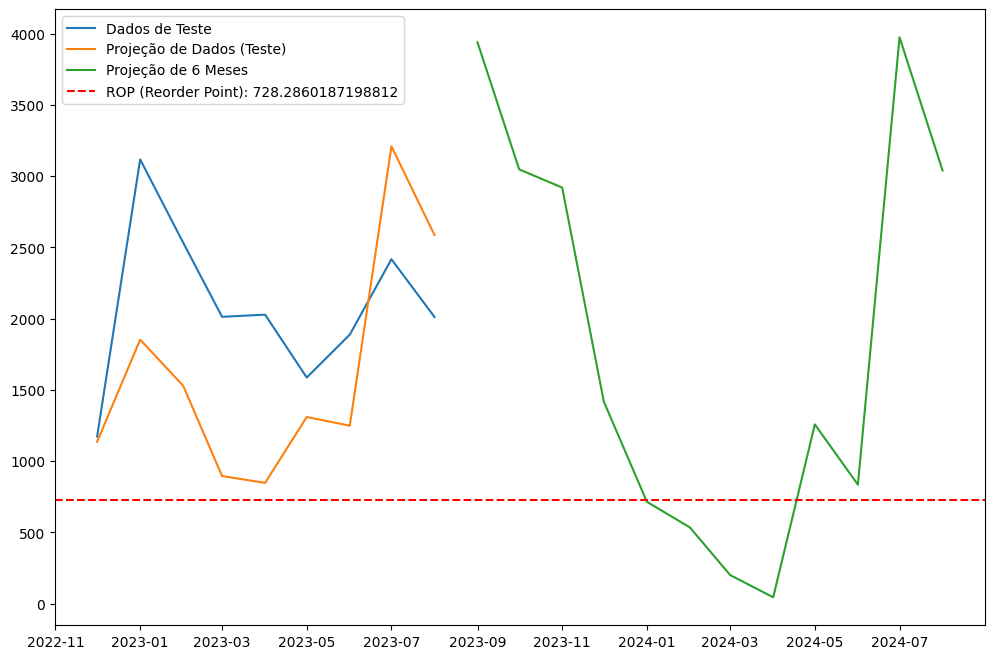

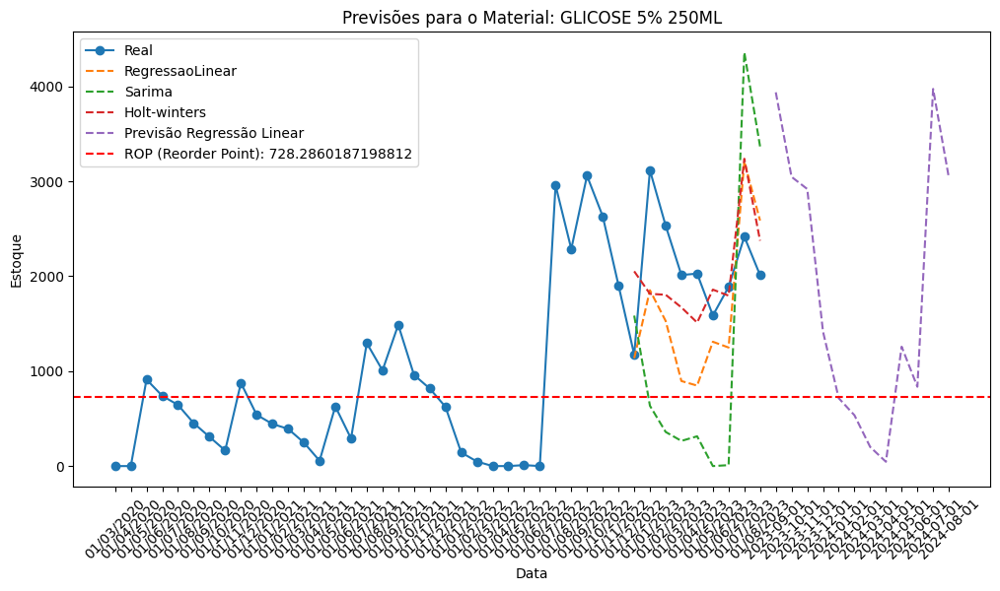

Erro MAPE para o conjunto de teste: 41.73%
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,1,1)[12] intercept   : AIC=inf, Time=1.93 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=341.089, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=327.295, Time=0.38 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=344.243, Time=0.03 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=331.574, Time=0.04 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=329.119, Time=0.87 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=329.180, Time=0.63 sec
 ARIMA(1,0,0)(0,1,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=1.25 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=339.116, Time=0.16 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=329.116, Time=0.51 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=328.643, Time=0.51 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=328.735, Time=0.44 sec
 ARIMA

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'


Erro MAPE nos dados de teste: 79.91%
{'RegressaoLinear': 41.73106216508241, 'Sarima': 79.91033777221124, 'HoltWinters': 29.097364382667777} HoltWinters
Valores reais [   0    0  912  740  644  452  308  164  876  540  444  392  248   56
  629  290 1296 1008 1488  961  817  625  144   48    0    0   10    0
 2959 2287 3059 2632 1906 1173 3117 2533 2013 2028 1587 1888 2417 2012]
previsão Regressão Linear 0    1136.411290
1    1853.148084
2    1528.979876
3     896.038014
4     847.952233
5    1310.027431
6    1249.071259
7    3209.108861
8    2587.102733
Name: Forecast, dtype: float64
Previsão SARIMA 0    1585.427001
1     635.257875
2     359.452454
3     265.170568
4     313.720683
5       0.000000
6       9.801040
7    4359.318713
8    3368.188461
Name: Forecast, dtype: float64
Previsão Holt-winters 0    2052.104793
1    1814.908975
2    1805.189028
3    1671.888537
4    1512.357864
5    1859.507472
6    1795.874417
7    3238.045105
8    2374.810673
Name: Forecast, dtype: float64
exte

TypeError: ignored

In [ ]:
# Selecione um material específico
material = 'GLICOSE 5% 250ML'
material_df = df[df['Material'] == material]
meses = 12

# Se a coluna de datas for a primeira após a coluna 'ROP', ajuste conforme necessário
dates = material_df.columns[8:]  # Ajuste o índice conforme necessário
stock = material_df.iloc[:, 8:]  # Ajuste o índice conforme necessário
dates = dates[:-3]
stock = stock.iloc[:, :-3]
stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']
rop = material_df.iloc[0]['ROP']
reducao_mensal = DMD_Reducao_Estoque * 30

# Suas previsões
rl = regressao_linear_analise()
s = sarima_analise()
hw = holt_winters_analise()

# Use apenas as últimas 9 datas disponíveis para todas as previsões
last_9_dates = dates[-9:]
rl = np.pad(rl.flatten()[-9:], (max(0, 9 - len(rl)), 0))
s = np.pad(s[-9:], (max(0, 9 - len(s)), 0))
hw = np.pad(hw[-9:], (max(0, 9 - len(hw)), 0))

# Crie DataFrames para suas previsões
ext_regressao_linear = pd.DataFrame({'Date': last_9_dates, 'Forecast': rl})
ext_sarima = pd.DataFrame({'Date': last_9_dates, 'Forecast': s})
ext_holt_winters = pd.DataFrame({'Date': last_9_dates, 'Forecast': hw})

# Obtém a previsão adicional de Holt-Winters
#prev_holt_winters = previsao_holt_winters(12)
#prev_sarima = previsao_sarima(12)
#prev_sarima = pd.DataFrame({
#'Date': prev_sarima.index,
#'Forecast': prev_sarima.values
#})

prev_regressao = previsao_regressao_linear(12)
previsao_data = [entry[0] for entry in prev_regressao]
previsao_values = [entry[1] for entry in prev_regressao]
prev_regressao = pd.DataFrame({
    'Date': previsao_data,
    'Forecast': previsao_values
})

# Ajusta o índice para que seja uma coluna de datas
#prev_holt_winters.reset_index(inplace=True)
#prev_sarima.reset_index(inplace=True)
prev_regressao.reset_index(inplace=True)

#prev_holt_winters['Date'] = prev_holt_winters['Date'].astype(str)
#prev_sarima['Date'] = prev_sarima['Date'].astype(str)
prev_regressao['Date'] = prev_regressao['Date'].astype(str)

# Crie o DataFrame para a previsão adicional de Holt-Winters
#ext_prev_holt_winters = pd.DataFrame({'Date': prev_holt_winters['Date'], 'Forecast': prev_holt_winters['Forecast']})
#ext_prev_sarima = pd.DataFrame({'Date': prev_sarima['Date'], 'Forecast': prev_sarima['Forecast']})
ext_prev_regressao = pd.DataFrame({'Date': prev_regressao['Date'], 'Forecast': prev_regressao['Forecast']})

#dates = dates.astype(str)

# Plota o gráfico
plt.figure(figsize=(12, 6))
plt.plot(dates, stock.values[0], marker='o', linestyle='-', label='Real')
plt.plot(ext_regressao_linear['Date'], ext_regressao_linear['Forecast'], label='RegressaoLinear', linestyle='--')
plt.plot(ext_sarima['Date'], ext_sarima['Forecast'], label='Sarima', linestyle='--')
plt.plot(ext_holt_winters['Date'], ext_holt_winters['Forecast'], label='Holt-winters', linestyle='--')
#plt.plot(ext_prev_holt_winters['Date'], ext_prev_holt_winters['Forecast'], label='Previsão Holt-winters', linestyle='--')
#plt.plot(ext_prev_sarima['Date'], ext_prev_sarima['Forecast'], label='Previsão SARIMA', linestyle='--')
plt.plot(ext_prev_regressao['Date'], ext_prev_regressao['Forecast'], label='Previsão Regressão Linear', linestyle='--')
plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
plt.xticks(rotation=45)
plt.title(f'Previsões para o Material: {material}')
plt.xlabel('Data')
plt.ylabel('Estoque')
plt.legend()
plt.show()
# Calcula os erros para cada método
erros = {
    'RegressaoLinear': regressao_linear(),
    'Sarima': sarima(),
    'HoltWinters': holt_winters()
}

# Encontra o método com o menor erro
melhor_metodo = min(erros, key=erros.get)
print(erros, melhor_metodo)

print('Valores reais',stock.values[0])
print('previsão Regressão Linear',ext_regressao_linear['Forecast'])
print('Previsão SARIMA',ext_sarima['Forecast'])
print('Previsão Holt-winters',ext_holt_winters['Forecast'])
print('extensão da previsão Regressão Linear (médoto escolhido)',prev_regressao['Forecast'])
detectar_atingimento_rop(prev_regressao, rop, reducao_mensal)
identificar_aumento_previsao(prev_regressao)


# FIM DO NOTEBOOK

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Suponha que você já tenha seus dados de estoque (stock_series) e datas (dates)

# Determine o índice de divisão entre os primeiros 80% e os últimos 20% dos dados
split_index = int(0.90 * len(data))

# Divida os dados
train_data = data.iloc[:split_index]
test_data = data.iloc[split_index:]

# Defina a ordem do modelo SARIMA
order = identificar_parametros_ARIMA(train_data)
P_range = [0, 1, 2]  # Faixa de valores para a ordem da componente autoregressiva sazonal
D_range = [0, 1]     # Faixa de valores para a ordem da diferenciação sazonal
Q_range = [0, 1, 2]  # Faixa de valores para a ordem da componente de média móvel sazonal
s_range = [12]

seasonal_order = identificar_seasonal_order(train_data, order[0], order[1], order[2], P_range, D_range, Q_range, s_range)  # Ajuste os valores de acordo com a sazonalidade dos seus dados

# Crie o modelo SARIMA com base nos dados de treinamento
model = SARIMAX(train_data['Stock'], order=order, seasonal_order=seasonal_order)
model_fit = model.fit(disp=0)

# Faça previsões para os dados de teste (últimos 20%)
forecast = model_fit.get_forecast(steps=len(test_data))

# Substitua os valores negativos por zero nas previsões
forecast.predicted_mean = forecast.predicted_mean.clip(lower=0)

# Gere datas para os dados de teste
test_dates = pd.to_datetime(dates[split_index:], format='%d/%m/%Y')

# Crie um DataFrame com as previsões
forecast_data = pd.DataFrame({'Date': test_dates, 'Forecast': forecast.predicted_mean})

# Plote os dados reais e as previsões
plt.figure(figsize=(12, 8))
plt.title('Previsão de Estoque para os Últimos 20% dos Dados (Modelo SARIMA)')
plt.xlabel('Data')
plt.ylabel('Estoque')
plt.plot(pd.to_datetime(dates, format='%d/%m/%Y'), stock_series, marker='o', linestyle='-', label='Valores de Estoque')
plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
plt.legend()
plt.xticks(rotation=45)
plt.show()
print(train_data[-1:])
print(forecast_data)


NameError: ignored

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error

# Crie listas para armazenar os valores de MAPE, RMSE, MAE e MSE
mape_list = []
rmse_list = []
mae_list = []
mse_list = []

# Crie uma lista para armazenar informações sobre os itens com MAPE igual a 0.00%
mape_0_items = []

# Itere sobre os materiais únicos em seu DataFrame
for material in df['Material'].unique():
    # Selecione os dados para o material atual
    material_df = df[df['Material'] == material]
    dates = material_df.columns[8:-3]  # Suponha que as datas estão nas colunas 8 em diante
    stock = material_df.iloc[:, 8:-3]
    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series})

    # Determine o índice de divisão entre os primeiros 80% e os últimos 20% dos dados
    split_index = int(0.8 * len(data))

    # Divida os dados
    train_data = data.iloc[:split_index]
    test_data = data.iloc[split_index:]

    # Aplique o modelo Holt-Winters aos dados de treinamento
    model = ExponentialSmoothing(train_data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()

    # Faça previsões para os dados de teste
    forecast = model_fit.forecast(steps=len(test_data))

    # Calcule o MAPE, MAE e MSE entre os valores reais e as previsões
    def mean_absolute_percentage_error(y_true, y_pred):
        # Evitar a divisão por zero tratando valores zero
        mask = y_true != 0
        y_true_masked = y_true[mask]
        y_pred_masked = y_pred[mask]

        if len(y_true_masked) == 0:
            return 0  # Retorna 0 se não houver valores válidos

        percentage_errors = np.abs((y_true_masked - y_pred_masked) / y_true_masked) * 100
        mape = np.mean(percentage_errors)

        return mape

    def mean_absolute_error(y_true, y_pred):
        return np.mean(np.abs(y_true - y_pred))

    def mean_squared_error(y_true, y_pred):
        return np.mean((y_true - y_pred)**2)

    mape = mean_absolute_percentage_error(test_data['Stock'], forecast)
    mae = mean_absolute_error(test_data['Stock'], forecast)
    mse = mean_squared_error(test_data['Stock'], forecast)

    # Adicione os valores de MAPE, MAE e MSE às listas
    mape_list.append(mape)
    mae_list.append(mae)
    mse_list.append(mse)
    rmse_list.append(np.sqrt(mse))

    # Verifique se o MAPE é igual a 0.00% e armazene informações sobre o item
    if mape == 0.00:
        mape_0_items.append({
            'Material': material,
            'MAPE': mape,
            'MAE': mae,
            'MSE': mse
        })

# Calcule a média, mínimo e máximo do MAPE, MAE, MSE e RMSE
mape_media = np.mean(mape_list)
mape_minimo = np.min(mape_list)
mape_maximo = np.max(mape_list)

mae_media = np.mean(mae_list)
mae_minimo = np.min(mae_list)
mae_maximo = np.max(mae_list)

mse_media = np.mean(mse_list)
mse_minimo = np.min(mse_list)
mse_maximo = np.max(mse_list)

rmse_media = np.mean(rmse_list)
rmse_minimo = np.min(rmse_list)
rmse_maximo = np.max(rmse_list)

# Imprima os resultados
print(f"Média do MAPE para todos os materiais: {mape_media:.2f}%")
print(f"Mínimo do MAPE para todos os materiais: {mape_minimo:.2f}%")
print(f"Máximo do MAPE para todos os materiais: {mape_maximo:.2f}%")
print(f"Média do MAE para todos os materiais: {mae_media:.2f}")
print(f"Mínimo do MAE para todos os materiais: {mae_minimo:.2f}")
print(f"Máximo do MAE para todos os materiais: {mae_maximo:.2f}%")
print(f"Média do MSE para todos os materiais: {mse_media:.2f}")
print(f"Mínimo do MSE para todos os materiais: {mse_minimo:.2f}")
print(f"Máximo do MSE para todos os materiais: {mse_maximo:.2f}")
print(f"Média do RMSE para todos os materiais: {rmse_media:.2f}")
print(f"Mínimo do RMSE para todos os materiais: {rmse_minimo:.2f}")
print(f"Máximo do RMSE para todos os materiais: {rmse_maximo:.2f}")
print(mape_0_items)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_date

KeyboardInterrupt: ignored

In [ ]:
# Calcular a diferença entre as previsões
forecast_data['ForecastDiff'] = forecast_data['Forecast'].diff()

# Identificar quando comprar (quando a previsão aumenta em relação ao mês anterior)
forecast_data['BuySignal'] = forecast_data['ForecastDiff'] > 0

# Calcular a quantidade a comprar (diferença entre as quantidades quando a previsão aumenta)
forecast_data['QuantityToBuy'] = forecast_data['ForecastDiff'].apply(lambda x: max(x, 0))

if forecast_data['BuySignal'].any():
    # Se houver recomendações, iterar sobre os dados e exibir as recomendações
    print("É recomendada compra com base na previsão: ")
    for index, row in forecast_data.iterrows():
        if row['BuySignal']:
            data_atingimento_rop = row['Date'] - pd.DateOffset(months=1)
            quantidade_a_comprar = row['QuantityToBuy']
            print(f"Data recomendada para compra: {data_atingimento_rop.strftime('%B %Y')}")
            print(f"Quantidade recomendada para compra: {quantidade_a_comprar:.2f} unidades\n")
else:
    # Se não houver recomendações, informar ao usuário que nenhuma compra é recomendada
    print("Não há recomendações de compra com base na previsão.")

É recomendada compra com base na previsão: 
Data recomendada para compra: February 2023
Quantidade recomendada para compra: 92.89 unidades

Data recomendada para compra: March 2023
Quantidade recomendada para compra: 94.95 unidades

Data recomendada para compra: April 2023
Quantidade recomendada para compra: 478.81 unidades

Data recomendada para compra: May 2023
Quantidade recomendada para compra: 66.43 unidades

Data recomendada para compra: June 2023
Quantidade recomendada para compra: 15.46 unidades

32           NaN
33   -257.007979
34   -169.141807
35   -101.953794
36     92.894882
37     94.950210
38    478.812014
39     66.434765
40     15.459597
Name: ForecastDiff, dtype: float64


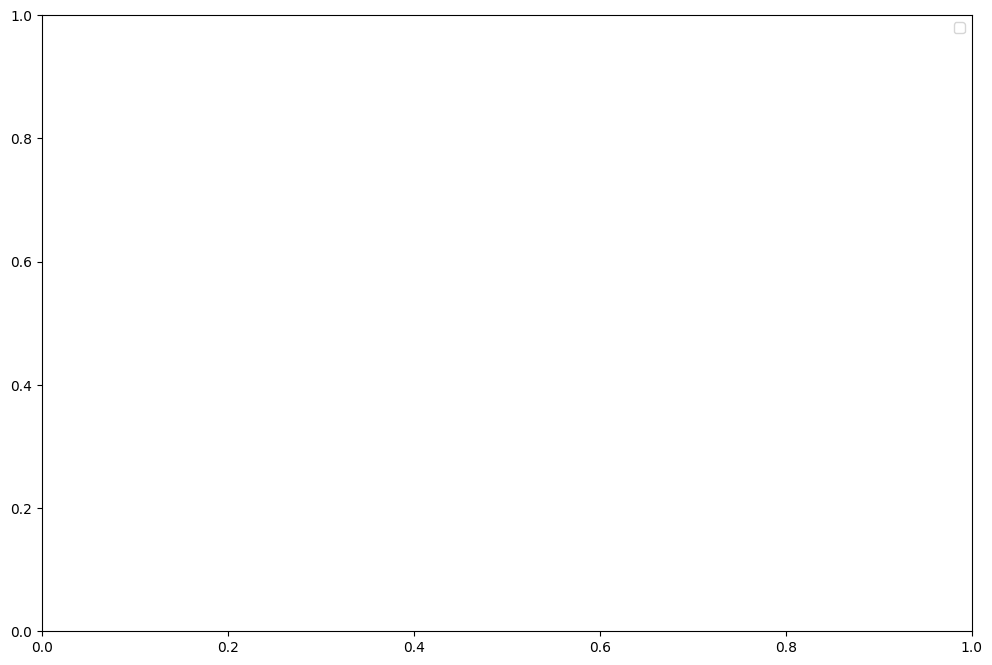

In [ ]:
# Calcular a diferença entre as previsões
forecast_data['ForecastDiff'] = forecast_data['Forecast'].diff()

# Identificar quando comprar (quando a previsão aumenta em relação ao mês anterior)
forecast_data['BuySignal'] = forecast_data['ForecastDiff'] > 0

# Calcular a quantidade a comprar (diferença entre as quantidades quando a previsão aumenta)
forecast_data['QuantityToBuy'] = forecast_data['ForecastDiff'].apply(lambda x: max(x, 0))

data_atingimento_rop = None

# Itere pelas previsões e datas correspondentes
for date, forecast in zip(forecast_data['Date'], forecast_data['Forecast']):
    if forecast <= rop:
        data_atingimento_rop = date
        break  # Saia do loop quando atingir o ROP

plt.figure(figsize=(12, 8))
if data_atingimento_rop:
    print(f"A data em que a previsão atinge o ROP ({rop}) é: {data_atingimento_rop}")

    # Encontre o índice correspondente à data de atingimento do ROP
    idx = forecast_data.index[forecast_data['Date'] == data_atingimento_rop][0]

    # Calcule a quantidade a ser comprada com base na diferença entre o ROP e a previsão
    quantidade_a_comprar = max(rop - forecast_data['Forecast'][idx], 0) + 3*reducao_mensal

    print(f"Quantidade recomendada para compra na data do ROP: {quantidade_a_comprar:.2f} unidades")

    # Plotar a data de atingimento do ROP no gráfico
    plt.axvline(x=data_atingimento_rop, color='green', linestyle='--', label=f'Data de Atingimento do ROP ({data_atingimento_rop})')
    plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
    plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')

# Restante do seu código para plotar os dados reais, previsões e ROP (como mencionado anteriormente)
# Incluir a legenda no gráfico
plt.legend()

# Exibir o gráfico
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, widgets
from IPython.display import display

# Suponha que você tem um DataFrame chamado df com dados do estoque e datas

# Lista de materiais únicos
materiais_unicos = df['Material'].unique()

# Widget suspenso para selecionar o material
material_dropdown = widgets.Dropdown(
    options=materiais_unicos,
    description='Material:'
)

# Função para plotar o gráfico com base no material selecionado
def plot_material(material):
    plt.figure(figsize=(18, 6))
    plt.title(f'Estoque do Material: {material}')
    plt.xlabel('Data')
    plt.ylabel('Estoque')

    material_df = df[df['Material'] == material]

    # Use as colunas de data e estoque específicas do material
    dates = material_df.columns[8:-3]  # Suponha que as datas estão nas colunas 8 em diante
    stock = material_df.iloc[:, 8:-3]
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']  # Use o valor correto do DataFrame
    rop = material_df.iloc[0]['ROP']

    estoque_atual = stock.values[0][-1]  # Use o valor correto do DataFrame
    reducao_mensal = DMD_Reducao_Estoque * 30  # Suponha 30 dias por mês
    estoque_simulado = [estoque_atual]
    data_ativacao_rop = None
    for i in range(1, 13):
        estoque_simulado.append(max(0, estoque_simulado[-1] - reducao_mensal))

    last_date = pd.to_datetime(dates[-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, 13)]

    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series.values})
    model = ExponentialSmoothing(data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=12)

    # Aplicando um limite inferior de zero
    forecast[forecast < 0] = 0

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': future_dates, 'Forecast': forecast})

        # Calcular a diferença entre as previsões
    forecast_data['ForecastDiff'] = forecast_data['Forecast'].diff()

    # Identificar quando comprar (quando a previsão aumenta em relação ao mês anterior)
    forecast_data['BuySignal'] = forecast_data['ForecastDiff'] > 0

    # Calcular a quantidade a comprar (diferença entre as quantidades quando a previsão aumenta)
    forecast_data['QuantityToBuy'] = forecast_data['ForecastDiff'].apply(lambda x: max(x, 0))

    if forecast_data['BuySignal'].any():
        # Se houver recomendações, iterar sobre os dados e exibir as recomendações
        print("É recomendada compra com base na previsão: ")
        for index, row in forecast_data.iterrows():
            if row['BuySignal']:
                data_atingimento_rop = datetime.strptime(row['Date'], '%d/%m/%Y') - timedelta(days=1)
                quantidade_a_comprar = row['QuantityToBuy']
                print(f"Data recomendada para compra: {data_atingimento_rop.strftime('%B %Y')}")
                print(f"Quantidade recomendada para compra: {quantidade_a_comprar:.2f} unidades\n")
    else:
        # Se não houver recomendações, informar ao usuário que nenhuma compra é recomendada
        print("Não há recomendações de compra com base na previsão.")
    data_atingimento_rop = None

    # Itere pelas previsões e datas correspondentes
    for date, forecast in zip(forecast_data['Date'], forecast_data['Forecast']):
        if forecast <= rop:
            data_atingimento_rop = date
            break  # Saia do loop quando atingir o ROP

    if data_atingimento_rop:
        print(f"A data em que a previsão atinge o ROP ({rop}) é: {data_atingimento_rop}")

        # Encontre o índice correspondente à data de atingimento do ROP
        idx = forecast_data.index[forecast_data['Date'] == data_atingimento_rop][0]

        # Calcule a quantidade a ser comprada com base na diferença entre o ROP e a previsão
        quantidade_a_comprar = max(rop - forecast_data['Forecast'][idx], 0) + 3*reducao_mensal

        print(f"Quantidade recomendada para compra na data do ROP: {quantidade_a_comprar:.2f} unidades")

    for i in range(len(stock)):
        plt.plot(dates, stock.iloc[i], marker='o', label=f'estoque')
        plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
        plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
        plt.plot(future_dates, estoque_simulado[1:], marker='o', linestyle='-', label='Redução de Estoque')


    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

# Conectar o widget à função de plotagem
interact(plot_material, material=material_dropdown)

# Exibir o widget
display(material_dropdown)

interactive(children=(Dropdown(description='Material:', options=('EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14. …

Dropdown(description='Material:', options=('EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14.  PVC SILICONIZADO.', '…

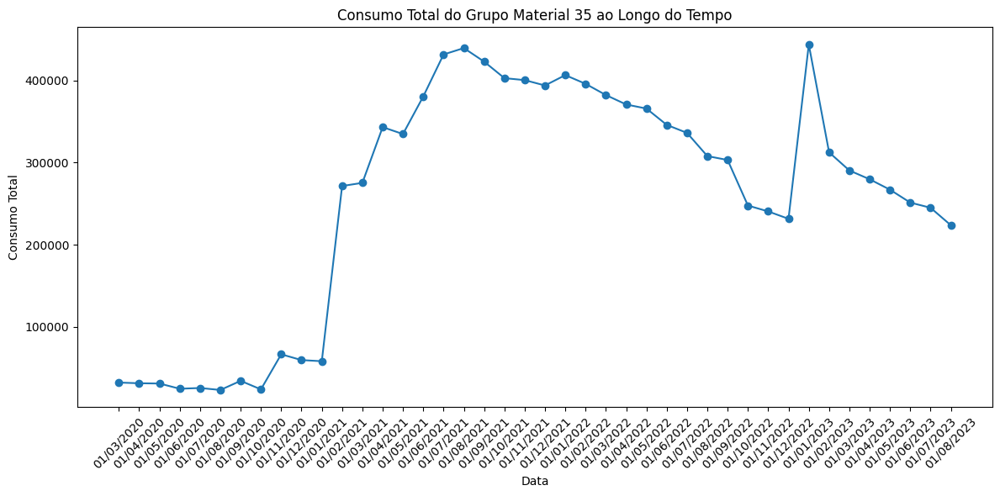

In [ ]:
# Filtrar o DataFrame para incluir apenas as linhas do Grupo Material 35
grupo_material_35_df = df[df['Grupo Material'] == 35]

# Selecionar as colunas de data e estoque (supondo que as colunas de estoque começam a partir da 9ª coluna)
dates = grupo_material_35_df.columns[8:]  # Colunas de data
stock = grupo_material_35_df.iloc[:, 8:]  # Colunas de estoque

# Calcular o consumo total para cada mês/ano
consumo_total_por_mes = stock.sum()

# Configurar o tamanho da figura
plt.figure(figsize=(12, 6))

# Excluir os 3 últimos pontos
dates = dates[:-3]
consumo_total_por_mes = consumo_total_por_mes[:-3]

# Plotar o gráfico de consumo total ao longo do tempo
plt.plot(dates, consumo_total_por_mes, marker='o', linestyle='-')

# Configurar rótulos e título
plt.xlabel('Data')
plt.ylabel('Consumo Total')
plt.title('Consumo Total do Grupo Material 35 ao Longo do Tempo')

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45)

# Mostrar o gráfico
plt.tight_layout()
plt.show()

In [ ]:
# Define a data do último mês (agosto de 2023)
data_ultimo_mes = '01/08/2023'

# Filtrar o DataFrame para incluir apenas os materiais com estoque abaixo do ROP no último mês
materiais_abaixo_do_ROP = df[df[data_ultimo_mes] < df['ROP']]

# Filtrar os materiais onde a coluna DMD_Reducao_Estoque é maior que 0
materiais_com_DMD_maior_que_0 = materiais_abaixo_do_ROP[df['DMD_Reducao_Estoque'] > 0]

# Exibir os materiais selecionados
print("Materiais com estoque abaixo do ROP no último mês (agosto de 2023) e DMD_Reducao_Estoque maior que 0:")
print(materiais_com_DMD_maior_que_0[['Material', data_ultimo_mes, 'ROP', 'DMD_Reducao_Estoque']])


Materiais com estoque abaixo do ROP no último mês (agosto de 2023) e DMD_Reducao_Estoque maior que 0:
                                               Material  01/08/2023  \
0     EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14.  P...           0   
2     EBS00258 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 06. PV...           0   
4     EBS00257 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 04. PV...         181   
21    EBS00261 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 12. PV...           0   
24    SONDA LÁTEX SILICONIZADO,  FOLEY, N° 10,  2 VI...           0   
...                                                 ...         ...   
7608              DEXAMETASONA ACETATO A 0,1% CREME 10G           0   
7612        PENICILINA G CRISTALINA 5.000.000 UI FR/AMP           0   
7625                   AVEIA EM FLOCOS FINOS EMB. 500GR           0   
7626                           VINAGRE FRASCO DE 750 ML           0   
7654  MARMITA DE POLIESTILENO ESTENDIDO COM TRÊS DIV...        4300   

               ROP  DMD_Reducao_Estoque  
0  

<ipython-input-15-9ee699cba712>:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  materiais_com_DMD_maior_que_0 = materiais_abaixo_do_ROP[df['DMD_Reducao_Estoque'] > 0]


In [ ]:
import pandas as pd

# Suponha que você tenha um DataFrame chamado df que contém informações de materiais,
# incluindo 'Material', 'DMD_Reducao_Estoque' e 'Estoque_Atual'.

# Crie uma lista de datas para os próximos 3 meses
next_3_months = pd.date_range(pd.Timestamp.now(), periods=3, freq='M')

# Inicialize um contador para o número de materiais com estoque zero nos próximos 3 meses
materials_with_zero_stock = 0

# Itere pelos materiais no DataFrame
for _, material in df.iterrows():
    dmd_reducao_estoque = material['DMD_Reducao_Estoque']

    # Simule a redução de estoque para os próximos 3 meses
    estoque_simulado = estoque_atual
    for month in next_3_months:
        reducao_mensal = dmd_reducao_estoque * month.days_in_month
        estoque_simulado -= reducao_mensal

        # Verifique se o estoque fica menor ou igual a zero
        if estoque_simulado <= 0:
            materials_with_zero_stock += 1
            break  # Não é necessário verificar os meses restantes

# O resultado será o número de materiais que atingem estoque zero nos próximos 3 meses
print(f'Número de materiais com estoque zero nos próximos 3 meses: {materials_with_zero_stock}')


Número de materiais com estoque zero nos próximos 3 meses: 525


In [ ]:
df.to_csv('meu_arquivo.csv', index=False)
files.download('meu_arquivo.csv')

In [ ]:
# Lista de materiais únicos
materiais_unicos = df['Material'].unique()

# Widget suspenso para selecionar o material
material_dropdown = widgets.Dropdown(
    options=materiais_unicos,
    description='Material:'
)

# Função para plotar o gráfico com base no material selecionado
def plot_material(material):
    plt.figure(figsize=(18, 6))
    plt.title(f'Estoque do Material: {material}')
    plt.xlabel('Data')
    plt.ylabel('Estoque')

    material_df = df[df['Material'] == material]

    # Use as colunas de data e estoque específicas do material
    dates = material_df.columns[8:-3]  # Suponha que as datas estão nas colunas 8 em diante
    stock = material_df.iloc[:, 8:-3]
    DMD_Reducao_Estoque = material_df.iloc[0]['DMD_Reducao_Estoque']  # Use o valor correto do DataFrame
    rop = material_df.iloc[0]['ROP']

    estoque_atual = stock.values[0][-1]  # Use o valor correto do DataFrame
    reducao_mensal = DMD_Reducao_Estoque * 30  # Suponha 30 dias por mês
    estoque_simulado = [estoque_atual]
    data_ativacao_rop = None
    for i in range(1, 13):
        estoque_simulado.append(max(0, estoque_simulado[-1] - reducao_mensal))

    last_date = pd.to_datetime(dates[-1], format='%d/%m/%Y')
    future_dates = [(last_date + pd.DateOffset(months=i)).strftime('%d/%m/%Y') for i in range(1, 13)]

    stock_series = pd.Series(stock.values[0], index=pd.to_datetime(dates, format='%d/%m/%Y'))
    data = pd.DataFrame({'Date': pd.to_datetime(dates, format='%d/%m/%Y'), 'Stock': stock_series.values})
    model = ExponentialSmoothing(data['Stock'], seasonal='add', seasonal_periods=12)
    model_fit = model.fit()
    forecast = model_fit.forecast(steps=12)

    # Aplicando um limite inferior de zero
    forecast[forecast < 0] = 0

    # Crie um DataFrame com as previsões
    forecast_data = pd.DataFrame({'Date': future_dates, 'Forecast': forecast})

        # Calcular a diferença entre as previsões
    forecast_data['ForecastDiff'] = forecast_data['Forecast'].diff()

    # Identificar quando comprar (quando a previsão aumenta em relação ao mês anterior)
    forecast_data['BuySignal'] = forecast_data['ForecastDiff'] > 0

    # Calcular a quantidade a comprar (diferença entre as quantidades quando a previsão aumenta)
    forecast_data['QuantityToBuy'] = forecast_data['ForecastDiff'].apply(lambda x: max(x, 0))

    if forecast_data['BuySignal'].any():
        # Se houver recomendações, iterar sobre os dados e exibir as recomendações
        print("É recomendada compra com base na previsão: ")
        for index, row in forecast_data.iterrows():
            if row['BuySignal']:
                data_atingimento_rop = datetime.strptime(row['Date'], '%d/%m/%Y') - timedelta(days=1)
                quantidade_a_comprar = row['QuantityToBuy']
                print(f"Data recomendada para compra: {data_atingimento_rop.strftime('%B %Y')}")
                print(f"Quantidade recomendada para compra: {quantidade_a_comprar:.2f} unidades\n")
    else:
        # Se não houver recomendações, informar ao usuário que nenhuma compra é recomendada
        print("Não há recomendações de compra com base na previsão.")
    data_atingimento_rop = None

    # Itere pelas previsões e datas correspondentes
    for date, forecast in zip(forecast_data['Date'], forecast_data['Forecast']):
        if forecast <= rop:
            data_atingimento_rop = date
            break  # Saia do loop quando atingir o ROP

    if data_atingimento_rop:
        print(f"A data em que a previsão atinge o ROP ({rop}) é: {data_atingimento_rop}")

        # Encontre o índice correspondente à data de atingimento do ROP
        idx = forecast_data.index[forecast_data['Date'] == data_atingimento_rop][0]

        # Calcule a quantidade a ser comprada com base na diferença entre o ROP e a previsão
        quantidade_a_comprar = max(rop - forecast_data['Forecast'][idx], 0) + 3*reducao_mensal

        print(f"Quantidade recomendada para compra na data do ROP: {quantidade_a_comprar:.2f} unidades")

    for i in range(len(stock)):
        plt.plot(dates, stock.iloc[i], marker='o', label=f'estoque')
        plt.axhline(y=rop, color='red', linestyle='--', label=f'ROP (Reorder Point): {rop}')
        plt.plot(forecast_data['Date'], forecast_data['Forecast'], linestyle='--', label='Previsão de Estoque')
        plt.plot(future_dates, estoque_simulado[1:], marker='o', linestyle='-', label='Redução de Estoque')


    plt.xticks(rotation=45)
    plt.legend()
    plt.show()

# Conectar o widget à função de plotagem
interact(plot_material, material=material_dropdown)

# Exibir o widget
display(material_dropdown)

interactive(children=(Dropdown(description='Material:', options=('EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14. …

Dropdown(description='Material:', options=('EBS00262 - SONDA  ASPIRAÇÃO TRAQUEAL Nº 14.  PVC SILICONIZADO.', '…